In [1]:
import numpy as np
from tsai.all import *
import sklearn.metrics as skm
from tqdm import tqdm
from sklearn.model_selection import train_test_split
import pandas as pd
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader, TensorDataset
from sklearn.metrics import confusion_matrix, classification_report
import matplotlib.pyplot as plt
import seaborn as sns
import random
import time

In [2]:
def set_seed(seed=1337):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed(seed)
        torch.cuda.manual_seed_all(seed)  # if you are using multi-GPU.

    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

    os.environ['PYTHONHASHSEED'] = str(seed)
    os.environ['CUBLAS_WORKSPACE_CONFIG'] = ':16:8'
    torch.use_deterministic_algorithms(True, warn_only=True)

In [3]:
set_seed(1337)

In [4]:
num_epochs = 100
few_shot_patience = 5

In [6]:
df = pd.read_pickle('togzhan_data_labeled.pkl').reset_index(drop=True)
df['Trial ID'] = df['Person No'].astype(str) + '_' + df['Trial No'].astype(str)


In [8]:
# Load the new doctors data
doctors_df = pd.read_pickle('doctors_data_labeled.pkl').reset_index(drop=True)
doctors_df['Trial ID'] = doctors_df['Person No'].astype(str) + '_' + df['Trial No'].astype(str)

In [9]:
for data in [df, doctors_df]:
    data['Lump'] = data['Type'].apply(lambda x: 1 if x < 9 else 0)
    data['Size'] = data['Type'].apply(lambda x: 0 if x in [0, 1, 2] else 1 if x in [3, 4, 5] else 2 if x in [6, 7, 8] else 3)
    data['Position'] = data['Type'].apply(lambda x: 0 if x in [0, 3, 6] else 1 if x in [1, 4, 7] else 2 if x in [2, 5, 8] else 3)


In [10]:
def split_trials(data, train_lump_count, val_lump_count, test_lump_count, train_no_lump_count, val_no_lump_count, test_no_lump_count):
    train_trials = []
    val_trials = []
    test_trials = []

    for person_no in data['Person No'].unique():
        person_df = data[data['Person No'] == person_no]

        for lump_type in range(9):  # 9 types with lump
            lump_df = person_df[person_df['Type'] == lump_type]
            lump_train, lump_temp = train_test_split(lump_df, test_size=(val_lump_count + test_lump_count), random_state=1337)
            lump_val, lump_test = train_test_split(lump_temp, test_size=test_lump_count, random_state=1337)
            
            train_trials.extend(lump_train.index.tolist())
            val_trials.extend(lump_val.index.tolist())
            test_trials.extend(lump_test.index.tolist())

        for no_lump_type in range(9, 13):  # 4 types without lump
            no_lump_df = person_df[person_df['Type'] == no_lump_type]
            no_lump_train, no_lump_temp = train_test_split(no_lump_df, test_size=(val_no_lump_count + test_no_lump_count), random_state=1337)
            no_lump_val, no_lump_test = train_test_split(no_lump_temp, test_size=test_no_lump_count, random_state=1337)
            
            train_trials.extend(no_lump_train.index.tolist())
            val_trials.extend(no_lump_val.index.tolist())
            test_trials.extend(no_lump_test.index.tolist())

    # Ensure there is no overlap between train, validation, and test sets
    train_trials = set(train_trials)
    val_trials = set(val_trials)
    test_trials = set(test_trials)

    assert len(train_trials & val_trials) == 0, "Train and Validation sets overlap!"
    assert len(train_trials & test_trials) == 0, "Train and Test sets overlap!"
    assert len(val_trials & test_trials) == 0, "Validation and Test sets overlap!"

    return train_trials, val_trials, test_trials

In [11]:
train_lump_count = 20
val_lump_count = 8
test_lump_count = 4

train_no_lump_count = 48
val_no_lump_count = 18
test_no_lump_count = 9

In [12]:
train_trials, val_trials, test_trials = split_trials(
    df,
    train_lump_count=train_lump_count,
    val_lump_count=val_lump_count,
    test_lump_count=test_lump_count,
    train_no_lump_count=train_no_lump_count,
    val_no_lump_count=val_no_lump_count,
    test_no_lump_count=test_no_lump_count
)

# Create masks for train, validation, and test sets
train_mask = df.index.isin(train_trials)
val_mask = df.index.isin(val_trials)
test_mask = df.index.isin(test_trials)

train_df = df[train_mask]
valid_df = df[val_mask]
test_df = df[test_mask]

# Verify the sizes of the resulting sets
print(f"Train set size: {len(train_df)}")
print(f"Validation set size: {len(valid_df)}")
print(f"Test set size: {len(test_df)}")

Train set size: 3600
Validation set size: 1440
Test set size: 720


In [13]:
df

,Person No,Type,Trial No,Data,Label,Trial ID,Lump,Size,Position
0,0,0,0,"[1.0, 1.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 1.0, 0.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.0, 0.0, 2.0, 0.0, 0.0, 2.0, 2.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 1.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 1.0, 0.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 1.0, ...]",1,0_0,1,0,0
1,0,0,1,"[0.0, 0.0, 1.0, 1.0, 0.0, 1.0, 1.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 1.0, 0.0, 0.0, 1.0, 1.0, 0.0, 1.0, 1.0, 0.0, 1.0, 1.0, 0.0, 0.0, 0.0, 1.0, 1.0, 0.0, 0.0, 0.0, 1.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, ...]",1,0_1,1,0,0
2,0,0,2,"[0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 0.0, 0.0, 2.0, 0.0, 0.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 1.0, ...]",1,0_2,1,0,0
3,0,0,3,"[1.0, 1.0, 2.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 1.0, 1.0, 0.0, 2.0, 2.0, 0.0, 1.0, 1.0, 1.0, 1.0, 2.0, 0.0, 0.0, 3.0, 0.0, 0.0, 1.0, 1.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 1.0, 2.0, 2.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.0, 1.0, 1.0, 2.0, 2.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.0, 0.0, 2.0, 0.0, 0.0, 1.0, 1.0, 2.0, 1.0, 1.0, 0.0, 2.0, 2.0, 2.0, 2.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 2.0, 1.0, 1.0, 2.0, 2.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 1.0, ...]",1,0_3,1,0,0
4,0,0,4,"[0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 1.0, 0.0, 0.0, 2.0, 2.0, 2.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.0, 0.0, 1.0, 1.0, 1.0, 2.0, 2.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 0.0, 0.0, 1.0, 0.0, 0.0, 1.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 1.0, 1.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.0, 0.0, 2.0, 1.0, 1.0, 1.0, 0.0, 0.0, 1.0, 1.0, 0.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, ...]",1,0_4,1,0,0
...,...,...,...,...,...,...,...,...,...
5755,9,12,67,"[1.0, 0.0, 0.0, 0.0, 1.0, 1.0, 0.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.0, 1.0, 1.0, 2.0, 2.0, 3.0, 3.0, 3.0, 3.0, 5.0, 5.0, 4.0, 4.0, 6.0, 7.0, 7.0, 7.0, 8.0, 8.0, 9.0, 9.0, 8.0, 10.0, 10.0, 9.0, 11.0, 11.0, 11.0, 11.0, 11.0, 12.0, 12.0, 11.0, 12.0, 12.0, 10.0, 10.0, 8.0, 8.0, 8.0, 8.0, 7.0, 7.0, 6.0, 6.0, 6.0, 6.0, 6.0, 4.0, 4.0, 4.0, 5.0, 5.0, 2.0, 3.0, 3.0, 2.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 2.0, 2.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 2.0, 2.0, 3.0, 1.0, 1.0, 2.0, ...]",0,9_67,0,3,3
5756,9,12,68,"[1.0, 1.0, 0.0, 0.0, 1.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 2.0, 2.0, 1.0, 1.0, 2.0, 1.0, 1.0, 2.0, 2.0, 1.0, 2.0, 2.0, 1.0, 0.0, 0.0, 1.0, 1.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 4.0, 4.0, 4.0, 5.0, 5.0, 6.0, 6.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 8.0, 8.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 10.0, 10.0, 10.0, 9.0, 9.0, 8.0, 8.0, 8.0, 7.0, 7.0, 7.0, 8.0, 8.0, 6.0, 6.0, 5.0, 5.0, 5.0, 4.0, 4.0, 4.0, 2.0, 2.0, 4.0, 2.0, 2.0, 1.0, 0.0, 0.0, 0.0, 0.0, ...]",0,9_68,0,3,3
5757,9,12,69,"[0.0, 1.0, 1.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1

In [18]:
graph_data = df.iloc[0][3]

In [22]:
sss = np.array(graph_data).reshape(-1, 15, 1120)

In [27]:
len(sss[0])

15

In [28]:
import numpy as np
import matplotlib.pyplot as plt
import imageio
import os


In [31]:
sss[0]

array([[1., 1., 1., ..., 1., 1., 0.],
       [1., 1., 1., ..., 1., 1., 2.],
       [0., 0., 0., ..., 1., 1., 1.],
       ...,
       [1., 1., 0., ..., 2., 2., 2.],
       [2., 2., 2., ..., 2., 2., 1.],
       [1., 1., 1., ..., 2., 2., 4.]])

In [32]:

data = sss[0]

# Time array (16 Hz, so 1/16 = 0.0625 sec per sample)
time = np.linspace(0, 7, 1120)

# Directory to save individual frames
if not os.path.exists('frames'):
    os.makedirs('frames')

# Create frames for each time step
filenames = []
for i in range(data.shape[1]):  # Loop through each time point
    plt.figure(figsize=(10, 6))
    for sensor in range(data.shape[0]):
        plt.plot(time[:i+1], data[sensor, :i+1], label=f'Sensor {sensor+1}')
    
    plt.title(f'Time Series from Sensors - Frame {i+1}')
    plt.xlabel('Time (seconds)')
    plt.ylabel('Signal Amplitude')
    plt.legend(loc='upper right', bbox_to_anchor=(1.15, 1.05))
    plt.xlim([0, 7])
    plt.ylim([np.min(data), np.max(data)])
    
    filename = f'frames/frame_{i}.png'
    plt.savefig(filename)
    filenames.append(filename)
    plt.close()

# Create the animated GIF using imageio
with imageio.get_writer('time_series_animation.gif', mode='I', duration=0.0625) as writer:
    for filename in filenames:
        image = imageio.imread(filename)
        writer.append_data(image)

# Optionally, clean up the frames after creating the gif
for filename in filenames:
    os.remove(filename)

print("Animated GIF created successfully as 'time_series_animation.gif'")

Animated GIF created successfully as 'time_series_animation.gif'


In [11]:
train_df

,Person No,Type,Trial No,Data,Label,Trial ID,Lump,Size,Position
1,0,0,1,"[0.0, 0.0, 1.0, 1.0, 0.0, 1.0, 1.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 1.0, 0.0, 0.0, 1.0, 1.0, 0.0, 1.0, 1.0, 0.0, 1.0, 1.0, 0.0, 0.0, 0.0, 1.0, 1.0, 0.0, 0.0, 0.0, 1.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, ...]",1,0_1,1,0,0
2,0,0,2,"[0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 0.0, 0.0, 2.0, 0.0, 0.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 1.0, ...]",1,0_2,1,0,0
6,0,0,6,"[1.0, 1.0, 0.0, 0.0, 0.0, 1.0, 1.0, 2.0, 1.0, 1.0, 2.0, 2.0, 2.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 3.0, 2.0, 2.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 4.0, 4.0, 3.0, 3.0, 5.0, 4.0, 4.0, 4.0, 4.0, 4.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 6.0, 6.0, 5.0, 5.0, 5.0, 5.0, 5.0, 7.0, 7.0, 7.0, 6.0, 6.0, 8.0, 7.0, 7.0, 7.0, 6.0, 6.0, 6.0, 6.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 6.0, 6.0, 6.0, 5.0, 5.0, 5.0, 5.0, 5.0, 3.0, 3.0, 3.0, 3.0, 2.0, 2.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...]",1,0_6,1,0,0
7,0,0,7,"[1.0, 1.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 1.0, 1.0, 0.0, 0.0, 0.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...]",1,0_7,1,0,0
8,0,0,8,"[0.0, 0.0, 0.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.0, 2.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.0, 2.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 2.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 1.0, 1.0, 1.0, 2.0, ...]",1,0_8,1,0,0
...,...,...,...,...,...,...,...,...,...
5755,9,12,67,"[1.0, 0.0, 0.0, 0.0, 1.0, 1.0, 0.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.0, 1.0, 1.0, 2.0, 2.0, 3.0, 3.0, 3.0, 3.0, 5.0, 5.0, 4.0, 4.0, 6.0, 7.0, 7.0, 7.0, 8.0, 8.0, 9.0, 9.0, 8.0, 10.0, 10.0, 9.0, 11.0, 11.0, 11.0, 11.0, 11.0, 12.0, 12.0, 11.0, 12.0, 12.0, 10.0, 10.0, 8.0, 8.0, 8.0, 8.0, 7.0, 7.0, 6.0, 6.0, 6.0, 6.0, 6.0, 4.0, 4.0, 4.0, 5.0, 5.0, 2.0, 3.0, 3.0, 2.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 2.0, 2.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 2.0, 2.0, 3.0, 1.0, 1.0, 2.0, ...]",0,9_67,0,3,3
5756,9,12,68,"[1.0, 1.0, 0.0, 0.0, 1.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 2.0, 2.0, 1.0, 1.0, 2.0, 1.0, 1.0, 2.0, 2.0, 1.0, 2.0, 2.0, 1.0, 0.0, 0.0, 1.0, 1.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 4.0, 4.0, 4.0, 5.0, 5.0, 6.0, 6.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 8.0, 8.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 10.0, 10.0, 10.0, 9.0, 9.0, 8.0, 8.0, 8.0, 7.0, 7.0, 7.0, 8.0, 8.0, 6.0, 6.0, 5.0, 5.0, 5.0, 4.0, 4.0, 4.0, 2.0, 2.0, 4.0, 2.0, 2.0, 1.0, 0.0, 0.0, 0.0, 0.0, ...]",0,9_68,0,3,3
5757,9,12,69,"[0.0, 1.0, 1.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1

In [12]:
valid_df

,Person No,Type,Trial No,Data,Label,Trial ID,Lump,Size,Position
0,0,0,0,"[1.0, 1.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 1.0, 0.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.0, 0.0, 2.0, 0.0, 0.0, 2.0, 2.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 1.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 1.0, 0.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 1.0, ...]",1,0_0,1,0,0
3,0,0,3,"[1.0, 1.0, 2.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 1.0, 1.0, 0.0, 2.0, 2.0, 0.0, 1.0, 1.0, 1.0, 1.0, 2.0, 0.0, 0.0, 3.0, 0.0, 0.0, 1.0, 1.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 1.0, 2.0, 2.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.0, 1.0, 1.0, 2.0, 2.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.0, 0.0, 2.0, 0.0, 0.0, 1.0, 1.0, 2.0, 1.0, 1.0, 0.0, 2.0, 2.0, 2.0, 2.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 2.0, 1.0, 1.0, 2.0, 2.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 1.0, ...]",1,0_3,1,0,0
10,0,0,10,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 2.0, 2.0, 0.0, 1.0, 1.0, 0.0, 0.0, 0.0, 1.0, 1.0, 0.0, 1.0, 1.0, 0.0, 0.0, 0.0, 1.0, 1.0, 0.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 2.0, 2.0, 2.0, 1.0, 1.0, 0.0, 0.0, 0.0, 1.0, ...]",1,0_10,1,0,0
12,0,0,12,"[1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 2.0, 1.0, 1.0, 2.0, 1.0, 1.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.0, 1.0, 1.0, 0.0, 2.0, 2.0, 1.0, 1.0, 1.0, 2.0, 2.0, 1.0, 1.0, 2.0, 1.0, 1.0, 3.0, 1.0, 1.0, 1.0, 2.0, 2.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 0.0, 0.0, 0.0, 1.0, 1.0, 0.0, 0.0, 1.0, 1.0, 1.0, 1.0, 0.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.0, 0.0, 1.0, 1.0, 2.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...]",1,0_12,1,0,0
13,0,0,13,"[1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 2.0, 2.0, 2.0, 1.0, 1.0, 1.0, 2.0, 2.0, 2.0, 2.0, 1.0, 3.0, 3.0, 2.0, 2.0, 0.0, 2.0, 2.0, 1.0, 1.0, 1.0, 2.0, 2.0, 2.0, 0.0, 0.0, 1.0, 1.0, 1.0, 2.0, 2.0, 0.0, 2.0, 2.0, 2.0, 1.0, 1.0, 2.0, 2.0, 1.0, 2.0, 2.0, 1.0, 0.0, 0.0, 2.0, 2.0, 1.0, 0.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 2.0, 1.0, 2.0, 2.0, 2.0, 2.0, 1.0, 1.0, 1.0, 1.0, 2.0, 2.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 2.0, 2.0, 2.0, 2.0, 1.0, 2.0, 2.0, 1.0, 1.0, 1.0, 2.0, 2.0, 2.0, 1.0, 1.0, 2.0, 2.0, 2.0, 2.0, ...]",1,0_13,1,0,0
...,...,...,...,...,...,...,...,...,...
5743,9,12,55,"[0.0, 1.0, 1.0, 2.0, 2.0, 0.0, 1.0, 1.0, 0.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 1.0, 0.0, 0.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 3.0, 3.0, 3.0, 3.0, 4.0, 4.0, 4.0, 5.0, 7.0, 7.0, 9.0, 9.0, 10.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 13.0, 13.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 11.0, 11.0, 11.0, 9.0, 9.0, 9.0, 9.0, 7.0, 4.0, ...]",0,9_55,0,3,3
5745,9,12,57,"[1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 3.0, 2.0, 2.0, 1.0, 1.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 1.0, 1.0, 2.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.0, 1.0, 1.0, 0.0, 0.0, 1.0, 2.0, 2.0, 2.0, 4.0, 4.0, 4.0, 4.0, 5.0, 6.0, 6.0, 7.0, 9.0, 9.0, 9.0, 9.0, 9.0, 10.0, 10.0, 10.0, 10.0, 10.0, 11.0, 11.0, 11.0, 11.0, 11.0, 10.0, 11.0, 11.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 9.0, 9.0, 9.0, 9.0, 9.0, 8.0, 8.0, 8.0, 7.0, 6.0, 6.0, 5.0, 5.0, 5.0, 4.0, 4.0, 3.0, ...]",0,9_57,0,3,3
5748,9,12,60,"[0.0, 0.0, 1.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 2.0, 2.0, 3.0, 3.0, 2.0, 3.0, 3.0, 3.0, 3.0, 3.0, 4.0, 4.0, 3.0, 

In [13]:
test_df

,Person No,Type,Trial No,Data,Label,Trial ID,Lump,Size,Position
4,0,0,4,"[0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 1.0, 0.0, 0.0, 2.0, 2.0, 2.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.0, 0.0, 1.0, 1.0, 1.0, 2.0, 2.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 0.0, 0.0, 1.0, 0.0, 0.0, 1.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 1.0, 1.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.0, 0.0, 2.0, 1.0, 1.0, 1.0, 0.0, 0.0, 1.0, 1.0, 0.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, ...]",1,0_4,1,0,0
5,0,0,5,"[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.0, 1.0, 1.0, 2.0, 2.0, 3.0, 2.0, 2.0, 2.0, 2.0, 2.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 2.0, 2.0, 2.0, 1.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 2.0, 2.0, 2.0, 2.0, 0.0, 2.0, 2.0, 1.0, 1.0, 2.0, 2.0, 2.0, 0.0, 1.0, 1.0, 2.0, 2.0, 2.0, 1.0, 1.0, 1.0, 0.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 2.0, 1.0, 2.0, 2.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 1.0, 1.0, 2.0, 2.0, 2.0, 2.0, 2.0, 1.0, 1.0, 1.0, 1.0, 0.0, 0.0, 2.0, 2.0, 2.0, ...]",1,0_5,1,0,0
16,0,0,16,"[1.0, 1.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 1.0, 0.0, 1.0, 1.0, 2.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 1.0, 0.0, 0.0, 1.0, 0.0, 0.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.0, 2.0, 1.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 1.0, 2.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 1.0, 0.0, ...]",1,0_16,1,0,0
17,0,0,17,"[1.0, 1.0, 1.0, 0.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 2.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 1.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 2.0, ...]",1,0_17,1,0,0
36,0,1,4,"[0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.0, 0.0, 1.0, 2.0, 2.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.0, 0.0, 1.0, 1.0, 1.0, 2.0, 2.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 1.0, 1.0, 0.0, 0.0, 2.0, 2.0, 2.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 2.0, 1.0, 1.0, 1.0, 0.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 1.0, 1.0, 0.0, 0.0, 0.0, 2.0, 2.0, 1.0, 2.0, 2.0, 2.0, 2.0, 3.0, 4.0, 4.0, 2.0, 4.0, 4.0, 2.0, ...]",1,0_4,1,0,1
...,...,...,...,...,...,...,...,...,...
5709,9,12,21,"[1.0, 1.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 0.0, 2.0, 2.0, 0.0, 0.0, 2.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 1.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 3.0, 2.0, 2.0, 2.0, 2.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 1.0, 1.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 2.0, 2.0, 2.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 2.0, 3.0, 3.0, 2.0, 2.0, 2.0, 4.0, 4.0, ...]",0,9_21,0,3,3
5718,9,12,30,"[1.0, 1.0, 0.0, 0.0, 0.0, 2.0, 2.0, 1.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 4.0, 4.0, 3.0, 4.0, 4.0, 4.0, 4.0, 4.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 8.0, 8.0, 8.0, 8.0, 9.0, 10.0, 10.0, 9.0, 9.0, 9.0, 10.0, 10.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 11.0, 11.0, 11.0, 13.0, 13.0, 13.0, 13.0, 13.0, 13.0, 13.0, 14.0, 13.0, 13.0, 12.0, 13.0, 13.0, 13.0, 13.0, 13.0, 13.0, 13.0, 13.0, 13.0, 13.0, 13.0, 13.0, 13.0, 13.0, 13.0, 13.0, 13.0, 13.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 10.0, 10.0, 10.0, 10.0, 10.0, 9.0, 10.0, 10.0, 7.0, 7.0, ...]",0,9_30,0,3,3
5725,9,12,37,"[1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 3.0, 3.0, 3.0, 3.0, 2.0, 2.0, 3.0, 3.0, 3.0, 3.0,

In [14]:
doctors_df

,Person No,Type,Trial No,Data,Label,Trial ID,Lump,Size,Position
0,0,0,0,"[0.0, 0.0, 1.0, 1.0, 4.0, 0.0, 2.0, 33.0, 5.0, 1.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 4.0, 0.0, 2.0, 33.0, 5.0, 1.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 7.0, 0.0, 0.0, 59.0, 7.0, 0.0, 1.0, 1.0, 1.0, 1.0, 0.0, 0.0, 1.0, 1.0, 1.0, 7.0, 0.0, 0.0, 59.0, 7.0, 0.0, 1.0, 1.0, 1.0, 1.0, 0.0, 0.0, 1.0, 1.0, 1.0, 7.0, 0.0, 0.0, 59.0, 7.0, 0.0, 1.0, 1.0, 1.0, 1.0, 0.0, 0.0, 1.0, 0.0, 1.0, 22.0, 1.0, 0.0, 76.0, 9.0, 0.0, 1.0, 0.0, 1.0, 2.0, 0.0, 0.0, 1.0, 0.0, 1.0, 22.0, 1.0, 0.0, 76.0, 9.0, 0.0, ...]",1,0_0,1,0,0
1,0,0,1,"[0.0, 1.0, 1.0, 1.0, 29.0, 0.0, 2.0, 40.0, 0.0, 0.0, 0.0, 2.0, 0.0, 1.0, 0.0, 0.0, 1.0, 1.0, 1.0, 29.0, 0.0, 2.0, 40.0, 0.0, 0.0, 0.0, 2.0, 0.0, 1.0, 0.0, 0.0, 1.0, 1.0, 1.0, 29.0, 0.0, 2.0, 40.0, 0.0, 0.0, 0.0, 2.0, 0.0, 1.0, 0.0, 0.0, 1.0, 1.0, 1.0, 29.0, 0.0, 2.0, 40.0, 0.0, 0.0, 0.0, 2.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 1.0, 2.0, 0.0, 1.0, 59.0, 2.0, 1.0, 1.0, 4.0, 2.0, 1.0, 0.0, 0.0, 1.0, 0.0, 1.0, 3.0, 0.0, 1.0, 67.0, 2.0, 0.0, 2.0, 1.0, 0.0, 1.0, 0.0, 0.0, 1.0, 0.0, 1.0, 3.0, 0.0, 1.0, 67.0, 2.0, 0.0, ...]",1,0_1,1,0,0
2,0,0,2,"[0.0, 0.0, 1.0, 1.0, 29.0, 0.0, 0.0, 19.0, 5.0, 0.0, 1.0, 0.0, 2.0, 1.0, 0.0, 0.0, 0.0, 1.0, 1.0, 29.0, 0.0, 0.0, 19.0, 5.0, 0.0, 1.0, 0.0, 2.0, 1.0, 0.0, 0.0, 0.0, 1.0, 1.0, 29.0, 0.0, 0.0, 19.0, 5.0, 0.0, 1.0, 0.0, 2.0, 1.0, 0.0, 0.0, 0.0, 1.0, 1.0, 29.0, 0.0, 0.0, 19.0, 5.0, 0.0, 1.0, 0.0, 2.0, 1.0, 0.0, 0.0, 0.0, 1.0, 1.0, 32.0, 1.0, 0.0, 24.0, 5.0, 1.0, 0.0, 0.0, 1.0, 0.0, 4.0, 0.0, 0.0, 1.0, 1.0, 32.0, 1.0, 0.0, 24.0, 5.0, 1.0, 0.0, 0.0, 1.0, 0.0, 4.0, 0.0, 0.0, 1.0, 1.0, 32.0, 1.0, 0.0, 24.0, 5.0, 1.0, ...]",1,0_2,1,0,0
3,0,0,3,"[0.0, 2.0, 0.0, 0.0, 6.0, 0.0, 1.0, 44.0, 1.0, 0.0, 0.0, 2.0, 1.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 6.0, 0.0, 1.0, 44.0, 1.0, 0.0, 0.0, 2.0, 1.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 6.0, 0.0, 1.0, 44.0, 1.0, 0.0, 0.0, 2.0, 1.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 6.0, 0.0, 0.0, 62.0, 0.0, 0.0, 1.0, 1.0, 1.0, 2.0, 0.0, 0.0, 2.0, 0.0, 0.0, 6.0, 0.0, 0.0, 62.0, 0.0, 0.0, 1.0, 1.0, 1.0, 2.0, 0.0, 0.0, 2.0, 0.0, 0.0, 6.0, 0.0, 0.0, 62.0, 0.0, 0.0, 1.0, 1.0, 1.0, 2.0, 0.0, 0.0, 2.0, 1.0, 0.0, 6.0, 0.0, 0.0, 70.0, 0.0, 0.0, ...]",1,0_3,1,0,0
4,0,0,4,"[0.0, 0.0, 0.0, 0.0, 27.0, 0.0, 1.0, 44.0, 0.0, 1.0, 1.0, 2.0, 0.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 27.0, 0.0, 1.0, 44.0, 0.0, 1.0, 1.0, 2.0, 0.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 27.0, 0.0, 1.0, 44.0, 0.0, 1.0, 1.0, 2.0, 0.0, 1.0, 1.0, 0.0, 0.0, 2.0, 1.0, 9.0, 1.0, 0.0, 82.0, 1.0, 0.0, 1.0, 0.0, 1.0, 0.0, 1.0, 0.0, 0.0, 2.0, 1.0, 9.0, 1.0, 0.0, 82.0, 1.0, 0.0, 1.0, 0.0, 1.0, 0.0, 1.0, 0.0, 0.0, 2.0, 1.0, 9.0, 1.0, 0.0, 82.0, 1.0, 0.0, 1.0, 0.0, 1.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 105.0, 1.0, 0.0, ...]",1,0_4,1,0,0
...,...,...,...,...,...,...,...,...,...
283,0,12,31,"[0.0, 1.0, 1.0, 0.0, 1.0, 6.0, 1.0, 74.0, 4.0, 1.0, 0.0, 20.0, 1.0, 1.0, 1.0, 0.0, 1.0, 1.0, 0.0, 1.0, 6.0, 1.0, 74.0, 4.0, 1.0, 0.0, 20.0, 1.0, 1.0, 1.0, 0.0, 1.0, 1.0, 0.0, 1.0, 6.0, 1.0, 74.0, 4.0, 1.0, 0.0, 20.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 2.0, 8.0, 0.0, 122.0, 5.0, 1.0, 1.0, 24.0, 1.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 2.0, 8.0, 0.0, 122.0, 5.0, 1.0, 1.0, 24.0, 1.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 2.0, 8.0, 0.0, 122.0, 5.0, 1.0, 1.0, 24.0, 1.0, 0.0, 1.0, 0.0, 1.0, 0.0, 0.0, 3.0, 10.0, 0.0, 171.0, 7.0, 1.0, ...]",0,0_27,0,3,3
284,0,12,32,"[0.0, 1.0, 0.0, 1.0, 5.0, 2.0, 1.0, 80.0, 9.0, 0.0, 0.0, 4.0, 1.0, 1.0, 0.0, 0.0, 1.0, 0.0, 1.0, 5.0, 2.0, 1.0, 80.0, 9.0, 0.0, 0.0, 4.0, 1.0, 1.0, 0.0, 0.0, 1.0, 0.0, 1.0, 5.0, 2.0, 1.0, 80.0, 9.0, 0.0, 0.0, 4.0, 1.0, 1.0, 0.0, 0.0, 1.0, 0.0, 1.0, 5.0, 2.0, 1.0, 80.0, 9.0, 0.0, 0.0, 4.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 1.0, 8.0, 3.0, 0.0, 117.0, 10.0, 0.0, 1.0, 9.0, 0.0, 1.0, 2.0, 0.0, 0.0, 0.0, 0.0, 11.0, 4.0, 1.0, 169.0, 11.0, 0.0, 1.0, 9.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 11.0, 4.0, 1.0, 169.0, 11.0, 0.0, ...]",0,0_28,0,3,3
285,0,12,33,"[0.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 41.0, 1.0, 0.0, 1.0, 12.0, 0.0, 1.0, 0.0, 0.0, 1.0, 1.0,

In [19]:
def split_sensors(data, sensor_indices, num_seconds):
    data = np.array(data).reshape(-1, 15, 1120)
    selected_data = data[:, sensor_indices, :num_seconds * 160]
    return selected_data

def prepare_multitask_datasets(train_df, valid_df, test_df, sensor_indices, num_seconds):
    X_train = np.concatenate([split_sensors(d, sensor_indices, num_seconds) for d in train_df['Data'].values], axis=0)
    y_train_lump = train_df['Lump'].values
    y_train_size = train_df['Size'].values
    y_train_position = train_df['Position'].values

    X_valid = np.concatenate([split_sensors(d, sensor_indices, num_seconds) for d in valid_df['Data'].values], axis=0)
    y_valid_lump = valid_df['Lump'].values
    y_valid_size = valid_df['Size'].values
    y_valid_position = valid_df['Position'].values

    X_test = np.concatenate([split_sensors(d, sensor_indices, num_seconds) for d in test_df['Data'].values], axis=0)
    y_test_lump = test_df['Lump'].values
    y_test_size = test_df['Size'].values
    y_test_position = test_df['Position'].values

    return (X_train, y_train_lump, y_train_size, y_train_position), (X_valid, y_valid_lump, y_valid_size, y_valid_position), (X_test, y_test_lump, y_test_size, y_test_position)

In [21]:
selected_data

NameError: name 'selected_data' is not defined

In [16]:
class MultitaskInceptionTime(nn.Module):
    def __init__(self, input_channels, num_classes_lump, num_classes_size, num_classes_position):
        super(MultitaskInceptionTime, self).__init__()
        self.inception_time = InceptionTime(input_channels, 256)  # Adjust the output size
        self.fc_lump = nn.Linear(256, num_classes_lump)
        self.fc_size = nn.Linear(256, num_classes_size)
        self.fc_position = nn.Linear(256, num_classes_position)

    def forward(self, x):
        x = self.inception_time(x)
        lump_out = self.fc_lump(x)
        size_out = self.fc_size(x)
        position_out = self.fc_position(x)
        return lump_out, size_out, position_out

def combined_loss(lump_out, size_out, position_out, y_lump, y_size, y_position):
    criterion_lump = nn.CrossEntropyLoss()
    criterion_size = nn.CrossEntropyLoss()
    criterion_position = nn.CrossEntropyLoss()
    
    loss_lump = criterion_lump(lump_out, y_lump)
    loss_size = criterion_size(size_out, y_size)
    loss_position = criterion_position(position_out, y_position)
    
    return loss_lump + loss_size + loss_position

def plot_confusion_matrix(cm, classes, title='Confusion Matrix'):
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt="d", cmap='Blues', xticklabels=classes, yticklabels=classes)
    plt.title(title)
    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    plt.show()

def train_multitask_model(sensor_indices, num_seconds, train_df, valid_df, test_df, additional_df=None, few_shot_steps=5):
    (X_train, y_train_lump, y_train_size, y_train_position), (X_valid, y_valid_lump, y_valid_size, y_valid_position), (X_test, y_test_lump, y_test_size, y_test_position) = prepare_multitask_datasets(train_df, valid_df, test_df, sensor_indices, num_seconds)
    
    # Prepare the additional dataset if provided
    if additional_df is not None:
        lump_trials = additional_df[additional_df['Lump'] == 1]['Trial ID'].unique()
        no_lump_trials = additional_df[additional_df['Lump'] == 0]['Trial ID'].unique()
        steps = np.arange(1, few_shot_steps + 1)
    else:
        steps = [0]

    # Create DataLoaders
    def create_dataloader(X, y_lump, y_size, y_position, batch_size=32):
        ds = TensorDataset(torch.tensor(X, dtype=torch.float32), torch.tensor(y_lump, dtype=torch.long), torch.tensor(y_size, dtype=torch.long), torch.tensor(y_position, dtype=torch.long))
        return DataLoader(ds, batch_size=batch_size, shuffle=True)
    
    train_dl = create_dataloader(X_train, y_train_lump, y_train_size, y_train_position)
    valid_dl = create_dataloader(X_valid, y_valid_lump, y_valid_size, y_valid_position, batch_size=32)
    test_dl = create_dataloader(X_test, y_test_lump, y_test_size, y_test_position, batch_size=32)

    # Define model
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model = MultitaskInceptionTime(input_channels=X_train.shape[1], num_classes_lump=2, num_classes_size=4, num_classes_position=4)
    if torch.cuda.device_count() > 1:
        print(f"Using {torch.cuda.device_count()} GPUs")
        model = nn.DataParallel(model)
    model.to(device)
    optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

    # Early stopping parameters
    best_val_loss = float('inf')
    patience = 5
    patience_counter = 0
    few_shot_patience_counter = 0
    few_shot_best_val_loss = float('inf')

    train_losses = []
    valid_losses = []

    def train_and_evaluate():
        nonlocal best_val_loss, patience_counter
        start_time = time.time()
        for epoch in range(num_epochs):  # Number of epochs
            model.train()
            running_loss = 0.0
            for x_batch, y_batch_lump, y_batch_size, y_batch_position in tqdm(train_dl, desc=f"Epoch {epoch+1}/{num_epochs}", leave=False):
                x_batch, y_batch_lump, y_batch_size, y_batch_position = x_batch.to(device), y_batch_lump.to(device), y_batch_size.to(device), y_batch_position.to(device)
                optimizer.zero_grad()
                lump_out, size_out, position_out = model(x_batch)
                loss = combined_loss(lump_out, size_out, position_out, y_batch_lump, y_batch_size, y_batch_position)
                loss.backward()
                optimizer.step()
                running_loss += loss.item()
            
            train_losses.append(running_loss / len(train_dl))
            
            # Validation
            model.eval()
            valid_loss = 0.0
            with torch.no_grad():
                for x_batch, y_batch_lump, y_batch_size, y_batch_position in valid_dl:
                    x_batch, y_batch_lump, y_batch_size, y_batch_position = x_batch.to(device), y_batch_lump.to(device), y_batch_size.to(device), y_batch_position.to(device)
                    lump_out, size_out, position_out = model(x_batch)
                    loss = combined_loss(lump_out, size_out, position_out, y_batch_lump, y_batch_size, y_batch_position)
                    valid_loss += loss.item()
            
            valid_losses.append(valid_loss / len(valid_dl))

            print(f"Epoch {epoch+1}, Training Loss: {running_loss/len(train_dl):.4f}, Validation Loss: {valid_loss/len(valid_dl):.4f}")

            # Early stopping
            if valid_loss < best_val_loss:
                best_val_loss = valid_loss
                patience_counter = 0
            else:
                patience_counter += 1
                if patience_counter >= patience:
                    print(f"Early stopping at epoch {epoch+1}")
                    break
        end_time = time.time()
        print(f"Training Time: {end_time - start_time:.2f} seconds")

    def test_model(data_dl):
        model.eval()
        y_true_lump = []
        y_pred_lump = []
        y_true_size = []
        y_pred_size = []
        y_true_position = []
        y_pred_position = []
        
        with torch.no_grad():
            for x_batch, y_batch_lump, y_batch_size, y_batch_position in tqdm(data_dl, desc="Testing", leave=False):
                x_batch, y_batch_lump, y_batch_size, y_batch_position = x_batch.to(device), y_batch_lump.to(device), y_batch_size.to(device), y_batch_position.to(device)
                lump_out, size_out, position_out = model(x_batch)
                _, predicted_lump = torch.max(lump_out, 1)
                _, predicted_size = torch.max(size_out, 1)
                _, predicted_position = torch.max(position_out, 1)
                
                y_true_lump.extend(y_batch_lump.cpu().tolist())
                y_pred_lump.extend(predicted_lump.cpu().tolist())
                y_true_size.extend(y_batch_size.cpu().tolist())
                y_pred_size.extend(predicted_size.cpu().tolist())
                y_true_position.extend(y_batch_position.cpu().tolist())
                y_pred_position.extend(predicted_position.cpu().tolist())

        # Calculate metrics
        accuracy_lump = skm.accuracy_score(y_true_lump, y_pred_lump)
        accuracy_size = skm.accuracy_score(y_true_size, y_pred_size)
        accuracy_position = skm.accuracy_score(y_true_position, y_pred_position)
        
        print(f"Test Accuracy - Lump: {accuracy_lump:.4f}, Size: {accuracy_size:.4f}, Position: {accuracy_position:.4f}")
        
        print("\nConfusion Matrix - Lump:")
        cm_lump = confusion_matrix(y_true_lump, y_pred_lump)
        print(cm_lump)
        plot_confusion_matrix(cm_lump, classes=['No Lump', 'Lump'], title='Confusion Matrix - Lump')
        
        print("\nClassification Report - Lump:")
        print(classification_report(y_true_lump, y_pred_lump, target_names=['No Lump', 'Lump']))
        
        print("\nConfusion Matrix - Size:")
        cm_size = confusion_matrix(y_true_size, y_pred_size)
        print(cm_size)
        plot_confusion_matrix(cm_size, classes=['Small', 'Medium', 'Big', 'No Lump'], title='Confusion Matrix - Size')
        
        print("\nClassification Report - Size:")
        print(classification_report(y_true_size, y_pred_size, target_names=['Small', 'Medium', 'Big', 'No Lump']))
        
        print("\nConfusion Matrix - Position:")
        cm_position = confusion_matrix(y_true_position, y_pred_position)
        print(cm_position)
        plot_confusion_matrix(cm_position, classes=['Top', 'Middle', 'Bottom', 'No Lump'], title='Confusion Matrix - Position')

        print("\nClassification Report - Position:")
        print(classification_report(y_true_position, y_pred_position, target_names=['Top', 'Middle', 'Bottom', 'No Lump']))
        
        return accuracy_lump, accuracy_size, accuracy_position

    def summarize_results(results):
        summary = pd.DataFrame(results, columns=['Training Phase', 'Lump Accuracy', 'Size Accuracy', 'Position Accuracy', 'Training Time'])
        print(summary.to_markdown(index=False))

    # Initial training and evaluation
    print("Initial Training and Evaluation:")
    train_start_time = time.time()
    train_and_evaluate()
    train_end_time = time.time()
    initial_accuracies = test_model(test_dl)
    results = [('Initial Training', *initial_accuracies, train_end_time - train_start_time)]

    # Test on the doctors' data without fine-tuning
    doctors_X, doctors_y_lump, doctors_y_size, doctors_y_position = prepare_multitask_datasets(doctors_df, doctors_df, doctors_df, sensor_indices, num_seconds)[2]
    doctors_dl = create_dataloader(doctors_X, doctors_y_lump, doctors_y_size, doctors_y_position, batch_size=32)
    print("\nTesting on doctors' data without fine-tuning:")
    doctors_initial_accuracies = test_model(doctors_dl)
    results.append(('Testing on doctors without fine-tuning', *doctors_initial_accuracies))

    # Fine-tune with few-shot learning
    for step in steps:
        additional_trials = np.concatenate([lump_trials[:step], no_lump_trials[:step]])
        fine_tune_df = doctors_df[doctors_df['Trial ID'].isin(additional_trials)]
        fine_tune_X, fine_tune_y_lump, fine_tune_y_size, fine_tune_y_position = prepare_multitask_datasets(fine_tune_df, fine_tune_df, fine_tune_df, sensor_indices, num_seconds)[0]
        X_train_fine = np.concatenate([X_train, fine_tune_X], axis=0)
        y_train_lump_fine = np.concatenate([y_train_lump, fine_tune_y_lump], axis=0)
        y_train_size_fine = np.concatenate([y_train_size, fine_tune_y_size], axis=0)
        y_train_position_fine = np.concatenate([y_train_position, fine_tune_y_position], axis=0)

        train_dl = create_dataloader(X_train_fine, y_train_lump_fine, y_train_size_fine, y_train_position_fine)

        print(f"\nFine-tuning with {step} additional trials from new dataset")
        fine_tune_start_time = time.time()
        patience_counter = 0  # Reset patience counter before each fine-tuning
        train_and_evaluate()
        fine_tune_end_time = time.time()
        fine_tune_accuracies = test_model(doctors_dl)
        results.append((f'Fine-tuning with {step} trials', *fine_tune_accuracies, fine_tune_end_time - fine_tune_start_time))

        # Check for few-shot early stopping
        if valid_losses[-1] < few_shot_best_val_loss:
            few_shot_best_val_loss = valid_losses[-1]
            few_shot_patience_counter = 0
        else:
            few_shot_patience_counter += 1
            if few_shot_patience_counter >= few_shot_patience:
                print(f"Few-shot early stopping at step {step}")
                break

    # Plotting learning curves
    plt.figure(figsize=(12, 6))
    plt.plot(train_losses, label='Training Loss')
    plt.plot(valid_losses, label='Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title('Learning Curves')
    plt.legend()
    plt.show()

    summarize_results(results)

    return initial_accuracies, fine_tune_accuracies

In [17]:
sensor_configs = {
    'tips': [0, 3, 6, 9, 12],
    'tips_middle': [0, 1, 3, 4, 6, 7, 9, 10, 12, 13],
    'all': list(range(15))
}
durations = [1, 2, 3, 4, 5, 6, 7]


Running experiment with tips sensors and 1 seconds
Using 6 GPUs
Initial Training and Evaluation:


Epoch 1, Training Loss: 3.0995, Validation Loss: 2.9162


Epoch 2, Training Loss: 3.0133, Validation Loss: 2.8710


Epoch 3, Training Loss: 2.9440, Validation Loss: 2.8412


Epoch 4, Training Loss: 2.9229, Validation Loss: 2.8772


Epoch 5, Training Loss: 2.8968, Validation Loss: 2.8982


Epoch 6, Training Loss: 2.8426, Validation Loss: 2.7283


Epoch 7, Training Loss: 2.8157, Validation Loss: 2.7762


Epoch 8, Training Loss: 2.8121, Validation Loss: 2.7807


Epoch 9, Training Loss: 2.7688, Validation Loss: 2.6643


Epoch 10, Training Loss: 2.7561, Validation Loss: 2.6693


Epoch 11, Training Loss: 2.7434, Validation Loss: 2.6621


Epoch 12, Training Loss: 2.7051, Validation Loss: 2.5521


Epoch 13, Training Loss: 2.6969, Validation Loss: 2.5638


Epoch 14, Training Loss: 2.6801, Validation Loss: 2.6373


Epoch 15, Training Loss: 2.6450, Validation Loss: 2.5382


Epoch 16, Training Loss: 2.6274, Validation Loss: 2.6939


Epoch 17, Training Loss: 2.5978, Validation Loss: 2.5798


Epoch 18, Training Loss: 2.5777, Validation Loss: 2.4137


Epoch 19, Training Loss: 2.5698, Validation Loss: 2.4403


Epoch 20, Training Loss: 2.5441, Validation Loss: 2.5157


Epoch 21, Training Loss: 2.5270, Validation Loss: 2.5126


Epoch 22, Training Loss: 2.5093, Validation Loss: 2.4778


Epoch 23, Training Loss: 2.5005, Validation Loss: 2.5425
Early stopping at epoch 23


Test Accuracy - Lump: 0.7847, Size: 0.5861, Position: 0.5500

Confusion Matrix - Lump:
[[268  92]
 [ 63 297]]


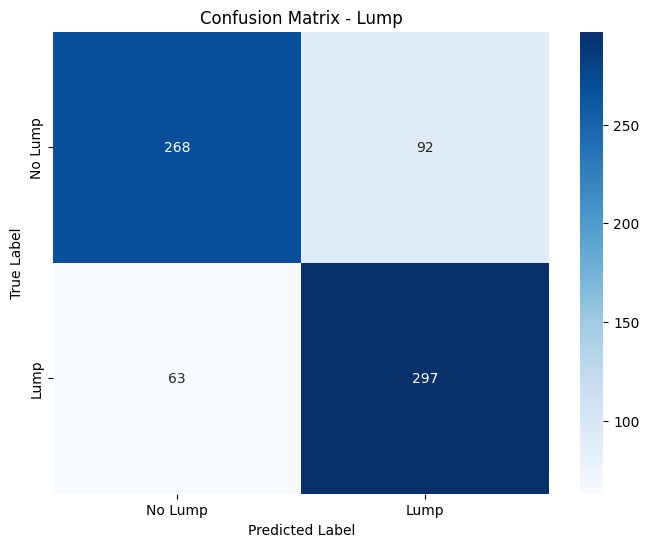


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.81      0.74      0.78       360
        Lump       0.76      0.82      0.79       360

    accuracy                           0.78       720
   macro avg       0.79      0.78      0.78       720
weighted avg       0.79      0.78      0.78       720


Confusion Matrix - Size:
[[ 55   7   2  56]
 [ 38  17  13  52]
 [  9   7  37  67]
 [ 24   7  16 313]]


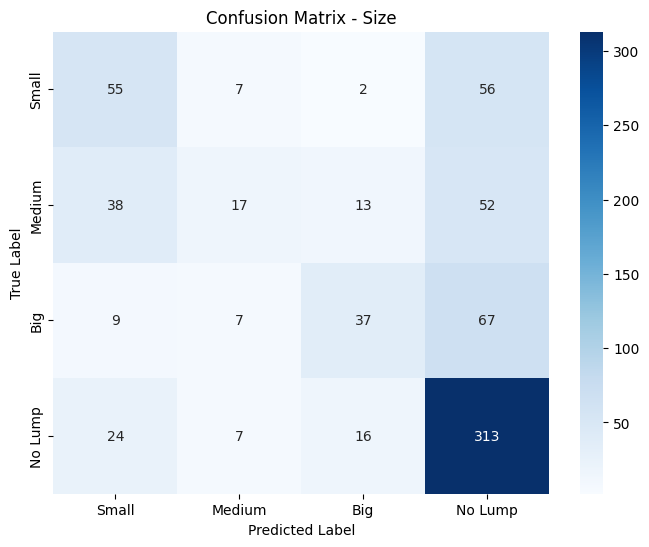


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.44      0.46      0.45       120
      Medium       0.45      0.14      0.22       120
         Big       0.54      0.31      0.39       120
     No Lump       0.64      0.87      0.74       360

    accuracy                           0.59       720
   macro avg       0.52      0.44      0.45       720
weighted avg       0.56      0.59      0.55       720


Confusion Matrix - Position:
[[  7  34  19  60]
 [  1  43  15  61]
 [  2  29  19  70]
 [  4  20   9 327]]


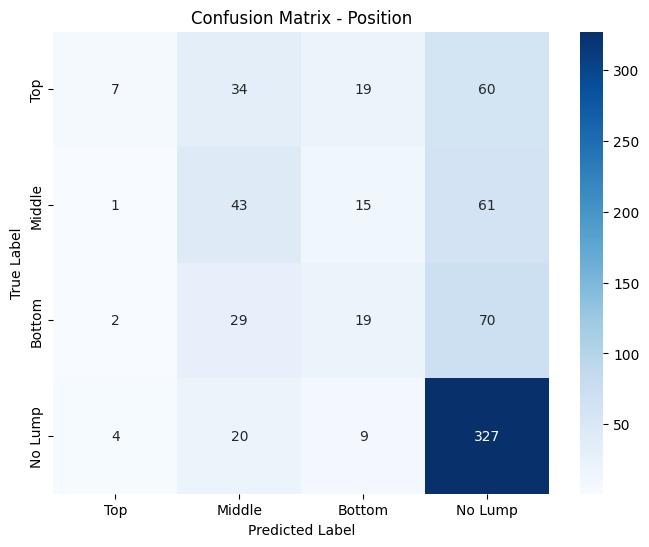


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.50      0.06      0.10       120
      Middle       0.34      0.36      0.35       120
      Bottom       0.31      0.16      0.21       120
     No Lump       0.63      0.91      0.74       360

    accuracy                           0.55       720
   macro avg       0.44      0.37      0.35       720
weighted avg       0.51      0.55      0.48       720


Testing on doctors' data without fine-tuning:


Test Accuracy - Lump: 0.5000, Size: 0.1458, Position: 0.1597

Confusion Matrix - Lump:
[[  0 144]
 [  0 144]]


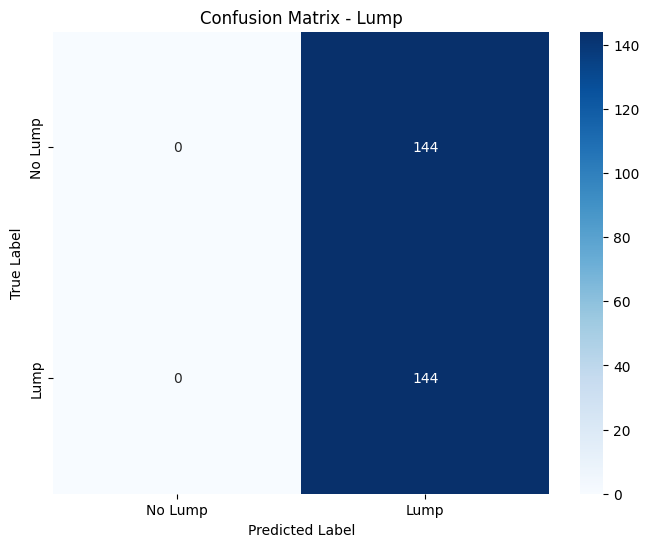


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.00      0.00      0.00       144
        Lump       0.50      1.00      0.67       144

    accuracy                           0.50       288
   macro avg       0.25      0.50      0.33       288
weighted avg       0.25      0.50      0.33       288


Confusion Matrix - Size:
[[  0   0  20  28]
 [  0   0  34  14]
 [  0   0  26  22]
 [  0   0 128  16]]


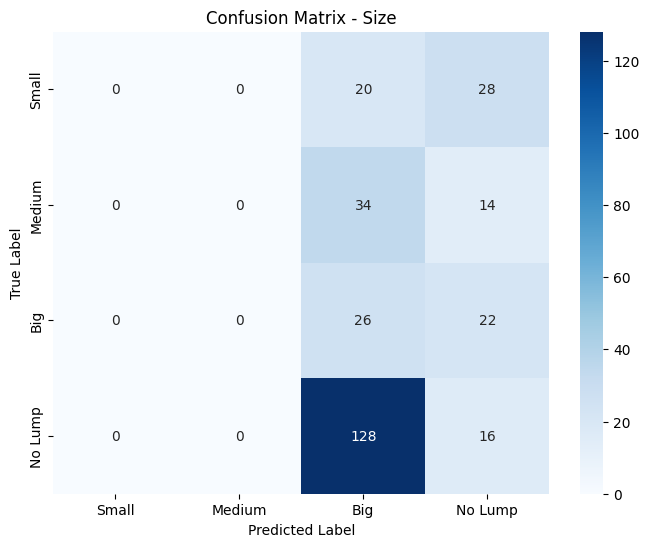


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.00      0.00      0.00        48
      Medium       0.00      0.00      0.00        48
         Big       0.12      0.54      0.20        48
     No Lump       0.20      0.11      0.14       144

    accuracy                           0.15       288
   macro avg       0.08      0.16      0.09       288
weighted avg       0.12      0.15      0.11       288


Confusion Matrix - Position:
[[  0   0  15  33]
 [  0   0  24  24]
 [  0   0  28  20]
 [  0   0 126  18]]


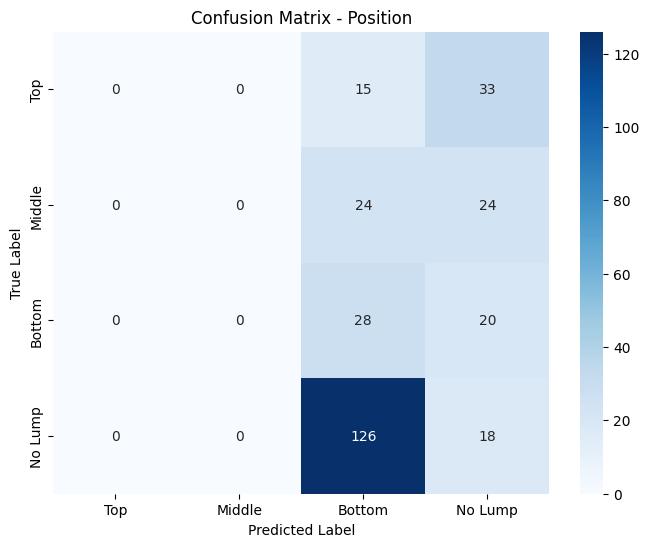


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.00      0.00      0.00        48
      Middle       0.00      0.00      0.00        48
      Bottom       0.15      0.58      0.23        48
     No Lump       0.19      0.12      0.15       144

    accuracy                           0.16       288
   macro avg       0.08      0.18      0.10       288
weighted avg       0.12      0.16      0.11       288


Fine-tuning with 1 additional trials from new dataset


Epoch 1, Training Loss: 2.4829, Validation Loss: 2.4850


Epoch 2, Training Loss: 2.4663, Validation Loss: 2.5651


Epoch 3, Training Loss: 2.4496, Validation Loss: 2.4439


Epoch 4, Training Loss: 2.4576, Validation Loss: 2.3432


Epoch 5, Training Loss: 2.3599, Validation Loss: 2.6236


Epoch 6, Training Loss: 2.3743, Validation Loss: 2.4710


Epoch 7, Training Loss: 2.3738, Validation Loss: 2.5084


Epoch 8, Training Loss: 2.3406, Validation Loss: 2.2836


Epoch 9, Training Loss: 2.3130, Validation Loss: 2.3465


Epoch 10, Training Loss: 2.3257, Validation Loss: 2.3591


Epoch 11, Training Loss: 2.2904, Validation Loss: 2.4015


Epoch 12, Training Loss: 2.3136, Validation Loss: 2.3203


Epoch 13, Training Loss: 2.2621, Validation Loss: 2.3529
Early stopping at epoch 13


Test Accuracy - Lump: 0.7396, Size: 0.4861, Position: 0.4826

Confusion Matrix - Lump:
[[109  35]
 [ 40 104]]


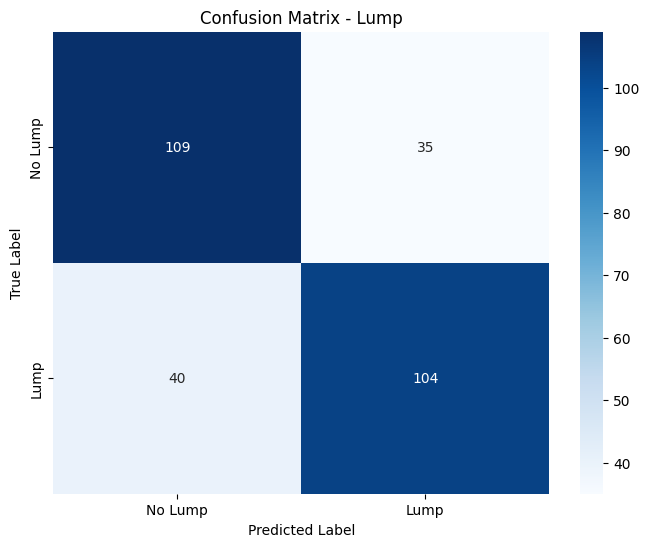


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.73      0.76      0.74       144
        Lump       0.75      0.72      0.73       144

    accuracy                           0.74       288
   macro avg       0.74      0.74      0.74       288
weighted avg       0.74      0.74      0.74       288


Confusion Matrix - Size:
[[  1   1  14  32]
 [  1   1  15  31]
 [  0   3  15  30]
 [  0   0  21 123]]


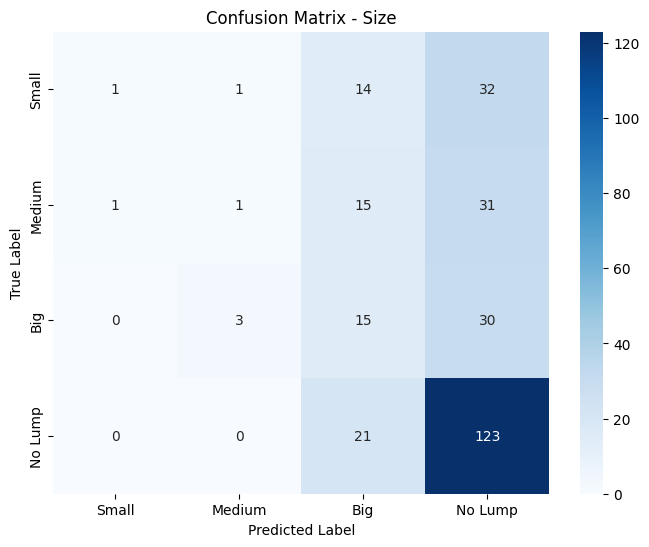


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.50      0.02      0.04        48
      Medium       0.20      0.02      0.04        48
         Big       0.23      0.31      0.27        48
     No Lump       0.57      0.85      0.68       144

    accuracy                           0.49       288
   macro avg       0.38      0.30      0.26       288
weighted avg       0.44      0.49      0.40       288


Confusion Matrix - Position:
[[  0   0  27  21]
 [  0   0  15  33]
 [  0   1  13  34]
 [  0   0  18 126]]


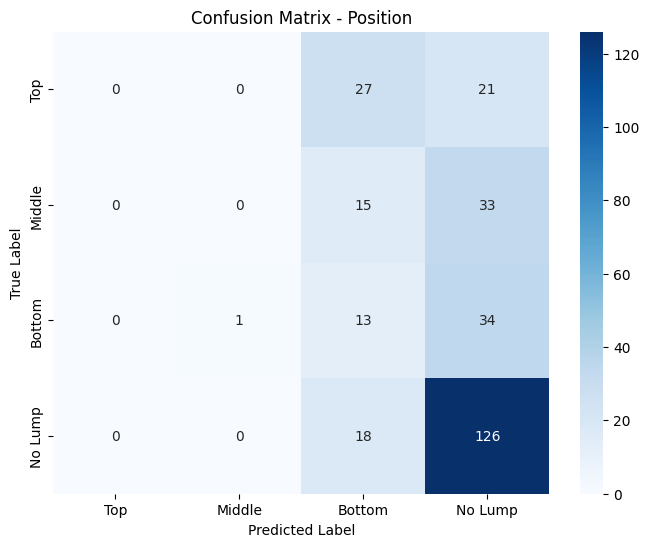


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.00      0.00      0.00        48
      Middle       0.00      0.00      0.00        48
      Bottom       0.18      0.27      0.21        48
     No Lump       0.59      0.88      0.70       144

    accuracy                           0.48       288
   macro avg       0.19      0.29      0.23       288
weighted avg       0.32      0.48      0.39       288


Fine-tuning with 2 additional trials from new dataset


Epoch 1, Training Loss: 2.2486, Validation Loss: 2.3918


Epoch 2, Training Loss: 2.2633, Validation Loss: 2.3096


Epoch 3, Training Loss: 2.2480, Validation Loss: 2.2185


Epoch 4, Training Loss: 2.1956, Validation Loss: 2.3095


Epoch 5, Training Loss: 2.1882, Validation Loss: 2.2022


Epoch 6, Training Loss: 2.1767, Validation Loss: 2.1772


Epoch 7, Training Loss: 2.1182, Validation Loss: 2.2895


Epoch 8, Training Loss: 2.1404, Validation Loss: 2.1799


Epoch 9, Training Loss: 2.1620, Validation Loss: 2.2048


Epoch 10, Training Loss: 2.0968, Validation Loss: 2.2442


Epoch 11, Training Loss: 2.1086, Validation Loss: 2.1480


Epoch 12, Training Loss: 2.0730, Validation Loss: 2.1623


Epoch 13, Training Loss: 2.0743, Validation Loss: 2.2965


Epoch 14, Training Loss: 2.0703, Validation Loss: 2.1264


Epoch 15, Training Loss: 2.0799, Validation Loss: 2.1377


Epoch 16, Training Loss: 2.0226, Validation Loss: 2.1755


Epoch 17, Training Loss: 2.0175, Validation Loss: 2.2491


Epoch 18, Training Loss: 1.9651, Validation Loss: 2.3004


Epoch 19, Training Loss: 1.9584, Validation Loss: 2.1822
Early stopping at epoch 19


Test Accuracy - Lump: 0.8160, Size: 0.5694, Position: 0.5556

Confusion Matrix - Lump:
[[117  27]
 [ 26 118]]


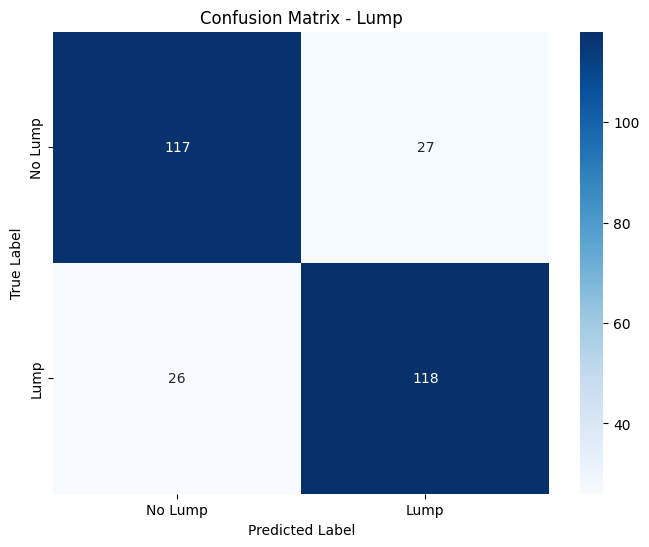


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.82      0.81      0.82       144
        Lump       0.81      0.82      0.82       144

    accuracy                           0.82       288
   macro avg       0.82      0.82      0.82       288
weighted avg       0.82      0.82      0.82       288


Confusion Matrix - Size:
[[  9  22   3  14]
 [  1  17  15  15]
 [  1  19   1  27]
 [  0   3   4 137]]


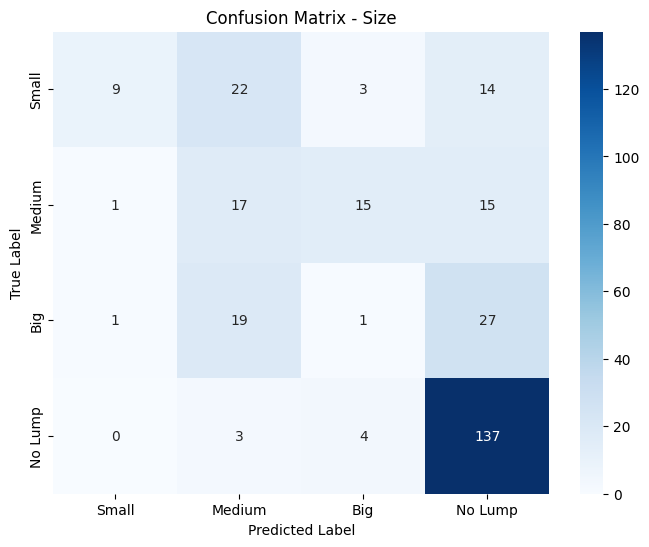


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.82      0.19      0.31        48
      Medium       0.28      0.35      0.31        48
         Big       0.04      0.02      0.03        48
     No Lump       0.71      0.95      0.81       144

    accuracy                           0.57       288
   macro avg       0.46      0.38      0.36       288
weighted avg       0.54      0.57      0.51       288


Confusion Matrix - Position:
[[  0  27   3  18]
 [  0  16   4  28]
 [  0  22   2  24]
 [  0   2   0 142]]


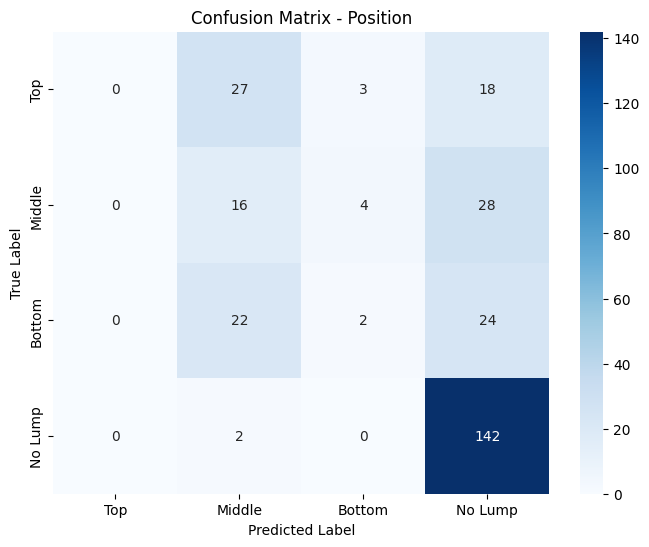


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.00      0.00      0.00        48
      Middle       0.24      0.33      0.28        48
      Bottom       0.22      0.04      0.07        48
     No Lump       0.67      0.99      0.80       144

    accuracy                           0.56       288
   macro avg       0.28      0.34      0.29       288
weighted avg       0.41      0.56      0.46       288


Fine-tuning with 3 additional trials from new dataset


Epoch 1, Training Loss: 1.9405, Validation Loss: 2.3413


Epoch 2, Training Loss: 2.0000, Validation Loss: 2.4079


Epoch 3, Training Loss: 1.9575, Validation Loss: 2.1976


Epoch 4, Training Loss: 1.9539, Validation Loss: 2.2335


Epoch 5, Training Loss: 1.9053, Validation Loss: 2.1875
Early stopping at epoch 5


Test Accuracy - Lump: 0.7812, Size: 0.5625, Position: 0.5417

Confusion Matrix - Lump:
[[117  27]
 [ 36 108]]


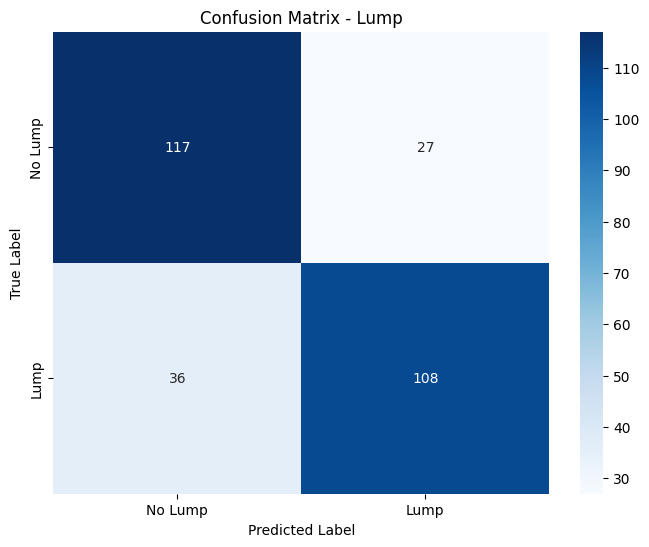


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.76      0.81      0.79       144
        Lump       0.80      0.75      0.77       144

    accuracy                           0.78       288
   macro avg       0.78      0.78      0.78       288
weighted avg       0.78      0.78      0.78       288


Confusion Matrix - Size:
[[ 22   2   1  23]
 [ 12   1   4  31]
 [  7   1   1  39]
 [  1   1   4 138]]


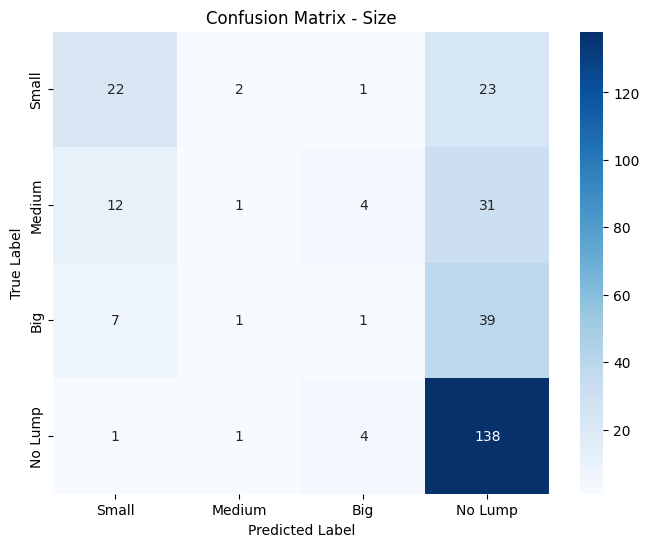


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.52      0.46      0.49        48
      Medium       0.20      0.02      0.04        48
         Big       0.10      0.02      0.03        48
     No Lump       0.60      0.96      0.74       144

    accuracy                           0.56       288
   macro avg       0.36      0.36      0.32       288
weighted avg       0.44      0.56      0.46       288


Confusion Matrix - Position:
[[  3  14  12  19]
 [  1   7  10  30]
 [  1   7  11  29]
 [  0   1   8 135]]


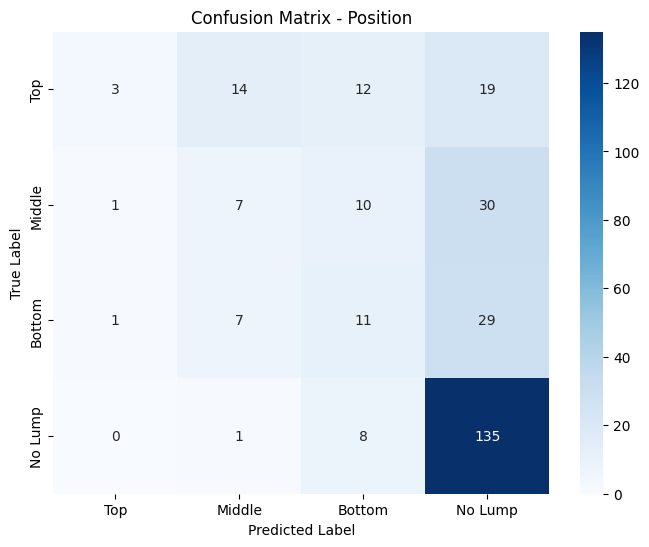


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.60      0.06      0.11        48
      Middle       0.24      0.15      0.18        48
      Bottom       0.27      0.23      0.25        48
     No Lump       0.63      0.94      0.76       144

    accuracy                           0.54       288
   macro avg       0.44      0.34      0.32       288
weighted avg       0.50      0.54      0.47       288


Fine-tuning with 4 additional trials from new dataset


Epoch 1, Training Loss: 1.9149, Validation Loss: 2.2120


Epoch 2, Training Loss: 1.8955, Validation Loss: 2.2267


Epoch 3, Training Loss: 1.8779, Validation Loss: 2.4661


Epoch 4, Training Loss: 1.8842, Validation Loss: 2.2779


Epoch 5, Training Loss: 1.8522, Validation Loss: 2.1551
Early stopping at epoch 5


Test Accuracy - Lump: 0.8194, Size: 0.5521, Position: 0.5347

Confusion Matrix - Lump:
[[143   1]
 [ 51  93]]


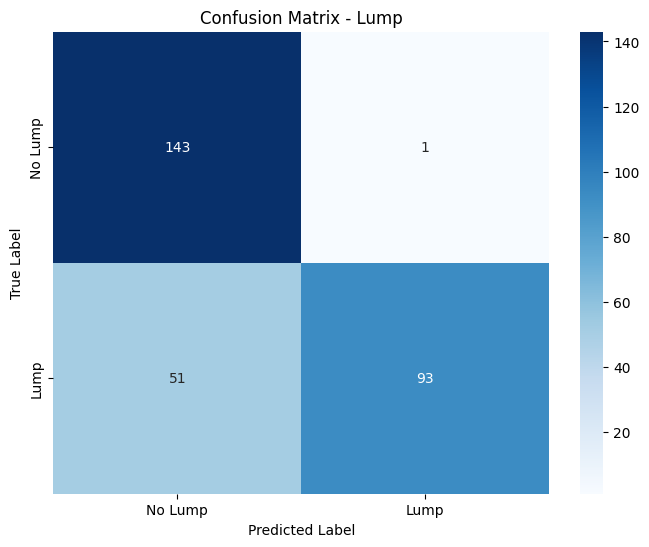


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.74      0.99      0.85       144
        Lump       0.99      0.65      0.78       144

    accuracy                           0.82       288
   macro avg       0.86      0.82      0.81       288
weighted avg       0.86      0.82      0.81       288


Confusion Matrix - Size:
[[  9  13   0  26]
 [  1   6   1  40]
 [  1   5   1  41]
 [  0   1   0 143]]


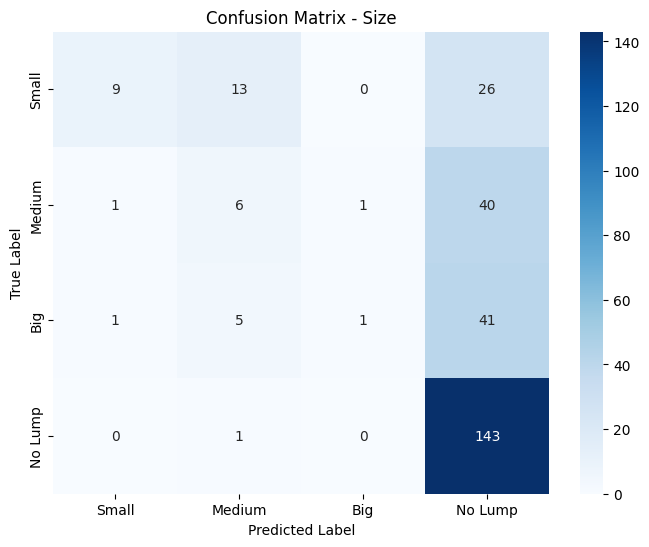


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.82      0.19      0.31        48
      Medium       0.24      0.12      0.16        48
         Big       0.50      0.02      0.04        48
     No Lump       0.57      0.99      0.73       144

    accuracy                           0.55       288
   macro avg       0.53      0.33      0.31       288
weighted avg       0.55      0.55      0.45       288


Confusion Matrix - Position:
[[  0   9   7  32]
 [  0   8   5  35]
 [  0   9   3  36]
 [  0   1   0 143]]


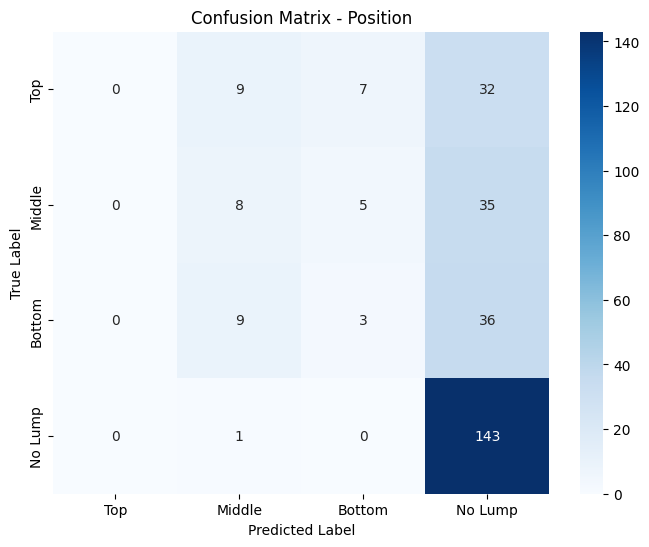


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.00      0.00      0.00        48
      Middle       0.30      0.17      0.21        48
      Bottom       0.20      0.06      0.10        48
     No Lump       0.58      0.99      0.73       144

    accuracy                           0.53       288
   macro avg       0.27      0.31      0.26       288
weighted avg       0.37      0.53      0.42       288


Fine-tuning with 5 additional trials from new dataset


Epoch 1, Training Loss: 1.8374, Validation Loss: 2.6216


Epoch 2, Training Loss: 1.8515, Validation Loss: 2.1672


Epoch 3, Training Loss: 1.8315, Validation Loss: 2.2063


Epoch 4, Training Loss: 1.7938, Validation Loss: 2.2144


Epoch 5, Training Loss: 1.8197, Validation Loss: 2.2181
Early stopping at epoch 5


Test Accuracy - Lump: 0.7604, Size: 0.5521, Position: 0.5347

Confusion Matrix - Lump:
[[ 78  66]
 [  3 141]]


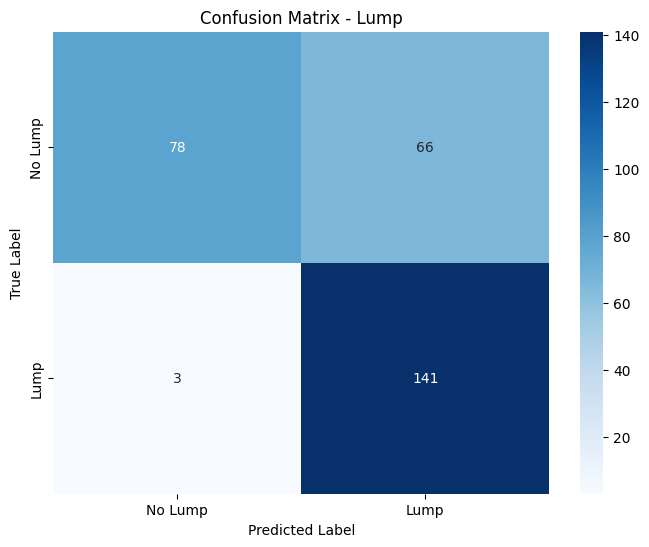


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.96      0.54      0.69       144
        Lump       0.68      0.98      0.80       144

    accuracy                           0.76       288
   macro avg       0.82      0.76      0.75       288
weighted avg       0.82      0.76      0.75       288


Confusion Matrix - Size:
[[  8  38   1   1]
 [  0  39   7   2]
 [  0  33   7   8]
 [  1  25  13 105]]


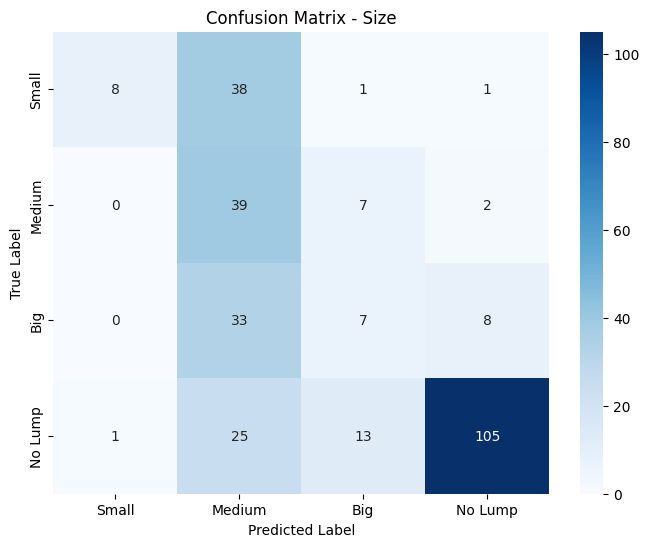


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.89      0.17      0.28        48
      Medium       0.29      0.81      0.43        48
         Big       0.25      0.15      0.18        48
     No Lump       0.91      0.73      0.81       144

    accuracy                           0.55       288
   macro avg       0.58      0.46      0.42       288
weighted avg       0.69      0.55      0.55       288


Confusion Matrix - Position:
[[ 45   0   2   1]
 [ 43   1   2   2]
 [ 35   0   6   7]
 [ 41   0   1 102]]


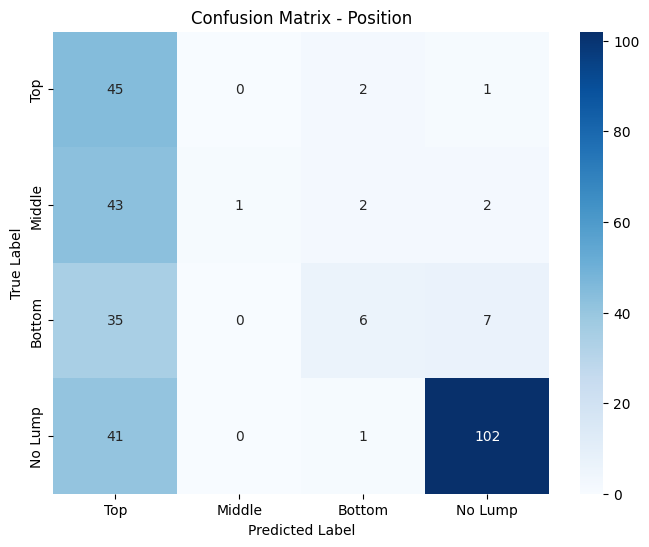


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.27      0.94      0.42        48
      Middle       1.00      0.02      0.04        48
      Bottom       0.55      0.12      0.20        48
     No Lump       0.91      0.71      0.80       144

    accuracy                           0.53       288
   macro avg       0.68      0.45      0.37       288
weighted avg       0.76      0.53      0.51       288



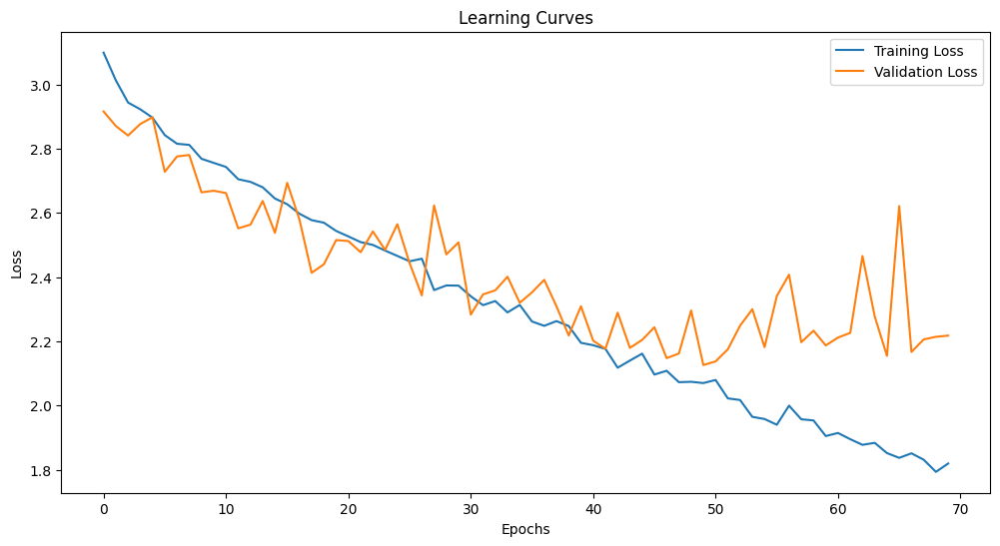

| Training Phase                         |   Lump Accuracy |   Size Accuracy |   Position Accuracy |
|:---------------------------------------|----------------:|----------------:|--------------------:|
| Initial Training                       |        0.784722 |        0.586111 |            0.55     |
| Testing on doctors without fine-tuning |        0.5      |        0.145833 |            0.159722 |
| Fine-tuning with 1 trials              |        0.739583 |        0.486111 |            0.482639 |
| Fine-tuning with 2 trials              |        0.815972 |        0.569444 |            0.555556 |
| Fine-tuning with 3 trials              |        0.78125  |        0.5625   |            0.541667 |
| Fine-tuning with 4 trials              |        0.819444 |        0.552083 |            0.534722 |
| Fine-tuning with 5 trials              |        0.760417 |        0.552083 |            0.534722 |

Running experiment with tips sensors and 2 seconds
Using 6 GPUs
Initial Training and Evalu

Epoch 1, Training Loss: 3.0833, Validation Loss: 3.0130


Epoch 2, Training Loss: 2.9986, Validation Loss: 2.9432


Epoch 3, Training Loss: 2.9671, Validation Loss: 2.9339


Epoch 4, Training Loss: 2.9623, Validation Loss: 2.8906


Epoch 5, Training Loss: 2.8992, Validation Loss: 2.8252


Epoch 6, Training Loss: 2.8228, Validation Loss: 2.9368


Epoch 7, Training Loss: 2.8443, Validation Loss: 2.6701


Epoch 8, Training Loss: 2.7939, Validation Loss: 2.6411


Epoch 9, Training Loss: 2.7539, Validation Loss: 2.6271


Epoch 10, Training Loss: 2.7436, Validation Loss: 2.7151


Epoch 11, Training Loss: 2.7190, Validation Loss: 2.5939


Epoch 12, Training Loss: 2.6789, Validation Loss: 2.5307


Epoch 13, Training Loss: 2.6540, Validation Loss: 2.4716


Epoch 14, Training Loss: 2.6367, Validation Loss: 2.4827


Epoch 15, Training Loss: 2.6017, Validation Loss: 2.4355


Epoch 16, Training Loss: 2.5862, Validation Loss: 2.5970


Epoch 17, Training Loss: 2.5630, Validation Loss: 2.4263


Epoch 18, Training Loss: 2.5606, Validation Loss: 2.3764


Epoch 19, Training Loss: 2.5552, Validation Loss: 2.4956


Epoch 20, Training Loss: 2.5319, Validation Loss: 2.4542


Epoch 21, Training Loss: 2.5079, Validation Loss: 2.3100


Epoch 22, Training Loss: 2.4618, Validation Loss: 2.3957


Epoch 23, Training Loss: 2.4777, Validation Loss: 2.3144


Epoch 24, Training Loss: 2.3947, Validation Loss: 2.3716


Epoch 25, Training Loss: 2.4160, Validation Loss: 2.3350


Epoch 26, Training Loss: 2.4063, Validation Loss: 2.4899
Early stopping at epoch 26


Test Accuracy - Lump: 0.7514, Size: 0.6097, Position: 0.5556

Confusion Matrix - Lump:
[[312  48]
 [131 229]]


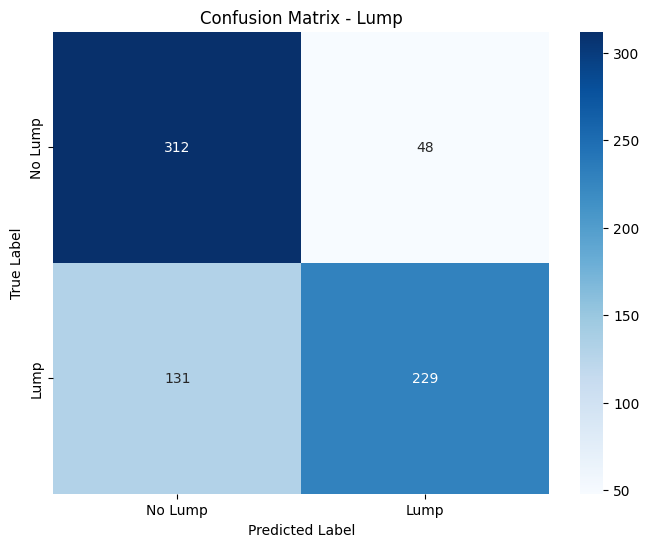


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.70      0.87      0.78       360
        Lump       0.83      0.64      0.72       360

    accuracy                           0.75       720
   macro avg       0.77      0.75      0.75       720
weighted avg       0.77      0.75      0.75       720


Confusion Matrix - Size:
[[ 45  11   2  62]
 [ 21  23  14  62]
 [  7  11  33  69]
 [ 12   3   7 338]]


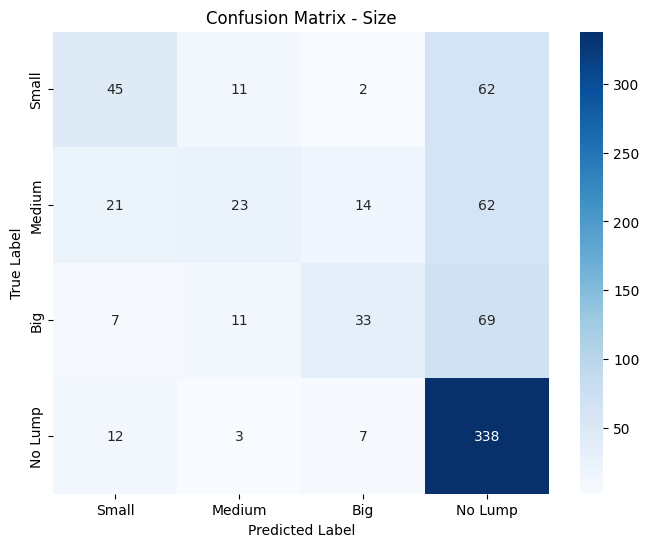


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.53      0.38      0.44       120
      Medium       0.48      0.19      0.27       120
         Big       0.59      0.28      0.38       120
     No Lump       0.64      0.94      0.76       360

    accuracy                           0.61       720
   macro avg       0.56      0.45      0.46       720
weighted avg       0.58      0.61      0.56       720


Confusion Matrix - Position:
[[  1  23  15  81]
 [  2  28  11  79]
 [  1  32  21  66]
 [  1   6   3 350]]


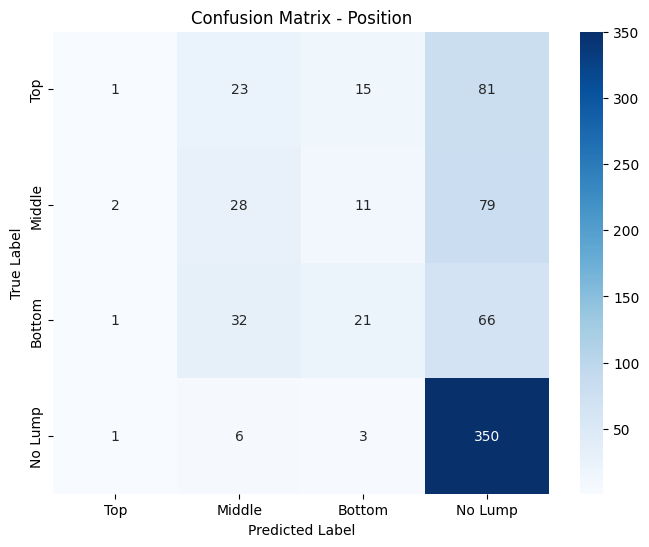


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.20      0.01      0.02       120
      Middle       0.31      0.23      0.27       120
      Bottom       0.42      0.17      0.25       120
     No Lump       0.61      0.97      0.75       360

    accuracy                           0.56       720
   macro avg       0.39      0.35      0.32       720
weighted avg       0.46      0.56      0.46       720


Testing on doctors' data without fine-tuning:


Test Accuracy - Lump: 0.3368, Size: 0.1528, Position: 0.1701

Confusion Matrix - Lump:
[[ 10 134]
 [ 57  87]]


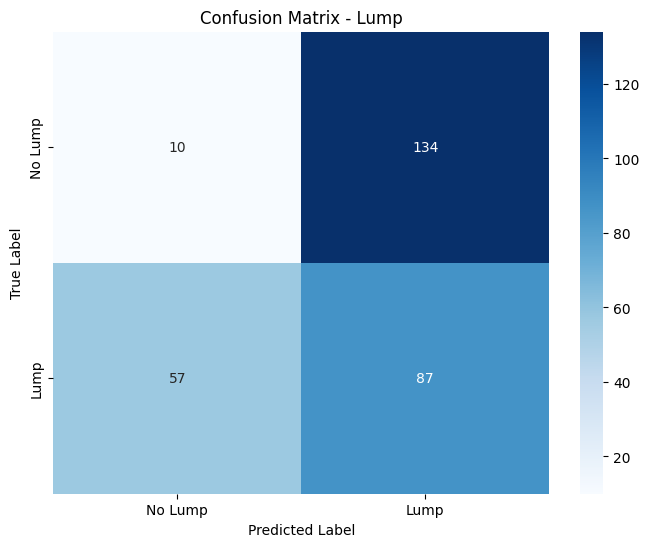


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.15      0.07      0.09       144
        Lump       0.39      0.60      0.48       144

    accuracy                           0.34       288
   macro avg       0.27      0.34      0.29       288
weighted avg       0.27      0.34      0.29       288


Confusion Matrix - Size:
[[  0   0   9  39]
 [  0   1   8  39]
 [  0   1   5  42]
 [  0   3 103  38]]


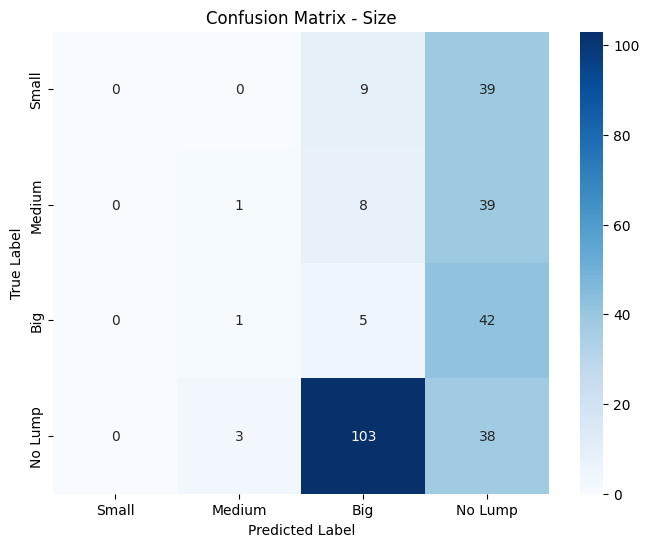


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.00      0.00      0.00        48
      Medium       0.20      0.02      0.04        48
         Big       0.04      0.10      0.06        48
     No Lump       0.24      0.26      0.25       144

    accuracy                           0.15       288
   macro avg       0.12      0.10      0.09       288
weighted avg       0.16      0.15      0.14       288


Confusion Matrix - Position:
[[  0   1   1  46]
 [  0   8   0  40]
 [  0   9   0  39]
 [  0 102   1  41]]


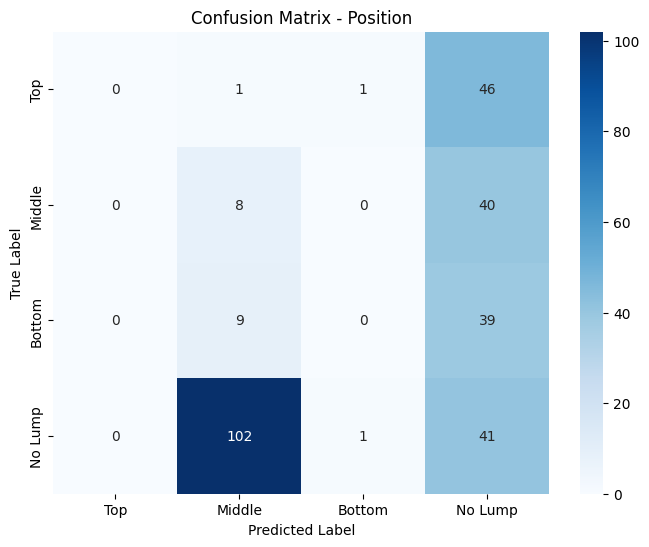


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.00      0.00      0.00        48
      Middle       0.07      0.17      0.10        48
      Bottom       0.00      0.00      0.00        48
     No Lump       0.25      0.28      0.26       144

    accuracy                           0.17       288
   macro avg       0.08      0.11      0.09       288
weighted avg       0.13      0.17      0.15       288


Fine-tuning with 1 additional trials from new dataset


Epoch 1, Training Loss: 2.3706, Validation Loss: 2.4547


Epoch 2, Training Loss: 2.4178, Validation Loss: 2.3215


Epoch 3, Training Loss: 2.3333, Validation Loss: 2.3127


Epoch 4, Training Loss: 2.3647, Validation Loss: 2.3135


Epoch 5, Training Loss: 2.3131, Validation Loss: 2.3982
Early stopping at epoch 5


Test Accuracy - Lump: 0.4479, Size: 0.2153, Position: 0.2153

Confusion Matrix - Lump:
[[  3 141]
 [ 18 126]]


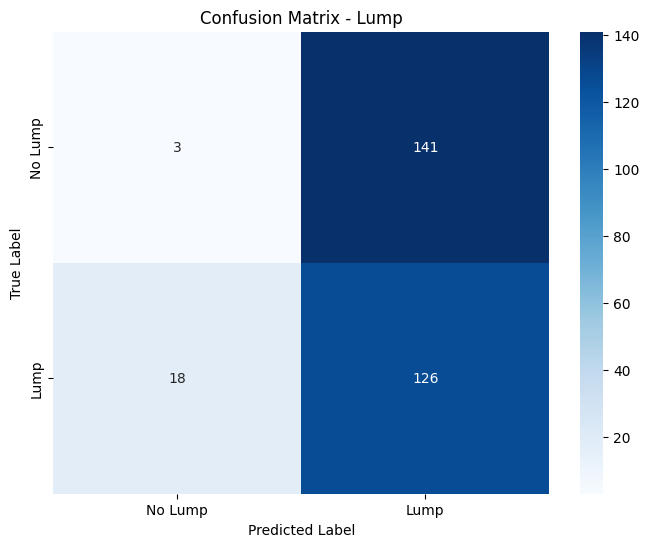


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.14      0.02      0.04       144
        Lump       0.47      0.88      0.61       144

    accuracy                           0.45       288
   macro avg       0.31      0.45      0.32       288
weighted avg       0.31      0.45      0.32       288


Confusion Matrix - Size:
[[ 7  2  3 36]
 [11  6  6 25]
 [ 4  6  0 38]
 [ 0 11 84 49]]


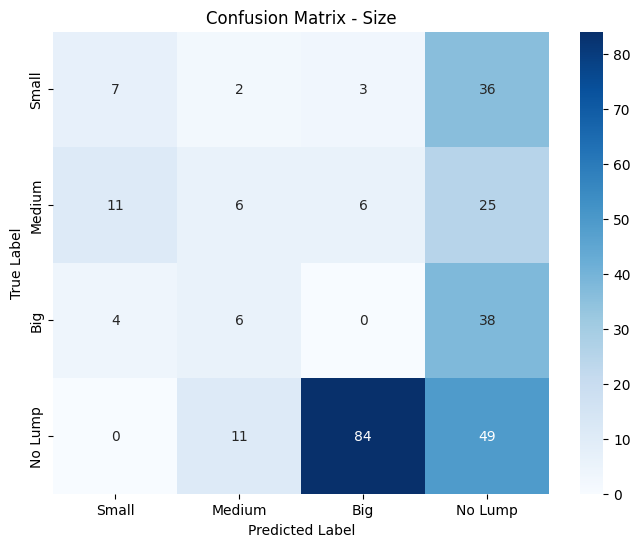


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.32      0.15      0.20        48
      Medium       0.24      0.12      0.16        48
         Big       0.00      0.00      0.00        48
     No Lump       0.33      0.34      0.34       144

    accuracy                           0.22       288
   macro avg       0.22      0.15      0.17       288
weighted avg       0.26      0.22      0.23       288


Confusion Matrix - Position:
[[ 0 14  0 34]
 [ 0 17  0 31]
 [ 0 19  0 29]
 [42 57  0 45]]


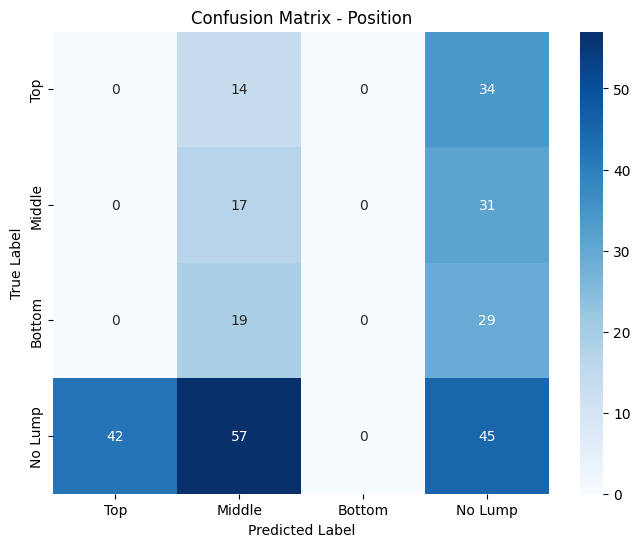


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.00      0.00      0.00        48
      Middle       0.16      0.35      0.22        48
      Bottom       0.00      0.00      0.00        48
     No Lump       0.32      0.31      0.32       144

    accuracy                           0.22       288
   macro avg       0.12      0.17      0.13       288
weighted avg       0.19      0.22      0.20       288


Fine-tuning with 2 additional trials from new dataset


Epoch 1, Training Loss: 2.3327, Validation Loss: 2.3480


Epoch 2, Training Loss: 2.2592, Validation Loss: 2.3611


Epoch 3, Training Loss: 2.2276, Validation Loss: 2.2780


Epoch 4, Training Loss: 2.2649, Validation Loss: 2.2857


Epoch 5, Training Loss: 2.1866, Validation Loss: 2.2959


Epoch 6, Training Loss: 2.1744, Validation Loss: 2.3538


Epoch 7, Training Loss: 2.2179, Validation Loss: 2.4372


Epoch 8, Training Loss: 2.1593, Validation Loss: 2.3080
Early stopping at epoch 8


Test Accuracy - Lump: 0.5521, Size: 0.3438, Position: 0.5000

Confusion Matrix - Lump:
[[135   9]
 [120  24]]


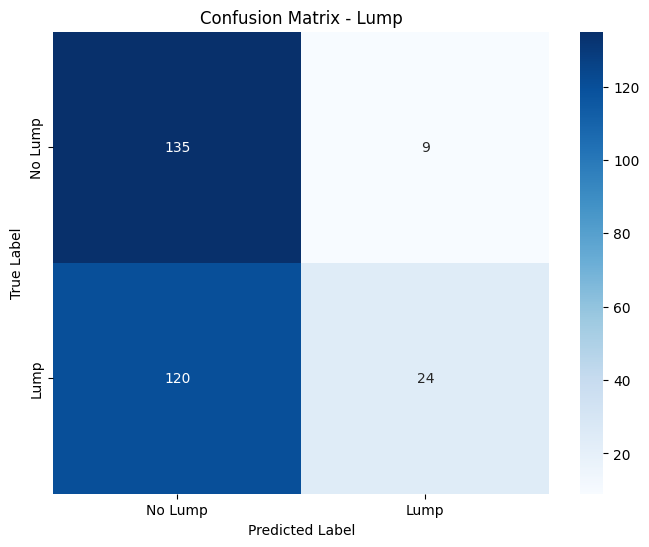


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.53      0.94      0.68       144
        Lump       0.73      0.17      0.27       144

    accuracy                           0.55       288
   macro avg       0.63      0.55      0.47       288
weighted avg       0.63      0.55      0.47       288


Confusion Matrix - Size:
[[ 0  0  0 48]
 [ 0  0  0 48]
 [ 0  0  1 47]
 [ 0  0 46 98]]


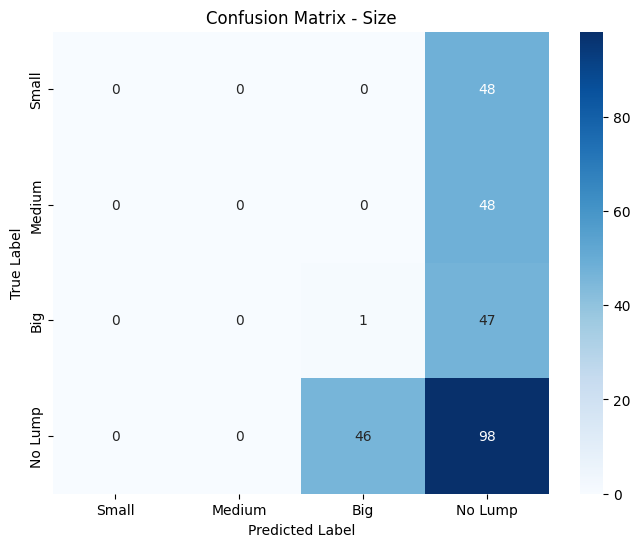


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.00      0.00      0.00        48
      Medium       0.00      0.00      0.00        48
         Big       0.02      0.02      0.02        48
     No Lump       0.41      0.68      0.51       144

    accuracy                           0.34       288
   macro avg       0.11      0.18      0.13       288
weighted avg       0.21      0.34      0.26       288


Confusion Matrix - Position:
[[  0   0   0  48]
 [  0   0   0  48]
 [  0   0   0  48]
 [  0   0   0 144]]


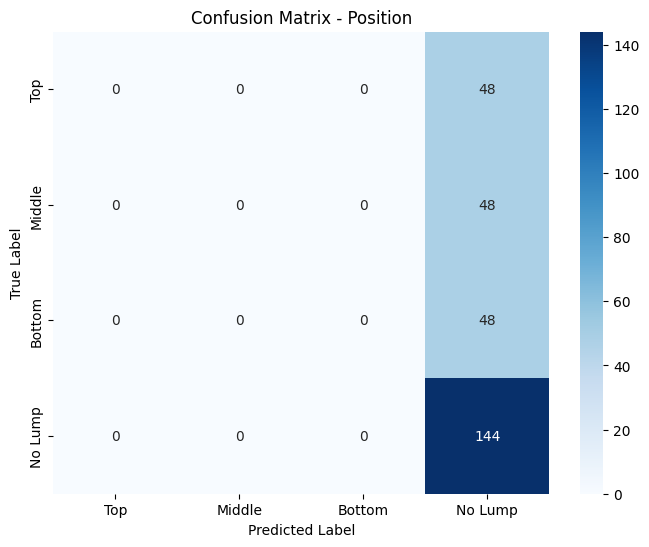


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.00      0.00      0.00        48
      Middle       0.00      0.00      0.00        48
      Bottom       0.00      0.00      0.00        48
     No Lump       0.50      1.00      0.67       144

    accuracy                           0.50       288
   macro avg       0.12      0.25      0.17       288
weighted avg       0.25      0.50      0.33       288


Fine-tuning with 3 additional trials from new dataset


Epoch 1, Training Loss: 2.1849, Validation Loss: 2.2932


Epoch 2, Training Loss: 2.1446, Validation Loss: 2.2051


Epoch 3, Training Loss: 2.1358, Validation Loss: 2.5870


Epoch 4, Training Loss: 2.1444, Validation Loss: 2.1770


Epoch 5, Training Loss: 2.1300, Validation Loss: 2.2558


Epoch 6, Training Loss: 2.1158, Validation Loss: 2.5480


Epoch 7, Training Loss: 2.1017, Validation Loss: 2.1322


Epoch 8, Training Loss: 2.0596, Validation Loss: 2.2109


Epoch 9, Training Loss: 2.0968, Validation Loss: 2.2166


Epoch 10, Training Loss: 2.0687, Validation Loss: 2.1255


Epoch 11, Training Loss: 2.0200, Validation Loss: 2.1562


Epoch 12, Training Loss: 2.0386, Validation Loss: 2.1341


Epoch 13, Training Loss: 1.9772, Validation Loss: 2.4111


Epoch 14, Training Loss: 2.0065, Validation Loss: 2.2210


Epoch 15, Training Loss: 1.9750, Validation Loss: 2.1275
Early stopping at epoch 15


Test Accuracy - Lump: 0.8472, Size: 0.5312, Position: 0.5312

Confusion Matrix - Lump:
[[127  17]
 [ 27 117]]


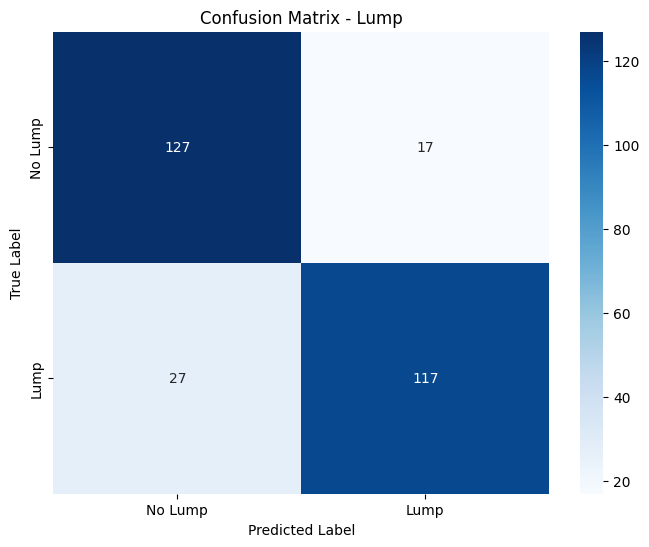


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.82      0.88      0.85       144
        Lump       0.87      0.81      0.84       144

    accuracy                           0.85       288
   macro avg       0.85      0.85      0.85       288
weighted avg       0.85      0.85      0.85       288


Confusion Matrix - Size:
[[ 11   7   0  30]
 [  3  12   2  31]
 [  2   3   0  43]
 [  0   2  12 130]]


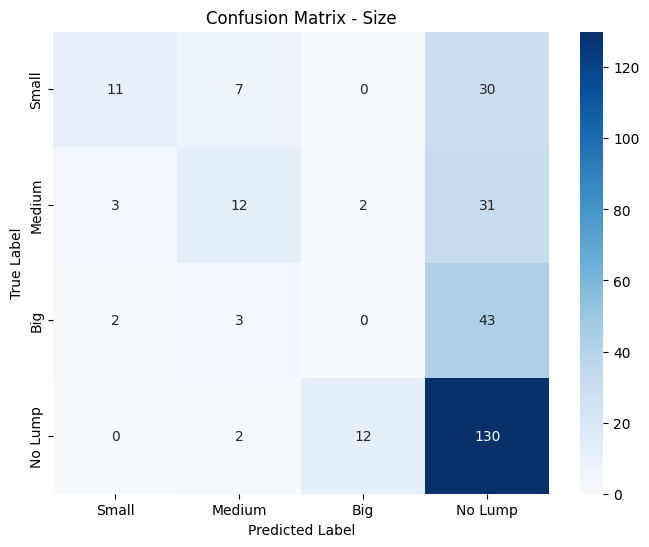


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.69      0.23      0.34        48
      Medium       0.50      0.25      0.33        48
         Big       0.00      0.00      0.00        48
     No Lump       0.56      0.90      0.69       144

    accuracy                           0.53       288
   macro avg       0.44      0.35      0.34       288
weighted avg       0.48      0.53      0.46       288


Confusion Matrix - Position:
[[  0   0  12  36]
 [  0   0  24  24]
 [  0   0  11  37]
 [  0   0   2 142]]


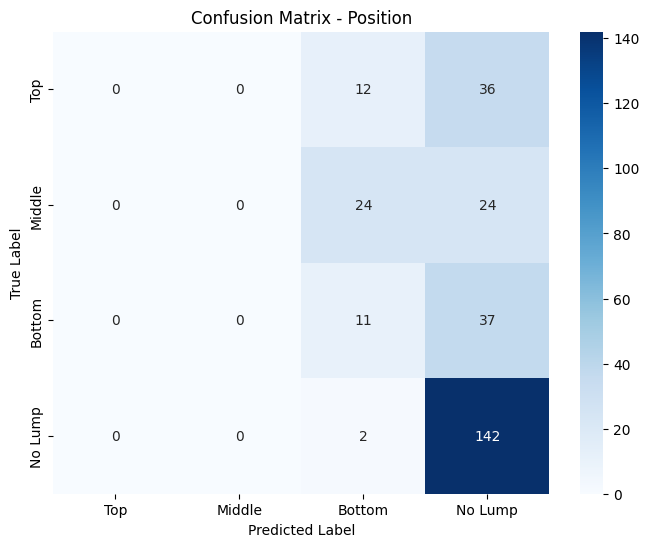


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.00      0.00      0.00        48
      Middle       0.00      0.00      0.00        48
      Bottom       0.22      0.23      0.23        48
     No Lump       0.59      0.99      0.74       144

    accuracy                           0.53       288
   macro avg       0.20      0.30      0.24       288
weighted avg       0.33      0.53      0.41       288


Fine-tuning with 4 additional trials from new dataset


Epoch 1, Training Loss: 1.9699, Validation Loss: 2.0937


Epoch 2, Training Loss: 1.9392, Validation Loss: 2.1923


Epoch 3, Training Loss: 1.9219, Validation Loss: 2.2523


Epoch 4, Training Loss: 1.9227, Validation Loss: 2.2285


Epoch 5, Training Loss: 1.9117, Validation Loss: 2.1272


Epoch 6, Training Loss: 1.9015, Validation Loss: 2.1820
Early stopping at epoch 6


Test Accuracy - Lump: 0.8750, Size: 0.6250, Position: 0.5903

Confusion Matrix - Lump:
[[131  13]
 [ 23 121]]


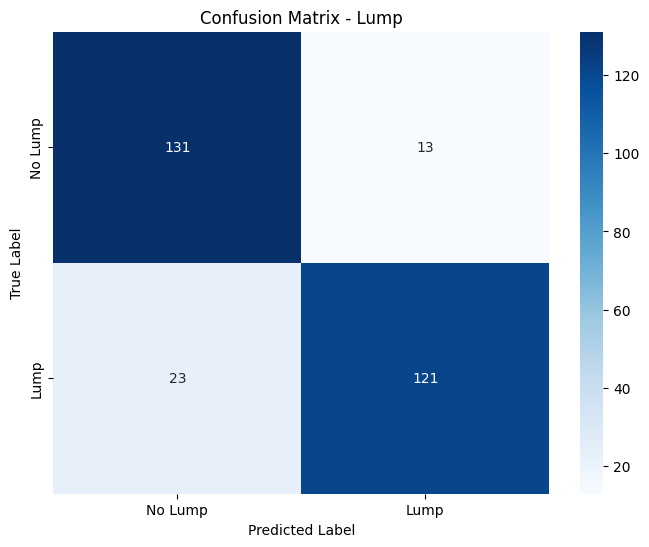


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.85      0.91      0.88       144
        Lump       0.90      0.84      0.87       144

    accuracy                           0.88       288
   macro avg       0.88      0.88      0.87       288
weighted avg       0.88      0.88      0.87       288


Confusion Matrix - Size:
[[ 15  23   3   7]
 [  4  25  11   8]
 [  1   9   7  31]
 [  0   8   3 133]]


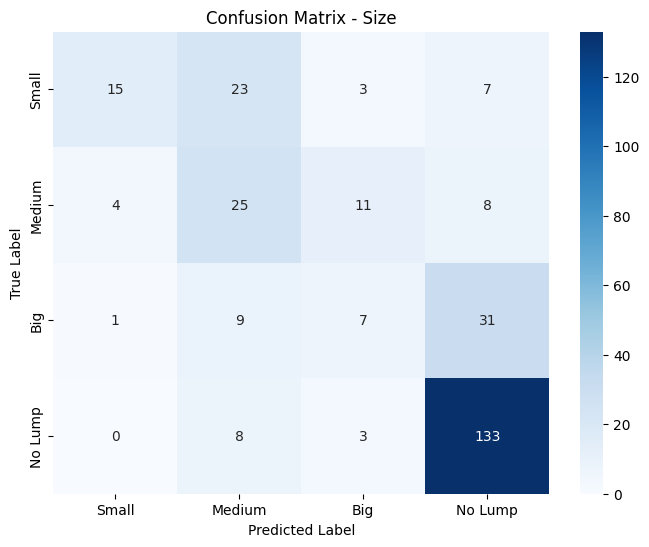


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.75      0.31      0.44        48
      Medium       0.38      0.52      0.44        48
         Big       0.29      0.15      0.19        48
     No Lump       0.74      0.92      0.82       144

    accuracy                           0.62       288
   macro avg       0.54      0.48      0.48       288
weighted avg       0.61      0.62      0.59       288


Confusion Matrix - Position:
[[  1  32   2  13]
 [  1  24  10  13]
 [  0  21   6  21]
 [  2   2   1 139]]


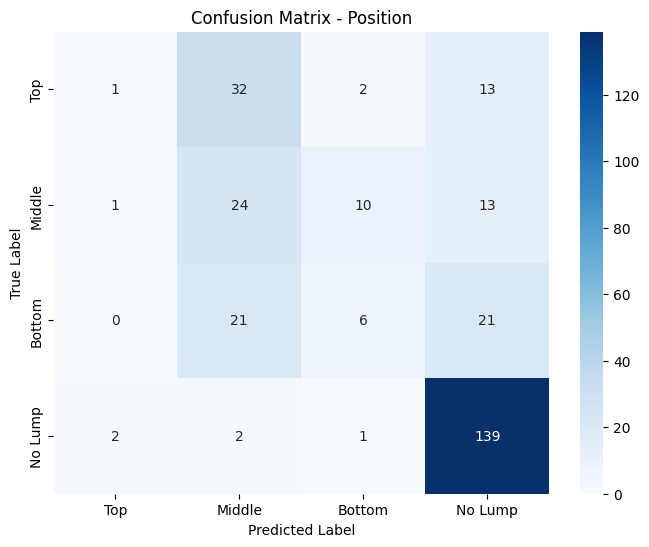


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.25      0.02      0.04        48
      Middle       0.30      0.50      0.38        48
      Bottom       0.32      0.12      0.18        48
     No Lump       0.75      0.97      0.84       144

    accuracy                           0.59       288
   macro avg       0.40      0.40      0.36       288
weighted avg       0.52      0.59      0.52       288


Fine-tuning with 5 additional trials from new dataset


Epoch 1, Training Loss: 1.9235, Validation Loss: 2.1756


Epoch 2, Training Loss: 1.8893, Validation Loss: 2.1201


Epoch 3, Training Loss: 1.9404, Validation Loss: 2.1808


Epoch 4, Training Loss: 1.8379, Validation Loss: 2.2315


Epoch 5, Training Loss: 1.8677, Validation Loss: 2.4291
Early stopping at epoch 5


Test Accuracy - Lump: 0.8681, Size: 0.6007, Position: 0.5833

Confusion Matrix - Lump:
[[134  10]
 [ 28 116]]


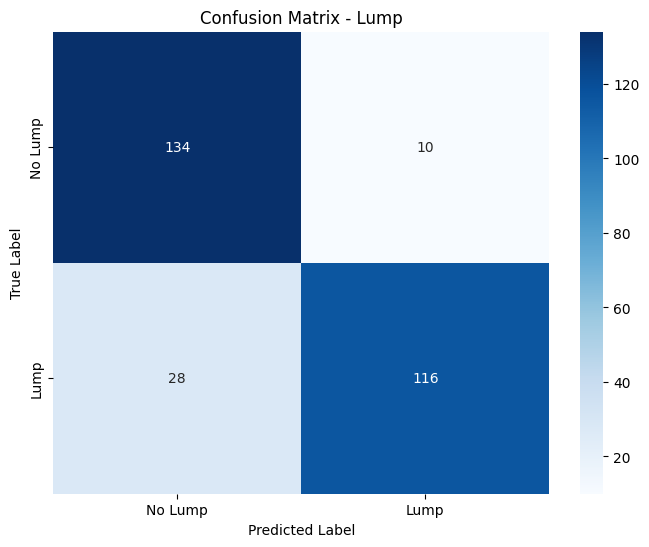


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.83      0.93      0.88       144
        Lump       0.92      0.81      0.86       144

    accuracy                           0.87       288
   macro avg       0.87      0.87      0.87       288
weighted avg       0.87      0.87      0.87       288


Confusion Matrix - Size:
[[ 15  10   5  18]
 [  7  16   4  21]
 [  5   2   1  40]
 [  1   1   1 141]]


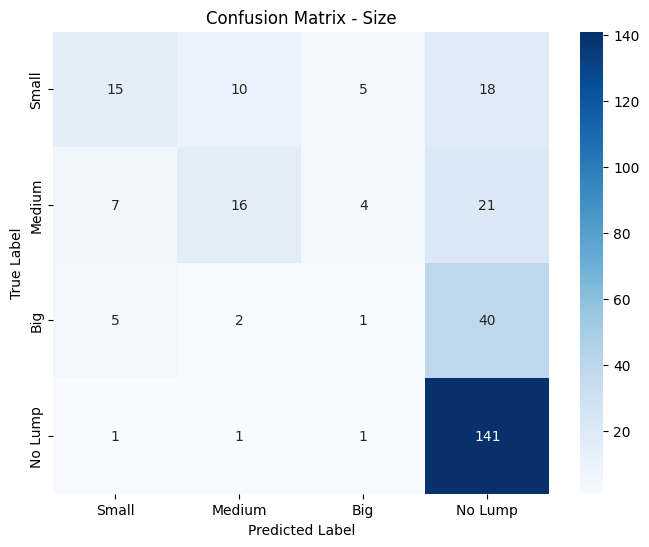


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.54      0.31      0.39        48
      Medium       0.55      0.33      0.42        48
         Big       0.09      0.02      0.03        48
     No Lump       0.64      0.98      0.77       144

    accuracy                           0.60       288
   macro avg       0.45      0.41      0.40       288
weighted avg       0.52      0.60      0.53       288


Confusion Matrix - Position:
[[  4  19   1  24]
 [  4  14   9  21]
 [  3   8   7  30]
 [  0   1   0 143]]


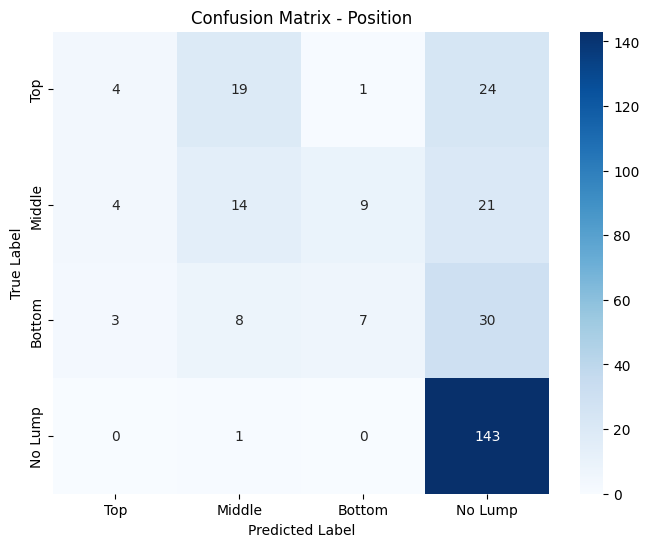


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.36      0.08      0.14        48
      Middle       0.33      0.29      0.31        48
      Bottom       0.41      0.15      0.22        48
     No Lump       0.66      0.99      0.79       144

    accuracy                           0.58       288
   macro avg       0.44      0.38      0.36       288
weighted avg       0.51      0.58      0.51       288



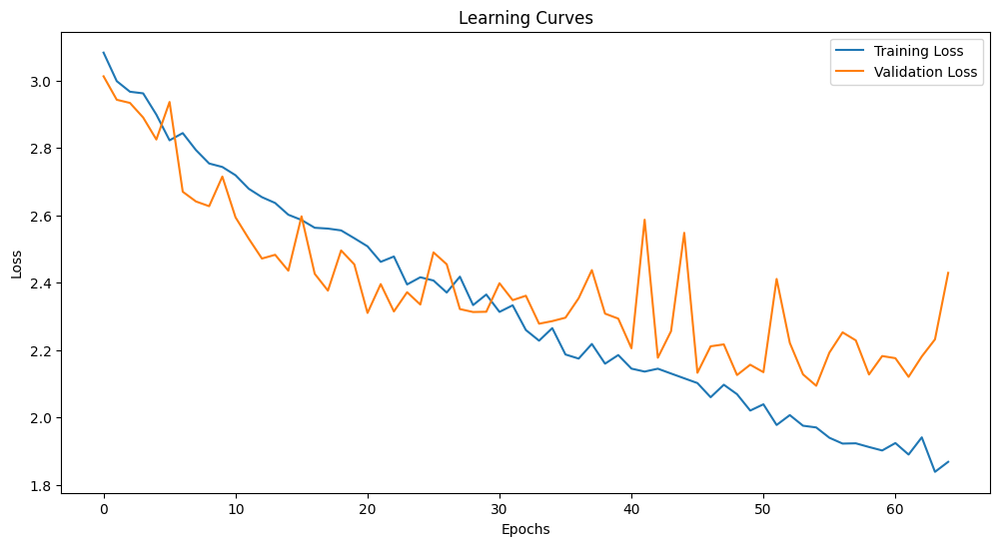

| Training Phase                         |   Lump Accuracy |   Size Accuracy |   Position Accuracy |
|:---------------------------------------|----------------:|----------------:|--------------------:|
| Initial Training                       |        0.751389 |        0.609722 |            0.555556 |
| Testing on doctors without fine-tuning |        0.336806 |        0.152778 |            0.170139 |
| Fine-tuning with 1 trials              |        0.447917 |        0.215278 |            0.215278 |
| Fine-tuning with 2 trials              |        0.552083 |        0.34375  |            0.5      |
| Fine-tuning with 3 trials              |        0.847222 |        0.53125  |            0.53125  |
| Fine-tuning with 4 trials              |        0.875    |        0.625    |            0.590278 |
| Fine-tuning with 5 trials              |        0.868056 |        0.600694 |            0.583333 |

Running experiment with tips sensors and 3 seconds
Using 6 GPUs
Initial Training and Evalu

Epoch 1, Training Loss: 3.0751, Validation Loss: 3.0060


Epoch 2, Training Loss: 2.9733, Validation Loss: 2.8264


Epoch 3, Training Loss: 2.9334, Validation Loss: 2.8283


Epoch 4, Training Loss: 2.9287, Validation Loss: 2.7587


Epoch 5, Training Loss: 2.8453, Validation Loss: 2.8391


Epoch 6, Training Loss: 2.8380, Validation Loss: 3.0281


Epoch 7, Training Loss: 2.8143, Validation Loss: 2.6957


Epoch 8, Training Loss: 2.7500, Validation Loss: 2.5631


Epoch 9, Training Loss: 2.7301, Validation Loss: 2.6220


Epoch 10, Training Loss: 2.6937, Validation Loss: 2.5499


Epoch 11, Training Loss: 2.6454, Validation Loss: 2.5753


Epoch 12, Training Loss: 2.6718, Validation Loss: 2.5760


Epoch 13, Training Loss: 2.6596, Validation Loss: 2.5595


Epoch 14, Training Loss: 2.6315, Validation Loss: 2.5186


Epoch 15, Training Loss: 2.5474, Validation Loss: 2.5400


Epoch 16, Training Loss: 2.5691, Validation Loss: 2.4133


Epoch 17, Training Loss: 2.5310, Validation Loss: 2.4619


Epoch 18, Training Loss: 2.4989, Validation Loss: 2.4340


Epoch 19, Training Loss: 2.4581, Validation Loss: 2.3510


Epoch 20, Training Loss: 2.4307, Validation Loss: 2.3194


Epoch 21, Training Loss: 2.5004, Validation Loss: 2.3726


Epoch 22, Training Loss: 2.4354, Validation Loss: 2.4082


Epoch 23, Training Loss: 2.3981, Validation Loss: 2.2795


Epoch 24, Training Loss: 2.3719, Validation Loss: 2.2671


Epoch 25, Training Loss: 2.3469, Validation Loss: 2.2492


Epoch 26, Training Loss: 2.3408, Validation Loss: 2.2271


Epoch 27, Training Loss: 2.3135, Validation Loss: 2.2421


Epoch 28, Training Loss: 2.2884, Validation Loss: 2.2568


Epoch 29, Training Loss: 2.3126, Validation Loss: 2.2289


Epoch 30, Training Loss: 2.2597, Validation Loss: 2.1397


Epoch 31, Training Loss: 2.3300, Validation Loss: 2.2273


Epoch 32, Training Loss: 2.2331, Validation Loss: 2.2349


Epoch 33, Training Loss: 2.2134, Validation Loss: 2.1581


Epoch 34, Training Loss: 2.1923, Validation Loss: 2.2071


Epoch 35, Training Loss: 2.1849, Validation Loss: 2.2796
Early stopping at epoch 35


Test Accuracy - Lump: 0.8028, Size: 0.6667, Position: 0.5931

Confusion Matrix - Lump:
[[275  85]
 [ 57 303]]


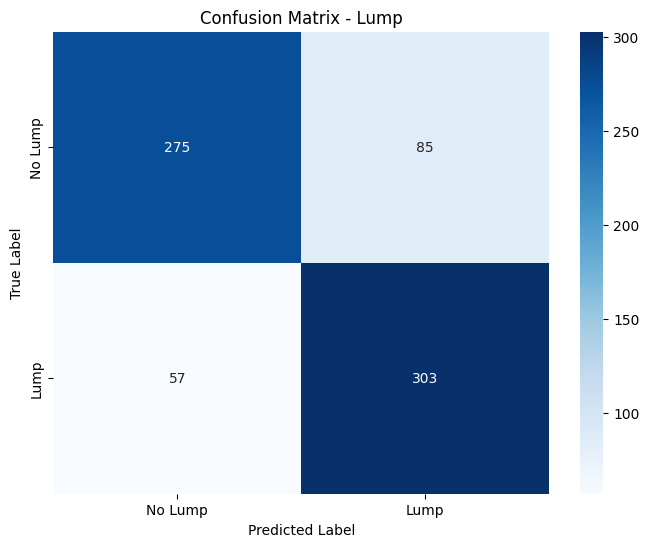


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.83      0.76      0.79       360
        Lump       0.78      0.84      0.81       360

    accuracy                           0.80       720
   macro avg       0.80      0.80      0.80       720
weighted avg       0.80      0.80      0.80       720


Confusion Matrix - Size:
[[ 54  32   8  26]
 [  9  59  19  33]
 [  6  31  48  35]
 [  4  19  18 319]]


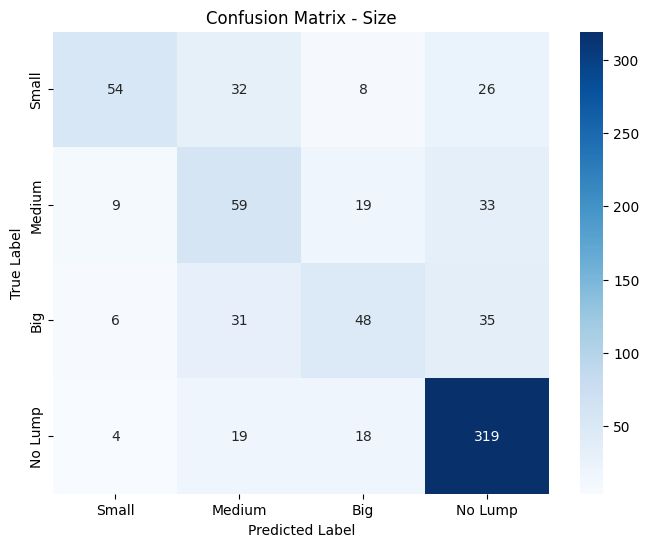


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.74      0.45      0.56       120
      Medium       0.42      0.49      0.45       120
         Big       0.52      0.40      0.45       120
     No Lump       0.77      0.89      0.83       360

    accuracy                           0.67       720
   macro avg       0.61      0.56      0.57       720
weighted avg       0.67      0.67      0.66       720


Confusion Matrix - Position:
[[ 15  17  53  35]
 [  9  24  49  38]
 [  6  18  69  27]
 [  5   9  27 319]]


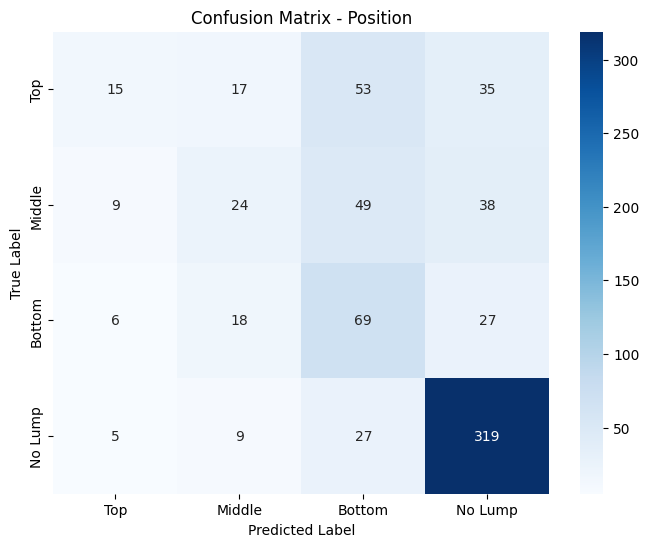


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.43      0.12      0.19       120
      Middle       0.35      0.20      0.26       120
      Bottom       0.35      0.57      0.43       120
     No Lump       0.76      0.89      0.82       360

    accuracy                           0.59       720
   macro avg       0.47      0.45      0.43       720
weighted avg       0.57      0.59      0.56       720


Testing on doctors' data without fine-tuning:


Test Accuracy - Lump: 0.7118, Size: 0.1701, Position: 0.4931

Confusion Matrix - Lump:
[[ 79  65]
 [ 18 126]]


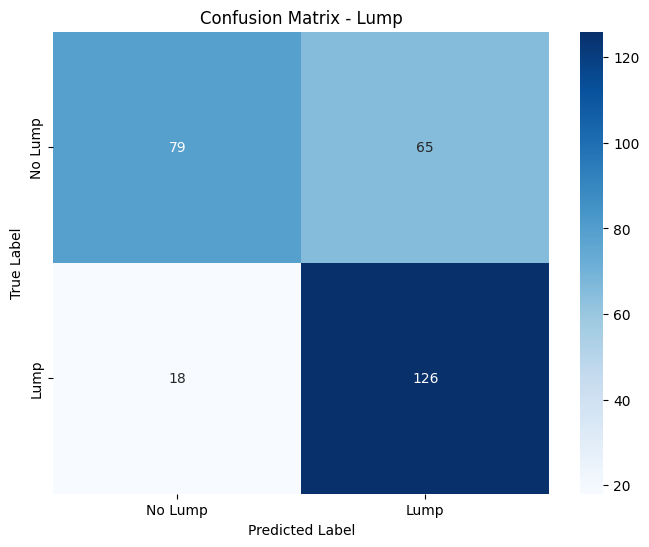


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.81      0.55      0.66       144
        Lump       0.66      0.88      0.75       144

    accuracy                           0.71       288
   macro avg       0.74      0.71      0.70       288
weighted avg       0.74      0.71      0.70       288


Confusion Matrix - Size:
[[  0   5  43   0]
 [  0   2  42   4]
 [  0   1  47   0]
 [  0   0 144   0]]


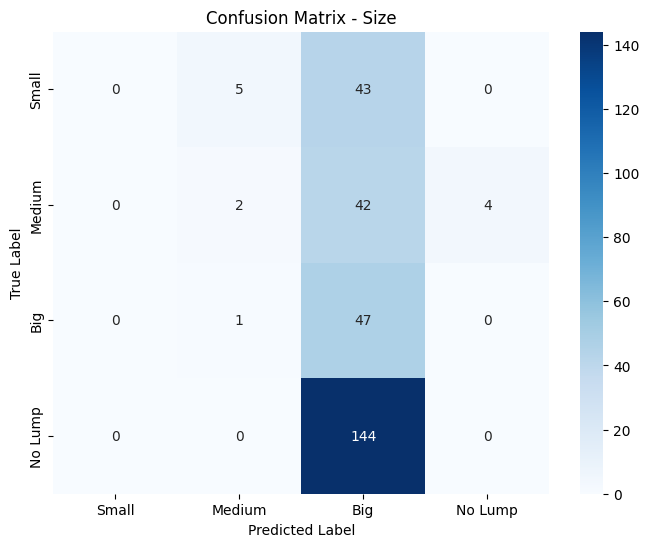


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.00      0.00      0.00        48
      Medium       0.25      0.04      0.07        48
         Big       0.17      0.98      0.29        48
     No Lump       0.00      0.00      0.00       144

    accuracy                           0.17       288
   macro avg       0.11      0.26      0.09       288
weighted avg       0.07      0.17      0.06       288


Confusion Matrix - Position:
[[  0   0  42   6]
 [  0   0  34  14]
 [  0   0  38  10]
 [  0   0  40 104]]


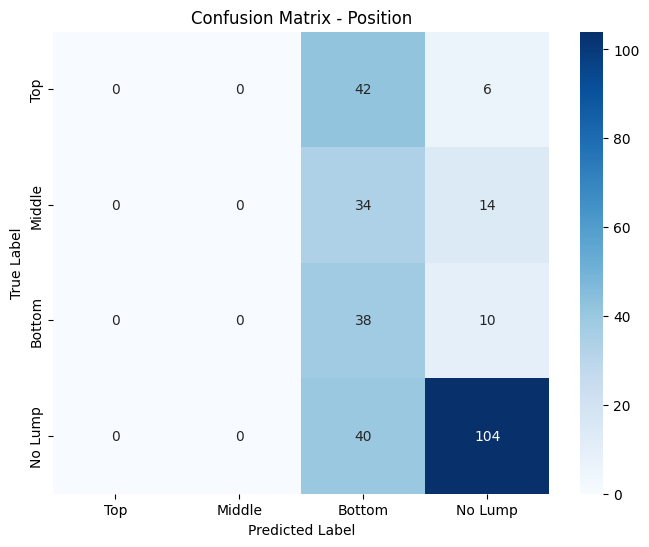


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.00      0.00      0.00        48
      Middle       0.00      0.00      0.00        48
      Bottom       0.25      0.79      0.38        48
     No Lump       0.78      0.72      0.75       144

    accuracy                           0.49       288
   macro avg       0.26      0.38      0.28       288
weighted avg       0.43      0.49      0.44       288


Fine-tuning with 1 additional trials from new dataset


Epoch 1, Training Loss: 2.1868, Validation Loss: 2.1816


Epoch 2, Training Loss: 2.2111, Validation Loss: 2.3074


Epoch 3, Training Loss: 2.1569, Validation Loss: 2.1506


Epoch 4, Training Loss: 2.1551, Validation Loss: 2.2446


Epoch 5, Training Loss: 2.1105, Validation Loss: 2.5601
Early stopping at epoch 5


Test Accuracy - Lump: 0.4965, Size: 0.5000, Position: 0.5000

Confusion Matrix - Lump:
[[135   9]
 [136   8]]


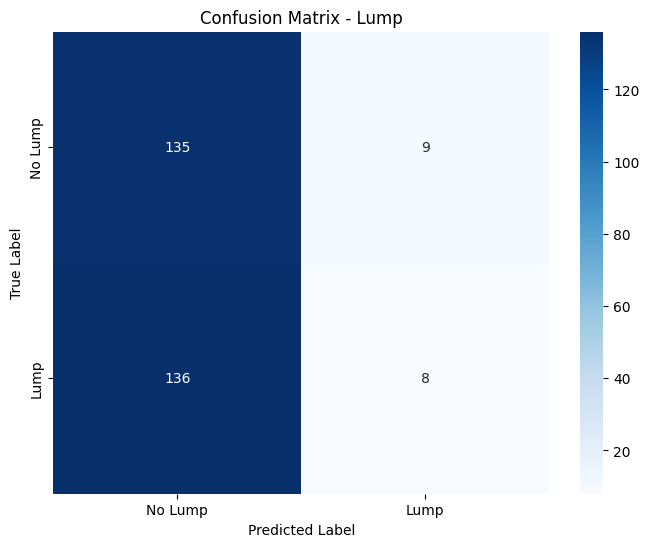


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.50      0.94      0.65       144
        Lump       0.47      0.06      0.10       144

    accuracy                           0.50       288
   macro avg       0.48      0.50      0.37       288
weighted avg       0.48      0.50      0.37       288


Confusion Matrix - Size:
[[  0   0   0  48]
 [  0   0   0  48]
 [  0   0   0  48]
 [  0   0   0 144]]


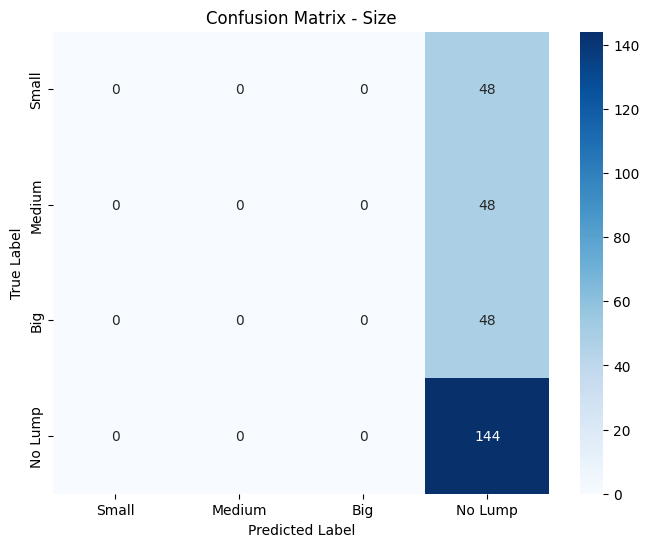


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.00      0.00      0.00        48
      Medium       0.00      0.00      0.00        48
         Big       0.00      0.00      0.00        48
     No Lump       0.50      1.00      0.67       144

    accuracy                           0.50       288
   macro avg       0.12      0.25      0.17       288
weighted avg       0.25      0.50      0.33       288


Confusion Matrix - Position:
[[  0   0   0  48]
 [  0   0   0  48]
 [  0   0   0  48]
 [  0   0   0 144]]


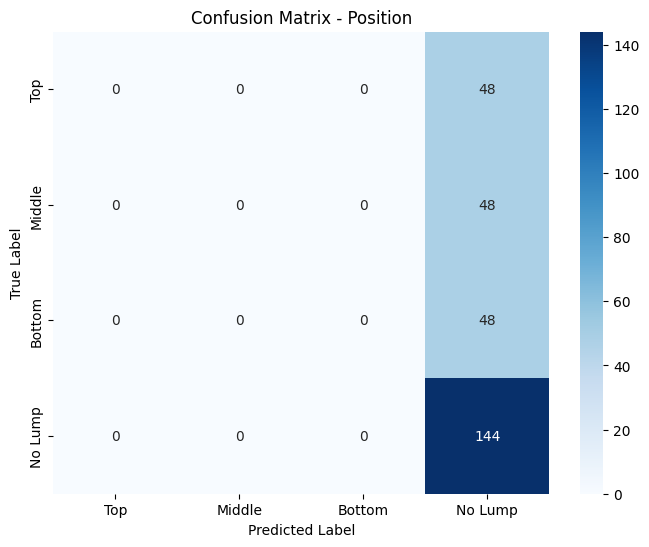


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.00      0.00      0.00        48
      Middle       0.00      0.00      0.00        48
      Bottom       0.00      0.00      0.00        48
     No Lump       0.50      1.00      0.67       144

    accuracy                           0.50       288
   macro avg       0.12      0.25      0.17       288
weighted avg       0.25      0.50      0.33       288


Fine-tuning with 2 additional trials from new dataset


Epoch 1, Training Loss: 2.1243, Validation Loss: 2.0928


Epoch 2, Training Loss: 2.0850, Validation Loss: 2.4448


Epoch 3, Training Loss: 2.0345, Validation Loss: 2.1101


Epoch 4, Training Loss: 2.0226, Validation Loss: 2.2671


Epoch 5, Training Loss: 2.0310, Validation Loss: 2.0904


Epoch 6, Training Loss: 2.0447, Validation Loss: 2.1703


Epoch 7, Training Loss: 2.0091, Validation Loss: 2.2034


Epoch 8, Training Loss: 2.0009, Validation Loss: 2.1094


Epoch 9, Training Loss: 1.9856, Validation Loss: 2.2135


Epoch 10, Training Loss: 1.9551, Validation Loss: 1.9960


Epoch 11, Training Loss: 1.9394, Validation Loss: 2.1169


Epoch 12, Training Loss: 1.9645, Validation Loss: 2.0350


Epoch 13, Training Loss: 1.9157, Validation Loss: 2.2052


Epoch 14, Training Loss: 1.9642, Validation Loss: 2.0216


Epoch 15, Training Loss: 1.9478, Validation Loss: 2.0354
Early stopping at epoch 15


Test Accuracy - Lump: 0.8264, Size: 0.4201, Position: 0.5069

Confusion Matrix - Lump:
[[107  37]
 [ 13 131]]


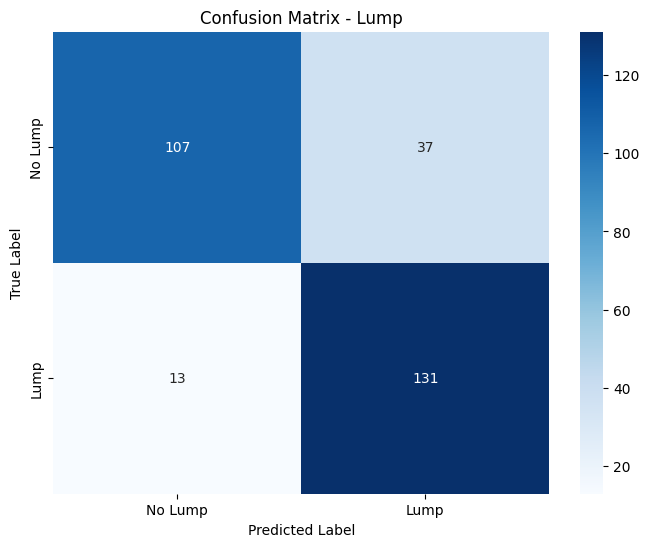


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.89      0.74      0.81       144
        Lump       0.78      0.91      0.84       144

    accuracy                           0.83       288
   macro avg       0.84      0.83      0.83       288
weighted avg       0.84      0.83      0.83       288


Confusion Matrix - Size:
[[ 4  0 28 16]
 [ 3  0 24 21]
 [ 0  0 35 13]
 [ 0  0 62 82]]


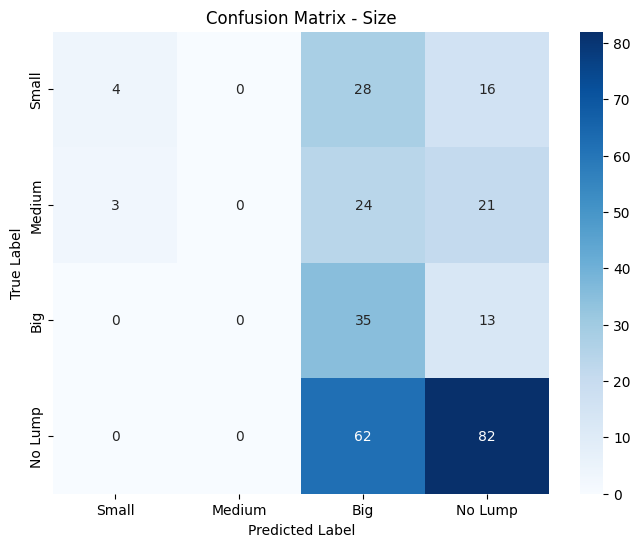


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.57      0.08      0.15        48
      Medium       0.00      0.00      0.00        48
         Big       0.23      0.73      0.36        48
     No Lump       0.62      0.57      0.59       144

    accuracy                           0.42       288
   macro avg       0.36      0.35      0.27       288
weighted avg       0.44      0.42      0.38       288


Confusion Matrix - Position:
[[  0   0  35  13]
 [  0   1  24  23]
 [  0   1  24  23]
 [  0   0  23 121]]


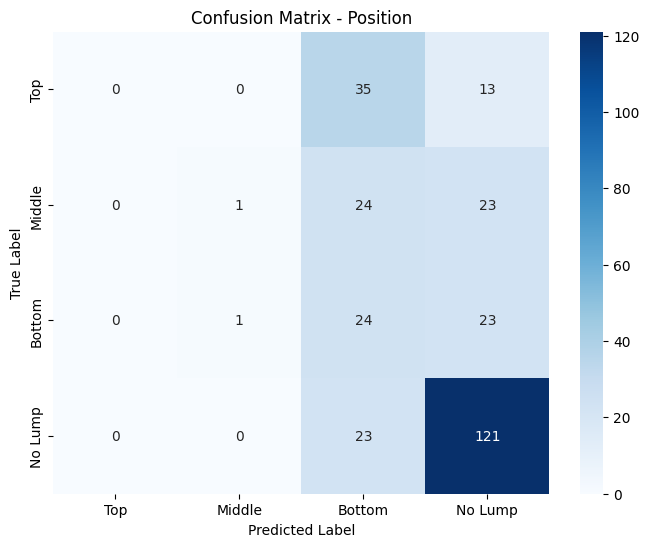


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.00      0.00      0.00        48
      Middle       0.50      0.02      0.04        48
      Bottom       0.23      0.50      0.31        48
     No Lump       0.67      0.84      0.75       144

    accuracy                           0.51       288
   macro avg       0.35      0.34      0.27       288
weighted avg       0.46      0.51      0.43       288


Fine-tuning with 3 additional trials from new dataset


Epoch 1, Training Loss: 1.8833, Validation Loss: 2.0586


Epoch 2, Training Loss: 1.8711, Validation Loss: 2.3438


Epoch 3, Training Loss: 1.8881, Validation Loss: 2.1461


Epoch 4, Training Loss: 1.8696, Validation Loss: 2.0255


Epoch 5, Training Loss: 1.8665, Validation Loss: 2.0211
Early stopping at epoch 5


Test Accuracy - Lump: 0.7465, Size: 0.4792, Position: 0.4757

Confusion Matrix - Lump:
[[ 72  72]
 [  1 143]]


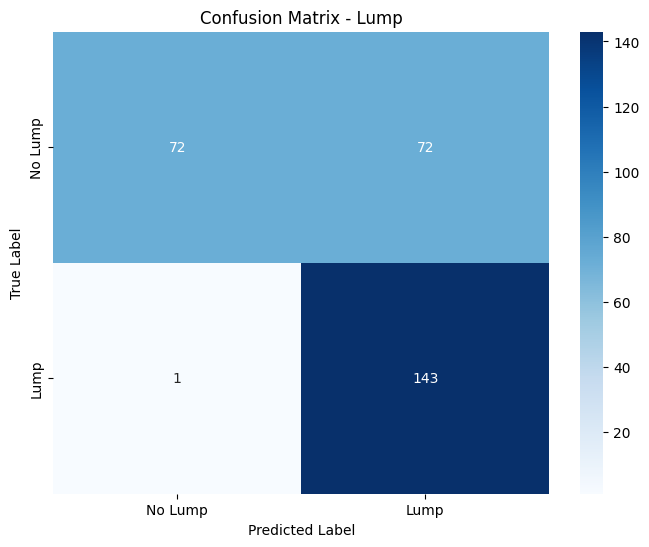


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.99      0.50      0.66       144
        Lump       0.67      0.99      0.80       144

    accuracy                           0.75       288
   macro avg       0.83      0.75      0.73       288
weighted avg       0.83      0.75      0.73       288


Confusion Matrix - Size:
[[28 17  3  0]
 [20 26  1  1]
 [13 27  3  5]
 [10 30 23 81]]


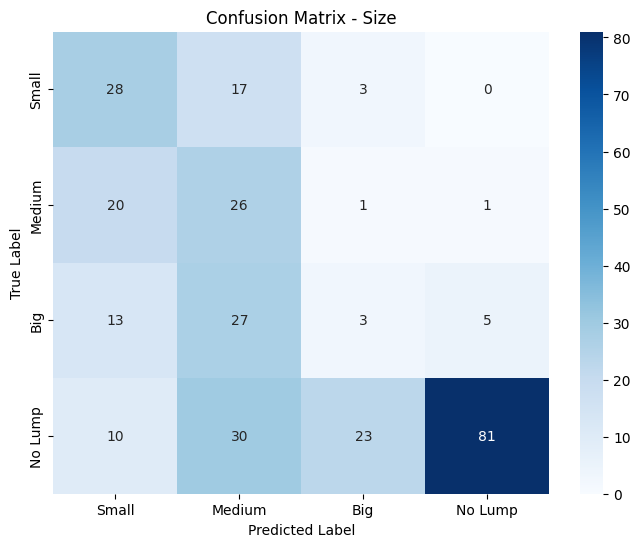


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.39      0.58      0.47        48
      Medium       0.26      0.54      0.35        48
         Big       0.10      0.06      0.08        48
     No Lump       0.93      0.56      0.70       144

    accuracy                           0.48       288
   macro avg       0.42      0.44      0.40       288
weighted avg       0.59      0.48      0.50       288


Confusion Matrix - Position:
[[ 0 15 32  1]
 [ 1  9 38  0]
 [ 0 10 30  8]
 [ 0 14 32 98]]


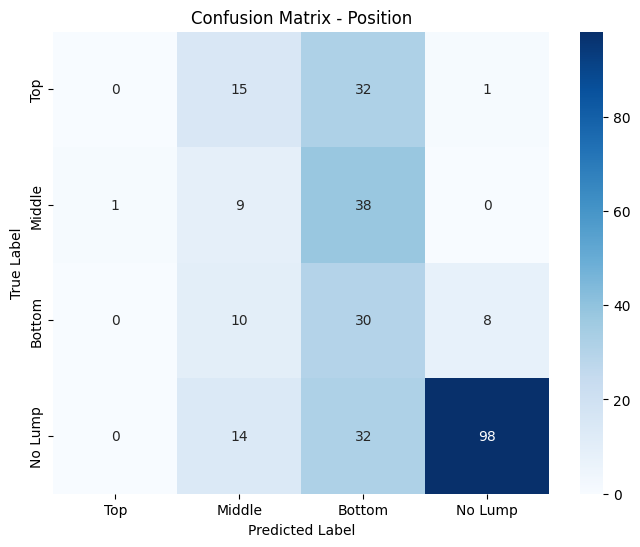


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.00      0.00      0.00        48
      Middle       0.19      0.19      0.19        48
      Bottom       0.23      0.62      0.33        48
     No Lump       0.92      0.68      0.78       144

    accuracy                           0.48       288
   macro avg       0.33      0.37      0.33       288
weighted avg       0.53      0.48      0.48       288


Fine-tuning with 4 additional trials from new dataset


Epoch 1, Training Loss: 1.8385, Validation Loss: 2.0204


Epoch 2, Training Loss: 1.7872, Validation Loss: 2.1366


Epoch 3, Training Loss: 1.7893, Validation Loss: 2.0492


Epoch 4, Training Loss: 1.7539, Validation Loss: 2.0119


Epoch 5, Training Loss: 1.8163, Validation Loss: 2.0558
Early stopping at epoch 5


Test Accuracy - Lump: 0.8611, Size: 0.6181, Position: 0.5625

Confusion Matrix - Lump:
[[132  12]
 [ 28 116]]


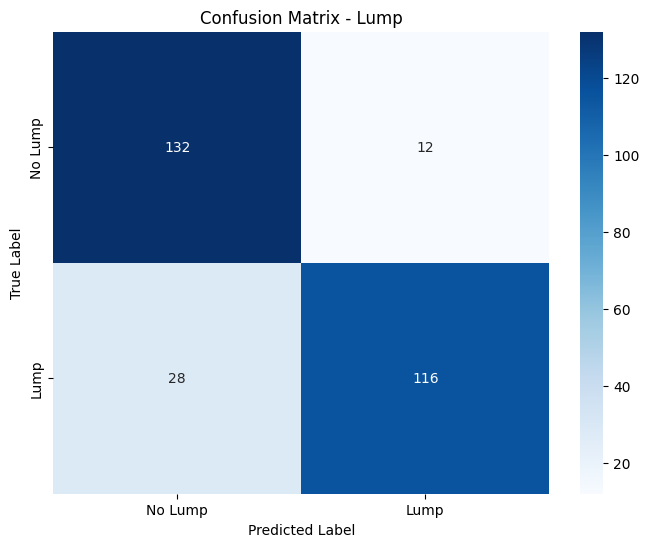


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.82      0.92      0.87       144
        Lump       0.91      0.81      0.85       144

    accuracy                           0.86       288
   macro avg       0.87      0.86      0.86       288
weighted avg       0.87      0.86      0.86       288


Confusion Matrix - Size:
[[ 15   7   5  21]
 [  9  21   2  16]
 [  9   6   2  31]
 [  0   2   2 140]]


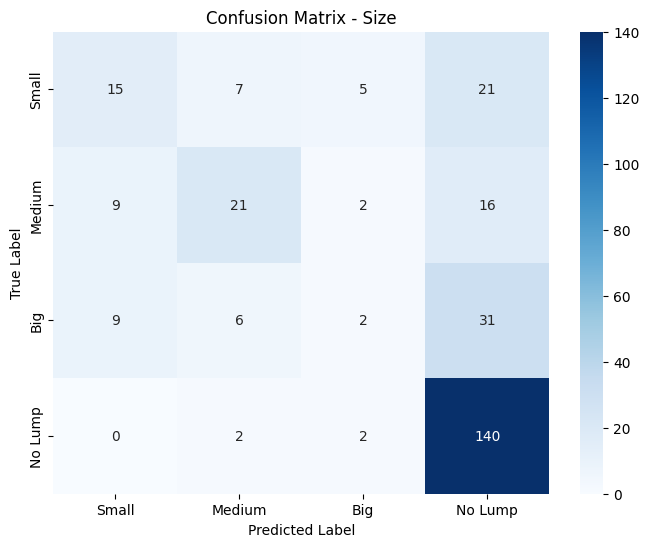


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.45      0.31      0.37        48
      Medium       0.58      0.44      0.50        48
         Big       0.18      0.04      0.07        48
     No Lump       0.67      0.97      0.80       144

    accuracy                           0.62       288
   macro avg       0.47      0.44      0.43       288
weighted avg       0.54      0.62      0.55       288


Confusion Matrix - Position:
[[  0  16  13  19]
 [  2   9  11  26]
 [  1   5  10  32]
 [  0   0   1 143]]


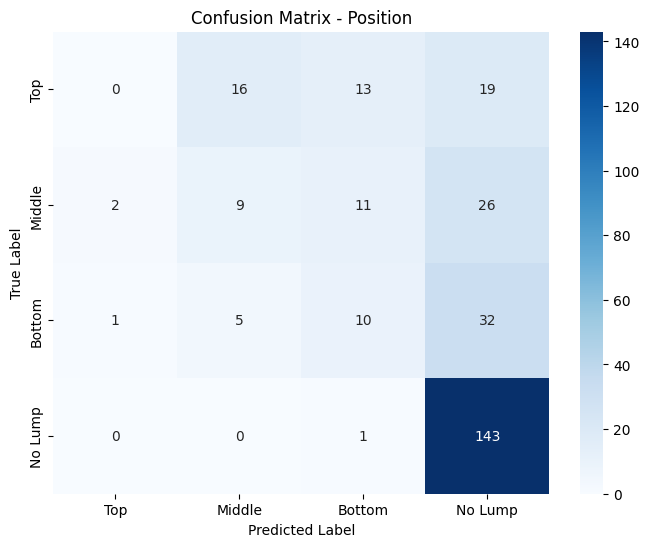


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.00      0.00      0.00        48
      Middle       0.30      0.19      0.23        48
      Bottom       0.29      0.21      0.24        48
     No Lump       0.65      0.99      0.79       144

    accuracy                           0.56       288
   macro avg       0.31      0.35      0.31       288
weighted avg       0.42      0.56      0.47       288


Fine-tuning with 5 additional trials from new dataset


Epoch 1, Training Loss: 1.7788, Validation Loss: 2.0358


Epoch 2, Training Loss: 1.7607, Validation Loss: 2.0333


Epoch 3, Training Loss: 1.7993, Validation Loss: 2.1291


Epoch 4, Training Loss: 1.7443, Validation Loss: 2.0745


Epoch 5, Training Loss: 1.7373, Validation Loss: 2.1420
Early stopping at epoch 5


Test Accuracy - Lump: 0.8785, Size: 0.6354, Position: 0.5799

Confusion Matrix - Lump:
[[134  10]
 [ 25 119]]


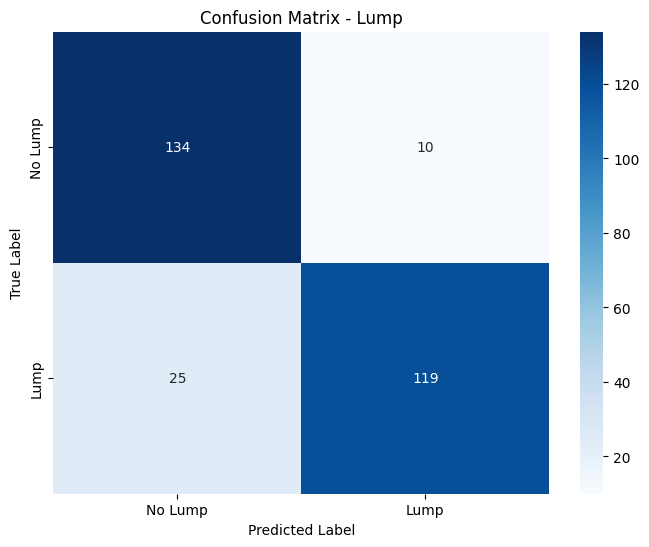


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.84      0.93      0.88       144
        Lump       0.92      0.83      0.87       144

    accuracy                           0.88       288
   macro avg       0.88      0.88      0.88       288
weighted avg       0.88      0.88      0.88       288


Confusion Matrix - Size:
[[ 10   1  25  12]
 [  4  11  26   7]
 [  1   0  24  23]
 [  0   1   5 138]]


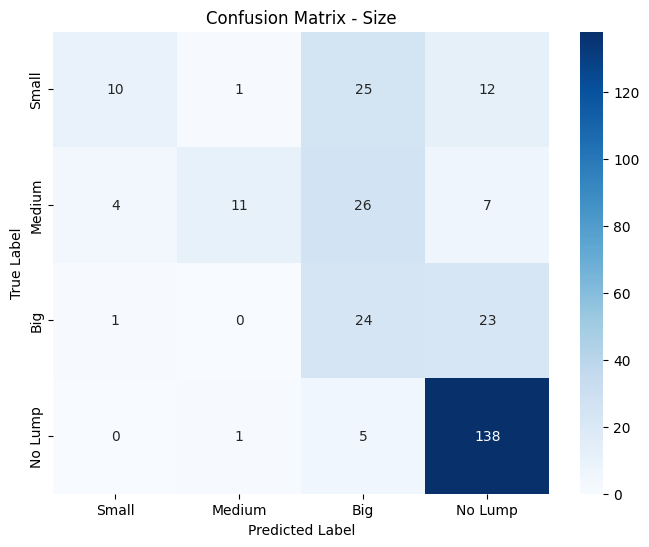


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.67      0.21      0.32        48
      Medium       0.85      0.23      0.36        48
         Big       0.30      0.50      0.37        48
     No Lump       0.77      0.96      0.85       144

    accuracy                           0.64       288
   macro avg       0.64      0.47      0.48       288
weighted avg       0.69      0.64      0.60       288


Confusion Matrix - Position:
[[  4   2  33   9]
 [  2   0  30  16]
 [  2   0  22  24]
 [  0   0   3 141]]


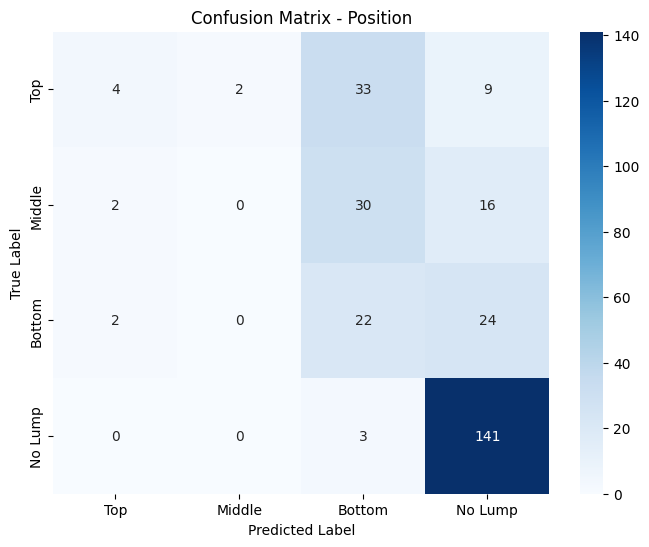


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.50      0.08      0.14        48
      Middle       0.00      0.00      0.00        48
      Bottom       0.25      0.46      0.32        48
     No Lump       0.74      0.98      0.84       144

    accuracy                           0.58       288
   macro avg       0.37      0.38      0.33       288
weighted avg       0.50      0.58      0.50       288



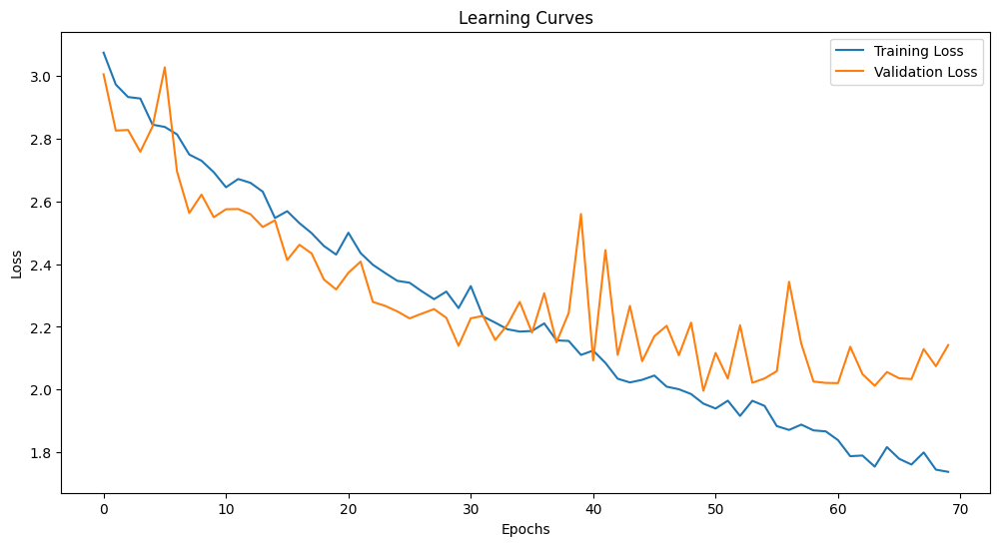

| Training Phase                         |   Lump Accuracy |   Size Accuracy |   Position Accuracy |
|:---------------------------------------|----------------:|----------------:|--------------------:|
| Initial Training                       |        0.802778 |        0.666667 |            0.593056 |
| Testing on doctors without fine-tuning |        0.711806 |        0.170139 |            0.493056 |
| Fine-tuning with 1 trials              |        0.496528 |        0.5      |            0.5      |
| Fine-tuning with 2 trials              |        0.826389 |        0.420139 |            0.506944 |
| Fine-tuning with 3 trials              |        0.746528 |        0.479167 |            0.475694 |
| Fine-tuning with 4 trials              |        0.861111 |        0.618056 |            0.5625   |
| Fine-tuning with 5 trials              |        0.878472 |        0.635417 |            0.579861 |

Running experiment with tips sensors and 4 seconds
Using 6 GPUs
Initial Training and Evalu

Epoch 1, Training Loss: 3.0720, Validation Loss: 2.8357


Epoch 2, Training Loss: 2.9781, Validation Loss: 2.8269


Epoch 3, Training Loss: 2.9360, Validation Loss: 2.9237


Epoch 4, Training Loss: 2.8927, Validation Loss: 2.8739


Epoch 5, Training Loss: 2.8795, Validation Loss: 2.7327


Epoch 6, Training Loss: 2.8354, Validation Loss: 2.5986


Epoch 7, Training Loss: 2.7853, Validation Loss: 2.6574


Epoch 8, Training Loss: 2.7499, Validation Loss: 2.6778


Epoch 9, Training Loss: 2.7491, Validation Loss: 2.5947


Epoch 10, Training Loss: 2.7189, Validation Loss: 2.5624


Epoch 11, Training Loss: 2.6561, Validation Loss: 2.5512


Epoch 12, Training Loss: 2.6367, Validation Loss: 2.4762


Epoch 13, Training Loss: 2.6418, Validation Loss: 2.6283


Epoch 14, Training Loss: 2.6100, Validation Loss: 2.4686


Epoch 15, Training Loss: 2.6133, Validation Loss: 2.4873


Epoch 16, Training Loss: 2.5407, Validation Loss: 2.4332


Epoch 17, Training Loss: 2.5586, Validation Loss: 2.4193


Epoch 18, Training Loss: 2.5410, Validation Loss: 2.3672


Epoch 19, Training Loss: 2.5128, Validation Loss: 2.3833


Epoch 20, Training Loss: 2.5176, Validation Loss: 2.3785


Epoch 21, Training Loss: 2.4530, Validation Loss: 2.3719


Epoch 22, Training Loss: 2.4394, Validation Loss: 2.3799


Epoch 23, Training Loss: 2.4130, Validation Loss: 2.3088


Epoch 24, Training Loss: 2.4088, Validation Loss: 2.3541


Epoch 25, Training Loss: 2.3825, Validation Loss: 2.3493


Epoch 26, Training Loss: 2.3565, Validation Loss: 2.2631


Epoch 27, Training Loss: 2.3579, Validation Loss: 2.3451


Epoch 28, Training Loss: 2.2910, Validation Loss: 2.3447


Epoch 29, Training Loss: 2.3156, Validation Loss: 2.2040


Epoch 30, Training Loss: 2.3102, Validation Loss: 2.2865


Epoch 31, Training Loss: 2.2894, Validation Loss: 2.1859


Epoch 32, Training Loss: 2.2336, Validation Loss: 2.2451


Epoch 33, Training Loss: 2.2544, Validation Loss: 2.2391


Epoch 34, Training Loss: 2.2188, Validation Loss: 2.2543


Epoch 35, Training Loss: 2.1844, Validation Loss: 2.1855


Epoch 36, Training Loss: 2.1534, Validation Loss: 2.2051


Epoch 37, Training Loss: 2.1684, Validation Loss: 2.2096


Epoch 38, Training Loss: 2.1891, Validation Loss: 2.4007


Epoch 39, Training Loss: 2.1478, Validation Loss: 2.1762


Epoch 40, Training Loss: 2.1143, Validation Loss: 2.2048


Epoch 41, Training Loss: 2.0986, Validation Loss: 2.1823


Epoch 42, Training Loss: 2.1187, Validation Loss: 2.3116


Epoch 43, Training Loss: 2.0555, Validation Loss: 2.2102


Epoch 44, Training Loss: 2.0500, Validation Loss: 2.1308


Epoch 45, Training Loss: 2.0431, Validation Loss: 2.1698


Epoch 46, Training Loss: 2.0106, Validation Loss: 2.1135


Epoch 47, Training Loss: 1.9983, Validation Loss: 2.1250


Epoch 48, Training Loss: 2.0245, Validation Loss: 2.1845


Epoch 49, Training Loss: 1.9999, Validation Loss: 2.0700


Epoch 50, Training Loss: 1.9568, Validation Loss: 2.0952


Epoch 51, Training Loss: 1.9655, Validation Loss: 2.1364


Epoch 52, Training Loss: 1.9634, Validation Loss: 2.1058


Epoch 53, Training Loss: 1.9896, Validation Loss: 2.0658


Epoch 54, Training Loss: 1.9183, Validation Loss: 2.0595


Epoch 55, Training Loss: 1.9423, Validation Loss: 2.0030


Epoch 56, Training Loss: 1.8998, Validation Loss: 2.0174


Epoch 57, Training Loss: 1.8977, Validation Loss: 2.0960


Epoch 58, Training Loss: 1.8569, Validation Loss: 2.1901


Epoch 59, Training Loss: 1.8794, Validation Loss: 1.9309


Epoch 60, Training Loss: 1.8731, Validation Loss: 2.0317


Epoch 61, Training Loss: 1.8391, Validation Loss: 1.9654


Epoch 62, Training Loss: 1.8764, Validation Loss: 2.0894


Epoch 63, Training Loss: 1.8151, Validation Loss: 2.0710


Epoch 64, Training Loss: 1.7812, Validation Loss: 2.0451
Early stopping at epoch 64


Test Accuracy - Lump: 0.8208, Size: 0.7014, Position: 0.6292

Confusion Matrix - Lump:
[[315  45]
 [ 84 276]]


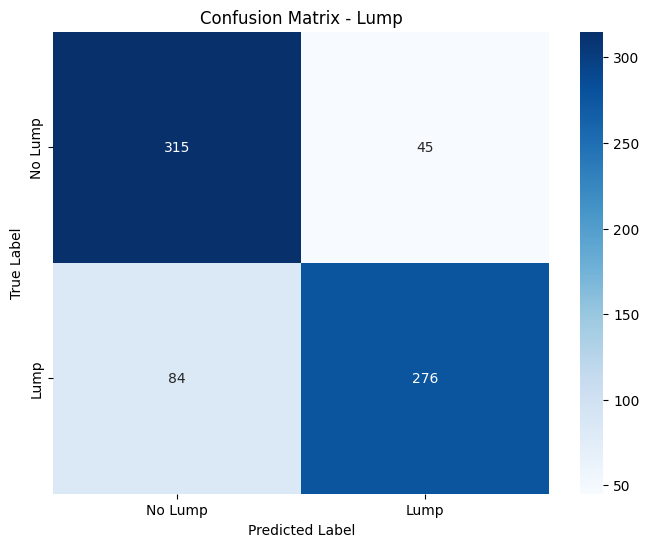


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.79      0.88      0.83       360
        Lump       0.86      0.77      0.81       360

    accuracy                           0.82       720
   macro avg       0.82      0.82      0.82       720
weighted avg       0.82      0.82      0.82       720


Confusion Matrix - Size:
[[ 71  10   5  34]
 [ 25  49  17  29]
 [  7  16  53  44]
 [ 12   5  11 332]]


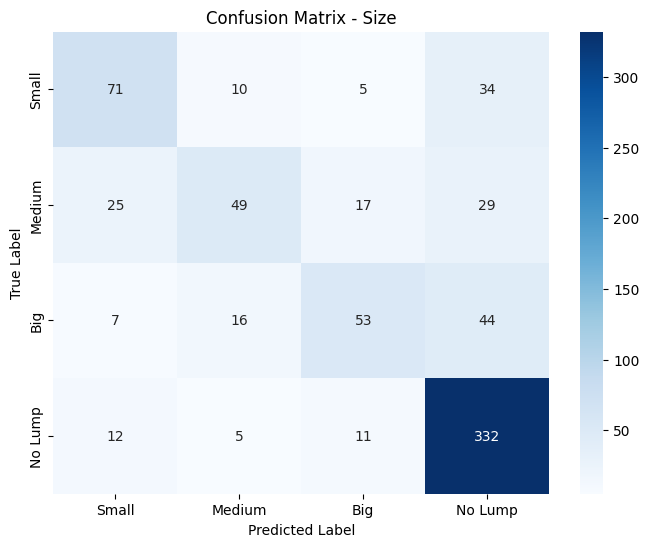


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.62      0.59      0.60       120
      Medium       0.61      0.41      0.49       120
         Big       0.62      0.44      0.51       120
     No Lump       0.76      0.92      0.83       360

    accuracy                           0.70       720
   macro avg       0.65      0.59      0.61       720
weighted avg       0.69      0.70      0.68       720


Confusion Matrix - Position:
[[ 31  16  28  45]
 [ 19  38  25  38]
 [ 21  14  45  40]
 [  6   5  10 339]]


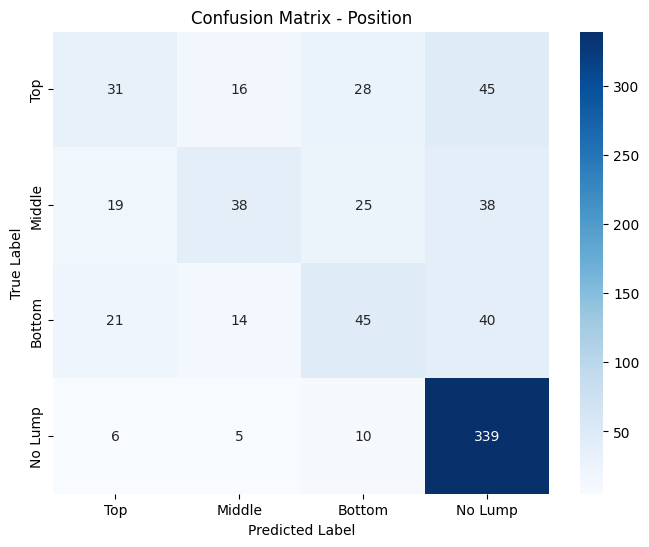


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.40      0.26      0.31       120
      Middle       0.52      0.32      0.39       120
      Bottom       0.42      0.38      0.39       120
     No Lump       0.73      0.94      0.82       360

    accuracy                           0.63       720
   macro avg       0.52      0.47      0.48       720
weighted avg       0.59      0.63      0.60       720


Testing on doctors' data without fine-tuning:


Test Accuracy - Lump: 0.5278, Size: 0.3368, Position: 0.4965

Confusion Matrix - Lump:
[[136   8]
 [128  16]]


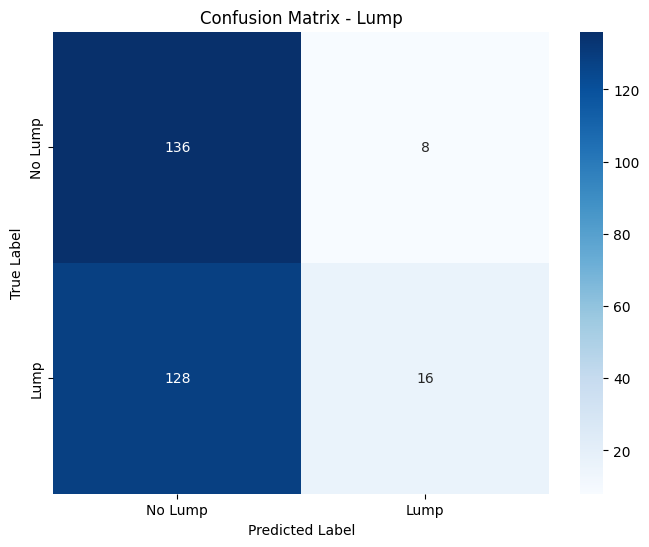


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.52      0.94      0.67       144
        Lump       0.67      0.11      0.19       144

    accuracy                           0.53       288
   macro avg       0.59      0.53      0.43       288
weighted avg       0.59      0.53      0.43       288


Confusion Matrix - Size:
[[ 0  0  0 48]
 [ 0  1  1 46]
 [ 0  1  1 46]
 [ 0  0 49 95]]


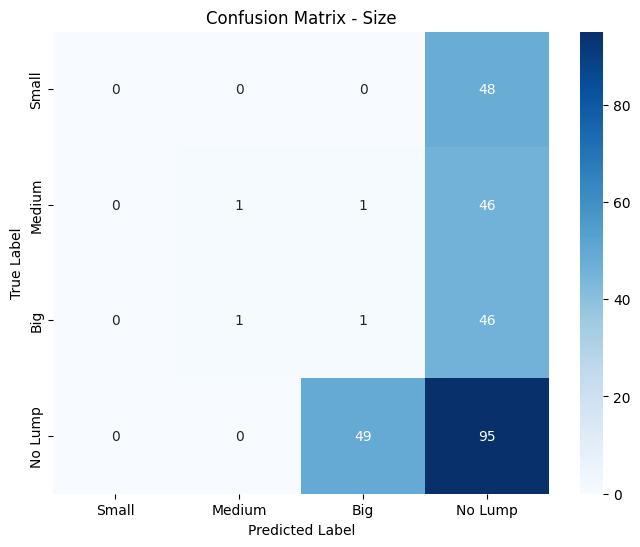


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.00      0.00      0.00        48
      Medium       0.50      0.02      0.04        48
         Big       0.02      0.02      0.02        48
     No Lump       0.40      0.66      0.50       144

    accuracy                           0.34       288
   macro avg       0.23      0.18      0.14       288
weighted avg       0.29      0.34      0.26       288


Confusion Matrix - Position:
[[  0   0   3  45]
 [  0   0   0  48]
 [  0   0   0  48]
 [  0   0   1 143]]


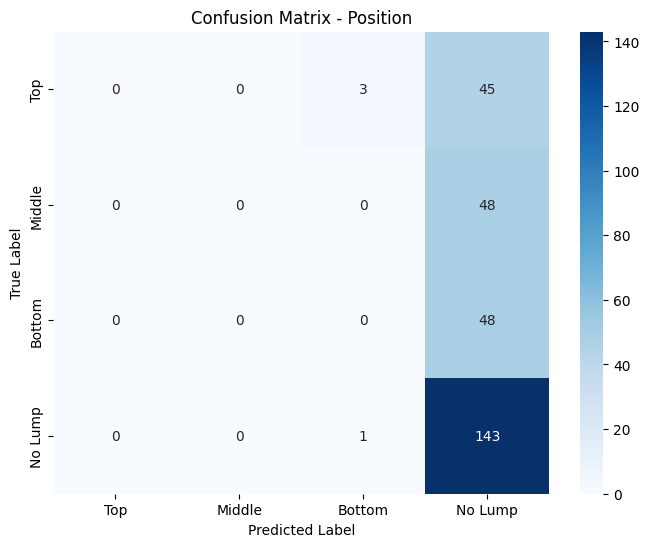


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.00      0.00      0.00        48
      Middle       0.00      0.00      0.00        48
      Bottom       0.00      0.00      0.00        48
     No Lump       0.50      0.99      0.67       144

    accuracy                           0.50       288
   macro avg       0.13      0.25      0.17       288
weighted avg       0.25      0.50      0.33       288


Fine-tuning with 1 additional trials from new dataset


Epoch 1, Training Loss: 1.7930, Validation Loss: 2.4151


Epoch 2, Training Loss: 1.8536, Validation Loss: 1.9973


Epoch 3, Training Loss: 1.8245, Validation Loss: 2.2226


Epoch 4, Training Loss: 1.7995, Validation Loss: 2.2927


Epoch 5, Training Loss: 1.7862, Validation Loss: 2.1004
Early stopping at epoch 5


Test Accuracy - Lump: 0.5799, Size: 0.5174, Position: 0.5000

Confusion Matrix - Lump:
[[138   6]
 [115  29]]


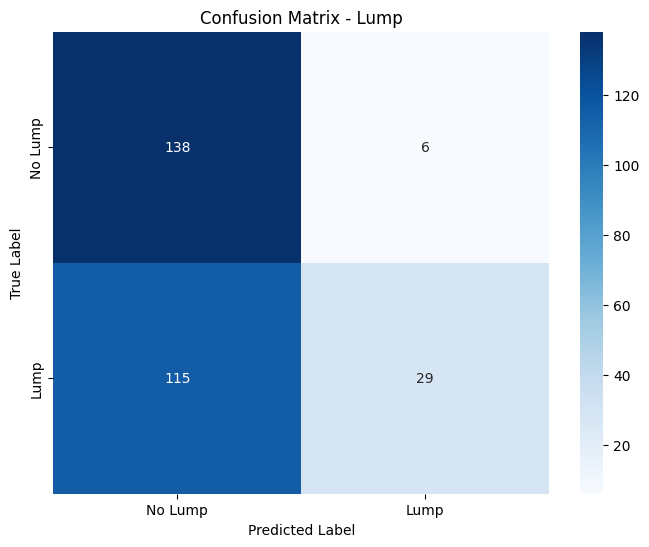


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.55      0.96      0.70       144
        Lump       0.83      0.20      0.32       144

    accuracy                           0.58       288
   macro avg       0.69      0.58      0.51       288
weighted avg       0.69      0.58      0.51       288


Confusion Matrix - Size:
[[  0   3   0  45]
 [  0   7   1  40]
 [  0   4   0  44]
 [  0   1   1 142]]


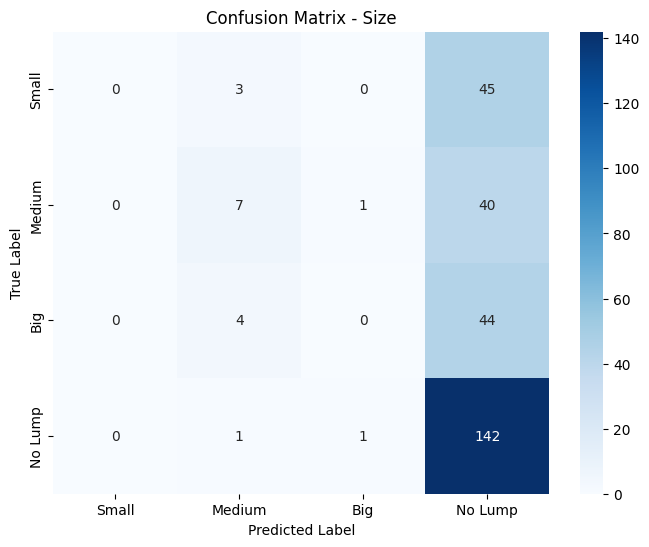


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.00      0.00      0.00        48
      Medium       0.47      0.15      0.22        48
         Big       0.00      0.00      0.00        48
     No Lump       0.52      0.99      0.68       144

    accuracy                           0.52       288
   macro avg       0.25      0.28      0.23       288
weighted avg       0.34      0.52      0.38       288


Confusion Matrix - Position:
[[  0   9   0  39]
 [  0   1   0  47]
 [  0   4   0  44]
 [  0   1   0 143]]


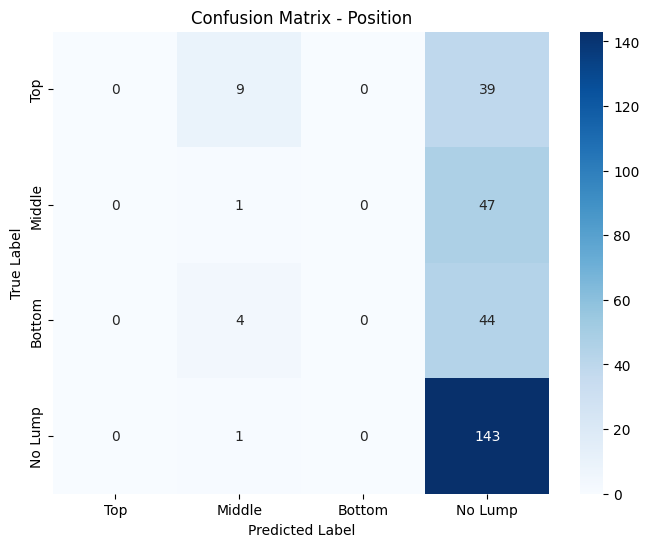


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.00      0.00      0.00        48
      Middle       0.07      0.02      0.03        48
      Bottom       0.00      0.00      0.00        48
     No Lump       0.52      0.99      0.69       144

    accuracy                           0.50       288
   macro avg       0.15      0.25      0.18       288
weighted avg       0.27      0.50      0.35       288


Fine-tuning with 2 additional trials from new dataset


Epoch 1, Training Loss: 1.7545, Validation Loss: 2.1104


Epoch 2, Training Loss: 1.7029, Validation Loss: 2.0137


Epoch 3, Training Loss: 1.7335, Validation Loss: 1.9336


Epoch 4, Training Loss: 1.7457, Validation Loss: 1.9935


Epoch 5, Training Loss: 1.7108, Validation Loss: 1.9816
Early stopping at epoch 5


Test Accuracy - Lump: 0.7986, Size: 0.5486, Position: 0.5556

Confusion Matrix - Lump:
[[110  34]
 [ 24 120]]


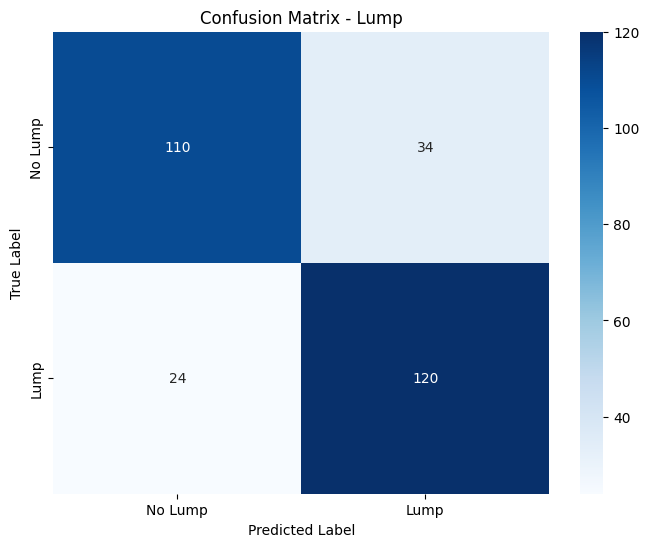


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.82      0.76      0.79       144
        Lump       0.78      0.83      0.81       144

    accuracy                           0.80       288
   macro avg       0.80      0.80      0.80       288
weighted avg       0.80      0.80      0.80       288


Confusion Matrix - Size:
[[  4  17   3  24]
 [  6  11   7  24]
 [  2  13   2  31]
 [  0   0   3 141]]


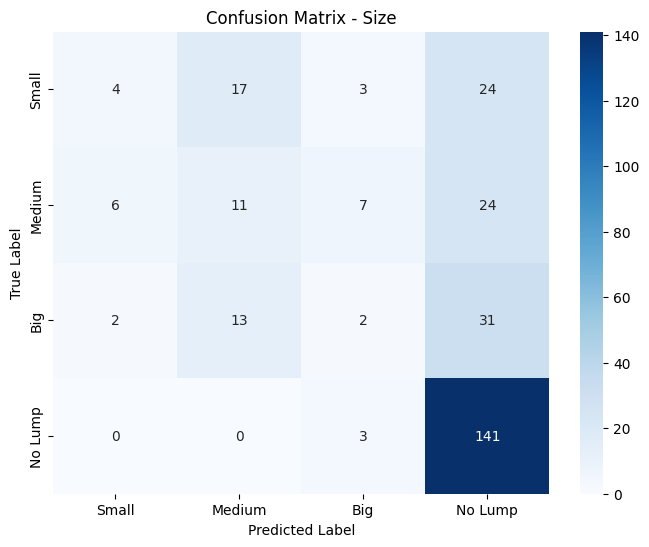


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.33      0.08      0.13        48
      Medium       0.27      0.23      0.25        48
         Big       0.13      0.04      0.06        48
     No Lump       0.64      0.98      0.77       144

    accuracy                           0.55       288
   macro avg       0.34      0.33      0.30       288
weighted avg       0.44      0.55      0.46       288


Confusion Matrix - Position:
[[  0   6  27  15]
 [  0   2  18  28]
 [  0   3  18  27]
 [  0   0   4 140]]


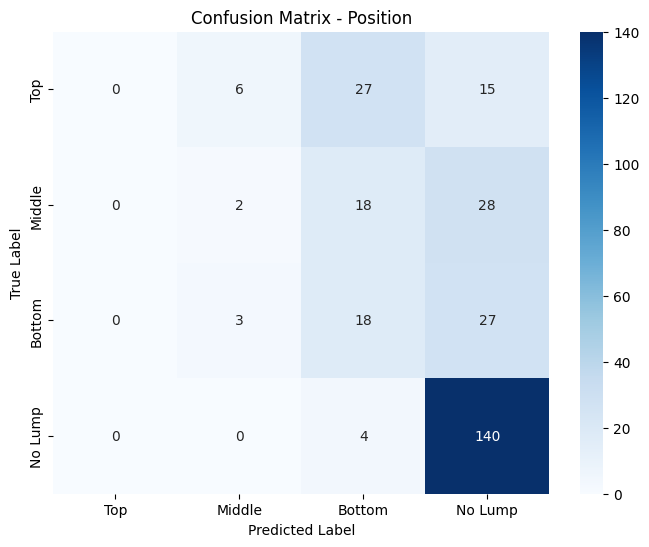


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.00      0.00      0.00        48
      Middle       0.18      0.04      0.07        48
      Bottom       0.27      0.38      0.31        48
     No Lump       0.67      0.97      0.79       144

    accuracy                           0.56       288
   macro avg       0.28      0.35      0.29       288
weighted avg       0.41      0.56      0.46       288


Fine-tuning with 3 additional trials from new dataset


Epoch 1, Training Loss: 1.6863, Validation Loss: 2.0867


Epoch 2, Training Loss: 1.6755, Validation Loss: 2.1848


Epoch 3, Training Loss: 1.6498, Validation Loss: 2.2521


Epoch 4, Training Loss: 1.6614, Validation Loss: 1.9375


Epoch 5, Training Loss: 1.6065, Validation Loss: 2.0487
Early stopping at epoch 5


Test Accuracy - Lump: 0.7431, Size: 0.4444, Position: 0.5035

Confusion Matrix - Lump:
[[ 81  63]
 [ 11 133]]


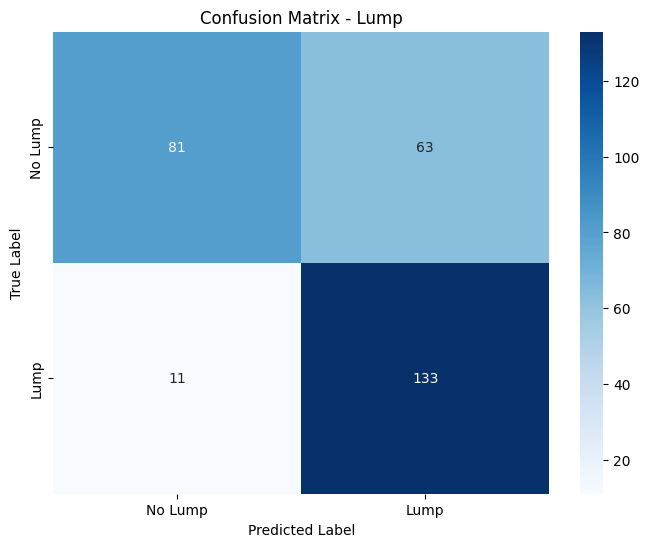


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.88      0.56      0.69       144
        Lump       0.68      0.92      0.78       144

    accuracy                           0.74       288
   macro avg       0.78      0.74      0.73       288
weighted avg       0.78      0.74      0.73       288


Confusion Matrix - Size:
[[ 0 20 20  8]
 [ 0 23 11 14]
 [ 0 12 24 12]
 [ 0  1 62 81]]


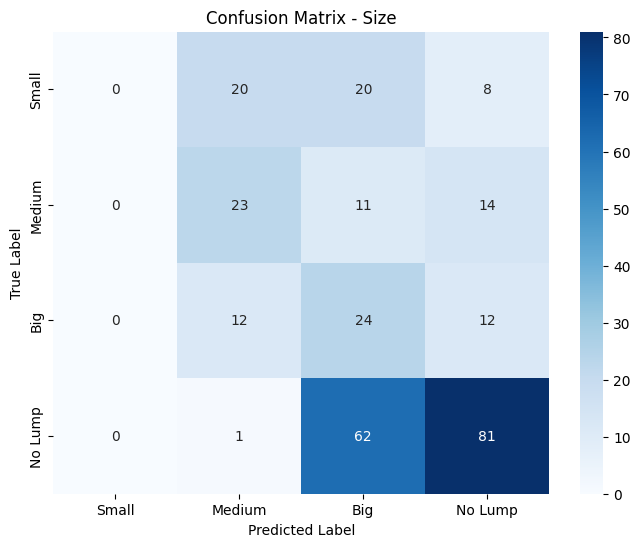


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.00      0.00      0.00        48
      Medium       0.41      0.48      0.44        48
         Big       0.21      0.50      0.29        48
     No Lump       0.70      0.56      0.63       144

    accuracy                           0.44       288
   macro avg       0.33      0.39      0.34       288
weighted avg       0.45      0.44      0.43       288


Confusion Matrix - Position:
[[  9  19   0  20]
 [ 12  19   0  17]
 [  6  18   0  24]
 [  9  18   0 117]]


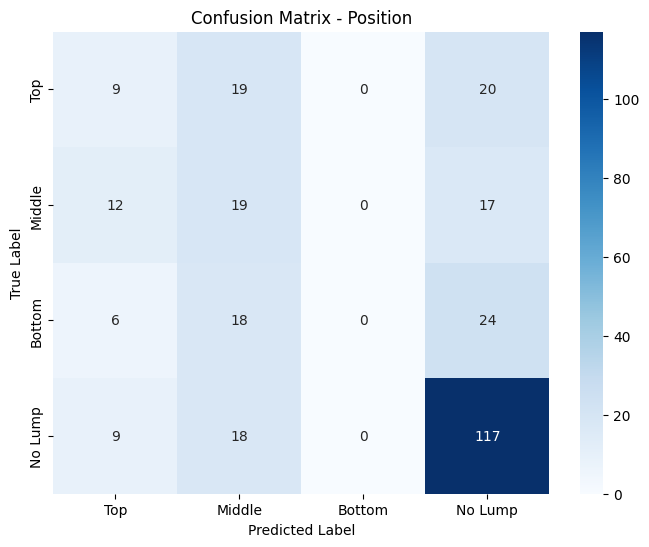


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.25      0.19      0.21        48
      Middle       0.26      0.40      0.31        48
      Bottom       0.00      0.00      0.00        48
     No Lump       0.66      0.81      0.73       144

    accuracy                           0.50       288
   macro avg       0.29      0.35      0.31       288
weighted avg       0.41      0.50      0.45       288


Fine-tuning with 4 additional trials from new dataset


Epoch 1, Training Loss: 1.6374, Validation Loss: 1.9320


Epoch 2, Training Loss: 1.6430, Validation Loss: 1.9275


Epoch 3, Training Loss: 1.6306, Validation Loss: 1.9845


Epoch 4, Training Loss: 1.6472, Validation Loss: 2.0323


Epoch 5, Training Loss: 1.5848, Validation Loss: 1.9349


Epoch 6, Training Loss: 1.5626, Validation Loss: 1.9903


Epoch 7, Training Loss: 1.5946, Validation Loss: 2.3033
Early stopping at epoch 7


Test Accuracy - Lump: 0.8507, Size: 0.6250, Position: 0.5729

Confusion Matrix - Lump:
[[136   8]
 [ 35 109]]


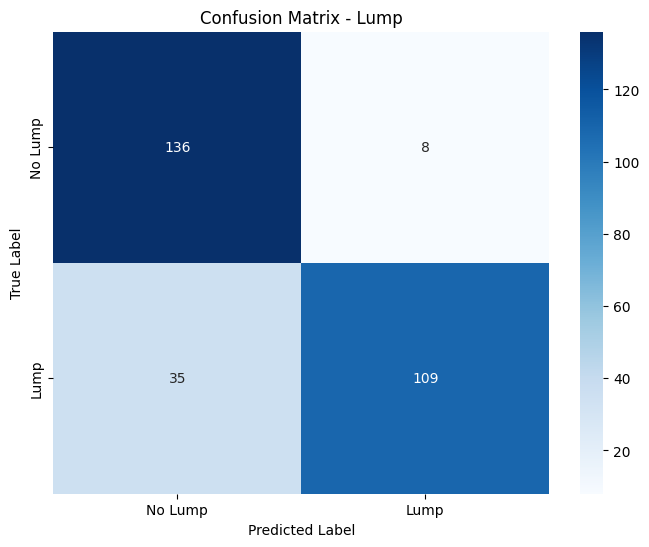


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.80      0.94      0.86       144
        Lump       0.93      0.76      0.84       144

    accuracy                           0.85       288
   macro avg       0.86      0.85      0.85       288
weighted avg       0.86      0.85      0.85       288


Confusion Matrix - Size:
[[ 12  23   0  13]
 [  8  25   0  15]
 [  1  20   0  27]
 [  1   0   0 143]]


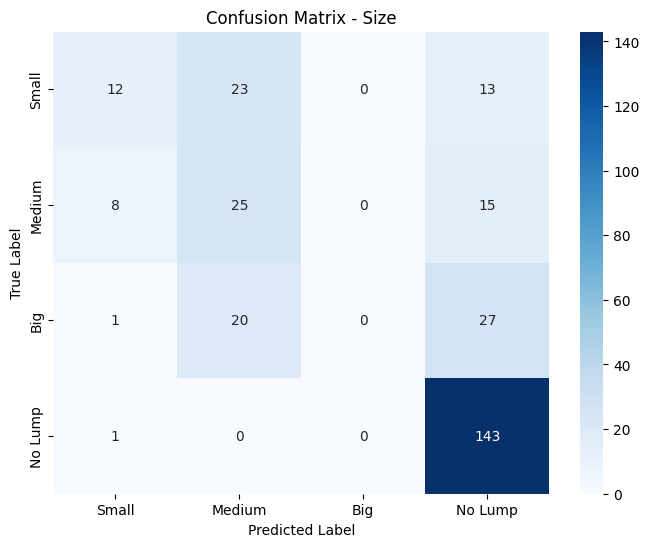


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.55      0.25      0.34        48
      Medium       0.37      0.52      0.43        48
         Big       0.00      0.00      0.00        48
     No Lump       0.72      0.99      0.84       144

    accuracy                           0.62       288
   macro avg       0.41      0.44      0.40       288
weighted avg       0.51      0.62      0.55       288


Confusion Matrix - Position:
[[  0  34   0  14]
 [  0  22   0  26]
 [  0  24   0  24]
 [  0   1   0 143]]


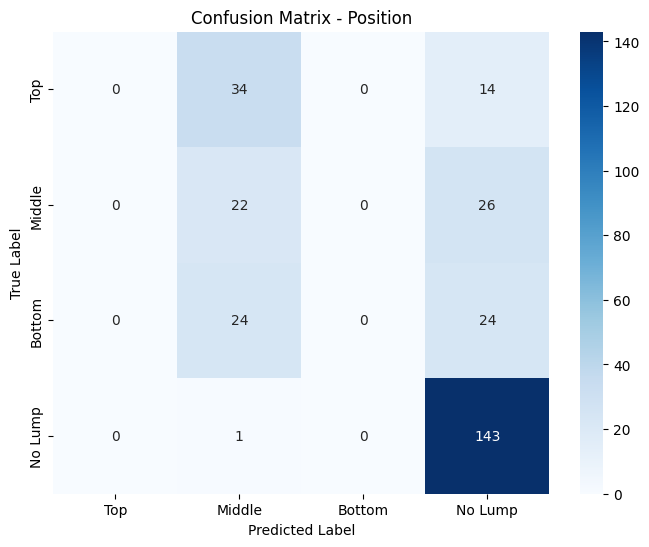


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.00      0.00      0.00        48
      Middle       0.27      0.46      0.34        48
      Bottom       0.00      0.00      0.00        48
     No Lump       0.69      0.99      0.81       144

    accuracy                           0.57       288
   macro avg       0.24      0.36      0.29       288
weighted avg       0.39      0.57      0.46       288


Fine-tuning with 5 additional trials from new dataset


Epoch 1, Training Loss: 1.5774, Validation Loss: 1.9098


Epoch 2, Training Loss: 1.5532, Validation Loss: 2.4310


Epoch 3, Training Loss: 1.6515, Validation Loss: 1.9229


Epoch 4, Training Loss: 1.4999, Validation Loss: 2.2001


Epoch 5, Training Loss: 1.5290, Validation Loss: 1.9819


Epoch 6, Training Loss: 1.5958, Validation Loss: 1.9650
Early stopping at epoch 6


Test Accuracy - Lump: 0.8333, Size: 0.6354, Position: 0.6076

Confusion Matrix - Lump:
[[134  10]
 [ 38 106]]


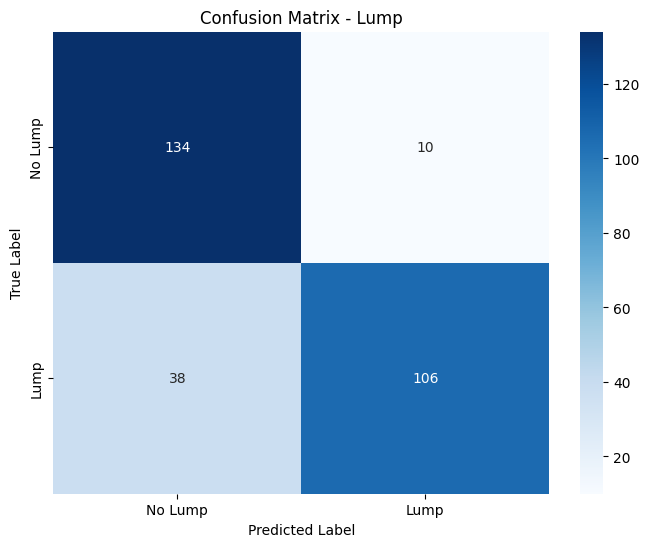


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.78      0.93      0.85       144
        Lump       0.91      0.74      0.82       144

    accuracy                           0.83       288
   macro avg       0.85      0.83      0.83       288
weighted avg       0.85      0.83      0.83       288


Confusion Matrix - Size:
[[ 11  26   0  11]
 [  7  32   0   9]
 [  6  13   0  29]
 [  0   4   0 140]]


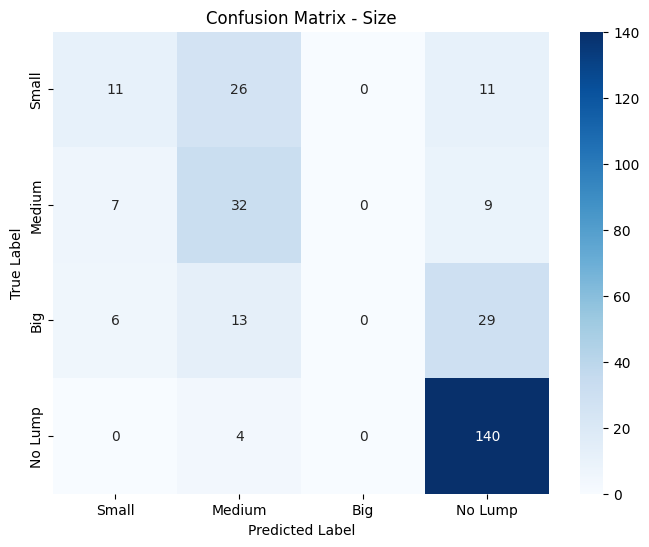


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.46      0.23      0.31        48
      Medium       0.43      0.67      0.52        48
         Big       0.00      0.00      0.00        48
     No Lump       0.74      0.97      0.84       144

    accuracy                           0.64       288
   macro avg       0.41      0.47      0.42       288
weighted avg       0.52      0.64      0.56       288


Confusion Matrix - Position:
[[  0  33   0  15]
 [  0  33   1  14]
 [  0  22   1  25]
 [  0   3   0 141]]


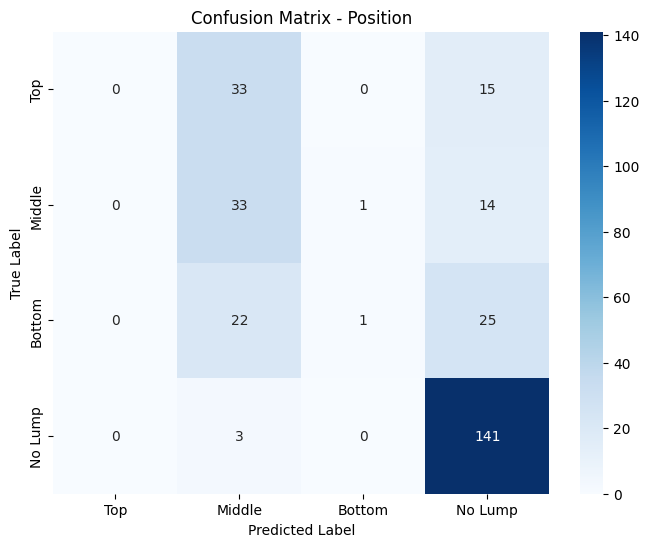


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.00      0.00      0.00        48
      Middle       0.36      0.69      0.47        48
      Bottom       0.50      0.02      0.04        48
     No Lump       0.72      0.98      0.83       144

    accuracy                           0.61       288
   macro avg       0.40      0.42      0.34       288
weighted avg       0.51      0.61      0.50       288



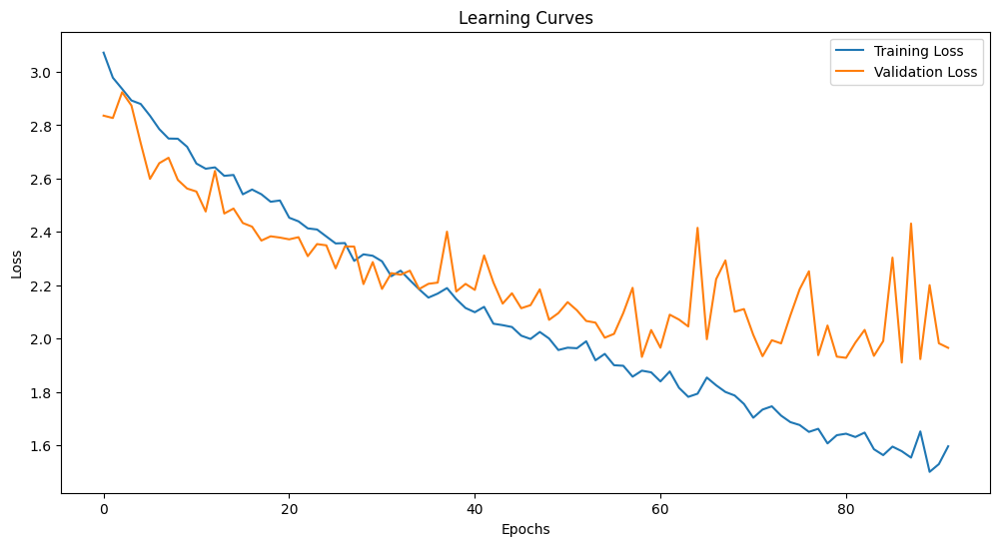

| Training Phase                         |   Lump Accuracy |   Size Accuracy |   Position Accuracy |
|:---------------------------------------|----------------:|----------------:|--------------------:|
| Initial Training                       |        0.820833 |        0.701389 |            0.629167 |
| Testing on doctors without fine-tuning |        0.527778 |        0.336806 |            0.496528 |
| Fine-tuning with 1 trials              |        0.579861 |        0.517361 |            0.5      |
| Fine-tuning with 2 trials              |        0.798611 |        0.548611 |            0.555556 |
| Fine-tuning with 3 trials              |        0.743056 |        0.444444 |            0.503472 |
| Fine-tuning with 4 trials              |        0.850694 |        0.625    |            0.572917 |
| Fine-tuning with 5 trials              |        0.833333 |        0.635417 |            0.607639 |

Running experiment with tips sensors and 5 seconds
Using 6 GPUs
Initial Training and Evalu

Epoch 1, Training Loss: 3.0518, Validation Loss: 3.0809


Epoch 2, Training Loss: 3.0004, Validation Loss: 2.8057


Epoch 3, Training Loss: 2.9368, Validation Loss: 2.8265


Epoch 4, Training Loss: 2.9137, Validation Loss: 2.7154


Epoch 5, Training Loss: 2.8802, Validation Loss: 2.7069


Epoch 6, Training Loss: 2.8498, Validation Loss: 2.8507


Epoch 7, Training Loss: 2.7983, Validation Loss: 2.7092


Epoch 8, Training Loss: 2.7815, Validation Loss: 2.6060


Epoch 9, Training Loss: 2.7850, Validation Loss: 2.6476


Epoch 10, Training Loss: 2.7264, Validation Loss: 2.5100


Epoch 11, Training Loss: 2.7163, Validation Loss: 2.5378


Epoch 12, Training Loss: 2.6949, Validation Loss: 2.5156


Epoch 13, Training Loss: 2.6539, Validation Loss: 2.6811


Epoch 14, Training Loss: 2.6746, Validation Loss: 2.5343


Epoch 15, Training Loss: 2.6152, Validation Loss: 2.5560
Early stopping at epoch 15


Test Accuracy - Lump: 0.7528, Size: 0.6056, Position: 0.5583

Confusion Matrix - Lump:
[[321  39]
 [139 221]]


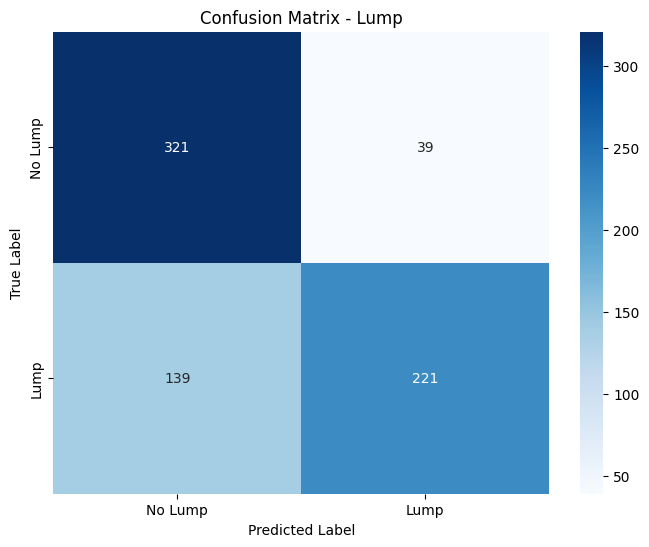


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.70      0.89      0.78       360
        Lump       0.85      0.61      0.71       360

    accuracy                           0.75       720
   macro avg       0.77      0.75      0.75       720
weighted avg       0.77      0.75      0.75       720


Confusion Matrix - Size:
[[ 57   5   3  55]
 [ 23  11  10  76]
 [  6   8  24  82]
 [  8   3   5 344]]


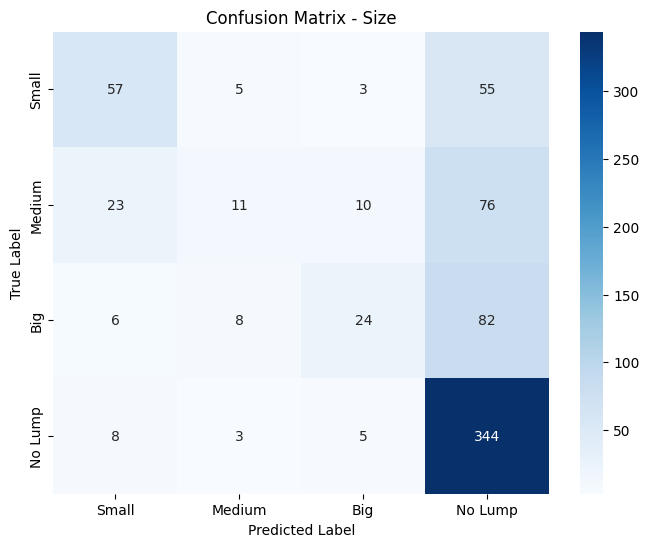


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.61      0.47      0.53       120
      Medium       0.41      0.09      0.15       120
         Big       0.57      0.20      0.30       120
     No Lump       0.62      0.96      0.75       360

    accuracy                           0.61       720
   macro avg       0.55      0.43      0.43       720
weighted avg       0.57      0.61      0.54       720


Confusion Matrix - Position:
[[ 12  10   9  89]
 [  7  21  13  79]
 [ 10  10  19  81]
 [  3   4   3 350]]


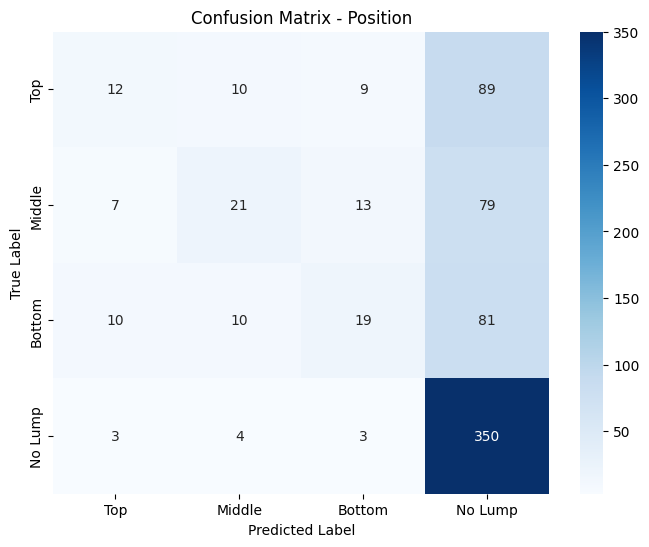


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.38      0.10      0.16       120
      Middle       0.47      0.17      0.25       120
      Bottom       0.43      0.16      0.23       120
     No Lump       0.58      0.97      0.73       360

    accuracy                           0.56       720
   macro avg       0.46      0.35      0.34       720
weighted avg       0.50      0.56      0.47       720


Testing on doctors' data without fine-tuning:


Test Accuracy - Lump: 0.7014, Size: 0.4722, Position: 0.4792

Confusion Matrix - Lump:
[[ 60  84]
 [  2 142]]


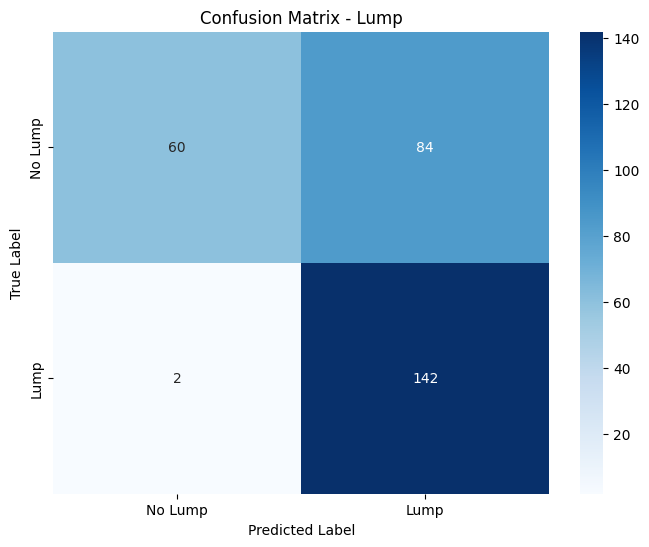


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.97      0.42      0.58       144
        Lump       0.63      0.99      0.77       144

    accuracy                           0.70       288
   macro avg       0.80      0.70      0.68       288
weighted avg       0.80      0.70      0.68       288


Confusion Matrix - Size:
[[  0  16   2  30]
 [  0   9   4  35]
 [  0  10   2  36]
 [  0   9  10 125]]


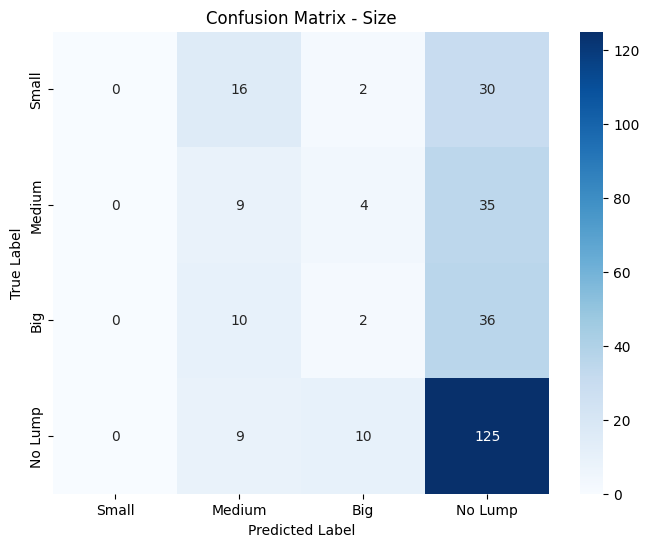


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.00      0.00      0.00        48
      Medium       0.20      0.19      0.20        48
         Big       0.11      0.04      0.06        48
     No Lump       0.55      0.87      0.68       144

    accuracy                           0.47       288
   macro avg       0.22      0.27      0.23       288
weighted avg       0.33      0.47      0.38       288


Confusion Matrix - Position:
[[  1   2   3  42]
 [  1   1   2  44]
 [  0   1   1  46]
 [  1   0   8 135]]


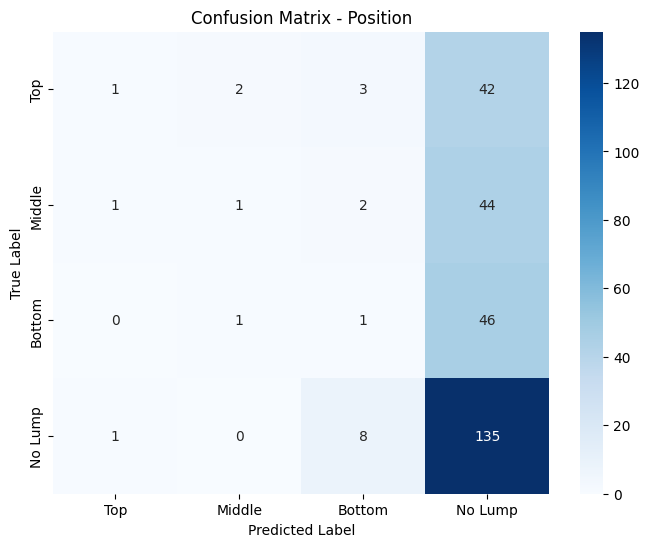


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.33      0.02      0.04        48
      Middle       0.25      0.02      0.04        48
      Bottom       0.07      0.02      0.03        48
     No Lump       0.51      0.94      0.66       144

    accuracy                           0.48       288
   macro avg       0.29      0.25      0.19       288
weighted avg       0.36      0.48      0.35       288


Fine-tuning with 1 additional trials from new dataset


Epoch 1, Training Loss: 2.6127, Validation Loss: 2.4925


Epoch 2, Training Loss: 2.5859, Validation Loss: 2.4197


Epoch 3, Training Loss: 2.5801, Validation Loss: 2.5365


Epoch 4, Training Loss: 2.5642, Validation Loss: 2.4090


Epoch 5, Training Loss: 2.5372, Validation Loss: 2.3781


Epoch 6, Training Loss: 2.4914, Validation Loss: 2.3278


Epoch 7, Training Loss: 2.4451, Validation Loss: 2.3316


Epoch 8, Training Loss: 2.4199, Validation Loss: 2.2702


Epoch 9, Training Loss: 2.4024, Validation Loss: 2.4971


Epoch 10, Training Loss: 2.3920, Validation Loss: 2.4747


Epoch 11, Training Loss: 2.3696, Validation Loss: 2.2974


Epoch 12, Training Loss: 2.3791, Validation Loss: 2.3151


Epoch 13, Training Loss: 2.3306, Validation Loss: 2.2192


Epoch 14, Training Loss: 2.3943, Validation Loss: 2.2437


Epoch 15, Training Loss: 2.3759, Validation Loss: 2.3595


Epoch 16, Training Loss: 2.3051, Validation Loss: 2.2937


Epoch 17, Training Loss: 2.2356, Validation Loss: 2.1751


Epoch 18, Training Loss: 2.2786, Validation Loss: 2.2329


Epoch 19, Training Loss: 2.2480, Validation Loss: 2.2689


Epoch 20, Training Loss: 2.1854, Validation Loss: 2.2292


Epoch 21, Training Loss: 2.2283, Validation Loss: 2.1009


Epoch 22, Training Loss: 2.2076, Validation Loss: 2.4256


Epoch 23, Training Loss: 2.1602, Validation Loss: 2.1985


Epoch 24, Training Loss: 2.1277, Validation Loss: 2.2218


Epoch 25, Training Loss: 2.1325, Validation Loss: 2.2990


Epoch 26, Training Loss: 2.1088, Validation Loss: 2.1494
Early stopping at epoch 26


Test Accuracy - Lump: 0.7569, Size: 0.5174, Position: 0.5139

Confusion Matrix - Lump:
[[118  26]
 [ 44 100]]


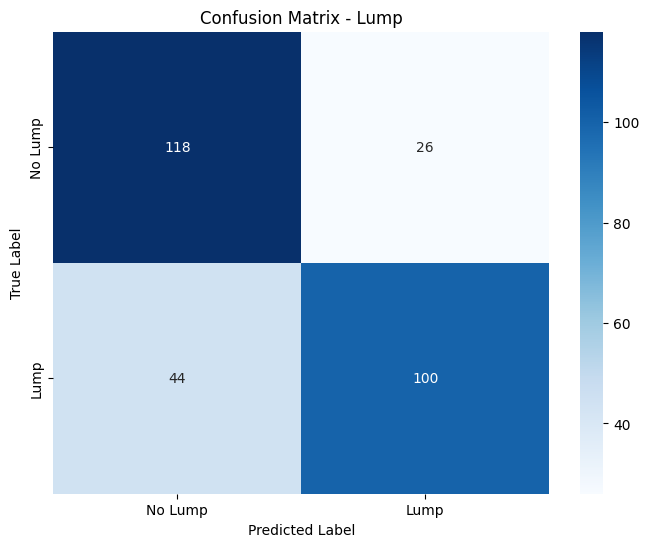


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.73      0.82      0.77       144
        Lump       0.79      0.69      0.74       144

    accuracy                           0.76       288
   macro avg       0.76      0.76      0.76       288
weighted avg       0.76      0.76      0.76       288


Confusion Matrix - Size:
[[  6  14   2  26]
 [  2  14   5  27]
 [  0  17   1  30]
 [  0  12   4 128]]


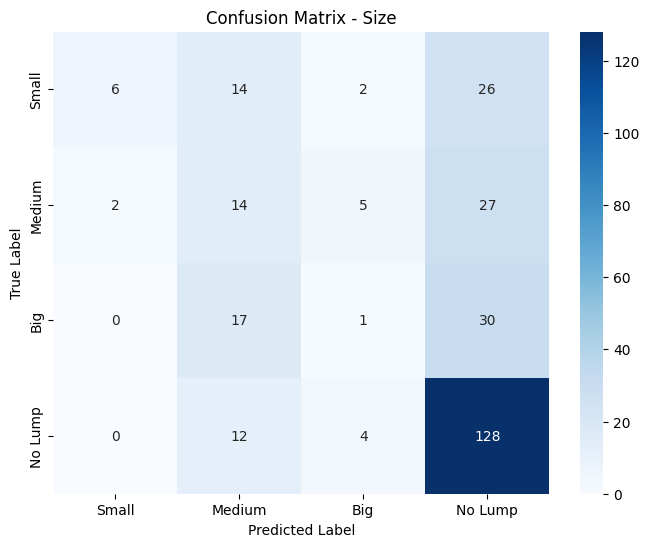


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.75      0.12      0.21        48
      Medium       0.25      0.29      0.27        48
         Big       0.08      0.02      0.03        48
     No Lump       0.61      0.89      0.72       144

    accuracy                           0.52       288
   macro avg       0.42      0.33      0.31       288
weighted avg       0.48      0.52      0.45       288


Confusion Matrix - Position:
[[  0  23   4  21]
 [  0  15   0  33]
 [  0  12   2  34]
 [  0  13   0 131]]


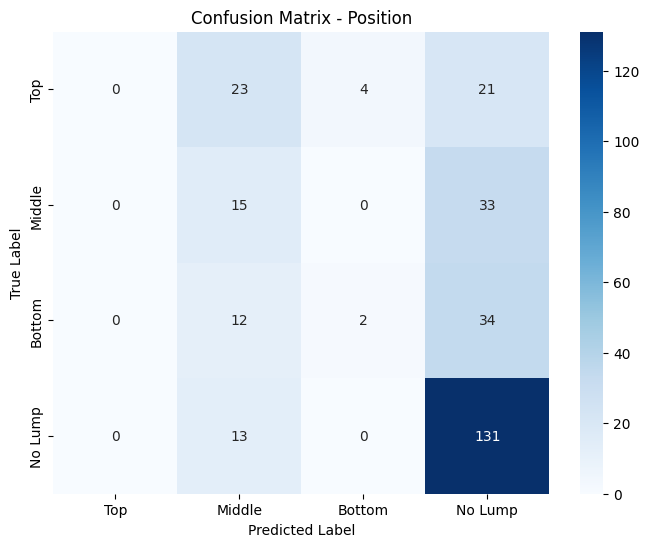


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.00      0.00      0.00        48
      Middle       0.24      0.31      0.27        48
      Bottom       0.33      0.04      0.07        48
     No Lump       0.60      0.91      0.72       144

    accuracy                           0.51       288
   macro avg       0.29      0.32      0.27       288
weighted avg       0.39      0.51      0.42       288


Fine-tuning with 2 additional trials from new dataset


Epoch 1, Training Loss: 2.1186, Validation Loss: 2.1354


Epoch 2, Training Loss: 2.0651, Validation Loss: 2.2443


Epoch 3, Training Loss: 2.0667, Validation Loss: 2.1730


Epoch 4, Training Loss: 2.0110, Validation Loss: 2.3562


Epoch 5, Training Loss: 2.0677, Validation Loss: 2.1572
Early stopping at epoch 5


Test Accuracy - Lump: 0.7569, Size: 0.5556, Position: 0.5278

Confusion Matrix - Lump:
[[120  24]
 [ 46  98]]


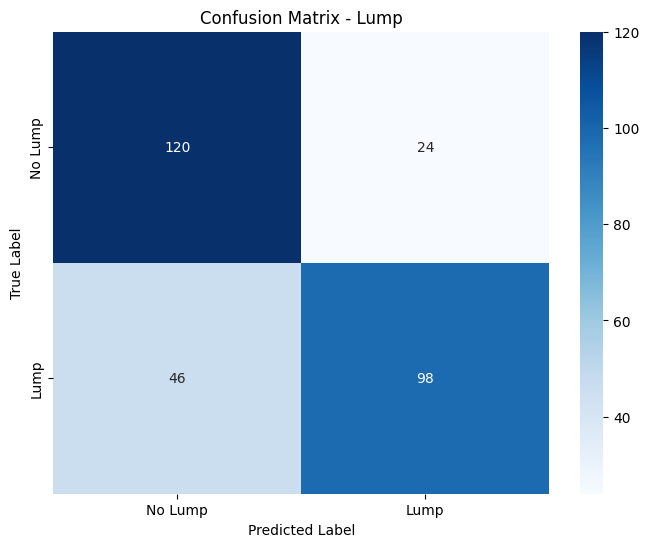


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.72      0.83      0.77       144
        Lump       0.80      0.68      0.74       144

    accuracy                           0.76       288
   macro avg       0.76      0.76      0.76       288
weighted avg       0.76      0.76      0.76       288


Confusion Matrix - Size:
[[ 13   5   0  30]
 [  9   5   1  33]
 [  3  10   0  35]
 [  0   1   1 142]]


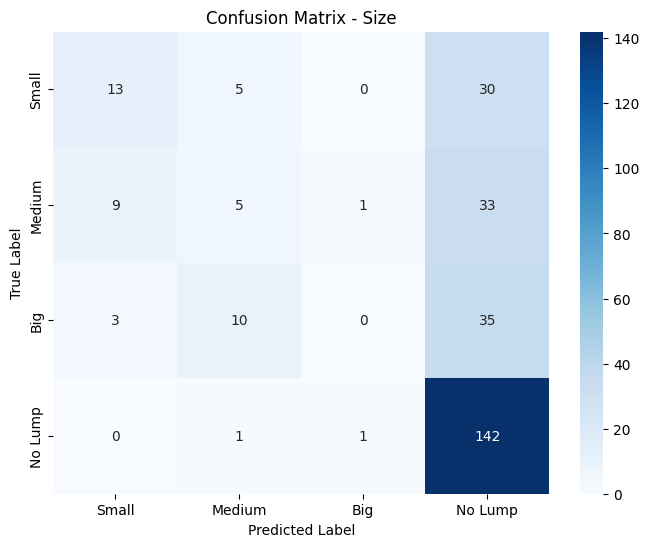


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.52      0.27      0.36        48
      Medium       0.24      0.10      0.14        48
         Big       0.00      0.00      0.00        48
     No Lump       0.59      0.99      0.74       144

    accuracy                           0.56       288
   macro avg       0.34      0.34      0.31       288
weighted avg       0.42      0.56      0.45       288


Confusion Matrix - Position:
[[  0  22   3  23]
 [  0   9   0  39]
 [  0  11   0  37]
 [  0   1   0 143]]


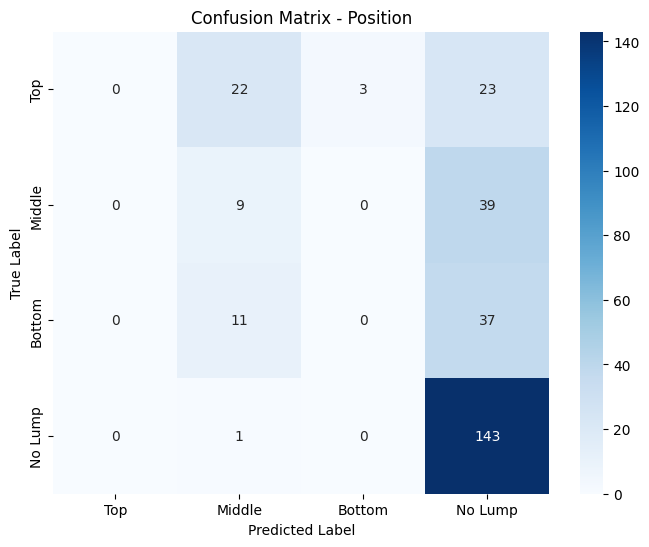


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.00      0.00      0.00        48
      Middle       0.21      0.19      0.20        48
      Bottom       0.00      0.00      0.00        48
     No Lump       0.59      0.99      0.74       144

    accuracy                           0.53       288
   macro avg       0.20      0.30      0.23       288
weighted avg       0.33      0.53      0.40       288


Fine-tuning with 3 additional trials from new dataset


Epoch 1, Training Loss: 2.0685, Validation Loss: 2.1550


Epoch 2, Training Loss: 2.0222, Validation Loss: 2.1128


Epoch 3, Training Loss: 2.0283, Validation Loss: 2.1562


Epoch 4, Training Loss: 1.9905, Validation Loss: 2.3317


Epoch 5, Training Loss: 2.0006, Validation Loss: 2.1611
Early stopping at epoch 5


Test Accuracy - Lump: 0.7604, Size: 0.5174, Position: 0.5208

Confusion Matrix - Lump:
[[ 76  68]
 [  1 143]]


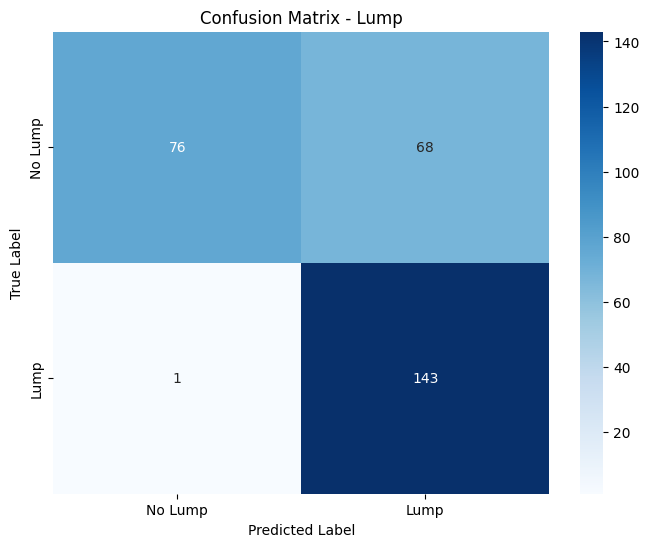


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.99      0.53      0.69       144
        Lump       0.68      0.99      0.81       144

    accuracy                           0.76       288
   macro avg       0.83      0.76      0.75       288
weighted avg       0.83      0.76      0.75       288


Confusion Matrix - Size:
[[ 41   6   1   0]
 [ 40   7   1   0]
 [ 31   8   0   9]
 [ 21  17   5 101]]


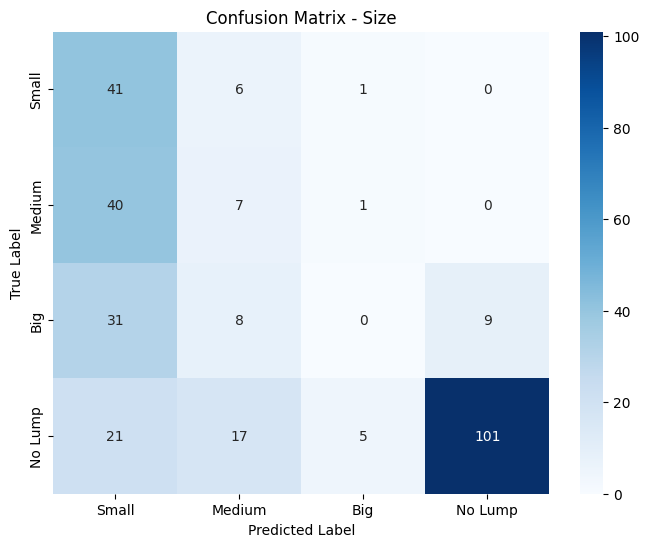


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.31      0.85      0.45        48
      Medium       0.18      0.15      0.16        48
         Big       0.00      0.00      0.00        48
     No Lump       0.92      0.70      0.80       144

    accuracy                           0.52       288
   macro avg       0.35      0.43      0.35       288
weighted avg       0.54      0.52      0.50       288


Confusion Matrix - Position:
[[  1  39   8   0]
 [  2  37   9   0]
 [  3  30   7   8]
 [  2  28   9 105]]


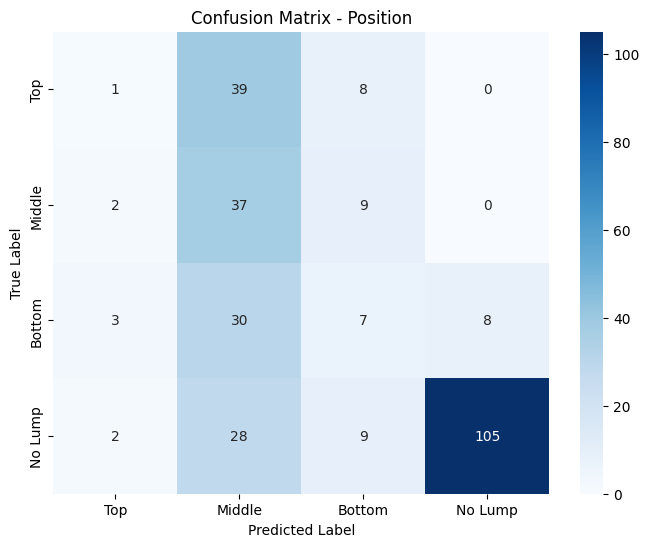


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.12      0.02      0.04        48
      Middle       0.28      0.77      0.41        48
      Bottom       0.21      0.15      0.17        48
     No Lump       0.93      0.73      0.82       144

    accuracy                           0.52       288
   macro avg       0.39      0.42      0.36       288
weighted avg       0.57      0.52      0.51       288


Fine-tuning with 4 additional trials from new dataset


Epoch 1, Training Loss: 1.9563, Validation Loss: 2.1962


Epoch 2, Training Loss: 1.9246, Validation Loss: 2.2876


Epoch 3, Training Loss: 1.9357, Validation Loss: 2.1484


Epoch 4, Training Loss: 1.8911, Validation Loss: 1.9532


Epoch 5, Training Loss: 1.9114, Validation Loss: 2.1237


Epoch 6, Training Loss: 1.9499, Validation Loss: 2.1040


Epoch 7, Training Loss: 1.8609, Validation Loss: 2.0740


Epoch 8, Training Loss: 1.8565, Validation Loss: 1.9687


Epoch 9, Training Loss: 1.8424, Validation Loss: 1.9905
Early stopping at epoch 9


Test Accuracy - Lump: 0.8229, Size: 0.5521, Position: 0.6146

Confusion Matrix - Lump:
[[104  40]
 [ 11 133]]


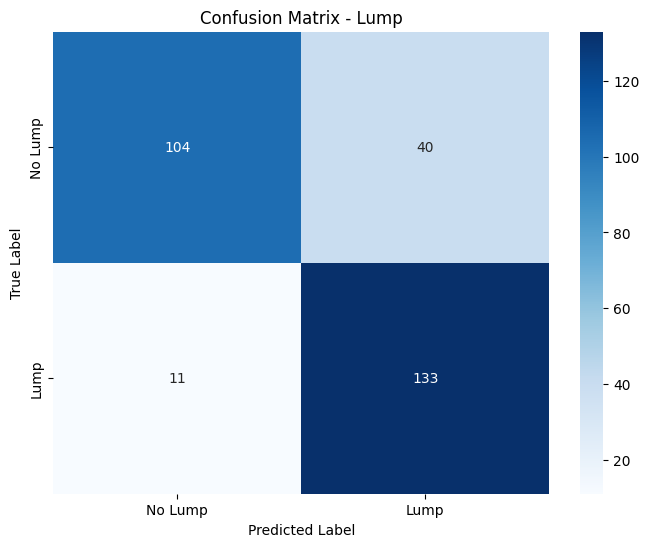


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.90      0.72      0.80       144
        Lump       0.77      0.92      0.84       144

    accuracy                           0.82       288
   macro avg       0.84      0.82      0.82       288
weighted avg       0.84      0.82      0.82       288


Confusion Matrix - Size:
[[  6  37   3   2]
 [  6  40   1   1]
 [  3  27   0  18]
 [  1   7  23 113]]


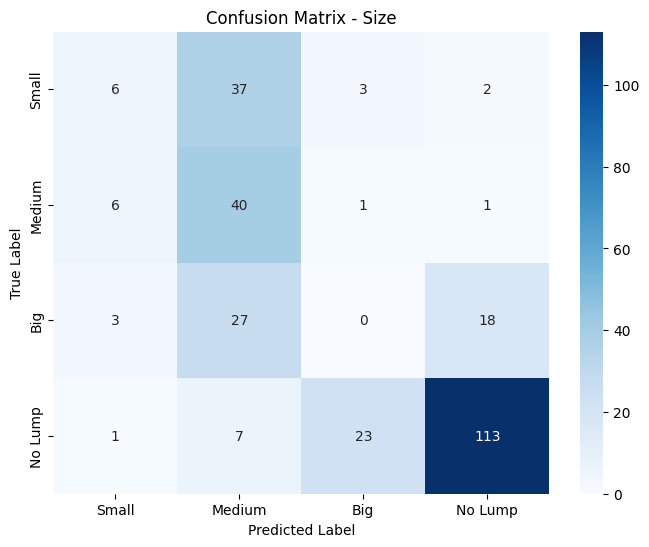


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.38      0.12      0.19        48
      Medium       0.36      0.83      0.50        48
         Big       0.00      0.00      0.00        48
     No Lump       0.84      0.78      0.81       144

    accuracy                           0.55       288
   macro avg       0.39      0.44      0.38       288
weighted avg       0.54      0.55      0.52       288


Confusion Matrix - Position:
[[  0   9  37   2]
 [  0  12  27   9]
 [  0   7  27  14]
 [  1   1   4 138]]


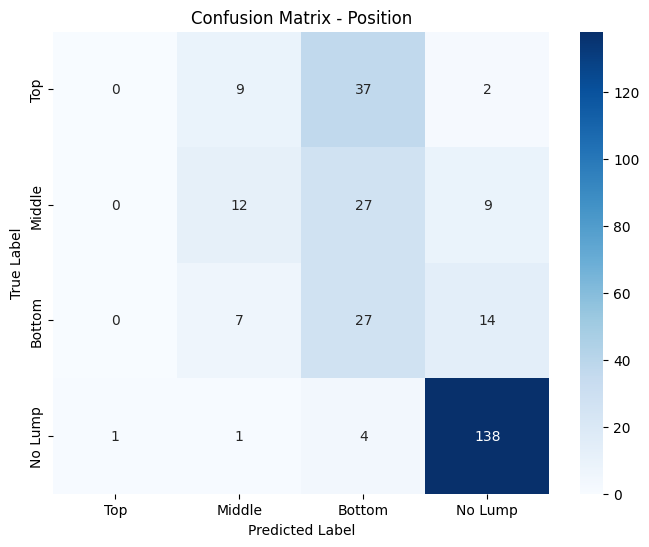


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.00      0.00      0.00        48
      Middle       0.41      0.25      0.31        48
      Bottom       0.28      0.56      0.38        48
     No Lump       0.85      0.96      0.90       144

    accuracy                           0.61       288
   macro avg       0.39      0.44      0.40       288
weighted avg       0.54      0.61      0.56       288


Fine-tuning with 5 additional trials from new dataset


Epoch 1, Training Loss: 1.8307, Validation Loss: 2.0986


Epoch 2, Training Loss: 1.8396, Validation Loss: 1.9595


Epoch 3, Training Loss: 1.8242, Validation Loss: 2.3379


Epoch 4, Training Loss: 1.8324, Validation Loss: 2.0910


Epoch 5, Training Loss: 1.8228, Validation Loss: 2.0386
Early stopping at epoch 5


Test Accuracy - Lump: 0.8368, Size: 0.6806, Position: 0.5833

Confusion Matrix - Lump:
[[109  35]
 [ 12 132]]


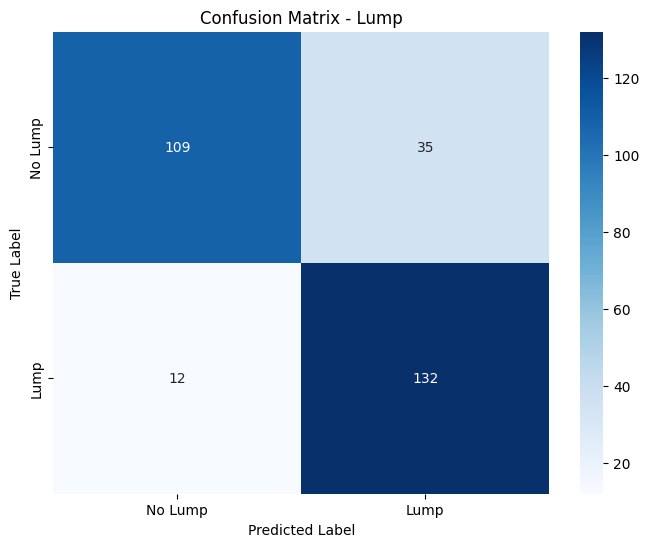


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.90      0.76      0.82       144
        Lump       0.79      0.92      0.85       144

    accuracy                           0.84       288
   macro avg       0.85      0.84      0.84       288
weighted avg       0.85      0.84      0.84       288


Confusion Matrix - Size:
[[ 31  15   1   1]
 [ 11  35   1   1]
 [ 18  10   2  18]
 [  6  10   0 128]]


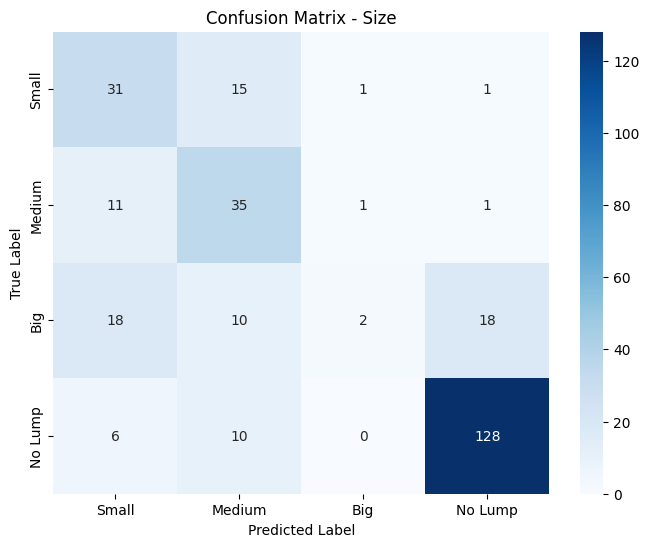


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.47      0.65      0.54        48
      Medium       0.50      0.73      0.59        48
         Big       0.50      0.04      0.08        48
     No Lump       0.86      0.89      0.88       144

    accuracy                           0.68       288
   macro avg       0.58      0.58      0.52       288
weighted avg       0.68      0.68      0.64       288


Confusion Matrix - Position:
[[  0   8  38   2]
 [  0   6  37   5]
 [  0   1  33  14]
 [  1   0  14 129]]


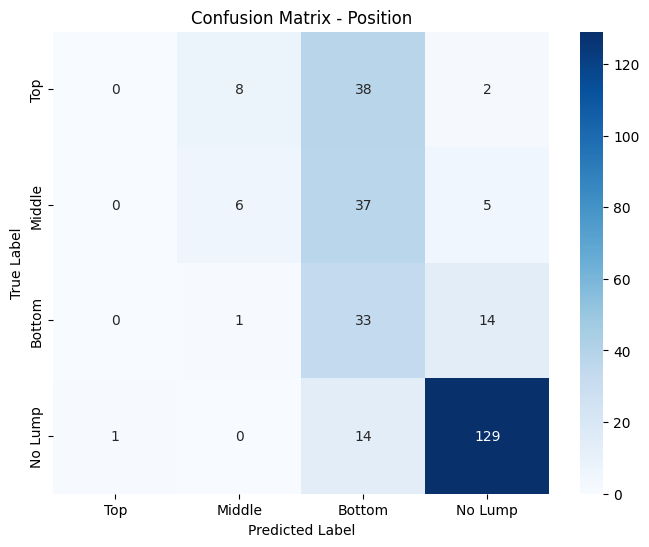


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.00      0.00      0.00        48
      Middle       0.40      0.12      0.19        48
      Bottom       0.27      0.69      0.39        48
     No Lump       0.86      0.90      0.88       144

    accuracy                           0.58       288
   macro avg       0.38      0.43      0.36       288
weighted avg       0.54      0.58      0.54       288



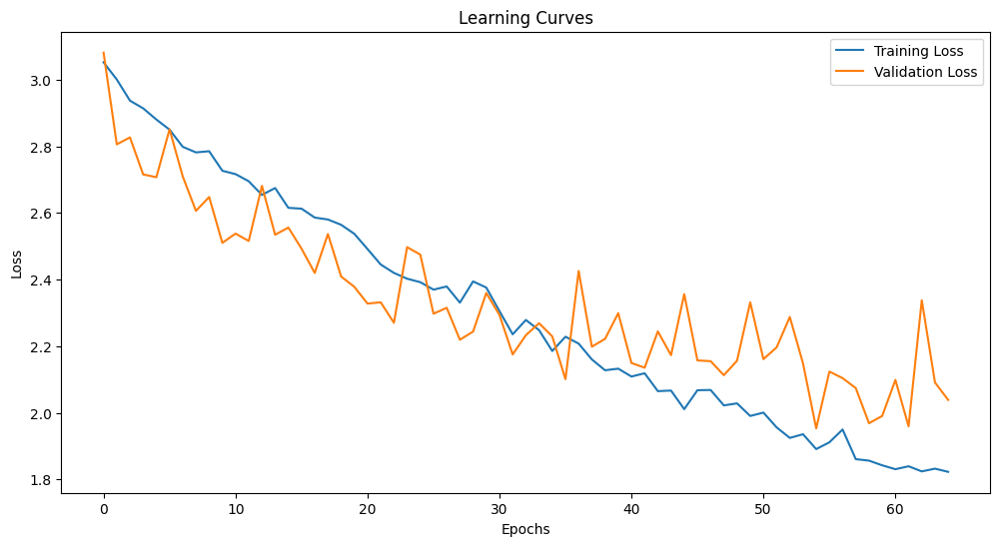

| Training Phase                         |   Lump Accuracy |   Size Accuracy |   Position Accuracy |
|:---------------------------------------|----------------:|----------------:|--------------------:|
| Initial Training                       |        0.752778 |        0.605556 |            0.558333 |
| Testing on doctors without fine-tuning |        0.701389 |        0.472222 |            0.479167 |
| Fine-tuning with 1 trials              |        0.756944 |        0.517361 |            0.513889 |
| Fine-tuning with 2 trials              |        0.756944 |        0.555556 |            0.527778 |
| Fine-tuning with 3 trials              |        0.760417 |        0.517361 |            0.520833 |
| Fine-tuning with 4 trials              |        0.822917 |        0.552083 |            0.614583 |
| Fine-tuning with 5 trials              |        0.836806 |        0.680556 |            0.583333 |

Running experiment with tips sensors and 6 seconds
Using 6 GPUs
Initial Training and Evalu

Epoch 1, Training Loss: 3.0671, Validation Loss: 3.2389


Epoch 2, Training Loss: 2.9738, Validation Loss: 3.0436


Epoch 3, Training Loss: 2.9417, Validation Loss: 2.7819


Epoch 4, Training Loss: 2.9206, Validation Loss: 2.8684


Epoch 5, Training Loss: 2.9037, Validation Loss: 2.8024


Epoch 6, Training Loss: 2.8725, Validation Loss: 2.7852


Epoch 7, Training Loss: 2.8266, Validation Loss: 2.6689


Epoch 8, Training Loss: 2.8157, Validation Loss: 2.7518


Epoch 9, Training Loss: 2.7708, Validation Loss: 2.6126


Epoch 10, Training Loss: 2.7151, Validation Loss: 2.6474


Epoch 11, Training Loss: 2.7025, Validation Loss: 2.4988


Epoch 12, Training Loss: 2.6722, Validation Loss: 2.5212


Epoch 13, Training Loss: 2.6542, Validation Loss: 2.6238


Epoch 14, Training Loss: 2.6629, Validation Loss: 2.5589


Epoch 15, Training Loss: 2.6015, Validation Loss: 2.4509


Epoch 16, Training Loss: 2.6205, Validation Loss: 2.4844


Epoch 17, Training Loss: 2.5873, Validation Loss: 2.7009


Epoch 18, Training Loss: 2.5572, Validation Loss: 2.3435


Epoch 19, Training Loss: 2.5250, Validation Loss: 2.3957


Epoch 20, Training Loss: 2.5295, Validation Loss: 2.3704


Epoch 21, Training Loss: 2.4889, Validation Loss: 2.3796


Epoch 22, Training Loss: 2.4892, Validation Loss: 2.4006


Epoch 23, Training Loss: 2.4668, Validation Loss: 2.3660
Early stopping at epoch 23


Test Accuracy - Lump: 0.7722, Size: 0.6208, Position: 0.5597

Confusion Matrix - Lump:
[[310  50]
 [114 246]]


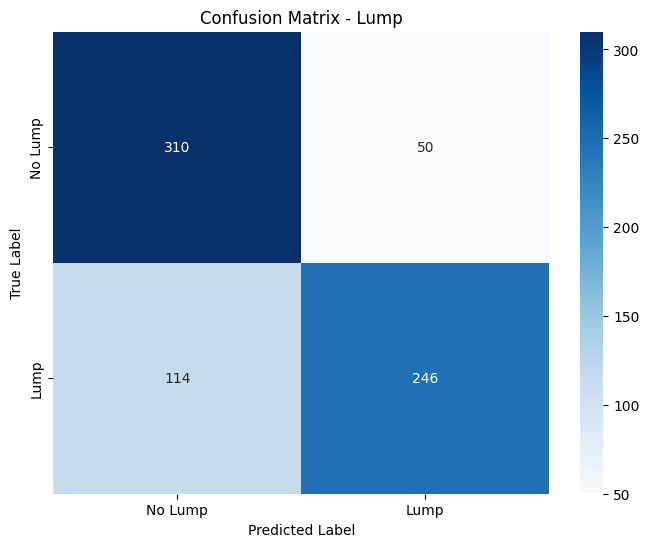


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.73      0.86      0.79       360
        Lump       0.83      0.68      0.75       360

    accuracy                           0.77       720
   macro avg       0.78      0.77      0.77       720
weighted avg       0.78      0.77      0.77       720


Confusion Matrix - Size:
[[ 58  14   0  48]
 [ 26  26  11  57]
 [  8  11  29  72]
 [ 16   2   8 334]]


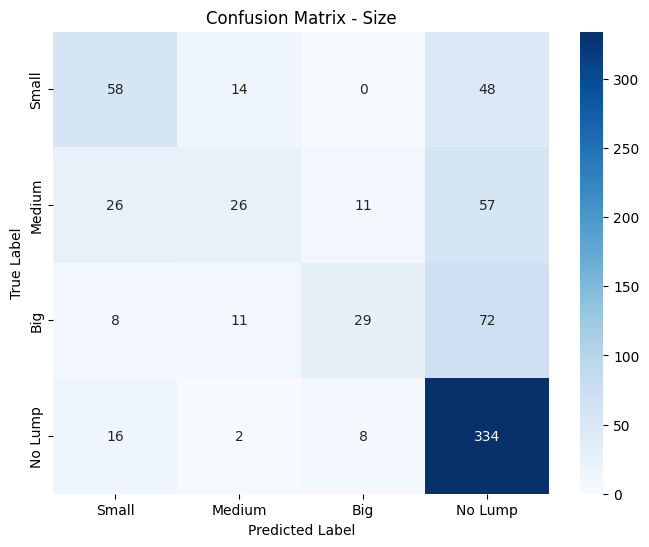


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.54      0.48      0.51       120
      Medium       0.49      0.22      0.30       120
         Big       0.60      0.24      0.35       120
     No Lump       0.65      0.93      0.77       360

    accuracy                           0.62       720
   macro avg       0.57      0.47      0.48       720
weighted avg       0.60      0.62      0.58       720


Confusion Matrix - Position:
[[ 10  17  20  73]
 [  1  21  23  75]
 [  1  22  27  70]
 [  3   5   7 345]]


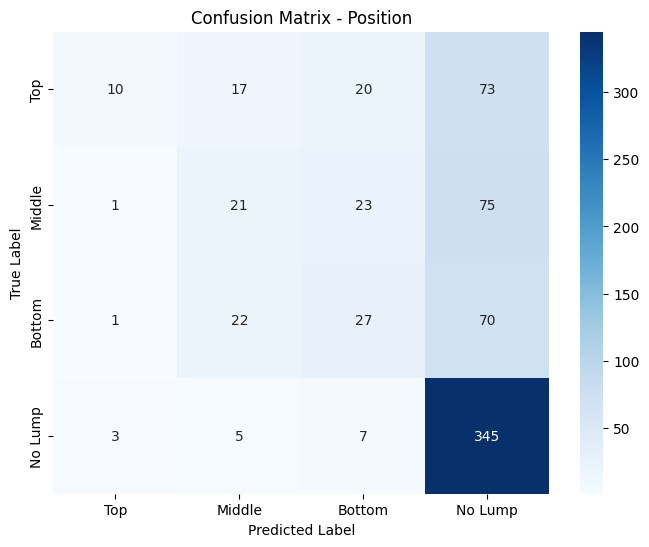


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.67      0.08      0.15       120
      Middle       0.32      0.17      0.23       120
      Bottom       0.35      0.23      0.27       120
     No Lump       0.61      0.96      0.75       360

    accuracy                           0.56       720
   macro avg       0.49      0.36      0.35       720
weighted avg       0.53      0.56      0.48       720


Testing on doctors' data without fine-tuning:


Test Accuracy - Lump: 0.5000, Size: 0.1632, Position: 0.1701

Confusion Matrix - Lump:
[[  0 144]
 [  0 144]]


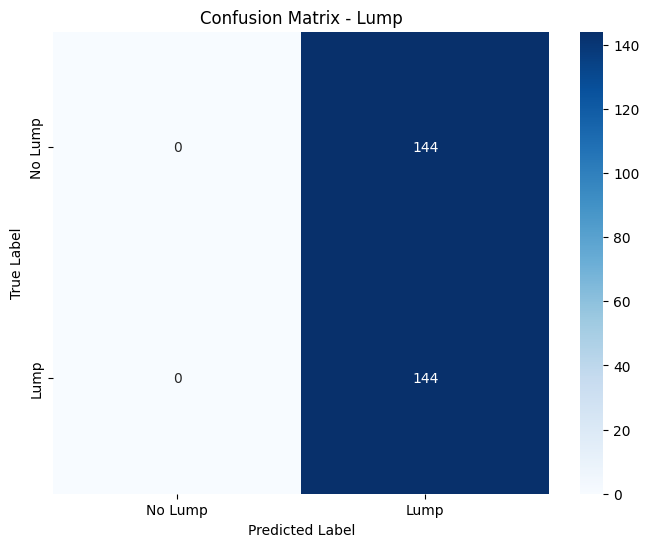


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.00      0.00      0.00       144
        Lump       0.50      1.00      0.67       144

    accuracy                           0.50       288
   macro avg       0.25      0.50      0.33       288
weighted avg       0.25      0.50      0.33       288


Confusion Matrix - Size:
[[ 0 48  0  0]
 [ 0 47  1  0]
 [ 0 48  0  0]
 [ 0 78 66  0]]


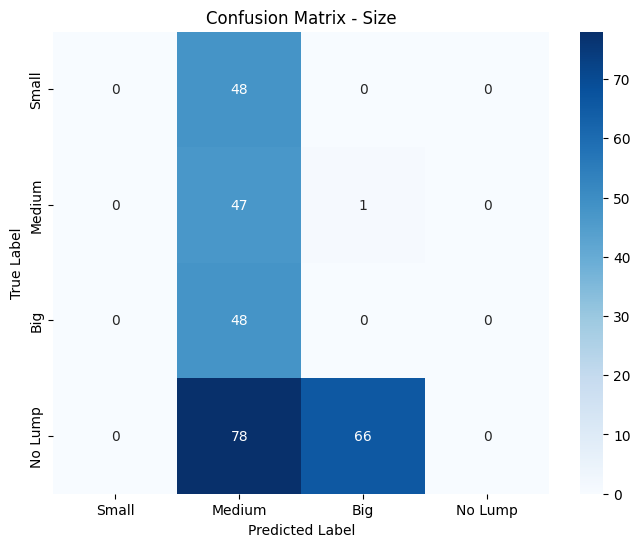


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.00      0.00      0.00        48
      Medium       0.21      0.98      0.35        48
         Big       0.00      0.00      0.00        48
     No Lump       0.00      0.00      0.00       144

    accuracy                           0.16       288
   macro avg       0.05      0.24      0.09       288
weighted avg       0.04      0.16      0.06       288


Confusion Matrix - Position:
[[  0   4  44   0]
 [  0   1  47   0]
 [  0   0  48   0]
 [  0   1 143   0]]


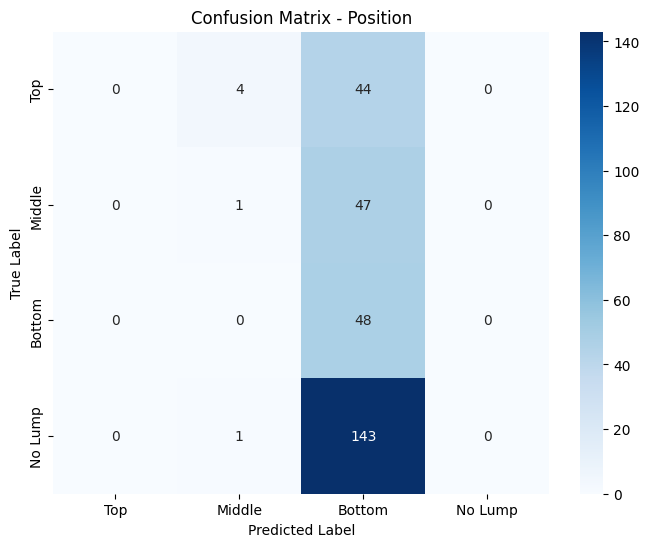


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.00      0.00      0.00        48
      Middle       0.17      0.02      0.04        48
      Bottom       0.17      1.00      0.29        48
     No Lump       0.00      0.00      0.00       144

    accuracy                           0.17       288
   macro avg       0.08      0.26      0.08       288
weighted avg       0.06      0.17      0.05       288


Fine-tuning with 1 additional trials from new dataset


Epoch 1, Training Loss: 2.4740, Validation Loss: 2.5182


Epoch 2, Training Loss: 2.4317, Validation Loss: 2.4454


Epoch 3, Training Loss: 2.4255, Validation Loss: 2.7937


Epoch 4, Training Loss: 2.3914, Validation Loss: 2.2723


Epoch 5, Training Loss: 2.3456, Validation Loss: 2.2983


Epoch 6, Training Loss: 2.3817, Validation Loss: 2.1908


Epoch 7, Training Loss: 2.3641, Validation Loss: 2.2052


Epoch 8, Training Loss: 2.3601, Validation Loss: 2.5034


Epoch 9, Training Loss: 2.3267, Validation Loss: 2.4820


Epoch 10, Training Loss: 2.2893, Validation Loss: 2.2976


Epoch 11, Training Loss: 2.3345, Validation Loss: 2.3044
Early stopping at epoch 11


Test Accuracy - Lump: 0.8194, Size: 0.4792, Position: 0.5278

Confusion Matrix - Lump:
[[111  33]
 [ 19 125]]


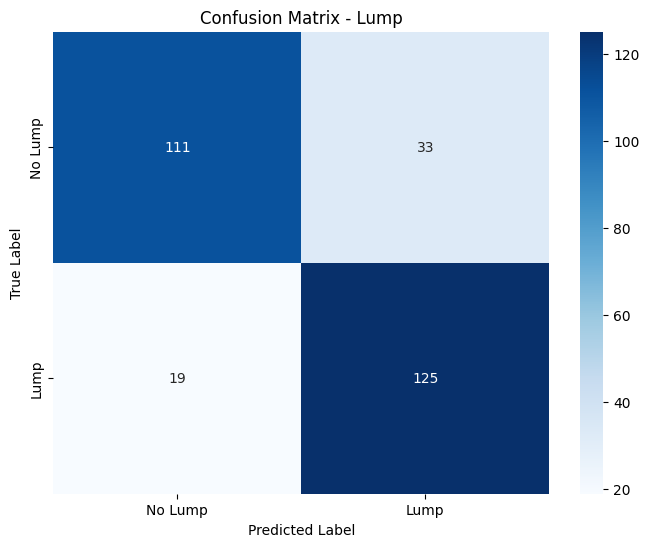


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.85      0.77      0.81       144
        Lump       0.79      0.87      0.83       144

    accuracy                           0.82       288
   macro avg       0.82      0.82      0.82       288
weighted avg       0.82      0.82      0.82       288


Confusion Matrix - Size:
[[ 0 41  0  7]
 [ 0 39  0  9]
 [ 0 34  0 14]
 [ 0 28 17 99]]


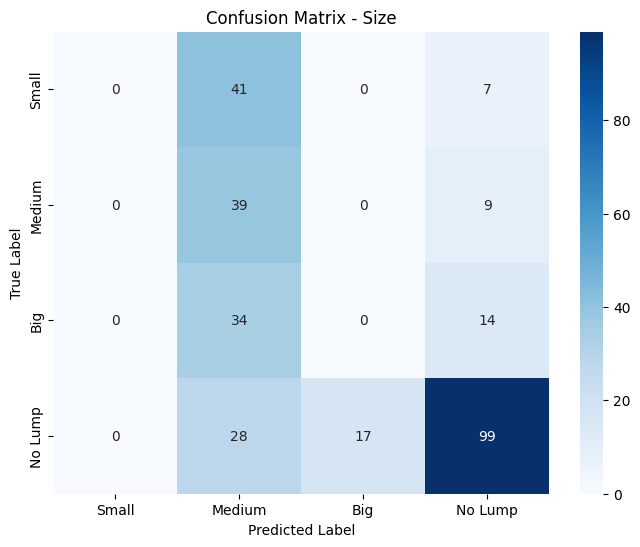


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.00      0.00      0.00        48
      Medium       0.27      0.81      0.41        48
         Big       0.00      0.00      0.00        48
     No Lump       0.77      0.69      0.73       144

    accuracy                           0.48       288
   macro avg       0.26      0.38      0.28       288
weighted avg       0.43      0.48      0.43       288


Confusion Matrix - Position:
[[  0  21  15  12]
 [  0  20   4  24]
 [  0  14   6  28]
 [  0   4  14 126]]


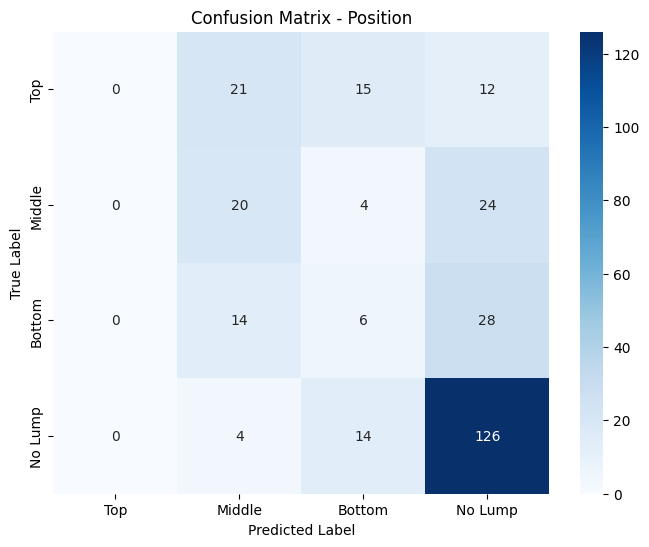


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.00      0.00      0.00        48
      Middle       0.34      0.42      0.37        48
      Bottom       0.15      0.12      0.14        48
     No Lump       0.66      0.88      0.75       144

    accuracy                           0.53       288
   macro avg       0.29      0.35      0.32       288
weighted avg       0.41      0.53      0.46       288


Fine-tuning with 2 additional trials from new dataset


Epoch 1, Training Loss: 2.2436, Validation Loss: 2.2714


Epoch 2, Training Loss: 2.2042, Validation Loss: 2.2032


Epoch 3, Training Loss: 2.2335, Validation Loss: 2.3698


Epoch 4, Training Loss: 2.1999, Validation Loss: 2.3498


Epoch 5, Training Loss: 2.2286, Validation Loss: 2.2228
Early stopping at epoch 5


Test Accuracy - Lump: 0.7396, Size: 0.5069, Position: 0.5139

Confusion Matrix - Lump:
[[ 70  74]
 [  1 143]]


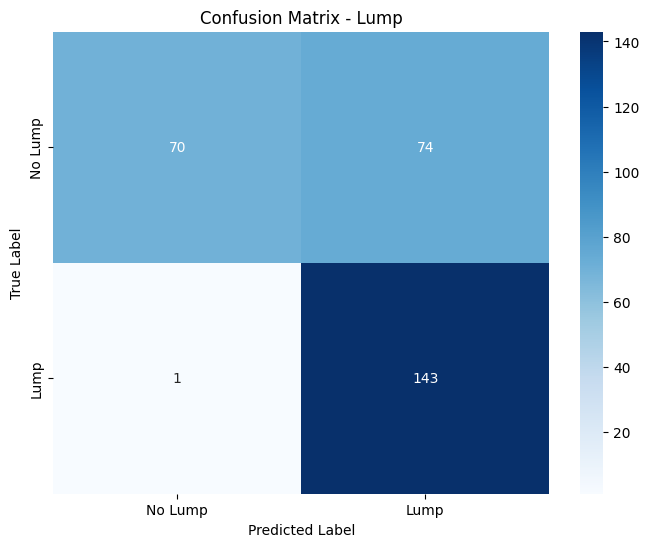


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.99      0.49      0.65       144
        Lump       0.66      0.99      0.79       144

    accuracy                           0.74       288
   macro avg       0.82      0.74      0.72       288
weighted avg       0.82      0.74      0.72       288


Confusion Matrix - Size:
[[ 2 43  0  3]
 [ 0 46  0  2]
 [ 0 47  0  1]
 [ 0 45  1 98]]


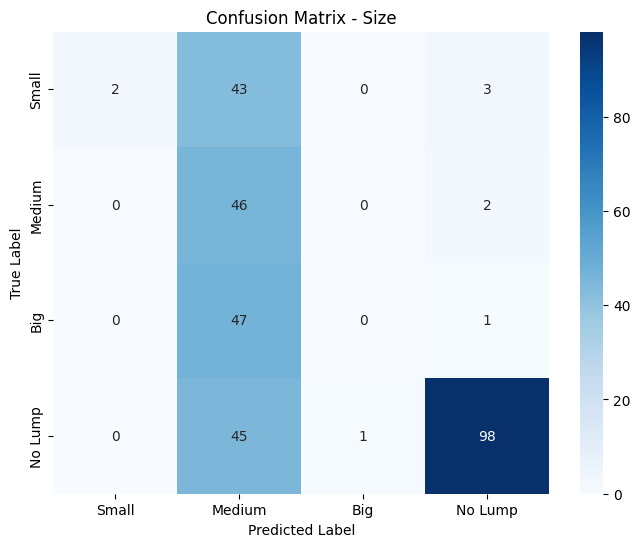


Classification Report - Size:
              precision    recall  f1-score   support

       Small       1.00      0.04      0.08        48
      Medium       0.25      0.96      0.40        48
         Big       0.00      0.00      0.00        48
     No Lump       0.94      0.68      0.79       144

    accuracy                           0.51       288
   macro avg       0.55      0.42      0.32       288
weighted avg       0.68      0.51      0.48       288


Confusion Matrix - Position:
[[  0  42   1   5]
 [  0  34   6   8]
 [  0  32   5  11]
 [  0  18  17 109]]


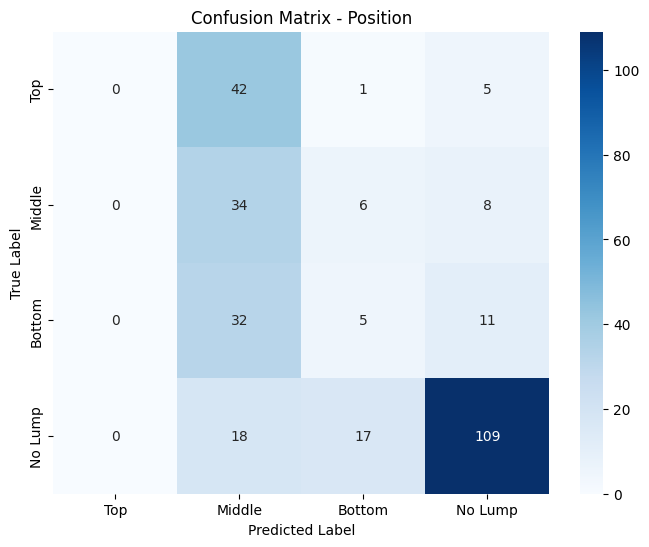


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.00      0.00      0.00        48
      Middle       0.27      0.71      0.39        48
      Bottom       0.17      0.10      0.13        48
     No Lump       0.82      0.76      0.79       144

    accuracy                           0.51       288
   macro avg       0.32      0.39      0.33       288
weighted avg       0.48      0.51      0.48       288


Fine-tuning with 3 additional trials from new dataset


Epoch 1, Training Loss: 2.2240, Validation Loss: 2.4318


Epoch 2, Training Loss: 2.1750, Validation Loss: 2.1712


Epoch 3, Training Loss: 2.1294, Validation Loss: 2.1586


Epoch 4, Training Loss: 2.1459, Validation Loss: 2.1738


Epoch 5, Training Loss: 2.1571, Validation Loss: 2.2608


Epoch 6, Training Loss: 2.1104, Validation Loss: 2.2745


Epoch 7, Training Loss: 2.1098, Validation Loss: 2.1751


Epoch 8, Training Loss: 2.0916, Validation Loss: 2.1080


Epoch 9, Training Loss: 2.0562, Validation Loss: 2.1415


Epoch 10, Training Loss: 2.0354, Validation Loss: 2.0917


Epoch 11, Training Loss: 2.0379, Validation Loss: 2.0359


Epoch 12, Training Loss: 2.0090, Validation Loss: 2.0425


Epoch 13, Training Loss: 2.0179, Validation Loss: 2.1374


Epoch 14, Training Loss: 2.0284, Validation Loss: 2.0211


Epoch 15, Training Loss: 2.0038, Validation Loss: 2.0208


Epoch 16, Training Loss: 1.9756, Validation Loss: 2.0981


Epoch 17, Training Loss: 1.9492, Validation Loss: 2.0132


Epoch 18, Training Loss: 1.9431, Validation Loss: 2.0162


Epoch 19, Training Loss: 1.9595, Validation Loss: 2.0866


Epoch 20, Training Loss: 1.9599, Validation Loss: 1.9968


Epoch 21, Training Loss: 1.8723, Validation Loss: 2.0379


Epoch 22, Training Loss: 1.9246, Validation Loss: 2.1322


Epoch 23, Training Loss: 1.8997, Validation Loss: 2.0128


Epoch 24, Training Loss: 1.9292, Validation Loss: 2.0931


Epoch 25, Training Loss: 1.8562, Validation Loss: 1.9550


Epoch 26, Training Loss: 1.8543, Validation Loss: 2.2403


Epoch 27, Training Loss: 1.8425, Validation Loss: 2.0569


Epoch 28, Training Loss: 1.8572, Validation Loss: 1.9320


Epoch 29, Training Loss: 1.7639, Validation Loss: 2.0200


Epoch 30, Training Loss: 1.7719, Validation Loss: 2.0775


Epoch 31, Training Loss: 1.7948, Validation Loss: 2.0431


Epoch 32, Training Loss: 1.7295, Validation Loss: 2.1755


Epoch 33, Training Loss: 1.7712, Validation Loss: 2.4482
Early stopping at epoch 33


Test Accuracy - Lump: 0.8403, Size: 0.5799, Position: 0.6076

Confusion Matrix - Lump:
[[136   8]
 [ 38 106]]


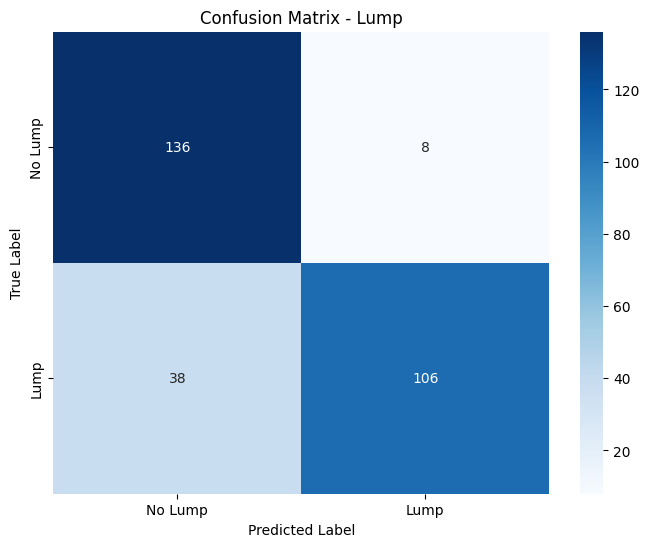


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.78      0.94      0.86       144
        Lump       0.93      0.74      0.82       144

    accuracy                           0.84       288
   macro avg       0.86      0.84      0.84       288
weighted avg       0.86      0.84      0.84       288


Confusion Matrix - Size:
[[  4   1  38   5]
 [  1   3  36   8]
 [  0   0  20  28]
 [  0   1   3 140]]


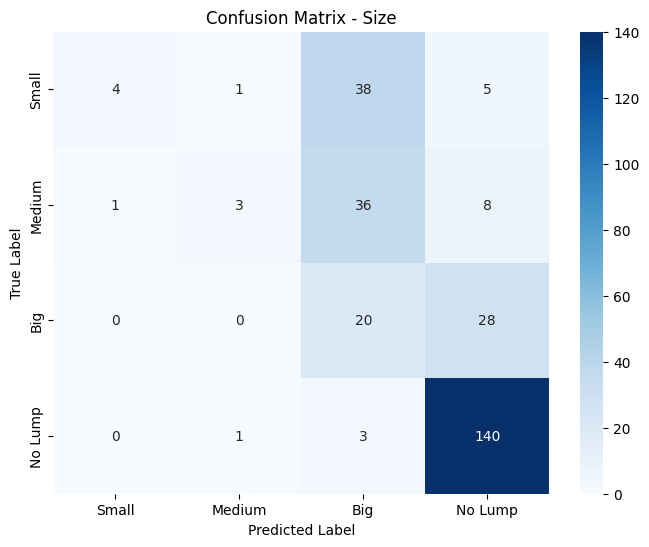


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.80      0.08      0.15        48
      Medium       0.60      0.06      0.11        48
         Big       0.21      0.42      0.28        48
     No Lump       0.77      0.97      0.86       144

    accuracy                           0.58       288
   macro avg       0.59      0.38      0.35       288
weighted avg       0.65      0.58      0.52       288


Confusion Matrix - Position:
[[  0  18   7  23]
 [  0  24   6  18]
 [  0  10   9  29]
 [  1   1   0 142]]


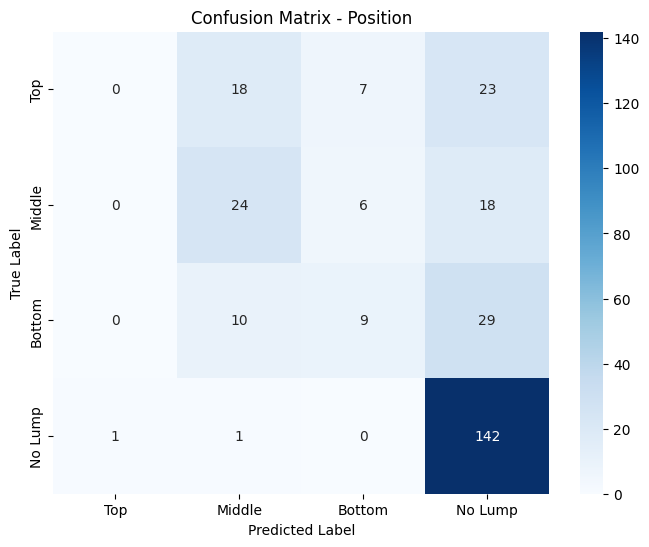


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.00      0.00      0.00        48
      Middle       0.45      0.50      0.48        48
      Bottom       0.41      0.19      0.26        48
     No Lump       0.67      0.99      0.80       144

    accuracy                           0.61       288
   macro avg       0.38      0.42      0.38       288
weighted avg       0.48      0.61      0.52       288


Fine-tuning with 4 additional trials from new dataset


Epoch 1, Training Loss: 1.7196, Validation Loss: 2.0004


Epoch 2, Training Loss: 1.7001, Validation Loss: 1.9279


Epoch 3, Training Loss: 1.6769, Validation Loss: 2.0315


Epoch 4, Training Loss: 1.6686, Validation Loss: 1.9945


Epoch 5, Training Loss: 1.6882, Validation Loss: 2.0058


Epoch 6, Training Loss: 1.6620, Validation Loss: 1.9413


Epoch 7, Training Loss: 1.6248, Validation Loss: 1.9783
Early stopping at epoch 7


Test Accuracy - Lump: 0.6979, Size: 0.3611, Position: 0.3958

Confusion Matrix - Lump:
[[ 64  80]
 [  7 137]]


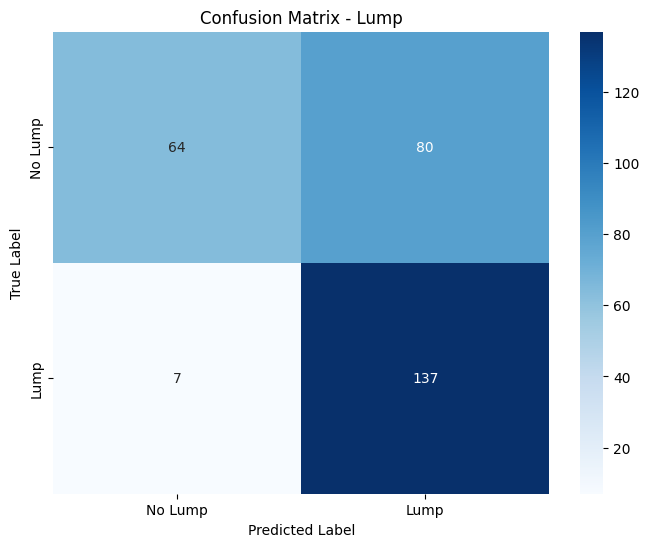


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.90      0.44      0.60       144
        Lump       0.63      0.95      0.76       144

    accuracy                           0.70       288
   macro avg       0.77      0.70      0.68       288
weighted avg       0.77      0.70      0.68       288


Confusion Matrix - Size:
[[ 21  16  10   1]
 [  7  29  12   0]
 [ 11  10  15  12]
 [  2   2 101  39]]


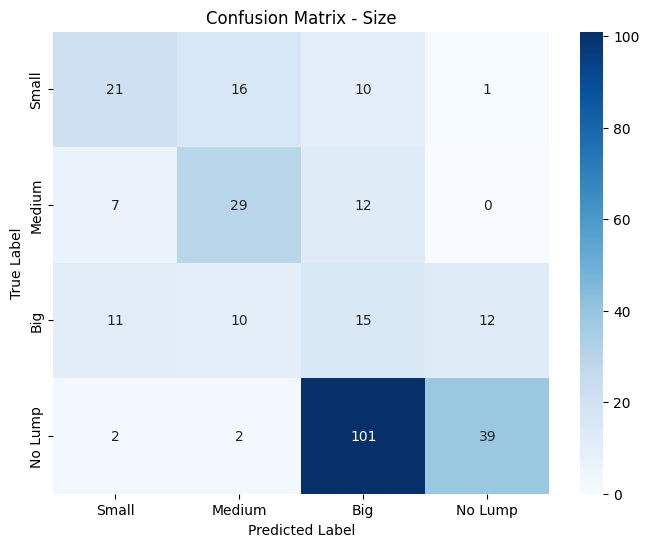


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.51      0.44      0.47        48
      Medium       0.51      0.60      0.55        48
         Big       0.11      0.31      0.16        48
     No Lump       0.75      0.27      0.40       144

    accuracy                           0.36       288
   macro avg       0.47      0.41      0.40       288
weighted avg       0.56      0.36      0.40       288


Confusion Matrix - Position:
[[ 6 28 13  1]
 [10 17 15  6]
 [ 5 18 15 10]
 [52  8  8 76]]


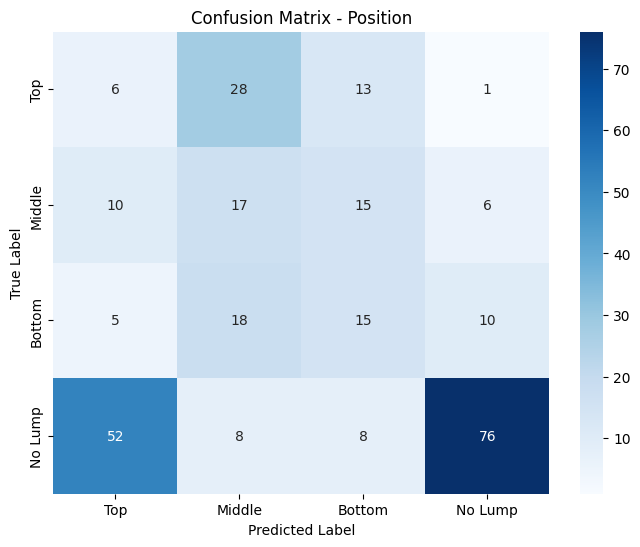


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.08      0.12      0.10        48
      Middle       0.24      0.35      0.29        48
      Bottom       0.29      0.31      0.30        48
     No Lump       0.82      0.53      0.64       144

    accuracy                           0.40       288
   macro avg       0.36      0.33      0.33       288
weighted avg       0.51      0.40      0.44       288


Fine-tuning with 5 additional trials from new dataset


Epoch 1, Training Loss: 1.6479, Validation Loss: 2.2228


Epoch 2, Training Loss: 1.6211, Validation Loss: 1.9864


Epoch 3, Training Loss: 1.6969, Validation Loss: 1.8911


Epoch 4, Training Loss: 1.5937, Validation Loss: 2.0524


Epoch 5, Training Loss: 1.5772, Validation Loss: 1.9408


Epoch 6, Training Loss: 1.5784, Validation Loss: 2.2077


Epoch 7, Training Loss: 1.5845, Validation Loss: 1.9717


Epoch 8, Training Loss: 1.5608, Validation Loss: 1.9274
Early stopping at epoch 8


Test Accuracy - Lump: 0.8993, Size: 0.6875, Position: 0.6181

Confusion Matrix - Lump:
[[135   9]
 [ 20 124]]


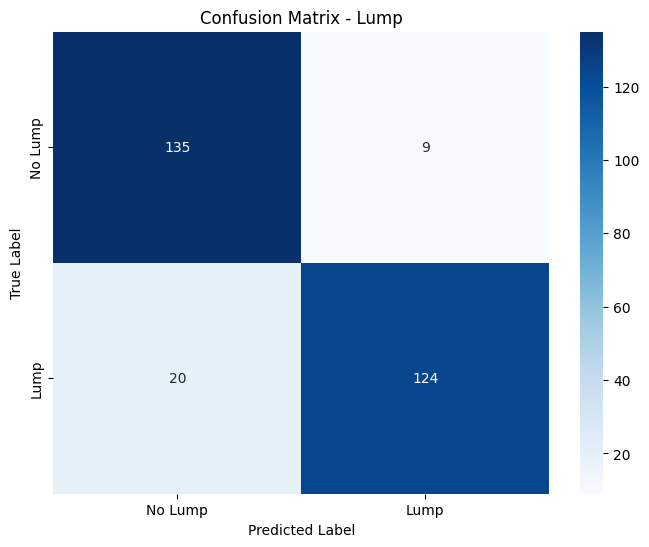


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.87      0.94      0.90       144
        Lump       0.93      0.86      0.90       144

    accuracy                           0.90       288
   macro avg       0.90      0.90      0.90       288
weighted avg       0.90      0.90      0.90       288


Confusion Matrix - Size:
[[ 27  16   1   4]
 [ 11  31   2   4]
 [ 13  15   1  19]
 [  3   2   0 139]]


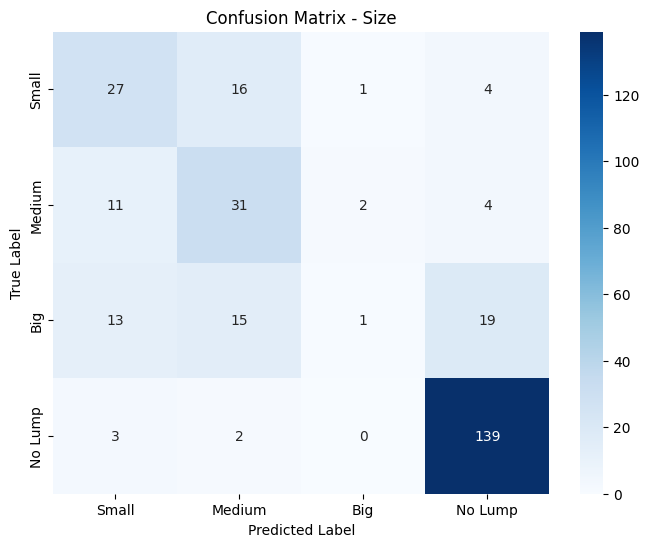


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.50      0.56      0.53        48
      Medium       0.48      0.65      0.55        48
         Big       0.25      0.02      0.04        48
     No Lump       0.84      0.97      0.90       144

    accuracy                           0.69       288
   macro avg       0.52      0.55      0.50       288
weighted avg       0.62      0.69      0.64       288


Confusion Matrix - Position:
[[  0  30  12   6]
 [  0  25  14   9]
 [  0  20  14  14]
 [  0   5   0 139]]


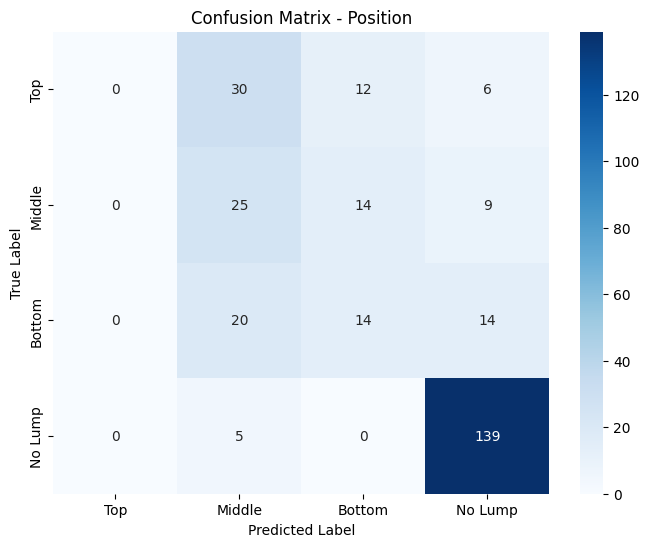


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.00      0.00      0.00        48
      Middle       0.31      0.52      0.39        48
      Bottom       0.35      0.29      0.32        48
     No Lump       0.83      0.97      0.89       144

    accuracy                           0.62       288
   macro avg       0.37      0.44      0.40       288
weighted avg       0.52      0.62      0.56       288



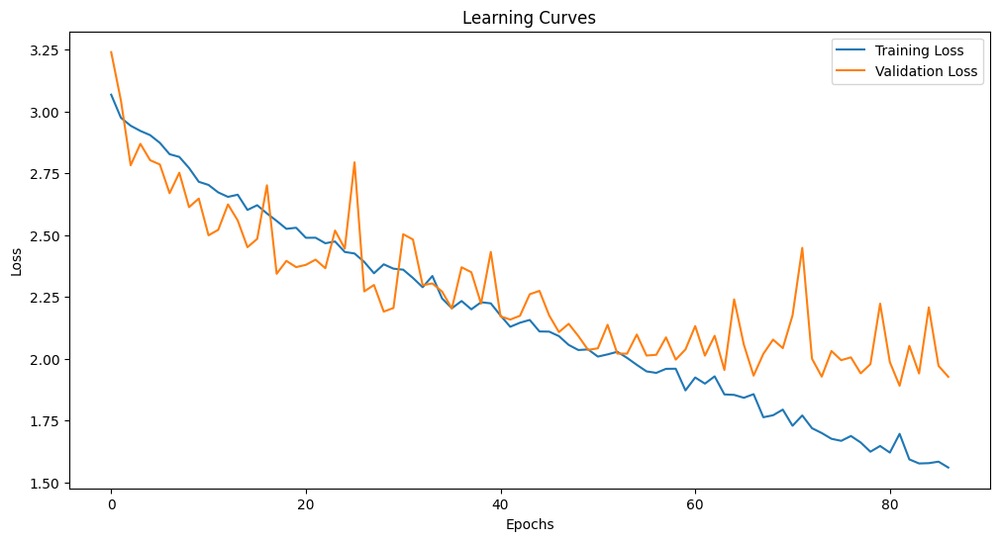

| Training Phase                         |   Lump Accuracy |   Size Accuracy |   Position Accuracy |
|:---------------------------------------|----------------:|----------------:|--------------------:|
| Initial Training                       |        0.772222 |        0.620833 |            0.559722 |
| Testing on doctors without fine-tuning |        0.5      |        0.163194 |            0.170139 |
| Fine-tuning with 1 trials              |        0.819444 |        0.479167 |            0.527778 |
| Fine-tuning with 2 trials              |        0.739583 |        0.506944 |            0.513889 |
| Fine-tuning with 3 trials              |        0.840278 |        0.579861 |            0.607639 |
| Fine-tuning with 4 trials              |        0.697917 |        0.361111 |            0.395833 |
| Fine-tuning with 5 trials              |        0.899306 |        0.6875   |            0.618056 |

Running experiment with tips sensors and 7 seconds
Using 6 GPUs
Initial Training and Evalu

Epoch 1, Training Loss: 3.0602, Validation Loss: 3.0820


Epoch 2, Training Loss: 2.9742, Validation Loss: 2.7555


Epoch 3, Training Loss: 2.9287, Validation Loss: 2.7645


Epoch 4, Training Loss: 2.8658, Validation Loss: 2.7477


Epoch 5, Training Loss: 2.8658, Validation Loss: 2.6951


Epoch 6, Training Loss: 2.8173, Validation Loss: 2.6823


Epoch 7, Training Loss: 2.8084, Validation Loss: 2.6943


Epoch 8, Training Loss: 2.7655, Validation Loss: 2.5827


Epoch 9, Training Loss: 2.7709, Validation Loss: 2.5698


Epoch 10, Training Loss: 2.7446, Validation Loss: 2.6310


Epoch 11, Training Loss: 2.7107, Validation Loss: 2.6830


Epoch 12, Training Loss: 2.7124, Validation Loss: 2.4990


Epoch 13, Training Loss: 2.6554, Validation Loss: 2.5877


Epoch 14, Training Loss: 2.6377, Validation Loss: 2.4871


Epoch 15, Training Loss: 2.6321, Validation Loss: 2.5086


Epoch 16, Training Loss: 2.6065, Validation Loss: 2.5949


Epoch 17, Training Loss: 2.5877, Validation Loss: 2.5152


Epoch 18, Training Loss: 2.5632, Validation Loss: 2.4026


Epoch 19, Training Loss: 2.5304, Validation Loss: 2.4454


Epoch 20, Training Loss: 2.5169, Validation Loss: 2.4389


Epoch 21, Training Loss: 2.5027, Validation Loss: 2.5615


Epoch 22, Training Loss: 2.5297, Validation Loss: 2.4167


Epoch 23, Training Loss: 2.4619, Validation Loss: 2.3384


Epoch 24, Training Loss: 2.4663, Validation Loss: 2.4278


Epoch 25, Training Loss: 2.4248, Validation Loss: 2.2913


Epoch 26, Training Loss: 2.4153, Validation Loss: 2.3392


Epoch 27, Training Loss: 2.3858, Validation Loss: 2.3323


Epoch 28, Training Loss: 2.3885, Validation Loss: 2.4189


Epoch 29, Training Loss: 2.4126, Validation Loss: 2.2178


Epoch 30, Training Loss: 2.3455, Validation Loss: 2.3975


Epoch 31, Training Loss: 2.3664, Validation Loss: 2.3796


Epoch 32, Training Loss: 2.3543, Validation Loss: 2.3324


Epoch 33, Training Loss: 2.3026, Validation Loss: 2.3142


Epoch 34, Training Loss: 2.3221, Validation Loss: 2.2922
Early stopping at epoch 34


Test Accuracy - Lump: 0.7958, Size: 0.6181, Position: 0.5639

Confusion Matrix - Lump:
[[291  69]
 [ 78 282]]


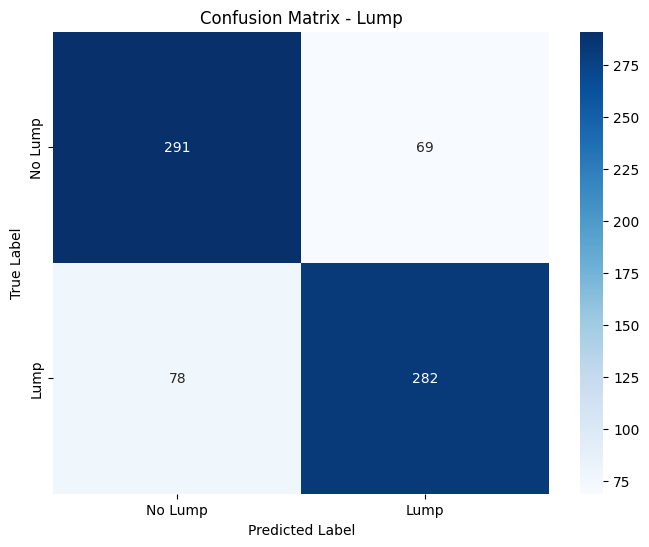


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.79      0.81      0.80       360
        Lump       0.80      0.78      0.79       360

    accuracy                           0.80       720
   macro avg       0.80      0.80      0.80       720
weighted avg       0.80      0.80      0.80       720


Confusion Matrix - Size:
[[ 49  35   1  35]
 [ 13  44  16  47]
 [  4  21  40  55]
 [ 11  21  16 312]]


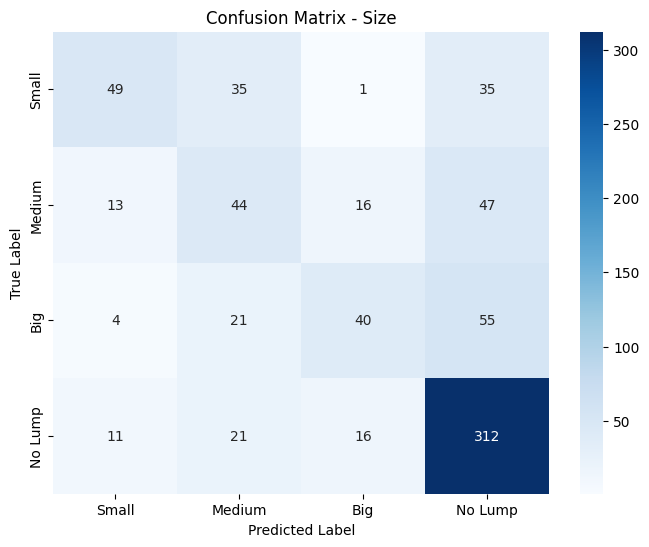


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.64      0.41      0.50       120
      Medium       0.36      0.37      0.37       120
         Big       0.55      0.33      0.41       120
     No Lump       0.69      0.87      0.77       360

    accuracy                           0.62       720
   macro avg       0.56      0.49      0.51       720
weighted avg       0.61      0.62      0.60       720


Confusion Matrix - Position:
[[  6  33  24  57]
 [  0  45  20  55]
 [  2  44  29  45]
 [  5  15  14 326]]


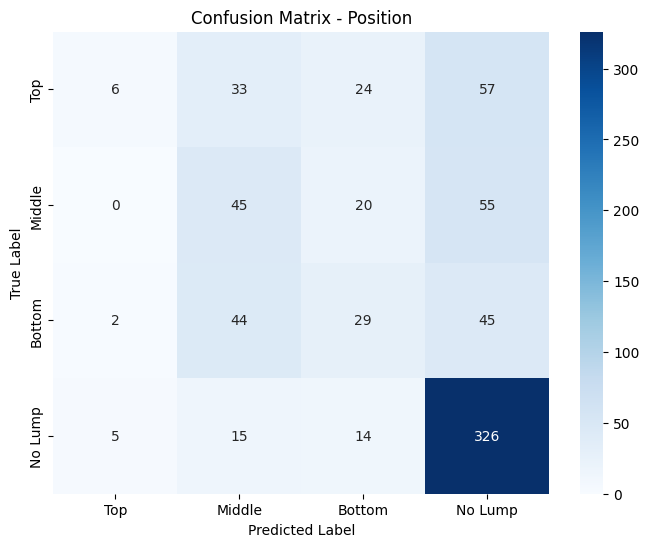


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.46      0.05      0.09       120
      Middle       0.33      0.38      0.35       120
      Bottom       0.33      0.24      0.28       120
     No Lump       0.67      0.91      0.77       360

    accuracy                           0.56       720
   macro avg       0.45      0.39      0.37       720
weighted avg       0.52      0.56      0.51       720


Testing on doctors' data without fine-tuning:


Test Accuracy - Lump: 0.5000, Size: 0.1493, Position: 0.2118

Confusion Matrix - Lump:
[[  0 144]
 [  0 144]]


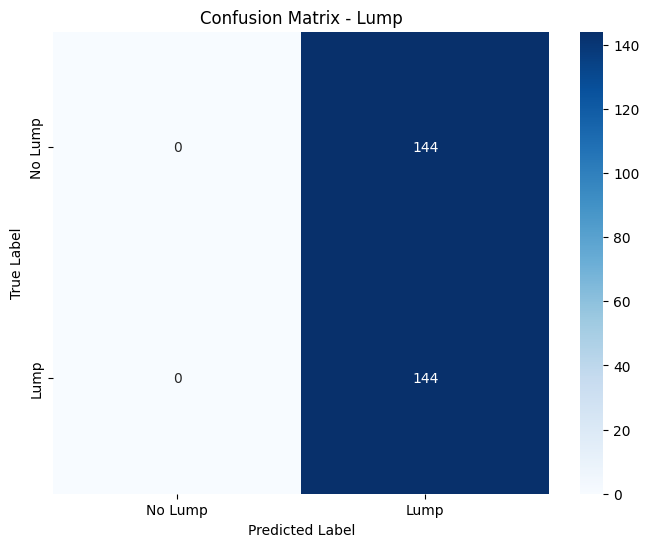


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.00      0.00      0.00       144
        Lump       0.50      1.00      0.67       144

    accuracy                           0.50       288
   macro avg       0.25      0.50      0.33       288
weighted avg       0.25      0.50      0.33       288


Confusion Matrix - Size:
[[ 0 47  1  0]
 [ 0 43  5  0]
 [ 0 48  0  0]
 [ 0 74 70  0]]


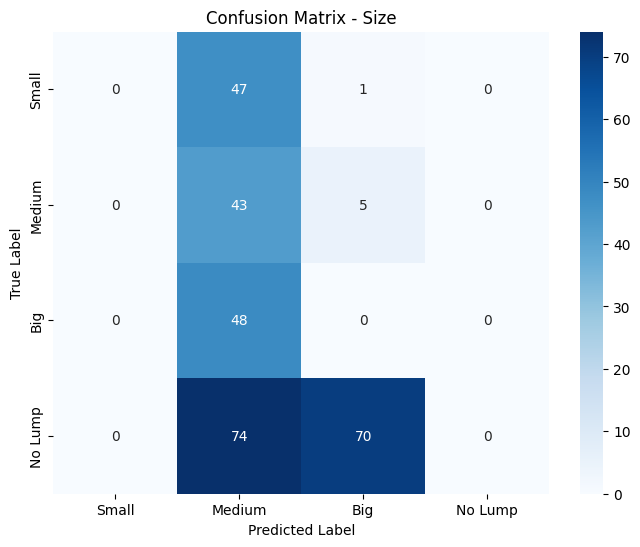


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.00      0.00      0.00        48
      Medium       0.20      0.90      0.33        48
         Big       0.00      0.00      0.00        48
     No Lump       0.00      0.00      0.00       144

    accuracy                           0.15       288
   macro avg       0.05      0.22      0.08       288
weighted avg       0.03      0.15      0.06       288


Confusion Matrix - Position:
[[  0  41   6   1]
 [  0  38   9   1]
 [  0  25  22   1]
 [  0  32 111   1]]


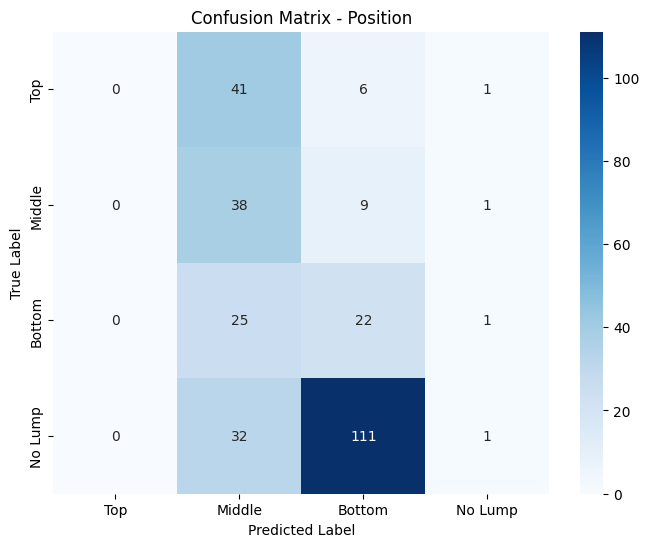


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.00      0.00      0.00        48
      Middle       0.28      0.79      0.41        48
      Bottom       0.15      0.46      0.22        48
     No Lump       0.25      0.01      0.01       144

    accuracy                           0.21       288
   macro avg       0.17      0.31      0.16       288
weighted avg       0.20      0.21      0.11       288


Fine-tuning with 1 additional trials from new dataset


Epoch 1, Training Loss: 2.2926, Validation Loss: 2.2936


Epoch 2, Training Loss: 2.2780, Validation Loss: 2.3968


Epoch 3, Training Loss: 2.3164, Validation Loss: 2.2714


Epoch 4, Training Loss: 2.2682, Validation Loss: 2.1576


Epoch 5, Training Loss: 2.2464, Validation Loss: 2.2929


Epoch 6, Training Loss: 2.2482, Validation Loss: 2.3236


Epoch 7, Training Loss: 2.2742, Validation Loss: 2.3666


Epoch 8, Training Loss: 2.2405, Validation Loss: 2.1063


Epoch 9, Training Loss: 2.1958, Validation Loss: 2.3904


Epoch 10, Training Loss: 2.2299, Validation Loss: 2.2511


Epoch 11, Training Loss: 2.1843, Validation Loss: 2.3100


Epoch 12, Training Loss: 2.1660, Validation Loss: 2.2454


Epoch 13, Training Loss: 2.1399, Validation Loss: 2.2409
Early stopping at epoch 13


Test Accuracy - Lump: 0.7118, Size: 0.3646, Position: 0.4965

Confusion Matrix - Lump:
[[128  16]
 [ 67  77]]


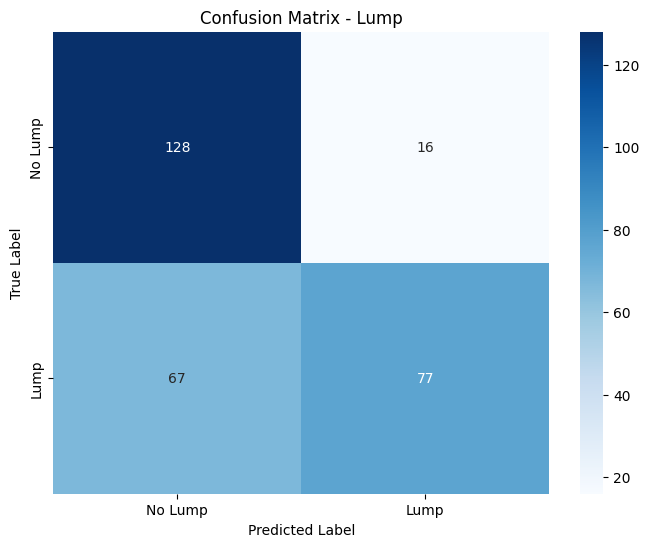


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.66      0.89      0.76       144
        Lump       0.83      0.53      0.65       144

    accuracy                           0.71       288
   macro avg       0.74      0.71      0.70       288
weighted avg       0.74      0.71      0.70       288


Confusion Matrix - Size:
[[ 0 20  0 28]
 [ 0 15  1 32]
 [ 0 22  0 26]
 [ 0 11 43 90]]


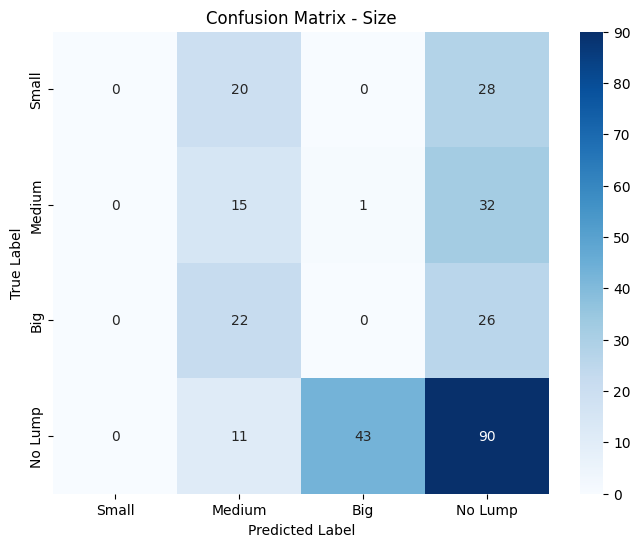


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.00      0.00      0.00        48
      Medium       0.22      0.31      0.26        48
         Big       0.00      0.00      0.00        48
     No Lump       0.51      0.62      0.56       144

    accuracy                           0.36       288
   macro avg       0.18      0.23      0.21       288
weighted avg       0.29      0.36      0.32       288


Confusion Matrix - Position:
[[  0   2   0  46]
 [  0   0   0  48]
 [  0   0   0  48]
 [  0   1   0 143]]


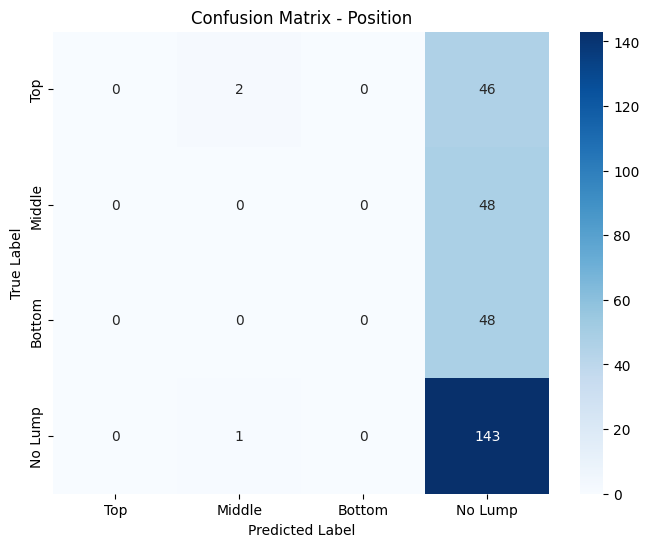


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.00      0.00      0.00        48
      Middle       0.00      0.00      0.00        48
      Bottom       0.00      0.00      0.00        48
     No Lump       0.50      0.99      0.67       144

    accuracy                           0.50       288
   macro avg       0.13      0.25      0.17       288
weighted avg       0.25      0.50      0.33       288


Fine-tuning with 2 additional trials from new dataset


Epoch 1, Training Loss: 2.1445, Validation Loss: 2.0843


Epoch 2, Training Loss: 2.1196, Validation Loss: 2.0642


Epoch 3, Training Loss: 2.0904, Validation Loss: 2.1170


Epoch 4, Training Loss: 2.0850, Validation Loss: 2.1837


Epoch 5, Training Loss: 2.0287, Validation Loss: 2.0467


Epoch 6, Training Loss: 2.0551, Validation Loss: 2.1162


Epoch 7, Training Loss: 1.9772, Validation Loss: 2.2187


Epoch 8, Training Loss: 2.0594, Validation Loss: 2.2309


Epoch 9, Training Loss: 2.0313, Validation Loss: 2.0792


Epoch 10, Training Loss: 2.0437, Validation Loss: 1.9385


Epoch 11, Training Loss: 1.9687, Validation Loss: 1.9780


Epoch 12, Training Loss: 1.9623, Validation Loss: 2.2409


Epoch 13, Training Loss: 1.9558, Validation Loss: 2.0411


Epoch 14, Training Loss: 1.9525, Validation Loss: 2.0345


Epoch 15, Training Loss: 1.9556, Validation Loss: 1.9846
Early stopping at epoch 15


Test Accuracy - Lump: 0.7986, Size: 0.4514, Position: 0.5521

Confusion Matrix - Lump:
[[124  20]
 [ 38 106]]


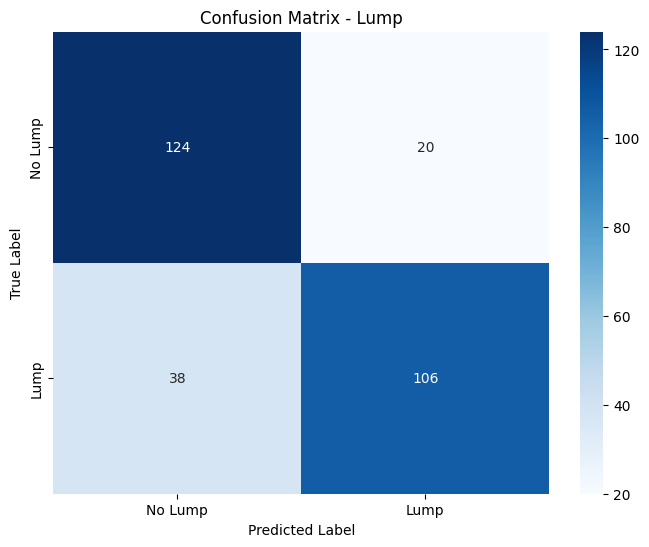


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.77      0.86      0.81       144
        Lump       0.84      0.74      0.79       144

    accuracy                           0.80       288
   macro avg       0.80      0.80      0.80       288
weighted avg       0.80      0.80      0.80       288


Confusion Matrix - Size:
[[15 16  0 17]
 [10 16  2 20]
 [ 3 20  0 25]
 [ 0  3 42 99]]


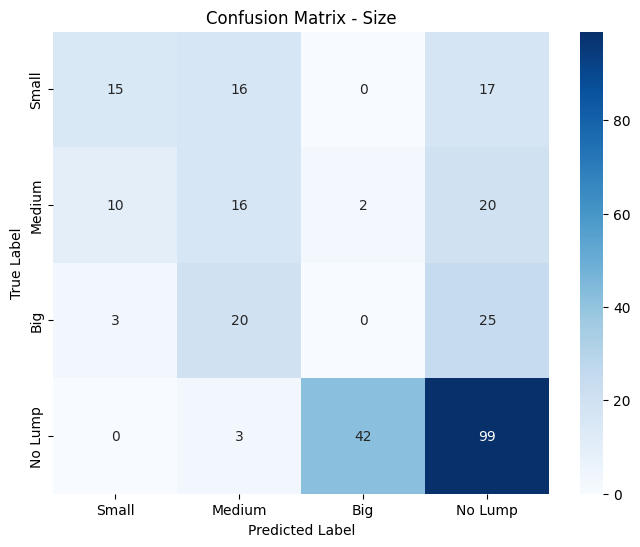


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.54      0.31      0.39        48
      Medium       0.29      0.33      0.31        48
         Big       0.00      0.00      0.00        48
     No Lump       0.61      0.69      0.65       144

    accuracy                           0.45       288
   macro avg       0.36      0.33      0.34       288
weighted avg       0.45      0.45      0.44       288


Confusion Matrix - Position:
[[  0  38   0  10]
 [  0  16   3  29]
 [  0  20   2  26]
 [  0   2   1 141]]


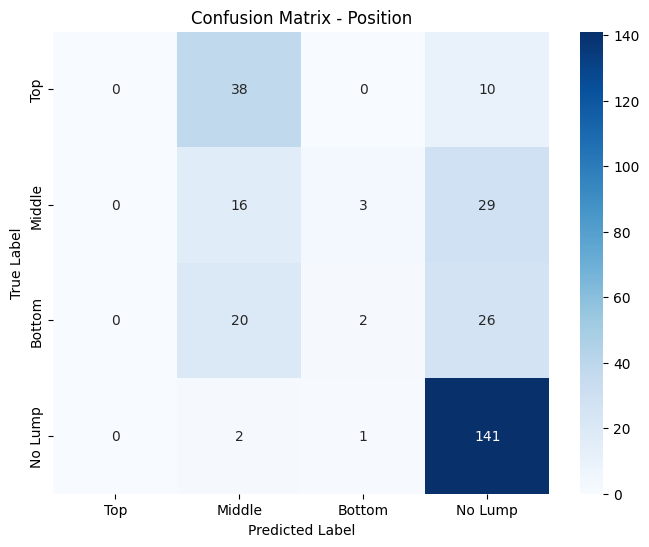


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.00      0.00      0.00        48
      Middle       0.21      0.33      0.26        48
      Bottom       0.33      0.04      0.07        48
     No Lump       0.68      0.98      0.81       144

    accuracy                           0.55       288
   macro avg       0.31      0.34      0.28       288
weighted avg       0.43      0.55      0.46       288


Fine-tuning with 3 additional trials from new dataset


Epoch 1, Training Loss: 1.9438, Validation Loss: 1.9802


Epoch 2, Training Loss: 1.8827, Validation Loss: 2.1574


Epoch 3, Training Loss: 1.9023, Validation Loss: 2.4248


Epoch 4, Training Loss: 1.9059, Validation Loss: 2.0951


Epoch 5, Training Loss: 1.8896, Validation Loss: 2.1110
Early stopping at epoch 5


Test Accuracy - Lump: 0.7743, Size: 0.5243, Position: 0.5208

Confusion Matrix - Lump:
[[142   2]
 [ 63  81]]


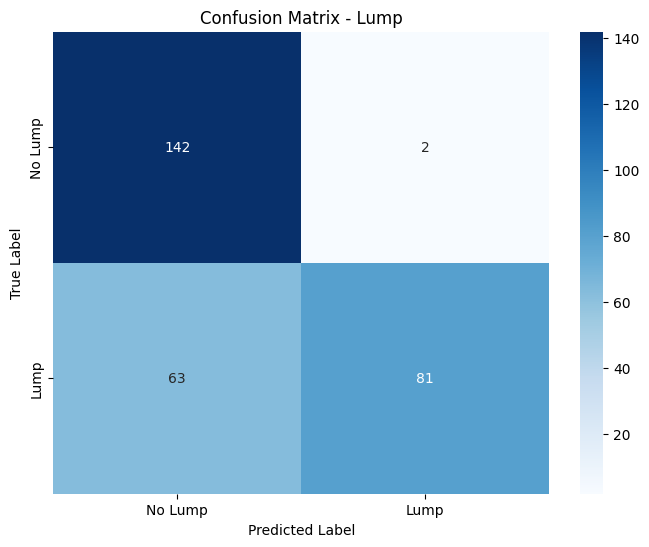


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.69      0.99      0.81       144
        Lump       0.98      0.56      0.71       144

    accuracy                           0.77       288
   macro avg       0.83      0.77      0.76       288
weighted avg       0.83      0.77      0.76       288


Confusion Matrix - Size:
[[  3   9   0  36]
 [  3   4   0  41]
 [  1   9   0  38]
 [  0   0   0 144]]


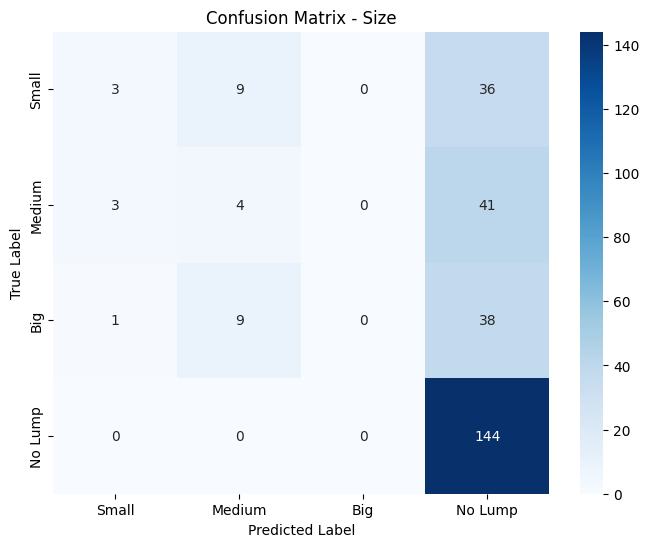


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.43      0.06      0.11        48
      Medium       0.18      0.08      0.11        48
         Big       0.00      0.00      0.00        48
     No Lump       0.56      1.00      0.71       144

    accuracy                           0.52       288
   macro avg       0.29      0.29      0.23       288
weighted avg       0.38      0.52      0.39       288


Confusion Matrix - Position:
[[  0  18   0  30]
 [  0   6   0  42]
 [  0   8   0  40]
 [  0   0   0 144]]


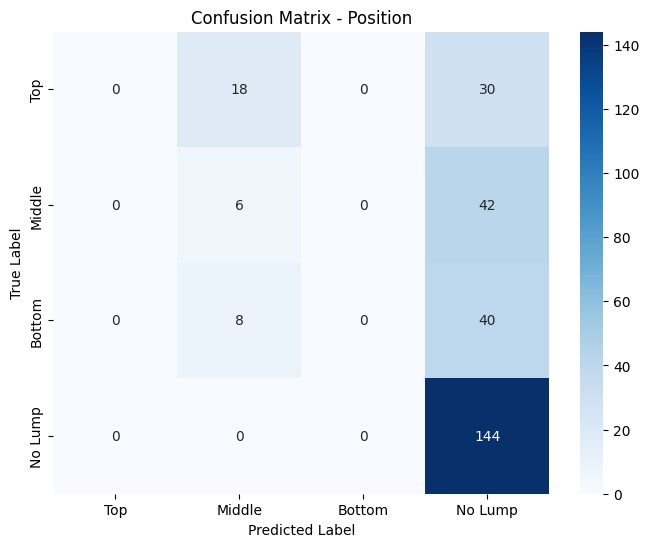


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.00      0.00      0.00        48
      Middle       0.19      0.12      0.15        48
      Bottom       0.00      0.00      0.00        48
     No Lump       0.56      1.00      0.72       144

    accuracy                           0.52       288
   macro avg       0.19      0.28      0.22       288
weighted avg       0.31      0.52      0.39       288


Fine-tuning with 4 additional trials from new dataset


Epoch 1, Training Loss: 1.8118, Validation Loss: 2.1949


Epoch 2, Training Loss: 1.8346, Validation Loss: 1.9921


Epoch 3, Training Loss: 1.8558, Validation Loss: 2.0640


Epoch 4, Training Loss: 1.8277, Validation Loss: 2.0744


Epoch 5, Training Loss: 1.7532, Validation Loss: 2.0489
Early stopping at epoch 5


Test Accuracy - Lump: 0.8646, Size: 0.6319, Position: 0.6146

Confusion Matrix - Lump:
[[122  22]
 [ 17 127]]


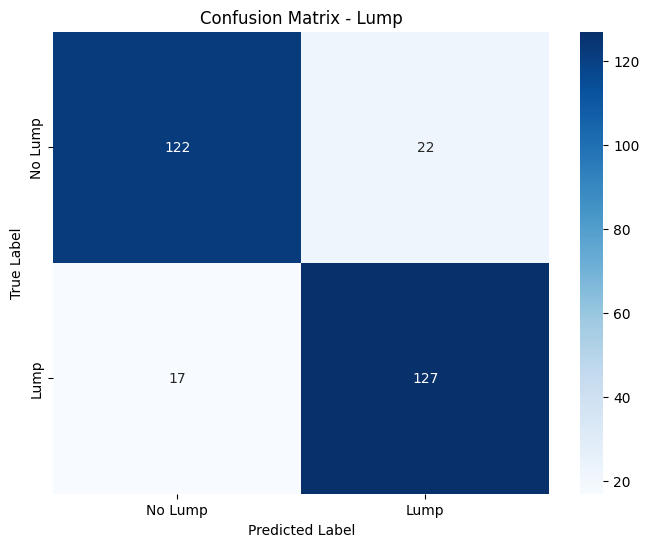


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.88      0.85      0.86       144
        Lump       0.85      0.88      0.87       144

    accuracy                           0.86       288
   macro avg       0.87      0.86      0.86       288
weighted avg       0.87      0.86      0.86       288


Confusion Matrix - Size:
[[  5  38   0   5]
 [  2  42   0   4]
 [  1  30   0  17]
 [  0   9   0 135]]


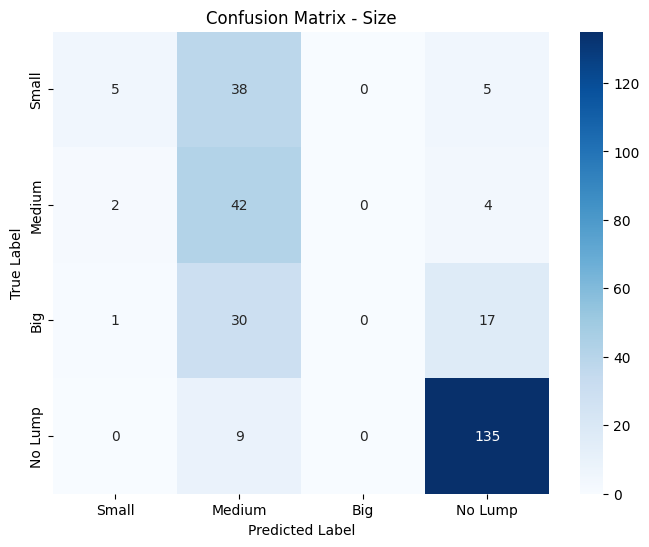


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.62      0.10      0.18        48
      Medium       0.35      0.88      0.50        48
         Big       0.00      0.00      0.00        48
     No Lump       0.84      0.94      0.89       144

    accuracy                           0.63       288
   macro avg       0.45      0.48      0.39       288
weighted avg       0.58      0.63      0.56       288


Confusion Matrix - Position:
[[  0  43   0   5]
 [  0  35   3  10]
 [  0  27   5  16]
 [  0   6   1 137]]


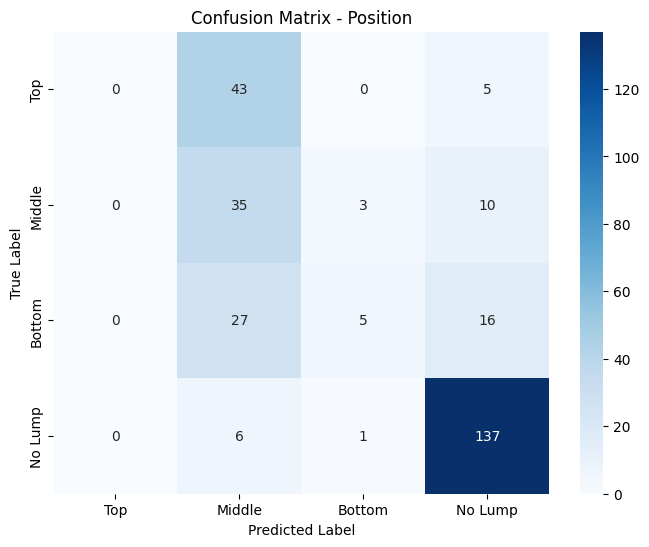


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.00      0.00      0.00        48
      Middle       0.32      0.73      0.44        48
      Bottom       0.56      0.10      0.18        48
     No Lump       0.82      0.95      0.88       144

    accuracy                           0.61       288
   macro avg       0.42      0.45      0.37       288
weighted avg       0.55      0.61      0.54       288


Fine-tuning with 5 additional trials from new dataset


Epoch 1, Training Loss: 1.8112, Validation Loss: 2.0606


Epoch 2, Training Loss: 1.7663, Validation Loss: 2.0683


Epoch 3, Training Loss: 1.7799, Validation Loss: 1.9779


Epoch 4, Training Loss: 1.7475, Validation Loss: 2.1022


Epoch 5, Training Loss: 1.7459, Validation Loss: 1.8639


Epoch 6, Training Loss: 1.7195, Validation Loss: 2.2064


Epoch 7, Training Loss: 1.7591, Validation Loss: 2.0465


Epoch 8, Training Loss: 1.6882, Validation Loss: 2.2141


Epoch 9, Training Loss: 1.7124, Validation Loss: 2.0655


Epoch 10, Training Loss: 1.6725, Validation Loss: 2.0772
Early stopping at epoch 10


Test Accuracy - Lump: 0.9097, Size: 0.6840, Position: 0.6007

Confusion Matrix - Lump:
[[139   5]
 [ 21 123]]


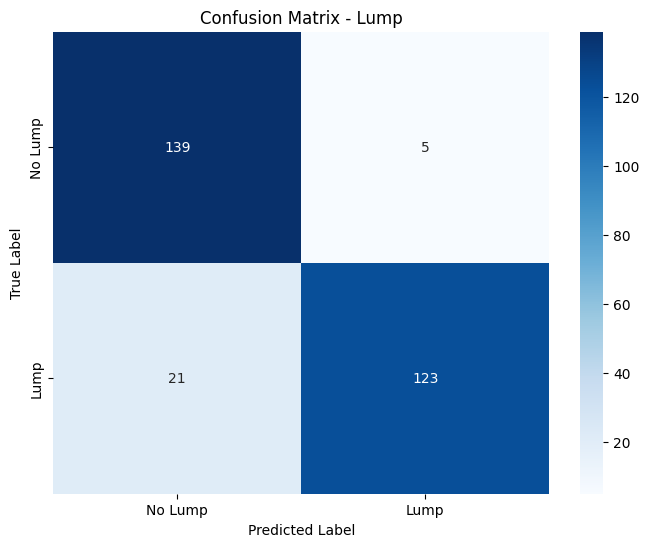


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.87      0.97      0.91       144
        Lump       0.96      0.85      0.90       144

    accuracy                           0.91       288
   macro avg       0.91      0.91      0.91       288
weighted avg       0.91      0.91      0.91       288


Confusion Matrix - Size:
[[ 25  16   0   7]
 [ 11  31   1   5]
 [  4  17   0  27]
 [  0   2   1 141]]


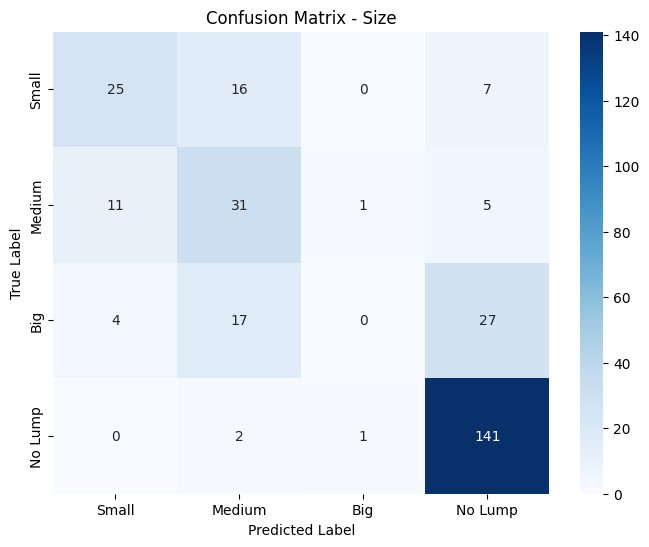


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.62      0.52      0.57        48
      Medium       0.47      0.65      0.54        48
         Big       0.00      0.00      0.00        48
     No Lump       0.78      0.98      0.87       144

    accuracy                           0.68       288
   macro avg       0.47      0.54      0.50       288
weighted avg       0.57      0.68      0.62       288


Confusion Matrix - Position:
[[  0  40   2   6]
 [  0  27   9  12]
 [  0  27   4  17]
 [  0   1   1 142]]


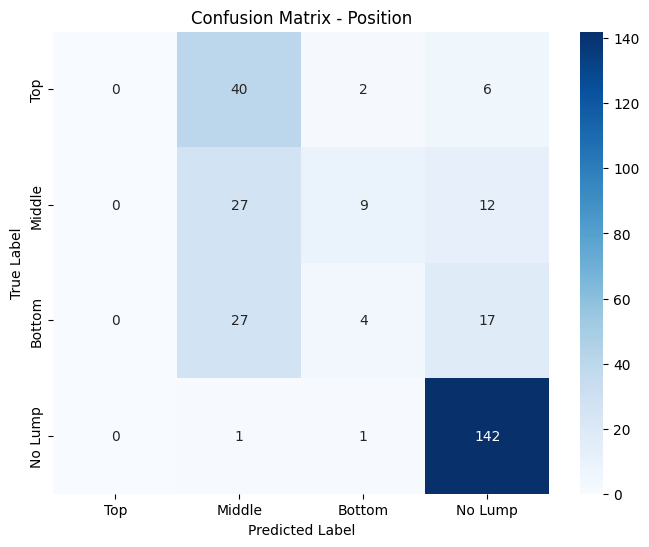


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.00      0.00      0.00        48
      Middle       0.28      0.56      0.38        48
      Bottom       0.25      0.08      0.12        48
     No Lump       0.80      0.99      0.88       144

    accuracy                           0.60       288
   macro avg       0.33      0.41      0.35       288
weighted avg       0.49      0.60      0.53       288

Few-shot early stopping at step 5


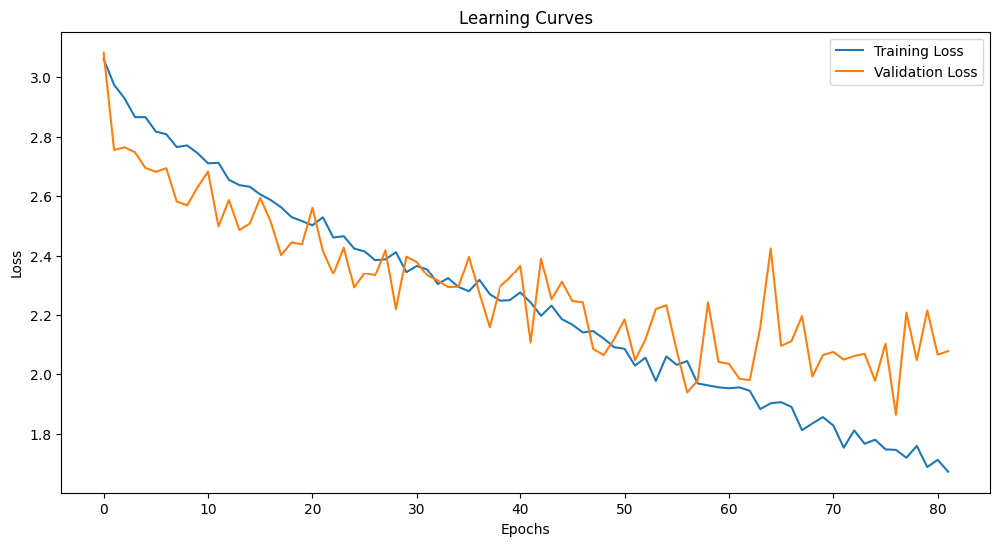

| Training Phase                         |   Lump Accuracy |   Size Accuracy |   Position Accuracy |
|:---------------------------------------|----------------:|----------------:|--------------------:|
| Initial Training                       |        0.795833 |        0.618056 |            0.563889 |
| Testing on doctors without fine-tuning |        0.5      |        0.149306 |            0.211806 |
| Fine-tuning with 1 trials              |        0.711806 |        0.364583 |            0.496528 |
| Fine-tuning with 2 trials              |        0.798611 |        0.451389 |            0.552083 |
| Fine-tuning with 3 trials              |        0.774306 |        0.524306 |            0.520833 |
| Fine-tuning with 4 trials              |        0.864583 |        0.631944 |            0.614583 |
| Fine-tuning with 5 trials              |        0.909722 |        0.684028 |            0.600694 |

Running experiment with tips_middle sensors and 1 seconds
Using 6 GPUs
Initial Training an

Epoch 1, Training Loss: 2.8779, Validation Loss: 2.6840


Epoch 2, Training Loss: 2.7363, Validation Loss: 2.6286


Epoch 3, Training Loss: 2.6582, Validation Loss: 2.5068


Epoch 4, Training Loss: 2.5876, Validation Loss: 2.4037


Epoch 5, Training Loss: 2.5353, Validation Loss: 2.7799


Epoch 6, Training Loss: 2.5162, Validation Loss: 2.3351


Epoch 7, Training Loss: 2.4712, Validation Loss: 2.5299


Epoch 8, Training Loss: 2.4482, Validation Loss: 2.2431


Epoch 9, Training Loss: 2.3615, Validation Loss: 2.3182


Epoch 10, Training Loss: 2.3354, Validation Loss: 2.2533


Epoch 11, Training Loss: 2.2800, Validation Loss: 2.1353


Epoch 12, Training Loss: 2.2509, Validation Loss: 2.1697


Epoch 13, Training Loss: 2.2357, Validation Loss: 2.3196


Epoch 14, Training Loss: 2.2245, Validation Loss: 2.3214


Epoch 15, Training Loss: 2.2001, Validation Loss: 2.1589


Epoch 16, Training Loss: 2.1783, Validation Loss: 2.0846


Epoch 17, Training Loss: 2.1484, Validation Loss: 2.1335


Epoch 18, Training Loss: 2.0901, Validation Loss: 2.2291


Epoch 19, Training Loss: 2.0902, Validation Loss: 2.0580


Epoch 20, Training Loss: 2.0776, Validation Loss: 2.0833


Epoch 21, Training Loss: 2.0322, Validation Loss: 2.2050


Epoch 22, Training Loss: 1.9983, Validation Loss: 2.1846


Epoch 23, Training Loss: 2.0011, Validation Loss: 2.1387


Epoch 24, Training Loss: 1.9745, Validation Loss: 1.9918


Epoch 25, Training Loss: 1.9546, Validation Loss: 2.0591


Epoch 26, Training Loss: 1.8882, Validation Loss: 2.0665


Epoch 27, Training Loss: 1.9319, Validation Loss: 2.0910


Epoch 28, Training Loss: 1.8831, Validation Loss: 2.0360


Epoch 29, Training Loss: 1.8436, Validation Loss: 1.9990
Early stopping at epoch 29


Test Accuracy - Lump: 0.8625, Size: 0.6875, Position: 0.6264

Confusion Matrix - Lump:
[[305  55]
 [ 44 316]]


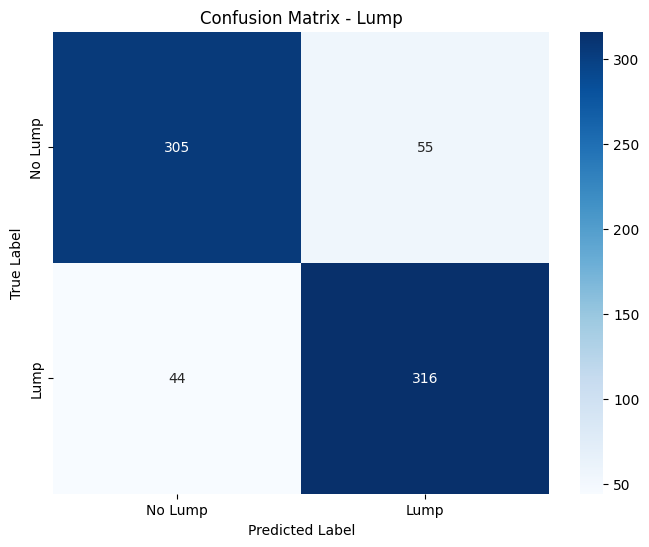


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.87      0.85      0.86       360
        Lump       0.85      0.88      0.86       360

    accuracy                           0.86       720
   macro avg       0.86      0.86      0.86       720
weighted avg       0.86      0.86      0.86       720


Confusion Matrix - Size:
[[ 90   4  10  16]
 [ 48  22  31  19]
 [ 25   6  67  22]
 [ 20   3  21 316]]


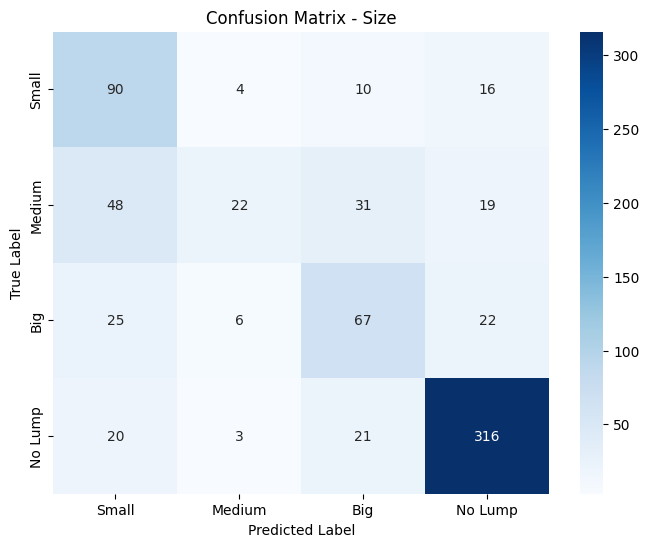


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.49      0.75      0.59       120
      Medium       0.63      0.18      0.28       120
         Big       0.52      0.56      0.54       120
     No Lump       0.85      0.88      0.86       360

    accuracy                           0.69       720
   macro avg       0.62      0.59      0.57       720
weighted avg       0.70      0.69      0.67       720


Confusion Matrix - Position:
[[ 19  44  29  28]
 [ 14  60  26  20]
 [ 12  41  49  18]
 [ 12  14  11 323]]


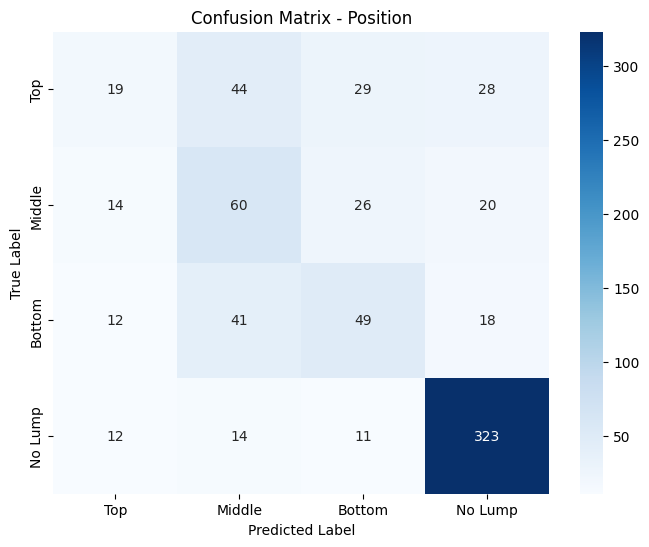


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.33      0.16      0.21       120
      Middle       0.38      0.50      0.43       120
      Bottom       0.43      0.41      0.42       120
     No Lump       0.83      0.90      0.86       360

    accuracy                           0.63       720
   macro avg       0.49      0.49      0.48       720
weighted avg       0.60      0.63      0.61       720


Testing on doctors' data without fine-tuning:


Test Accuracy - Lump: 0.5000, Size: 0.1597, Position: 0.1562

Confusion Matrix - Lump:
[[  0 144]
 [  0 144]]


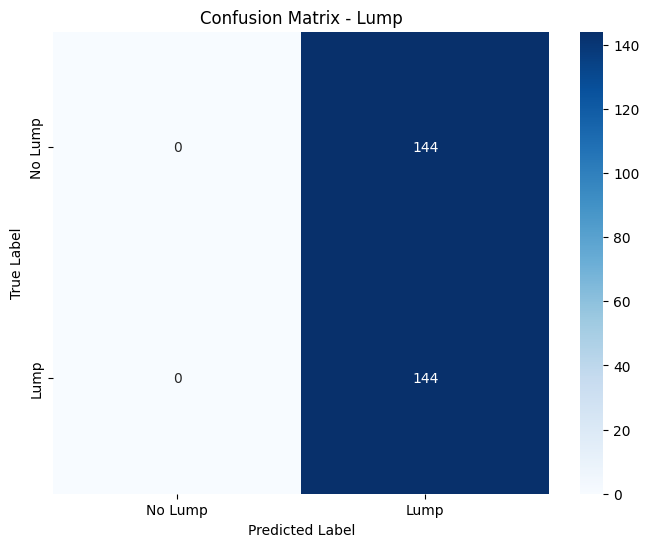


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.00      0.00      0.00       144
        Lump       0.50      1.00      0.67       144

    accuracy                           0.50       288
   macro avg       0.25      0.50      0.33       288
weighted avg       0.25      0.50      0.33       288


Confusion Matrix - Size:
[[ 18   5  25   0]
 [ 12   3  33   0]
 [ 18   6  24   0]
 [ 12   5 126   1]]


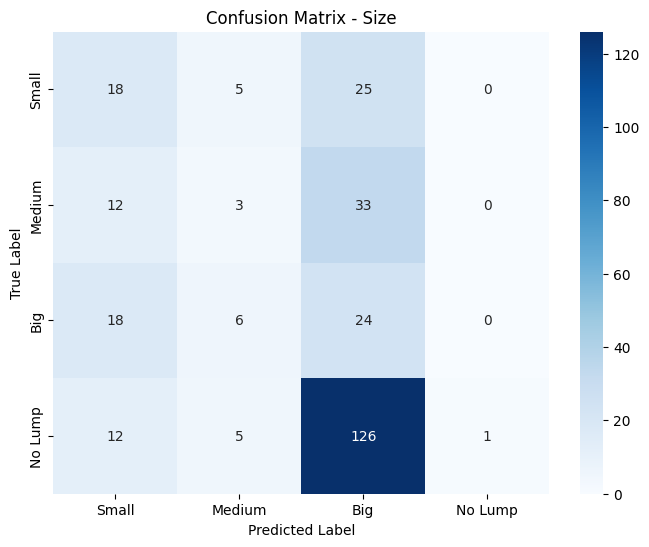


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.30      0.38      0.33        48
      Medium       0.16      0.06      0.09        48
         Big       0.12      0.50      0.19        48
     No Lump       1.00      0.01      0.01       144

    accuracy                           0.16       288
   macro avg       0.39      0.24      0.16       288
weighted avg       0.60      0.16      0.11       288


Confusion Matrix - Position:
[[  6  42   0   0]
 [ 15  33   0   0]
 [ 13  30   5   0]
 [110  29   4   1]]


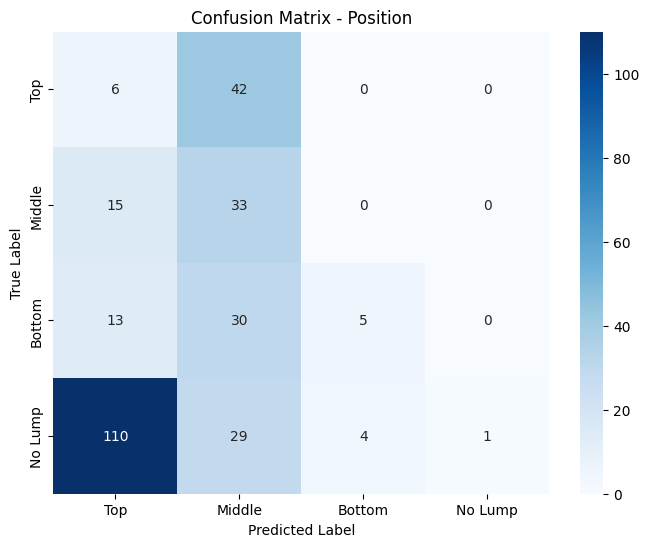


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.04      0.12      0.06        48
      Middle       0.25      0.69      0.36        48
      Bottom       0.56      0.10      0.18        48
     No Lump       1.00      0.01      0.01       144

    accuracy                           0.16       288
   macro avg       0.46      0.23      0.15       288
weighted avg       0.64      0.16      0.11       288


Fine-tuning with 1 additional trials from new dataset


Epoch 1, Training Loss: 1.8634, Validation Loss: 1.9749


Epoch 2, Training Loss: 1.8617, Validation Loss: 1.9932


Epoch 3, Training Loss: 1.8653, Validation Loss: 2.0423


Epoch 4, Training Loss: 1.9763, Validation Loss: 1.9779


Epoch 5, Training Loss: 1.7820, Validation Loss: 1.8898


Epoch 6, Training Loss: 1.7406, Validation Loss: 1.9221


Epoch 7, Training Loss: 1.7634, Validation Loss: 2.0224


Epoch 8, Training Loss: 1.7165, Validation Loss: 1.9989


Epoch 9, Training Loss: 1.7493, Validation Loss: 1.8884


Epoch 10, Training Loss: 1.7161, Validation Loss: 1.9084


Epoch 11, Training Loss: 1.6925, Validation Loss: 1.9465


Epoch 12, Training Loss: 1.7038, Validation Loss: 1.8608


Epoch 13, Training Loss: 1.7099, Validation Loss: 2.0214


Epoch 14, Training Loss: 1.6641, Validation Loss: 2.0124


Epoch 15, Training Loss: 1.5668, Validation Loss: 2.0360


Epoch 16, Training Loss: 1.6094, Validation Loss: 2.0959


Epoch 17, Training Loss: 1.6205, Validation Loss: 1.8420


Epoch 18, Training Loss: 1.5995, Validation Loss: 1.9591


Epoch 19, Training Loss: 1.5660, Validation Loss: 1.9650


Epoch 20, Training Loss: 1.5640, Validation Loss: 1.9128


Epoch 21, Training Loss: 1.5833, Validation Loss: 2.0387


Epoch 22, Training Loss: 1.5411, Validation Loss: 1.8947
Early stopping at epoch 22


Test Accuracy - Lump: 0.8576, Size: 0.5625, Position: 0.5868

Confusion Matrix - Lump:
[[125  19]
 [ 22 122]]


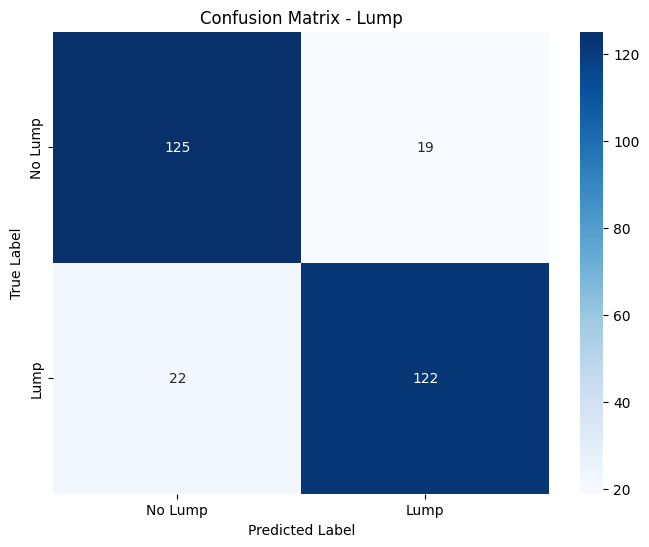


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.85      0.87      0.86       144
        Lump       0.87      0.85      0.86       144

    accuracy                           0.86       288
   macro avg       0.86      0.86      0.86       288
weighted avg       0.86      0.86      0.86       288


Confusion Matrix - Size:
[[ 21   6  19   2]
 [ 19   6  19   4]
 [ 20   4  11  13]
 [ 10   1   9 124]]


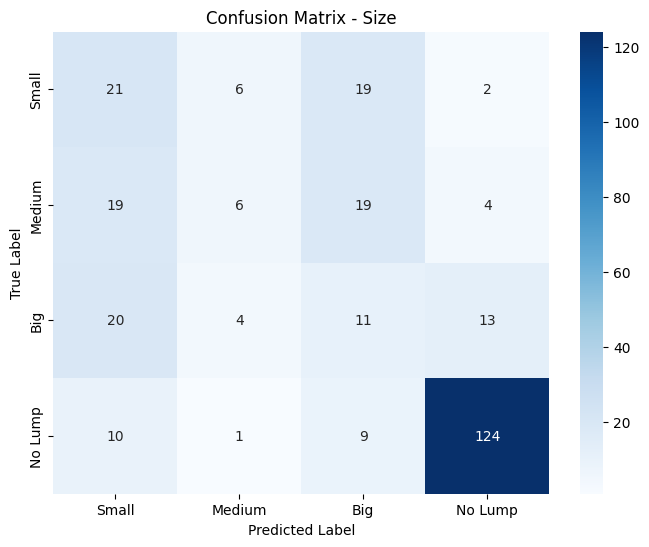


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.30      0.44      0.36        48
      Medium       0.35      0.12      0.18        48
         Big       0.19      0.23      0.21        48
     No Lump       0.87      0.86      0.86       144

    accuracy                           0.56       288
   macro avg       0.43      0.41      0.40       288
weighted avg       0.57      0.56      0.56       288


Confusion Matrix - Position:
[[  5  35   5   3]
 [ 10  27   1  10]
 [  6  23   3  16]
 [  2   5   3 134]]


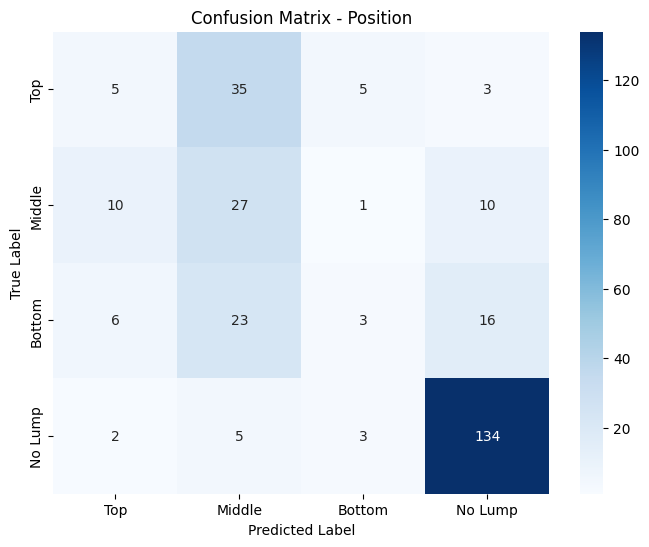


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.22      0.10      0.14        48
      Middle       0.30      0.56      0.39        48
      Bottom       0.25      0.06      0.10        48
     No Lump       0.82      0.93      0.87       144

    accuracy                           0.59       288
   macro avg       0.40      0.41      0.38       288
weighted avg       0.54      0.59      0.54       288


Fine-tuning with 2 additional trials from new dataset


Epoch 1, Training Loss: 1.5415, Validation Loss: 1.9533


Epoch 2, Training Loss: 1.5270, Validation Loss: 1.7714


Epoch 3, Training Loss: 1.4493, Validation Loss: 2.0116


Epoch 4, Training Loss: 1.4894, Validation Loss: 1.8137


Epoch 5, Training Loss: 1.4547, Validation Loss: 1.9893


Epoch 6, Training Loss: 1.4832, Validation Loss: 1.8109


Epoch 7, Training Loss: 1.4529, Validation Loss: 1.8997
Early stopping at epoch 7


Test Accuracy - Lump: 0.7917, Size: 0.2847, Position: 0.2708

Confusion Matrix - Lump:
[[ 86  58]
 [  2 142]]


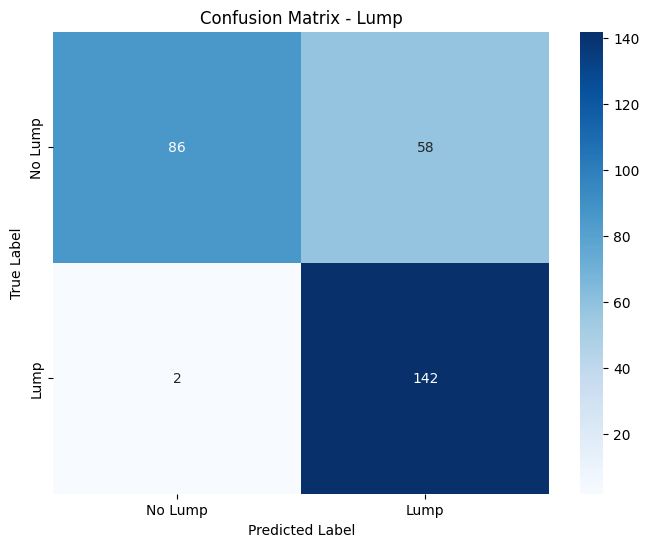


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.98      0.60      0.74       144
        Lump       0.71      0.99      0.83       144

    accuracy                           0.79       288
   macro avg       0.84      0.79      0.78       288
weighted avg       0.84      0.79      0.78       288


Confusion Matrix - Size:
[[24 15  8  1]
 [19 12 16  1]
 [15 25  2  6]
 [13 54 33 44]]


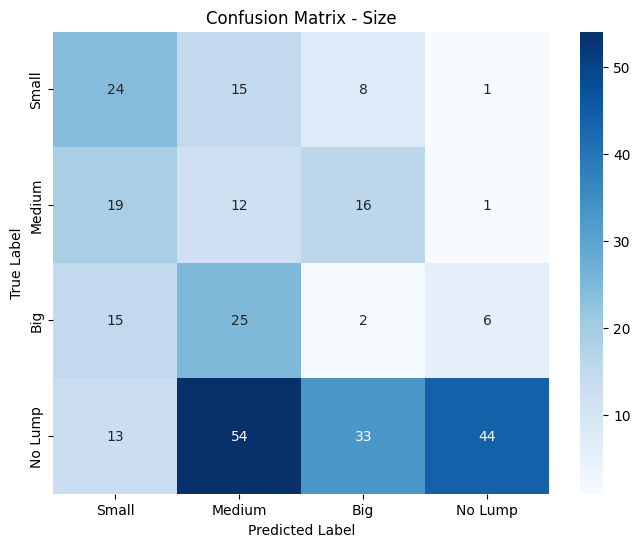


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.34      0.50      0.40        48
      Medium       0.11      0.25      0.16        48
         Big       0.03      0.04      0.04        48
     No Lump       0.85      0.31      0.45       144

    accuracy                           0.28       288
   macro avg       0.33      0.27      0.26       288
weighted avg       0.50      0.28      0.32       288


Confusion Matrix - Position:
[[ 5 42  0  1]
 [13 34  0  1]
 [12 28  0  8]
 [79 26  0 39]]


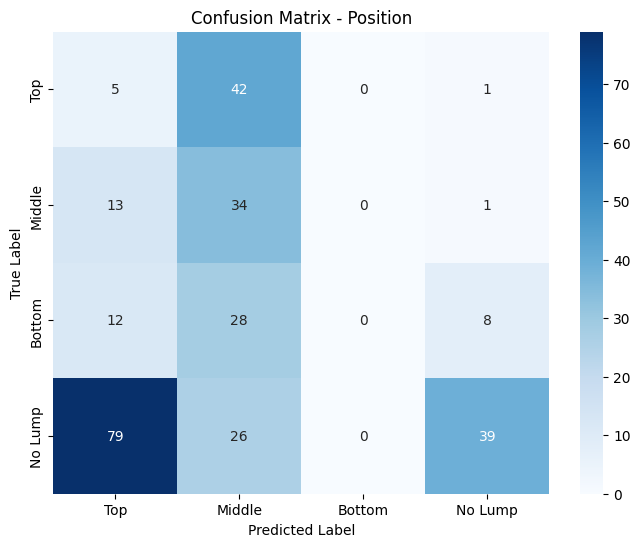


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.05      0.10      0.06        48
      Middle       0.26      0.71      0.38        48
      Bottom       0.00      0.00      0.00        48
     No Lump       0.80      0.27      0.40       144

    accuracy                           0.27       288
   macro avg       0.28      0.27      0.21       288
weighted avg       0.45      0.27      0.28       288


Fine-tuning with 3 additional trials from new dataset


Epoch 1, Training Loss: 1.4499, Validation Loss: 1.9717


Epoch 2, Training Loss: 1.3999, Validation Loss: 2.0235


Epoch 3, Training Loss: 1.4695, Validation Loss: 1.9354


Epoch 4, Training Loss: 1.4393, Validation Loss: 1.9252


Epoch 5, Training Loss: 1.3917, Validation Loss: 1.9786
Early stopping at epoch 5


Test Accuracy - Lump: 0.7986, Size: 0.4444, Position: 0.4514

Confusion Matrix - Lump:
[[ 86  58]
 [  0 144]]


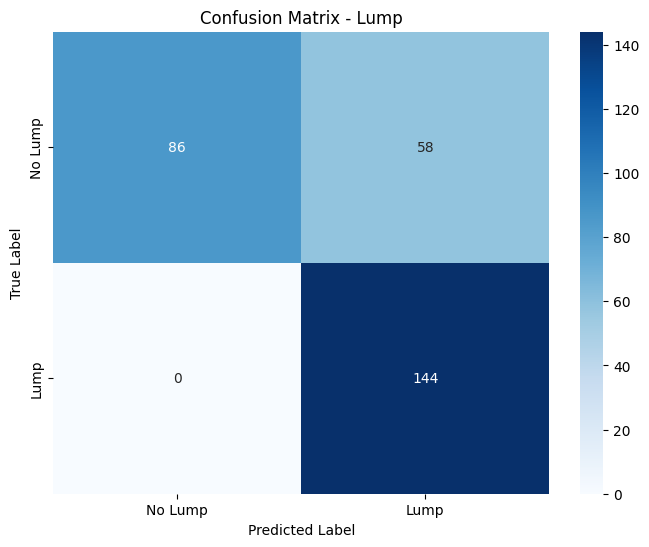


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       1.00      0.60      0.75       144
        Lump       0.71      1.00      0.83       144

    accuracy                           0.80       288
   macro avg       0.86      0.80      0.79       288
weighted avg       0.86      0.80      0.79       288


Confusion Matrix - Size:
[[18 23  6  1]
 [16 17 15  0]
 [11 27  9  1]
 [13 29 18 84]]


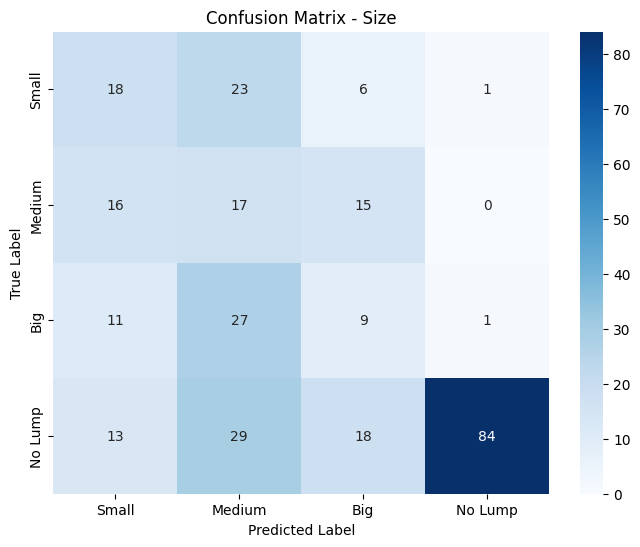


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.31      0.38      0.34        48
      Medium       0.18      0.35      0.24        48
         Big       0.19      0.19      0.19        48
     No Lump       0.98      0.58      0.73       144

    accuracy                           0.44       288
   macro avg       0.41      0.38      0.37       288
weighted avg       0.60      0.44      0.49       288


Confusion Matrix - Position:
[[ 3 15 30  0]
 [ 7 10 31  0]
 [ 4  6 36  2]
 [23  0 40 81]]


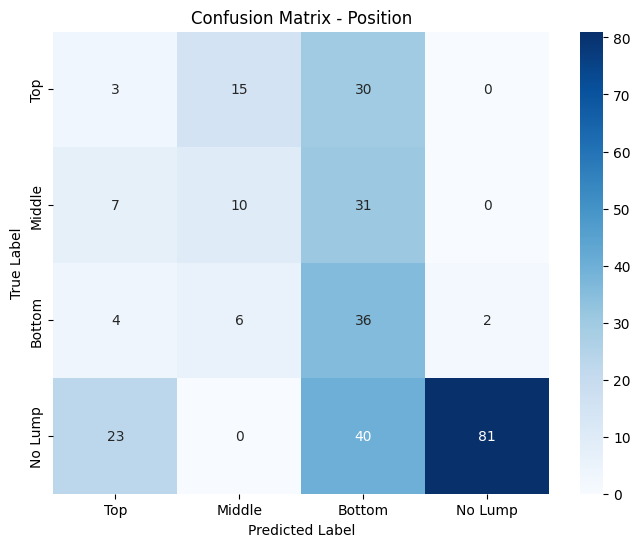


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.08      0.06      0.07        48
      Middle       0.32      0.21      0.25        48
      Bottom       0.26      0.75      0.39        48
     No Lump       0.98      0.56      0.71       144

    accuracy                           0.45       288
   macro avg       0.41      0.40      0.36       288
weighted avg       0.60      0.45      0.48       288


Fine-tuning with 4 additional trials from new dataset


Epoch 1, Training Loss: 1.4110, Validation Loss: 1.8502


Epoch 2, Training Loss: 1.3683, Validation Loss: 1.8662


Epoch 3, Training Loss: 1.4129, Validation Loss: 1.7749


Epoch 4, Training Loss: 1.4252, Validation Loss: 1.7328


Epoch 5, Training Loss: 1.3016, Validation Loss: 1.8607


Epoch 6, Training Loss: 1.3017, Validation Loss: 1.9015


Epoch 7, Training Loss: 1.2985, Validation Loss: 1.8843


Epoch 8, Training Loss: 1.2762, Validation Loss: 1.8843


Epoch 9, Training Loss: 1.3057, Validation Loss: 1.7664
Early stopping at epoch 9


Test Accuracy - Lump: 0.8472, Size: 0.5972, Position: 0.5868

Confusion Matrix - Lump:
[[126  18]
 [ 26 118]]


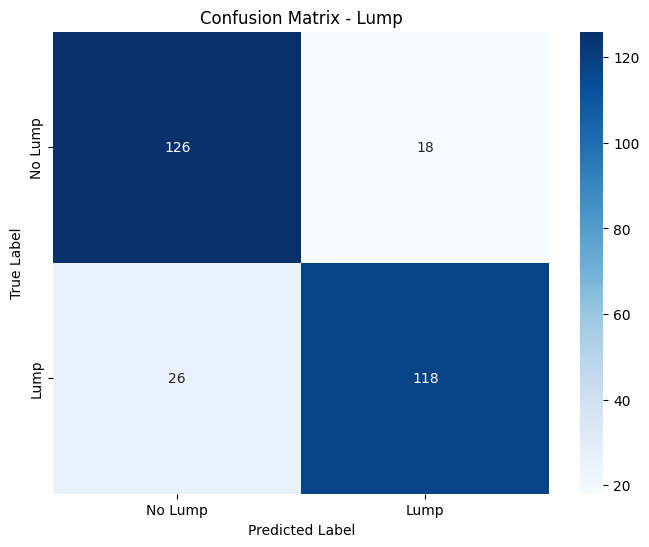


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.83      0.88      0.85       144
        Lump       0.87      0.82      0.84       144

    accuracy                           0.85       288
   macro avg       0.85      0.85      0.85       288
weighted avg       0.85      0.85      0.85       288


Confusion Matrix - Size:
[[ 26  12   2   8]
 [ 23   9   5  11]
 [ 14  11   3  20]
 [  7   1   2 134]]


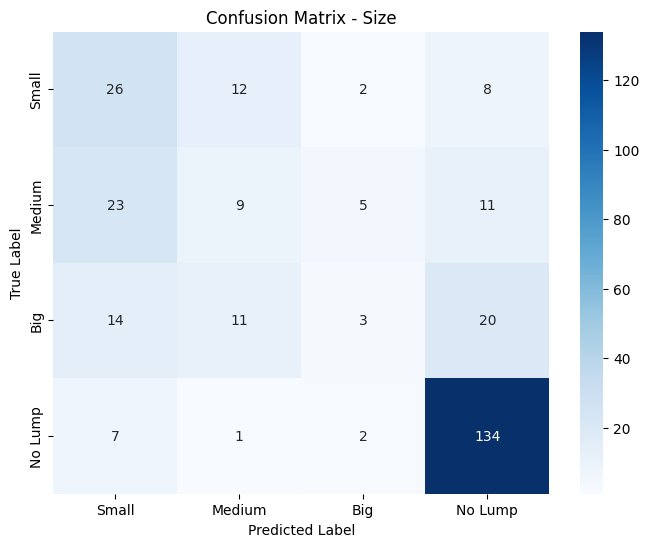


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.37      0.54      0.44        48
      Medium       0.27      0.19      0.22        48
         Big       0.25      0.06      0.10        48
     No Lump       0.77      0.93      0.85       144

    accuracy                           0.60       288
   macro avg       0.42      0.43      0.40       288
weighted avg       0.54      0.60      0.55       288


Confusion Matrix - Position:
[[  0  40   5   3]
 [  0  25   6  17]
 [  1  22   7  18]
 [  0   6   1 137]]


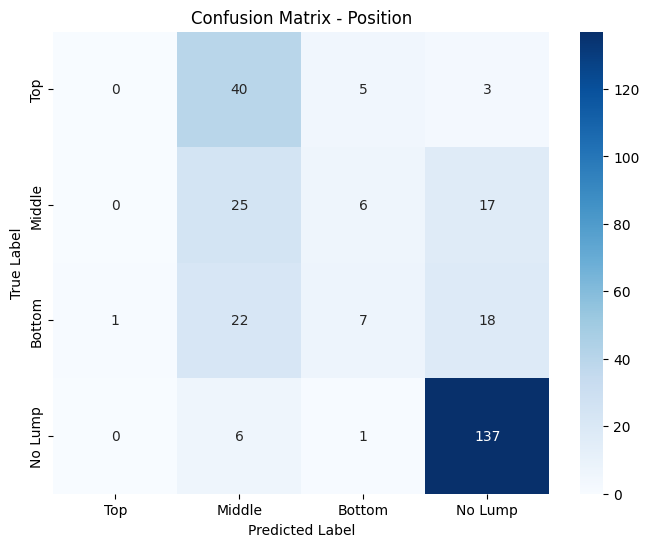


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.00      0.00      0.00        48
      Middle       0.27      0.52      0.35        48
      Bottom       0.37      0.15      0.21        48
     No Lump       0.78      0.95      0.86       144

    accuracy                           0.59       288
   macro avg       0.36      0.40      0.36       288
weighted avg       0.50      0.59      0.52       288


Fine-tuning with 5 additional trials from new dataset


Epoch 1, Training Loss: 1.2756, Validation Loss: 1.8488


Epoch 2, Training Loss: 1.2852, Validation Loss: 1.8819


Epoch 3, Training Loss: 1.2786, Validation Loss: 1.8768


Epoch 4, Training Loss: 1.2579, Validation Loss: 1.9845


Epoch 5, Training Loss: 1.2414, Validation Loss: 1.9376
Early stopping at epoch 5


Test Accuracy - Lump: 0.8924, Size: 0.6319, Position: 0.6146

Confusion Matrix - Lump:
[[125  19]
 [ 12 132]]


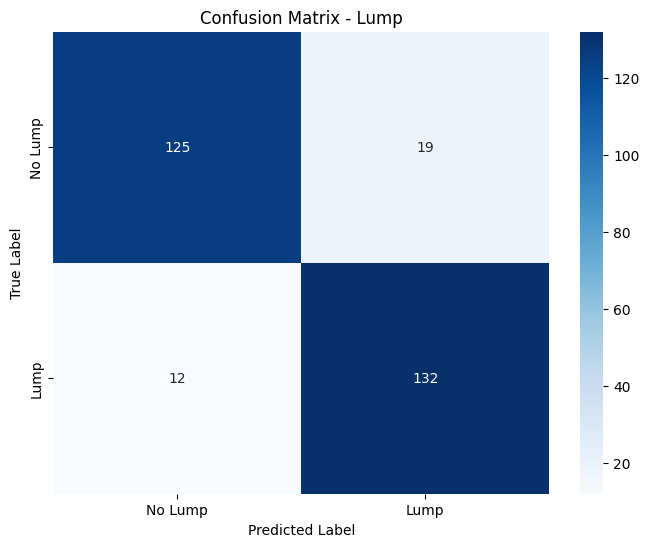


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.91      0.87      0.89       144
        Lump       0.87      0.92      0.89       144

    accuracy                           0.89       288
   macro avg       0.89      0.89      0.89       288
weighted avg       0.89      0.89      0.89       288


Confusion Matrix - Size:
[[ 30   4  11   3]
 [ 22   5  18   3]
 [ 14   7  10  17]
 [  3   0   4 137]]


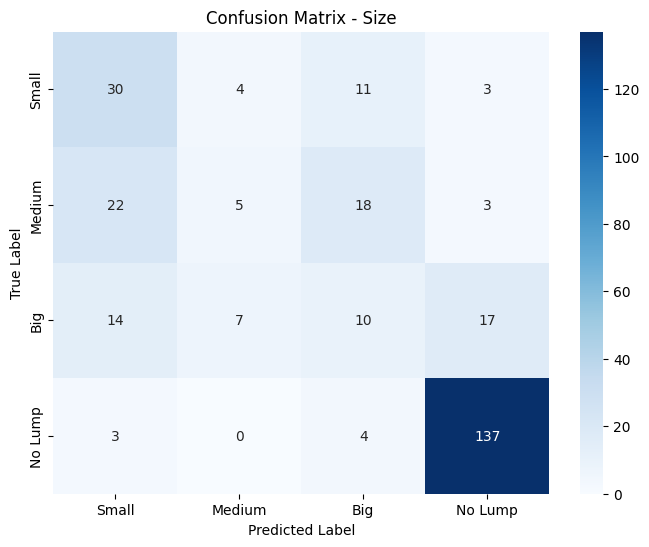


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.43      0.62      0.51        48
      Medium       0.31      0.10      0.16        48
         Big       0.23      0.21      0.22        48
     No Lump       0.86      0.95      0.90       144

    accuracy                           0.63       288
   macro avg       0.46      0.47      0.45       288
weighted avg       0.59      0.63      0.60       288


Confusion Matrix - Position:
[[ 16  24   2   6]
 [ 18  18   3   9]
 [ 15  18   4  11]
 [  3   1   1 139]]


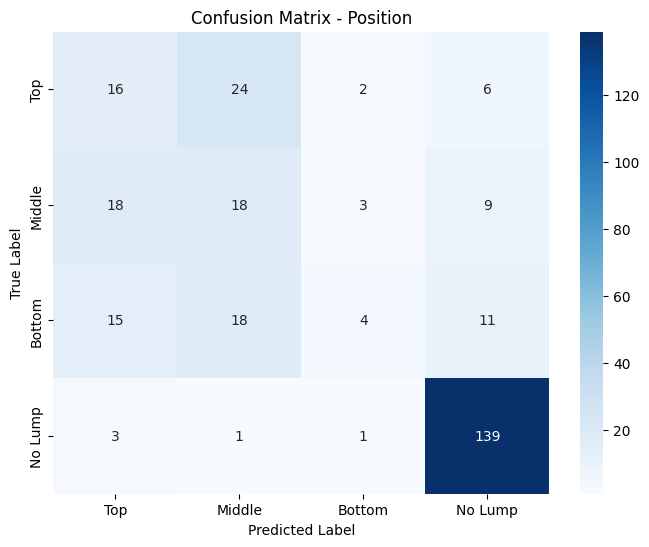


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.31      0.33      0.32        48
      Middle       0.30      0.38      0.33        48
      Bottom       0.40      0.08      0.14        48
     No Lump       0.84      0.97      0.90       144

    accuracy                           0.61       288
   macro avg       0.46      0.44      0.42       288
weighted avg       0.59      0.61      0.58       288



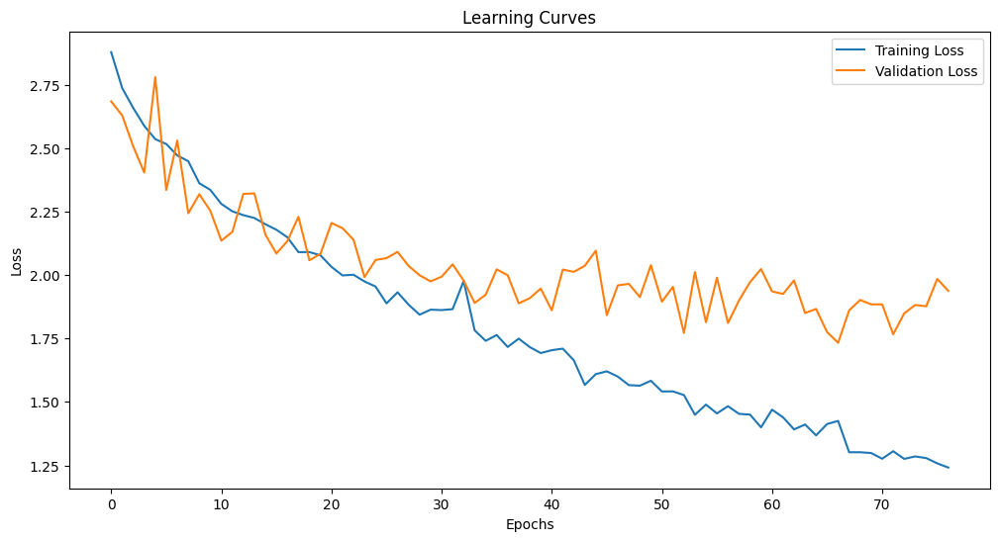

| Training Phase                         |   Lump Accuracy |   Size Accuracy |   Position Accuracy |
|:---------------------------------------|----------------:|----------------:|--------------------:|
| Initial Training                       |        0.8625   |        0.6875   |            0.626389 |
| Testing on doctors without fine-tuning |        0.5      |        0.159722 |            0.15625  |
| Fine-tuning with 1 trials              |        0.857639 |        0.5625   |            0.586806 |
| Fine-tuning with 2 trials              |        0.791667 |        0.284722 |            0.270833 |
| Fine-tuning with 3 trials              |        0.798611 |        0.444444 |            0.451389 |
| Fine-tuning with 4 trials              |        0.847222 |        0.597222 |            0.586806 |
| Fine-tuning with 5 trials              |        0.892361 |        0.631944 |            0.614583 |

Running experiment with tips_middle sensors and 2 seconds
Using 6 GPUs
Initial Training an

Epoch 1, Training Loss: 2.8612, Validation Loss: 2.5011


Epoch 2, Training Loss: 2.6620, Validation Loss: 2.4240


Epoch 3, Training Loss: 2.6399, Validation Loss: 2.4243


Epoch 4, Training Loss: 2.5720, Validation Loss: 2.3758


Epoch 5, Training Loss: 2.5613, Validation Loss: 2.3458


Epoch 6, Training Loss: 2.4877, Validation Loss: 2.3647


Epoch 7, Training Loss: 2.4547, Validation Loss: 2.4361


Epoch 8, Training Loss: 2.4251, Validation Loss: 2.3328


Epoch 9, Training Loss: 2.3858, Validation Loss: 2.2143


Epoch 10, Training Loss: 2.3098, Validation Loss: 2.2913


Epoch 11, Training Loss: 2.2714, Validation Loss: 2.2475


Epoch 12, Training Loss: 2.3235, Validation Loss: 2.2984


Epoch 13, Training Loss: 2.2579, Validation Loss: 2.1792


Epoch 14, Training Loss: 2.2678, Validation Loss: 2.1582


Epoch 15, Training Loss: 2.2062, Validation Loss: 2.2256


Epoch 16, Training Loss: 2.1822, Validation Loss: 2.1898


Epoch 17, Training Loss: 2.1709, Validation Loss: 2.0948


Epoch 18, Training Loss: 2.1238, Validation Loss: 2.1323


Epoch 19, Training Loss: 2.0616, Validation Loss: 1.9778


Epoch 20, Training Loss: 2.0847, Validation Loss: 2.0674


Epoch 21, Training Loss: 2.0476, Validation Loss: 2.0658


Epoch 22, Training Loss: 2.0023, Validation Loss: 2.0904


Epoch 23, Training Loss: 1.9782, Validation Loss: 2.0714


Epoch 24, Training Loss: 1.9752, Validation Loss: 1.8946


Epoch 25, Training Loss: 1.9612, Validation Loss: 1.9360


Epoch 26, Training Loss: 1.9501, Validation Loss: 1.9765


Epoch 27, Training Loss: 1.8804, Validation Loss: 1.9495


Epoch 28, Training Loss: 1.8738, Validation Loss: 1.9364


Epoch 29, Training Loss: 1.8745, Validation Loss: 2.0608
Early stopping at epoch 29


Test Accuracy - Lump: 0.8514, Size: 0.6917, Position: 0.6208

Confusion Matrix - Lump:
[[332  28]
 [ 79 281]]


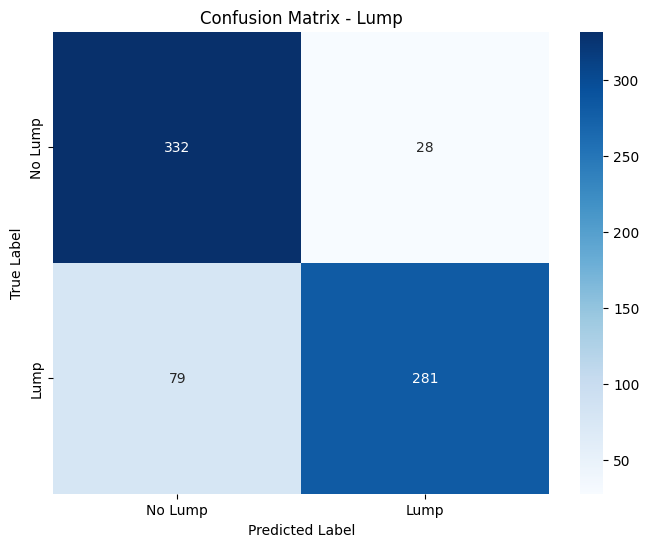


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.81      0.92      0.86       360
        Lump       0.91      0.78      0.84       360

    accuracy                           0.85       720
   macro avg       0.86      0.85      0.85       720
weighted avg       0.86      0.85      0.85       720


Confusion Matrix - Size:
[[ 82  10   3  25]
 [ 39  37  12  32]
 [ 22  13  41  44]
 [ 15   0   7 338]]


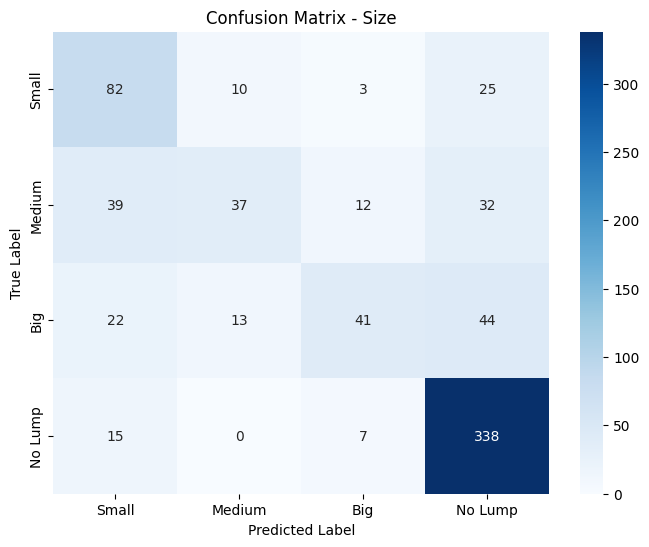


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.52      0.68      0.59       120
      Medium       0.62      0.31      0.41       120
         Big       0.65      0.34      0.45       120
     No Lump       0.77      0.94      0.85       360

    accuracy                           0.69       720
   macro avg       0.64      0.57      0.57       720
weighted avg       0.68      0.69      0.66       720


Confusion Matrix - Position:
[[ 32  28  22  38]
 [ 12  42  25  41]
 [ 15  35  33  37]
 [  2   9   9 340]]


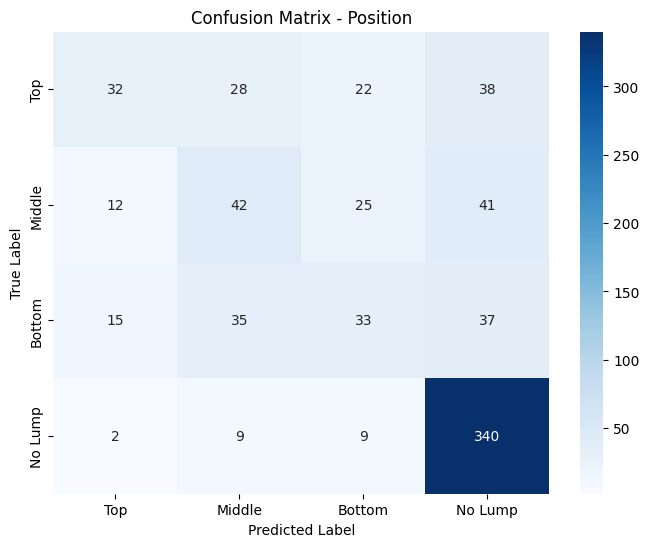


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.52      0.27      0.35       120
      Middle       0.37      0.35      0.36       120
      Bottom       0.37      0.28      0.32       120
     No Lump       0.75      0.94      0.83       360

    accuracy                           0.62       720
   macro avg       0.50      0.46      0.47       720
weighted avg       0.58      0.62      0.59       720


Testing on doctors' data without fine-tuning:


Test Accuracy - Lump: 0.4444, Size: 0.2083, Position: 0.2049

Confusion Matrix - Lump:
[[ 18 126]
 [ 34 110]]


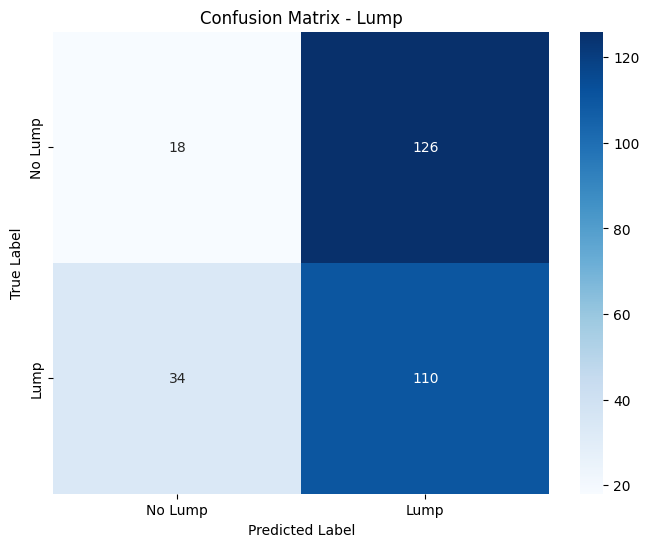


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.35      0.12      0.18       144
        Lump       0.47      0.76      0.58       144

    accuracy                           0.44       288
   macro avg       0.41      0.44      0.38       288
weighted avg       0.41      0.44      0.38       288


Confusion Matrix - Size:
[[43  0  0  5]
 [37  0  0 11]
 [42  0  0  6]
 [80  0 47 17]]


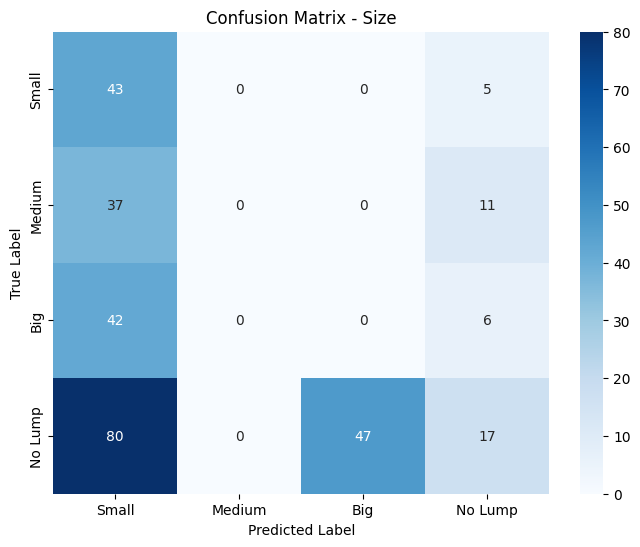


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.21      0.90      0.34        48
      Medium       0.00      0.00      0.00        48
         Big       0.00      0.00      0.00        48
     No Lump       0.44      0.12      0.19       144

    accuracy                           0.21       288
   macro avg       0.16      0.25      0.13       288
weighted avg       0.25      0.21      0.15       288


Confusion Matrix - Position:
[[  0   2  18  28]
 [  0   1  22  25]
 [  0   1  33  14]
 [  0   1 118  25]]


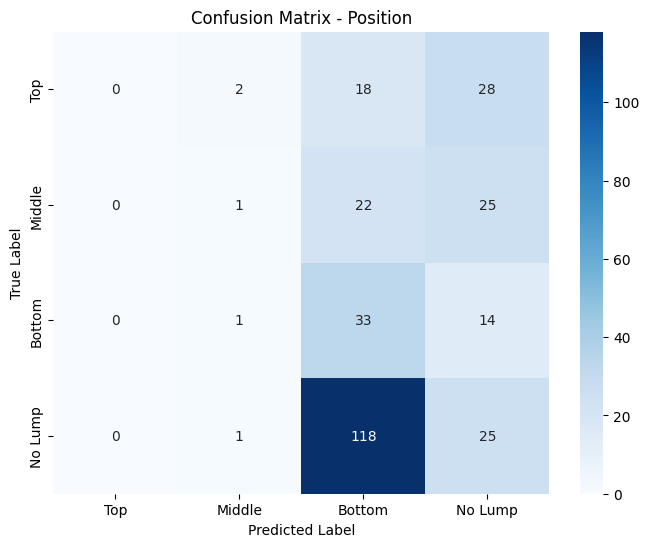


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.00      0.00      0.00        48
      Middle       0.20      0.02      0.04        48
      Bottom       0.17      0.69      0.28        48
     No Lump       0.27      0.17      0.21       144

    accuracy                           0.20       288
   macro avg       0.16      0.22      0.13       288
weighted avg       0.20      0.20      0.16       288


Fine-tuning with 1 additional trials from new dataset


Epoch 1, Training Loss: 1.8485, Validation Loss: 1.9041


Epoch 2, Training Loss: 1.8683, Validation Loss: 1.9416


Epoch 3, Training Loss: 1.8312, Validation Loss: 2.0908


Epoch 4, Training Loss: 1.7748, Validation Loss: 1.9950


Epoch 5, Training Loss: 1.8412, Validation Loss: 2.0331
Early stopping at epoch 5


Test Accuracy - Lump: 0.5486, Size: 0.4167, Position: 0.3889

Confusion Matrix - Lump:
[[108  36]
 [ 94  50]]


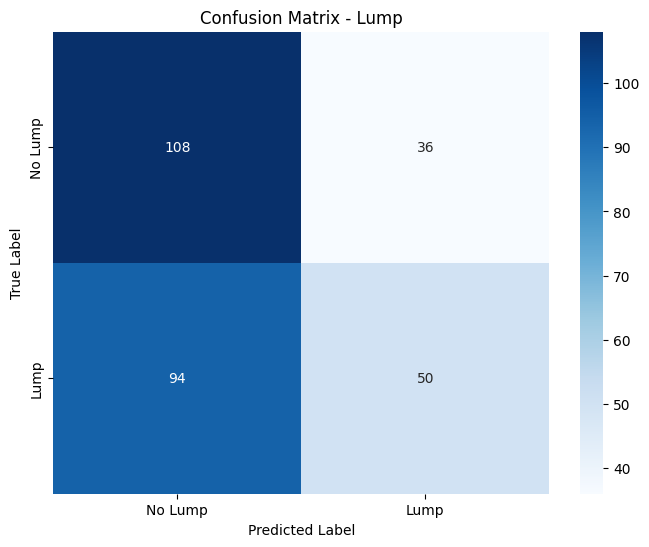


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.53      0.75      0.62       144
        Lump       0.58      0.35      0.43       144

    accuracy                           0.55       288
   macro avg       0.56      0.55      0.53       288
weighted avg       0.56      0.55      0.53       288


Confusion Matrix - Size:
[[43  0  0  5]
 [37  0  1 10]
 [36  0  0 12]
 [32  0 35 77]]


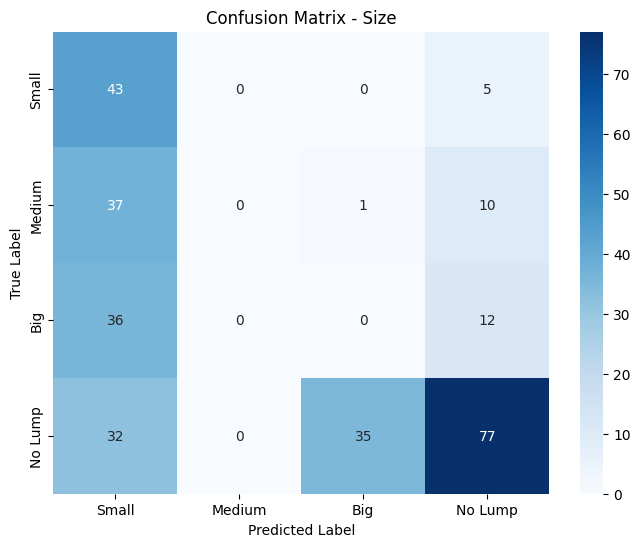


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.29      0.90      0.44        48
      Medium       0.00      0.00      0.00        48
         Big       0.00      0.00      0.00        48
     No Lump       0.74      0.53      0.62       144

    accuracy                           0.42       288
   macro avg       0.26      0.36      0.26       288
weighted avg       0.42      0.42      0.38       288


Confusion Matrix - Position:
[[  1  22   0  25]
 [  0   6   0  42]
 [  0  15   0  33]
 [ 36   3   0 105]]


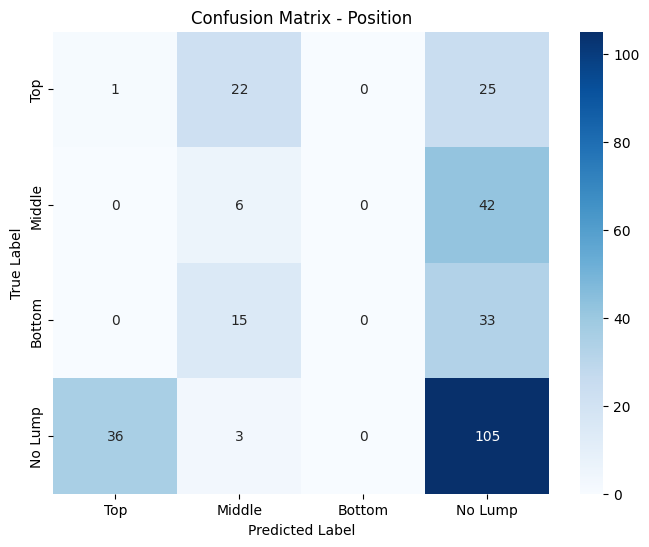


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.03      0.02      0.02        48
      Middle       0.13      0.12      0.13        48
      Bottom       0.00      0.00      0.00        48
     No Lump       0.51      0.73      0.60       144

    accuracy                           0.39       288
   macro avg       0.17      0.22      0.19       288
weighted avg       0.28      0.39      0.33       288


Fine-tuning with 2 additional trials from new dataset


Epoch 1, Training Loss: 1.7612, Validation Loss: 1.8774


Epoch 2, Training Loss: 1.7853, Validation Loss: 1.9540


Epoch 3, Training Loss: 1.7669, Validation Loss: 1.7798


Epoch 4, Training Loss: 1.7349, Validation Loss: 1.8807


Epoch 5, Training Loss: 1.7291, Validation Loss: 1.8772


Epoch 6, Training Loss: 1.7257, Validation Loss: 1.8980


Epoch 7, Training Loss: 1.7169, Validation Loss: 1.8103


Epoch 8, Training Loss: 1.6853, Validation Loss: 1.7888
Early stopping at epoch 8


Test Accuracy - Lump: 0.7778, Size: 0.4549, Position: 0.5382

Confusion Matrix - Lump:
[[ 87  57]
 [  7 137]]


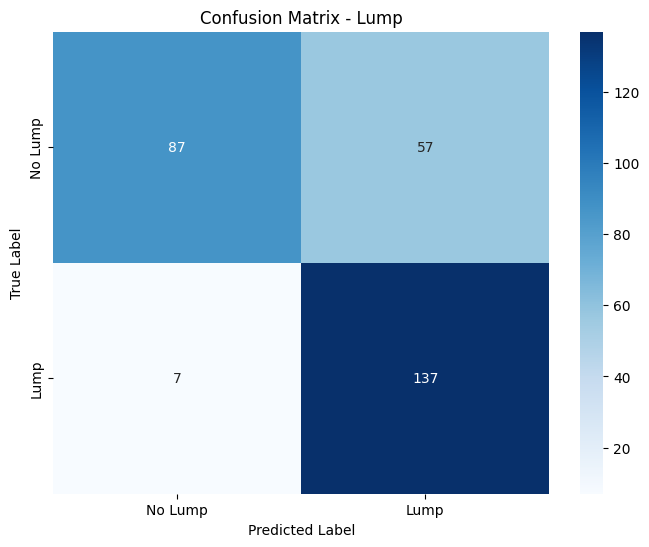


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.93      0.60      0.73       144
        Lump       0.71      0.95      0.81       144

    accuracy                           0.78       288
   macro avg       0.82      0.78      0.77       288
weighted avg       0.82      0.78      0.77       288


Confusion Matrix - Size:
[[33  5  3  7]
 [29  2  5 12]
 [34  2  5  7]
 [27  4 22 91]]


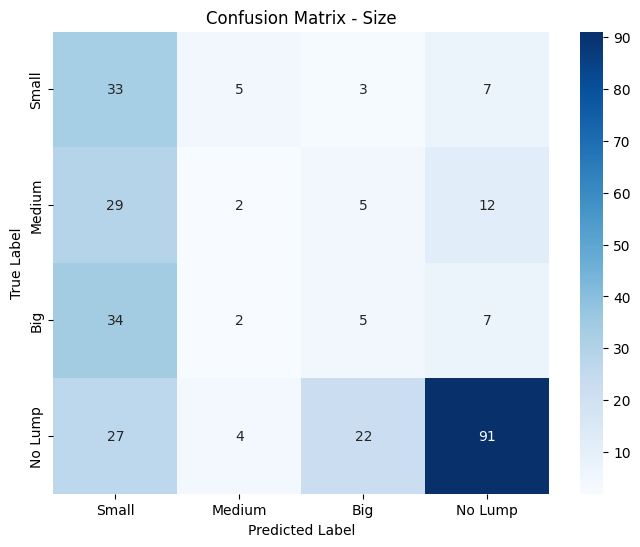


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.27      0.69      0.39        48
      Medium       0.15      0.04      0.07        48
         Big       0.14      0.10      0.12        48
     No Lump       0.78      0.63      0.70       144

    accuracy                           0.45       288
   macro avg       0.34      0.37      0.32       288
weighted avg       0.48      0.45      0.44       288


Confusion Matrix - Position:
[[  3  10  32   3]
 [  1  10  26  11]
 [  2  12  26   8]
 [  6   4  18 116]]


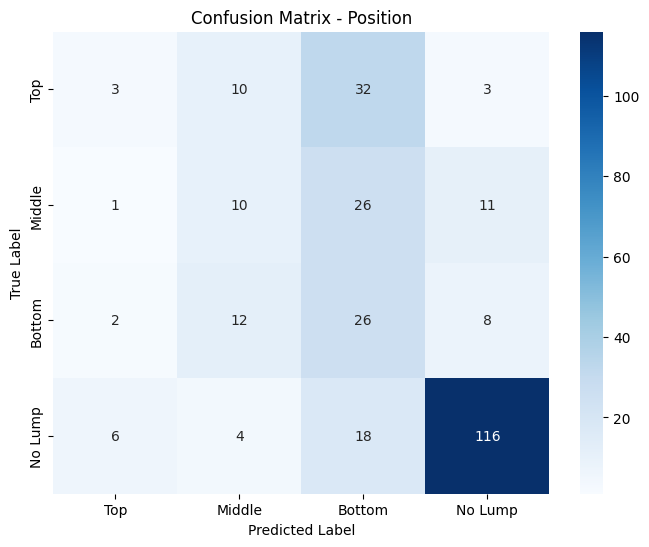


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.25      0.06      0.10        48
      Middle       0.28      0.21      0.24        48
      Bottom       0.25      0.54      0.35        48
     No Lump       0.84      0.81      0.82       144

    accuracy                           0.54       288
   macro avg       0.41      0.40      0.38       288
weighted avg       0.55      0.54      0.53       288


Fine-tuning with 3 additional trials from new dataset


Epoch 1, Training Loss: 1.6514, Validation Loss: 2.0093


Epoch 2, Training Loss: 1.6586, Validation Loss: 1.8341


Epoch 3, Training Loss: 1.6595, Validation Loss: 1.7950


Epoch 4, Training Loss: 1.6782, Validation Loss: 1.9021


Epoch 5, Training Loss: 1.6868, Validation Loss: 1.8489
Early stopping at epoch 5


Test Accuracy - Lump: 0.8368, Size: 0.5868, Position: 0.5833

Confusion Matrix - Lump:
[[136   8]
 [ 39 105]]


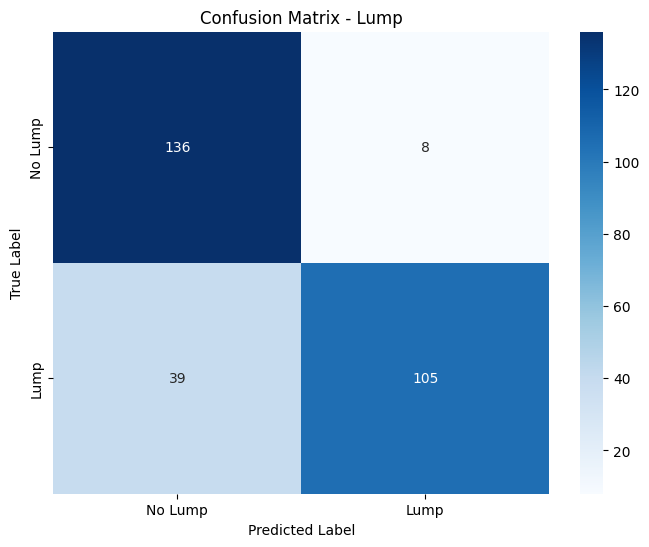


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.78      0.94      0.85       144
        Lump       0.93      0.73      0.82       144

    accuracy                           0.84       288
   macro avg       0.85      0.84      0.83       288
weighted avg       0.85      0.84      0.83       288


Confusion Matrix - Size:
[[ 38   0   0  10]
 [ 28   0   2  18]
 [ 33   0   0  15]
 [ 10   0   3 131]]


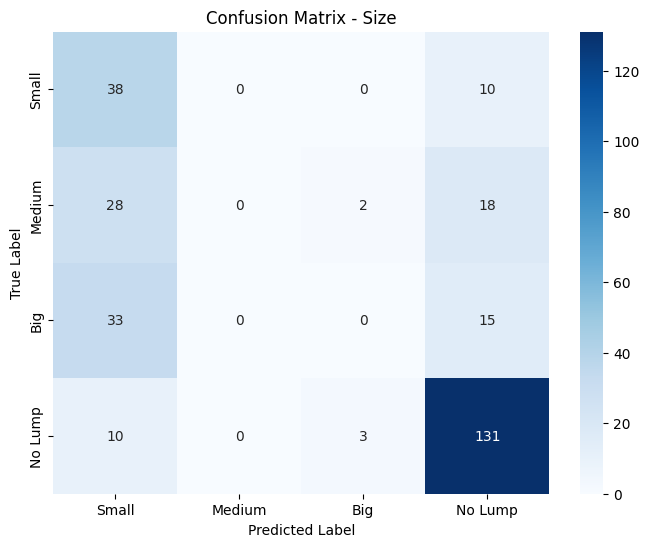


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.35      0.79      0.48        48
      Medium       0.00      0.00      0.00        48
         Big       0.00      0.00      0.00        48
     No Lump       0.75      0.91      0.82       144

    accuracy                           0.59       288
   macro avg       0.28      0.43      0.33       288
weighted avg       0.43      0.59      0.49       288


Confusion Matrix - Position:
[[  2   4  31  11]
 [  2   1  16  29]
 [  1   0  23  24]
 [  1   0   1 142]]


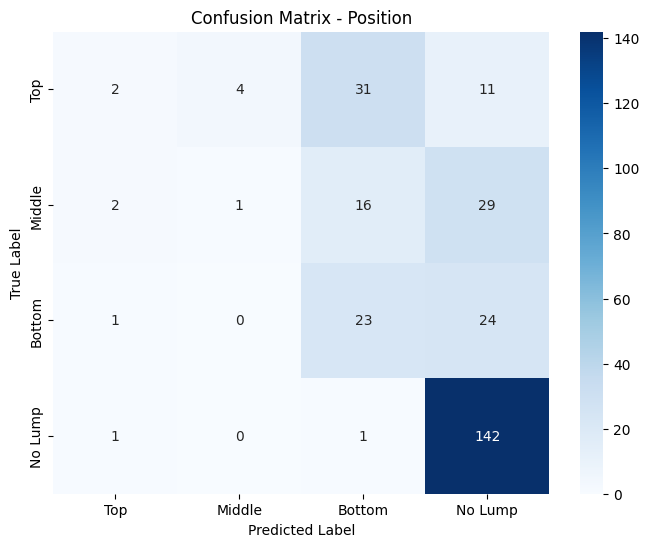


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.33      0.04      0.07        48
      Middle       0.20      0.02      0.04        48
      Bottom       0.32      0.48      0.39        48
     No Lump       0.69      0.99      0.81       144

    accuracy                           0.58       288
   macro avg       0.39      0.38      0.33       288
weighted avg       0.49      0.58      0.49       288


Fine-tuning with 4 additional trials from new dataset


Epoch 1, Training Loss: 1.6114, Validation Loss: 1.7901


Epoch 2, Training Loss: 1.6029, Validation Loss: 1.8650


Epoch 3, Training Loss: 1.5648, Validation Loss: 1.7614


Epoch 4, Training Loss: 1.5502, Validation Loss: 1.7872


Epoch 5, Training Loss: 1.5635, Validation Loss: 1.6869


Epoch 6, Training Loss: 1.5345, Validation Loss: 1.7903


Epoch 7, Training Loss: 1.5510, Validation Loss: 1.6890


Epoch 8, Training Loss: 1.5655, Validation Loss: 1.7088


Epoch 9, Training Loss: 1.4694, Validation Loss: 1.7857


Epoch 10, Training Loss: 1.4968, Validation Loss: 1.8100
Early stopping at epoch 10


Test Accuracy - Lump: 0.8368, Size: 0.6146, Position: 0.5799

Confusion Matrix - Lump:
[[141   3]
 [ 44 100]]


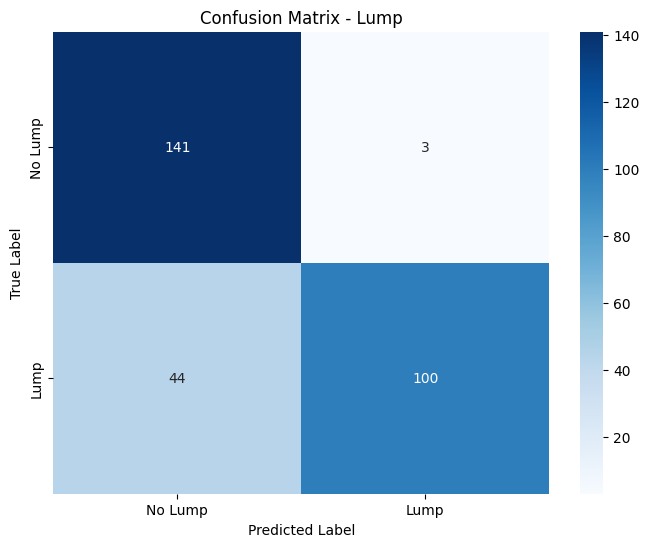


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.76      0.98      0.86       144
        Lump       0.97      0.69      0.81       144

    accuracy                           0.84       288
   macro avg       0.87      0.84      0.83       288
weighted avg       0.87      0.84      0.83       288


Confusion Matrix - Size:
[[ 18   2   6  22]
 [  7   6  10  25]
 [  4   0  11  33]
 [  1   1   0 142]]


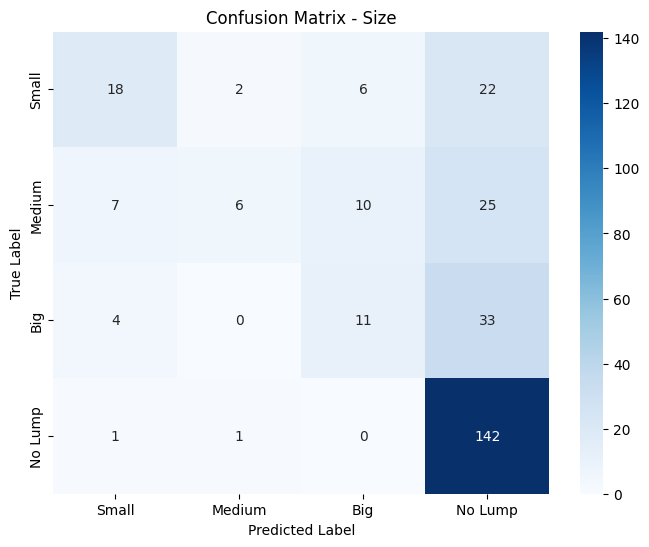


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.60      0.38      0.46        48
      Medium       0.67      0.12      0.21        48
         Big       0.41      0.23      0.29        48
     No Lump       0.64      0.99      0.78       144

    accuracy                           0.61       288
   macro avg       0.58      0.43      0.44       288
weighted avg       0.60      0.61      0.55       288


Confusion Matrix - Position:
[[ 20   2   1  25]
 [ 18   3   2  25]
 [ 15   2   1  30]
 [  1   0   0 143]]


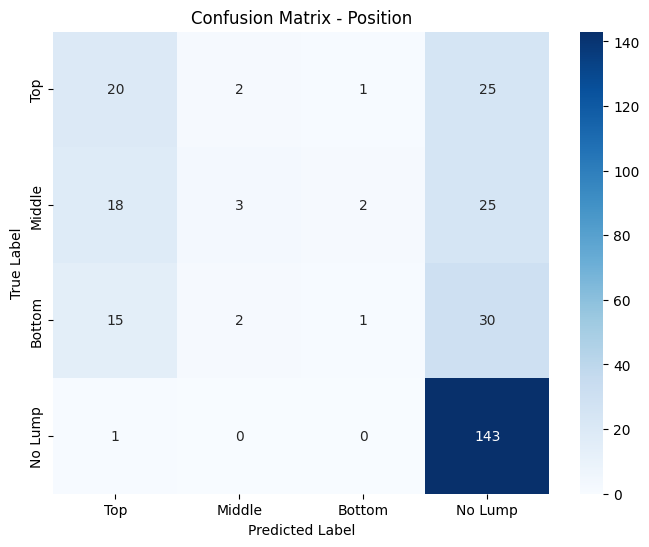


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.37      0.42      0.39        48
      Middle       0.43      0.06      0.11        48
      Bottom       0.25      0.02      0.04        48
     No Lump       0.64      0.99      0.78       144

    accuracy                           0.58       288
   macro avg       0.42      0.37      0.33       288
weighted avg       0.50      0.58      0.48       288


Fine-tuning with 5 additional trials from new dataset


Epoch 1, Training Loss: 1.4576, Validation Loss: 1.7304


Epoch 2, Training Loss: 1.4607, Validation Loss: 1.7138


Epoch 3, Training Loss: 1.5219, Validation Loss: 1.6144


Epoch 4, Training Loss: 1.4563, Validation Loss: 1.7401


Epoch 5, Training Loss: 1.4272, Validation Loss: 1.6918


Epoch 6, Training Loss: 1.4287, Validation Loss: 1.6470


Epoch 7, Training Loss: 1.4285, Validation Loss: 1.7863


Epoch 8, Training Loss: 1.3508, Validation Loss: 2.0483
Early stopping at epoch 8


Test Accuracy - Lump: 0.8715, Size: 0.6215, Position: 0.6215

Confusion Matrix - Lump:
[[118  26]
 [ 11 133]]


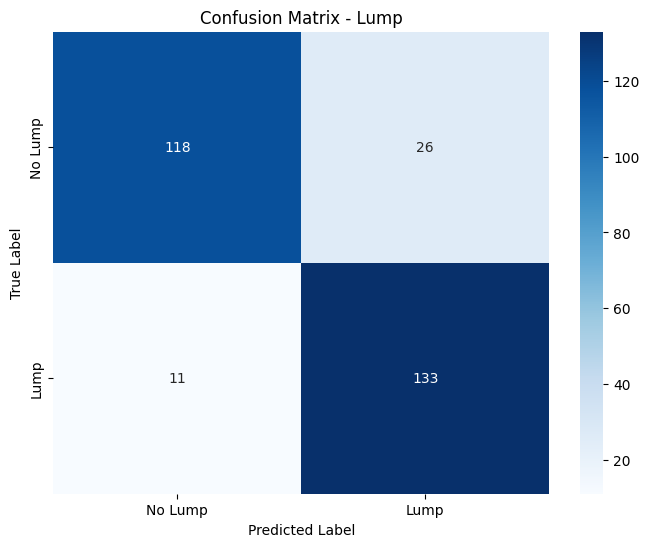


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.91      0.82      0.86       144
        Lump       0.84      0.92      0.88       144

    accuracy                           0.87       288
   macro avg       0.88      0.87      0.87       288
weighted avg       0.88      0.87      0.87       288


Confusion Matrix - Size:
[[ 29   7   9   3]
 [ 26   6  13   3]
 [ 14   6  14  14]
 [  4   4   6 130]]


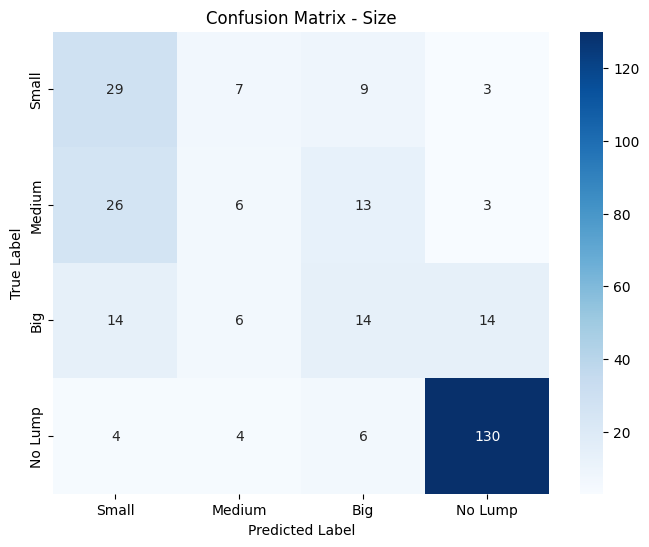


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.40      0.60      0.48        48
      Medium       0.26      0.12      0.17        48
         Big       0.33      0.29      0.31        48
     No Lump       0.87      0.90      0.88       144

    accuracy                           0.62       288
   macro avg       0.46      0.48      0.46       288
weighted avg       0.60      0.62      0.60       288


Confusion Matrix - Position:
[[  1  21  23   3]
 [  0  24  16   8]
 [  0  17  24   7]
 [  0   8   6 130]]


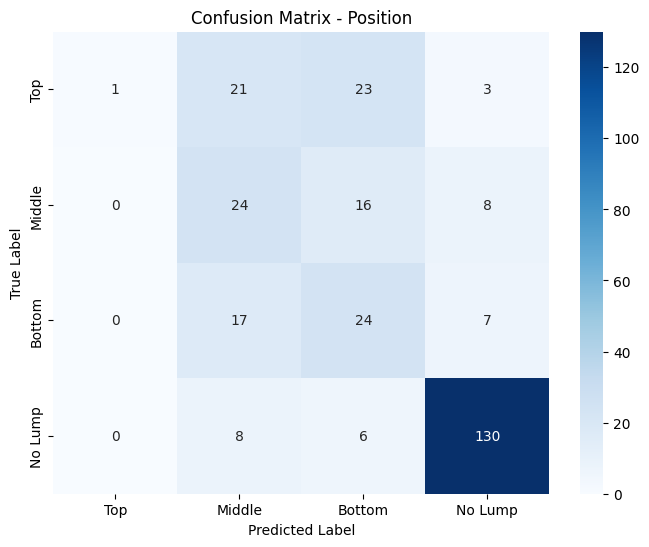


Classification Report - Position:
              precision    recall  f1-score   support

         Top       1.00      0.02      0.04        48
      Middle       0.34      0.50      0.41        48
      Bottom       0.35      0.50      0.41        48
     No Lump       0.88      0.90      0.89       144

    accuracy                           0.62       288
   macro avg       0.64      0.48      0.44       288
weighted avg       0.72      0.62      0.59       288

Few-shot early stopping at step 5


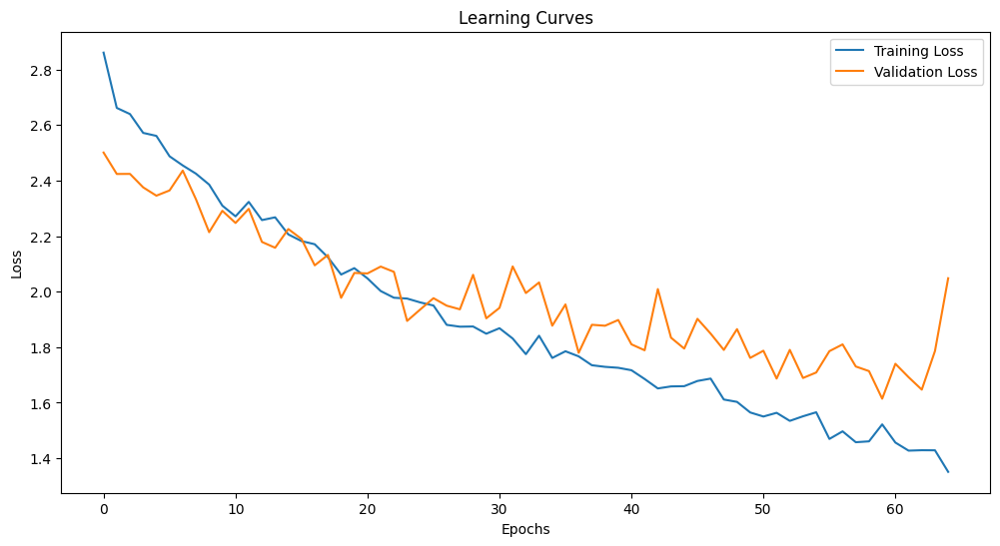

| Training Phase                         |   Lump Accuracy |   Size Accuracy |   Position Accuracy |
|:---------------------------------------|----------------:|----------------:|--------------------:|
| Initial Training                       |        0.851389 |        0.691667 |            0.620833 |
| Testing on doctors without fine-tuning |        0.444444 |        0.208333 |            0.204861 |
| Fine-tuning with 1 trials              |        0.548611 |        0.416667 |            0.388889 |
| Fine-tuning with 2 trials              |        0.777778 |        0.454861 |            0.538194 |
| Fine-tuning with 3 trials              |        0.836806 |        0.586806 |            0.583333 |
| Fine-tuning with 4 trials              |        0.836806 |        0.614583 |            0.579861 |
| Fine-tuning with 5 trials              |        0.871528 |        0.621528 |            0.621528 |

Running experiment with tips_middle sensors and 3 seconds
Using 6 GPUs
Initial Training an

Epoch 1, Training Loss: 2.8387, Validation Loss: 2.5029


Epoch 2, Training Loss: 2.7054, Validation Loss: 2.4028


Epoch 3, Training Loss: 2.6104, Validation Loss: 2.5281


Epoch 4, Training Loss: 2.5518, Validation Loss: 2.3993


Epoch 5, Training Loss: 2.4991, Validation Loss: 2.3365


Epoch 6, Training Loss: 2.4649, Validation Loss: 2.3130


Epoch 7, Training Loss: 2.4036, Validation Loss: 2.2884


Epoch 8, Training Loss: 2.4235, Validation Loss: 2.5014


Epoch 9, Training Loss: 2.3520, Validation Loss: 2.5159


Epoch 10, Training Loss: 2.3280, Validation Loss: 2.3185


Epoch 11, Training Loss: 2.2816, Validation Loss: 2.2221


Epoch 12, Training Loss: 2.2685, Validation Loss: 2.1665


Epoch 13, Training Loss: 2.2242, Validation Loss: 2.1336


Epoch 14, Training Loss: 2.1830, Validation Loss: 2.1005


Epoch 15, Training Loss: 2.1619, Validation Loss: 2.0193


Epoch 16, Training Loss: 2.1622, Validation Loss: 2.0797


Epoch 17, Training Loss: 2.0888, Validation Loss: 2.1851


Epoch 18, Training Loss: 2.0948, Validation Loss: 2.0042


Epoch 19, Training Loss: 2.0172, Validation Loss: 2.1601


Epoch 20, Training Loss: 2.0456, Validation Loss: 2.0077


Epoch 21, Training Loss: 2.0141, Validation Loss: 1.9324


Epoch 22, Training Loss: 1.9892, Validation Loss: 1.9159


Epoch 23, Training Loss: 1.9338, Validation Loss: 1.8158


Epoch 24, Training Loss: 1.9345, Validation Loss: 2.0426


Epoch 25, Training Loss: 1.9112, Validation Loss: 1.8505


Epoch 26, Training Loss: 1.8699, Validation Loss: 1.9372


Epoch 27, Training Loss: 1.8141, Validation Loss: 1.8583


Epoch 28, Training Loss: 1.8414, Validation Loss: 1.8536
Early stopping at epoch 28


Test Accuracy - Lump: 0.8750, Size: 0.7333, Position: 0.6583

Confusion Matrix - Lump:
[[330  30]
 [ 60 300]]


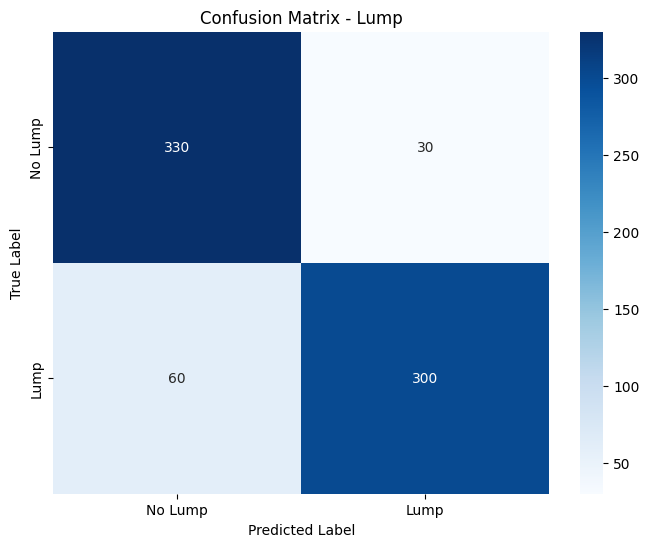


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.85      0.92      0.88       360
        Lump       0.91      0.83      0.87       360

    accuracy                           0.88       720
   macro avg       0.88      0.88      0.87       720
weighted avg       0.88      0.88      0.87       720


Confusion Matrix - Size:
[[ 70  18   6  26]
 [ 22  56  17  25]
 [  7  22  65  26]
 [ 10   6   7 337]]


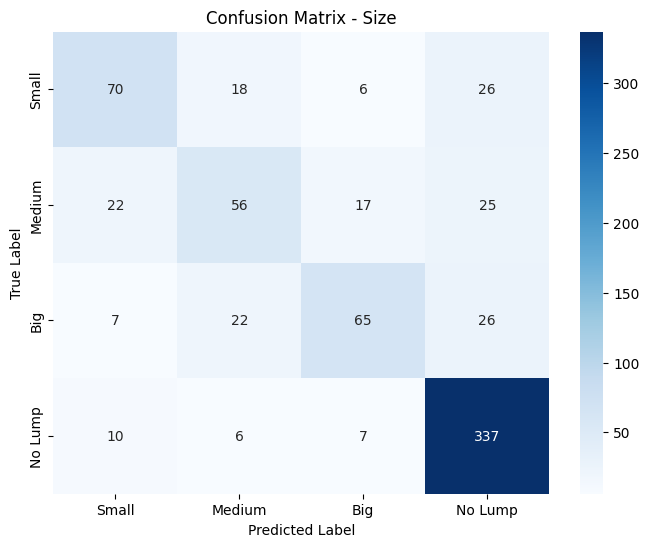


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.64      0.58      0.61       120
      Medium       0.55      0.47      0.50       120
         Big       0.68      0.54      0.60       120
     No Lump       0.81      0.94      0.87       360

    accuracy                           0.73       720
   macro avg       0.67      0.63      0.65       720
weighted avg       0.72      0.73      0.72       720


Confusion Matrix - Position:
[[ 45  14  29  32]
 [ 32  28  23  37]
 [ 23  18  55  24]
 [  9   3   2 346]]


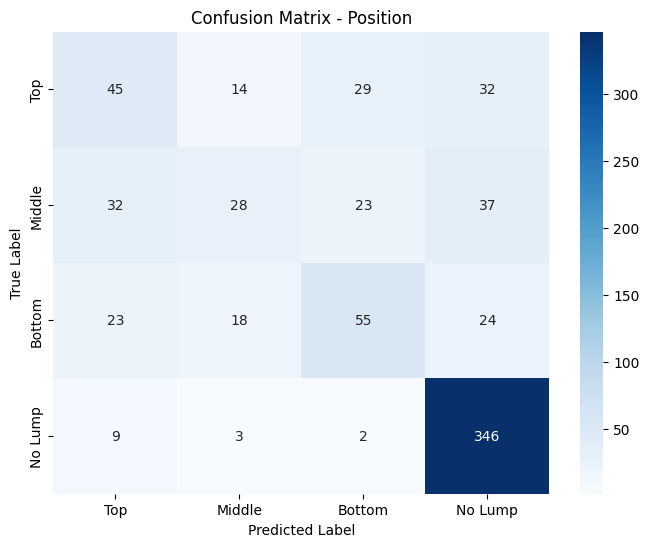


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.41      0.38      0.39       120
      Middle       0.44      0.23      0.31       120
      Bottom       0.50      0.46      0.48       120
     No Lump       0.79      0.96      0.87       360

    accuracy                           0.66       720
   macro avg       0.54      0.51      0.51       720
weighted avg       0.62      0.66      0.63       720


Testing on doctors' data without fine-tuning:


Test Accuracy - Lump: 0.5000, Size: 0.1736, Position: 0.1840

Confusion Matrix - Lump:
[[  0 144]
 [  0 144]]


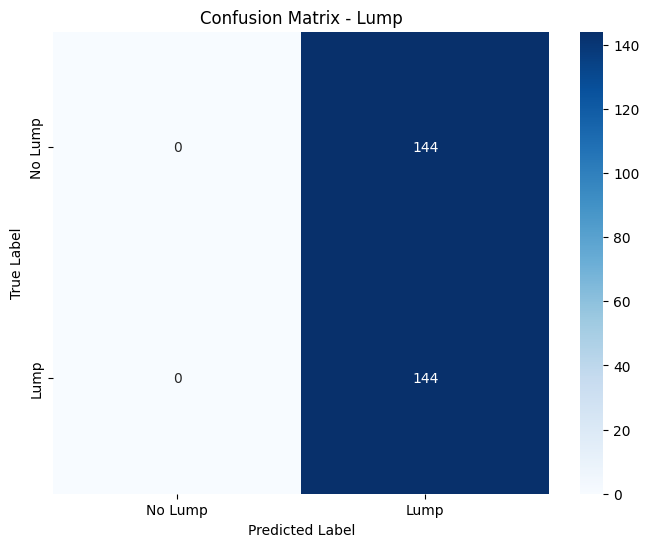


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.00      0.00      0.00       144
        Lump       0.50      1.00      0.67       144

    accuracy                           0.50       288
   macro avg       0.25      0.50      0.33       288
weighted avg       0.25      0.50      0.33       288


Confusion Matrix - Size:
[[ 32   5  10   1]
 [ 22   6  18   2]
 [ 31   9   7   1]
 [ 28   4 107   5]]


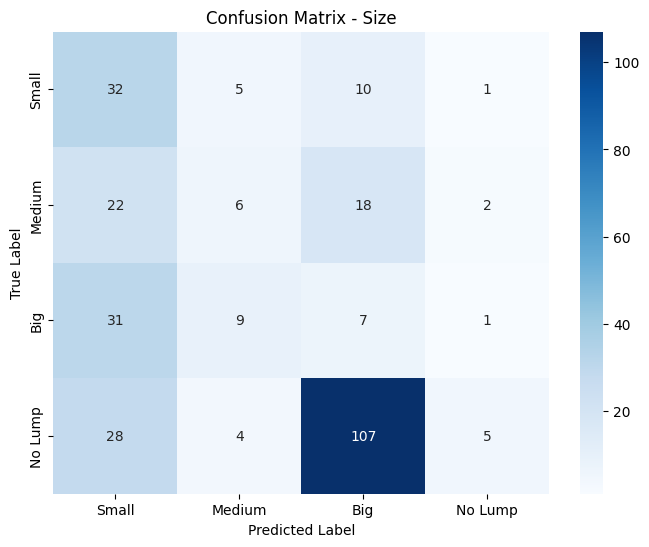


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.28      0.67      0.40        48
      Medium       0.25      0.12      0.17        48
         Big       0.05      0.15      0.07        48
     No Lump       0.56      0.03      0.07       144

    accuracy                           0.17       288
   macro avg       0.28      0.24      0.18       288
weighted avg       0.37      0.17      0.14       288


Confusion Matrix - Position:
[[ 0 39  9  0]
 [ 2 35 11  0]
 [ 3 28 17  0]
 [63 35 45  1]]


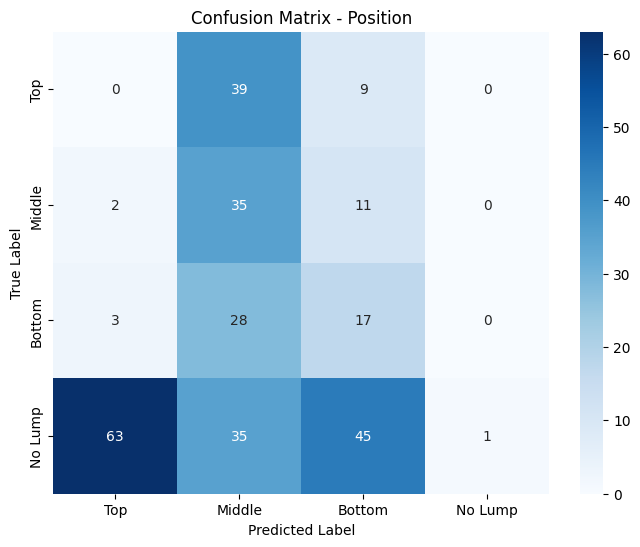


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.00      0.00      0.00        48
      Middle       0.26      0.73      0.38        48
      Bottom       0.21      0.35      0.26        48
     No Lump       1.00      0.01      0.01       144

    accuracy                           0.18       288
   macro avg       0.37      0.27      0.16       288
weighted avg       0.58      0.18      0.11       288


Fine-tuning with 1 additional trials from new dataset


Epoch 1, Training Loss: 1.8648, Validation Loss: 2.0824


Epoch 2, Training Loss: 1.8740, Validation Loss: 1.9428


Epoch 3, Training Loss: 1.7985, Validation Loss: 1.8386


Epoch 4, Training Loss: 1.8108, Validation Loss: 1.9461


Epoch 5, Training Loss: 1.7704, Validation Loss: 1.9337
Early stopping at epoch 5


Test Accuracy - Lump: 0.7708, Size: 0.3021, Position: 0.3438

Confusion Matrix - Lump:
[[104  40]
 [ 26 118]]


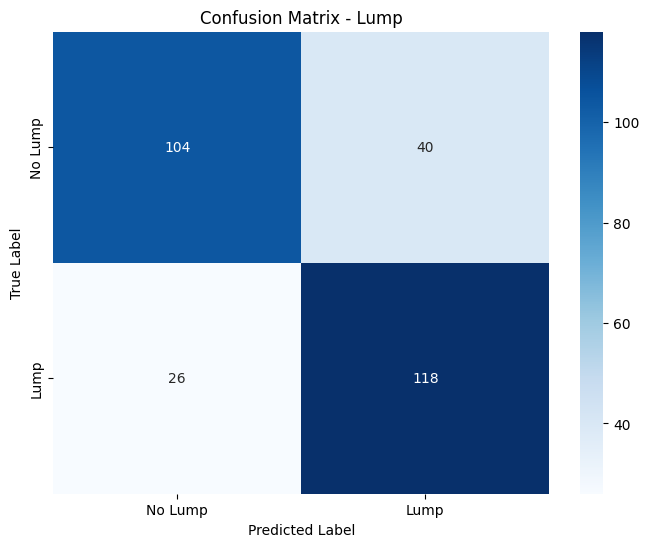


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.80      0.72      0.76       144
        Lump       0.75      0.82      0.78       144

    accuracy                           0.77       288
   macro avg       0.77      0.77      0.77       288
weighted avg       0.77      0.77      0.77       288


Confusion Matrix - Size:
[[28  2  4 14]
 [18  1 11 18]
 [19  1  1 27]
 [13  0 74 57]]


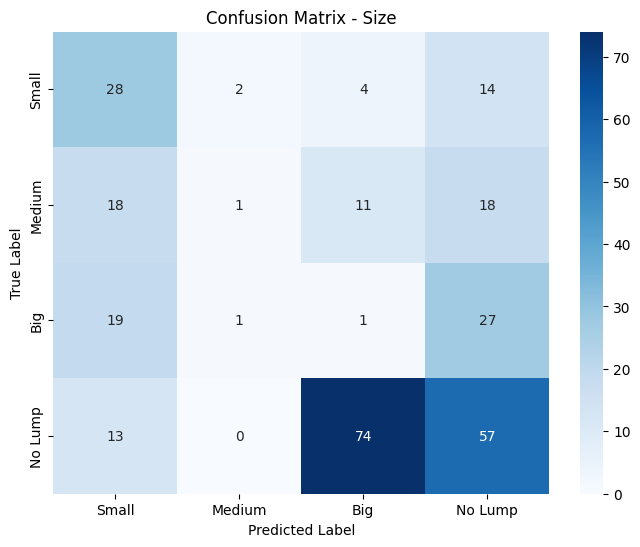


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.36      0.58      0.44        48
      Medium       0.25      0.02      0.04        48
         Big       0.01      0.02      0.01        48
     No Lump       0.49      0.40      0.44       144

    accuracy                           0.30       288
   macro avg       0.28      0.26      0.23       288
weighted avg       0.35      0.30      0.30       288


Confusion Matrix - Position:
[[ 0 14 15 19]
 [ 0  9 17 22]
 [ 0 13 19 16]
 [ 0  1 72 71]]


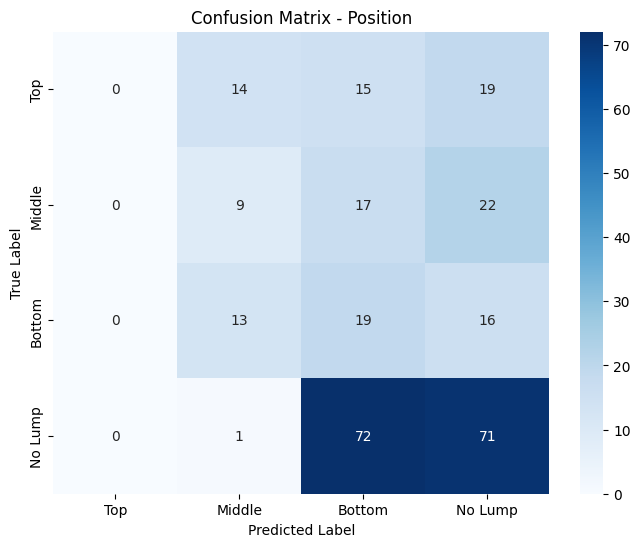


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.00      0.00      0.00        48
      Middle       0.24      0.19      0.21        48
      Bottom       0.15      0.40      0.22        48
     No Lump       0.55      0.49      0.52       144

    accuracy                           0.34       288
   macro avg       0.24      0.27      0.24       288
weighted avg       0.34      0.34      0.33       288


Fine-tuning with 2 additional trials from new dataset


Epoch 1, Training Loss: 1.7785, Validation Loss: 1.7728


Epoch 2, Training Loss: 1.7704, Validation Loss: 1.8183


Epoch 3, Training Loss: 1.7105, Validation Loss: 1.8770


Epoch 4, Training Loss: 1.7053, Validation Loss: 1.9149


Epoch 5, Training Loss: 1.7037, Validation Loss: 1.7781


Epoch 6, Training Loss: 1.6901, Validation Loss: 1.8116
Early stopping at epoch 6


Test Accuracy - Lump: 0.8229, Size: 0.5243, Position: 0.5278

Confusion Matrix - Lump:
[[101  43]
 [  8 136]]


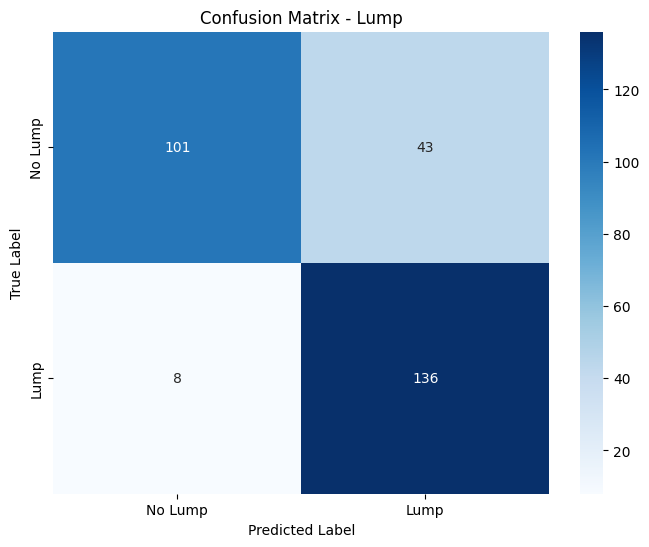


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.93      0.70      0.80       144
        Lump       0.76      0.94      0.84       144

    accuracy                           0.82       288
   macro avg       0.84      0.82      0.82       288
weighted avg       0.84      0.82      0.82       288


Confusion Matrix - Size:
[[ 34   9   0   5]
 [ 24   8   6  10]
 [ 28  15   0   5]
 [ 22  12   1 109]]


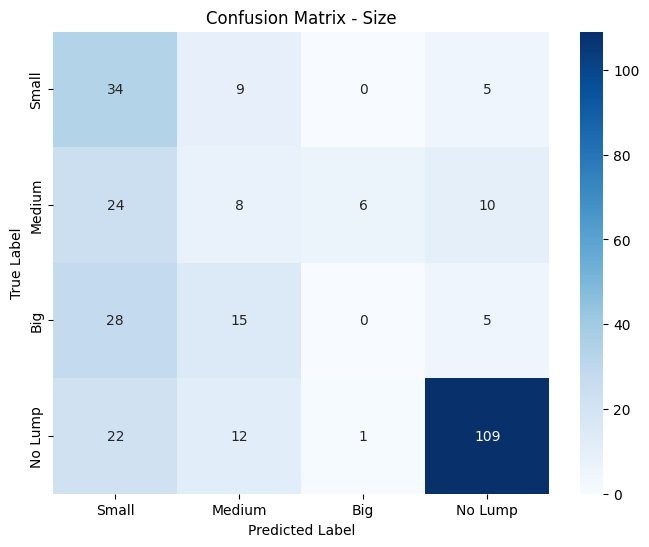


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.31      0.71      0.44        48
      Medium       0.18      0.17      0.17        48
         Big       0.00      0.00      0.00        48
     No Lump       0.84      0.76      0.80       144

    accuracy                           0.52       288
   macro avg       0.34      0.41      0.35       288
weighted avg       0.51      0.52      0.50       288


Confusion Matrix - Position:
[[  0  28  19   1]
 [  0  17  28   3]
 [  0   9  25  14]
 [  0  16  18 110]]


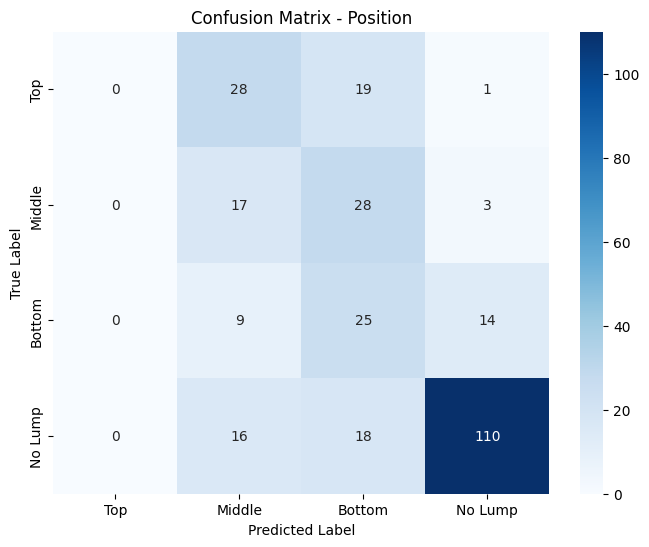


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.00      0.00      0.00        48
      Middle       0.24      0.35      0.29        48
      Bottom       0.28      0.52      0.36        48
     No Lump       0.86      0.76      0.81       144

    accuracy                           0.53       288
   macro avg       0.35      0.41      0.36       288
weighted avg       0.52      0.53      0.51       288


Fine-tuning with 3 additional trials from new dataset


Epoch 1, Training Loss: 1.6746, Validation Loss: 1.7360


Epoch 2, Training Loss: 1.6368, Validation Loss: 1.8508


Epoch 3, Training Loss: 1.6276, Validation Loss: 1.8642


Epoch 4, Training Loss: 1.6697, Validation Loss: 1.8030


Epoch 5, Training Loss: 1.6308, Validation Loss: 1.6579


Epoch 6, Training Loss: 1.6385, Validation Loss: 1.7210


Epoch 7, Training Loss: 1.6553, Validation Loss: 1.9382


Epoch 8, Training Loss: 1.5819, Validation Loss: 1.8712


Epoch 9, Training Loss: 1.5586, Validation Loss: 1.7541


Epoch 10, Training Loss: 1.5578, Validation Loss: 1.7598
Early stopping at epoch 10


Test Accuracy - Lump: 0.7882, Size: 0.4757, Position: 0.4931

Confusion Matrix - Lump:
[[ 83  61]
 [  0 144]]


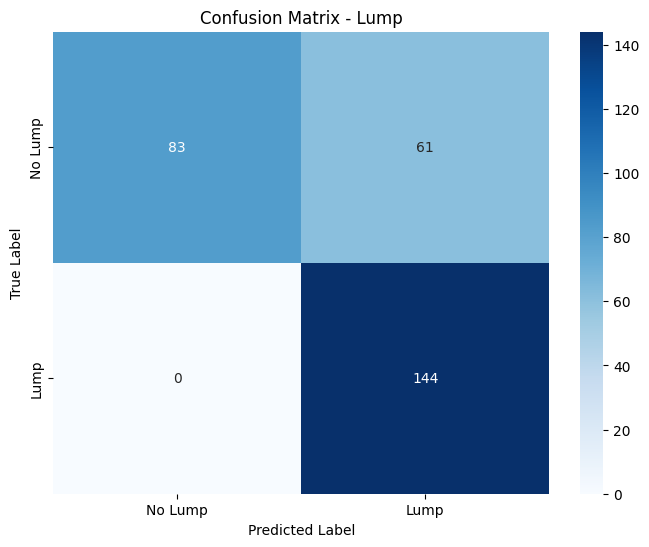


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       1.00      0.58      0.73       144
        Lump       0.70      1.00      0.83       144

    accuracy                           0.79       288
   macro avg       0.85      0.79      0.78       288
weighted avg       0.85      0.79      0.78       288


Confusion Matrix - Size:
[[46  2  0  0]
 [41  4  0  3]
 [41  4  0  3]
 [49  8  0 87]]


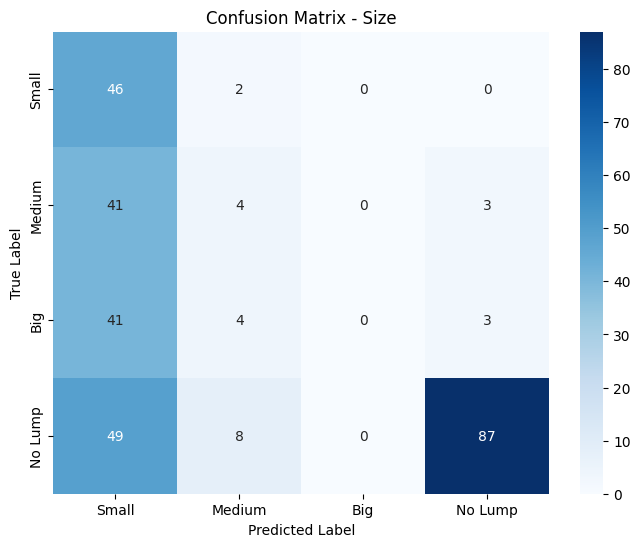


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.26      0.96      0.41        48
      Medium       0.22      0.08      0.12        48
         Big       0.00      0.00      0.00        48
     No Lump       0.94      0.60      0.73       144

    accuracy                           0.48       288
   macro avg       0.35      0.41      0.32       288
weighted avg       0.55      0.48      0.46       288


Confusion Matrix - Position:
[[31  1 14  2]
 [22  3 23  0]
 [27  1 20  0]
 [37  0 19 88]]


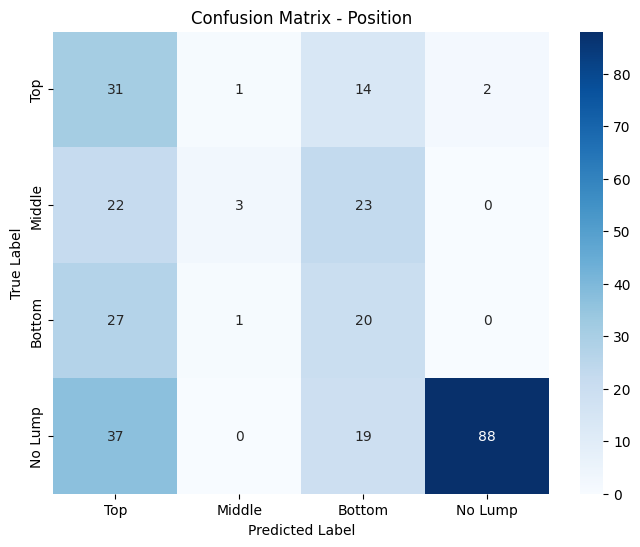


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.26      0.65      0.38        48
      Middle       0.60      0.06      0.11        48
      Bottom       0.26      0.42      0.32        48
     No Lump       0.98      0.61      0.75       144

    accuracy                           0.49       288
   macro avg       0.53      0.43      0.39       288
weighted avg       0.68      0.49      0.51       288


Fine-tuning with 4 additional trials from new dataset


Epoch 1, Training Loss: 1.5315, Validation Loss: 1.6729


Epoch 2, Training Loss: 1.5325, Validation Loss: 1.7348


Epoch 3, Training Loss: 1.4878, Validation Loss: 1.8559


Epoch 4, Training Loss: 1.5089, Validation Loss: 1.7317


Epoch 5, Training Loss: 1.4725, Validation Loss: 1.7870
Early stopping at epoch 5


Test Accuracy - Lump: 0.8819, Size: 0.6389, Position: 0.5938

Confusion Matrix - Lump:
[[132  12]
 [ 22 122]]


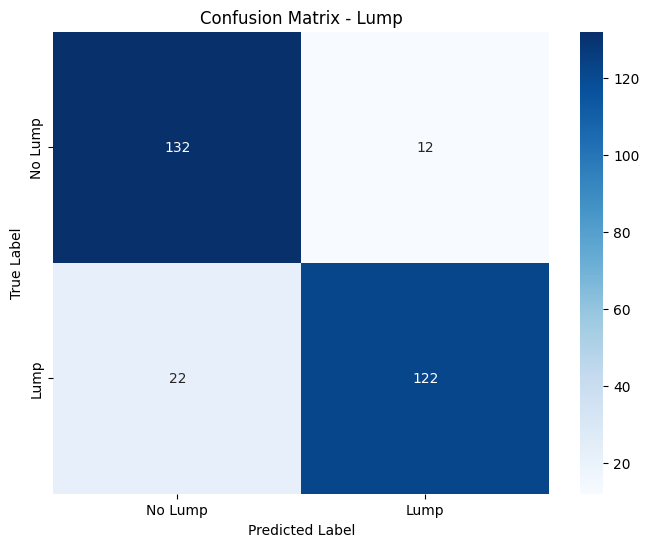


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.86      0.92      0.89       144
        Lump       0.91      0.85      0.88       144

    accuracy                           0.88       288
   macro avg       0.88      0.88      0.88       288
weighted avg       0.88      0.88      0.88       288


Confusion Matrix - Size:
[[ 32  13   0   3]
 [ 28  11   1   8]
 [ 17  12   0  19]
 [  3   0   0 141]]


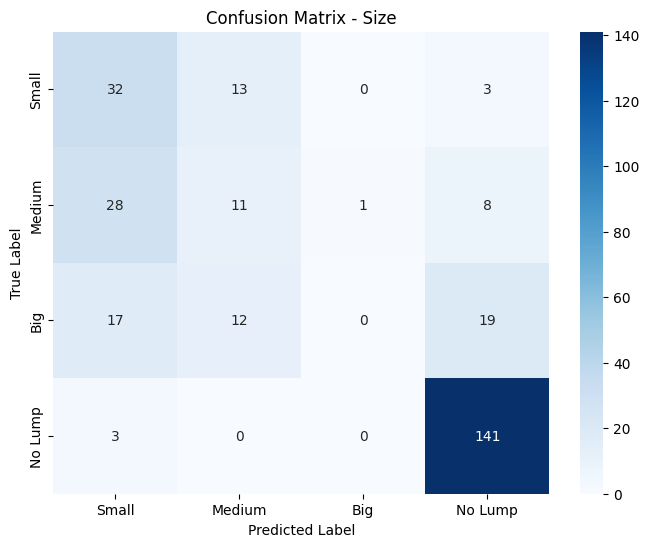


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.40      0.67      0.50        48
      Medium       0.31      0.23      0.26        48
         Big       0.00      0.00      0.00        48
     No Lump       0.82      0.98      0.90       144

    accuracy                           0.64       288
   macro avg       0.38      0.47      0.41       288
weighted avg       0.53      0.64      0.57       288


Confusion Matrix - Position:
[[  0  40   4   4]
 [  0  24  12  12]
 [  1  23   6  18]
 [  0   3   0 141]]


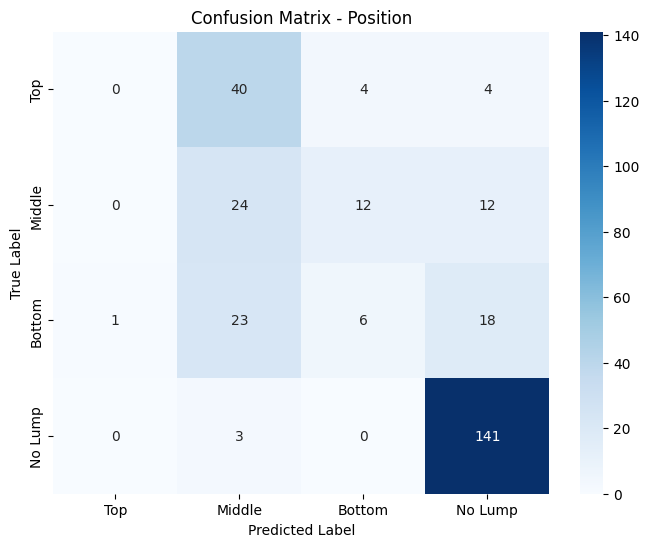


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.00      0.00      0.00        48
      Middle       0.27      0.50      0.35        48
      Bottom       0.27      0.12      0.17        48
     No Lump       0.81      0.98      0.88       144

    accuracy                           0.59       288
   macro avg       0.34      0.40      0.35       288
weighted avg       0.49      0.59      0.53       288


Fine-tuning with 5 additional trials from new dataset


Epoch 1, Training Loss: 1.5057, Validation Loss: 1.6984


Epoch 2, Training Loss: 1.4983, Validation Loss: 1.7673


Epoch 3, Training Loss: 1.4880, Validation Loss: 1.7199


Epoch 4, Training Loss: 1.4348, Validation Loss: 1.8742


Epoch 5, Training Loss: 1.4409, Validation Loss: 1.7179
Early stopping at epoch 5


Test Accuracy - Lump: 0.7986, Size: 0.5208, Position: 0.4688

Confusion Matrix - Lump:
[[ 91  53]
 [  5 139]]


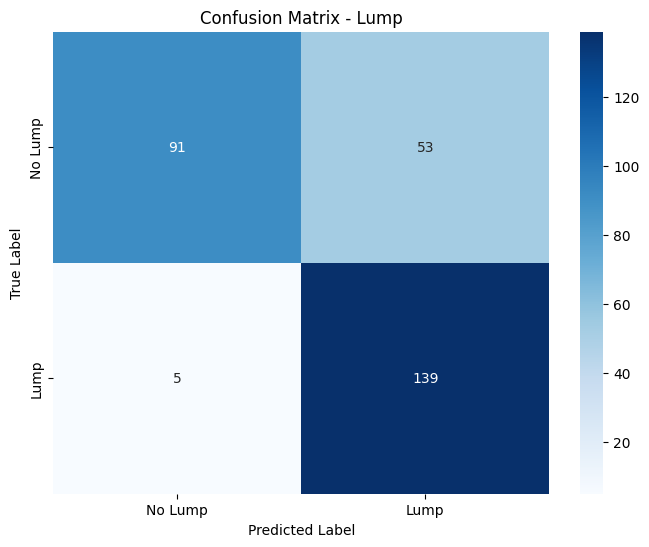


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.95      0.63      0.76       144
        Lump       0.72      0.97      0.83       144

    accuracy                           0.80       288
   macro avg       0.84      0.80      0.79       288
weighted avg       0.84      0.80      0.79       288


Confusion Matrix - Size:
[[ 25  23   0   0]
 [ 21  25   2   0]
 [ 18  25   0   5]
 [ 29  11   4 100]]


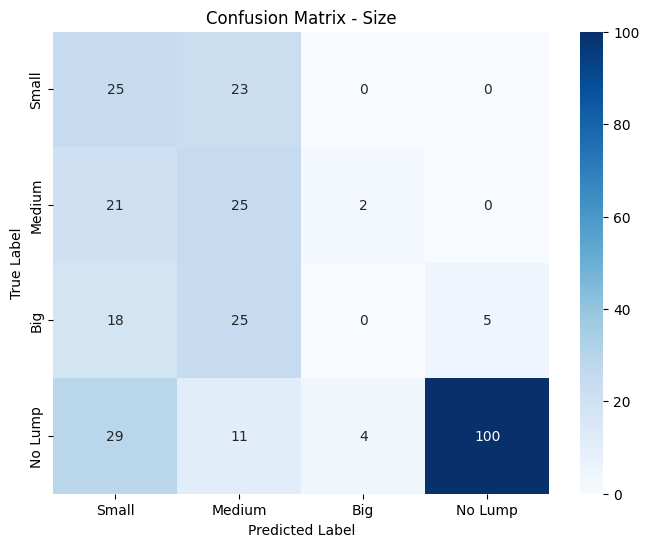


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.27      0.52      0.35        48
      Medium       0.30      0.52      0.38        48
         Big       0.00      0.00      0.00        48
     No Lump       0.95      0.69      0.80       144

    accuracy                           0.52       288
   macro avg       0.38      0.43      0.38       288
weighted avg       0.57      0.52      0.52       288


Confusion Matrix - Position:
[[ 0 31 17  0]
 [ 0 15 33  0]
 [ 0 13 28  7]
 [10 14 28 92]]


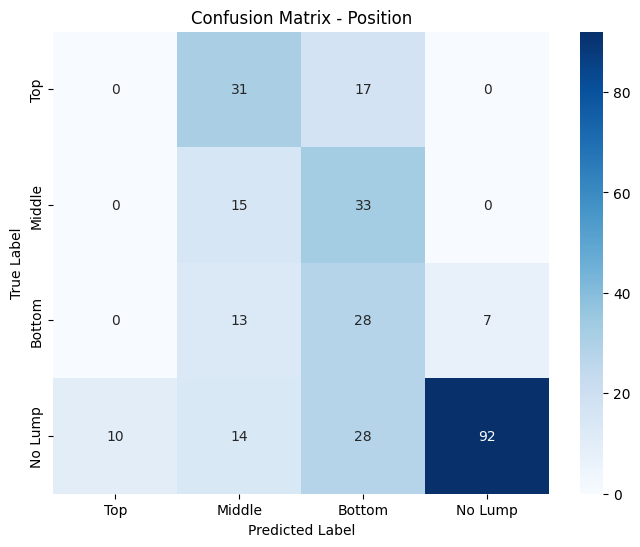


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.00      0.00      0.00        48
      Middle       0.21      0.31      0.25        48
      Bottom       0.26      0.58      0.36        48
     No Lump       0.93      0.64      0.76       144

    accuracy                           0.47       288
   macro avg       0.35      0.38      0.34       288
weighted avg       0.54      0.47      0.48       288



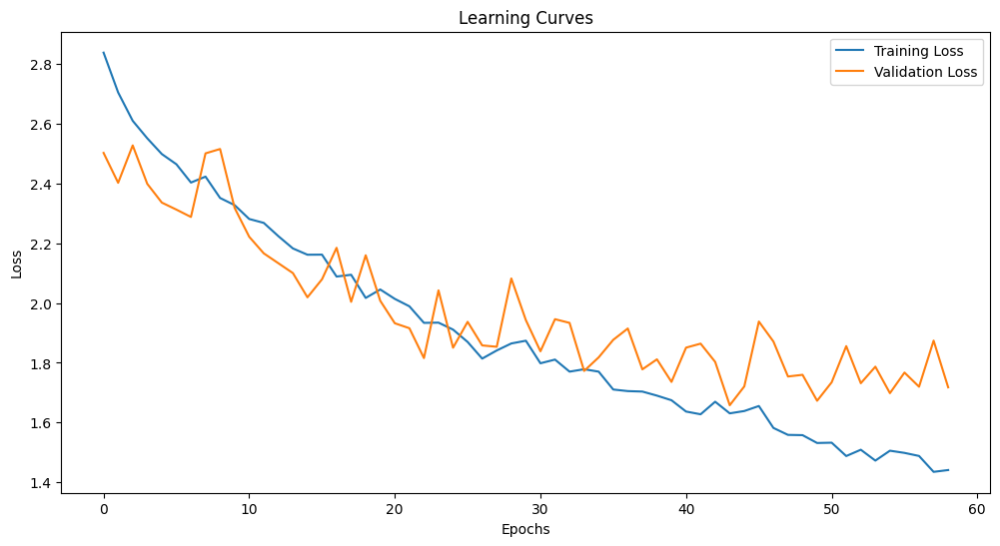

| Training Phase                         |   Lump Accuracy |   Size Accuracy |   Position Accuracy |
|:---------------------------------------|----------------:|----------------:|--------------------:|
| Initial Training                       |        0.875    |        0.733333 |            0.658333 |
| Testing on doctors without fine-tuning |        0.5      |        0.173611 |            0.184028 |
| Fine-tuning with 1 trials              |        0.770833 |        0.302083 |            0.34375  |
| Fine-tuning with 2 trials              |        0.822917 |        0.524306 |            0.527778 |
| Fine-tuning with 3 trials              |        0.788194 |        0.475694 |            0.493056 |
| Fine-tuning with 4 trials              |        0.881944 |        0.638889 |            0.59375  |
| Fine-tuning with 5 trials              |        0.798611 |        0.520833 |            0.46875  |

Running experiment with tips_middle sensors and 4 seconds
Using 6 GPUs
Initial Training an

Epoch 1, Training Loss: 2.8115, Validation Loss: 3.3357


Epoch 2, Training Loss: 2.6420, Validation Loss: 2.5014


Epoch 3, Training Loss: 2.5740, Validation Loss: 2.5381


Epoch 4, Training Loss: 2.5537, Validation Loss: 2.4626


Epoch 5, Training Loss: 2.5112, Validation Loss: 2.4487


Epoch 6, Training Loss: 2.4420, Validation Loss: 2.3928


Epoch 7, Training Loss: 2.4346, Validation Loss: 2.4574


Epoch 8, Training Loss: 2.4010, Validation Loss: 2.3257


Epoch 9, Training Loss: 2.3418, Validation Loss: 2.3188


Epoch 10, Training Loss: 2.3062, Validation Loss: 2.3190


Epoch 11, Training Loss: 2.3337, Validation Loss: 2.3125


Epoch 12, Training Loss: 2.2469, Validation Loss: 2.2251


Epoch 13, Training Loss: 2.2303, Validation Loss: 2.2247


Epoch 14, Training Loss: 2.1876, Validation Loss: 2.1045


Epoch 15, Training Loss: 2.1395, Validation Loss: 2.2545


Epoch 16, Training Loss: 2.1244, Validation Loss: 2.2030


Epoch 17, Training Loss: 2.1138, Validation Loss: 2.0744


Epoch 18, Training Loss: 2.0926, Validation Loss: 2.0054


Epoch 19, Training Loss: 2.0774, Validation Loss: 1.9543


Epoch 20, Training Loss: 2.0697, Validation Loss: 2.0287


Epoch 21, Training Loss: 2.0309, Validation Loss: 2.0035


Epoch 22, Training Loss: 1.9877, Validation Loss: 2.0524


Epoch 23, Training Loss: 1.9580, Validation Loss: 2.0140


Epoch 24, Training Loss: 1.9282, Validation Loss: 1.9361


Epoch 25, Training Loss: 1.8867, Validation Loss: 2.0268


Epoch 26, Training Loss: 1.9065, Validation Loss: 1.9308


Epoch 27, Training Loss: 1.8481, Validation Loss: 1.8869


Epoch 28, Training Loss: 1.8938, Validation Loss: 2.0132


Epoch 29, Training Loss: 1.8008, Validation Loss: 1.8745


Epoch 30, Training Loss: 1.7955, Validation Loss: 1.8674


Epoch 31, Training Loss: 1.8385, Validation Loss: 1.9199


Epoch 32, Training Loss: 1.8013, Validation Loss: 1.8805


Epoch 33, Training Loss: 1.7541, Validation Loss: 1.8602


Epoch 34, Training Loss: 1.7443, Validation Loss: 1.7879


Epoch 35, Training Loss: 1.7409, Validation Loss: 1.8838


Epoch 36, Training Loss: 1.7087, Validation Loss: 1.8928


Epoch 37, Training Loss: 1.7307, Validation Loss: 2.2272


Epoch 38, Training Loss: 1.6745, Validation Loss: 1.8575


Epoch 39, Training Loss: 1.7467, Validation Loss: 1.8202
Early stopping at epoch 39


Test Accuracy - Lump: 0.8681, Size: 0.7292, Position: 0.6597

Confusion Matrix - Lump:
[[312  48]
 [ 47 313]]


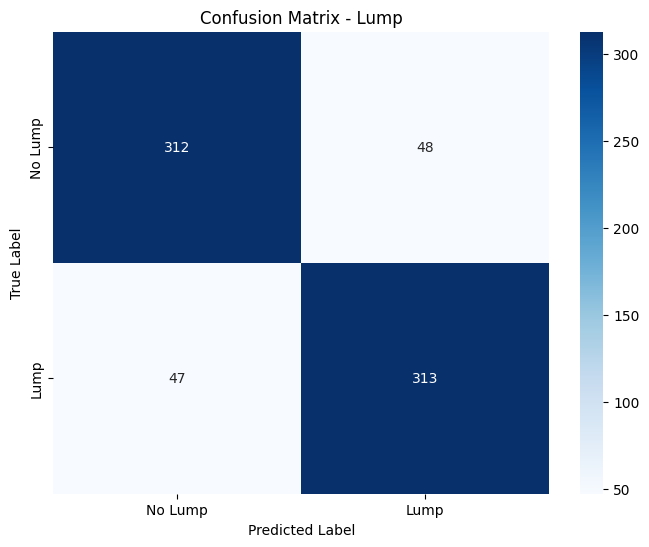


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.87      0.87      0.87       360
        Lump       0.87      0.87      0.87       360

    accuracy                           0.87       720
   macro avg       0.87      0.87      0.87       720
weighted avg       0.87      0.87      0.87       720


Confusion Matrix - Size:
[[ 90   8   3  19]
 [ 27  50  13  30]
 [ 23  18  61  18]
 [ 23   5   8 324]]


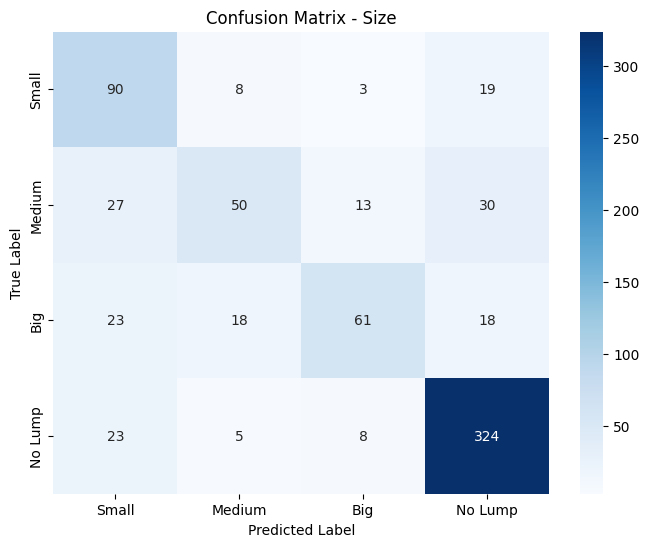


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.55      0.75      0.64       120
      Medium       0.62      0.42      0.50       120
         Big       0.72      0.51      0.60       120
     No Lump       0.83      0.90      0.86       360

    accuracy                           0.73       720
   macro avg       0.68      0.64      0.65       720
weighted avg       0.73      0.73      0.72       720


Confusion Matrix - Position:
[[ 52  14  33  21]
 [ 23  43  29  25]
 [ 19  19  54  28]
 [  9  12  13 326]]


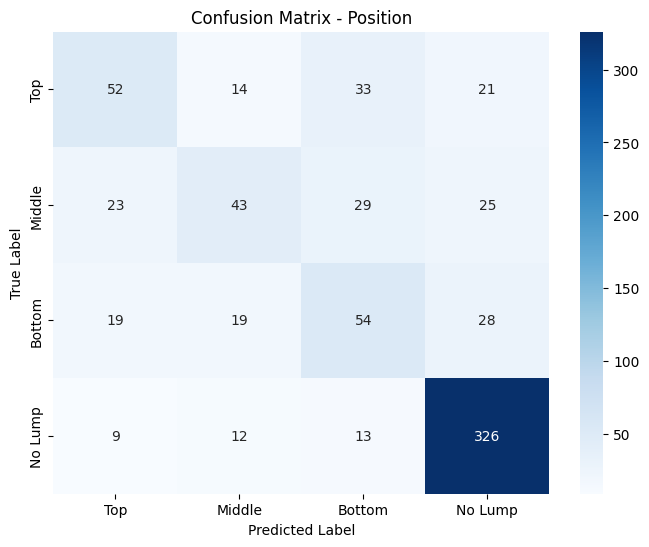


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.50      0.43      0.47       120
      Middle       0.49      0.36      0.41       120
      Bottom       0.42      0.45      0.43       120
     No Lump       0.81      0.91      0.86       360

    accuracy                           0.66       720
   macro avg       0.56      0.54      0.54       720
weighted avg       0.64      0.66      0.65       720


Testing on doctors' data without fine-tuning:


Test Accuracy - Lump: 0.5278, Size: 0.1944, Position: 0.1979

Confusion Matrix - Lump:
[[  8 136]
 [  0 144]]


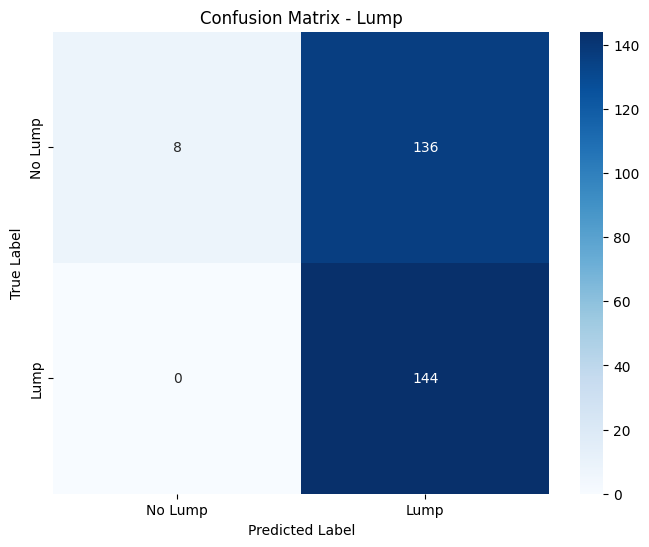


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       1.00      0.06      0.11       144
        Lump       0.51      1.00      0.68       144

    accuracy                           0.53       288
   macro avg       0.76      0.53      0.39       288
weighted avg       0.76      0.53      0.39       288


Confusion Matrix - Size:
[[ 26   1  21   0]
 [ 16   1  31   0]
 [ 27   0  20   1]
 [ 10   0 125   9]]


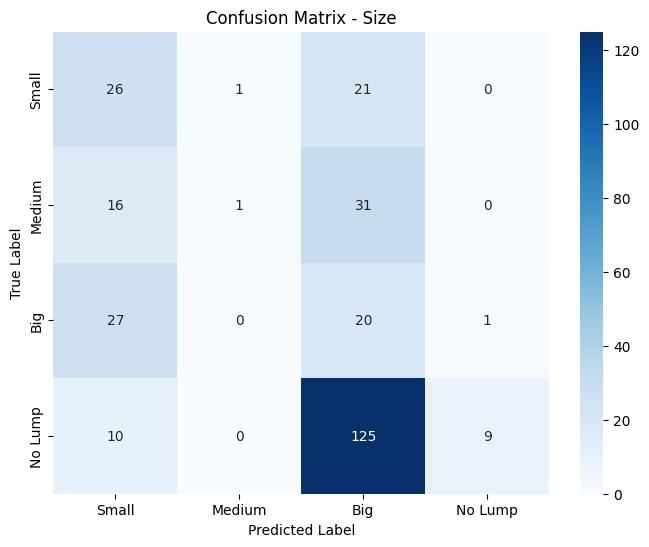


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.33      0.54      0.41        48
      Medium       0.50      0.02      0.04        48
         Big       0.10      0.42      0.16        48
     No Lump       0.90      0.06      0.12       144

    accuracy                           0.19       288
   macro avg       0.46      0.26      0.18       288
weighted avg       0.61      0.19      0.16       288


Confusion Matrix - Position:
[[ 0  1 46  1]
 [ 0  0 46  2]
 [ 0  0 48  0]
 [59  0 76  9]]


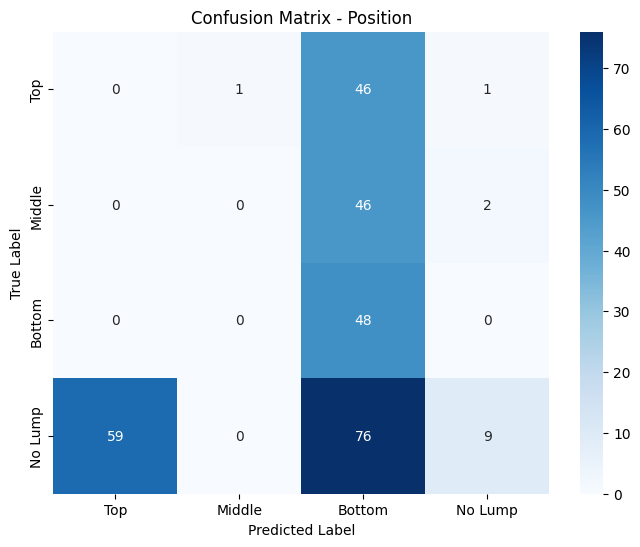


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.00      0.00      0.00        48
      Middle       0.00      0.00      0.00        48
      Bottom       0.22      1.00      0.36        48
     No Lump       0.75      0.06      0.12       144

    accuracy                           0.20       288
   macro avg       0.24      0.27      0.12       288
weighted avg       0.41      0.20      0.12       288


Fine-tuning with 1 additional trials from new dataset


Epoch 1, Training Loss: 1.6814, Validation Loss: 2.1556


Epoch 2, Training Loss: 1.6869, Validation Loss: 2.1959


Epoch 3, Training Loss: 1.6255, Validation Loss: 2.1761


Epoch 4, Training Loss: 1.6853, Validation Loss: 2.0321


Epoch 5, Training Loss: 1.6393, Validation Loss: 1.8779
Early stopping at epoch 5


Test Accuracy - Lump: 0.3785, Size: 0.1771, Position: 0.2500

Confusion Matrix - Lump:
[[ 69  75]
 [104  40]]


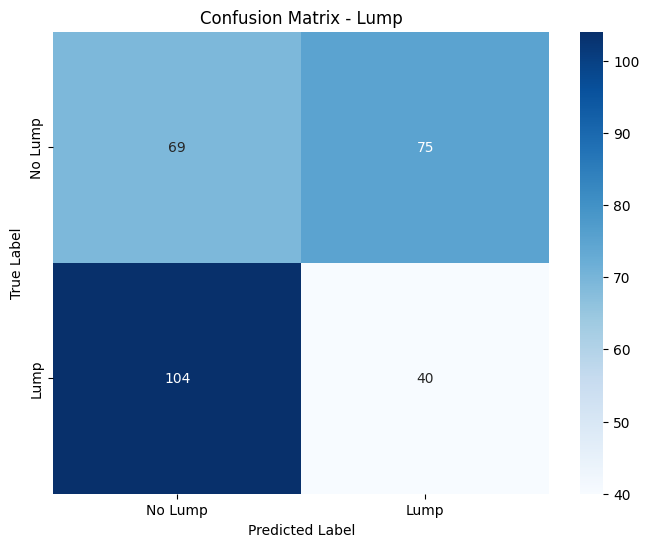


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.40      0.48      0.44       144
        Lump       0.35      0.28      0.31       144

    accuracy                           0.38       288
   macro avg       0.37      0.38      0.37       288
weighted avg       0.37      0.38      0.37       288


Confusion Matrix - Size:
[[ 0  0 21 27]
 [ 0  0 24 24]
 [ 0  0  2 46]
 [ 0  0 95 49]]


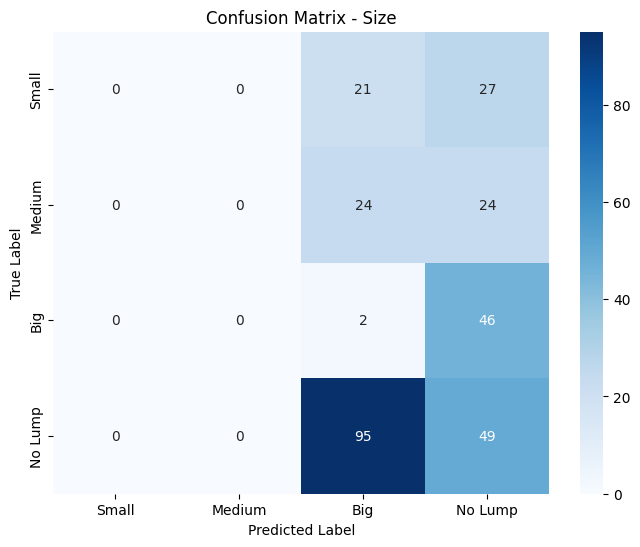


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.00      0.00      0.00        48
      Medium       0.00      0.00      0.00        48
         Big       0.01      0.04      0.02        48
     No Lump       0.34      0.34      0.34       144

    accuracy                           0.18       288
   macro avg       0.09      0.10      0.09       288
weighted avg       0.17      0.18      0.17       288


Confusion Matrix - Position:
[[ 2  0  5 41]
 [ 9  0  3 36]
 [ 6  0  2 40]
 [76  0  0 68]]


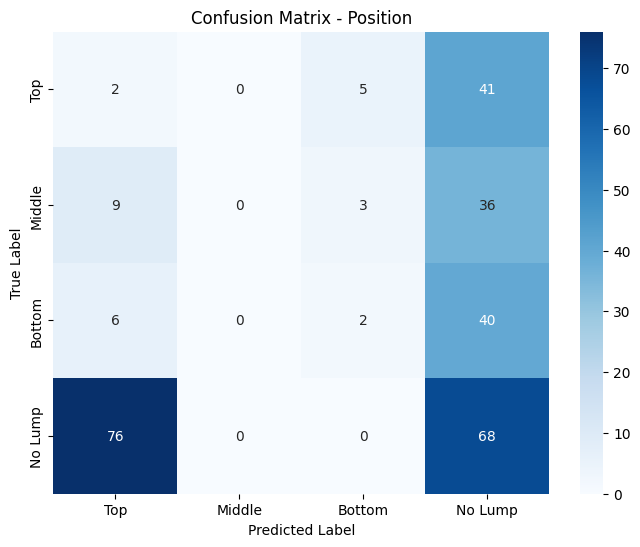


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.02      0.04      0.03        48
      Middle       0.00      0.00      0.00        48
      Bottom       0.20      0.04      0.07        48
     No Lump       0.37      0.47      0.41       144

    accuracy                           0.25       288
   macro avg       0.15      0.14      0.13       288
weighted avg       0.22      0.25      0.22       288


Fine-tuning with 2 additional trials from new dataset


Epoch 1, Training Loss: 1.6354, Validation Loss: 1.8412


Epoch 2, Training Loss: 1.5953, Validation Loss: 1.8832


Epoch 3, Training Loss: 1.6034, Validation Loss: 1.9690


Epoch 4, Training Loss: 1.6195, Validation Loss: 1.8117


Epoch 5, Training Loss: 1.5748, Validation Loss: 1.9424
Early stopping at epoch 5


Test Accuracy - Lump: 0.5347, Size: 0.2222, Position: 0.2257

Confusion Matrix - Lump:
[[ 13 131]
 [  3 141]]


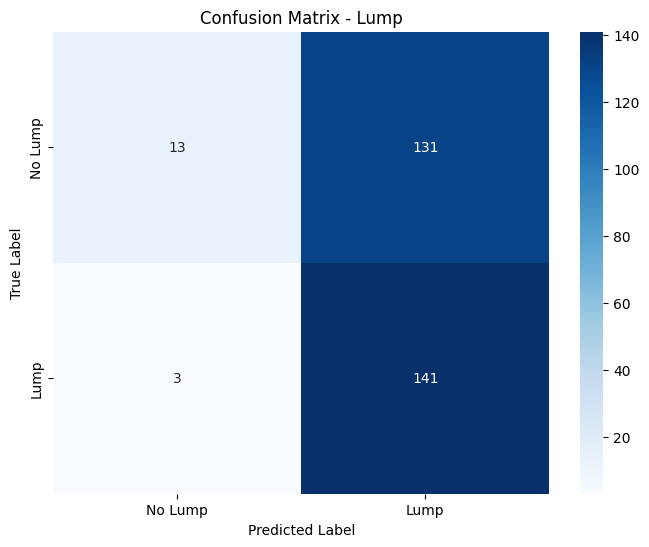


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.81      0.09      0.16       144
        Lump       0.52      0.98      0.68       144

    accuracy                           0.53       288
   macro avg       0.67      0.53      0.42       288
weighted avg       0.67      0.53      0.42       288


Confusion Matrix - Size:
[[ 30   2  13   3]
 [ 18   2  24   4]
 [ 24   6  14   4]
 [ 11   0 115  18]]


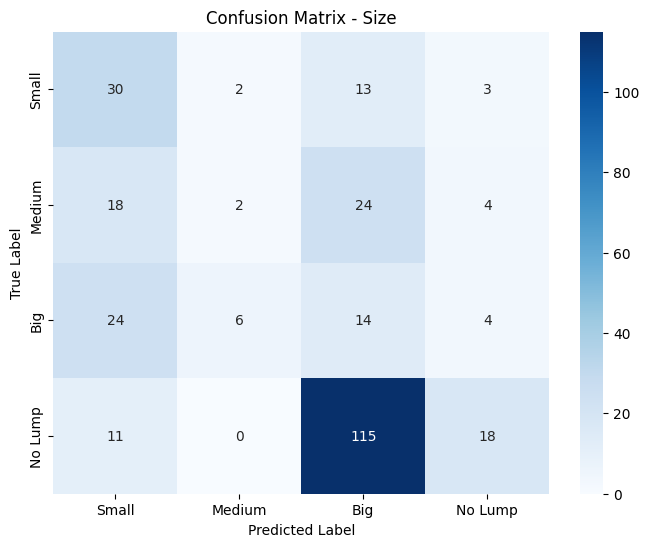


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.36      0.62      0.46        48
      Medium       0.20      0.04      0.07        48
         Big       0.08      0.29      0.13        48
     No Lump       0.62      0.12      0.21       144

    accuracy                           0.22       288
   macro avg       0.32      0.27      0.22       288
weighted avg       0.42      0.22      0.21       288


Confusion Matrix - Position:
[[ 3 29 10  6]
 [ 9 19 13  7]
 [ 0 20 24  4]
 [77 27 21 19]]


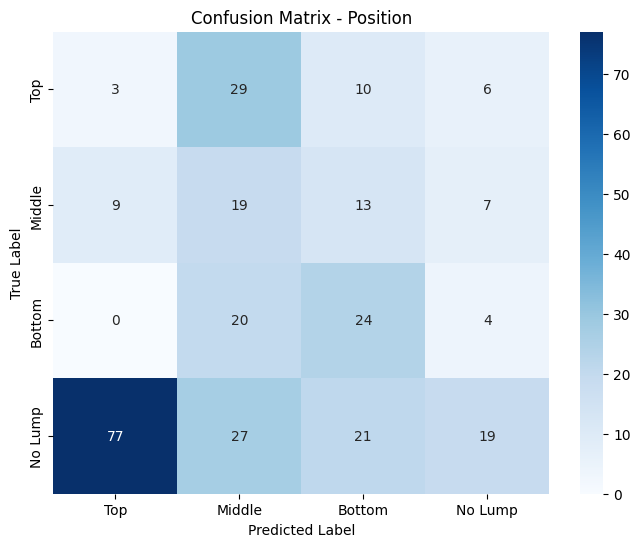


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.03      0.06      0.04        48
      Middle       0.20      0.40      0.27        48
      Bottom       0.35      0.50      0.41        48
     No Lump       0.53      0.13      0.21       144

    accuracy                           0.23       288
   macro avg       0.28      0.27      0.23       288
weighted avg       0.36      0.23      0.23       288


Fine-tuning with 3 additional trials from new dataset


Epoch 1, Training Loss: 1.5799, Validation Loss: 2.0135


Epoch 2, Training Loss: 1.5263, Validation Loss: 1.7999


Epoch 3, Training Loss: 1.5635, Validation Loss: 1.8680


Epoch 4, Training Loss: 1.5718, Validation Loss: 2.1146


Epoch 5, Training Loss: 1.5285, Validation Loss: 1.7500


Epoch 6, Training Loss: 1.5069, Validation Loss: 1.8078


Epoch 7, Training Loss: 1.4657, Validation Loss: 1.8054


Epoch 8, Training Loss: 1.4905, Validation Loss: 1.9458


Epoch 9, Training Loss: 1.5198, Validation Loss: 1.8151


Epoch 10, Training Loss: 1.4351, Validation Loss: 1.8848
Early stopping at epoch 10


Test Accuracy - Lump: 0.7674, Size: 0.3785, Position: 0.5000

Confusion Matrix - Lump:
[[135   9]
 [ 58  86]]


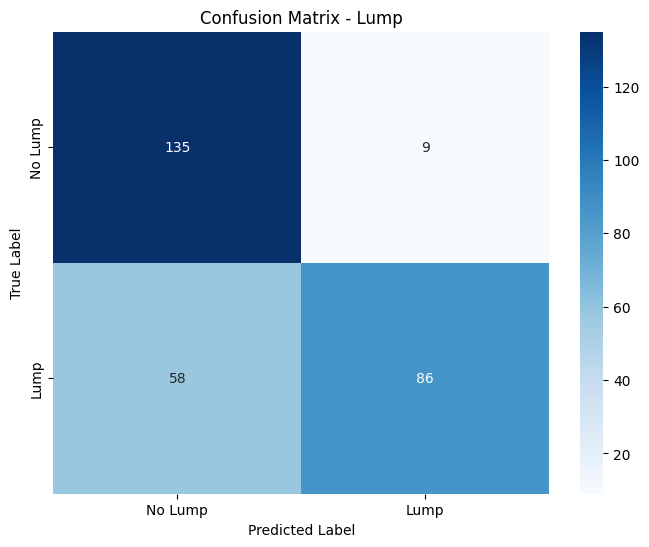


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.70      0.94      0.80       144
        Lump       0.91      0.60      0.72       144

    accuracy                           0.77       288
   macro avg       0.80      0.77      0.76       288
weighted avg       0.80      0.77      0.76       288


Confusion Matrix - Size:
[[19  0 10 19]
 [ 8  0 21 19]
 [ 7  0  6 35]
 [ 1  0 59 84]]


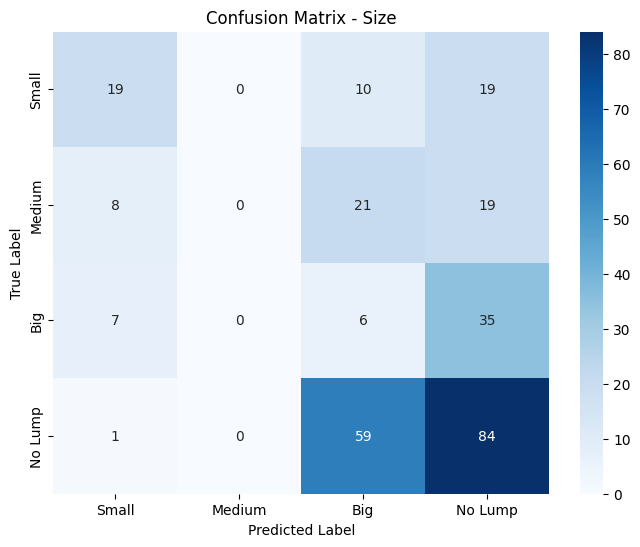


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.54      0.40      0.46        48
      Medium       0.00      0.00      0.00        48
         Big       0.06      0.12      0.08        48
     No Lump       0.54      0.58      0.56       144

    accuracy                           0.38       288
   macro avg       0.29      0.28      0.27       288
weighted avg       0.37      0.38      0.37       288


Confusion Matrix - Position:
[[  5  14   2  27]
 [ 11   7   4  26]
 [  4   9   4  31]
 [ 15   1   0 128]]


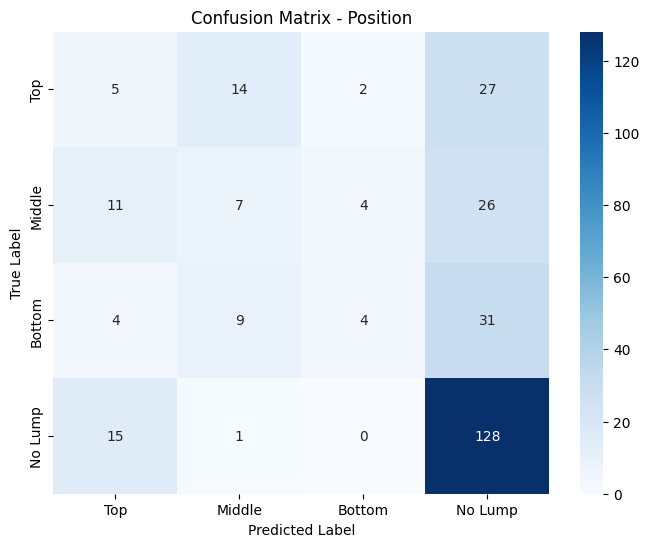


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.14      0.10      0.12        48
      Middle       0.23      0.15      0.18        48
      Bottom       0.40      0.08      0.14        48
     No Lump       0.60      0.89      0.72       144

    accuracy                           0.50       288
   macro avg       0.34      0.31      0.29       288
weighted avg       0.43      0.50      0.43       288


Fine-tuning with 4 additional trials from new dataset


Epoch 1, Training Loss: 1.4362, Validation Loss: 1.7775


Epoch 2, Training Loss: 1.4547, Validation Loss: 1.8101


Epoch 3, Training Loss: 1.4136, Validation Loss: 1.7674


Epoch 4, Training Loss: 1.3685, Validation Loss: 1.8621


Epoch 5, Training Loss: 1.4256, Validation Loss: 1.9014
Early stopping at epoch 5


Test Accuracy - Lump: 0.6111, Size: 0.3785, Position: 0.3056

Confusion Matrix - Lump:
[[ 43 101]
 [ 11 133]]


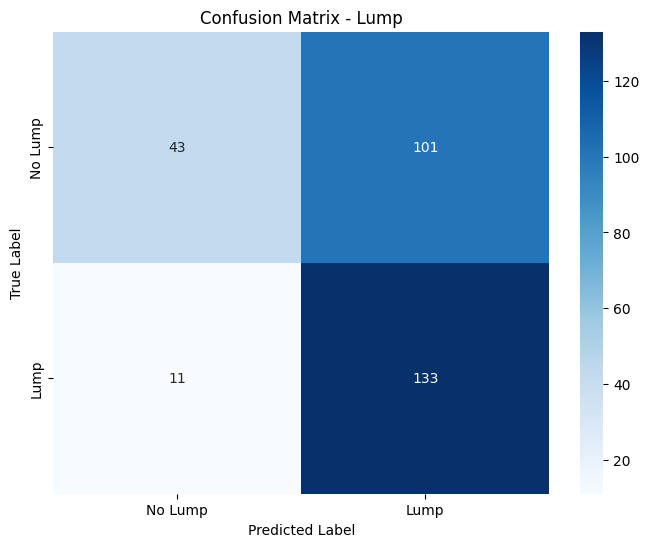


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.80      0.30      0.43       144
        Lump       0.57      0.92      0.70       144

    accuracy                           0.61       288
   macro avg       0.68      0.61      0.57       288
weighted avg       0.68      0.61      0.57       288


Confusion Matrix - Size:
[[26 16  3  3]
 [10 23  8  7]
 [16 12  2 18]
 [ 3  2 81 58]]


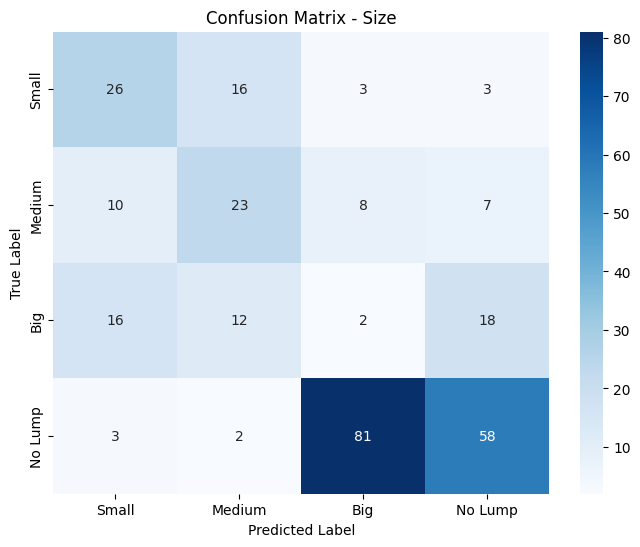


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.47      0.54      0.50        48
      Medium       0.43      0.48      0.46        48
         Big       0.02      0.04      0.03        48
     No Lump       0.67      0.40      0.50       144

    accuracy                           0.38       288
   macro avg       0.40      0.37      0.37       288
weighted avg       0.49      0.38      0.42       288


Confusion Matrix - Position:
[[10  3 26  9]
 [23  2 15  8]
 [15  1 20 12]
 [83  0  5 56]]


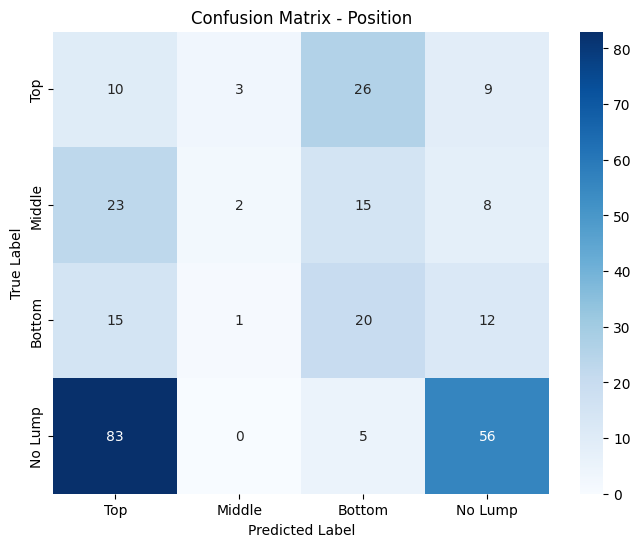


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.08      0.21      0.11        48
      Middle       0.33      0.04      0.07        48
      Bottom       0.30      0.42      0.35        48
     No Lump       0.66      0.39      0.49       144

    accuracy                           0.31       288
   macro avg       0.34      0.26      0.26       288
weighted avg       0.45      0.31      0.33       288

Few-shot early stopping at step 4


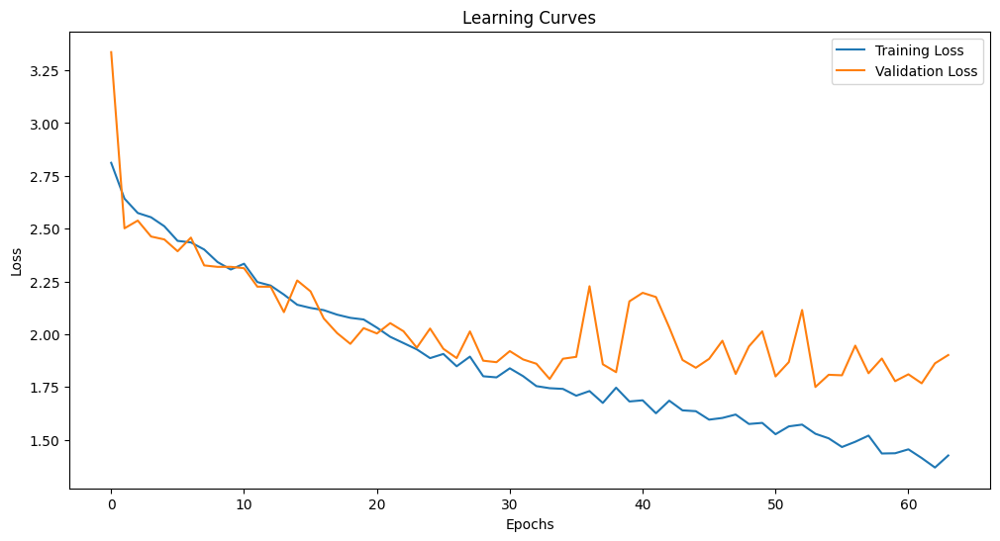

| Training Phase                         |   Lump Accuracy |   Size Accuracy |   Position Accuracy |
|:---------------------------------------|----------------:|----------------:|--------------------:|
| Initial Training                       |        0.868056 |        0.729167 |            0.659722 |
| Testing on doctors without fine-tuning |        0.527778 |        0.194444 |            0.197917 |
| Fine-tuning with 1 trials              |        0.378472 |        0.177083 |            0.25     |
| Fine-tuning with 2 trials              |        0.534722 |        0.222222 |            0.225694 |
| Fine-tuning with 3 trials              |        0.767361 |        0.378472 |            0.5      |
| Fine-tuning with 4 trials              |        0.611111 |        0.378472 |            0.305556 |

Running experiment with tips_middle sensors and 5 seconds
Using 6 GPUs
Initial Training and Evaluation:


Epoch 1, Training Loss: 2.8398, Validation Loss: 2.6841


Epoch 2, Training Loss: 2.6636, Validation Loss: 2.5451


Epoch 3, Training Loss: 2.5969, Validation Loss: 2.3782


Epoch 4, Training Loss: 2.5408, Validation Loss: 2.3074


Epoch 5, Training Loss: 2.4787, Validation Loss: 2.2416


Epoch 6, Training Loss: 2.4169, Validation Loss: 2.3559


Epoch 7, Training Loss: 2.3993, Validation Loss: 2.3002


Epoch 8, Training Loss: 2.3412, Validation Loss: 2.2695


Epoch 9, Training Loss: 2.3090, Validation Loss: 2.2722


Epoch 10, Training Loss: 2.2680, Validation Loss: 2.1953


Epoch 11, Training Loss: 2.2441, Validation Loss: 2.2267


Epoch 12, Training Loss: 2.2363, Validation Loss: 2.3908


Epoch 13, Training Loss: 2.2232, Validation Loss: 2.0440


Epoch 14, Training Loss: 2.1851, Validation Loss: 2.0115


Epoch 15, Training Loss: 2.1238, Validation Loss: 2.0256


Epoch 16, Training Loss: 2.1299, Validation Loss: 2.0322


Epoch 17, Training Loss: 2.1300, Validation Loss: 1.9805


Epoch 18, Training Loss: 2.0167, Validation Loss: 1.9239


Epoch 19, Training Loss: 2.0170, Validation Loss: 1.9841


Epoch 20, Training Loss: 1.9793, Validation Loss: 1.8748


Epoch 21, Training Loss: 1.9654, Validation Loss: 1.9471


Epoch 22, Training Loss: 1.9589, Validation Loss: 1.8998


Epoch 23, Training Loss: 1.9577, Validation Loss: 1.8494


Epoch 24, Training Loss: 1.9238, Validation Loss: 1.8610


Epoch 25, Training Loss: 1.9243, Validation Loss: 1.8372


Epoch 26, Training Loss: 1.8861, Validation Loss: 1.9194


Epoch 27, Training Loss: 1.8386, Validation Loss: 2.1499


Epoch 28, Training Loss: 1.8741, Validation Loss: 1.8325


Epoch 29, Training Loss: 1.8430, Validation Loss: 1.7733


Epoch 30, Training Loss: 1.8181, Validation Loss: 1.7535


Epoch 31, Training Loss: 1.7719, Validation Loss: 1.8577


Epoch 32, Training Loss: 1.7802, Validation Loss: 1.8475


Epoch 33, Training Loss: 1.8153, Validation Loss: 1.9341


Epoch 34, Training Loss: 1.7311, Validation Loss: 1.7006


Epoch 35, Training Loss: 1.7428, Validation Loss: 1.8053


Epoch 36, Training Loss: 1.6938, Validation Loss: 1.8340


Epoch 37, Training Loss: 1.7440, Validation Loss: 1.7706


Epoch 38, Training Loss: 1.6663, Validation Loss: 1.7387


Epoch 39, Training Loss: 1.7117, Validation Loss: 1.8172
Early stopping at epoch 39


Test Accuracy - Lump: 0.8639, Size: 0.7250, Position: 0.6625

Confusion Matrix - Lump:
[[298  62]
 [ 36 324]]


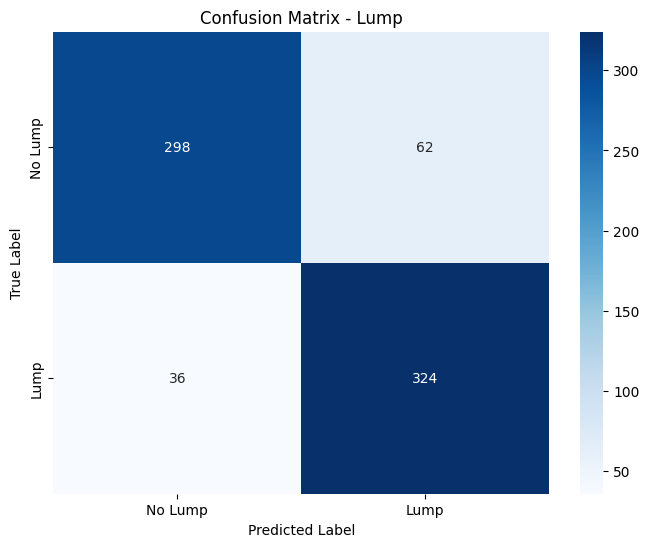


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.89      0.83      0.86       360
        Lump       0.84      0.90      0.87       360

    accuracy                           0.86       720
   macro avg       0.87      0.86      0.86       720
weighted avg       0.87      0.86      0.86       720


Confusion Matrix - Size:
[[ 82  25   3  10]
 [ 30  61  16  13]
 [ 13  30  60  17]
 [ 21  13   7 319]]


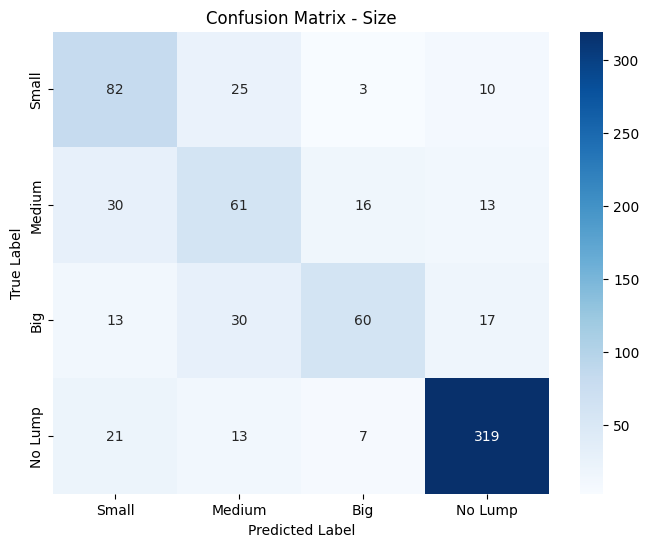


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.56      0.68      0.62       120
      Medium       0.47      0.51      0.49       120
         Big       0.70      0.50      0.58       120
     No Lump       0.89      0.89      0.89       360

    accuracy                           0.73       720
   macro avg       0.66      0.64      0.64       720
weighted avg       0.73      0.72      0.73       720


Confusion Matrix - Position:
[[ 67  20  14  19]
 [ 31  43  28  18]
 [ 32  27  47  14]
 [ 15  14  11 320]]


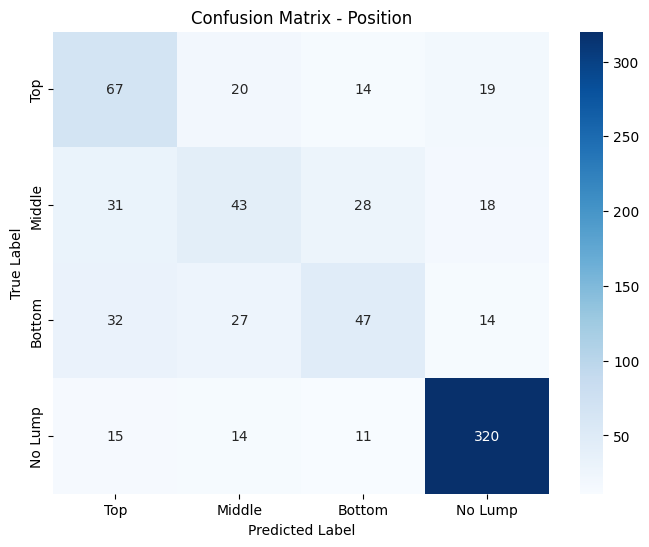


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.46      0.56      0.51       120
      Middle       0.41      0.36      0.38       120
      Bottom       0.47      0.39      0.43       120
     No Lump       0.86      0.89      0.88       360

    accuracy                           0.66       720
   macro avg       0.55      0.55      0.55       720
weighted avg       0.66      0.66      0.66       720


Testing on doctors' data without fine-tuning:


Test Accuracy - Lump: 0.5174, Size: 0.2222, Position: 0.1910

Confusion Matrix - Lump:
[[  8 136]
 [  3 141]]


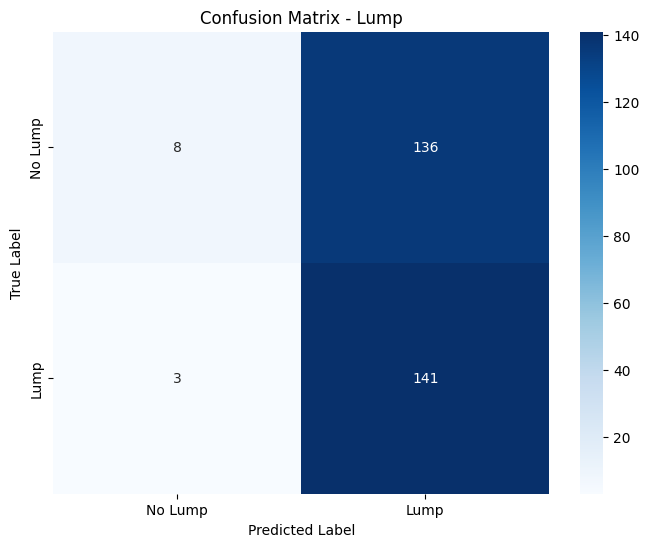


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.73      0.06      0.10       144
        Lump       0.51      0.98      0.67       144

    accuracy                           0.52       288
   macro avg       0.62      0.52      0.39       288
weighted avg       0.62      0.52      0.39       288


Confusion Matrix - Size:
[[ 23   7  17   1]
 [  6  12  29   1]
 [  9  18  19   2]
 [  6   6 122  10]]


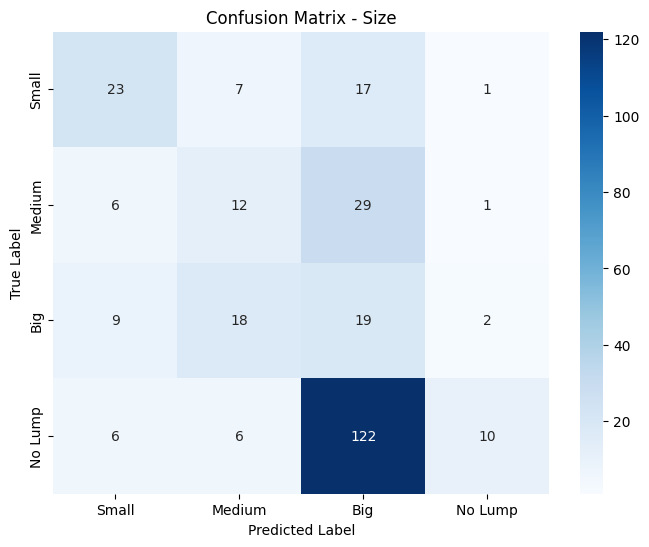


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.52      0.48      0.50        48
      Medium       0.28      0.25      0.26        48
         Big       0.10      0.40      0.16        48
     No Lump       0.71      0.07      0.13       144

    accuracy                           0.22       288
   macro avg       0.40      0.30      0.26       288
weighted avg       0.51      0.22      0.22       288


Confusion Matrix - Position:
[[ 7 26 13  2]
 [ 9  9 28  2]
 [10  9 29  0]
 [90  7 37 10]]


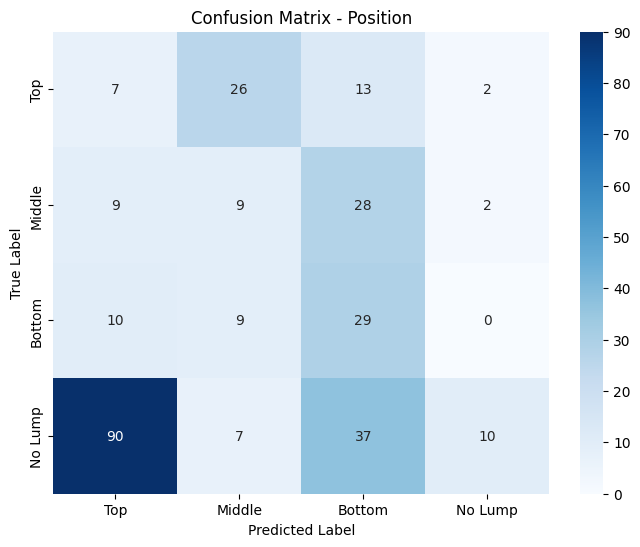


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.06      0.15      0.09        48
      Middle       0.18      0.19      0.18        48
      Bottom       0.27      0.60      0.37        48
     No Lump       0.71      0.07      0.13       144

    accuracy                           0.19       288
   macro avg       0.31      0.25      0.19       288
weighted avg       0.44      0.19      0.17       288


Fine-tuning with 1 additional trials from new dataset


Epoch 1, Training Loss: 1.6613, Validation Loss: 1.7399


Epoch 2, Training Loss: 1.6826, Validation Loss: 1.9366


Epoch 3, Training Loss: 1.7034, Validation Loss: 1.7451


Epoch 4, Training Loss: 1.6097, Validation Loss: 1.7276


Epoch 5, Training Loss: 1.5978, Validation Loss: 1.7239
Early stopping at epoch 5


Test Accuracy - Lump: 0.8160, Size: 0.3507, Position: 0.5035

Confusion Matrix - Lump:
[[112  32]
 [ 21 123]]


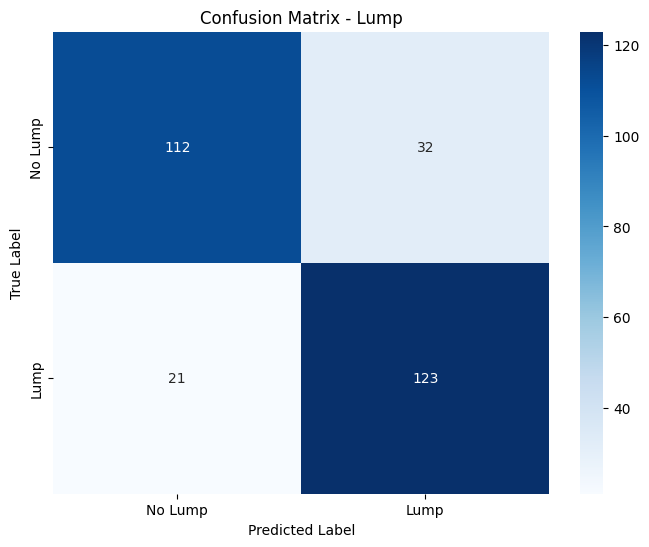


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.84      0.78      0.81       144
        Lump       0.79      0.85      0.82       144

    accuracy                           0.82       288
   macro avg       0.82      0.82      0.82       288
weighted avg       0.82      0.82      0.82       288


Confusion Matrix - Size:
[[33  0 12  3]
 [18  0 28  2]
 [27  0  7 14]
 [20  0 63 61]]


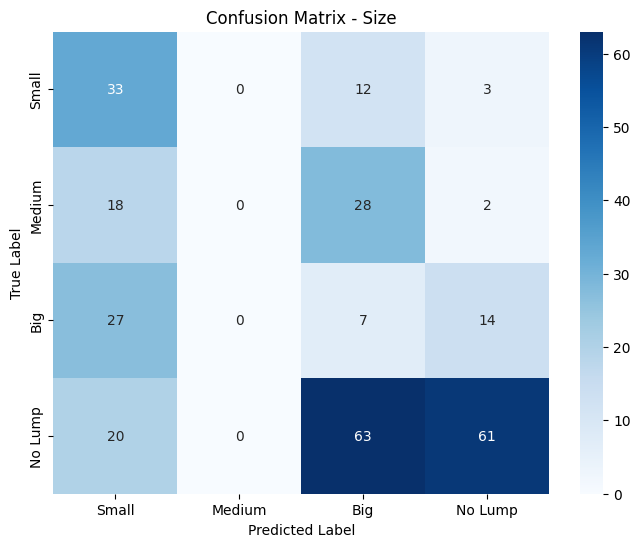


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.34      0.69      0.45        48
      Medium       0.00      0.00      0.00        48
         Big       0.06      0.15      0.09        48
     No Lump       0.76      0.42      0.54       144

    accuracy                           0.35       288
   macro avg       0.29      0.31      0.27       288
weighted avg       0.45      0.35      0.36       288


Confusion Matrix - Position:
[[  0   3  37   8]
 [  2   0  34  12]
 [  1   1  28  18]
 [  2   0  25 117]]


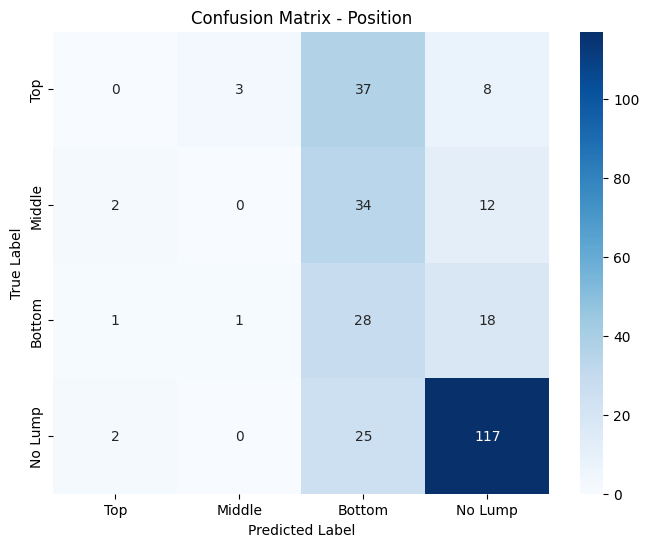


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.00      0.00      0.00        48
      Middle       0.00      0.00      0.00        48
      Bottom       0.23      0.58      0.33        48
     No Lump       0.75      0.81      0.78       144

    accuracy                           0.50       288
   macro avg       0.25      0.35      0.28       288
weighted avg       0.42      0.50      0.45       288


Fine-tuning with 2 additional trials from new dataset


Epoch 1, Training Loss: 1.5753, Validation Loss: 1.8286


Epoch 2, Training Loss: 1.6135, Validation Loss: 1.7580


Epoch 3, Training Loss: 1.6337, Validation Loss: 1.7402


Epoch 4, Training Loss: 1.5892, Validation Loss: 1.7510


Epoch 5, Training Loss: 1.5909, Validation Loss: 1.6154


Epoch 6, Training Loss: 1.5606, Validation Loss: 1.7030


Epoch 7, Training Loss: 1.5249, Validation Loss: 1.7275


Epoch 8, Training Loss: 1.5223, Validation Loss: 1.5954


Epoch 9, Training Loss: 1.5285, Validation Loss: 1.7154


Epoch 10, Training Loss: 1.4911, Validation Loss: 1.6343


Epoch 11, Training Loss: 1.4662, Validation Loss: 1.7268


Epoch 12, Training Loss: 1.4747, Validation Loss: 1.7056


Epoch 13, Training Loss: 1.4577, Validation Loss: 1.6207
Early stopping at epoch 13


Test Accuracy - Lump: 0.8715, Size: 0.5243, Position: 0.5382

Confusion Matrix - Lump:
[[127  17]
 [ 20 124]]


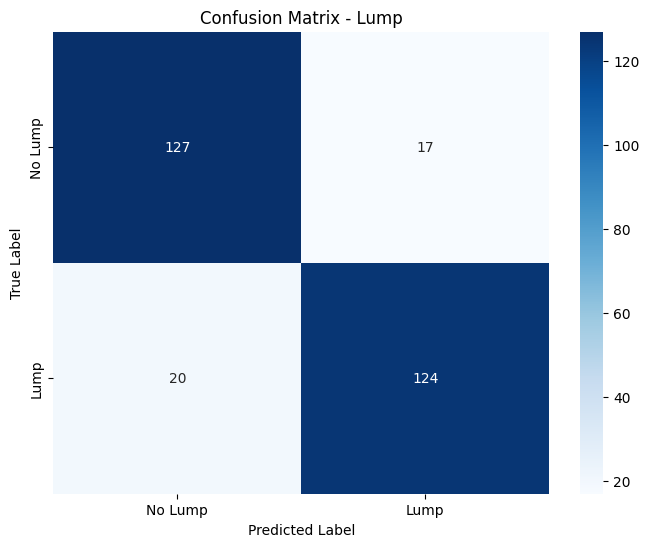


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.86      0.88      0.87       144
        Lump       0.88      0.86      0.87       144

    accuracy                           0.87       288
   macro avg       0.87      0.87      0.87       288
weighted avg       0.87      0.87      0.87       288


Confusion Matrix - Size:
[[ 29   6   5   8]
 [ 11  13  14  10]
 [ 12  11   4  21]
 [  2   1  36 105]]


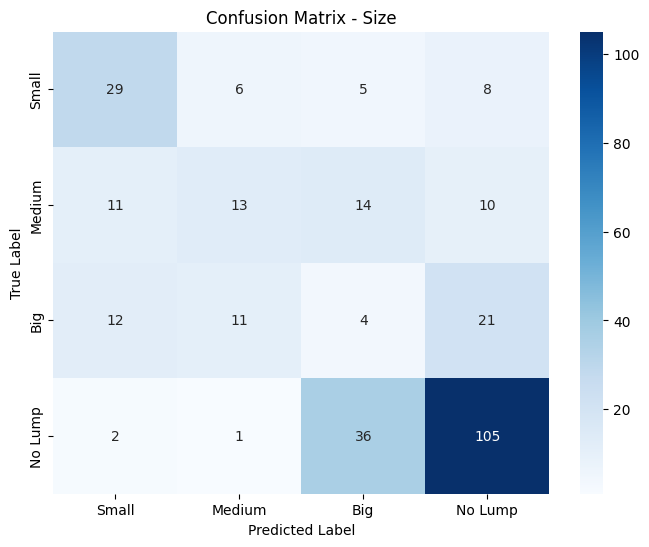


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.54      0.60      0.57        48
      Medium       0.42      0.27      0.33        48
         Big       0.07      0.08      0.07        48
     No Lump       0.73      0.73      0.73       144

    accuracy                           0.52       288
   macro avg       0.44      0.42      0.43       288
weighted avg       0.54      0.52      0.53       288


Confusion Matrix - Position:
[[  0  19  25   4]
 [  0  13  21  14]
 [  0  17  16  15]
 [ 10   6   2 126]]


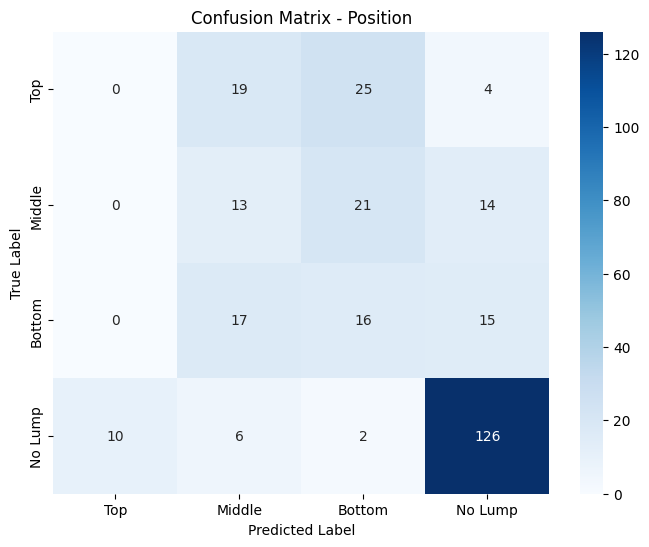


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.00      0.00      0.00        48
      Middle       0.24      0.27      0.25        48
      Bottom       0.25      0.33      0.29        48
     No Lump       0.79      0.88      0.83       144

    accuracy                           0.54       288
   macro avg       0.32      0.37      0.34       288
weighted avg       0.48      0.54      0.51       288


Fine-tuning with 3 additional trials from new dataset


Epoch 1, Training Loss: 1.5072, Validation Loss: 1.7620


Epoch 2, Training Loss: 1.4930, Validation Loss: 1.7049


Epoch 3, Training Loss: 1.4525, Validation Loss: 1.6749


Epoch 4, Training Loss: 1.4205, Validation Loss: 1.6155


Epoch 5, Training Loss: 1.4070, Validation Loss: 1.6387
Early stopping at epoch 5


Test Accuracy - Lump: 0.7153, Size: 0.3854, Position: 0.4861

Confusion Matrix - Lump:
[[ 72  72]
 [ 10 134]]


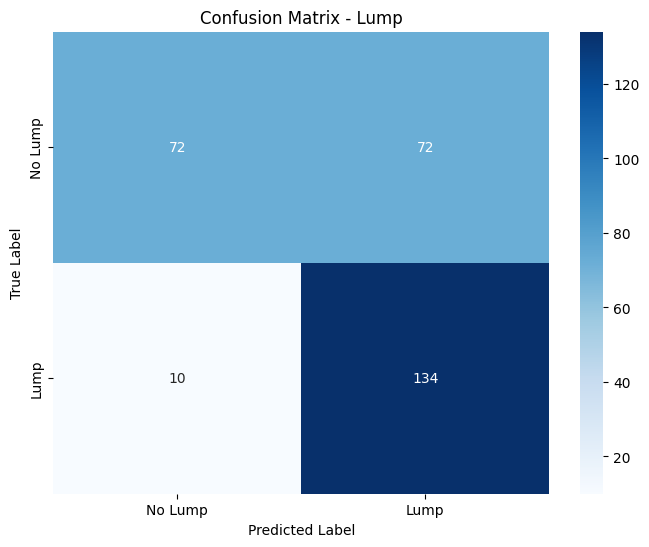


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.88      0.50      0.64       144
        Lump       0.65      0.93      0.77       144

    accuracy                           0.72       288
   macro avg       0.76      0.72      0.70       288
weighted avg       0.76      0.72      0.70       288


Confusion Matrix - Size:
[[16  8 21  3]
 [ 4  9 33  2]
 [ 6 12 18 12]
 [ 3  0 73 68]]


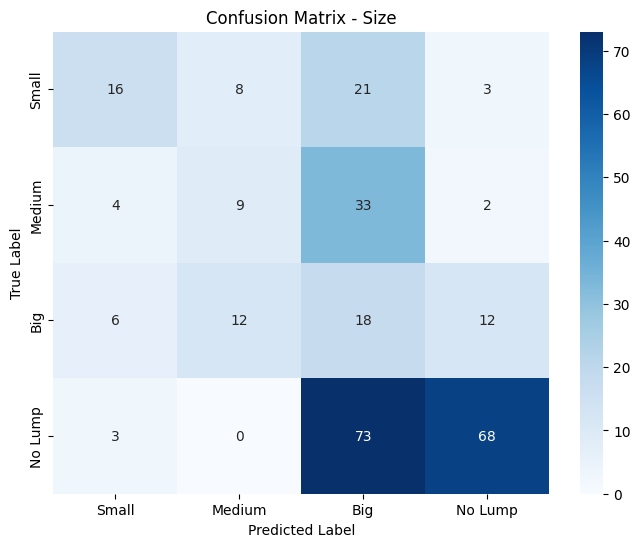


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.55      0.33      0.42        48
      Medium       0.31      0.19      0.23        48
         Big       0.12      0.38      0.19        48
     No Lump       0.80      0.47      0.59       144

    accuracy                           0.39       288
   macro avg       0.45      0.34      0.36       288
weighted avg       0.56      0.39      0.44       288


Confusion Matrix - Position:
[[26 14  8  0]
 [16 10 15  7]
 [19  8  9 12]
 [38  3  8 95]]


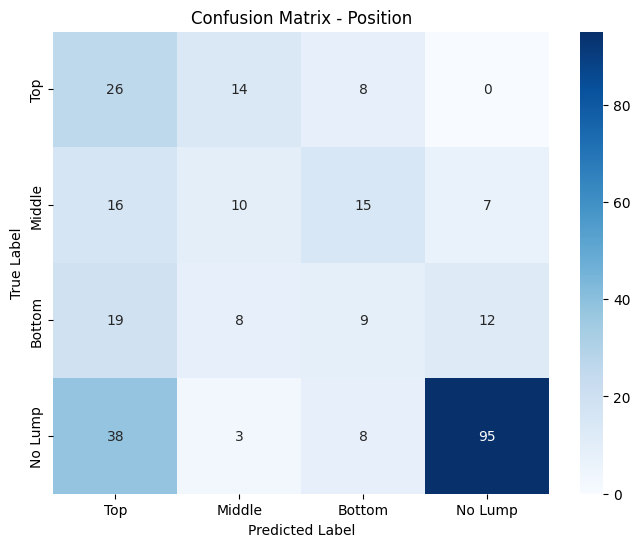


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.26      0.54      0.35        48
      Middle       0.29      0.21      0.24        48
      Bottom       0.23      0.19      0.20        48
     No Lump       0.83      0.66      0.74       144

    accuracy                           0.49       288
   macro avg       0.40      0.40      0.38       288
weighted avg       0.55      0.49      0.50       288


Fine-tuning with 4 additional trials from new dataset


Epoch 1, Training Loss: 1.4147, Validation Loss: 1.6187


Epoch 2, Training Loss: 1.4040, Validation Loss: 1.6287


Epoch 3, Training Loss: 1.3796, Validation Loss: 1.6938


Epoch 4, Training Loss: 1.4007, Validation Loss: 1.5661


Epoch 5, Training Loss: 1.3757, Validation Loss: 1.6645


Epoch 6, Training Loss: 1.3553, Validation Loss: 1.6970


Epoch 7, Training Loss: 1.3388, Validation Loss: 1.6060


Epoch 8, Training Loss: 1.3417, Validation Loss: 1.6933


Epoch 9, Training Loss: 1.3534, Validation Loss: 1.6196
Early stopping at epoch 9


Test Accuracy - Lump: 0.8438, Size: 0.6215, Position: 0.5243

Confusion Matrix - Lump:
[[102  42]
 [  3 141]]


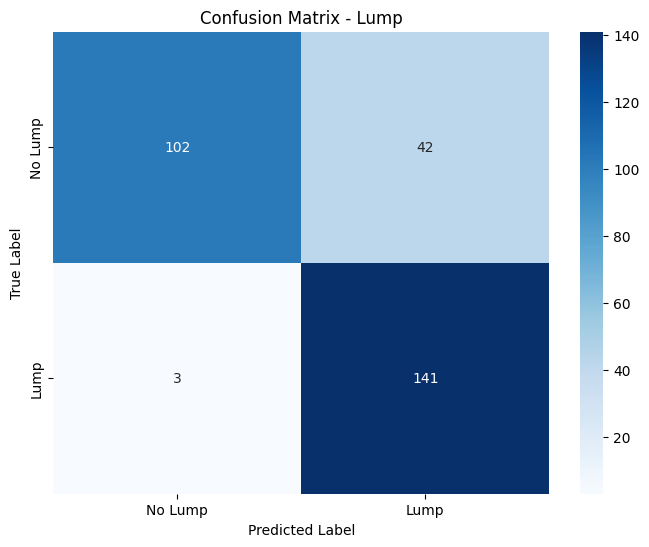


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.97      0.71      0.82       144
        Lump       0.77      0.98      0.86       144

    accuracy                           0.84       288
   macro avg       0.87      0.84      0.84       288
weighted avg       0.87      0.84      0.84       288


Confusion Matrix - Size:
[[ 26  21   1   0]
 [  5  42   0   1]
 [ 10  29   2   7]
 [  8  16  11 109]]


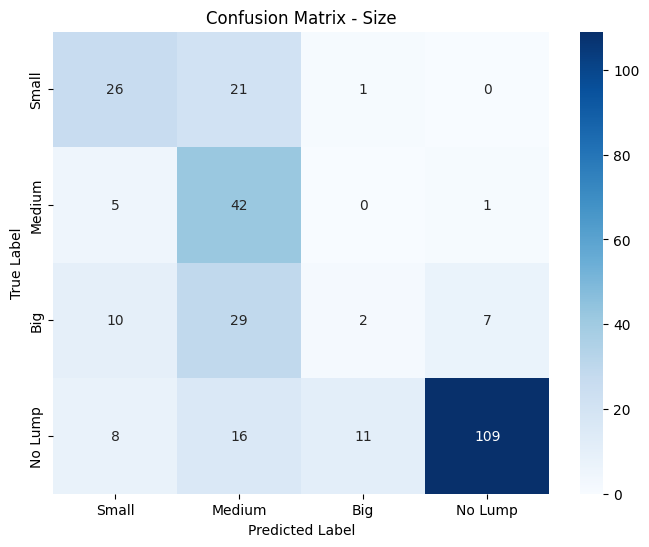


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.53      0.54      0.54        48
      Medium       0.39      0.88      0.54        48
         Big       0.14      0.04      0.06        48
     No Lump       0.93      0.76      0.84       144

    accuracy                           0.62       288
   macro avg       0.50      0.55      0.49       288
weighted avg       0.64      0.62      0.61       288


Confusion Matrix - Position:
[[  6   0  42   0]
 [  4   0  42   2]
 [  3   0  43   2]
 [  3   0  39 102]]


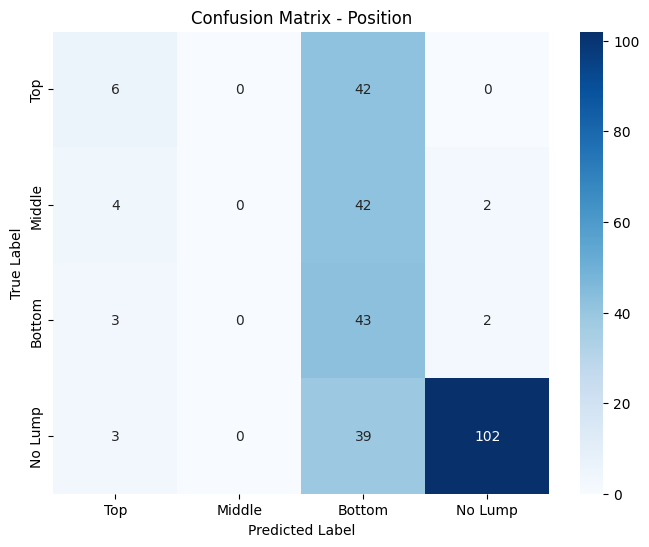


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.38      0.12      0.19        48
      Middle       0.00      0.00      0.00        48
      Bottom       0.26      0.90      0.40        48
     No Lump       0.96      0.71      0.82       144

    accuracy                           0.52       288
   macro avg       0.40      0.43      0.35       288
weighted avg       0.59      0.52      0.51       288


Fine-tuning with 5 additional trials from new dataset


Epoch 1, Training Loss: 1.3305, Validation Loss: 1.6354


Epoch 2, Training Loss: 1.3428, Validation Loss: 1.6621


Epoch 3, Training Loss: 1.3013, Validation Loss: 1.6227


Epoch 4, Training Loss: 1.3218, Validation Loss: 1.6660


Epoch 5, Training Loss: 1.2984, Validation Loss: 1.5922
Early stopping at epoch 5


Test Accuracy - Lump: 0.8229, Size: 0.5660, Position: 0.4757

Confusion Matrix - Lump:
[[100  44]
 [  7 137]]


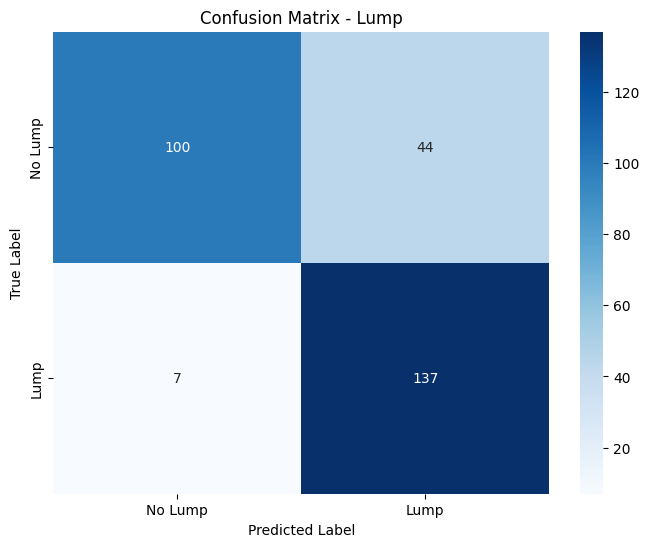


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.93      0.69      0.80       144
        Lump       0.76      0.95      0.84       144

    accuracy                           0.82       288
   macro avg       0.85      0.82      0.82       288
weighted avg       0.85      0.82      0.82       288


Confusion Matrix - Size:
[[33 11  3  1]
 [12 28  8  0]
 [20 11  7 10]
 [18  7 24 95]]


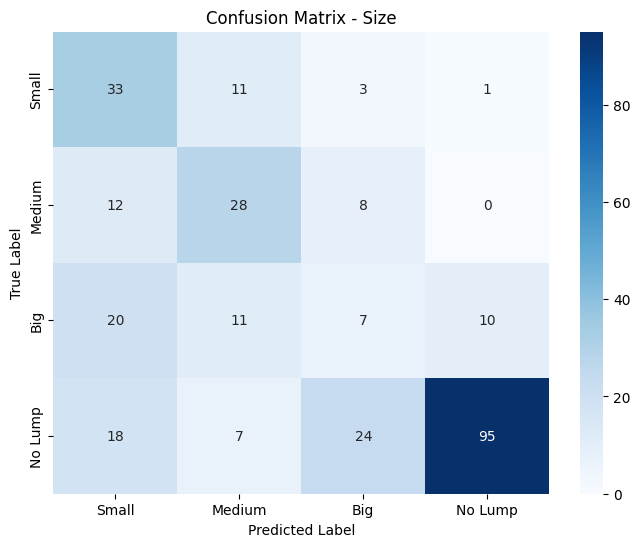


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.40      0.69      0.50        48
      Medium       0.49      0.58      0.53        48
         Big       0.17      0.15      0.16        48
     No Lump       0.90      0.66      0.76       144

    accuracy                           0.57       288
   macro avg       0.49      0.52      0.49       288
weighted avg       0.62      0.57      0.58       288


Confusion Matrix - Position:
[[ 4  3 41  0]
 [ 0  6 39  3]
 [ 0  7 34  7]
 [18  1 32 93]]


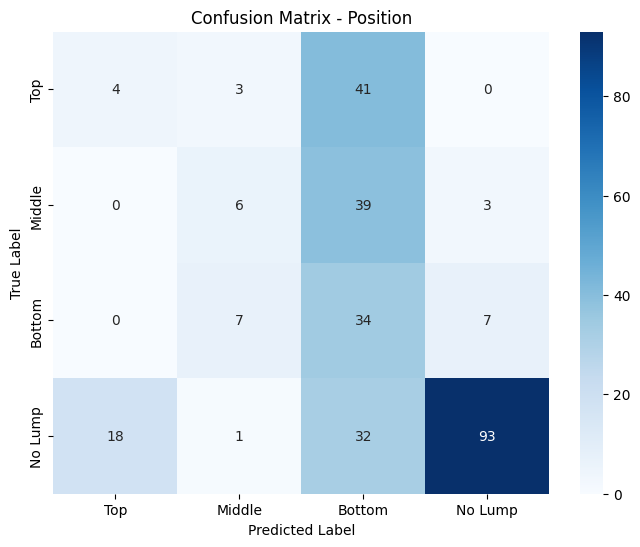


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.18      0.08      0.11        48
      Middle       0.35      0.12      0.18        48
      Bottom       0.23      0.71      0.35        48
     No Lump       0.90      0.65      0.75       144

    accuracy                           0.48       288
   macro avg       0.42      0.39      0.35       288
weighted avg       0.58      0.48      0.48       288



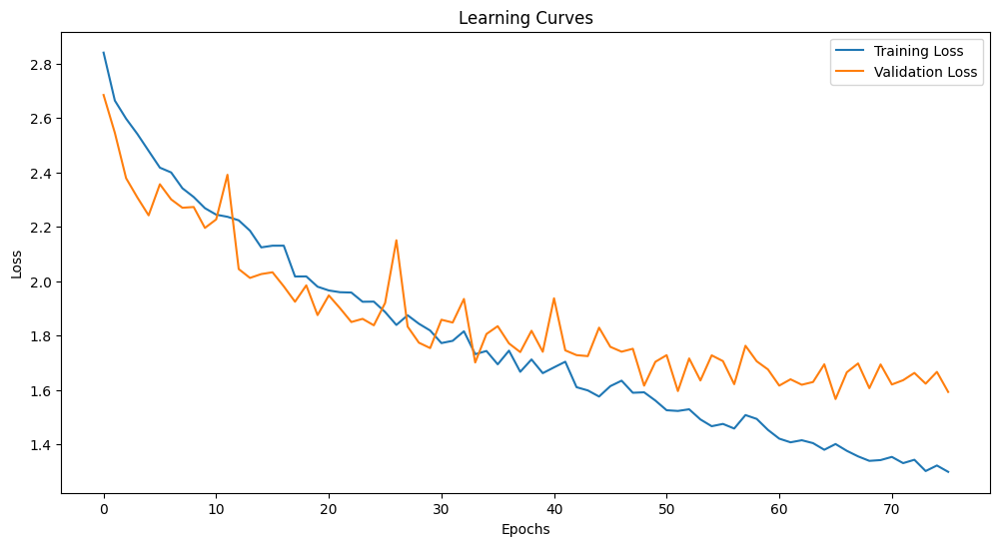

| Training Phase                         |   Lump Accuracy |   Size Accuracy |   Position Accuracy |
|:---------------------------------------|----------------:|----------------:|--------------------:|
| Initial Training                       |        0.863889 |        0.725    |            0.6625   |
| Testing on doctors without fine-tuning |        0.517361 |        0.222222 |            0.190972 |
| Fine-tuning with 1 trials              |        0.815972 |        0.350694 |            0.503472 |
| Fine-tuning with 2 trials              |        0.871528 |        0.524306 |            0.538194 |
| Fine-tuning with 3 trials              |        0.715278 |        0.385417 |            0.486111 |
| Fine-tuning with 4 trials              |        0.84375  |        0.621528 |            0.524306 |
| Fine-tuning with 5 trials              |        0.822917 |        0.565972 |            0.475694 |

Running experiment with tips_middle sensors and 6 seconds
Using 6 GPUs
Initial Training an

Epoch 1, Training Loss: 2.8623, Validation Loss: 2.5280


Epoch 2, Training Loss: 2.7153, Validation Loss: 2.5200


Epoch 3, Training Loss: 2.6357, Validation Loss: 2.3959


Epoch 4, Training Loss: 2.5376, Validation Loss: 2.3734


Epoch 5, Training Loss: 2.5124, Validation Loss: 2.4542


Epoch 6, Training Loss: 2.4621, Validation Loss: 2.5970


Epoch 7, Training Loss: 2.4453, Validation Loss: 2.2275


Epoch 8, Training Loss: 2.4041, Validation Loss: 2.2001


Epoch 9, Training Loss: 2.3718, Validation Loss: 2.2325


Epoch 10, Training Loss: 2.3339, Validation Loss: 2.1974


Epoch 11, Training Loss: 2.3100, Validation Loss: 2.2794


Epoch 12, Training Loss: 2.2375, Validation Loss: 2.1949


Epoch 13, Training Loss: 2.2220, Validation Loss: 2.1485


Epoch 14, Training Loss: 2.1836, Validation Loss: 2.0883


Epoch 15, Training Loss: 2.1839, Validation Loss: 2.1208


Epoch 16, Training Loss: 2.1535, Validation Loss: 2.1659


Epoch 17, Training Loss: 2.1165, Validation Loss: 2.1723


Epoch 18, Training Loss: 2.0619, Validation Loss: 1.9732


Epoch 19, Training Loss: 2.0706, Validation Loss: 1.9640


Epoch 20, Training Loss: 2.0124, Validation Loss: 2.0109


Epoch 21, Training Loss: 2.0066, Validation Loss: 1.9844


Epoch 22, Training Loss: 1.9946, Validation Loss: 1.8377


Epoch 23, Training Loss: 1.9614, Validation Loss: 1.9428


Epoch 24, Training Loss: 1.9424, Validation Loss: 1.8859


Epoch 25, Training Loss: 1.9202, Validation Loss: 1.8883


Epoch 26, Training Loss: 1.9100, Validation Loss: 1.9747


Epoch 27, Training Loss: 1.9364, Validation Loss: 1.9565
Early stopping at epoch 27


Test Accuracy - Lump: 0.8486, Size: 0.6917, Position: 0.6278

Confusion Matrix - Lump:
[[278  82]
 [ 27 333]]


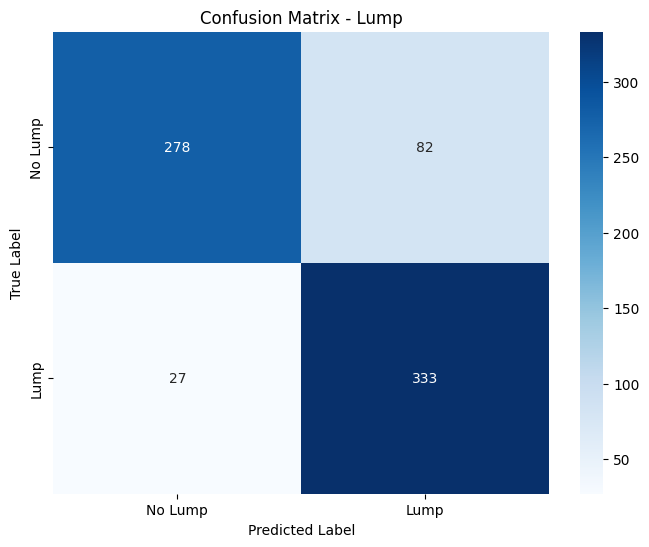


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.91      0.77      0.84       360
        Lump       0.80      0.93      0.86       360

    accuracy                           0.85       720
   macro avg       0.86      0.85      0.85       720
weighted avg       0.86      0.85      0.85       720


Confusion Matrix - Size:
[[ 82  22   6  10]
 [ 35  53  17  15]
 [ 12  25  64  19]
 [ 31  16  14 299]]


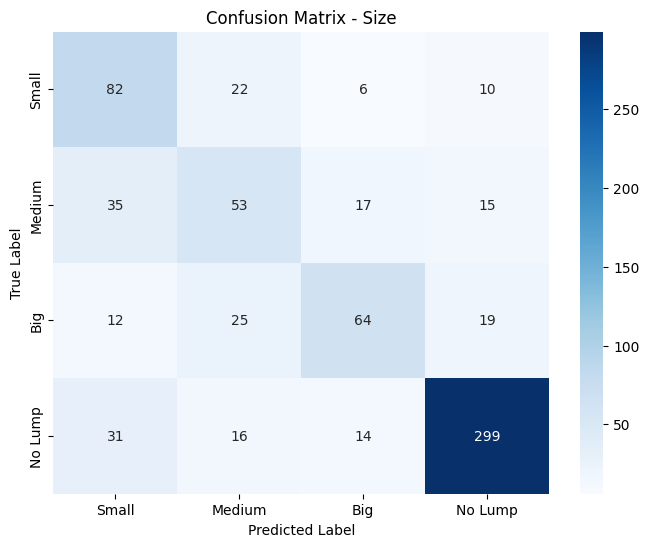


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.51      0.68      0.59       120
      Medium       0.46      0.44      0.45       120
         Big       0.63      0.53      0.58       120
     No Lump       0.87      0.83      0.85       360

    accuracy                           0.69       720
   macro avg       0.62      0.62      0.62       720
weighted avg       0.70      0.69      0.69       720


Confusion Matrix - Position:
[[ 35  37  34  14]
 [ 18  44  35  23]
 [ 13  26  64  17]
 [  2  27  22 309]]


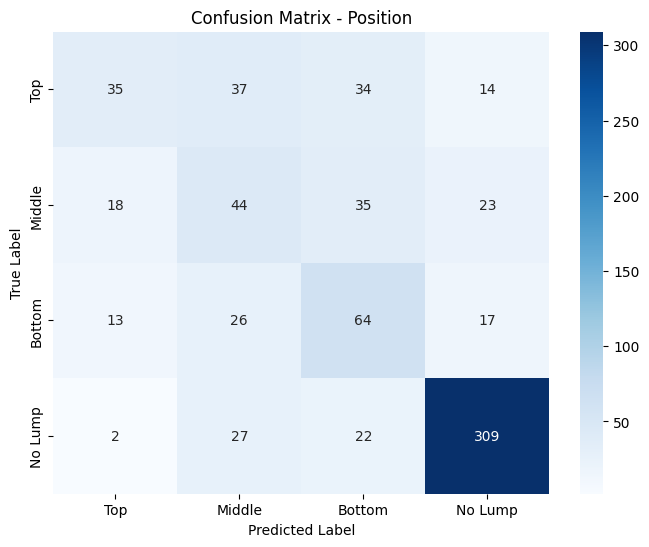


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.51      0.29      0.37       120
      Middle       0.33      0.37      0.35       120
      Bottom       0.41      0.53      0.47       120
     No Lump       0.85      0.86      0.85       360

    accuracy                           0.63       720
   macro avg       0.53      0.51      0.51       720
weighted avg       0.63      0.63      0.62       720


Testing on doctors' data without fine-tuning:


Test Accuracy - Lump: 0.5000, Size: 0.1875, Position: 0.1632

Confusion Matrix - Lump:
[[  0 144]
 [  0 144]]


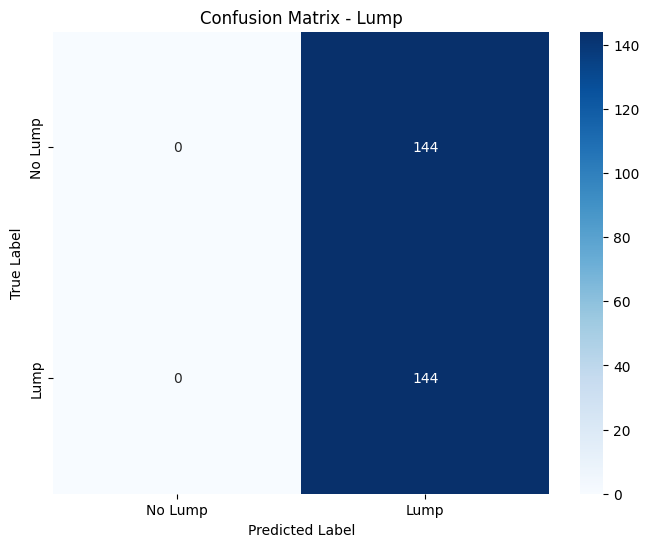


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.00      0.00      0.00       144
        Lump       0.50      1.00      0.67       144

    accuracy                           0.50       288
   macro avg       0.25      0.50      0.33       288
weighted avg       0.25      0.50      0.33       288


Confusion Matrix - Size:
[[41  6  1  0]
 [31 11  6  0]
 [45  1  2  0]
 [44  5 95  0]]


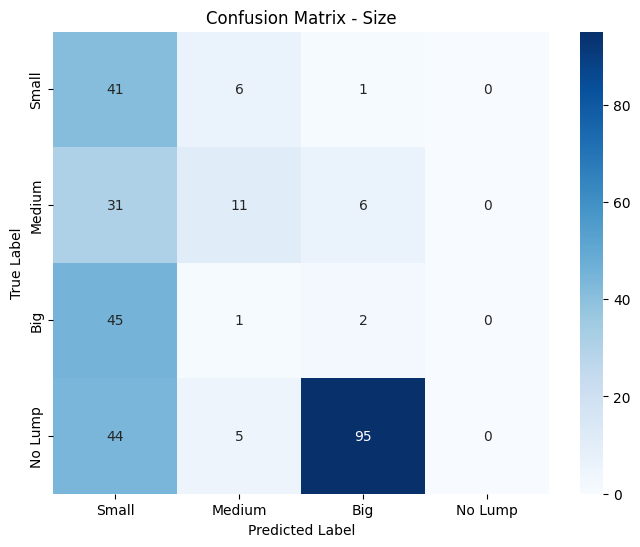


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.25      0.85      0.39        48
      Medium       0.48      0.23      0.31        48
         Big       0.02      0.04      0.03        48
     No Lump       0.00      0.00      0.00       144

    accuracy                           0.19       288
   macro avg       0.19      0.28      0.18       288
weighted avg       0.13      0.19      0.12       288


Confusion Matrix - Position:
[[ 0 43  5  0]
 [ 0 37 11  0]
 [ 0 38 10  0]
 [ 0 48 96  0]]


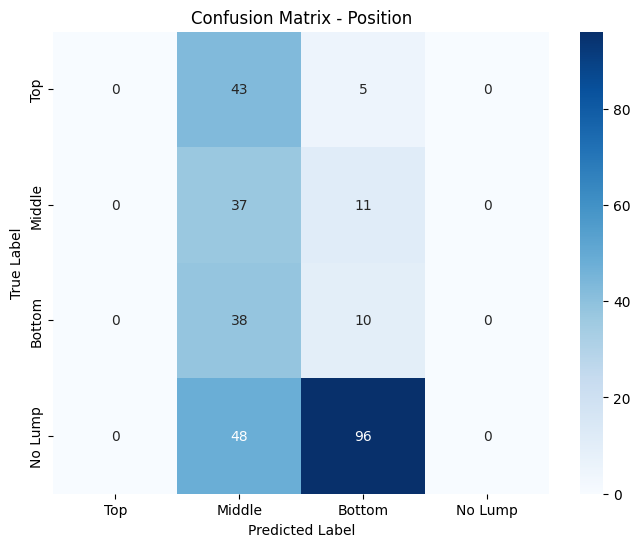


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.00      0.00      0.00        48
      Middle       0.22      0.77      0.35        48
      Bottom       0.08      0.21      0.12        48
     No Lump       0.00      0.00      0.00       144

    accuracy                           0.16       288
   macro avg       0.08      0.24      0.12       288
weighted avg       0.05      0.16      0.08       288


Fine-tuning with 1 additional trials from new dataset


Epoch 1, Training Loss: 1.9118, Validation Loss: 1.8929


Epoch 2, Training Loss: 1.8960, Validation Loss: 1.8982


Epoch 3, Training Loss: 1.8806, Validation Loss: 1.8171


Epoch 4, Training Loss: 1.8124, Validation Loss: 1.9453


Epoch 5, Training Loss: 1.8342, Validation Loss: 1.9167


Epoch 6, Training Loss: 1.8133, Validation Loss: 1.8862


Epoch 7, Training Loss: 1.7715, Validation Loss: 1.8993


Epoch 8, Training Loss: 1.7718, Validation Loss: 1.9135
Early stopping at epoch 8


Test Accuracy - Lump: 0.5104, Size: 0.2257, Position: 0.3194

Confusion Matrix - Lump:
[[73 71]
 [70 74]]


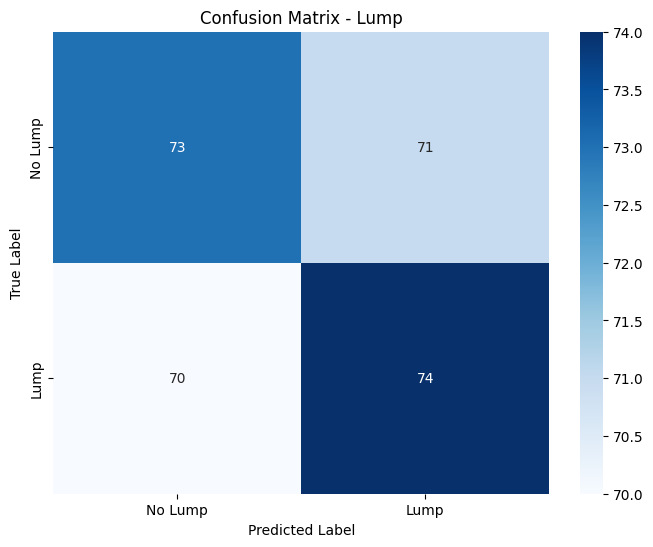


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.51      0.51      0.51       144
        Lump       0.51      0.51      0.51       144

    accuracy                           0.51       288
   macro avg       0.51      0.51      0.51       288
weighted avg       0.51      0.51      0.51       288


Confusion Matrix - Size:
[[ 1  0  6 41]
 [ 0  1 14 33]
 [ 0  0  2 46]
 [ 0  0 83 61]]


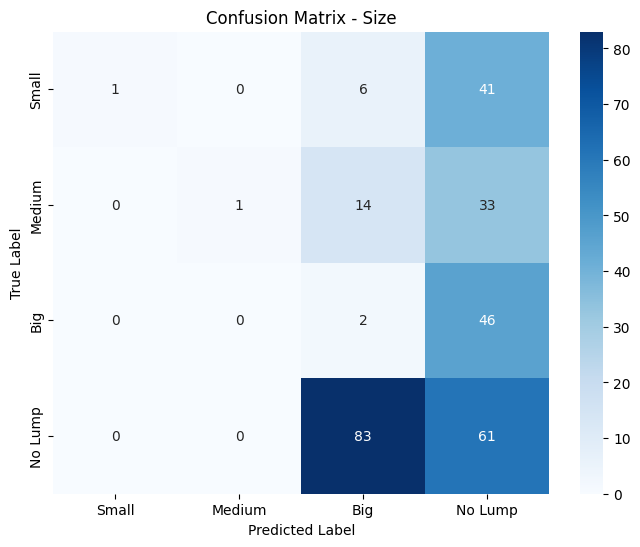


Classification Report - Size:
              precision    recall  f1-score   support

       Small       1.00      0.02      0.04        48
      Medium       1.00      0.02      0.04        48
         Big       0.02      0.04      0.03        48
     No Lump       0.34      0.42      0.38       144

    accuracy                           0.23       288
   macro avg       0.59      0.13      0.12       288
weighted avg       0.51      0.23      0.21       288


Confusion Matrix - Position:
[[ 1  0  2 45]
 [ 0  0  4 44]
 [ 0  1  6 41]
 [ 0  0 59 85]]


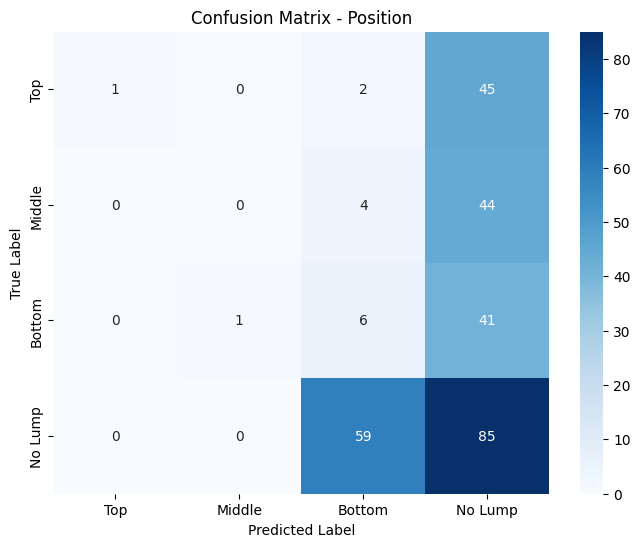


Classification Report - Position:
              precision    recall  f1-score   support

         Top       1.00      0.02      0.04        48
      Middle       0.00      0.00      0.00        48
      Bottom       0.08      0.12      0.10        48
     No Lump       0.40      0.59      0.47       144

    accuracy                           0.32       288
   macro avg       0.37      0.18      0.15       288
weighted avg       0.38      0.32      0.26       288


Fine-tuning with 2 additional trials from new dataset


Epoch 1, Training Loss: 1.7588, Validation Loss: 1.8352


Epoch 2, Training Loss: 1.7686, Validation Loss: 1.7941


Epoch 3, Training Loss: 1.7421, Validation Loss: 1.7982


Epoch 4, Training Loss: 1.7328, Validation Loss: 1.8070


Epoch 5, Training Loss: 1.7290, Validation Loss: 1.7113


Epoch 6, Training Loss: 1.7376, Validation Loss: 1.6731


Epoch 7, Training Loss: 1.6111, Validation Loss: 1.7531


Epoch 8, Training Loss: 1.6291, Validation Loss: 1.6823


Epoch 9, Training Loss: 1.6518, Validation Loss: 1.6533


Epoch 10, Training Loss: 1.6765, Validation Loss: 1.7066


Epoch 11, Training Loss: 1.6129, Validation Loss: 2.1208


Epoch 12, Training Loss: 1.5843, Validation Loss: 1.7591


Epoch 13, Training Loss: 1.6259, Validation Loss: 1.6327


Epoch 14, Training Loss: 1.5743, Validation Loss: 1.8699


Epoch 15, Training Loss: 1.5410, Validation Loss: 1.6823


Epoch 16, Training Loss: 1.5468, Validation Loss: 1.6311


Epoch 17, Training Loss: 1.5464, Validation Loss: 1.6971


Epoch 18, Training Loss: 1.4930, Validation Loss: 1.7217


Epoch 19, Training Loss: 1.5245, Validation Loss: 1.6223


Epoch 20, Training Loss: 1.4698, Validation Loss: 1.9085


Epoch 21, Training Loss: 1.5219, Validation Loss: 1.6011


Epoch 22, Training Loss: 1.4670, Validation Loss: 1.8368


Epoch 23, Training Loss: 1.4745, Validation Loss: 1.5913


Epoch 24, Training Loss: 1.4253, Validation Loss: 1.6816


Epoch 25, Training Loss: 1.4357, Validation Loss: 1.5638


Epoch 26, Training Loss: 1.4176, Validation Loss: 1.7445


Epoch 27, Training Loss: 1.4259, Validation Loss: 1.7741


Epoch 28, Training Loss: 1.3650, Validation Loss: 1.6937


Epoch 29, Training Loss: 1.3823, Validation Loss: 1.5741


Epoch 30, Training Loss: 1.4520, Validation Loss: 1.6803
Early stopping at epoch 30


Test Accuracy - Lump: 0.8333, Size: 0.5799, Position: 0.5868

Confusion Matrix - Lump:
[[141   3]
 [ 45  99]]


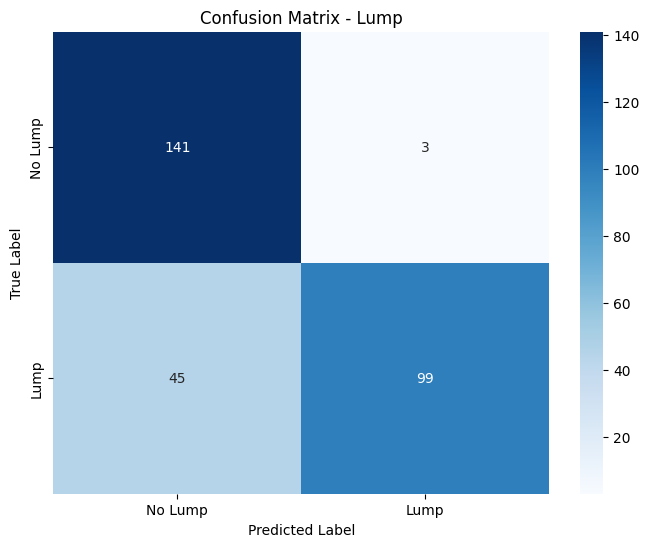


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.76      0.98      0.85       144
        Lump       0.97      0.69      0.80       144

    accuracy                           0.83       288
   macro avg       0.86      0.83      0.83       288
weighted avg       0.86      0.83      0.83       288


Confusion Matrix - Size:
[[ 14   6   7  21]
 [  5   7  14  22]
 [  0  11   4  33]
 [  1   0   1 142]]


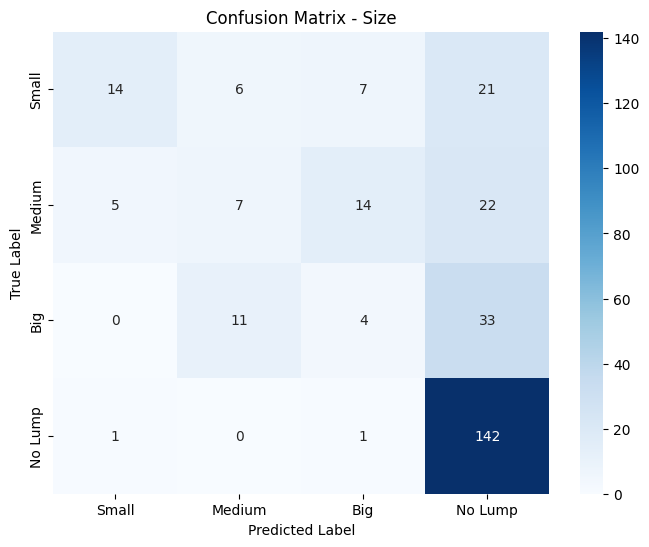


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.70      0.29      0.41        48
      Medium       0.29      0.15      0.19        48
         Big       0.15      0.08      0.11        48
     No Lump       0.65      0.99      0.78       144

    accuracy                           0.58       288
   macro avg       0.45      0.38      0.37       288
weighted avg       0.52      0.58      0.51       288


Confusion Matrix - Position:
[[ 22   7   0  19]
 [ 11   3   2  32]
 [ 21   3   2  22]
 [  2   0   0 142]]


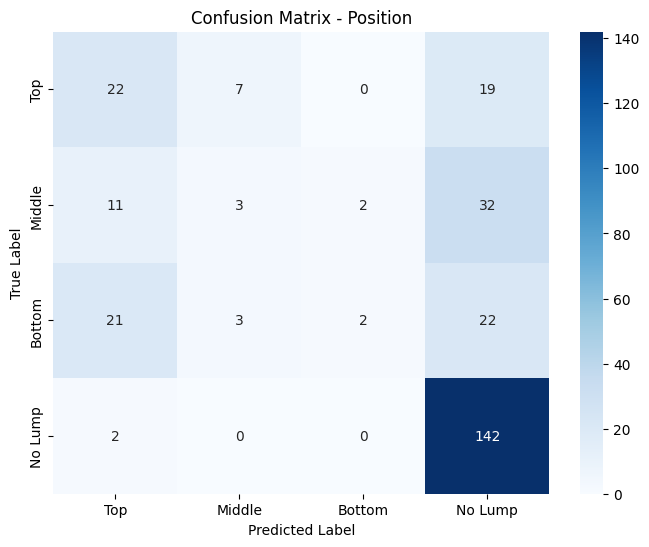


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.39      0.46      0.42        48
      Middle       0.23      0.06      0.10        48
      Bottom       0.50      0.04      0.08        48
     No Lump       0.66      0.99      0.79       144

    accuracy                           0.59       288
   macro avg       0.45      0.39      0.35       288
weighted avg       0.52      0.59      0.50       288


Fine-tuning with 3 additional trials from new dataset


Epoch 1, Training Loss: 1.3846, Validation Loss: 1.6923


Epoch 2, Training Loss: 1.4104, Validation Loss: 1.9648


Epoch 3, Training Loss: 1.3853, Validation Loss: 1.6081


Epoch 4, Training Loss: 1.3935, Validation Loss: 1.7589


Epoch 5, Training Loss: 1.3639, Validation Loss: 1.6061
Early stopping at epoch 5


Test Accuracy - Lump: 0.8785, Size: 0.6042, Position: 0.6389

Confusion Matrix - Lump:
[[140   4]
 [ 31 113]]


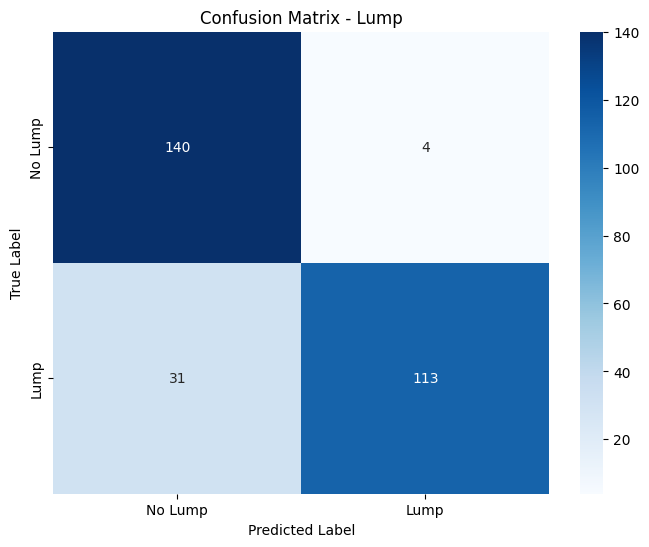


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.82      0.97      0.89       144
        Lump       0.97      0.78      0.87       144

    accuracy                           0.88       288
   macro avg       0.89      0.88      0.88       288
weighted avg       0.89      0.88      0.88       288


Confusion Matrix - Size:
[[ 20   8   7  13]
 [  7  14  18   9]
 [  6  11   1  30]
 [  2   0   3 139]]


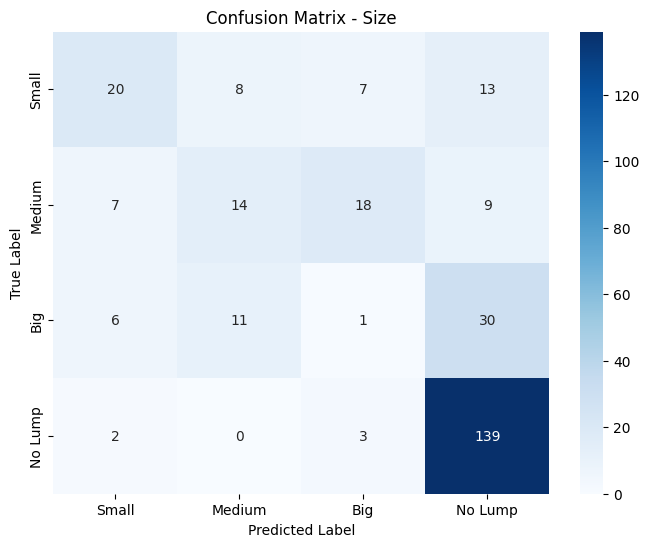


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.57      0.42      0.48        48
      Medium       0.42      0.29      0.35        48
         Big       0.03      0.02      0.03        48
     No Lump       0.73      0.97      0.83       144

    accuracy                           0.60       288
   macro avg       0.44      0.42      0.42       288
weighted avg       0.54      0.60      0.56       288


Confusion Matrix - Position:
[[ 36   3   1   8]
 [ 19   6   6  17]
 [ 31   0   2  15]
 [  3   0   1 140]]


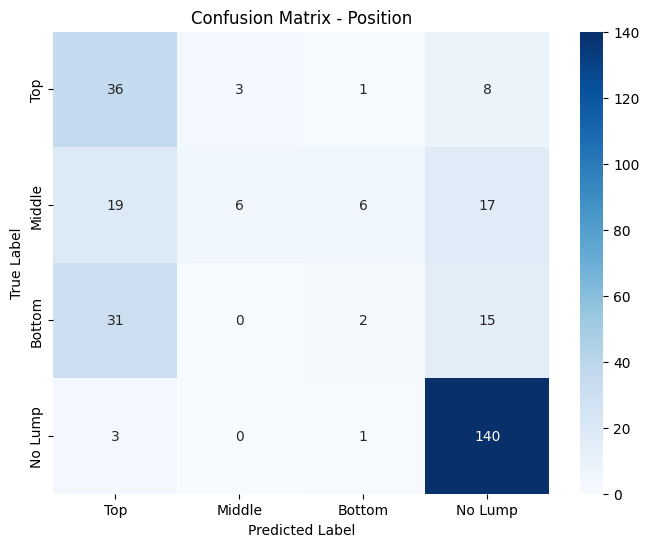


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.40      0.75      0.53        48
      Middle       0.67      0.12      0.21        48
      Bottom       0.20      0.04      0.07        48
     No Lump       0.78      0.97      0.86       144

    accuracy                           0.64       288
   macro avg       0.51      0.47      0.42       288
weighted avg       0.60      0.64      0.57       288


Fine-tuning with 4 additional trials from new dataset


Epoch 1, Training Loss: 1.3105, Validation Loss: 1.6128


Epoch 2, Training Loss: 1.3776, Validation Loss: 1.5035


Epoch 3, Training Loss: 1.3231, Validation Loss: 1.6931


Epoch 4, Training Loss: 1.3192, Validation Loss: 1.5677


Epoch 5, Training Loss: 1.3423, Validation Loss: 1.5334


Epoch 6, Training Loss: 1.2728, Validation Loss: 1.7037


Epoch 7, Training Loss: 1.2736, Validation Loss: 1.5920
Early stopping at epoch 7


Test Accuracy - Lump: 0.8264, Size: 0.6215, Position: 0.5764

Confusion Matrix - Lump:
[[143   1]
 [ 49  95]]


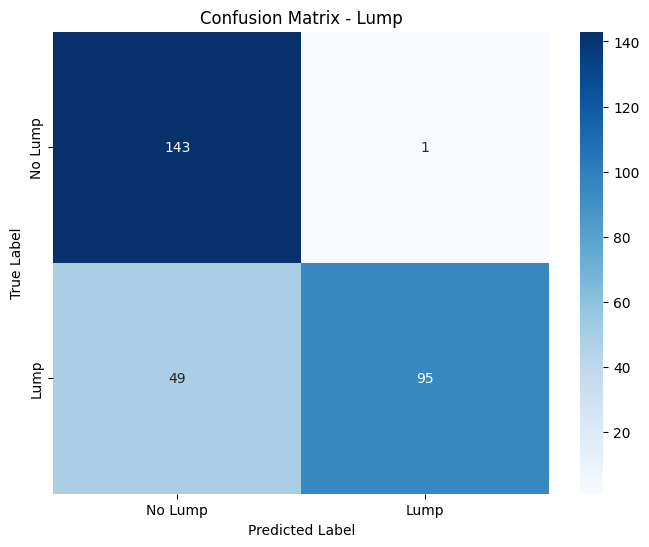


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.74      0.99      0.85       144
        Lump       0.99      0.66      0.79       144

    accuracy                           0.83       288
   macro avg       0.87      0.83      0.82       288
weighted avg       0.87      0.83      0.82       288


Confusion Matrix - Size:
[[ 31   2   0  15]
 [ 25   5   0  18]
 [ 16   2   0  30]
 [  1   0   0 143]]


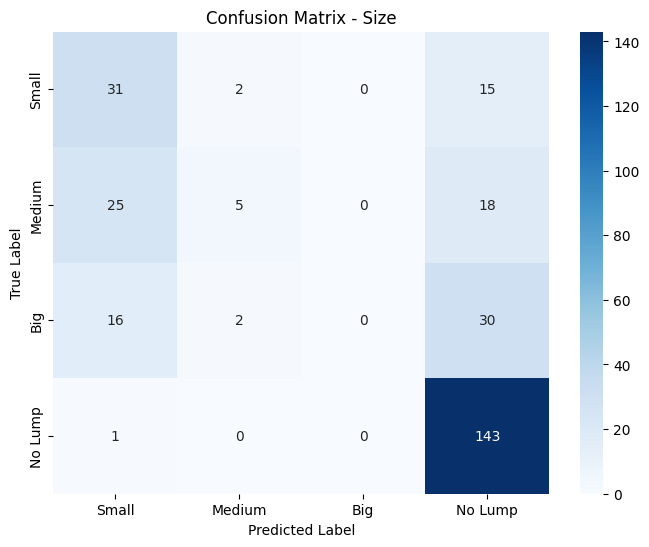


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.42      0.65      0.51        48
      Medium       0.56      0.10      0.18        48
         Big       0.00      0.00      0.00        48
     No Lump       0.69      0.99      0.82       144

    accuracy                           0.62       288
   macro avg       0.42      0.44      0.38       288
weighted avg       0.51      0.62      0.52       288


Confusion Matrix - Position:
[[ 17   9   1  21]
 [  8   4   2  34]
 [ 17   3   2  26]
 [  1   0   0 143]]


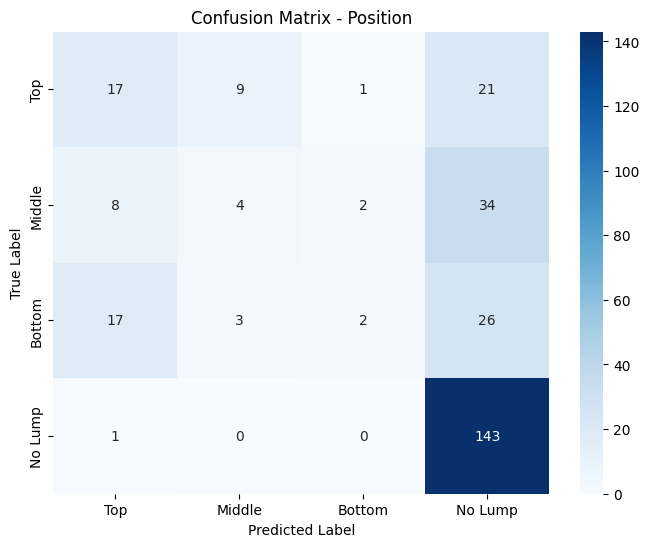


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.40      0.35      0.37        48
      Middle       0.25      0.08      0.12        48
      Bottom       0.40      0.04      0.08        48
     No Lump       0.64      0.99      0.78       144

    accuracy                           0.58       288
   macro avg       0.42      0.37      0.34       288
weighted avg       0.49      0.58      0.48       288


Fine-tuning with 5 additional trials from new dataset


Epoch 1, Training Loss: 1.3126, Validation Loss: 1.5220


Epoch 2, Training Loss: 1.2741, Validation Loss: 1.6082


Epoch 3, Training Loss: 1.3246, Validation Loss: 1.5284


Epoch 4, Training Loss: 1.2571, Validation Loss: 1.5906


Epoch 5, Training Loss: 1.2596, Validation Loss: 1.7401
Early stopping at epoch 5


Test Accuracy - Lump: 0.8889, Size: 0.6458, Position: 0.6250

Confusion Matrix - Lump:
[[140   4]
 [ 28 116]]


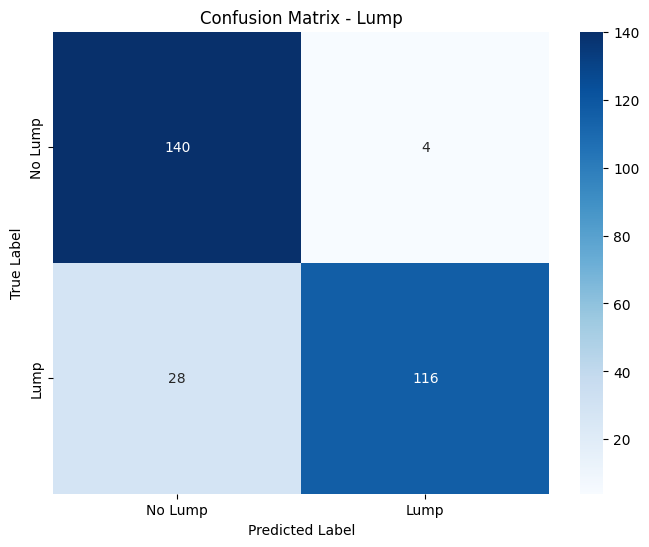


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.83      0.97      0.90       144
        Lump       0.97      0.81      0.88       144

    accuracy                           0.89       288
   macro avg       0.90      0.89      0.89       288
weighted avg       0.90      0.89      0.89       288


Confusion Matrix - Size:
[[ 39   3   2   4]
 [ 32   4   3   9]
 [ 22   1   1  24]
 [  2   0   0 142]]


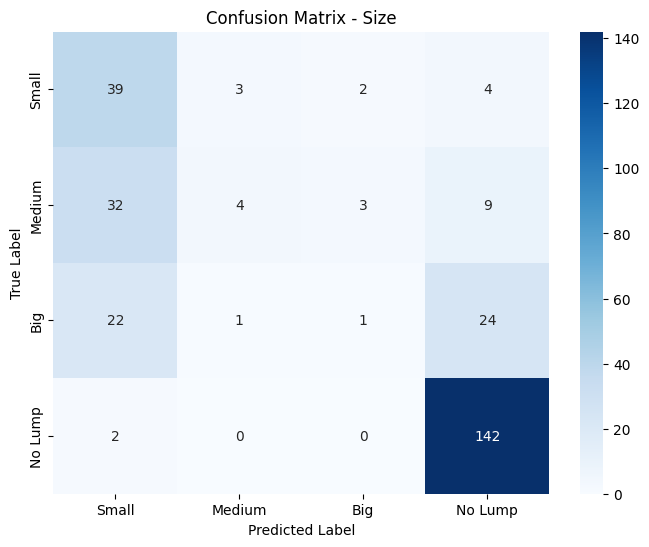


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.41      0.81      0.55        48
      Medium       0.50      0.08      0.14        48
         Big       0.17      0.02      0.04        48
     No Lump       0.79      0.99      0.88       144

    accuracy                           0.65       288
   macro avg       0.47      0.48      0.40       288
weighted avg       0.58      0.65      0.56       288


Confusion Matrix - Position:
[[ 11   9  21   7]
 [  3   5  24  16]
 [  4   4  23  17]
 [  0   0   3 141]]


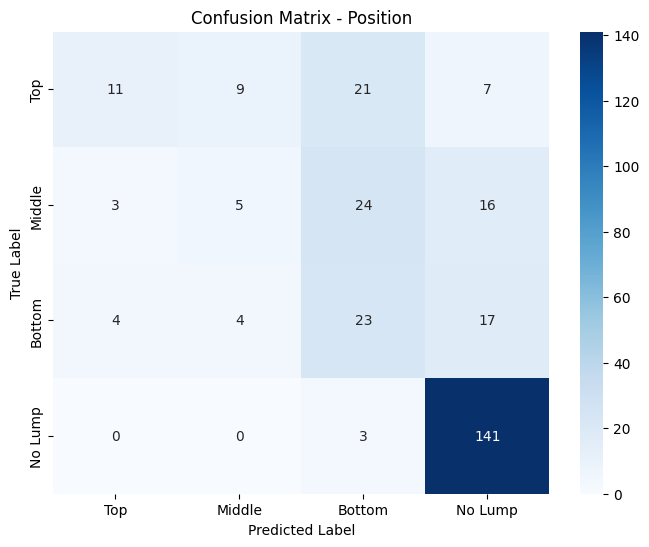


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.61      0.23      0.33        48
      Middle       0.28      0.10      0.15        48
      Bottom       0.32      0.48      0.39        48
     No Lump       0.78      0.98      0.87       144

    accuracy                           0.62       288
   macro avg       0.50      0.45      0.43       288
weighted avg       0.59      0.62      0.58       288



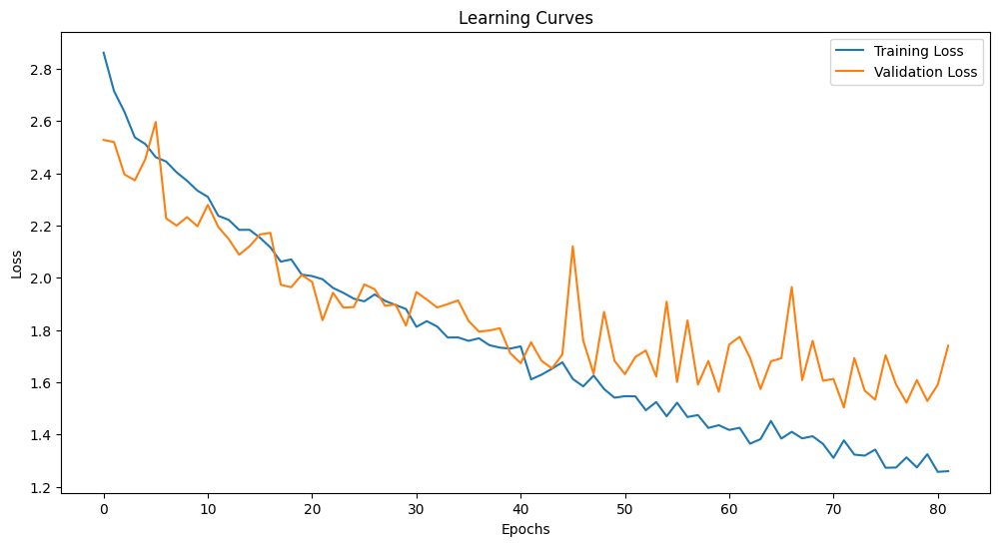

| Training Phase                         |   Lump Accuracy |   Size Accuracy |   Position Accuracy |
|:---------------------------------------|----------------:|----------------:|--------------------:|
| Initial Training                       |        0.848611 |        0.691667 |            0.627778 |
| Testing on doctors without fine-tuning |        0.5      |        0.1875   |            0.163194 |
| Fine-tuning with 1 trials              |        0.510417 |        0.225694 |            0.319444 |
| Fine-tuning with 2 trials              |        0.833333 |        0.579861 |            0.586806 |
| Fine-tuning with 3 trials              |        0.878472 |        0.604167 |            0.638889 |
| Fine-tuning with 4 trials              |        0.826389 |        0.621528 |            0.576389 |
| Fine-tuning with 5 trials              |        0.888889 |        0.645833 |            0.625    |

Running experiment with tips_middle sensors and 7 seconds
Using 6 GPUs
Initial Training an

Epoch 1, Training Loss: 2.8500, Validation Loss: 2.4683


Epoch 2, Training Loss: 2.6874, Validation Loss: 2.5539


Epoch 3, Training Loss: 2.6057, Validation Loss: 2.3820


Epoch 4, Training Loss: 2.5482, Validation Loss: 2.5260


Epoch 5, Training Loss: 2.4950, Validation Loss: 2.2820


Epoch 6, Training Loss: 2.4918, Validation Loss: 2.4212


Epoch 7, Training Loss: 2.4237, Validation Loss: 2.2175


Epoch 8, Training Loss: 2.4007, Validation Loss: 2.2242


Epoch 9, Training Loss: 2.3707, Validation Loss: 2.2355


Epoch 10, Training Loss: 2.2931, Validation Loss: 2.2590


Epoch 11, Training Loss: 2.2726, Validation Loss: 2.1215


Epoch 12, Training Loss: 2.2771, Validation Loss: 2.1392


Epoch 13, Training Loss: 2.2305, Validation Loss: 2.1664


Epoch 14, Training Loss: 2.2089, Validation Loss: 2.0526


Epoch 15, Training Loss: 2.1882, Validation Loss: 2.1974


Epoch 16, Training Loss: 2.1336, Validation Loss: 2.0735


Epoch 17, Training Loss: 2.1410, Validation Loss: 1.9999


Epoch 18, Training Loss: 2.1540, Validation Loss: 1.9836


Epoch 19, Training Loss: 2.0596, Validation Loss: 2.0323


Epoch 20, Training Loss: 2.0233, Validation Loss: 2.0187


Epoch 21, Training Loss: 2.0336, Validation Loss: 2.0382


Epoch 22, Training Loss: 2.0024, Validation Loss: 2.0509


Epoch 23, Training Loss: 1.9595, Validation Loss: 1.9898
Early stopping at epoch 23


Test Accuracy - Lump: 0.8250, Size: 0.6917, Position: 0.6306

Confusion Matrix - Lump:
[[314  46]
 [ 80 280]]


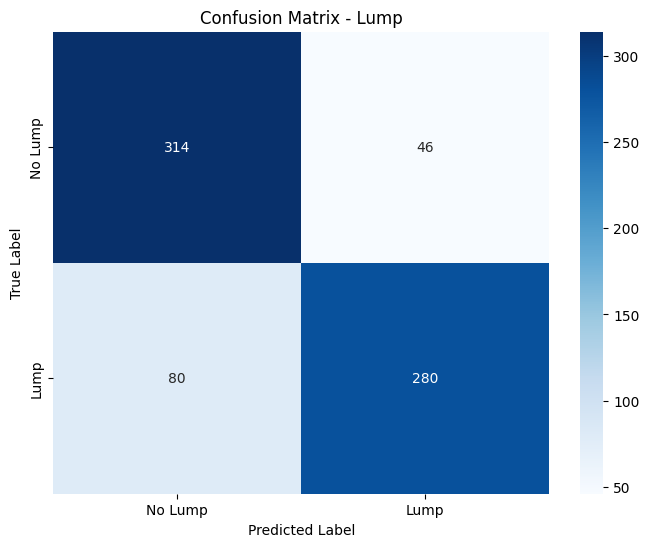


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.80      0.87      0.83       360
        Lump       0.86      0.78      0.82       360

    accuracy                           0.82       720
   macro avg       0.83      0.82      0.82       720
weighted avg       0.83      0.82      0.82       720


Confusion Matrix - Size:
[[ 62  15  10  33]
 [ 19  47  23  31]
 [  6  23  62  29]
 [ 11   7  15 327]]


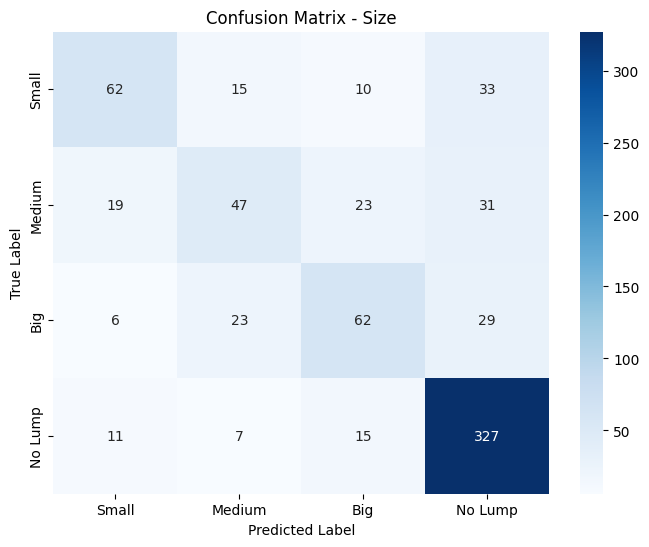


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.63      0.52      0.57       120
      Medium       0.51      0.39      0.44       120
         Big       0.56      0.52      0.54       120
     No Lump       0.78      0.91      0.84       360

    accuracy                           0.69       720
   macro avg       0.62      0.58      0.60       720
weighted avg       0.67      0.69      0.68       720


Confusion Matrix - Position:
[[ 56   8  18  38]
 [ 28  15  31  46]
 [ 24  11  54  31]
 [ 13   3  15 329]]


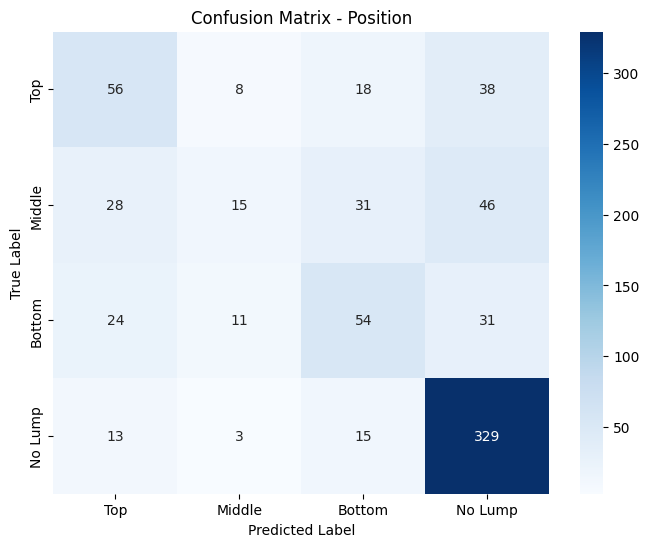


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.46      0.47      0.46       120
      Middle       0.41      0.12      0.19       120
      Bottom       0.46      0.45      0.45       120
     No Lump       0.74      0.91      0.82       360

    accuracy                           0.63       720
   macro avg       0.52      0.49      0.48       720
weighted avg       0.59      0.63      0.59       720


Testing on doctors' data without fine-tuning:


Test Accuracy - Lump: 0.2778, Size: 0.1493, Position: 0.1944

Confusion Matrix - Lump:
[[ 41 103]
 [105  39]]


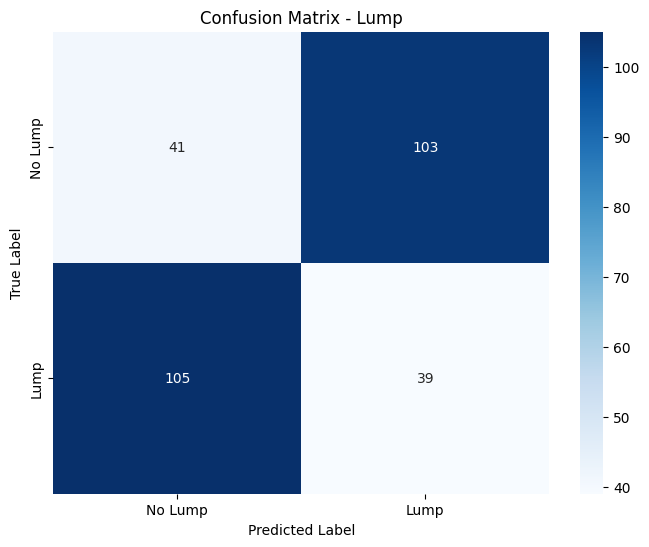


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.28      0.28      0.28       144
        Lump       0.27      0.27      0.27       144

    accuracy                           0.28       288
   macro avg       0.28      0.28      0.28       288
weighted avg       0.28      0.28      0.28       288


Confusion Matrix - Size:
[[  0   0  10  38]
 [  0   0  19  29]
 [  0   0   2  46]
 [  0   0 103  41]]


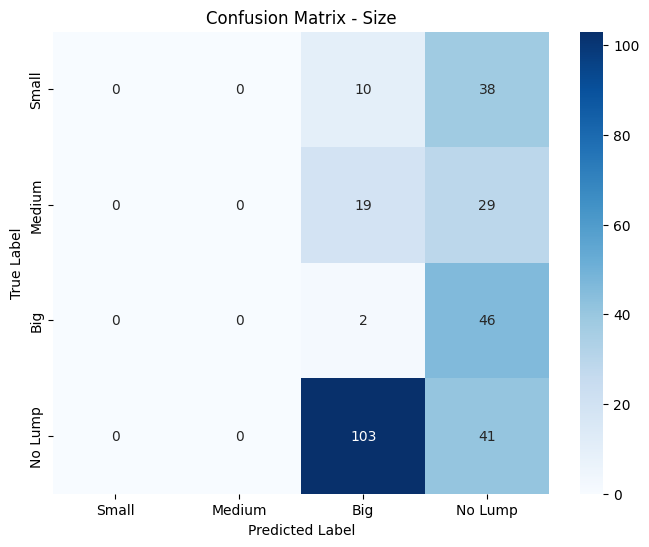


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.00      0.00      0.00        48
      Medium       0.00      0.00      0.00        48
         Big       0.01      0.04      0.02        48
     No Lump       0.27      0.28      0.28       144

    accuracy                           0.15       288
   macro avg       0.07      0.08      0.07       288
weighted avg       0.14      0.15      0.14       288


Confusion Matrix - Position:
[[ 3  2  0 43]
 [10  3  0 35]
 [ 9  1  0 38]
 [90  4  0 50]]


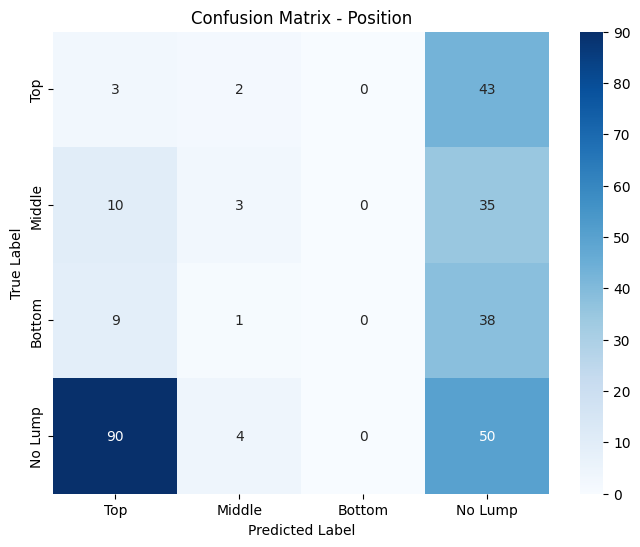


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.03      0.06      0.04        48
      Middle       0.30      0.06      0.10        48
      Bottom       0.00      0.00      0.00        48
     No Lump       0.30      0.35      0.32       144

    accuracy                           0.19       288
   macro avg       0.16      0.12      0.12       288
weighted avg       0.21      0.19      0.18       288


Fine-tuning with 1 additional trials from new dataset


Epoch 1, Training Loss: 1.9614, Validation Loss: 1.9122


Epoch 2, Training Loss: 1.9587, Validation Loss: 1.9362


Epoch 3, Training Loss: 1.9396, Validation Loss: 2.0175


Epoch 4, Training Loss: 1.9490, Validation Loss: 1.8162


Epoch 5, Training Loss: 1.9187, Validation Loss: 1.8224


Epoch 6, Training Loss: 1.9120, Validation Loss: 1.8126


Epoch 7, Training Loss: 1.8954, Validation Loss: 1.9169


Epoch 8, Training Loss: 1.8453, Validation Loss: 2.4174


Epoch 9, Training Loss: 1.8267, Validation Loss: 1.8749


Epoch 10, Training Loss: 1.8307, Validation Loss: 1.8334


Epoch 11, Training Loss: 1.7971, Validation Loss: 1.8373
Early stopping at epoch 11


Test Accuracy - Lump: 0.8194, Size: 0.3576, Position: 0.5382

Confusion Matrix - Lump:
[[110  34]
 [ 18 126]]


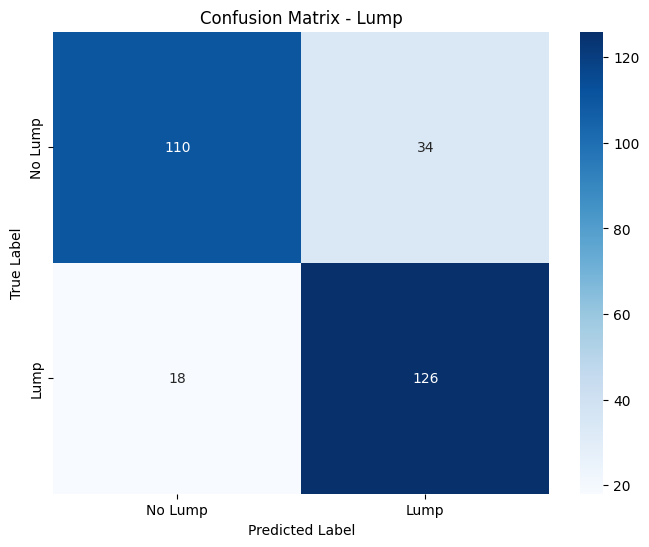


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.86      0.76      0.81       144
        Lump       0.79      0.88      0.83       144

    accuracy                           0.82       288
   macro avg       0.82      0.82      0.82       288
weighted avg       0.82      0.82      0.82       288


Confusion Matrix - Size:
[[28  1  5 14]
 [21  2  9 16]
 [24  2  4 18]
 [ 5  8 62 69]]


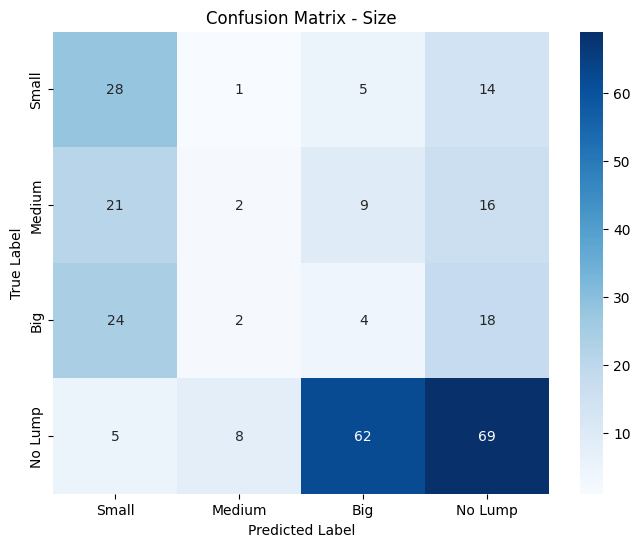


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.36      0.58      0.44        48
      Medium       0.15      0.04      0.07        48
         Big       0.05      0.08      0.06        48
     No Lump       0.59      0.48      0.53       144

    accuracy                           0.36       288
   macro avg       0.29      0.30      0.28       288
weighted avg       0.39      0.36      0.36       288


Confusion Matrix - Position:
[[  0  39   4   5]
 [  0  26   4  18]
 [  0  23   8  17]
 [  0  19   4 121]]


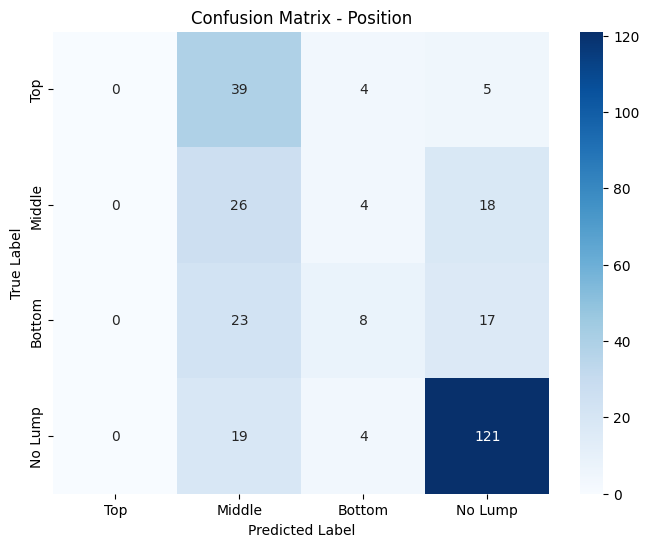


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.00      0.00      0.00        48
      Middle       0.24      0.54      0.34        48
      Bottom       0.40      0.17      0.24        48
     No Lump       0.75      0.84      0.79       144

    accuracy                           0.54       288
   macro avg       0.35      0.39      0.34       288
weighted avg       0.48      0.54      0.49       288


Fine-tuning with 2 additional trials from new dataset


Epoch 1, Training Loss: 1.7857, Validation Loss: 1.8301


Epoch 2, Training Loss: 1.7792, Validation Loss: 1.8005


Epoch 3, Training Loss: 1.7517, Validation Loss: 1.7145


Epoch 4, Training Loss: 1.7531, Validation Loss: 1.7994


Epoch 5, Training Loss: 1.7269, Validation Loss: 1.7829


Epoch 6, Training Loss: 1.7302, Validation Loss: 1.7477


Epoch 7, Training Loss: 1.6707, Validation Loss: 1.7161


Epoch 8, Training Loss: 1.6863, Validation Loss: 1.7818
Early stopping at epoch 8


Test Accuracy - Lump: 0.8368, Size: 0.5972, Position: 0.5972

Confusion Matrix - Lump:
[[116  28]
 [ 19 125]]


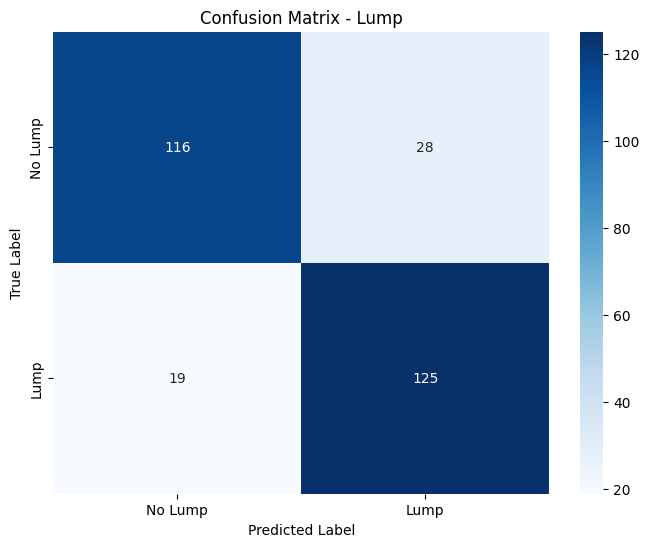


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.86      0.81      0.83       144
        Lump       0.82      0.87      0.84       144

    accuracy                           0.84       288
   macro avg       0.84      0.84      0.84       288
weighted avg       0.84      0.84      0.84       288


Confusion Matrix - Size:
[[ 43   0   0   5]
 [ 30   1   3  14]
 [ 35   0   0  13]
 [ 15   1   0 128]]


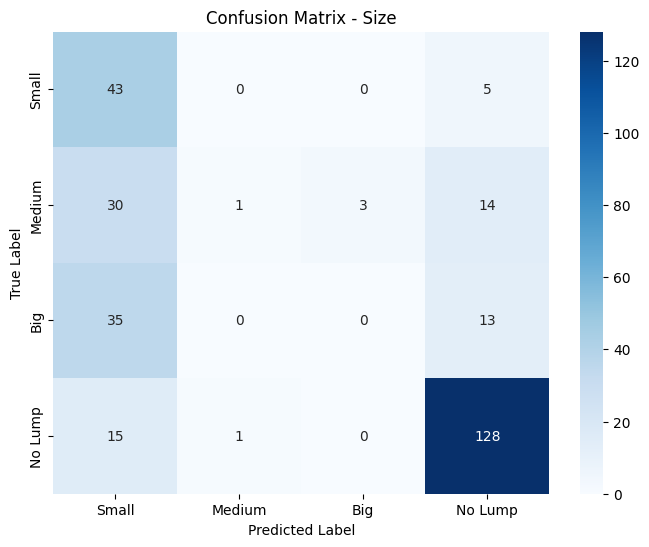


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.35      0.90      0.50        48
      Medium       0.50      0.02      0.04        48
         Big       0.00      0.00      0.00        48
     No Lump       0.80      0.89      0.84       144

    accuracy                           0.60       288
   macro avg       0.41      0.45      0.35       288
weighted avg       0.54      0.60      0.51       288


Confusion Matrix - Position:
[[ 26  20   0   2]
 [ 19  10   0  19]
 [ 25   6   1  16]
 [  3   6   0 135]]


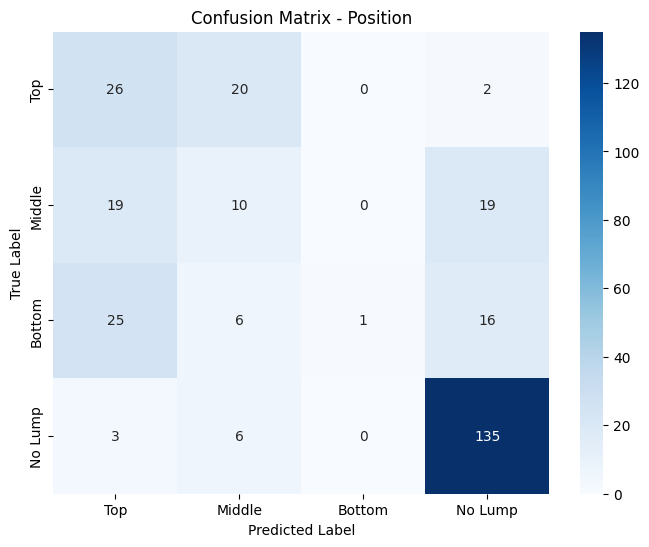


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.36      0.54      0.43        48
      Middle       0.24      0.21      0.22        48
      Bottom       1.00      0.02      0.04        48
     No Lump       0.78      0.94      0.85       144

    accuracy                           0.60       288
   macro avg       0.59      0.43      0.39       288
weighted avg       0.66      0.60      0.54       288


Fine-tuning with 3 additional trials from new dataset


Epoch 1, Training Loss: 1.6641, Validation Loss: 1.7643


Epoch 2, Training Loss: 1.7042, Validation Loss: 1.7414


Epoch 3, Training Loss: 1.6669, Validation Loss: 2.2155


Epoch 4, Training Loss: 1.6431, Validation Loss: 1.6750


Epoch 5, Training Loss: 1.6644, Validation Loss: 1.8415


Epoch 6, Training Loss: 1.6202, Validation Loss: 1.7214


Epoch 7, Training Loss: 1.5800, Validation Loss: 1.5803


Epoch 8, Training Loss: 1.5919, Validation Loss: 1.6126


Epoch 9, Training Loss: 1.6116, Validation Loss: 1.6606


Epoch 10, Training Loss: 1.5428, Validation Loss: 1.6874


Epoch 11, Training Loss: 1.4998, Validation Loss: 1.7969


Epoch 12, Training Loss: 1.5510, Validation Loss: 1.6660
Early stopping at epoch 12


Test Accuracy - Lump: 0.5104, Size: 0.2639, Position: 0.2083

Confusion Matrix - Lump:
[[  3 141]
 [  0 144]]


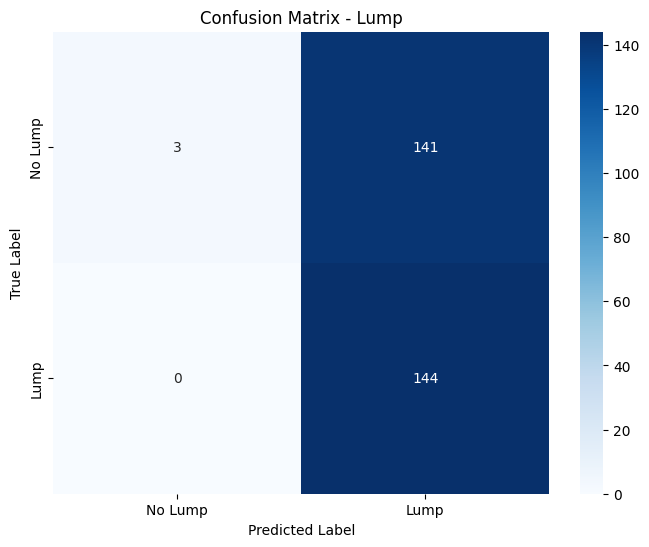


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       1.00      0.02      0.04       144
        Lump       0.51      1.00      0.67       144

    accuracy                           0.51       288
   macro avg       0.75      0.51      0.36       288
weighted avg       0.75      0.51      0.36       288


Confusion Matrix - Size:
[[ 38   2   8   0]
 [ 26   2  20   0]
 [ 25   0  23   0]
 [  6   1 124  13]]


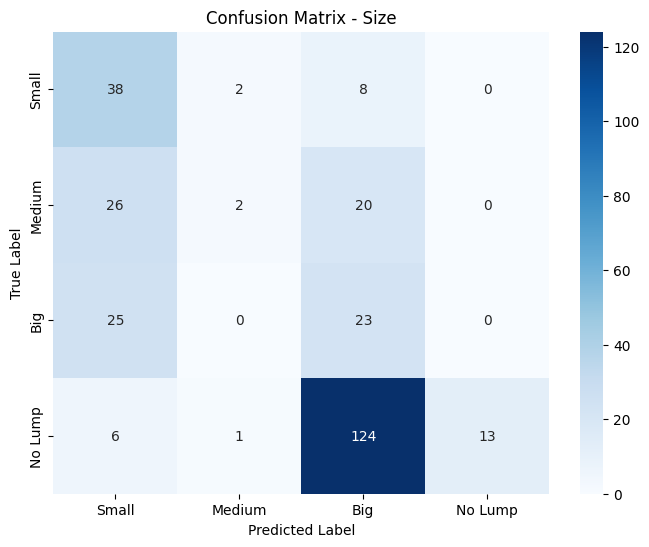


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.40      0.79      0.53        48
      Medium       0.40      0.04      0.08        48
         Big       0.13      0.48      0.21        48
     No Lump       1.00      0.09      0.17       144

    accuracy                           0.26       288
   macro avg       0.48      0.35      0.24       288
weighted avg       0.66      0.26      0.22       288


Confusion Matrix - Position:
[[ 8  2 38  0]
 [12  2 33  1]
 [22  1 23  2]
 [98  5 14 27]]


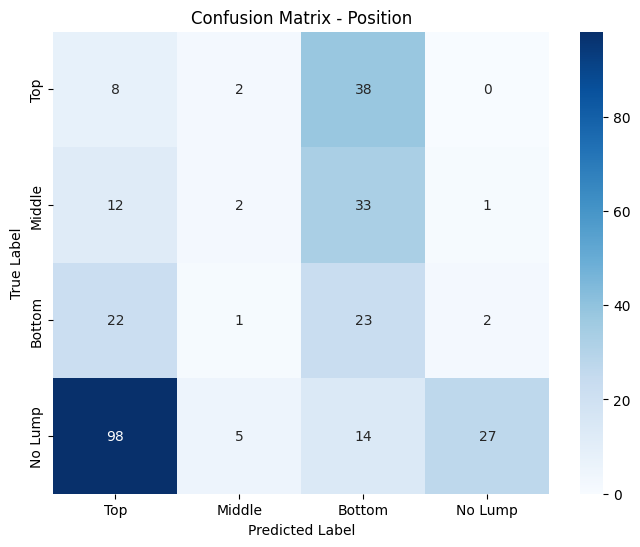


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.06      0.17      0.09        48
      Middle       0.20      0.04      0.07        48
      Bottom       0.21      0.48      0.29        48
     No Lump       0.90      0.19      0.31       144

    accuracy                           0.21       288
   macro avg       0.34      0.22      0.19       288
weighted avg       0.53      0.21      0.23       288


Fine-tuning with 4 additional trials from new dataset


Epoch 1, Training Loss: 1.4975, Validation Loss: 1.5886


Epoch 2, Training Loss: 1.5052, Validation Loss: 1.7884


Epoch 3, Training Loss: 1.4628, Validation Loss: 1.5817


Epoch 4, Training Loss: 1.5000, Validation Loss: 1.7759


Epoch 5, Training Loss: 1.4854, Validation Loss: 1.7031
Early stopping at epoch 5


Test Accuracy - Lump: 0.8993, Size: 0.6285, Position: 0.6007

Confusion Matrix - Lump:
[[134  10]
 [ 19 125]]


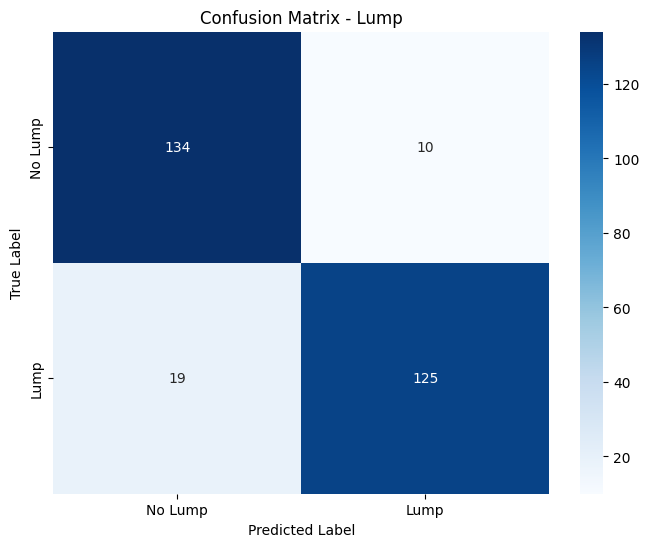


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.88      0.93      0.90       144
        Lump       0.93      0.87      0.90       144

    accuracy                           0.90       288
   macro avg       0.90      0.90      0.90       288
weighted avg       0.90      0.90      0.90       288


Confusion Matrix - Size:
[[ 41   1   3   3]
 [ 32   2   6   8]
 [ 25   0   1  22]
 [  2   0   5 137]]


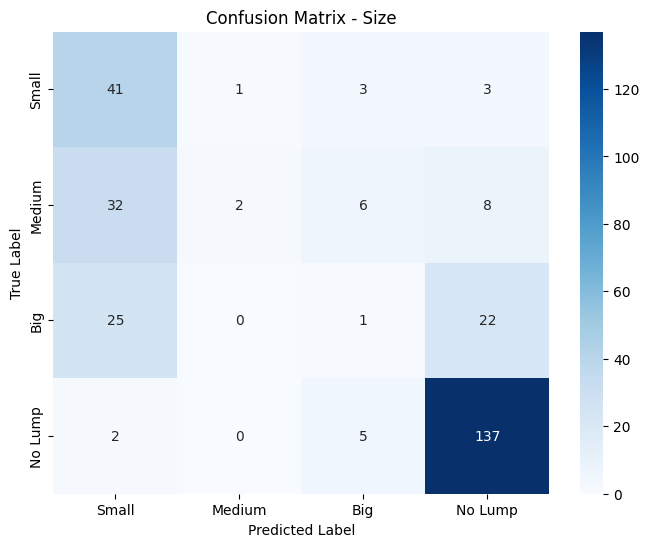


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.41      0.85      0.55        48
      Medium       0.67      0.04      0.08        48
         Big       0.07      0.02      0.03        48
     No Lump       0.81      0.95      0.87       144

    accuracy                           0.63       288
   macro avg       0.49      0.47      0.38       288
weighted avg       0.59      0.63      0.55       288


Confusion Matrix - Position:
[[ 14   5  24   5]
 [ 14   5  16  13]
 [ 12   1  18  17]
 [  4   0   4 136]]


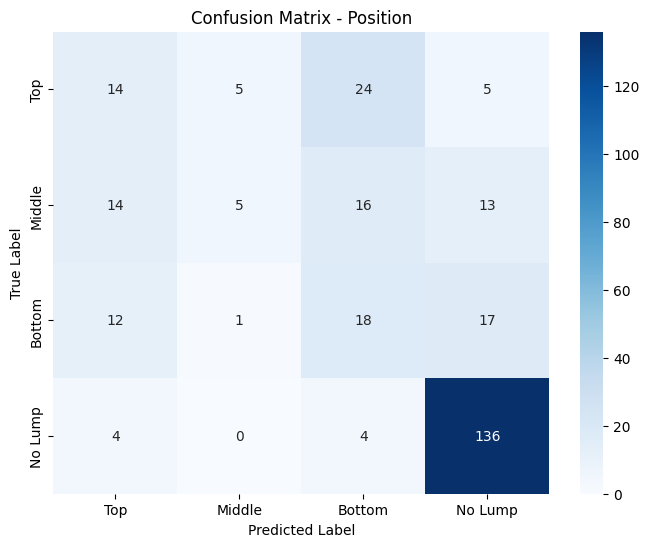


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.32      0.29      0.30        48
      Middle       0.45      0.10      0.17        48
      Bottom       0.29      0.38      0.33        48
     No Lump       0.80      0.94      0.86       144

    accuracy                           0.60       288
   macro avg       0.46      0.43      0.42       288
weighted avg       0.57      0.60      0.57       288


Fine-tuning with 5 additional trials from new dataset


Epoch 1, Training Loss: 1.4862, Validation Loss: 1.6569


Epoch 2, Training Loss: 1.3969, Validation Loss: 1.5945


Epoch 3, Training Loss: 1.4603, Validation Loss: 1.6108


Epoch 4, Training Loss: 1.4362, Validation Loss: 1.6821


Epoch 5, Training Loss: 1.4264, Validation Loss: 1.7884
Early stopping at epoch 5


Test Accuracy - Lump: 0.8715, Size: 0.6111, Position: 0.5694

Confusion Matrix - Lump:
[[117  27]
 [ 10 134]]


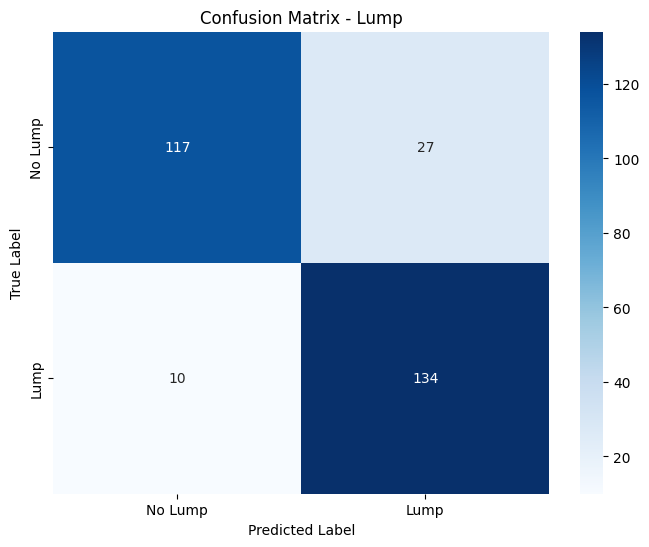


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.92      0.81      0.86       144
        Lump       0.83      0.93      0.88       144

    accuracy                           0.87       288
   macro avg       0.88      0.87      0.87       288
weighted avg       0.88      0.87      0.87       288


Confusion Matrix - Size:
[[ 45   2   0   1]
 [ 42   6   0   0]
 [ 29   5   1  13]
 [ 11   9   0 124]]


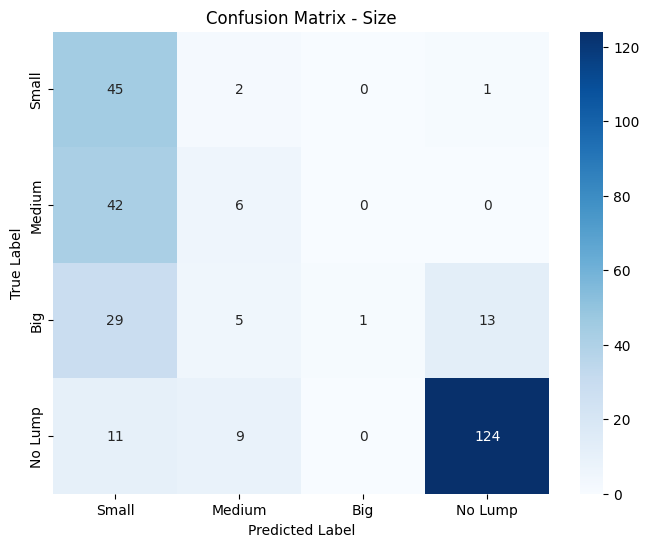


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.35      0.94      0.51        48
      Medium       0.27      0.12      0.17        48
         Big       1.00      0.02      0.04        48
     No Lump       0.90      0.86      0.88       144

    accuracy                           0.61       288
   macro avg       0.63      0.49      0.40       288
weighted avg       0.72      0.61      0.56       288


Confusion Matrix - Position:
[[ 48   0   0   0]
 [ 46   0   0   2]
 [ 38   0   0  10]
 [ 23   5   0 116]]


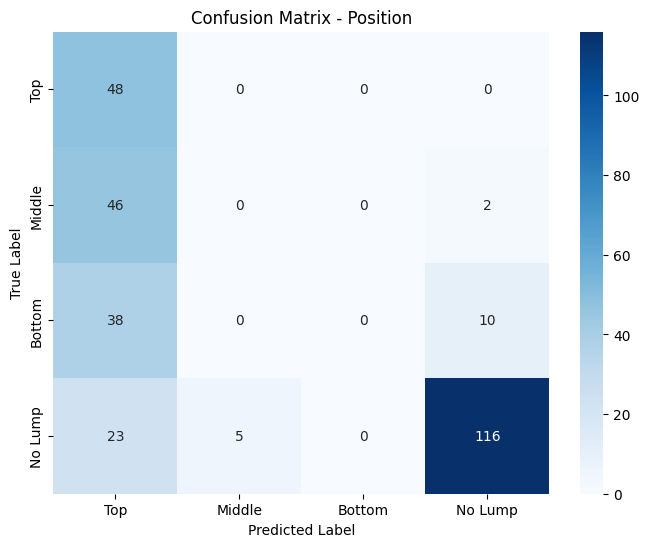


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.31      1.00      0.47        48
      Middle       0.00      0.00      0.00        48
      Bottom       0.00      0.00      0.00        48
     No Lump       0.91      0.81      0.85       144

    accuracy                           0.57       288
   macro avg       0.30      0.45      0.33       288
weighted avg       0.50      0.57      0.51       288



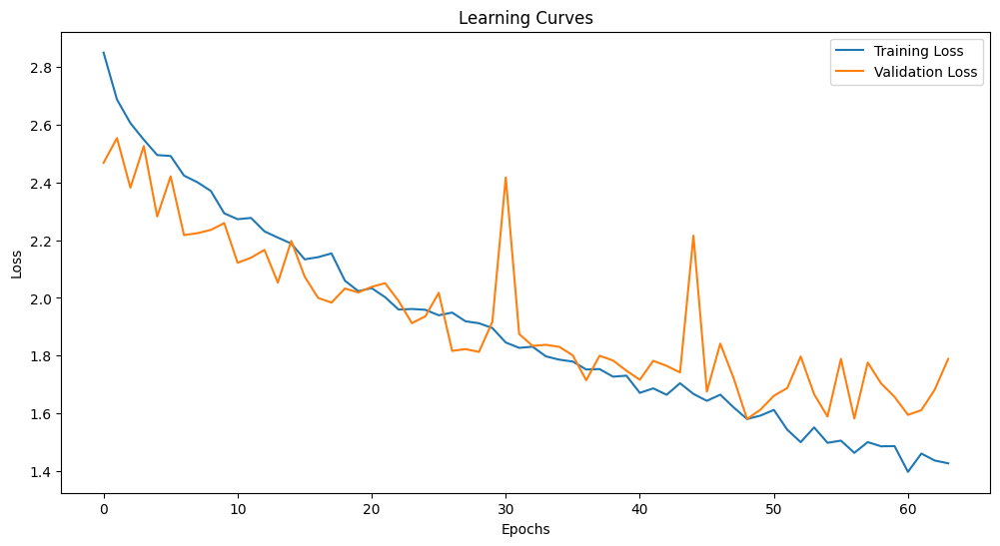

| Training Phase                         |   Lump Accuracy |   Size Accuracy |   Position Accuracy |
|:---------------------------------------|----------------:|----------------:|--------------------:|
| Initial Training                       |        0.825    |        0.691667 |            0.630556 |
| Testing on doctors without fine-tuning |        0.277778 |        0.149306 |            0.194444 |
| Fine-tuning with 1 trials              |        0.819444 |        0.357639 |            0.538194 |
| Fine-tuning with 2 trials              |        0.836806 |        0.597222 |            0.597222 |
| Fine-tuning with 3 trials              |        0.510417 |        0.263889 |            0.208333 |
| Fine-tuning with 4 trials              |        0.899306 |        0.628472 |            0.600694 |
| Fine-tuning with 5 trials              |        0.871528 |        0.611111 |            0.569444 |

Running experiment with all sensors and 1 seconds
Using 6 GPUs
Initial Training and Evalua

Epoch 1, Training Loss: 2.8812, Validation Loss: 2.6679


Epoch 2, Training Loss: 2.7289, Validation Loss: 2.5677


Epoch 3, Training Loss: 2.6330, Validation Loss: 2.4791


Epoch 4, Training Loss: 2.5365, Validation Loss: 2.4188


Epoch 5, Training Loss: 2.5416, Validation Loss: 2.5617


Epoch 6, Training Loss: 2.4909, Validation Loss: 2.3660


Epoch 7, Training Loss: 2.4781, Validation Loss: 2.2859


Epoch 8, Training Loss: 2.4027, Validation Loss: 2.2708


Epoch 9, Training Loss: 2.3591, Validation Loss: 2.2751


Epoch 10, Training Loss: 2.3045, Validation Loss: 2.3406


Epoch 11, Training Loss: 2.2975, Validation Loss: 2.4671


Epoch 12, Training Loss: 2.2757, Validation Loss: 2.2175


Epoch 13, Training Loss: 2.2219, Validation Loss: 2.2570


Epoch 14, Training Loss: 2.1752, Validation Loss: 2.1612


Epoch 15, Training Loss: 2.1771, Validation Loss: 2.1482


Epoch 16, Training Loss: 2.1803, Validation Loss: 2.2279


Epoch 17, Training Loss: 2.1328, Validation Loss: 2.2452


Epoch 18, Training Loss: 2.0729, Validation Loss: 2.1044


Epoch 19, Training Loss: 2.0899, Validation Loss: 2.0171


Epoch 20, Training Loss: 2.0507, Validation Loss: 2.1548


Epoch 21, Training Loss: 2.0302, Validation Loss: 2.0857


Epoch 22, Training Loss: 2.0242, Validation Loss: 2.0300


Epoch 23, Training Loss: 1.9477, Validation Loss: 1.9660


Epoch 24, Training Loss: 1.9530, Validation Loss: 1.9943


Epoch 25, Training Loss: 1.9024, Validation Loss: 2.1493


Epoch 26, Training Loss: 1.9186, Validation Loss: 2.0502


Epoch 27, Training Loss: 1.8639, Validation Loss: 2.1597


Epoch 28, Training Loss: 1.8533, Validation Loss: 1.9984
Early stopping at epoch 28


Test Accuracy - Lump: 0.8639, Size: 0.6750, Position: 0.6250

Confusion Matrix - Lump:
[[304  56]
 [ 42 318]]


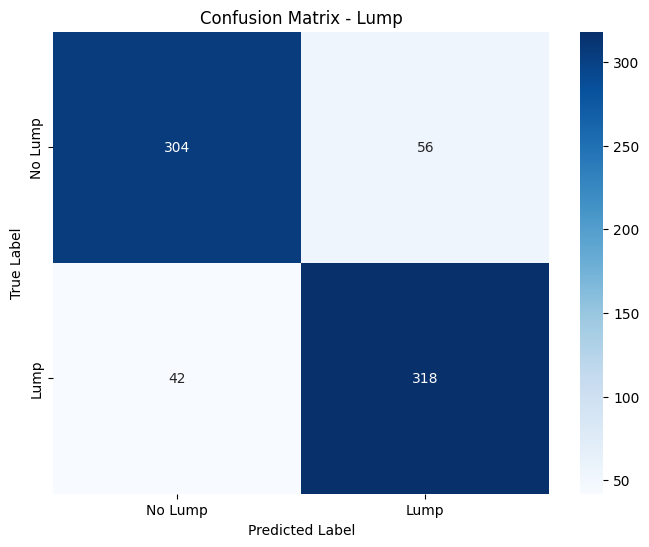


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.88      0.84      0.86       360
        Lump       0.85      0.88      0.87       360

    accuracy                           0.86       720
   macro avg       0.86      0.86      0.86       720
weighted avg       0.86      0.86      0.86       720


Confusion Matrix - Size:
[[ 55  38   5  22]
 [ 17  58  25  20]
 [  7  21  64  28]
 [ 10  12  29 309]]


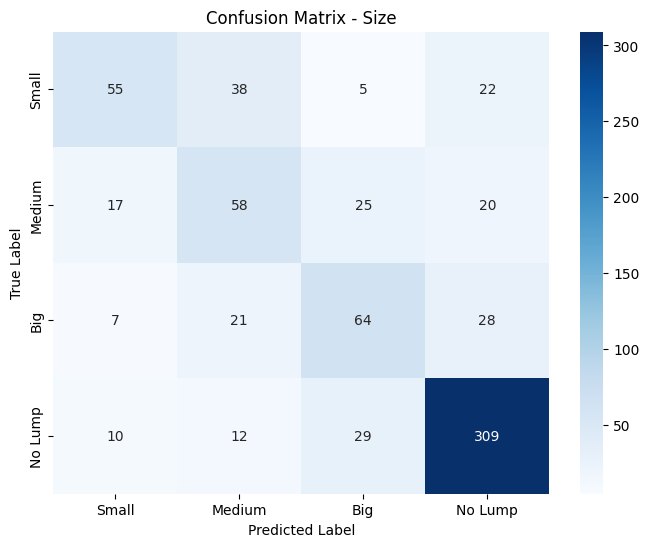


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.62      0.46      0.53       120
      Medium       0.45      0.48      0.47       120
         Big       0.52      0.53      0.53       120
     No Lump       0.82      0.86      0.84       360

    accuracy                           0.68       720
   macro avg       0.60      0.58      0.59       720
weighted avg       0.67      0.68      0.67       720


Confusion Matrix - Position:
[[ 20  49  35  16]
 [ 16  47  28  29]
 [  7  20  62  31]
 [  6  12  21 321]]


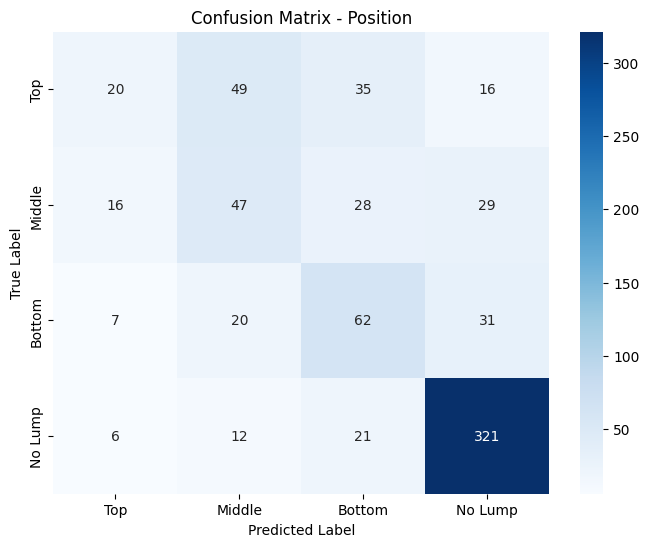


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.41      0.17      0.24       120
      Middle       0.37      0.39      0.38       120
      Bottom       0.42      0.52      0.47       120
     No Lump       0.81      0.89      0.85       360

    accuracy                           0.62       720
   macro avg       0.50      0.49      0.48       720
weighted avg       0.60      0.62      0.60       720


Testing on doctors' data without fine-tuning:


Test Accuracy - Lump: 0.4965, Size: 0.1632, Position: 0.1910

Confusion Matrix - Lump:
[[  0 144]
 [  1 143]]


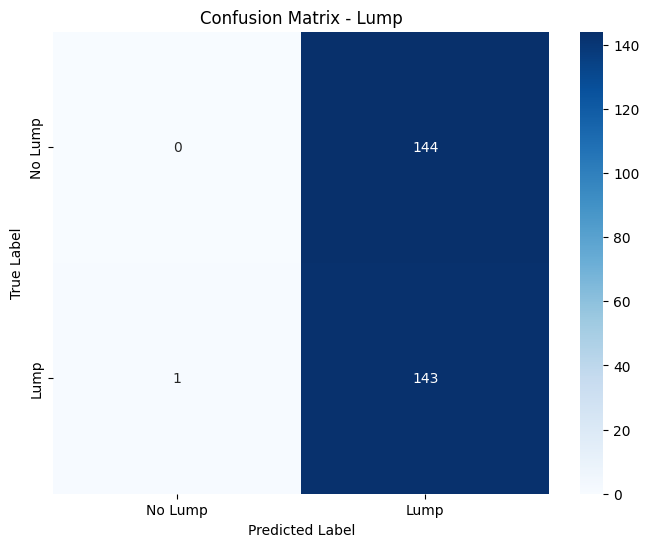


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.00      0.00      0.00       144
        Lump       0.50      0.99      0.66       144

    accuracy                           0.50       288
   macro avg       0.25      0.50      0.33       288
weighted avg       0.25      0.50      0.33       288


Confusion Matrix - Size:
[[  1   8  38   1]
 [  1  10  35   2]
 [  1  13  34   0]
 [  5   6 131   2]]


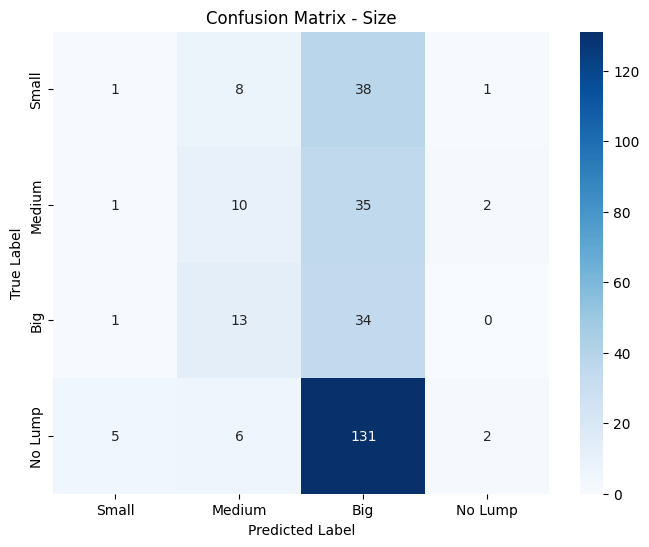


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.12      0.02      0.04        48
      Medium       0.27      0.21      0.24        48
         Big       0.14      0.71      0.24        48
     No Lump       0.40      0.01      0.03       144

    accuracy                           0.16       288
   macro avg       0.23      0.24      0.13       288
weighted avg       0.29      0.16      0.10       288


Confusion Matrix - Position:
[[  0   2  46   0]
 [  0   5  42   1]
 [  0   0  47   1]
 [  0   5 136   3]]


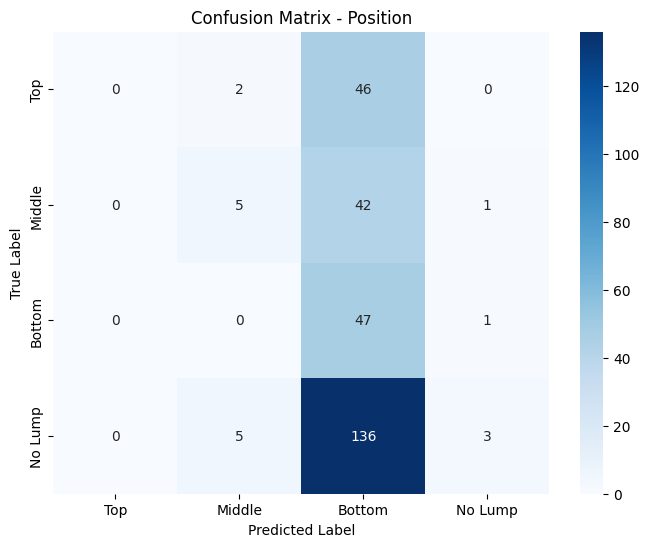


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.00      0.00      0.00        48
      Middle       0.42      0.10      0.17        48
      Bottom       0.17      0.98      0.29        48
     No Lump       0.60      0.02      0.04       144

    accuracy                           0.19       288
   macro avg       0.30      0.28      0.13       288
weighted avg       0.40      0.19      0.10       288


Fine-tuning with 1 additional trials from new dataset


Epoch 1, Training Loss: 1.8932, Validation Loss: 2.0205


Epoch 2, Training Loss: 1.8664, Validation Loss: 2.0301


Epoch 3, Training Loss: 1.8205, Validation Loss: 2.2934


Epoch 4, Training Loss: 1.8003, Validation Loss: 2.2008


Epoch 5, Training Loss: 1.7871, Validation Loss: 1.9125


Epoch 6, Training Loss: 1.7948, Validation Loss: 1.9486


Epoch 7, Training Loss: 1.7028, Validation Loss: 1.8927


Epoch 8, Training Loss: 1.7236, Validation Loss: 1.9789


Epoch 9, Training Loss: 1.6654, Validation Loss: 1.9708


Epoch 10, Training Loss: 1.6671, Validation Loss: 2.1043


Epoch 11, Training Loss: 1.6724, Validation Loss: 1.8078


Epoch 12, Training Loss: 1.6654, Validation Loss: 1.8514


Epoch 13, Training Loss: 1.6031, Validation Loss: 2.0793


Epoch 14, Training Loss: 1.6184, Validation Loss: 1.9535


Epoch 15, Training Loss: 1.5885, Validation Loss: 2.0851


Epoch 16, Training Loss: 1.5943, Validation Loss: 1.9003
Early stopping at epoch 16


Test Accuracy - Lump: 0.5035, Size: 0.1875, Position: 0.1701

Confusion Matrix - Lump:
[[  4 140]
 [  3 141]]


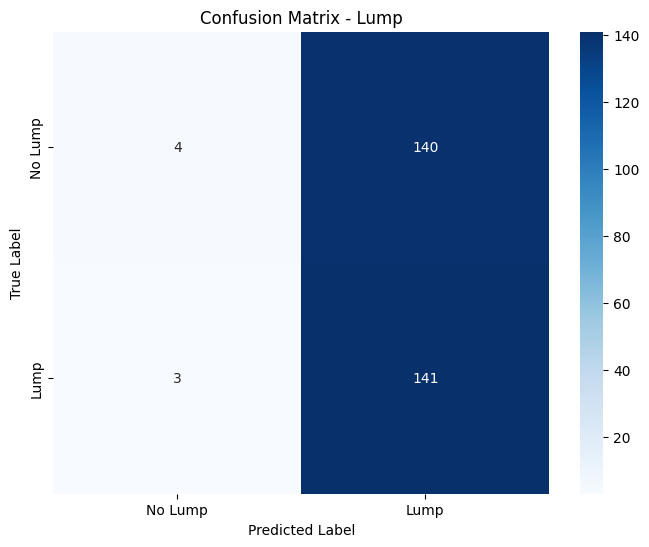


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.57      0.03      0.05       144
        Lump       0.50      0.98      0.66       144

    accuracy                           0.50       288
   macro avg       0.54      0.50      0.36       288
weighted avg       0.54      0.50      0.36       288


Confusion Matrix - Size:
[[ 11   3  32   2]
 [  6   6  34   2]
 [  8   4  35   1]
 [ 14   4 124   2]]


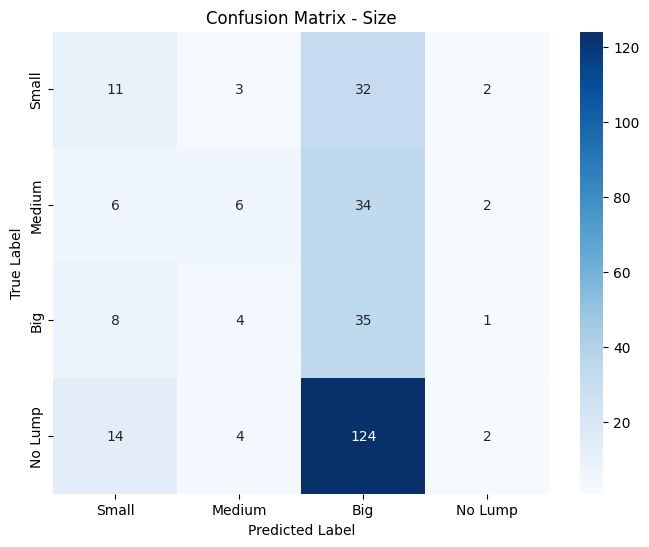


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.28      0.23      0.25        48
      Medium       0.35      0.12      0.18        48
         Big       0.16      0.73      0.26        48
     No Lump       0.29      0.01      0.03       144

    accuracy                           0.19       288
   macro avg       0.27      0.27      0.18       288
weighted avg       0.27      0.19      0.13       288


Confusion Matrix - Position:
[[ 6 25 14  3]
 [10 28  5  5]
 [12 28  6  2]
 [58 75  2  9]]


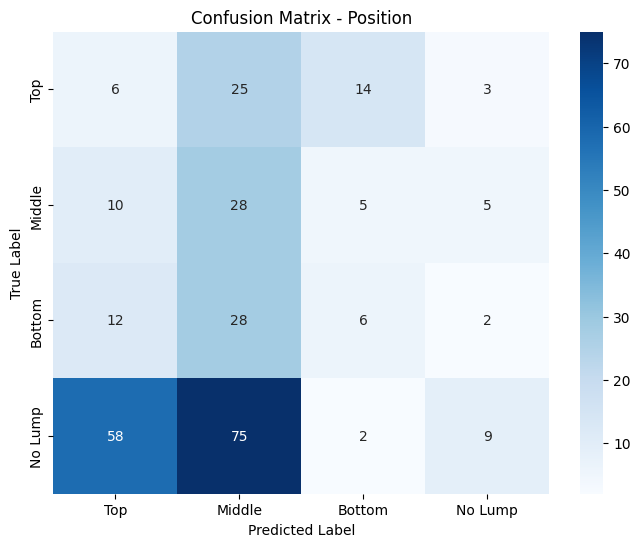


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.07      0.12      0.09        48
      Middle       0.18      0.58      0.27        48
      Bottom       0.22      0.12      0.16        48
     No Lump       0.47      0.06      0.11       144

    accuracy                           0.17       288
   macro avg       0.24      0.22      0.16       288
weighted avg       0.32      0.17      0.14       288


Fine-tuning with 2 additional trials from new dataset


Epoch 1, Training Loss: 1.5577, Validation Loss: 1.9592


Epoch 2, Training Loss: 1.5163, Validation Loss: 1.9163


Epoch 3, Training Loss: 1.5517, Validation Loss: 1.8350


Epoch 4, Training Loss: 1.5189, Validation Loss: 1.9147


Epoch 5, Training Loss: 1.5062, Validation Loss: 1.8513
Early stopping at epoch 5


Test Accuracy - Lump: 0.8264, Size: 0.4757, Position: 0.5556

Confusion Matrix - Lump:
[[122  22]
 [ 28 116]]


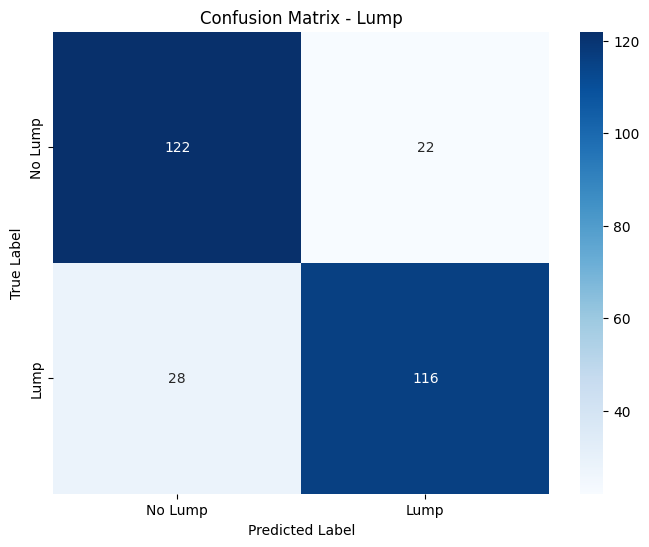


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.81      0.85      0.83       144
        Lump       0.84      0.81      0.82       144

    accuracy                           0.83       288
   macro avg       0.83      0.83      0.83       288
weighted avg       0.83      0.83      0.83       288


Confusion Matrix - Size:
[[ 30   0   8  10]
 [ 20   2  18   8]
 [ 23   2   5  18]
 [ 14   1  29 100]]


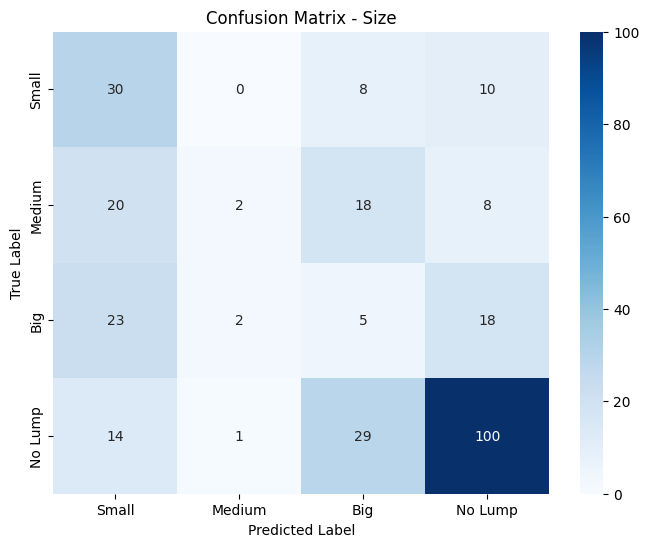


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.34      0.62      0.44        48
      Medium       0.40      0.04      0.08        48
         Big       0.08      0.10      0.09        48
     No Lump       0.74      0.69      0.71       144

    accuracy                           0.48       288
   macro avg       0.39      0.37      0.33       288
weighted avg       0.51      0.48      0.46       288


Confusion Matrix - Position:
[[ 16  20   5   7]
 [ 13  14   3  18]
 [ 15  10   5  18]
 [  7   5   7 125]]


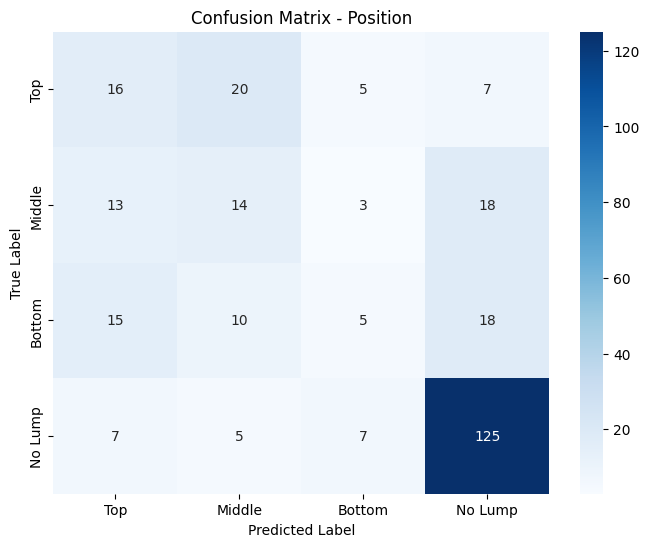


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.31      0.33      0.32        48
      Middle       0.29      0.29      0.29        48
      Bottom       0.25      0.10      0.15        48
     No Lump       0.74      0.87      0.80       144

    accuracy                           0.56       288
   macro avg       0.40      0.40      0.39       288
weighted avg       0.51      0.56      0.53       288


Fine-tuning with 3 additional trials from new dataset


Epoch 1, Training Loss: 1.5264, Validation Loss: 1.8373


Epoch 2, Training Loss: 1.5097, Validation Loss: 1.8171


Epoch 3, Training Loss: 1.4786, Validation Loss: 2.0372


Epoch 4, Training Loss: 1.4764, Validation Loss: 1.9950


Epoch 5, Training Loss: 1.4297, Validation Loss: 1.7877


Epoch 6, Training Loss: 1.4333, Validation Loss: 1.7918


Epoch 7, Training Loss: 1.4550, Validation Loss: 1.8722


Epoch 8, Training Loss: 1.4722, Validation Loss: 1.8520


Epoch 9, Training Loss: 1.4345, Validation Loss: 2.0201


Epoch 10, Training Loss: 1.4251, Validation Loss: 1.8899
Early stopping at epoch 10


Test Accuracy - Lump: 0.8854, Size: 0.6389, Position: 0.6042

Confusion Matrix - Lump:
[[124  20]
 [ 13 131]]


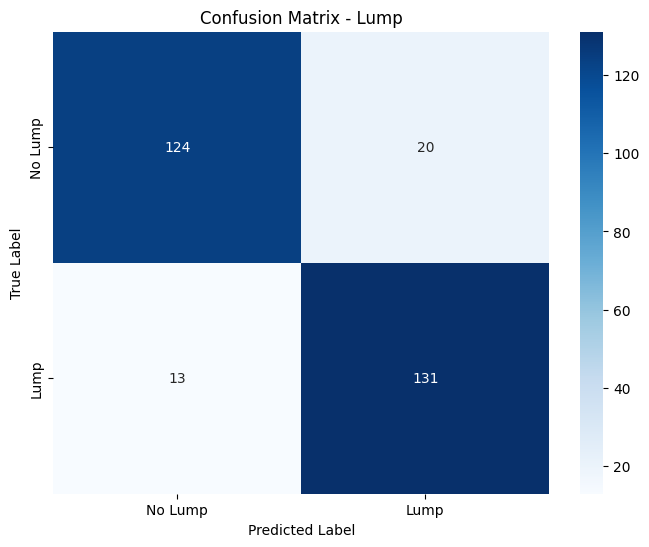


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.91      0.86      0.88       144
        Lump       0.87      0.91      0.89       144

    accuracy                           0.89       288
   macro avg       0.89      0.89      0.89       288
weighted avg       0.89      0.89      0.89       288


Confusion Matrix - Size:
[[ 37   0  10   1]
 [ 25   4  18   1]
 [ 21   3  13  11]
 [  3   0  11 130]]


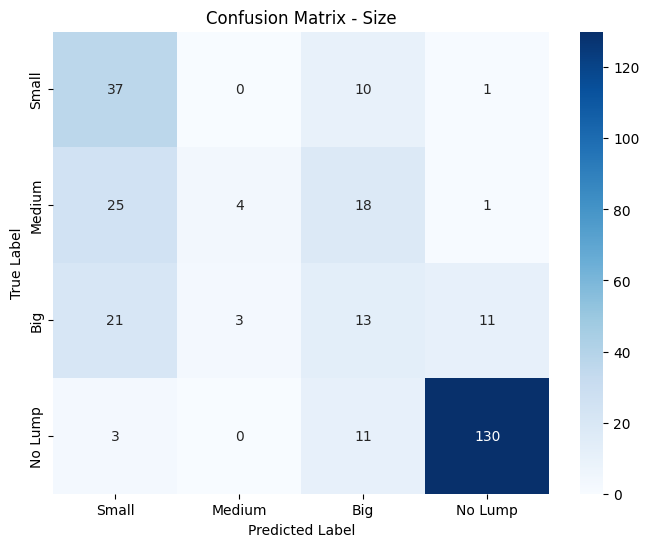


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.43      0.77      0.55        48
      Medium       0.57      0.08      0.15        48
         Big       0.25      0.27      0.26        48
     No Lump       0.91      0.90      0.91       144

    accuracy                           0.64       288
   macro avg       0.54      0.51      0.47       288
weighted avg       0.66      0.64      0.61       288


Confusion Matrix - Position:
[[ 15  21  11   1]
 [ 16  16   9   7]
 [ 19   9  11   9]
 [  8   4   0 132]]


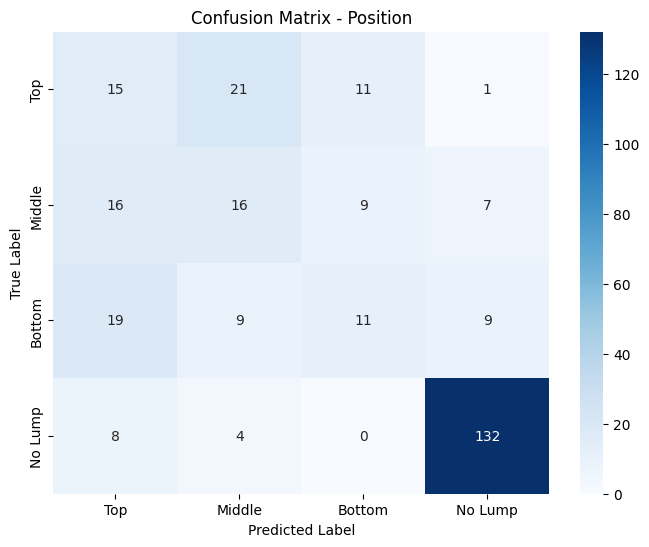


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.26      0.31      0.28        48
      Middle       0.32      0.33      0.33        48
      Bottom       0.35      0.23      0.28        48
     No Lump       0.89      0.92      0.90       144

    accuracy                           0.60       288
   macro avg       0.45      0.45      0.45       288
weighted avg       0.60      0.60      0.60       288


Fine-tuning with 4 additional trials from new dataset


Epoch 1, Training Loss: 1.4020, Validation Loss: 1.7962


Epoch 2, Training Loss: 1.3773, Validation Loss: 1.9866


Epoch 3, Training Loss: 1.3449, Validation Loss: 1.8913


Epoch 4, Training Loss: 1.3822, Validation Loss: 1.8994


Epoch 5, Training Loss: 1.3723, Validation Loss: 1.8935
Early stopping at epoch 5


Test Accuracy - Lump: 0.8750, Size: 0.6528, Position: 0.6250

Confusion Matrix - Lump:
[[141   3]
 [ 33 111]]


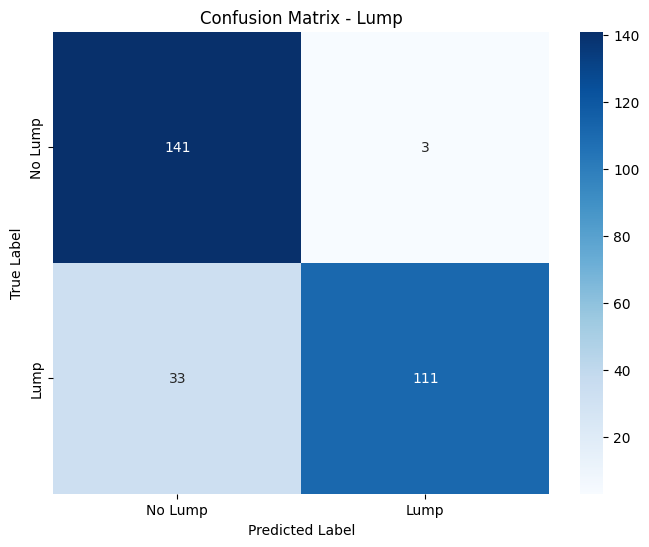


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.81      0.98      0.89       144
        Lump       0.97      0.77      0.86       144

    accuracy                           0.88       288
   macro avg       0.89      0.88      0.87       288
weighted avg       0.89      0.88      0.87       288


Confusion Matrix - Size:
[[ 24   0  17   7]
 [ 10   0  30   8]
 [  7   0  23  18]
 [  0   0   3 141]]


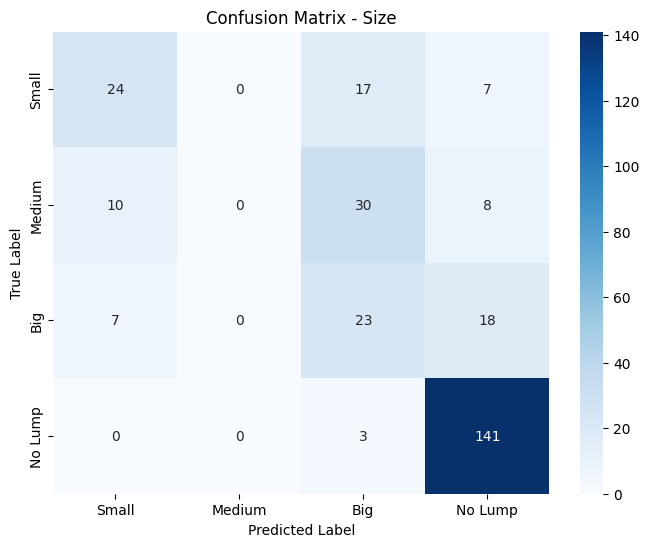


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.59      0.50      0.54        48
      Medium       0.00      0.00      0.00        48
         Big       0.32      0.48      0.38        48
     No Lump       0.81      0.98      0.89       144

    accuracy                           0.65       288
   macro avg       0.43      0.49      0.45       288
weighted avg       0.56      0.65      0.60       288


Confusion Matrix - Position:
[[  1   7  31   9]
 [  0   8  23  17]
 [  0   3  29  16]
 [  0   0   2 142]]


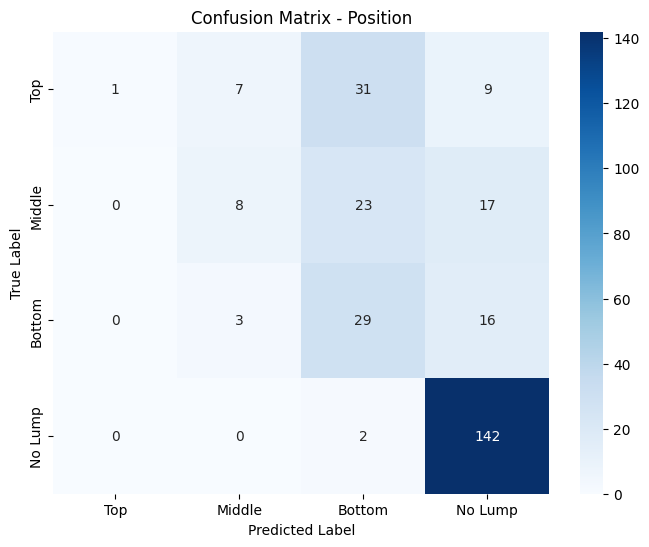


Classification Report - Position:
              precision    recall  f1-score   support

         Top       1.00      0.02      0.04        48
      Middle       0.44      0.17      0.24        48
      Bottom       0.34      0.60      0.44        48
     No Lump       0.77      0.99      0.87       144

    accuracy                           0.62       288
   macro avg       0.64      0.44      0.40       288
weighted avg       0.68      0.62      0.55       288


Fine-tuning with 5 additional trials from new dataset


Epoch 1, Training Loss: 1.2724, Validation Loss: 1.9131


Epoch 2, Training Loss: 1.3041, Validation Loss: 1.8629


Epoch 3, Training Loss: 1.3314, Validation Loss: 1.9460


Epoch 4, Training Loss: 1.2498, Validation Loss: 1.9210


Epoch 5, Training Loss: 1.2768, Validation Loss: 1.9616
Early stopping at epoch 5


Test Accuracy - Lump: 0.9340, Size: 0.6910, Position: 0.6806

Confusion Matrix - Lump:
[[132  12]
 [  7 137]]


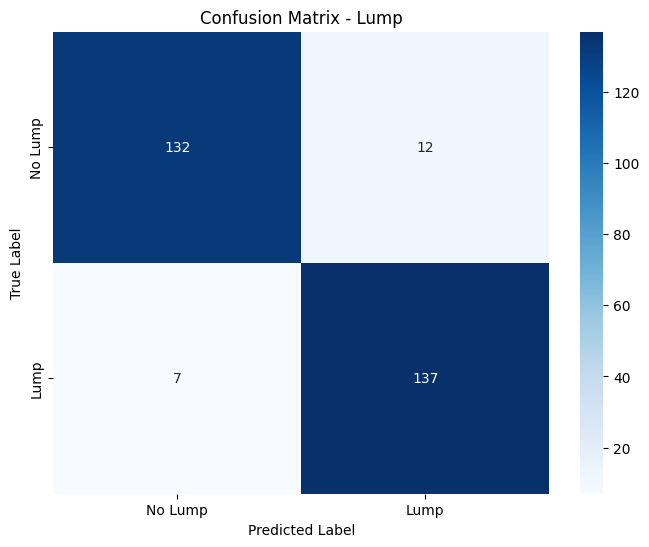


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.95      0.92      0.93       144
        Lump       0.92      0.95      0.94       144

    accuracy                           0.93       288
   macro avg       0.93      0.93      0.93       288
weighted avg       0.93      0.93      0.93       288


Confusion Matrix - Size:
[[ 33   1  14   0]
 [ 22   1  25   0]
 [ 10   1  28   9]
 [  3   0   4 137]]


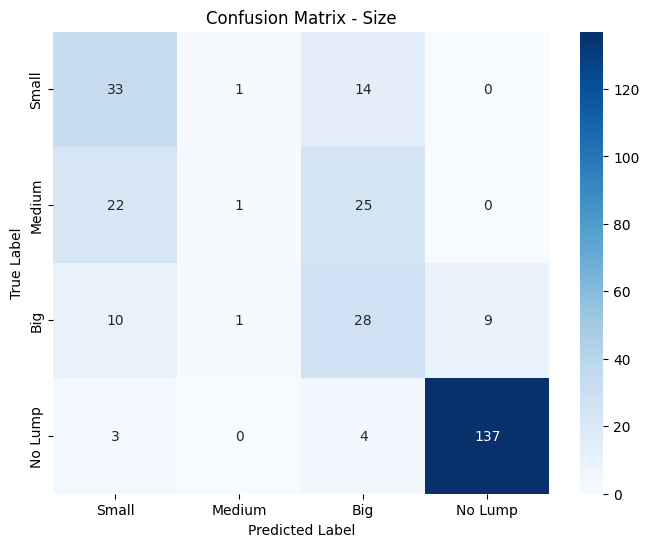


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.49      0.69      0.57        48
      Medium       0.33      0.02      0.04        48
         Big       0.39      0.58      0.47        48
     No Lump       0.94      0.95      0.94       144

    accuracy                           0.69       288
   macro avg       0.54      0.56      0.51       288
weighted avg       0.67      0.69      0.65       288


Confusion Matrix - Position:
[[ 10  33   4   1]
 [  3  37   5   3]
 [  6  24   9   9]
 [  1   3   0 140]]


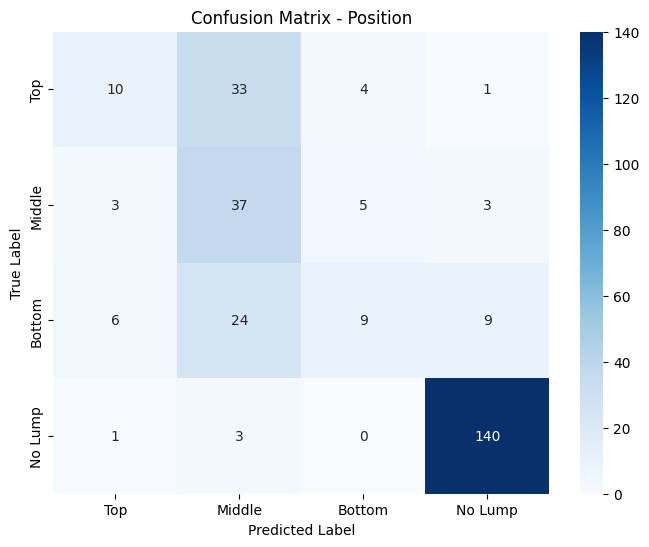


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.50      0.21      0.29        48
      Middle       0.38      0.77      0.51        48
      Bottom       0.50      0.19      0.27        48
     No Lump       0.92      0.97      0.94       144

    accuracy                           0.68       288
   macro avg       0.57      0.53      0.50       288
weighted avg       0.69      0.68      0.65       288

Few-shot early stopping at step 5


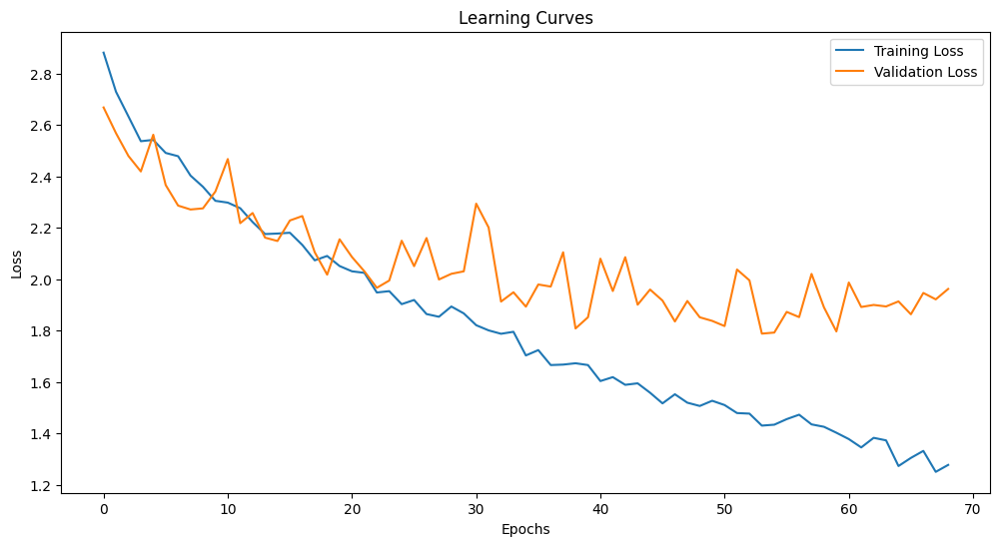

| Training Phase                         |   Lump Accuracy |   Size Accuracy |   Position Accuracy |
|:---------------------------------------|----------------:|----------------:|--------------------:|
| Initial Training                       |        0.863889 |        0.675    |            0.625    |
| Testing on doctors without fine-tuning |        0.496528 |        0.163194 |            0.190972 |
| Fine-tuning with 1 trials              |        0.503472 |        0.1875   |            0.170139 |
| Fine-tuning with 2 trials              |        0.826389 |        0.475694 |            0.555556 |
| Fine-tuning with 3 trials              |        0.885417 |        0.638889 |            0.604167 |
| Fine-tuning with 4 trials              |        0.875    |        0.652778 |            0.625    |
| Fine-tuning with 5 trials              |        0.934028 |        0.690972 |            0.680556 |

Running experiment with all sensors and 2 seconds
Using 6 GPUs
Initial Training and Evalua

Epoch 1, Training Loss: 2.8466, Validation Loss: 2.7623


Epoch 2, Training Loss: 2.6886, Validation Loss: 2.4270


Epoch 3, Training Loss: 2.5702, Validation Loss: 2.3761


Epoch 4, Training Loss: 2.5729, Validation Loss: 2.3576


Epoch 5, Training Loss: 2.5181, Validation Loss: 2.2812


Epoch 6, Training Loss: 2.4458, Validation Loss: 2.4063


Epoch 7, Training Loss: 2.4388, Validation Loss: 2.3091


Epoch 8, Training Loss: 2.3865, Validation Loss: 2.2784


Epoch 9, Training Loss: 2.3545, Validation Loss: 2.2051


Epoch 10, Training Loss: 2.2626, Validation Loss: 2.1689


Epoch 11, Training Loss: 2.2515, Validation Loss: 2.1384


Epoch 12, Training Loss: 2.2701, Validation Loss: 2.1051


Epoch 13, Training Loss: 2.1873, Validation Loss: 2.1001


Epoch 14, Training Loss: 2.1470, Validation Loss: 2.1320


Epoch 15, Training Loss: 2.1373, Validation Loss: 2.1099


Epoch 16, Training Loss: 2.1107, Validation Loss: 1.9413


Epoch 17, Training Loss: 2.0562, Validation Loss: 2.0081


Epoch 18, Training Loss: 2.0406, Validation Loss: 2.0892


Epoch 19, Training Loss: 2.0098, Validation Loss: 2.0104


Epoch 20, Training Loss: 1.9765, Validation Loss: 2.0000


Epoch 21, Training Loss: 1.9769, Validation Loss: 2.0078
Early stopping at epoch 21


Test Accuracy - Lump: 0.8569, Size: 0.7069, Position: 0.6306

Confusion Matrix - Lump:
[[318  42]
 [ 61 299]]


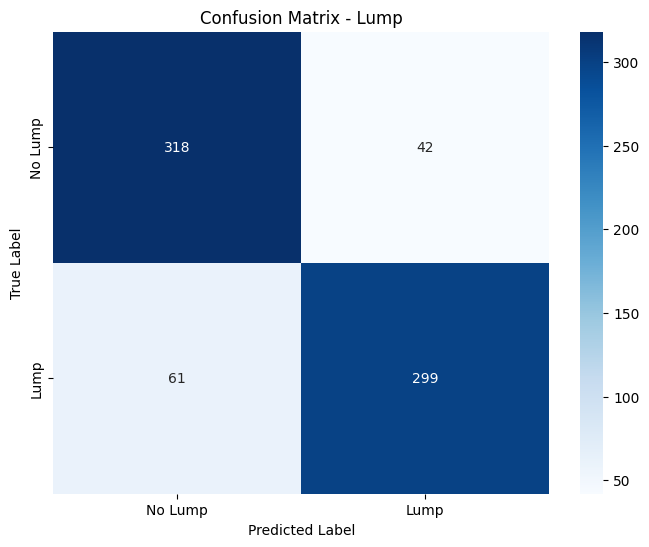


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.84      0.88      0.86       360
        Lump       0.88      0.83      0.85       360

    accuracy                           0.86       720
   macro avg       0.86      0.86      0.86       720
weighted avg       0.86      0.86      0.86       720


Confusion Matrix - Size:
[[ 72  15  10  23]
 [ 28  48  22  22]
 [ 11  13  60  36]
 [ 13   7  11 329]]


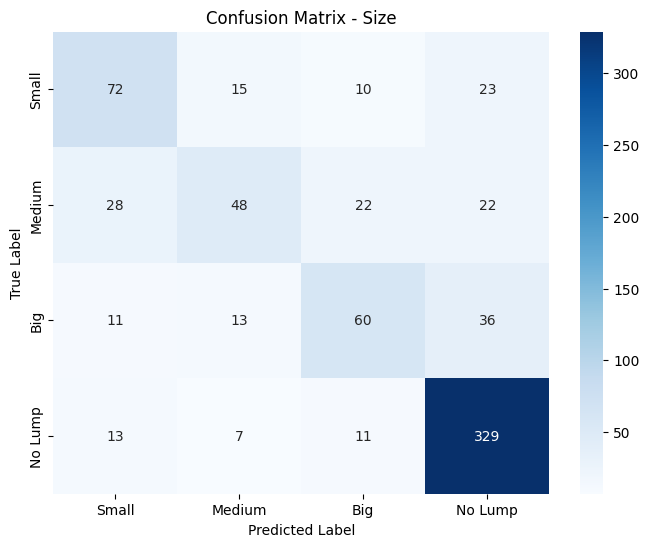


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.58      0.60      0.59       120
      Medium       0.58      0.40      0.47       120
         Big       0.58      0.50      0.54       120
     No Lump       0.80      0.91      0.85       360

    accuracy                           0.71       720
   macro avg       0.64      0.60      0.61       720
weighted avg       0.69      0.71      0.69       720


Confusion Matrix - Position:
[[ 27  19  40  34]
 [ 17  27  35  41]
 [ 11   7  64  38]
 [  4   7  13 336]]


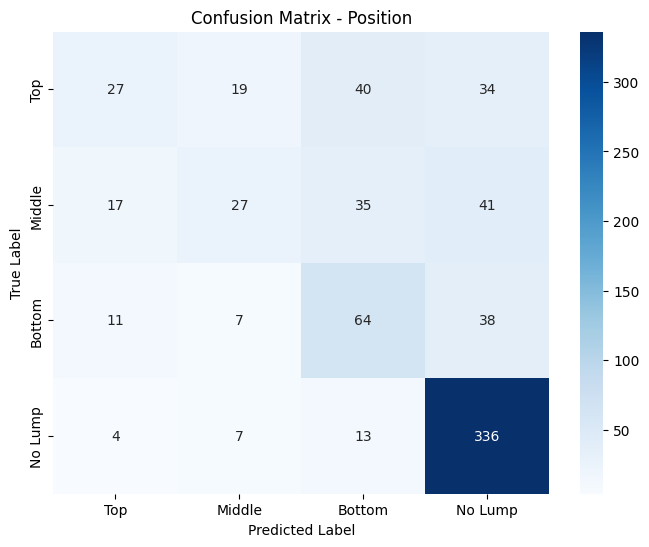


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.46      0.23      0.30       120
      Middle       0.45      0.23      0.30       120
      Bottom       0.42      0.53      0.47       120
     No Lump       0.75      0.93      0.83       360

    accuracy                           0.63       720
   macro avg       0.52      0.48      0.48       720
weighted avg       0.60      0.63      0.59       720


Testing on doctors' data without fine-tuning:


Test Accuracy - Lump: 0.5104, Size: 0.1632, Position: 0.2049

Confusion Matrix - Lump:
[[  8 136]
 [  5 139]]


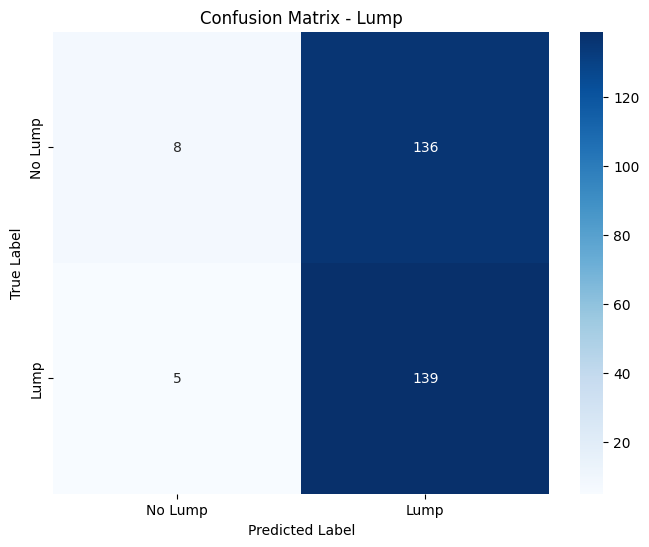


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.62      0.06      0.10       144
        Lump       0.51      0.97      0.66       144

    accuracy                           0.51       288
   macro avg       0.56      0.51      0.38       288
weighted avg       0.56      0.51      0.38       288


Confusion Matrix - Size:
[[  9   1  36   2]
 [ 11   1  32   4]
 [ 18   0  29   1]
 [ 10   0 126   8]]


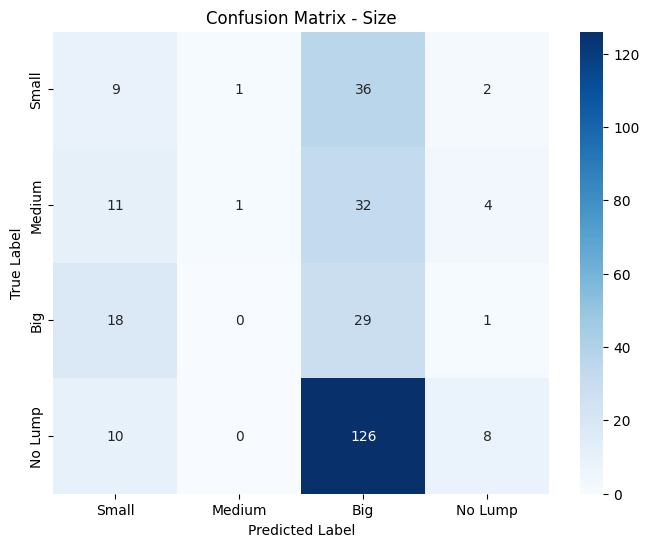


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.19      0.19      0.19        48
      Medium       0.50      0.02      0.04        48
         Big       0.13      0.60      0.21        48
     No Lump       0.53      0.06      0.10       144

    accuracy                           0.16       288
   macro avg       0.34      0.22      0.14       288
weighted avg       0.40      0.16      0.12       288


Confusion Matrix - Position:
[[  2   0  43   3]
 [  1   1  39   7]
 [  1   0  46   1]
 [  4   1 129  10]]


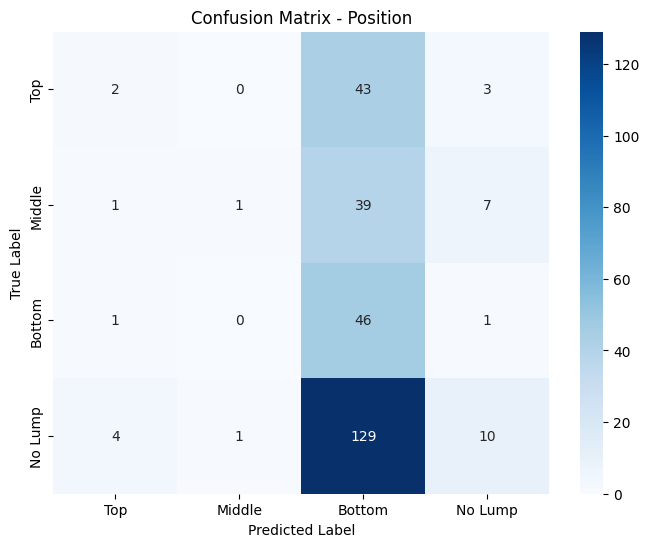


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.25      0.04      0.07        48
      Middle       0.50      0.02      0.04        48
      Bottom       0.18      0.96      0.30        48
     No Lump       0.48      0.07      0.12       144

    accuracy                           0.20       288
   macro avg       0.35      0.27      0.13       288
weighted avg       0.39      0.20      0.13       288


Fine-tuning with 1 additional trials from new dataset


Epoch 1, Training Loss: 1.9588, Validation Loss: 1.9648


Epoch 2, Training Loss: 1.9543, Validation Loss: 1.9351


Epoch 3, Training Loss: 1.8664, Validation Loss: 2.0078


Epoch 4, Training Loss: 1.9012, Validation Loss: 2.0154


Epoch 5, Training Loss: 1.8418, Validation Loss: 1.9978


Epoch 6, Training Loss: 1.8759, Validation Loss: 1.9046


Epoch 7, Training Loss: 1.7879, Validation Loss: 1.8556


Epoch 8, Training Loss: 1.7790, Validation Loss: 1.8535


Epoch 9, Training Loss: 1.7638, Validation Loss: 1.8794


Epoch 10, Training Loss: 1.7564, Validation Loss: 1.8750


Epoch 11, Training Loss: 1.7500, Validation Loss: 1.7886


Epoch 12, Training Loss: 1.7086, Validation Loss: 2.1188


Epoch 13, Training Loss: 1.7047, Validation Loss: 1.9124


Epoch 14, Training Loss: 1.6758, Validation Loss: 1.7291


Epoch 15, Training Loss: 1.6460, Validation Loss: 2.1327


Epoch 16, Training Loss: 1.6508, Validation Loss: 1.7729


Epoch 17, Training Loss: 1.6449, Validation Loss: 1.8022


Epoch 18, Training Loss: 1.6161, Validation Loss: 1.8761


Epoch 19, Training Loss: 1.5621, Validation Loss: 1.8324
Early stopping at epoch 19


Test Accuracy - Lump: 0.6840, Size: 0.2674, Position: 0.4201

Confusion Matrix - Lump:
[[ 53  91]
 [  0 144]]


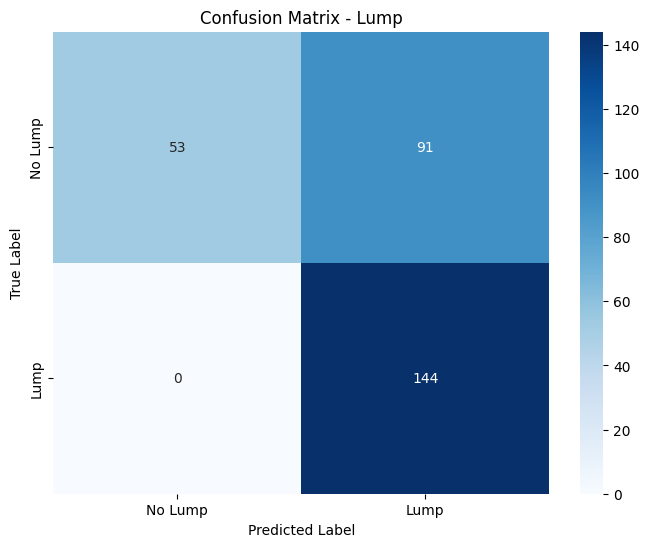


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       1.00      0.37      0.54       144
        Lump       0.61      1.00      0.76       144

    accuracy                           0.68       288
   macro avg       0.81      0.68      0.65       288
weighted avg       0.81      0.68      0.65       288


Confusion Matrix - Size:
[[35 12  1  0]
 [29 17  2  0]
 [35  7  5  1]
 [33  9 82 20]]


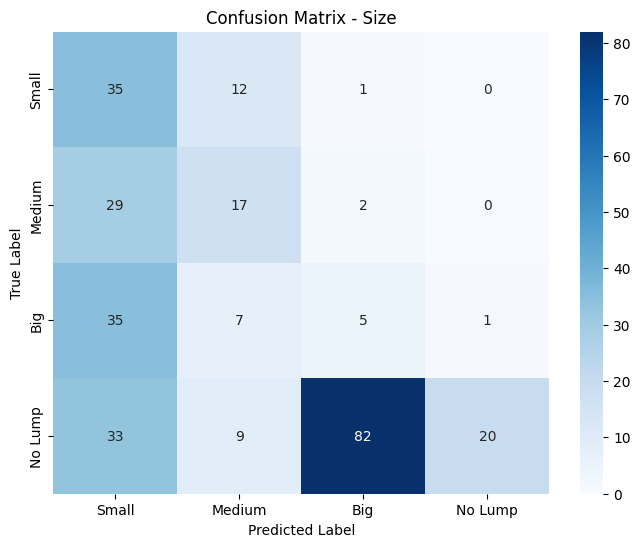


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.27      0.73      0.39        48
      Medium       0.38      0.35      0.37        48
         Big       0.06      0.10      0.07        48
     No Lump       0.95      0.14      0.24       144

    accuracy                           0.27       288
   macro avg       0.41      0.33      0.27       288
weighted avg       0.59      0.27      0.26       288


Confusion Matrix - Position:
[[ 1  0 47  0]
 [ 0  2 46  0]
 [ 1  0 47  0]
 [ 6  4 63 71]]


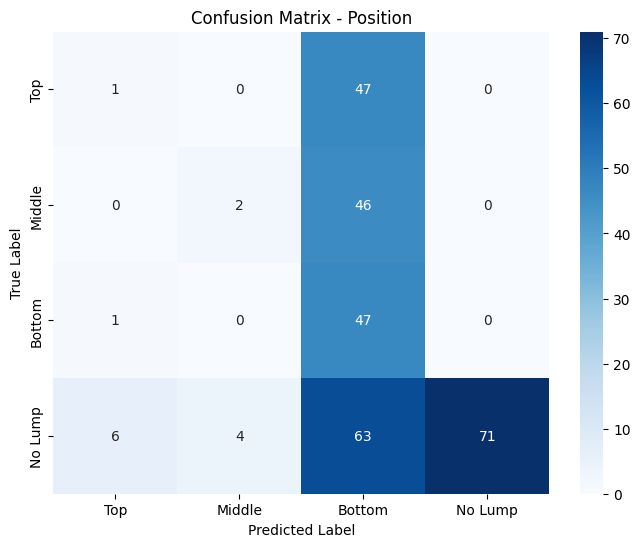


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.12      0.02      0.04        48
      Middle       0.33      0.04      0.07        48
      Bottom       0.23      0.98      0.37        48
     No Lump       1.00      0.49      0.66       144

    accuracy                           0.42       288
   macro avg       0.42      0.38      0.29       288
weighted avg       0.61      0.42      0.41       288


Fine-tuning with 2 additional trials from new dataset


Epoch 1, Training Loss: 1.5547, Validation Loss: 1.6974


Epoch 2, Training Loss: 1.5219, Validation Loss: 1.7614


Epoch 3, Training Loss: 1.5210, Validation Loss: 1.7442


Epoch 4, Training Loss: 1.5663, Validation Loss: 1.7028


Epoch 5, Training Loss: 1.5424, Validation Loss: 1.6899


Epoch 6, Training Loss: 1.5013, Validation Loss: 1.9922


Epoch 7, Training Loss: 1.4849, Validation Loss: 1.7535


Epoch 8, Training Loss: 1.4542, Validation Loss: 1.9360


Epoch 9, Training Loss: 1.4049, Validation Loss: 1.7855


Epoch 10, Training Loss: 1.4442, Validation Loss: 1.6633


Epoch 11, Training Loss: 1.4467, Validation Loss: 1.6809


Epoch 12, Training Loss: 1.4134, Validation Loss: 1.6792


Epoch 13, Training Loss: 1.4084, Validation Loss: 1.6118


Epoch 14, Training Loss: 1.3825, Validation Loss: 1.7959


Epoch 15, Training Loss: 1.3808, Validation Loss: 1.8825


Epoch 16, Training Loss: 1.3597, Validation Loss: 1.5642


Epoch 17, Training Loss: 1.3255, Validation Loss: 1.7543


Epoch 18, Training Loss: 1.3412, Validation Loss: 1.6994


Epoch 19, Training Loss: 1.3456, Validation Loss: 1.5979


Epoch 20, Training Loss: 1.2863, Validation Loss: 1.7150


Epoch 21, Training Loss: 1.2983, Validation Loss: 1.6634
Early stopping at epoch 21


Test Accuracy - Lump: 0.8542, Size: 0.5729, Position: 0.5903

Confusion Matrix - Lump:
[[119  25]
 [ 17 127]]


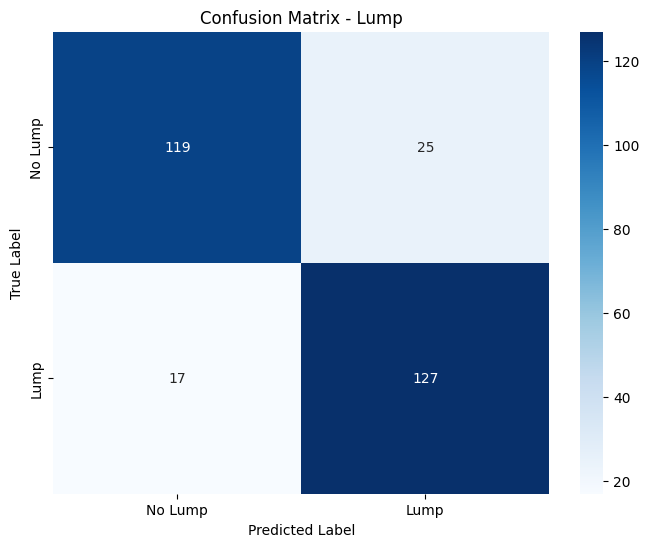


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.88      0.83      0.85       144
        Lump       0.84      0.88      0.86       144

    accuracy                           0.85       288
   macro avg       0.86      0.85      0.85       288
weighted avg       0.86      0.85      0.85       288


Confusion Matrix - Size:
[[ 43   0   3   2]
 [ 38   5   2   3]
 [ 33   1   1  13]
 [ 20   0   8 116]]


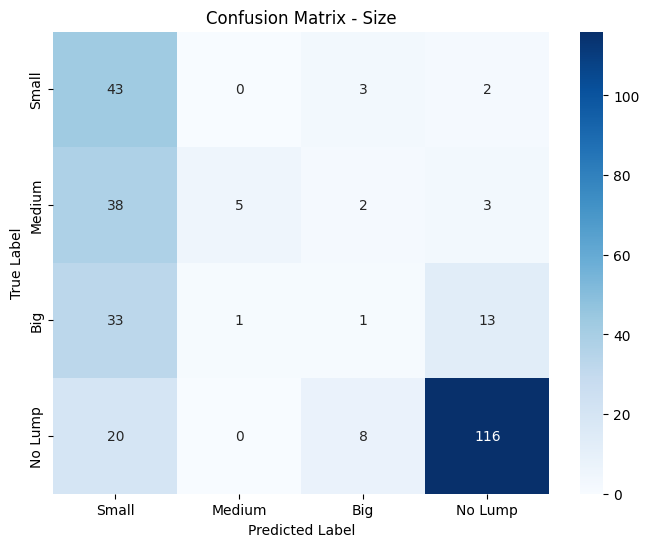


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.32      0.90      0.47        48
      Medium       0.83      0.10      0.19        48
         Big       0.07      0.02      0.03        48
     No Lump       0.87      0.81      0.83       144

    accuracy                           0.57       288
   macro avg       0.52      0.46      0.38       288
weighted avg       0.64      0.57      0.53       288


Confusion Matrix - Position:
[[ 10  34   2   2]
 [  6  23   8  11]
 [  7  20  12   9]
 [ 11   8   0 125]]


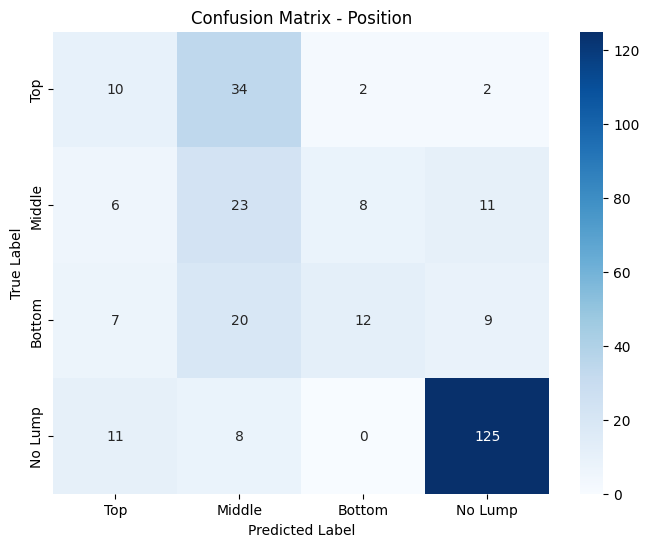


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.29      0.21      0.24        48
      Middle       0.27      0.48      0.35        48
      Bottom       0.55      0.25      0.34        48
     No Lump       0.85      0.87      0.86       144

    accuracy                           0.59       288
   macro avg       0.49      0.45      0.45       288
weighted avg       0.61      0.59      0.58       288


Fine-tuning with 3 additional trials from new dataset


Epoch 1, Training Loss: 1.2596, Validation Loss: 1.7032


Epoch 2, Training Loss: 1.3327, Validation Loss: 1.7696


Epoch 3, Training Loss: 1.2726, Validation Loss: 1.7517


Epoch 4, Training Loss: 1.2391, Validation Loss: 1.9617


Epoch 5, Training Loss: 1.2862, Validation Loss: 1.8870
Early stopping at epoch 5


Test Accuracy - Lump: 0.8785, Size: 0.6007, Position: 0.6076

Confusion Matrix - Lump:
[[128  16]
 [ 19 125]]


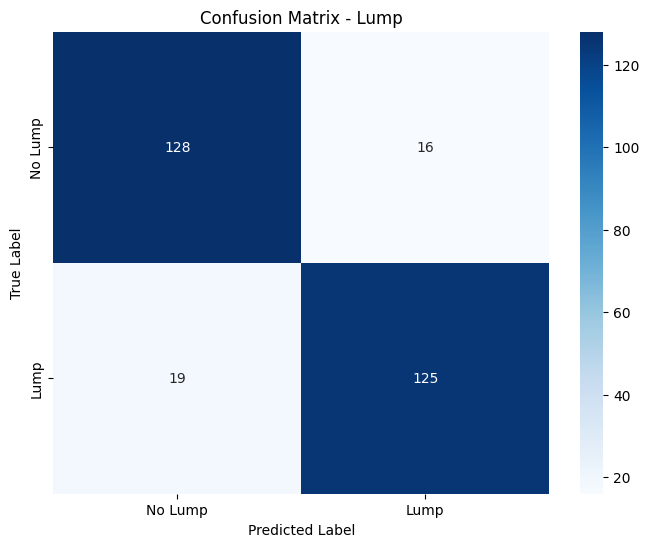


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.87      0.89      0.88       144
        Lump       0.89      0.87      0.88       144

    accuracy                           0.88       288
   macro avg       0.88      0.88      0.88       288
weighted avg       0.88      0.88      0.88       288


Confusion Matrix - Size:
[[ 46   0   0   2]
 [ 39   5   0   4]
 [ 39   2   0   7]
 [ 22   0   0 122]]


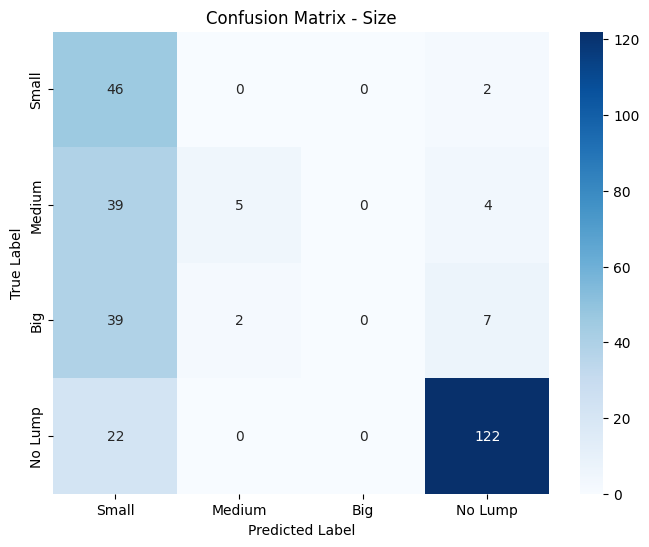


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.32      0.96      0.47        48
      Medium       0.71      0.10      0.18        48
         Big       0.00      0.00      0.00        48
     No Lump       0.90      0.85      0.87       144

    accuracy                           0.60       288
   macro avg       0.48      0.48      0.38       288
weighted avg       0.62      0.60      0.55       288


Confusion Matrix - Position:
[[  3  32  11   2]
 [  2  22  13  11]
 [  2  16  15  15]
 [  0   8   1 135]]


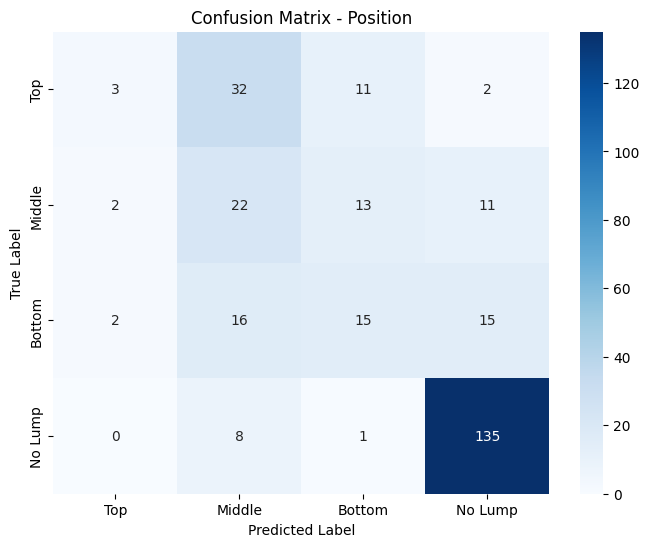


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.43      0.06      0.11        48
      Middle       0.28      0.46      0.35        48
      Bottom       0.38      0.31      0.34        48
     No Lump       0.83      0.94      0.88       144

    accuracy                           0.61       288
   macro avg       0.48      0.44      0.42       288
weighted avg       0.60      0.61      0.57       288


Fine-tuning with 4 additional trials from new dataset


Epoch 1, Training Loss: 1.2546, Validation Loss: 1.7629


Epoch 2, Training Loss: 1.2502, Validation Loss: 1.6351


Epoch 3, Training Loss: 1.2349, Validation Loss: 1.7099


Epoch 4, Training Loss: 1.1814, Validation Loss: 1.6083


Epoch 5, Training Loss: 1.2509, Validation Loss: 1.6089
Early stopping at epoch 5


Test Accuracy - Lump: 0.7639, Size: 0.5521, Position: 0.4757

Confusion Matrix - Lump:
[[ 77  67]
 [  1 143]]


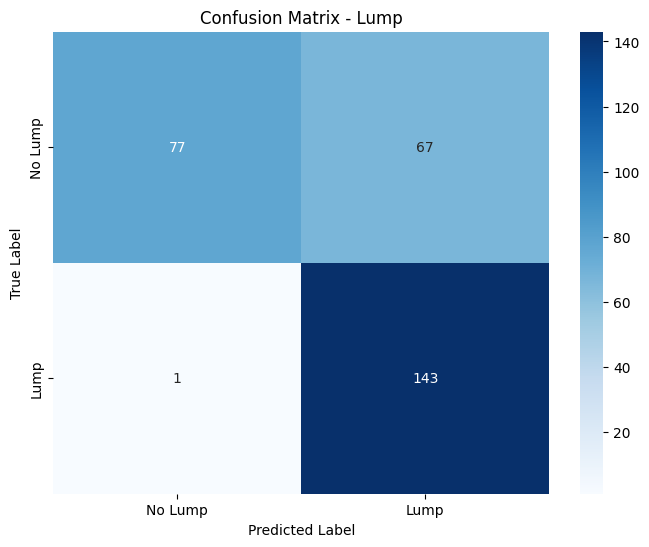


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.99      0.53      0.69       144
        Lump       0.68      0.99      0.81       144

    accuracy                           0.76       288
   macro avg       0.83      0.76      0.75       288
weighted avg       0.83      0.76      0.75       288


Confusion Matrix - Size:
[[24 14 10  0]
 [10 22 16  0]
 [ 9 10 28  1]
 [10  2 47 85]]


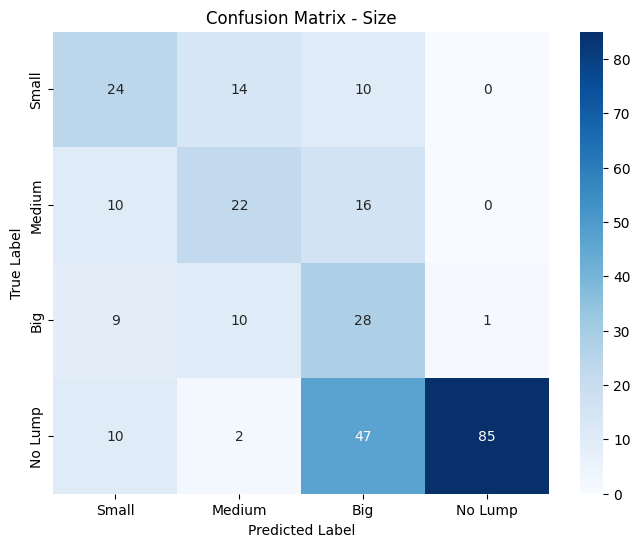


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.45      0.50      0.48        48
      Medium       0.46      0.46      0.46        48
         Big       0.28      0.58      0.38        48
     No Lump       0.99      0.59      0.74       144

    accuracy                           0.55       288
   macro avg       0.54      0.53      0.51       288
weighted avg       0.69      0.55      0.59       288


Confusion Matrix - Position:
[[ 4 33 11  0]
 [ 2 32 14  0]
 [ 3 23 21  1]
 [ 1 34 29 80]]


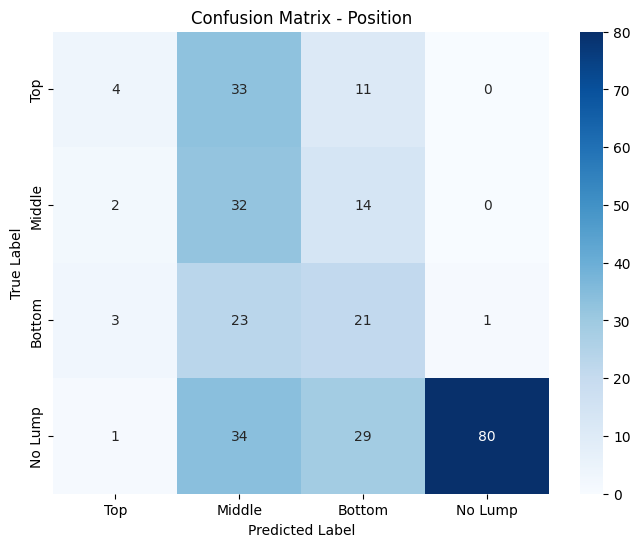


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.40      0.08      0.14        48
      Middle       0.26      0.67      0.38        48
      Bottom       0.28      0.44      0.34        48
     No Lump       0.99      0.56      0.71       144

    accuracy                           0.48       288
   macro avg       0.48      0.44      0.39       288
weighted avg       0.65      0.48      0.50       288


Fine-tuning with 5 additional trials from new dataset


Epoch 1, Training Loss: 1.1977, Validation Loss: 1.6743


Epoch 2, Training Loss: 1.1856, Validation Loss: 1.6319


Epoch 3, Training Loss: 1.1499, Validation Loss: 1.8069


Epoch 4, Training Loss: 1.1783, Validation Loss: 1.7048


Epoch 5, Training Loss: 1.1417, Validation Loss: 1.6742
Early stopping at epoch 5


Test Accuracy - Lump: 0.9201, Size: 0.6354, Position: 0.6597

Confusion Matrix - Lump:
[[128  16]
 [  7 137]]


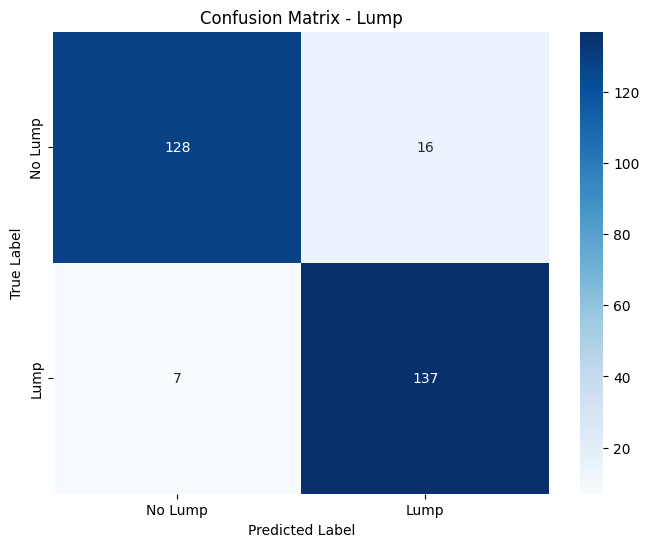


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.95      0.89      0.92       144
        Lump       0.90      0.95      0.92       144

    accuracy                           0.92       288
   macro avg       0.92      0.92      0.92       288
weighted avg       0.92      0.92      0.92       288


Confusion Matrix - Size:
[[ 13   2  32   1]
 [ 10   6  32   0]
 [  2   3  35   8]
 [  1   0  14 129]]


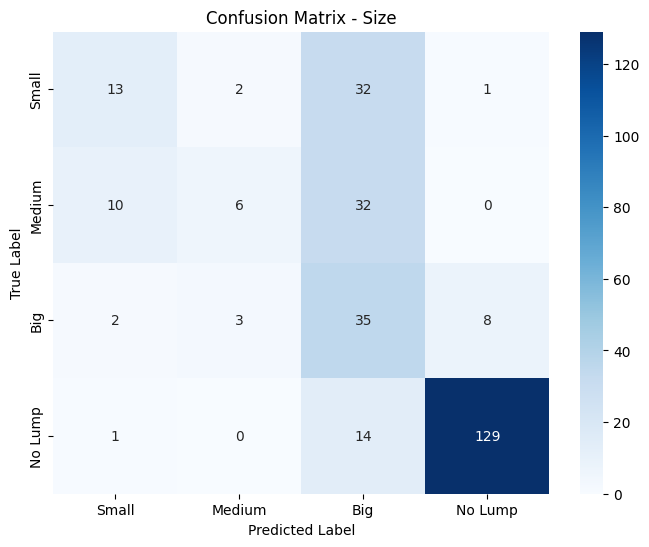


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.50      0.27      0.35        48
      Medium       0.55      0.12      0.20        48
         Big       0.31      0.73      0.43        48
     No Lump       0.93      0.90      0.91       144

    accuracy                           0.64       288
   macro avg       0.57      0.51      0.48       288
weighted avg       0.69      0.64      0.62       288


Confusion Matrix - Position:
[[ 19   9  19   1]
 [ 10   8  24   6]
 [ 10   5  25   8]
 [  0   0   6 138]]


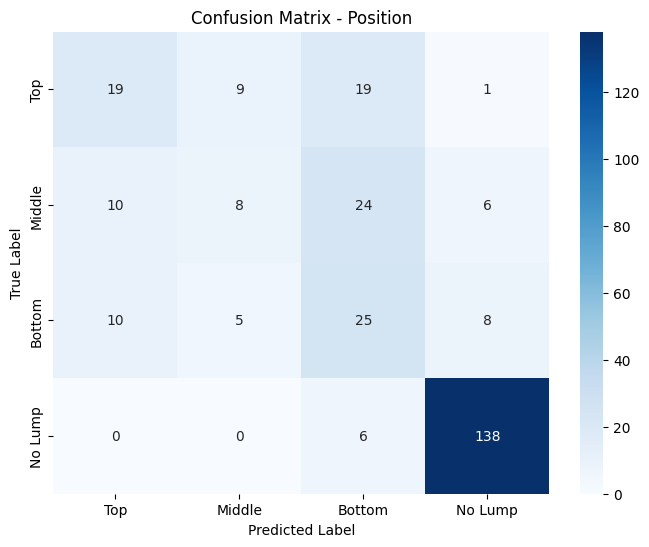


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.49      0.40      0.44        48
      Middle       0.36      0.17      0.23        48
      Bottom       0.34      0.52      0.41        48
     No Lump       0.90      0.96      0.93       144

    accuracy                           0.66       288
   macro avg       0.52      0.51      0.50       288
weighted avg       0.65      0.66      0.64       288



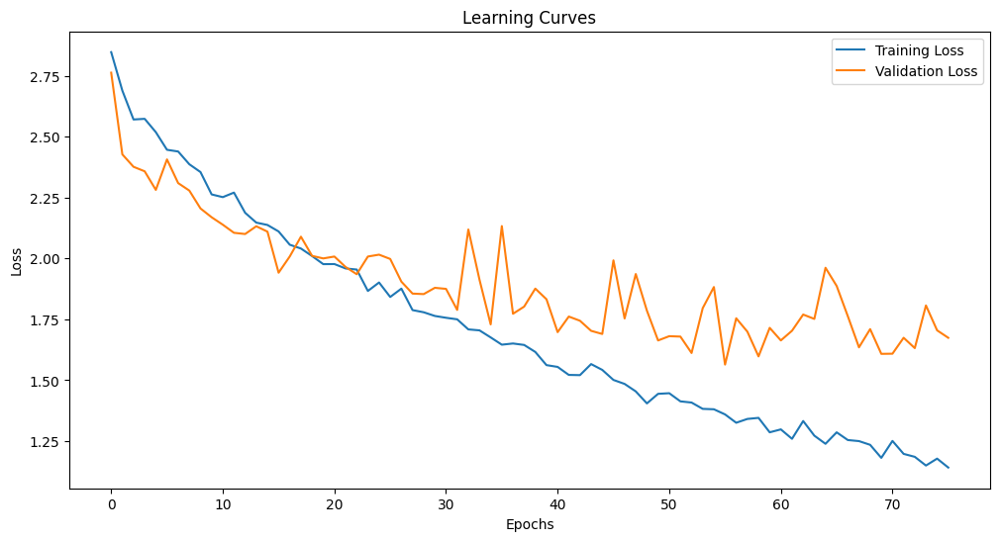

| Training Phase                         |   Lump Accuracy |   Size Accuracy |   Position Accuracy |
|:---------------------------------------|----------------:|----------------:|--------------------:|
| Initial Training                       |        0.856944 |        0.706944 |            0.630556 |
| Testing on doctors without fine-tuning |        0.510417 |        0.163194 |            0.204861 |
| Fine-tuning with 1 trials              |        0.684028 |        0.267361 |            0.420139 |
| Fine-tuning with 2 trials              |        0.854167 |        0.572917 |            0.590278 |
| Fine-tuning with 3 trials              |        0.878472 |        0.600694 |            0.607639 |
| Fine-tuning with 4 trials              |        0.763889 |        0.552083 |            0.475694 |
| Fine-tuning with 5 trials              |        0.920139 |        0.635417 |            0.659722 |

Running experiment with all sensors and 3 seconds
Using 6 GPUs
Initial Training and Evalua

Epoch 1, Training Loss: 2.8530, Validation Loss: 2.5289


Epoch 2, Training Loss: 2.6675, Validation Loss: 2.4425


Epoch 3, Training Loss: 2.5650, Validation Loss: 2.4146


Epoch 4, Training Loss: 2.5486, Validation Loss: 2.7551


Epoch 5, Training Loss: 2.5165, Validation Loss: 2.3042


Epoch 6, Training Loss: 2.4563, Validation Loss: 2.2834


Epoch 7, Training Loss: 2.3896, Validation Loss: 2.3626


Epoch 8, Training Loss: 2.3854, Validation Loss: 2.3951


Epoch 9, Training Loss: 2.3407, Validation Loss: 2.2794


Epoch 10, Training Loss: 2.3359, Validation Loss: 2.4081


Epoch 11, Training Loss: 2.3103, Validation Loss: 2.1203


Epoch 12, Training Loss: 2.2809, Validation Loss: 2.1327


Epoch 13, Training Loss: 2.2186, Validation Loss: 2.2099


Epoch 14, Training Loss: 2.2018, Validation Loss: 2.2105


Epoch 15, Training Loss: 2.1683, Validation Loss: 2.1835


Epoch 16, Training Loss: 2.1388, Validation Loss: 2.0972


Epoch 17, Training Loss: 2.0932, Validation Loss: 2.1479


Epoch 18, Training Loss: 2.0963, Validation Loss: 1.9624


Epoch 19, Training Loss: 2.0266, Validation Loss: 2.0413


Epoch 20, Training Loss: 2.0243, Validation Loss: 1.9847


Epoch 21, Training Loss: 2.0092, Validation Loss: 1.9483


Epoch 22, Training Loss: 1.9705, Validation Loss: 2.0179


Epoch 23, Training Loss: 1.9599, Validation Loss: 1.8613


Epoch 24, Training Loss: 1.9343, Validation Loss: 1.8770


Epoch 25, Training Loss: 1.8991, Validation Loss: 1.8996


Epoch 26, Training Loss: 1.8575, Validation Loss: 1.8518


Epoch 27, Training Loss: 1.8503, Validation Loss: 1.9937


Epoch 28, Training Loss: 1.8233, Validation Loss: 2.0447


Epoch 29, Training Loss: 1.8071, Validation Loss: 1.8235


Epoch 30, Training Loss: 1.7821, Validation Loss: 1.7799


Epoch 31, Training Loss: 1.7878, Validation Loss: 1.9202


Epoch 32, Training Loss: 1.7236, Validation Loss: 1.9163


Epoch 33, Training Loss: 1.7447, Validation Loss: 1.9166


Epoch 34, Training Loss: 1.7014, Validation Loss: 1.7782


Epoch 35, Training Loss: 1.6675, Validation Loss: 1.8810


Epoch 36, Training Loss: 1.6541, Validation Loss: 1.8500


Epoch 37, Training Loss: 1.6751, Validation Loss: 1.8303


Epoch 38, Training Loss: 1.6537, Validation Loss: 1.8352


Epoch 39, Training Loss: 1.6299, Validation Loss: 1.9284
Early stopping at epoch 39


Test Accuracy - Lump: 0.8625, Size: 0.7431, Position: 0.6458

Confusion Matrix - Lump:
[[347  13]
 [ 86 274]]


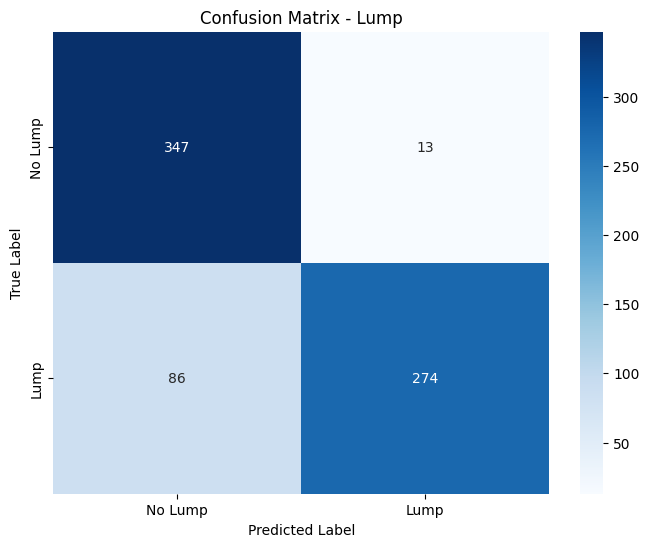


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.80      0.96      0.88       360
        Lump       0.95      0.76      0.85       360

    accuracy                           0.86       720
   macro avg       0.88      0.86      0.86       720
weighted avg       0.88      0.86      0.86       720


Confusion Matrix - Size:
[[ 74  20   3  23]
 [ 19  50  17  34]
 [ 10  10  63  37]
 [  4   4   4 348]]


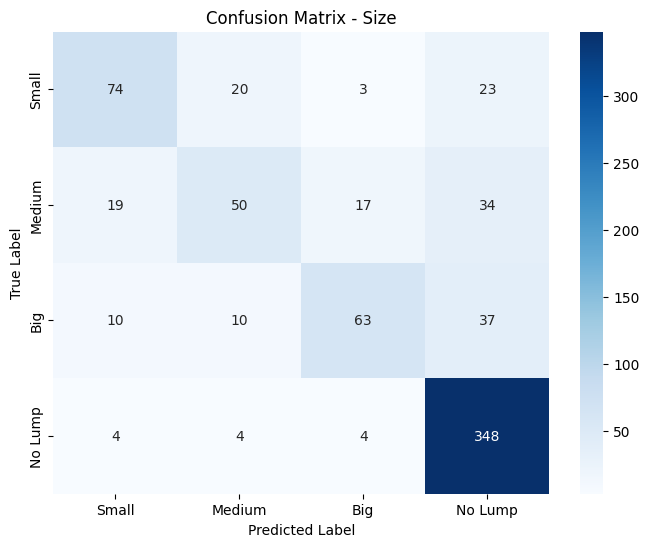


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.69      0.62      0.65       120
      Medium       0.60      0.42      0.49       120
         Big       0.72      0.53      0.61       120
     No Lump       0.79      0.97      0.87       360

    accuracy                           0.74       720
   macro avg       0.70      0.63      0.65       720
weighted avg       0.73      0.74      0.73       720


Confusion Matrix - Position:
[[ 68  16   3  33]
 [ 44  30   6  40]
 [ 39  24  16  41]
 [  3   5   1 351]]


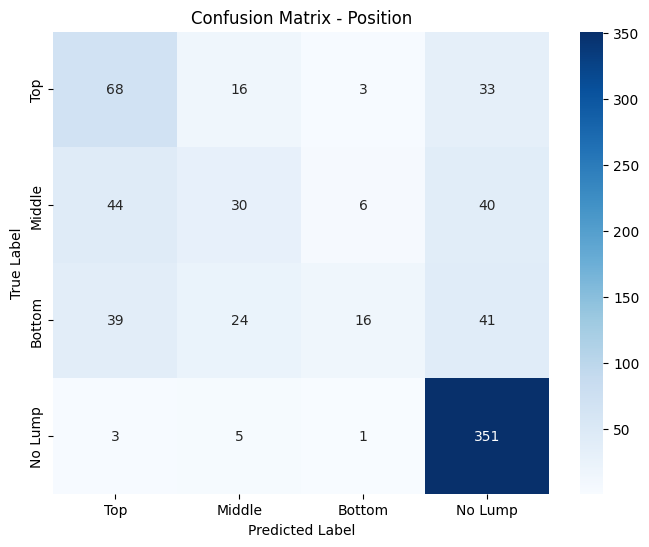


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.44      0.57      0.50       120
      Middle       0.40      0.25      0.31       120
      Bottom       0.62      0.13      0.22       120
     No Lump       0.75      0.97      0.85       360

    accuracy                           0.65       720
   macro avg       0.55      0.48      0.47       720
weighted avg       0.62      0.65      0.60       720


Testing on doctors' data without fine-tuning:


Test Accuracy - Lump: 0.4653, Size: 0.1806, Position: 0.1875

Confusion Matrix - Lump:
[[  9 135]
 [ 19 125]]


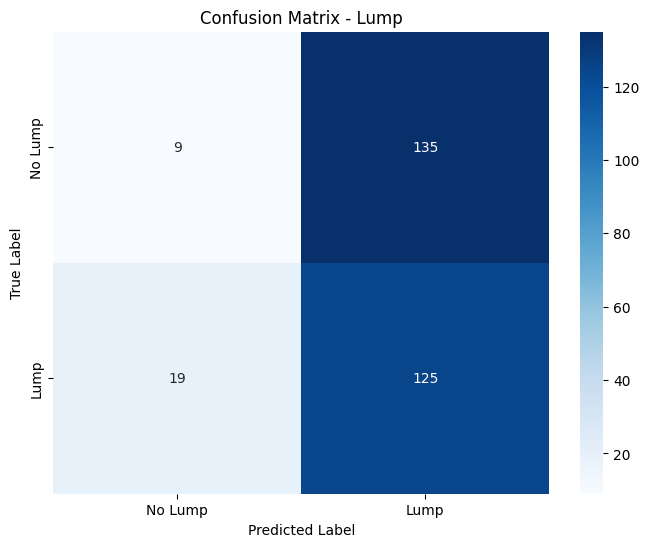


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.32      0.06      0.10       144
        Lump       0.48      0.87      0.62       144

    accuracy                           0.47       288
   macro avg       0.40      0.47      0.36       288
weighted avg       0.40      0.47      0.36       288


Confusion Matrix - Size:
[[  0   0  46   2]
 [  0   0  42   6]
 [  0   0  45   3]
 [  0   0 137   7]]


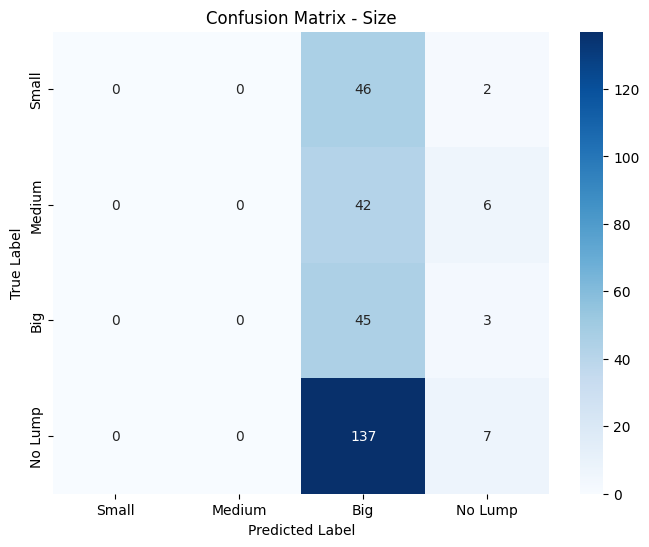


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.00      0.00      0.00        48
      Medium       0.00      0.00      0.00        48
         Big       0.17      0.94      0.28        48
     No Lump       0.39      0.05      0.09       144

    accuracy                           0.18       288
   macro avg       0.14      0.25      0.09       288
weighted avg       0.22      0.18      0.09       288


Confusion Matrix - Position:
[[  0   0  45   3]
 [  0   0  45   3]
 [  0   0  46   2]
 [  1   0 135   8]]


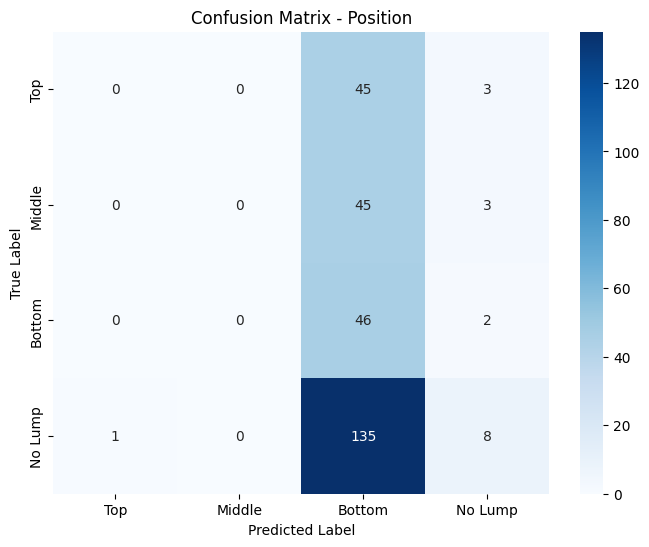


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.00      0.00      0.00        48
      Middle       0.00      0.00      0.00        48
      Bottom       0.17      0.96      0.29        48
     No Lump       0.50      0.06      0.10       144

    accuracy                           0.19       288
   macro avg       0.17      0.25      0.10       288
weighted avg       0.28      0.19      0.10       288


Fine-tuning with 1 additional trials from new dataset


Epoch 1, Training Loss: 1.5903, Validation Loss: 1.7668


Epoch 2, Training Loss: 1.5984, Validation Loss: 1.6930


Epoch 3, Training Loss: 1.6142, Validation Loss: 1.6976


Epoch 4, Training Loss: 1.5922, Validation Loss: 1.7274


Epoch 5, Training Loss: 1.5461, Validation Loss: 1.7051


Epoch 6, Training Loss: 1.5750, Validation Loss: 1.8690


Epoch 7, Training Loss: 1.5849, Validation Loss: 1.7217
Early stopping at epoch 7


Test Accuracy - Lump: 0.4132, Size: 0.1597, Position: 0.3125

Confusion Matrix - Lump:
[[52 92]
 [77 67]]


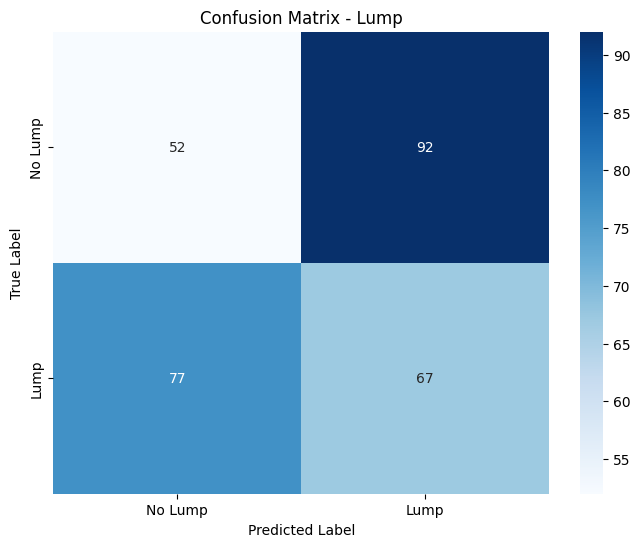


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.40      0.36      0.38       144
        Lump       0.42      0.47      0.44       144

    accuracy                           0.41       288
   macro avg       0.41      0.41      0.41       288
weighted avg       0.41      0.41      0.41       288


Confusion Matrix - Size:
[[  0   0  23  25]
 [  0   0  30  18]
 [  0   0  28  20]
 [  0   0 126  18]]


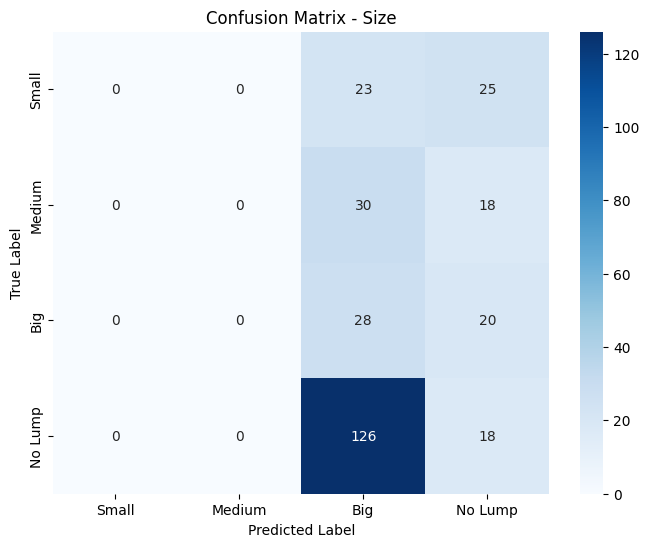


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.00      0.00      0.00        48
      Medium       0.00      0.00      0.00        48
         Big       0.14      0.58      0.22        48
     No Lump       0.22      0.12      0.16       144

    accuracy                           0.16       288
   macro avg       0.09      0.18      0.09       288
weighted avg       0.13      0.16      0.12       288


Confusion Matrix - Position:
[[ 0  0 10 38]
 [ 0  1  9 38]
 [ 0  1 11 36]
 [22  0 44 78]]


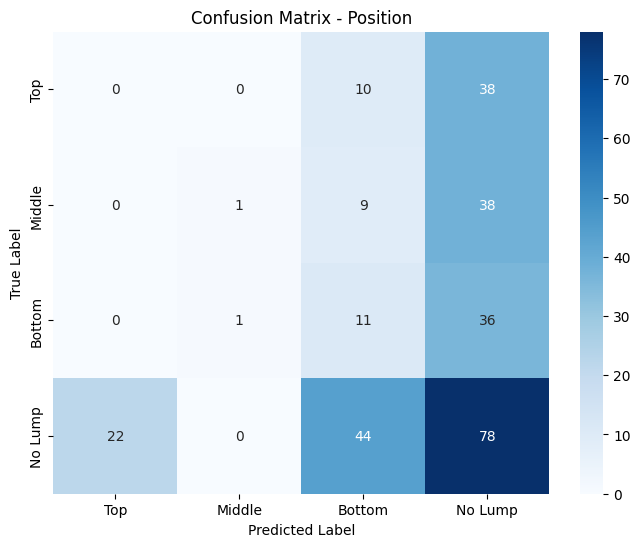


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.00      0.00      0.00        48
      Middle       0.50      0.02      0.04        48
      Bottom       0.15      0.23      0.18        48
     No Lump       0.41      0.54      0.47       144

    accuracy                           0.31       288
   macro avg       0.26      0.20      0.17       288
weighted avg       0.31      0.31      0.27       288


Fine-tuning with 2 additional trials from new dataset


Epoch 1, Training Loss: 1.5448, Validation Loss: 1.8729


Epoch 2, Training Loss: 1.4930, Validation Loss: 1.7761


Epoch 3, Training Loss: 1.5218, Validation Loss: 1.7097


Epoch 4, Training Loss: 1.4620, Validation Loss: 1.7060


Epoch 5, Training Loss: 1.4674, Validation Loss: 1.8614
Early stopping at epoch 5


Test Accuracy - Lump: 0.8160, Size: 0.3889, Position: 0.5486

Confusion Matrix - Lump:
[[119  25]
 [ 28 116]]


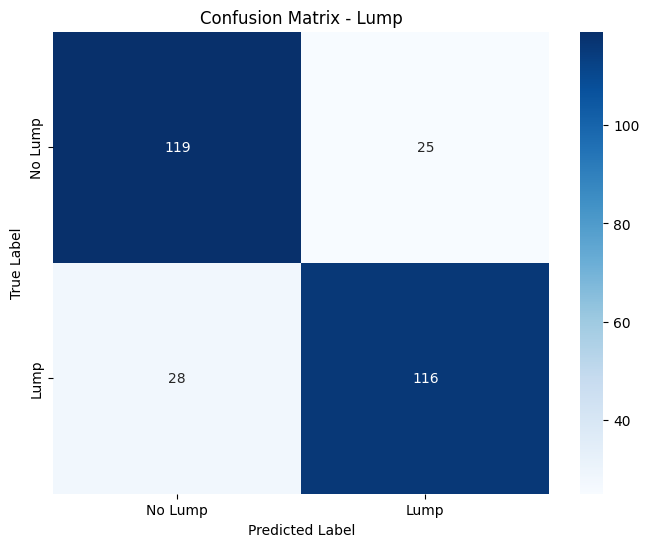


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.81      0.83      0.82       144
        Lump       0.82      0.81      0.81       144

    accuracy                           0.82       288
   macro avg       0.82      0.82      0.82       288
weighted avg       0.82      0.82      0.82       288


Confusion Matrix - Size:
[[19 16  5  8]
 [15 11 11 11]
 [17 16  0 15]
 [ 5  8 49 82]]


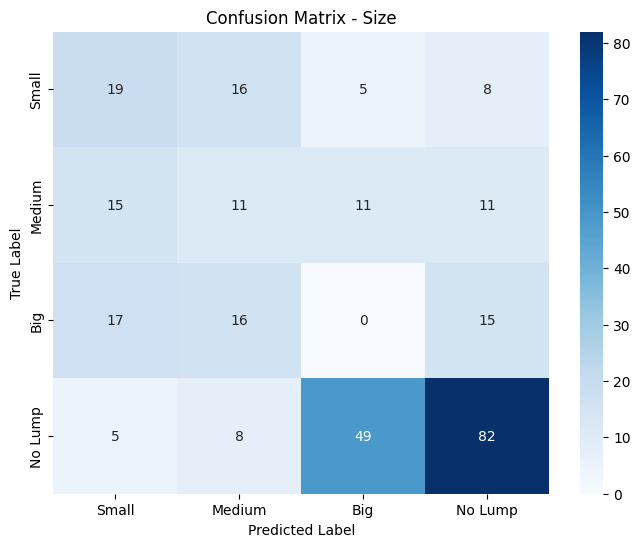


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.34      0.40      0.37        48
      Medium       0.22      0.23      0.22        48
         Big       0.00      0.00      0.00        48
     No Lump       0.71      0.57      0.63       144

    accuracy                           0.39       288
   macro avg       0.32      0.30      0.30       288
weighted avg       0.45      0.39      0.41       288


Confusion Matrix - Position:
[[  2  21  16   9]
 [  0  15  17  16]
 [  0  13  23  12]
 [  0   3  23 118]]


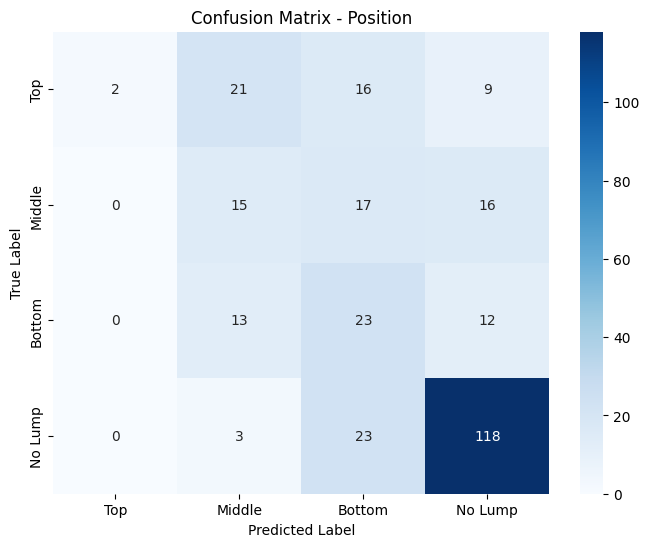


Classification Report - Position:
              precision    recall  f1-score   support

         Top       1.00      0.04      0.08        48
      Middle       0.29      0.31      0.30        48
      Bottom       0.29      0.48      0.36        48
     No Lump       0.76      0.82      0.79       144

    accuracy                           0.55       288
   macro avg       0.59      0.41      0.38       288
weighted avg       0.64      0.55      0.52       288


Fine-tuning with 3 additional trials from new dataset


Epoch 1, Training Loss: 1.4672, Validation Loss: 1.6745


Epoch 2, Training Loss: 1.4569, Validation Loss: 1.9978


Epoch 3, Training Loss: 1.4405, Validation Loss: 1.7732


Epoch 4, Training Loss: 1.4202, Validation Loss: 1.6975


Epoch 5, Training Loss: 1.3825, Validation Loss: 1.9642


Epoch 6, Training Loss: 1.4233, Validation Loss: 1.8570
Early stopping at epoch 6


Test Accuracy - Lump: 0.8125, Size: 0.4340, Position: 0.5521

Confusion Matrix - Lump:
[[133  11]
 [ 43 101]]


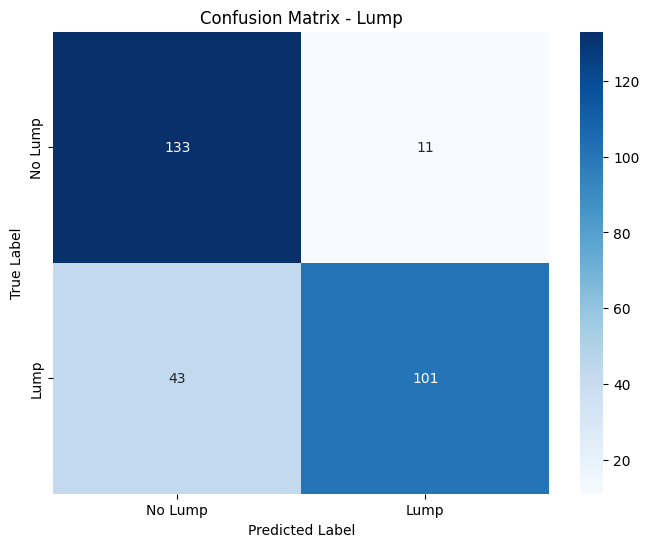


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.76      0.92      0.83       144
        Lump       0.90      0.70      0.79       144

    accuracy                           0.81       288
   macro avg       0.83      0.81      0.81       288
weighted avg       0.83      0.81      0.81       288


Confusion Matrix - Size:
[[  6  10  16  16]
 [  1   4  28  15]
 [  3   0  14  31]
 [  1   0  42 101]]


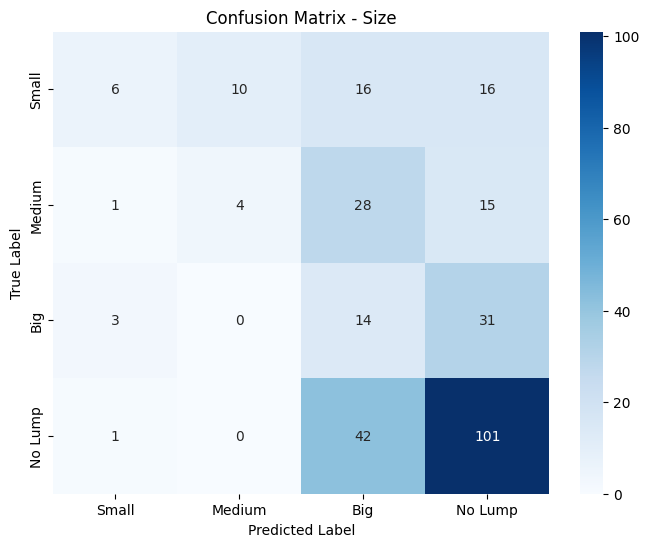


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.55      0.12      0.20        48
      Medium       0.29      0.08      0.13        48
         Big       0.14      0.29      0.19        48
     No Lump       0.62      0.70      0.66       144

    accuracy                           0.43       288
   macro avg       0.40      0.30      0.29       288
weighted avg       0.47      0.43      0.42       288


Confusion Matrix - Position:
[[  2   2  24  20]
 [  4   4  21  19]
 [  5   1  19  23]
 [  0   1   9 134]]


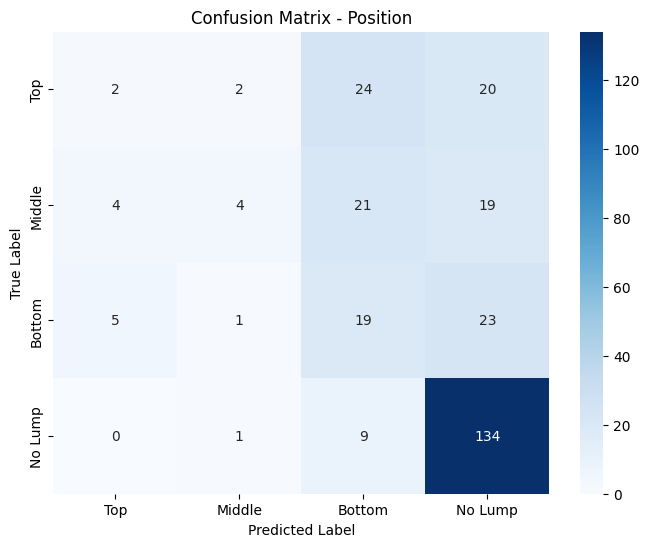


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.18      0.04      0.07        48
      Middle       0.50      0.08      0.14        48
      Bottom       0.26      0.40      0.31        48
     No Lump       0.68      0.93      0.79       144

    accuracy                           0.55       288
   macro avg       0.41      0.36      0.33       288
weighted avg       0.50      0.55      0.48       288


Fine-tuning with 4 additional trials from new dataset


Epoch 1, Training Loss: 1.4333, Validation Loss: 1.6967


Epoch 2, Training Loss: 1.3708, Validation Loss: 1.6955


Epoch 3, Training Loss: 1.3798, Validation Loss: 1.7642


Epoch 4, Training Loss: 1.3313, Validation Loss: 1.8260


Epoch 5, Training Loss: 1.3373, Validation Loss: 1.7843
Early stopping at epoch 5


Test Accuracy - Lump: 0.7778, Size: 0.3750, Position: 0.4826

Confusion Matrix - Lump:
[[ 86  58]
 [  6 138]]


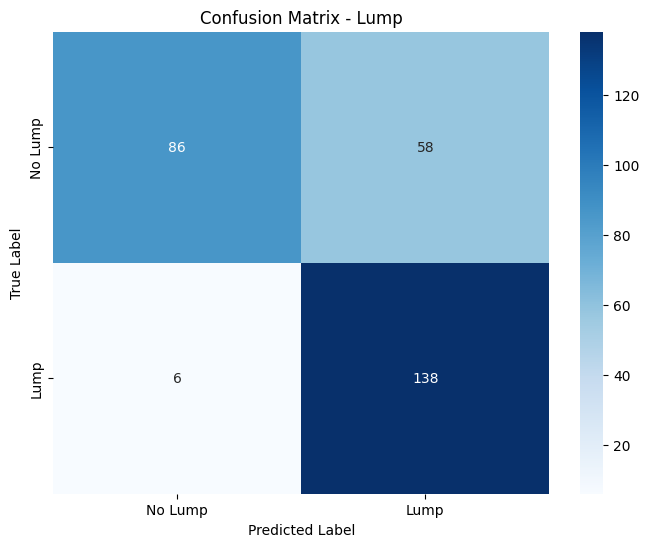


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.93      0.60      0.73       144
        Lump       0.70      0.96      0.81       144

    accuracy                           0.78       288
   macro avg       0.82      0.78      0.77       288
weighted avg       0.82      0.78      0.77       288


Confusion Matrix - Size:
[[32  0 14  2]
 [23  2 23  0]
 [21  1 17  9]
 [16  0 71 57]]


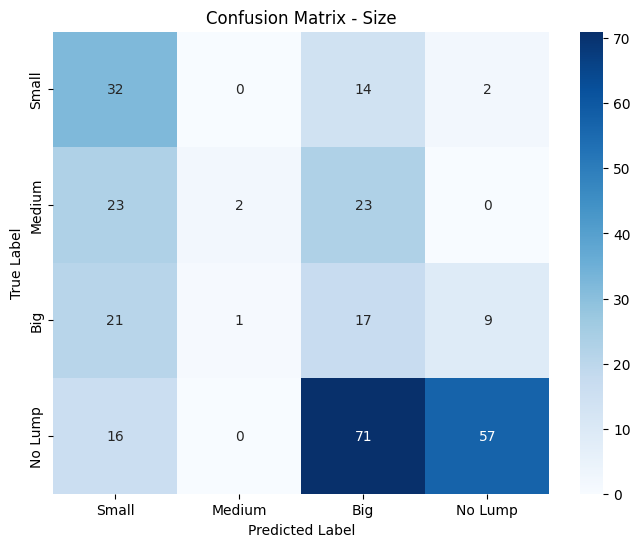


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.35      0.67      0.46        48
      Medium       0.67      0.04      0.08        48
         Big       0.14      0.35      0.20        48
     No Lump       0.84      0.40      0.54       144

    accuracy                           0.38       288
   macro avg       0.50      0.36      0.32       288
weighted avg       0.61      0.38      0.39       288


Confusion Matrix - Position:
[[ 2 31 15  0]
 [ 5 22 16  5]
 [ 5 17 19  7]
 [ 1 15 32 96]]


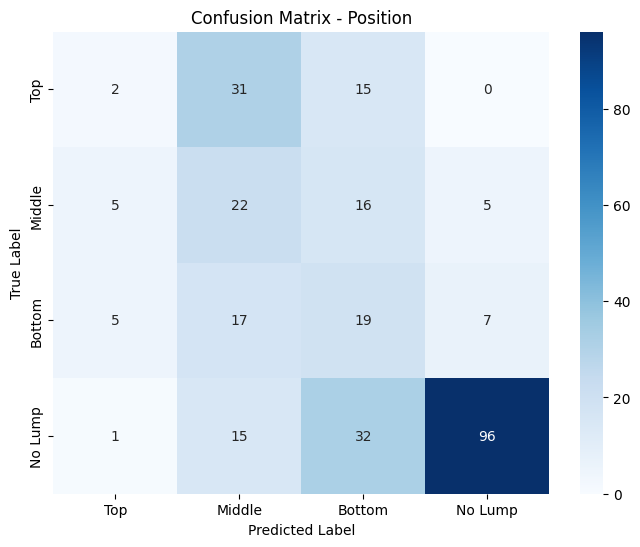


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.15      0.04      0.07        48
      Middle       0.26      0.46      0.33        48
      Bottom       0.23      0.40      0.29        48
     No Lump       0.89      0.67      0.76       144

    accuracy                           0.48       288
   macro avg       0.38      0.39      0.36       288
weighted avg       0.55      0.48      0.50       288

Few-shot early stopping at step 4


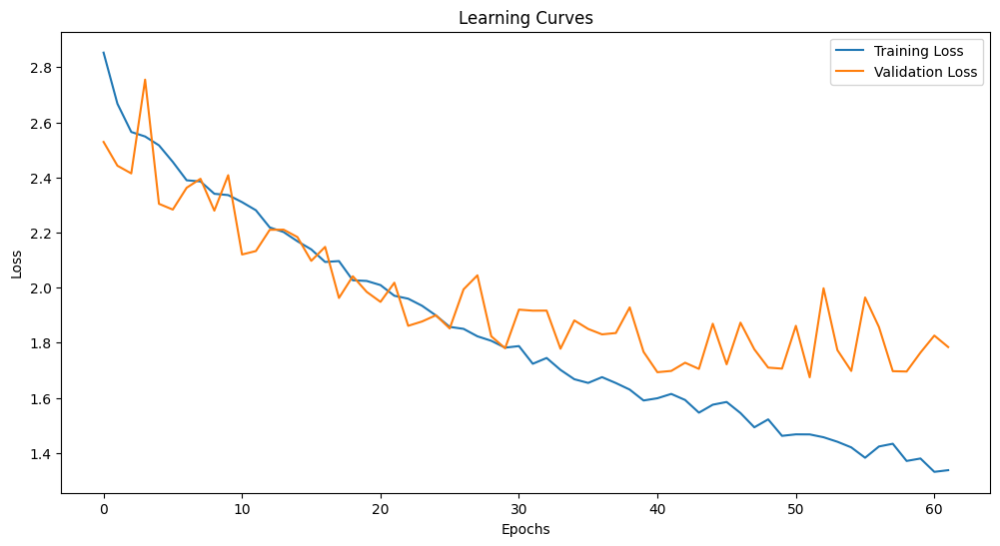

| Training Phase                         |   Lump Accuracy |   Size Accuracy |   Position Accuracy |
|:---------------------------------------|----------------:|----------------:|--------------------:|
| Initial Training                       |        0.8625   |        0.743056 |            0.645833 |
| Testing on doctors without fine-tuning |        0.465278 |        0.180556 |            0.1875   |
| Fine-tuning with 1 trials              |        0.413194 |        0.159722 |            0.3125   |
| Fine-tuning with 2 trials              |        0.815972 |        0.388889 |            0.548611 |
| Fine-tuning with 3 trials              |        0.8125   |        0.434028 |            0.552083 |
| Fine-tuning with 4 trials              |        0.777778 |        0.375    |            0.482639 |

Running experiment with all sensors and 4 seconds
Using 6 GPUs
Initial Training and Evaluation:


Epoch 1, Training Loss: 2.8144, Validation Loss: 2.8549


Epoch 2, Training Loss: 2.6770, Validation Loss: 2.4636


Epoch 3, Training Loss: 2.5625, Validation Loss: 2.3796


Epoch 4, Training Loss: 2.5267, Validation Loss: 2.3856


Epoch 5, Training Loss: 2.4733, Validation Loss: 2.3001


Epoch 6, Training Loss: 2.4441, Validation Loss: 2.4339


Epoch 7, Training Loss: 2.3640, Validation Loss: 2.2369


Epoch 8, Training Loss: 2.4032, Validation Loss: 2.1427


Epoch 9, Training Loss: 2.3382, Validation Loss: 2.1817


Epoch 10, Training Loss: 2.3173, Validation Loss: 2.2062


Epoch 11, Training Loss: 2.2802, Validation Loss: 2.1785


Epoch 12, Training Loss: 2.2489, Validation Loss: 2.4013


Epoch 13, Training Loss: 2.2268, Validation Loss: 2.1916
Early stopping at epoch 13


Test Accuracy - Lump: 0.8208, Size: 0.6681, Position: 0.5847

Confusion Matrix - Lump:
[[288  72]
 [ 57 303]]


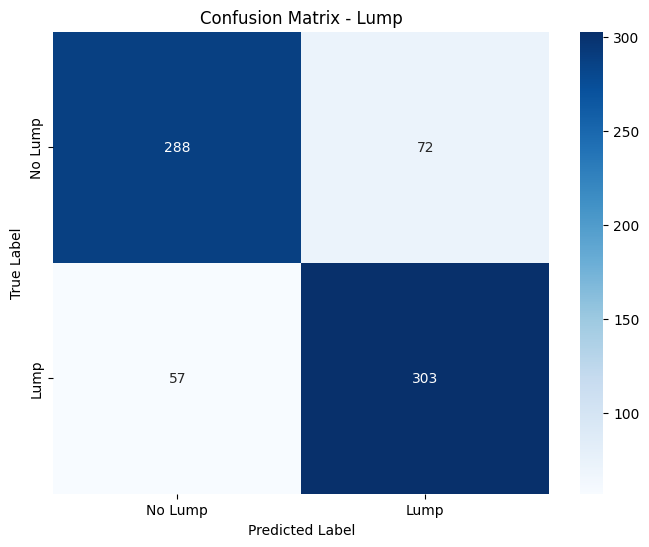


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.83      0.80      0.82       360
        Lump       0.81      0.84      0.82       360

    accuracy                           0.82       720
   macro avg       0.82      0.82      0.82       720
weighted avg       0.82      0.82      0.82       720


Confusion Matrix - Size:
[[ 68  16  10  26]
 [ 26  46  26  22]
 [ 15  16  59  30]
 [ 22  13  17 308]]


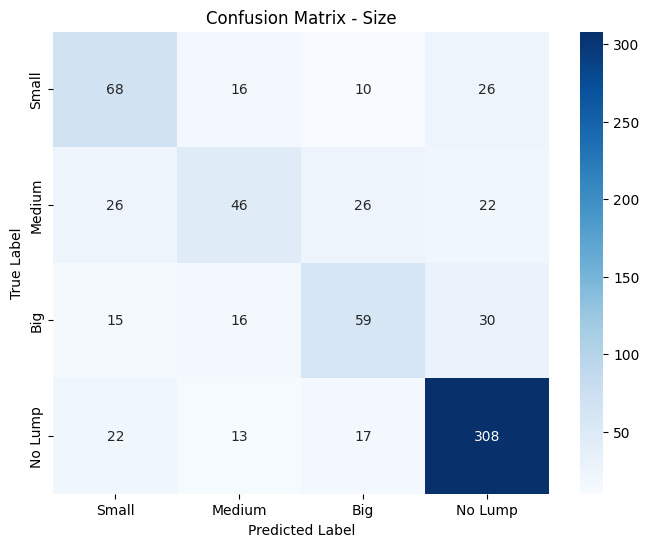


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.52      0.57      0.54       120
      Medium       0.51      0.38      0.44       120
         Big       0.53      0.49      0.51       120
     No Lump       0.80      0.86      0.83       360

    accuracy                           0.67       720
   macro avg       0.59      0.57      0.58       720
weighted avg       0.66      0.67      0.66       720


Confusion Matrix - Position:
[[  7  34  36  43]
 [  9  49  32  30]
 [  1  44  47  28]
 [  5  18  19 318]]


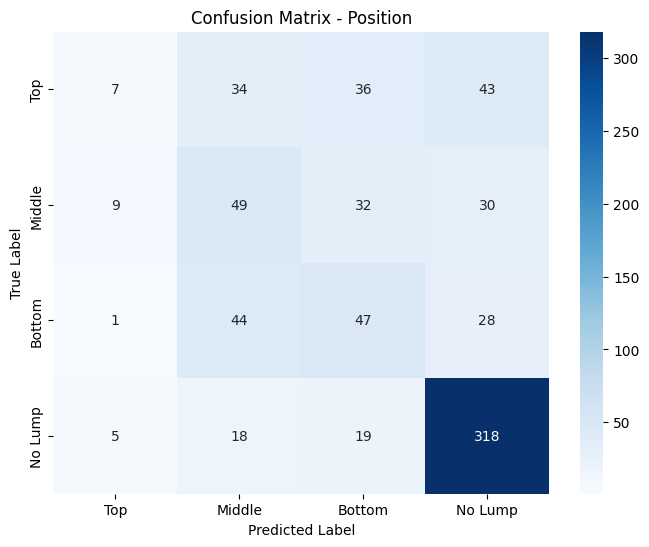


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.32      0.06      0.10       120
      Middle       0.34      0.41      0.37       120
      Bottom       0.35      0.39      0.37       120
     No Lump       0.76      0.88      0.82       360

    accuracy                           0.58       720
   macro avg       0.44      0.44      0.41       720
weighted avg       0.55      0.58      0.55       720


Testing on doctors' data without fine-tuning:


Test Accuracy - Lump: 0.5035, Size: 0.1597, Position: 0.1771

Confusion Matrix - Lump:
[[  1 143]
 [  0 144]]


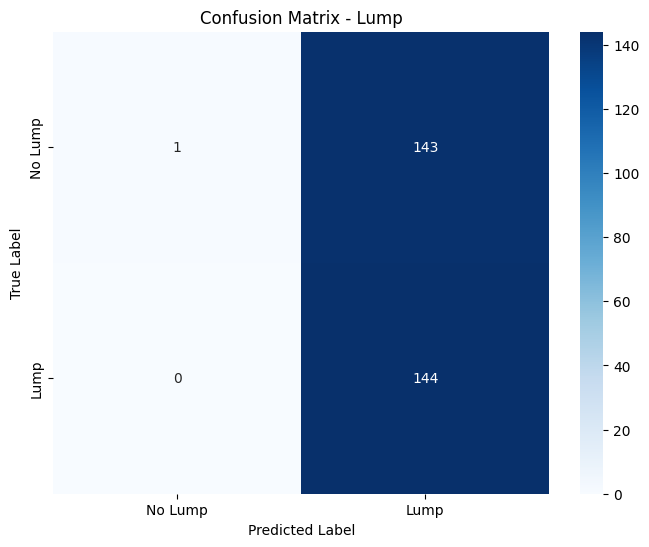


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       1.00      0.01      0.01       144
        Lump       0.50      1.00      0.67       144

    accuracy                           0.50       288
   macro avg       0.75      0.50      0.34       288
weighted avg       0.75      0.50      0.34       288


Confusion Matrix - Size:
[[  0  12  36   0]
 [  0  14  33   1]
 [  0  19  29   0]
 [  0  14 127   3]]


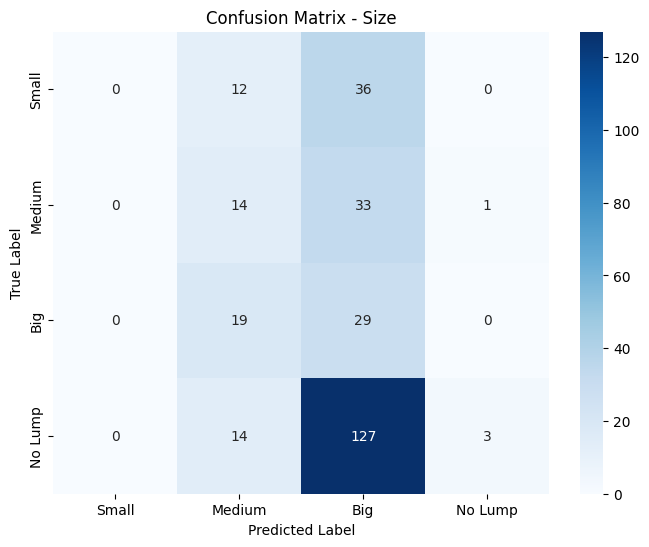


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.00      0.00      0.00        48
      Medium       0.24      0.29      0.26        48
         Big       0.13      0.60      0.21        48
     No Lump       0.75      0.02      0.04       144

    accuracy                           0.16       288
   macro avg       0.28      0.23      0.13       288
weighted avg       0.44      0.16      0.10       288


Confusion Matrix - Position:
[[  0   0  48   0]
 [  0   0  48   0]
 [  0   0  48   0]
 [  0   0 141   3]]


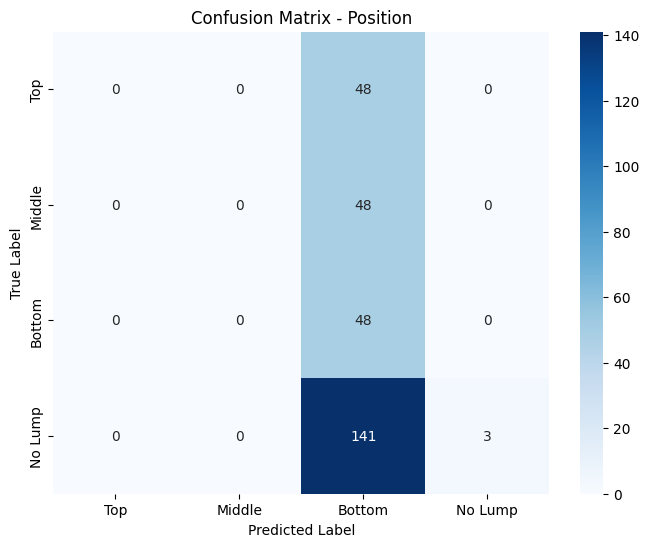


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.00      0.00      0.00        48
      Middle       0.00      0.00      0.00        48
      Bottom       0.17      1.00      0.29        48
     No Lump       1.00      0.02      0.04       144

    accuracy                           0.18       288
   macro avg       0.29      0.26      0.08       288
weighted avg       0.53      0.18      0.07       288


Fine-tuning with 1 additional trials from new dataset


Epoch 1, Training Loss: 2.2462, Validation Loss: 2.2692


Epoch 2, Training Loss: 2.1824, Validation Loss: 2.0310


Epoch 3, Training Loss: 2.1572, Validation Loss: 2.2454


Epoch 4, Training Loss: 2.0901, Validation Loss: 2.2359


Epoch 5, Training Loss: 2.0882, Validation Loss: 2.0221


Epoch 6, Training Loss: 2.0649, Validation Loss: 2.0426


Epoch 7, Training Loss: 2.0533, Validation Loss: 2.0199


Epoch 8, Training Loss: 2.0524, Validation Loss: 2.4015


Epoch 9, Training Loss: 2.0484, Validation Loss: 2.1592


Epoch 10, Training Loss: 1.9535, Validation Loss: 1.8646


Epoch 11, Training Loss: 1.9478, Validation Loss: 2.0776


Epoch 12, Training Loss: 1.9196, Validation Loss: 1.9408


Epoch 13, Training Loss: 1.8591, Validation Loss: 1.9410


Epoch 14, Training Loss: 1.8681, Validation Loss: 2.0192


Epoch 15, Training Loss: 1.8423, Validation Loss: 1.9032
Early stopping at epoch 15


Test Accuracy - Lump: 0.5174, Size: 0.1875, Position: 0.1597

Confusion Matrix - Lump:
[[  5 139]
 [  0 144]]


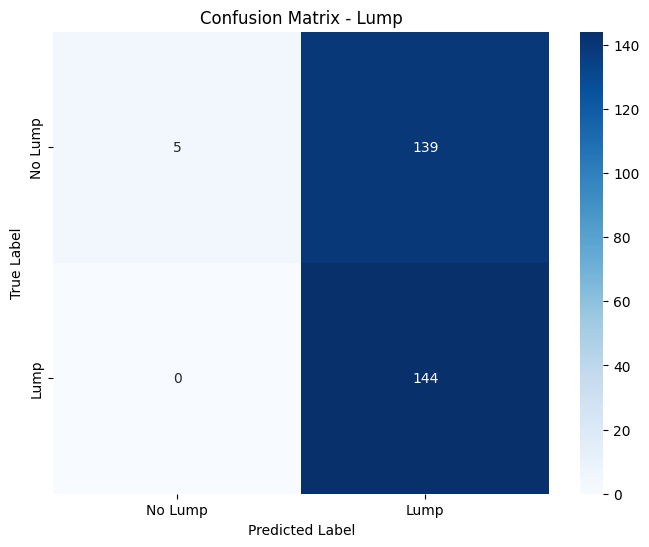


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       1.00      0.03      0.07       144
        Lump       0.51      1.00      0.67       144

    accuracy                           0.52       288
   macro avg       0.75      0.52      0.37       288
weighted avg       0.75      0.52      0.37       288


Confusion Matrix - Size:
[[ 10  25  13   0]
 [  3  19  25   1]
 [  6  26  15   1]
 [  6   8 120  10]]


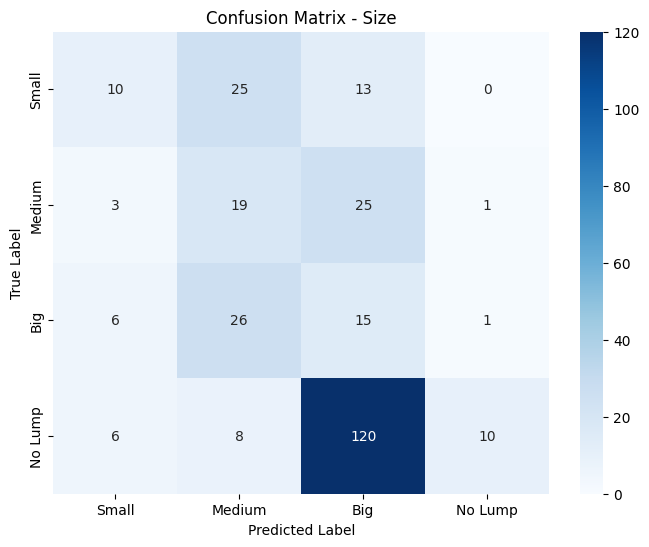


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.40      0.21      0.27        48
      Medium       0.24      0.40      0.30        48
         Big       0.09      0.31      0.14        48
     No Lump       0.83      0.07      0.13       144

    accuracy                           0.19       288
   macro avg       0.39      0.25      0.21       288
weighted avg       0.54      0.19      0.18       288


Confusion Matrix - Position:
[[  4   2  41   1]
 [ 10   2  33   3]
 [ 17   1  30   0]
 [107   1  26  10]]


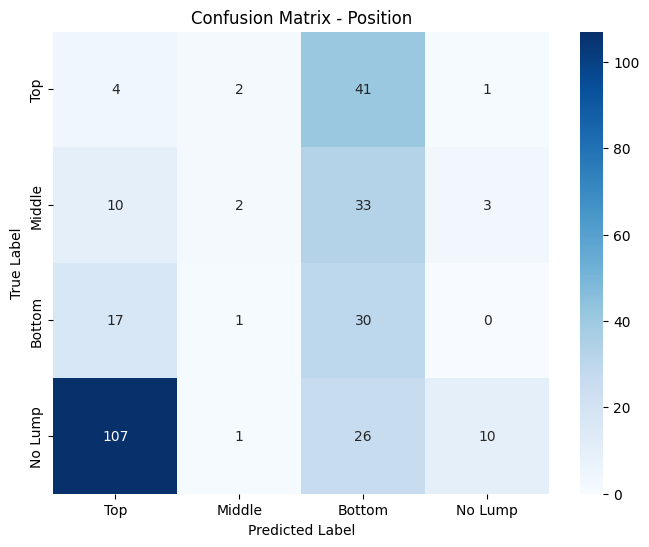


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.03      0.08      0.04        48
      Middle       0.33      0.04      0.07        48
      Bottom       0.23      0.62      0.34        48
     No Lump       0.71      0.07      0.13       144

    accuracy                           0.16       288
   macro avg       0.33      0.20      0.15       288
weighted avg       0.46      0.16      0.14       288


Fine-tuning with 2 additional trials from new dataset


Epoch 1, Training Loss: 1.8316, Validation Loss: 1.8379


Epoch 2, Training Loss: 1.7835, Validation Loss: 1.8828


Epoch 3, Training Loss: 1.7924, Validation Loss: 1.8910


Epoch 4, Training Loss: 1.7545, Validation Loss: 1.9004


Epoch 5, Training Loss: 1.7844, Validation Loss: 1.8891


Epoch 6, Training Loss: 1.7279, Validation Loss: 1.8485
Early stopping at epoch 6


Test Accuracy - Lump: 0.7326, Size: 0.2674, Position: 0.5000

Confusion Matrix - Lump:
[[ 69  75]
 [  2 142]]


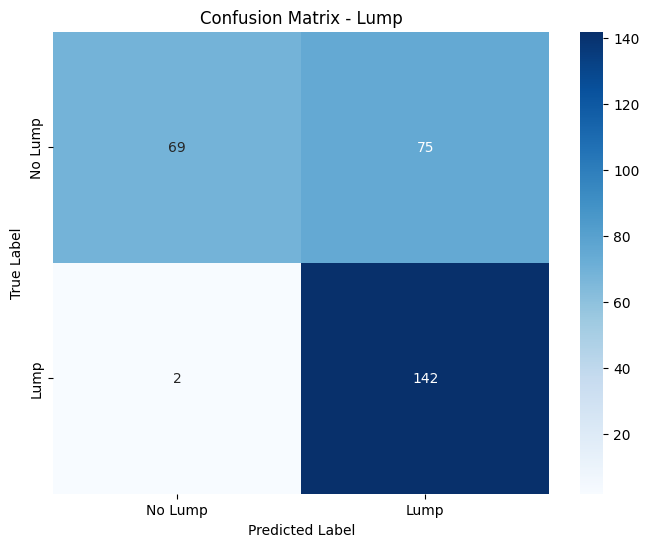


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.97      0.48      0.64       144
        Lump       0.65      0.99      0.79       144

    accuracy                           0.73       288
   macro avg       0.81      0.73      0.71       288
weighted avg       0.81      0.73      0.71       288


Confusion Matrix - Size:
[[27 15  4  2]
 [16 20  8  4]
 [19 23  5  1]
 [24  8 87 25]]


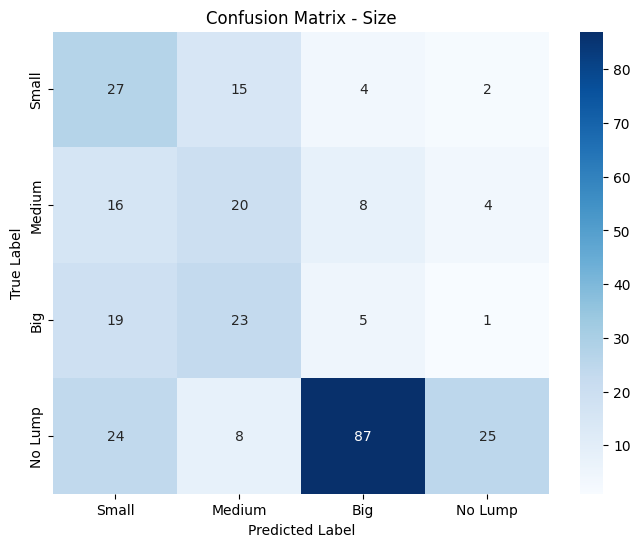


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.31      0.56      0.40        48
      Medium       0.30      0.42      0.35        48
         Big       0.05      0.10      0.07        48
     No Lump       0.78      0.17      0.28       144

    accuracy                           0.27       288
   macro avg       0.36      0.31      0.28       288
weighted avg       0.50      0.27      0.28       288


Confusion Matrix - Position:
[[ 0 10 36  2]
 [ 1  7 36  4]
 [ 0  3 43  2]
 [ 6 13 31 94]]


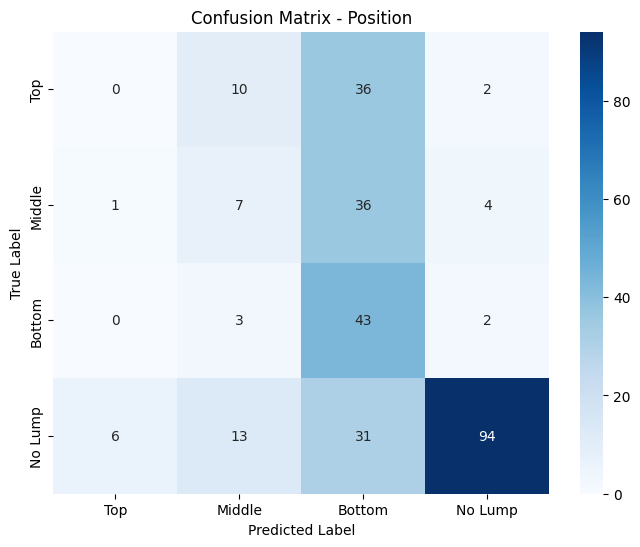


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.00      0.00      0.00        48
      Middle       0.21      0.15      0.17        48
      Bottom       0.29      0.90      0.44        48
     No Lump       0.92      0.65      0.76       144

    accuracy                           0.50       288
   macro avg       0.36      0.42      0.35       288
weighted avg       0.55      0.50      0.48       288


Fine-tuning with 3 additional trials from new dataset


Epoch 1, Training Loss: 1.7182, Validation Loss: 1.7748


Epoch 2, Training Loss: 1.6985, Validation Loss: 1.7580


Epoch 3, Training Loss: 1.6535, Validation Loss: 1.8867


Epoch 4, Training Loss: 1.6995, Validation Loss: 1.7482


Epoch 5, Training Loss: 1.6476, Validation Loss: 1.9291


Epoch 6, Training Loss: 1.6377, Validation Loss: 1.8646


Epoch 7, Training Loss: 1.6313, Validation Loss: 1.7607


Epoch 8, Training Loss: 1.6022, Validation Loss: 1.8725


Epoch 9, Training Loss: 1.6101, Validation Loss: 1.6994


Epoch 10, Training Loss: 1.5728, Validation Loss: 1.7681


Epoch 11, Training Loss: 1.5593, Validation Loss: 2.0824


Epoch 12, Training Loss: 1.5293, Validation Loss: 1.8324


Epoch 13, Training Loss: 1.5239, Validation Loss: 1.7990


Epoch 14, Training Loss: 1.5428, Validation Loss: 2.0025
Early stopping at epoch 14


Test Accuracy - Lump: 0.7188, Size: 0.5694, Position: 0.5556

Confusion Matrix - Lump:
[[143   1]
 [ 80  64]]


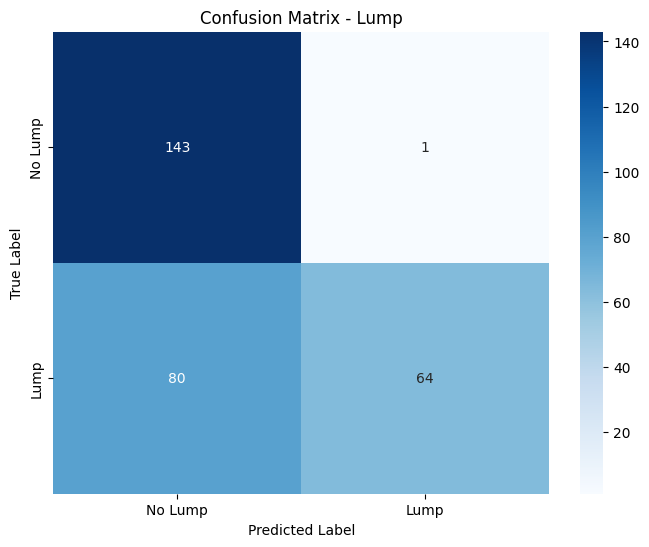


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.64      0.99      0.78       144
        Lump       0.98      0.44      0.61       144

    accuracy                           0.72       288
   macro avg       0.81      0.72      0.70       288
weighted avg       0.81      0.72      0.70       288


Confusion Matrix - Size:
[[ 12   0   5  31]
 [  5   5  14  24]
 [  3   0   5  40]
 [  1   0   1 142]]


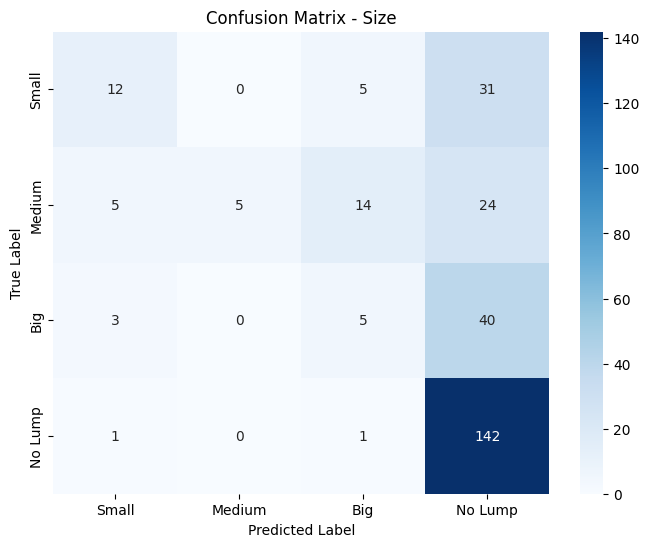


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.57      0.25      0.35        48
      Medium       1.00      0.10      0.19        48
         Big       0.20      0.10      0.14        48
     No Lump       0.60      0.99      0.75       144

    accuracy                           0.57       288
   macro avg       0.59      0.36      0.35       288
weighted avg       0.59      0.57      0.48       288


Confusion Matrix - Position:
[[  7   0   8  33]
 [  2   0  13  33]
 [  1   0  10  37]
 [  0   0   1 143]]


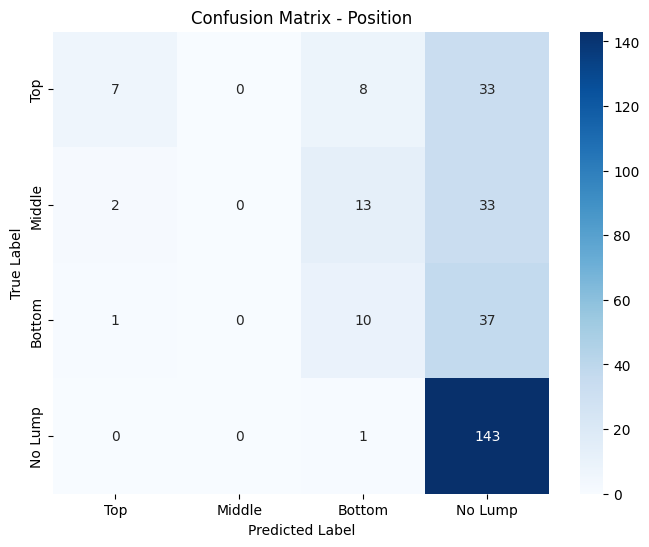


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.70      0.15      0.24        48
      Middle       0.00      0.00      0.00        48
      Bottom       0.31      0.21      0.25        48
     No Lump       0.58      0.99      0.73       144

    accuracy                           0.56       288
   macro avg       0.40      0.34      0.31       288
weighted avg       0.46      0.56      0.45       288


Fine-tuning with 4 additional trials from new dataset


Epoch 1, Training Loss: 1.5480, Validation Loss: 1.6717


Epoch 2, Training Loss: 1.4437, Validation Loss: 1.7367


Epoch 3, Training Loss: 1.4759, Validation Loss: 1.7069


Epoch 4, Training Loss: 1.4671, Validation Loss: 1.8239


Epoch 5, Training Loss: 1.4930, Validation Loss: 1.8630


Epoch 6, Training Loss: 1.4388, Validation Loss: 1.6412


Epoch 7, Training Loss: 1.4398, Validation Loss: 1.7752


Epoch 8, Training Loss: 1.4188, Validation Loss: 1.6720


Epoch 9, Training Loss: 1.3777, Validation Loss: 1.7972


Epoch 10, Training Loss: 1.4246, Validation Loss: 1.6597


Epoch 11, Training Loss: 1.3706, Validation Loss: 1.6965
Early stopping at epoch 11


Test Accuracy - Lump: 0.9028, Size: 0.6562, Position: 0.6354

Confusion Matrix - Lump:
[[131  13]
 [ 15 129]]


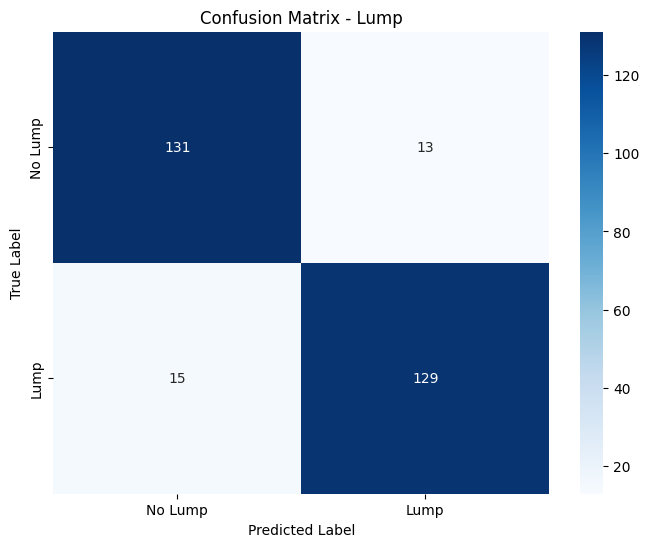


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.90      0.91      0.90       144
        Lump       0.91      0.90      0.90       144

    accuracy                           0.90       288
   macro avg       0.90      0.90      0.90       288
weighted avg       0.90      0.90      0.90       288


Confusion Matrix - Size:
[[ 15  27   3   3]
 [  4  38   2   4]
 [  2  28   2  16]
 [  0   5   5 134]]


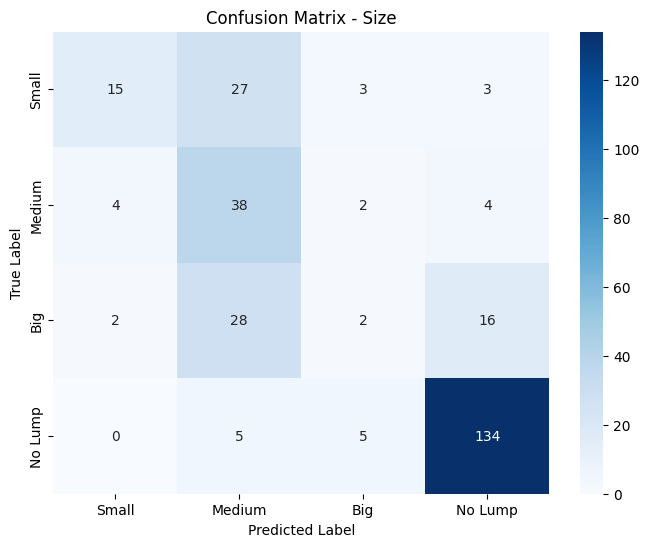


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.71      0.31      0.43        48
      Medium       0.39      0.79      0.52        48
         Big       0.17      0.04      0.07        48
     No Lump       0.85      0.93      0.89       144

    accuracy                           0.66       288
   macro avg       0.53      0.52      0.48       288
weighted avg       0.64      0.66      0.62       288


Confusion Matrix - Position:
[[  5  32   9   2]
 [  3  28  11   6]
 [  3  20  12  13]
 [  0   1   5 138]]


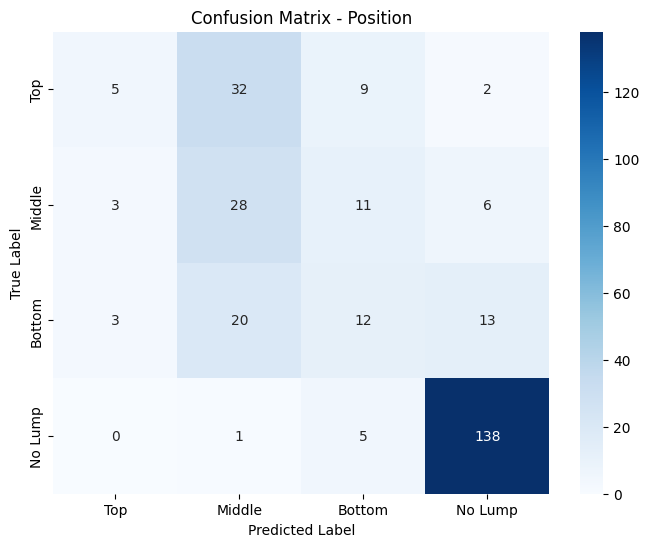


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.45      0.10      0.17        48
      Middle       0.35      0.58      0.43        48
      Bottom       0.32      0.25      0.28        48
     No Lump       0.87      0.96      0.91       144

    accuracy                           0.64       288
   macro avg       0.50      0.47      0.45       288
weighted avg       0.62      0.64      0.60       288


Fine-tuning with 5 additional trials from new dataset


Epoch 1, Training Loss: 1.3487, Validation Loss: 1.7810


Epoch 2, Training Loss: 1.4271, Validation Loss: 1.6558


Epoch 3, Training Loss: 1.3691, Validation Loss: 1.7741


Epoch 4, Training Loss: 1.4064, Validation Loss: 1.6405


Epoch 5, Training Loss: 1.3404, Validation Loss: 1.6539


Epoch 6, Training Loss: 1.3592, Validation Loss: 1.7863


Epoch 7, Training Loss: 1.3363, Validation Loss: 2.5357


Epoch 8, Training Loss: 1.3317, Validation Loss: 1.8078


Epoch 9, Training Loss: 1.2562, Validation Loss: 1.8865
Early stopping at epoch 9


Test Accuracy - Lump: 0.8993, Size: 0.6979, Position: 0.6181

Confusion Matrix - Lump:
[[125  19]
 [ 10 134]]


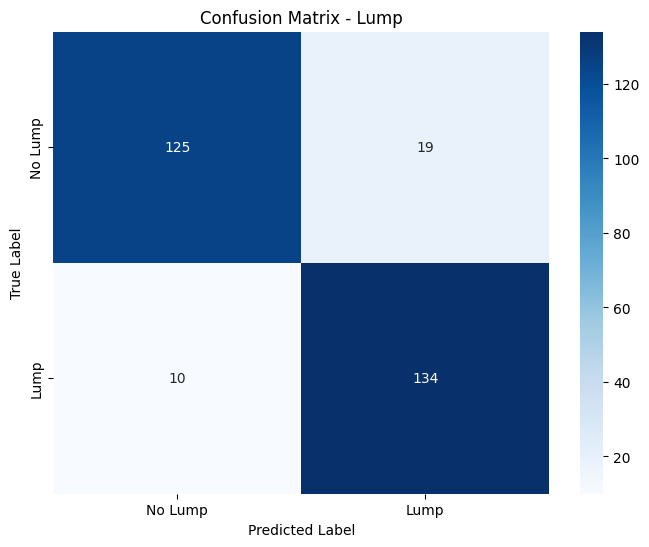


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.93      0.87      0.90       144
        Lump       0.88      0.93      0.90       144

    accuracy                           0.90       288
   macro avg       0.90      0.90      0.90       288
weighted avg       0.90      0.90      0.90       288


Confusion Matrix - Size:
[[ 36  10   2   0]
 [ 16  30   2   0]
 [ 21   8   8  11]
 [  6   5   6 127]]


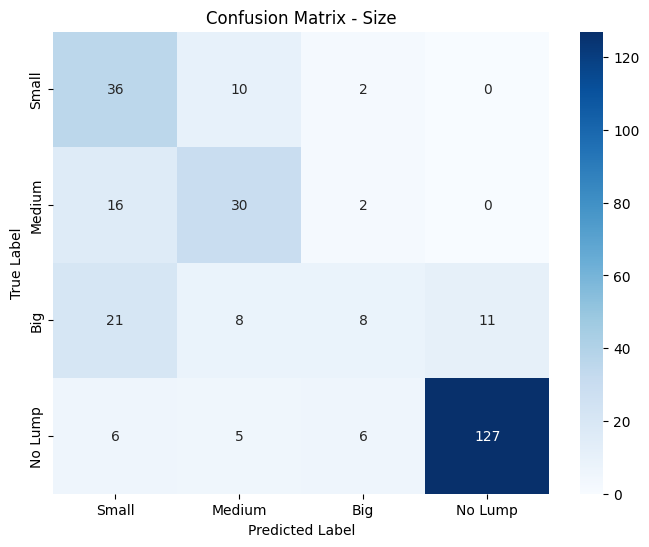


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.46      0.75      0.57        48
      Medium       0.57      0.62      0.59        48
         Big       0.44      0.17      0.24        48
     No Lump       0.92      0.88      0.90       144

    accuracy                           0.70       288
   macro avg       0.60      0.61      0.58       288
weighted avg       0.70      0.70      0.68       288


Confusion Matrix - Position:
[[ 20  25   3   0]
 [ 12  15  17   4]
 [  8  18  14   8]
 [  6   3   6 129]]


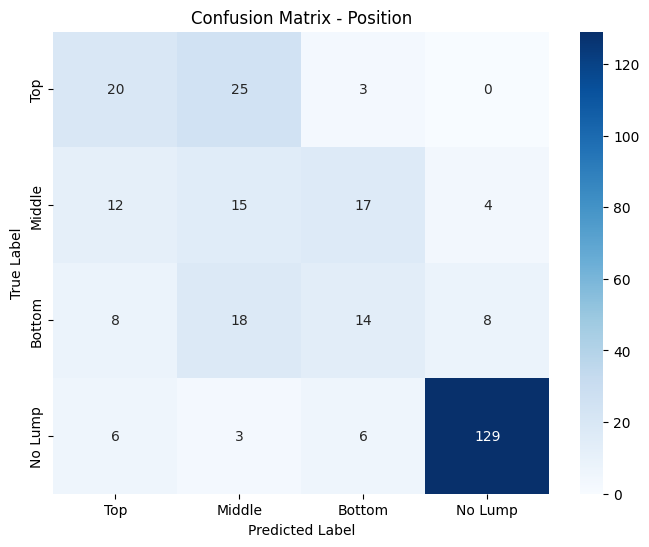


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.43      0.42      0.43        48
      Middle       0.25      0.31      0.28        48
      Bottom       0.35      0.29      0.32        48
     No Lump       0.91      0.90      0.91       144

    accuracy                           0.62       288
   macro avg       0.49      0.48      0.48       288
weighted avg       0.63      0.62      0.62       288



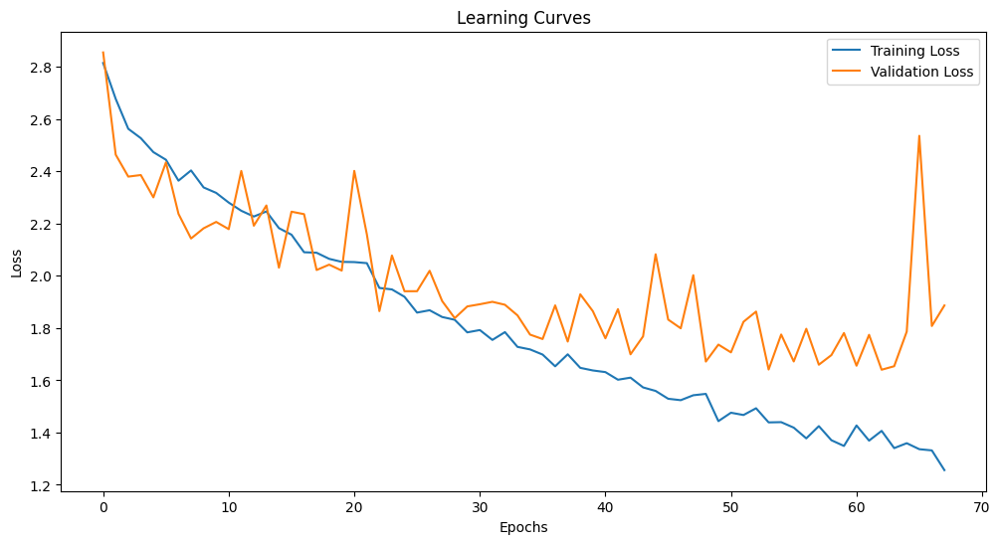

| Training Phase                         |   Lump Accuracy |   Size Accuracy |   Position Accuracy |
|:---------------------------------------|----------------:|----------------:|--------------------:|
| Initial Training                       |        0.820833 |        0.668056 |            0.584722 |
| Testing on doctors without fine-tuning |        0.503472 |        0.159722 |            0.177083 |
| Fine-tuning with 1 trials              |        0.517361 |        0.1875   |            0.159722 |
| Fine-tuning with 2 trials              |        0.732639 |        0.267361 |            0.5      |
| Fine-tuning with 3 trials              |        0.71875  |        0.569444 |            0.555556 |
| Fine-tuning with 4 trials              |        0.902778 |        0.65625  |            0.635417 |
| Fine-tuning with 5 trials              |        0.899306 |        0.697917 |            0.618056 |

Running experiment with all sensors and 5 seconds
Using 6 GPUs
Initial Training and Evalua

Epoch 1, Training Loss: 2.7990, Validation Loss: 2.5443


Epoch 2, Training Loss: 2.6716, Validation Loss: 2.9601


Epoch 3, Training Loss: 2.6055, Validation Loss: 2.5064


Epoch 4, Training Loss: 2.5667, Validation Loss: 2.4874


Epoch 5, Training Loss: 2.5060, Validation Loss: 2.4365


Epoch 6, Training Loss: 2.4804, Validation Loss: 2.4053


Epoch 7, Training Loss: 2.4406, Validation Loss: 2.3890


Epoch 8, Training Loss: 2.3709, Validation Loss: 2.4138


Epoch 9, Training Loss: 2.3480, Validation Loss: 2.2941


Epoch 10, Training Loss: 2.2882, Validation Loss: 2.3797


Epoch 11, Training Loss: 2.2833, Validation Loss: 2.1654


Epoch 12, Training Loss: 2.1846, Validation Loss: 2.2711


Epoch 13, Training Loss: 2.2052, Validation Loss: 2.2781


Epoch 14, Training Loss: 2.1353, Validation Loss: 2.1144


Epoch 15, Training Loss: 2.1191, Validation Loss: 2.1559


Epoch 16, Training Loss: 2.0785, Validation Loss: 2.1091


Epoch 17, Training Loss: 2.0732, Validation Loss: 2.0435


Epoch 18, Training Loss: 2.0329, Validation Loss: 1.9521


Epoch 19, Training Loss: 1.9958, Validation Loss: 1.9892


Epoch 20, Training Loss: 2.0003, Validation Loss: 1.9115


Epoch 21, Training Loss: 1.9433, Validation Loss: 1.9644


Epoch 22, Training Loss: 1.9266, Validation Loss: 2.1214


Epoch 23, Training Loss: 1.9209, Validation Loss: 1.8997


Epoch 24, Training Loss: 1.8889, Validation Loss: 1.8562


Epoch 25, Training Loss: 1.8519, Validation Loss: 1.8790


Epoch 26, Training Loss: 1.7762, Validation Loss: 1.8797


Epoch 27, Training Loss: 1.8116, Validation Loss: 1.8973


Epoch 28, Training Loss: 1.7930, Validation Loss: 1.8315


Epoch 29, Training Loss: 1.7802, Validation Loss: 1.8037


Epoch 30, Training Loss: 1.7708, Validation Loss: 1.7815


Epoch 31, Training Loss: 1.7259, Validation Loss: 1.8005


Epoch 32, Training Loss: 1.7396, Validation Loss: 1.8600


Epoch 33, Training Loss: 1.6851, Validation Loss: 1.7156


Epoch 34, Training Loss: 1.6561, Validation Loss: 1.7376


Epoch 35, Training Loss: 1.6926, Validation Loss: 1.8238


Epoch 36, Training Loss: 1.6159, Validation Loss: 1.8758


Epoch 37, Training Loss: 1.6576, Validation Loss: 1.7984


Epoch 38, Training Loss: 1.6227, Validation Loss: 1.7862
Early stopping at epoch 38


Test Accuracy - Lump: 0.8778, Size: 0.7542, Position: 0.6625

Confusion Matrix - Lump:
[[330  30]
 [ 58 302]]


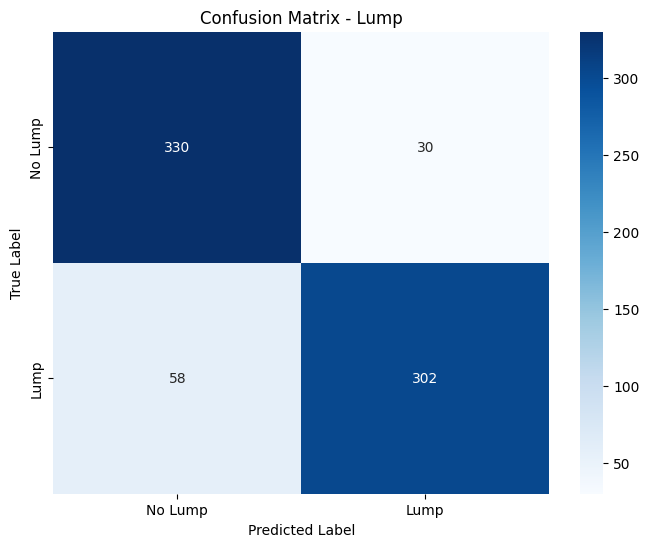


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.85      0.92      0.88       360
        Lump       0.91      0.84      0.87       360

    accuracy                           0.88       720
   macro avg       0.88      0.88      0.88       720
weighted avg       0.88      0.88      0.88       720


Confusion Matrix - Size:
[[ 75  17   6  22]
 [ 18  52  28  22]
 [  8   9  85  18]
 [  9   5  15 331]]


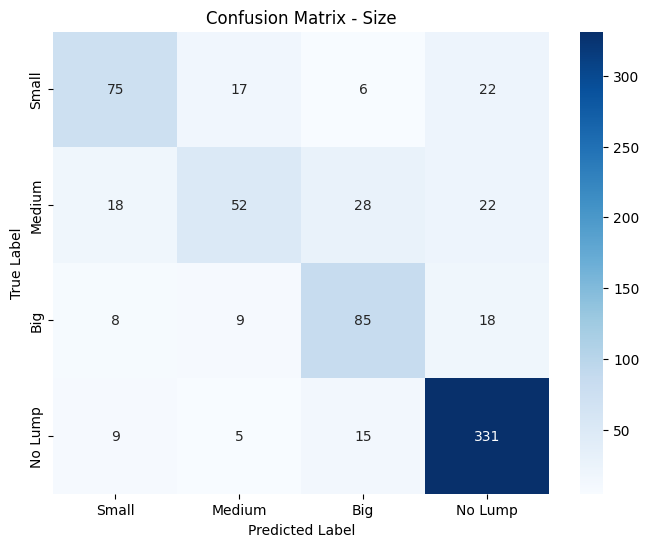


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.68      0.62      0.65       120
      Medium       0.63      0.43      0.51       120
         Big       0.63      0.71      0.67       120
     No Lump       0.84      0.92      0.88       360

    accuracy                           0.75       720
   macro avg       0.70      0.67      0.68       720
weighted avg       0.74      0.75      0.75       720


Confusion Matrix - Position:
[[ 42  34  19  25]
 [ 20  41  33  26]
 [ 18  18  59  25]
 [  7   9   9 335]]


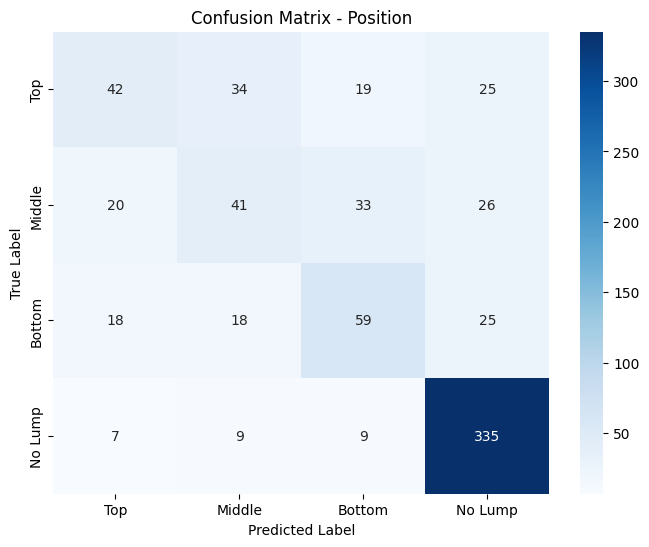


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.48      0.35      0.41       120
      Middle       0.40      0.34      0.37       120
      Bottom       0.49      0.49      0.49       120
     No Lump       0.82      0.93      0.87       360

    accuracy                           0.66       720
   macro avg       0.55      0.53      0.53       720
weighted avg       0.64      0.66      0.65       720


Testing on doctors' data without fine-tuning:


Test Accuracy - Lump: 0.5208, Size: 0.1944, Position: 0.1979

Confusion Matrix - Lump:
[[  7 137]
 [  1 143]]


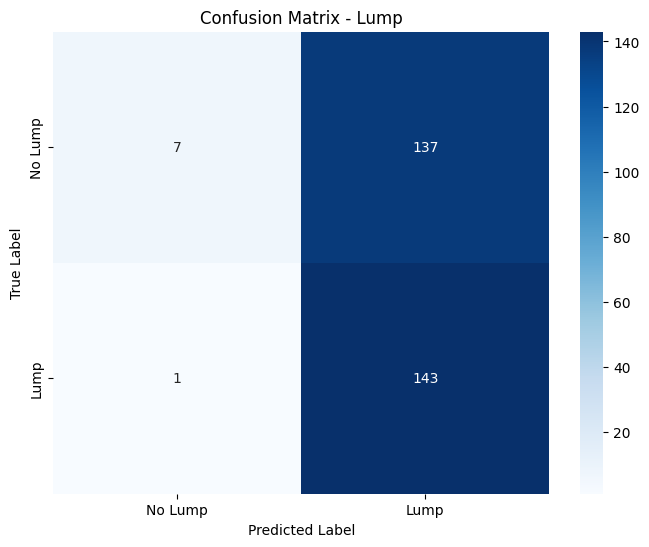


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.88      0.05      0.09       144
        Lump       0.51      0.99      0.67       144

    accuracy                           0.52       288
   macro avg       0.69      0.52      0.38       288
weighted avg       0.69      0.52      0.38       288


Confusion Matrix - Size:
[[  0   2  45   1]
 [  0   6  41   1]
 [  0   7  41   0]
 [  0   3 132   9]]


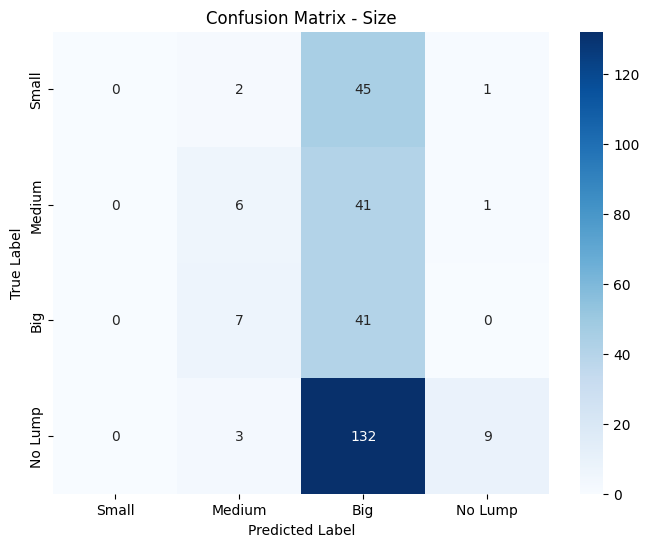


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.00      0.00      0.00        48
      Medium       0.33      0.12      0.18        48
         Big       0.16      0.85      0.27        48
     No Lump       0.82      0.06      0.12       144

    accuracy                           0.19       288
   macro avg       0.33      0.26      0.14       288
weighted avg       0.49      0.19      0.13       288


Confusion Matrix - Position:
[[  0   0  47   1]
 [  0   0  46   2]
 [  0   0  48   0]
 [  0   0 135   9]]


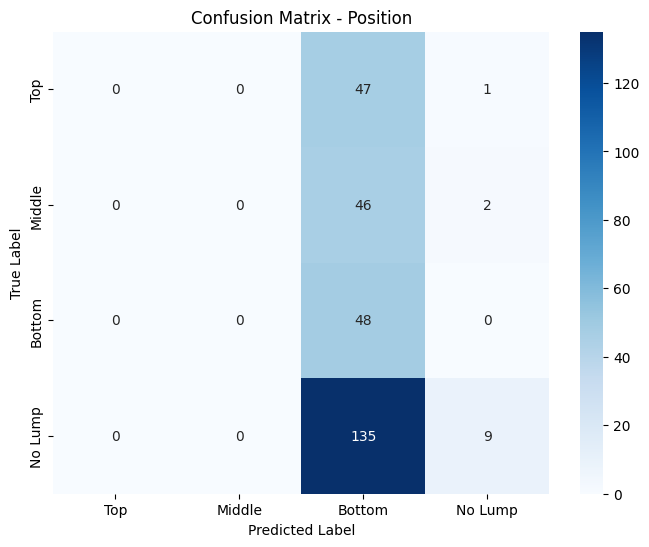


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.00      0.00      0.00        48
      Middle       0.00      0.00      0.00        48
      Bottom       0.17      1.00      0.30        48
     No Lump       0.75      0.06      0.12       144

    accuracy                           0.20       288
   macro avg       0.23      0.27      0.10       288
weighted avg       0.40      0.20      0.11       288


Fine-tuning with 1 additional trials from new dataset


Epoch 1, Training Loss: 1.6130, Validation Loss: 1.6851


Epoch 2, Training Loss: 1.6365, Validation Loss: 1.6874


Epoch 3, Training Loss: 1.6609, Validation Loss: 1.8150


Epoch 4, Training Loss: 1.6267, Validation Loss: 1.6819


Epoch 5, Training Loss: 1.5777, Validation Loss: 1.6777


Epoch 6, Training Loss: 1.5462, Validation Loss: 1.6633


Epoch 7, Training Loss: 1.5319, Validation Loss: 1.7920


Epoch 8, Training Loss: 1.5106, Validation Loss: 1.7957


Epoch 9, Training Loss: 1.4840, Validation Loss: 1.7497


Epoch 10, Training Loss: 1.5265, Validation Loss: 1.7630


Epoch 11, Training Loss: 1.4836, Validation Loss: 1.6624


Epoch 12, Training Loss: 1.4822, Validation Loss: 1.6985


Epoch 13, Training Loss: 1.4402, Validation Loss: 1.6016


Epoch 14, Training Loss: 1.4932, Validation Loss: 1.6658


Epoch 15, Training Loss: 1.4413, Validation Loss: 1.7108


Epoch 16, Training Loss: 1.4205, Validation Loss: 1.6475


Epoch 17, Training Loss: 1.4399, Validation Loss: 1.6220


Epoch 18, Training Loss: 1.3823, Validation Loss: 1.8328
Early stopping at epoch 18


Test Accuracy - Lump: 0.5104, Size: 0.1736, Position: 0.2188

Confusion Matrix - Lump:
[[  3 141]
 [  0 144]]


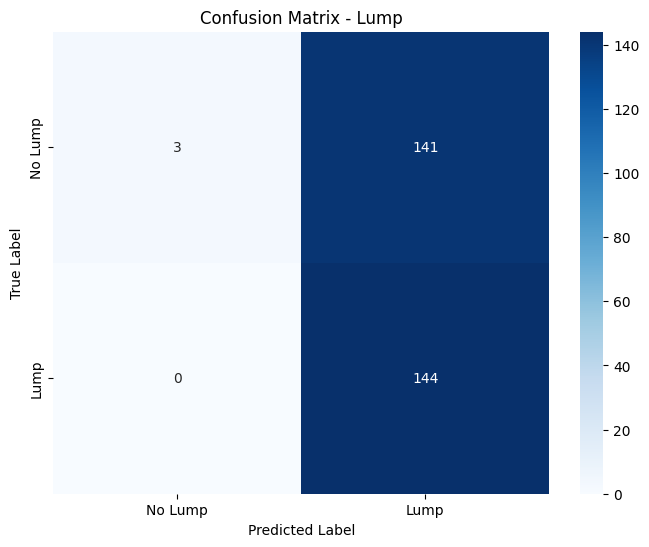


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       1.00      0.02      0.04       144
        Lump       0.51      1.00      0.67       144

    accuracy                           0.51       288
   macro avg       0.75      0.51      0.36       288
weighted avg       0.75      0.51      0.36       288


Confusion Matrix - Size:
[[  6  13  29   0]
 [  1  17  30   0]
 [  1  22  25   0]
 [  2  13 127   2]]


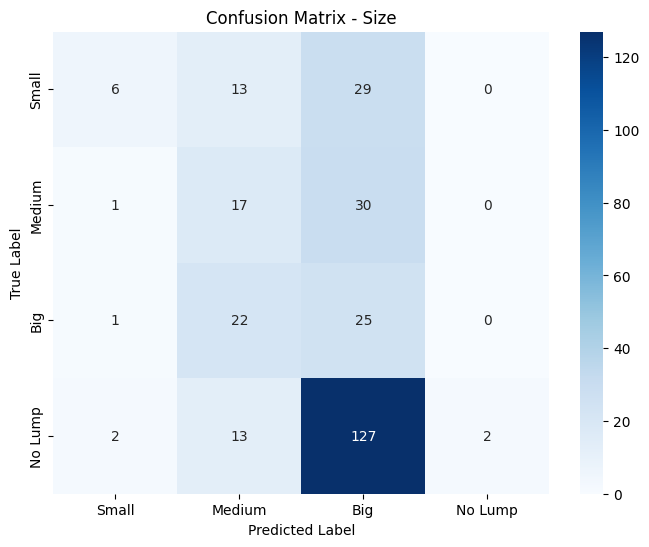


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.60      0.12      0.21        48
      Medium       0.26      0.35      0.30        48
         Big       0.12      0.52      0.19        48
     No Lump       1.00      0.01      0.03       144

    accuracy                           0.17       288
   macro avg       0.50      0.25      0.18       288
weighted avg       0.66      0.17      0.13       288


Confusion Matrix - Position:
[[27  2 19  0]
 [20  0 27  1]
 [26  1 21  0]
 [55  3 71 15]]


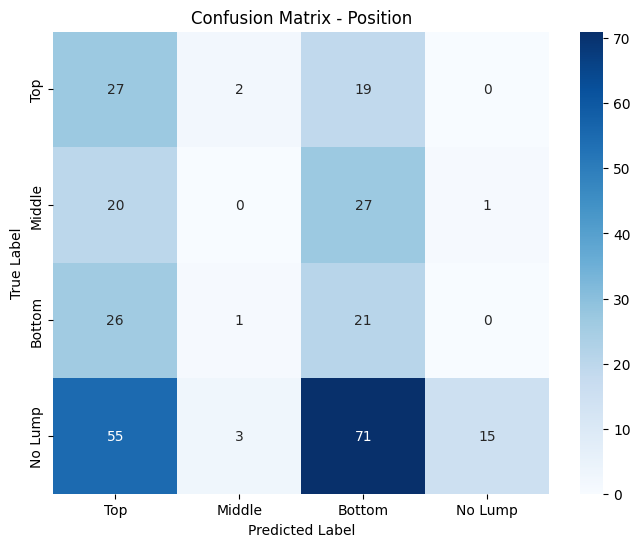


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.21      0.56      0.31        48
      Middle       0.00      0.00      0.00        48
      Bottom       0.15      0.44      0.23        48
     No Lump       0.94      0.10      0.19       144

    accuracy                           0.22       288
   macro avg       0.33      0.28      0.18       288
weighted avg       0.53      0.22      0.18       288


Fine-tuning with 2 additional trials from new dataset


Epoch 1, Training Loss: 1.3599, Validation Loss: 1.6547


Epoch 2, Training Loss: 1.3372, Validation Loss: 1.6458


Epoch 3, Training Loss: 1.3629, Validation Loss: 1.6972


Epoch 4, Training Loss: 1.3280, Validation Loss: 1.6341


Epoch 5, Training Loss: 1.3117, Validation Loss: 1.5418


Epoch 6, Training Loss: 1.3212, Validation Loss: 1.5778


Epoch 7, Training Loss: 1.2928, Validation Loss: 1.6876


Epoch 8, Training Loss: 1.2810, Validation Loss: 1.5618


Epoch 9, Training Loss: 1.2317, Validation Loss: 1.6121


Epoch 10, Training Loss: 1.2733, Validation Loss: 1.6436
Early stopping at epoch 10


Test Accuracy - Lump: 0.6181, Size: 0.4236, Position: 0.2847

Confusion Matrix - Lump:
[[ 34 110]
 [  0 144]]


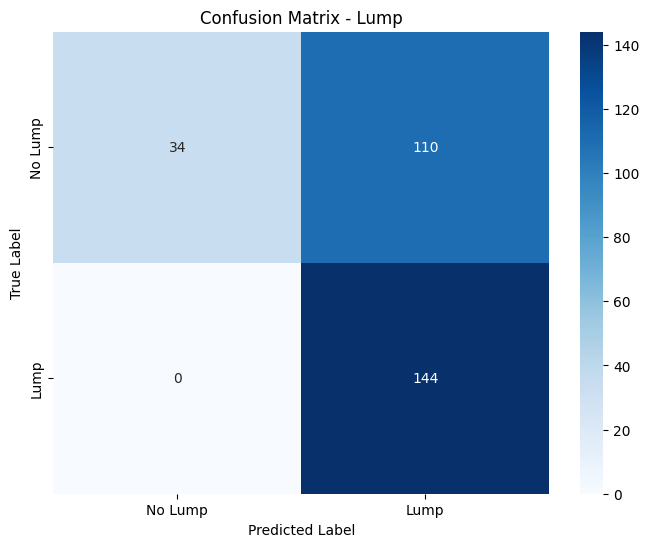


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       1.00      0.24      0.38       144
        Lump       0.57      1.00      0.72       144

    accuracy                           0.62       288
   macro avg       0.78      0.62      0.55       288
weighted avg       0.78      0.62      0.55       288


Confusion Matrix - Size:
[[22 12 14  0]
 [ 6 26 15  1]
 [ 7 29  9  3]
 [10 23 46 65]]


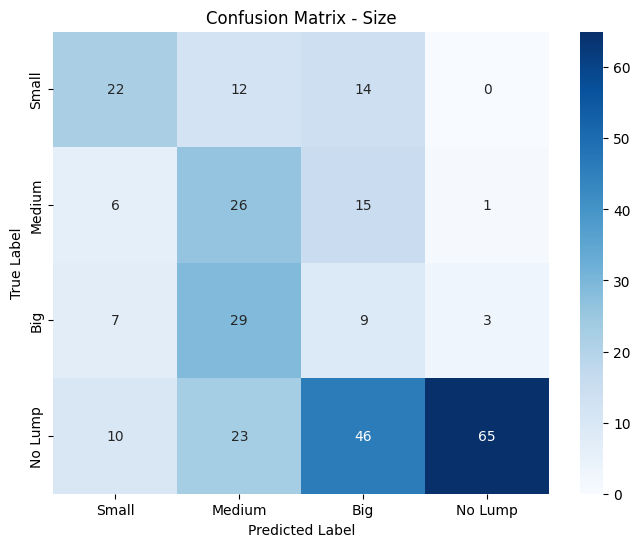


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.49      0.46      0.47        48
      Medium       0.29      0.54      0.38        48
         Big       0.11      0.19      0.14        48
     No Lump       0.94      0.45      0.61       144

    accuracy                           0.42       288
   macro avg       0.46      0.41      0.40       288
weighted avg       0.62      0.42      0.47       288


Confusion Matrix - Position:
[[ 8  0 40  0]
 [ 5  0 43  0]
 [ 8  0 40  0]
 [27  0 83 34]]


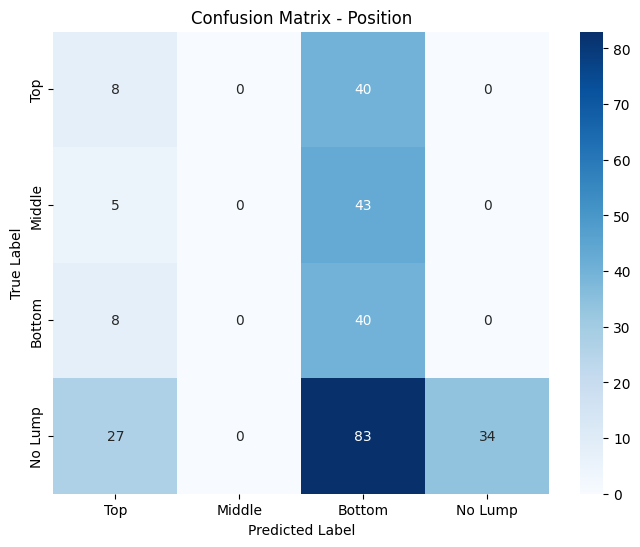


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.17      0.17      0.17        48
      Middle       0.00      0.00      0.00        48
      Bottom       0.19      0.83      0.31        48
     No Lump       1.00      0.24      0.38       144

    accuracy                           0.28       288
   macro avg       0.34      0.31      0.22       288
weighted avg       0.56      0.28      0.27       288


Fine-tuning with 3 additional trials from new dataset


Epoch 1, Training Loss: 1.3136, Validation Loss: 1.5358


Epoch 2, Training Loss: 1.2284, Validation Loss: 1.6604


Epoch 3, Training Loss: 1.2279, Validation Loss: 1.7622


Epoch 4, Training Loss: 1.2311, Validation Loss: 1.8264


Epoch 5, Training Loss: 1.2503, Validation Loss: 1.6331


Epoch 6, Training Loss: 1.2530, Validation Loss: 1.6945
Early stopping at epoch 6


Test Accuracy - Lump: 0.8542, Size: 0.5799, Position: 0.5625

Confusion Matrix - Lump:
[[116  28]
 [ 14 130]]


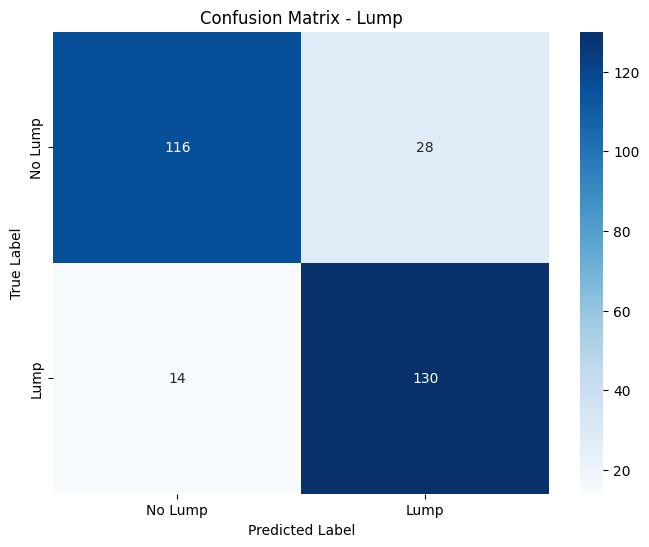


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.89      0.81      0.85       144
        Lump       0.82      0.90      0.86       144

    accuracy                           0.85       288
   macro avg       0.86      0.85      0.85       288
weighted avg       0.86      0.85      0.85       288


Confusion Matrix - Size:
[[ 34   2   9   3]
 [ 19  10  11   8]
 [ 20   5   9  14]
 [ 14   2  14 114]]


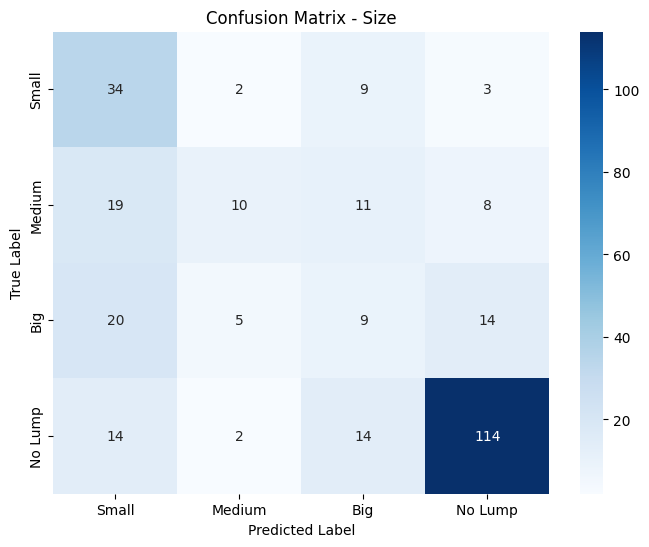


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.39      0.71      0.50        48
      Medium       0.53      0.21      0.30        48
         Big       0.21      0.19      0.20        48
     No Lump       0.82      0.79      0.81       144

    accuracy                           0.58       288
   macro avg       0.49      0.47      0.45       288
weighted avg       0.60      0.58      0.57       288


Confusion Matrix - Position:
[[ 22   1  17   8]
 [  8   0  30  10]
 [ 14   0  22  12]
 [ 21   0   5 118]]


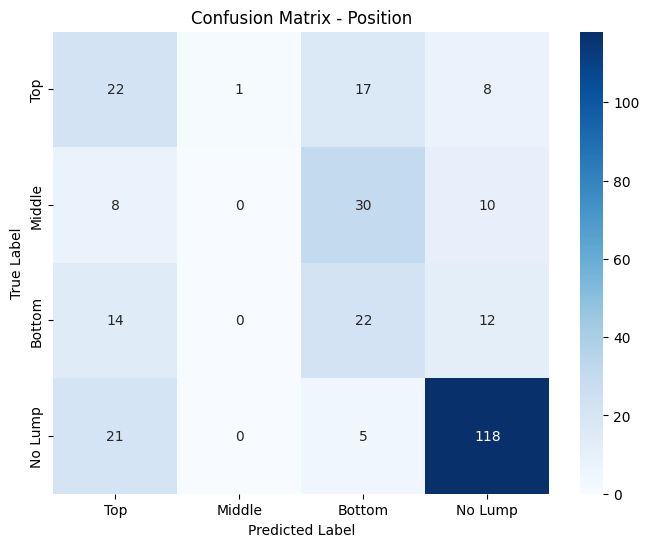


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.34      0.46      0.39        48
      Middle       0.00      0.00      0.00        48
      Bottom       0.30      0.46      0.36        48
     No Lump       0.80      0.82      0.81       144

    accuracy                           0.56       288
   macro avg       0.36      0.43      0.39       288
weighted avg       0.50      0.56      0.53       288


Fine-tuning with 4 additional trials from new dataset


Epoch 1, Training Loss: 1.2063, Validation Loss: 1.6443


Epoch 2, Training Loss: 1.1866, Validation Loss: 1.6232


Epoch 3, Training Loss: 1.2035, Validation Loss: 1.6507


Epoch 4, Training Loss: 1.1583, Validation Loss: 1.6981


Epoch 5, Training Loss: 1.1793, Validation Loss: 1.7669
Early stopping at epoch 5


Test Accuracy - Lump: 0.8368, Size: 0.6181, Position: 0.6215

Confusion Matrix - Lump:
[[109  35]
 [ 12 132]]


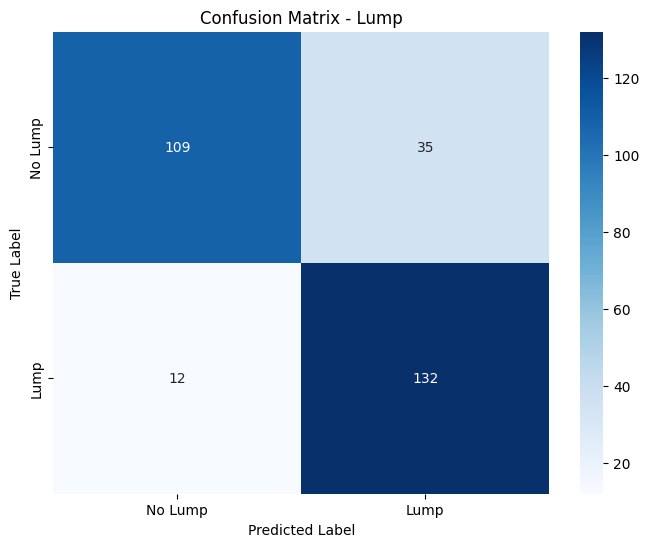


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.90      0.76      0.82       144
        Lump       0.79      0.92      0.85       144

    accuracy                           0.84       288
   macro avg       0.85      0.84      0.84       288
weighted avg       0.85      0.84      0.84       288


Confusion Matrix - Size:
[[ 29   1  17   1]
 [ 10  15  17   6]
 [ 15   5  15  13]
 [  9   0  16 119]]


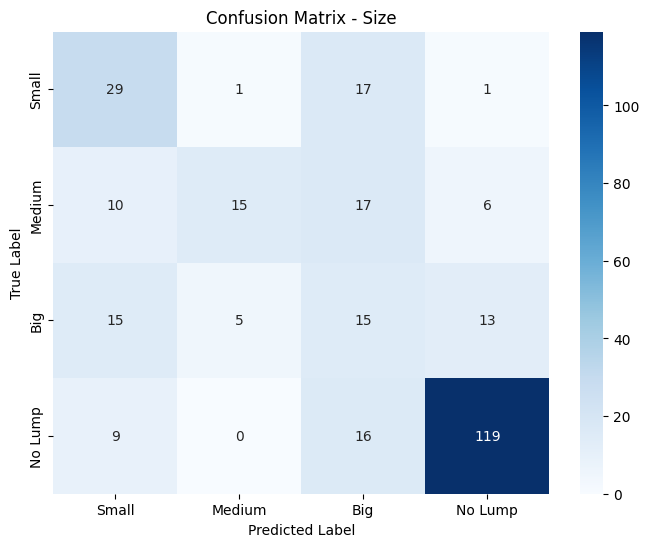


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.46      0.60      0.52        48
      Medium       0.71      0.31      0.43        48
         Big       0.23      0.31      0.27        48
     No Lump       0.86      0.83      0.84       144

    accuracy                           0.62       288
   macro avg       0.57      0.51      0.52       288
weighted avg       0.66      0.62      0.62       288


Confusion Matrix - Position:
[[ 27   5  11   5]
 [  7   8  25   8]
 [ 10  11  16  11]
 [  4   9   3 128]]


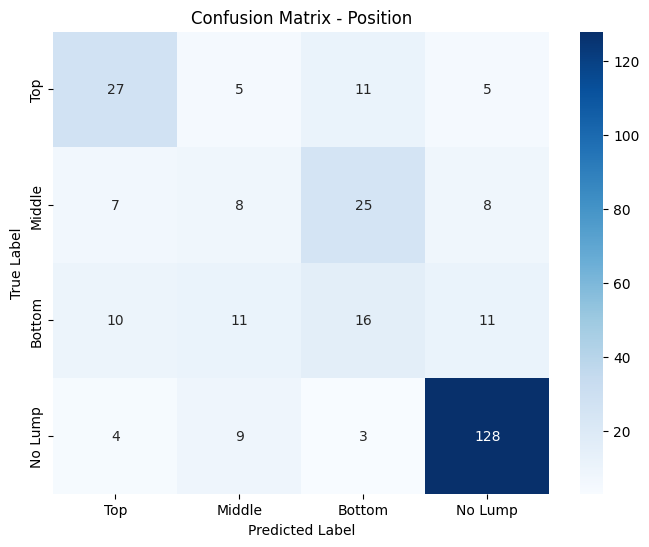


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.56      0.56      0.56        48
      Middle       0.24      0.17      0.20        48
      Bottom       0.29      0.33      0.31        48
     No Lump       0.84      0.89      0.86       144

    accuracy                           0.62       288
   macro avg       0.48      0.49      0.48       288
weighted avg       0.60      0.62      0.61       288


Fine-tuning with 5 additional trials from new dataset


Epoch 1, Training Loss: 1.1357, Validation Loss: 1.5614


Epoch 2, Training Loss: 1.1544, Validation Loss: 1.4963


Epoch 3, Training Loss: 1.2001, Validation Loss: 1.6105


Epoch 4, Training Loss: 1.1792, Validation Loss: 1.4373


Epoch 5, Training Loss: 1.1164, Validation Loss: 1.6258


Epoch 6, Training Loss: 1.1398, Validation Loss: 1.6452


Epoch 7, Training Loss: 1.1147, Validation Loss: 1.6608


Epoch 8, Training Loss: 1.1592, Validation Loss: 1.5530


Epoch 9, Training Loss: 1.0548, Validation Loss: 1.6424
Early stopping at epoch 9


Test Accuracy - Lump: 0.9028, Size: 0.6528, Position: 0.6389

Confusion Matrix - Lump:
[[131  13]
 [ 15 129]]


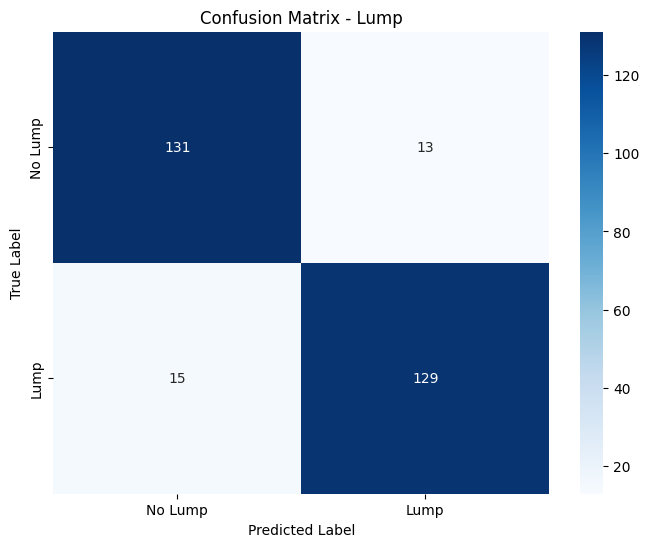


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.90      0.91      0.90       144
        Lump       0.91      0.90      0.90       144

    accuracy                           0.90       288
   macro avg       0.90      0.90      0.90       288
weighted avg       0.90      0.90      0.90       288


Confusion Matrix - Size:
[[ 26   1  19   2]
 [ 15   6  24   3]
 [  8   4  22  14]
 [  4   0   6 134]]


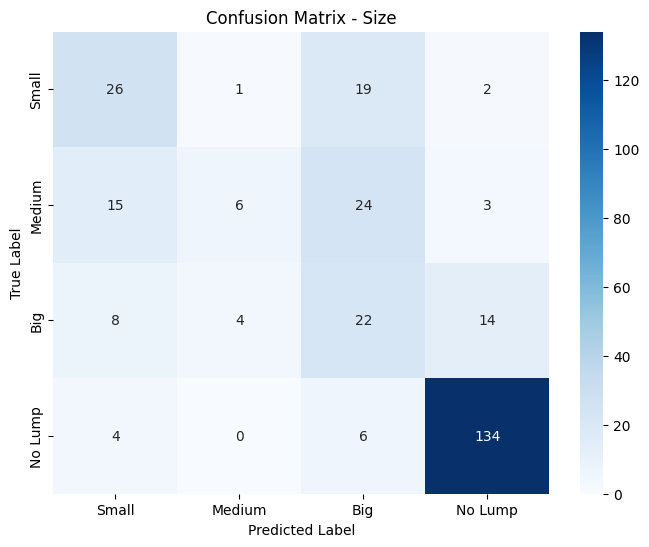


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.49      0.54      0.51        48
      Medium       0.55      0.12      0.20        48
         Big       0.31      0.46      0.37        48
     No Lump       0.88      0.93      0.90       144

    accuracy                           0.65       288
   macro avg       0.56      0.51      0.50       288
weighted avg       0.66      0.65      0.63       288


Confusion Matrix - Position:
[[ 28   5  13   2]
 [ 13   2  27   6]
 [ 15   1  21  11]
 [  3   2   6 133]]


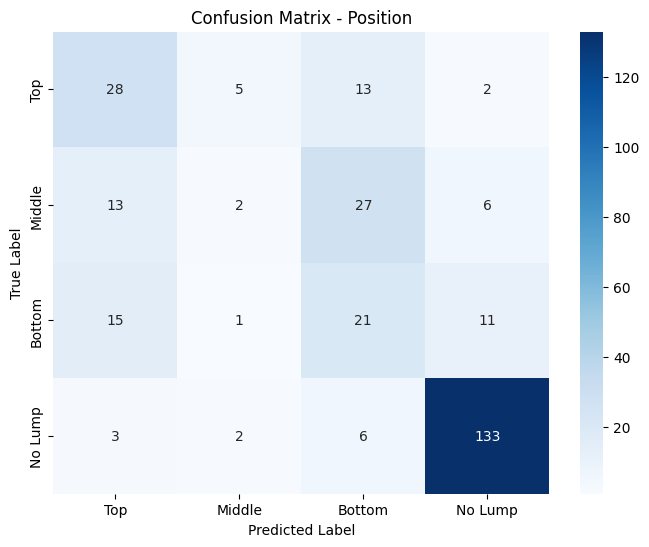


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.47      0.58      0.52        48
      Middle       0.20      0.04      0.07        48
      Bottom       0.31      0.44      0.37        48
     No Lump       0.88      0.92      0.90       144

    accuracy                           0.64       288
   macro avg       0.47      0.50      0.46       288
weighted avg       0.60      0.64      0.61       288



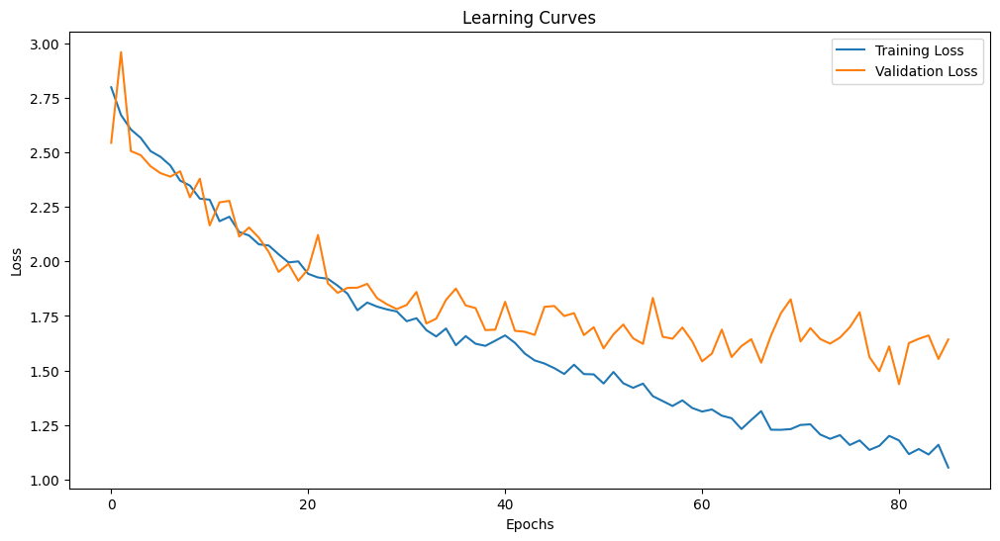

| Training Phase                         |   Lump Accuracy |   Size Accuracy |   Position Accuracy |
|:---------------------------------------|----------------:|----------------:|--------------------:|
| Initial Training                       |        0.877778 |        0.754167 |            0.6625   |
| Testing on doctors without fine-tuning |        0.520833 |        0.194444 |            0.197917 |
| Fine-tuning with 1 trials              |        0.510417 |        0.173611 |            0.21875  |
| Fine-tuning with 2 trials              |        0.618056 |        0.423611 |            0.284722 |
| Fine-tuning with 3 trials              |        0.854167 |        0.579861 |            0.5625   |
| Fine-tuning with 4 trials              |        0.836806 |        0.618056 |            0.621528 |
| Fine-tuning with 5 trials              |        0.902778 |        0.652778 |            0.638889 |

Running experiment with all sensors and 6 seconds
Using 6 GPUs
Initial Training and Evalua

Epoch 1, Training Loss: 2.8210, Validation Loss: 2.5132


Epoch 2, Training Loss: 2.6639, Validation Loss: 2.5333


Epoch 3, Training Loss: 2.6180, Validation Loss: 2.2958


Epoch 4, Training Loss: 2.5868, Validation Loss: 2.3936


Epoch 5, Training Loss: 2.4918, Validation Loss: 2.2571


Epoch 6, Training Loss: 2.4631, Validation Loss: 2.3352


Epoch 7, Training Loss: 2.3933, Validation Loss: 2.4208


Epoch 8, Training Loss: 2.3593, Validation Loss: 2.1521


Epoch 9, Training Loss: 2.3045, Validation Loss: 2.2545


Epoch 10, Training Loss: 2.3119, Validation Loss: 2.1481


Epoch 11, Training Loss: 2.2640, Validation Loss: 2.1025


Epoch 12, Training Loss: 2.2818, Validation Loss: 2.2095


Epoch 13, Training Loss: 2.2214, Validation Loss: 2.1103


Epoch 14, Training Loss: 2.1759, Validation Loss: 2.3188


Epoch 15, Training Loss: 2.1524, Validation Loss: 2.0629


Epoch 16, Training Loss: 2.1012, Validation Loss: 2.1311


Epoch 17, Training Loss: 2.0937, Validation Loss: 1.9684


Epoch 18, Training Loss: 2.0657, Validation Loss: 2.1670


Epoch 19, Training Loss: 2.0533, Validation Loss: 2.0685


Epoch 20, Training Loss: 2.0629, Validation Loss: 1.9080


Epoch 21, Training Loss: 2.0245, Validation Loss: 1.8972


Epoch 22, Training Loss: 1.9738, Validation Loss: 2.1103


Epoch 23, Training Loss: 1.9229, Validation Loss: 2.1247


Epoch 24, Training Loss: 1.8638, Validation Loss: 1.9254


Epoch 25, Training Loss: 1.8928, Validation Loss: 1.8751


Epoch 26, Training Loss: 1.8437, Validation Loss: 1.8309


Epoch 27, Training Loss: 1.8309, Validation Loss: 1.8351


Epoch 28, Training Loss: 1.8210, Validation Loss: 1.8032


Epoch 29, Training Loss: 1.8132, Validation Loss: 1.7919


Epoch 30, Training Loss: 1.7858, Validation Loss: 1.8014


Epoch 31, Training Loss: 1.7987, Validation Loss: 1.7495


Epoch 32, Training Loss: 1.7987, Validation Loss: 1.8994


Epoch 33, Training Loss: 1.7277, Validation Loss: 1.8581


Epoch 34, Training Loss: 1.7076, Validation Loss: 1.8680


Epoch 35, Training Loss: 1.6938, Validation Loss: 1.7506


Epoch 36, Training Loss: 1.7150, Validation Loss: 1.7349


Epoch 37, Training Loss: 1.6814, Validation Loss: 1.7285


Epoch 38, Training Loss: 1.6956, Validation Loss: 1.9006


Epoch 39, Training Loss: 1.6220, Validation Loss: 1.9220


Epoch 40, Training Loss: 1.6576, Validation Loss: 1.7384


Epoch 41, Training Loss: 1.5729, Validation Loss: 1.8377


Epoch 42, Training Loss: 1.5943, Validation Loss: 1.6803


Epoch 43, Training Loss: 1.5791, Validation Loss: 1.7372


Epoch 44, Training Loss: 1.5657, Validation Loss: 1.6298


Epoch 45, Training Loss: 1.5367, Validation Loss: 1.7451


Epoch 46, Training Loss: 1.4947, Validation Loss: 1.6192


Epoch 47, Training Loss: 1.5258, Validation Loss: 1.7916


Epoch 48, Training Loss: 1.5313, Validation Loss: 1.6904


Epoch 49, Training Loss: 1.5015, Validation Loss: 1.5912


Epoch 50, Training Loss: 1.4335, Validation Loss: 1.6933


Epoch 51, Training Loss: 1.4793, Validation Loss: 1.7287


Epoch 52, Training Loss: 1.4507, Validation Loss: 1.7900


Epoch 53, Training Loss: 1.4354, Validation Loss: 1.6009


Epoch 54, Training Loss: 1.4071, Validation Loss: 1.6725
Early stopping at epoch 54


Test Accuracy - Lump: 0.8847, Size: 0.7653, Position: 0.6944

Confusion Matrix - Lump:
[[332  28]
 [ 55 305]]


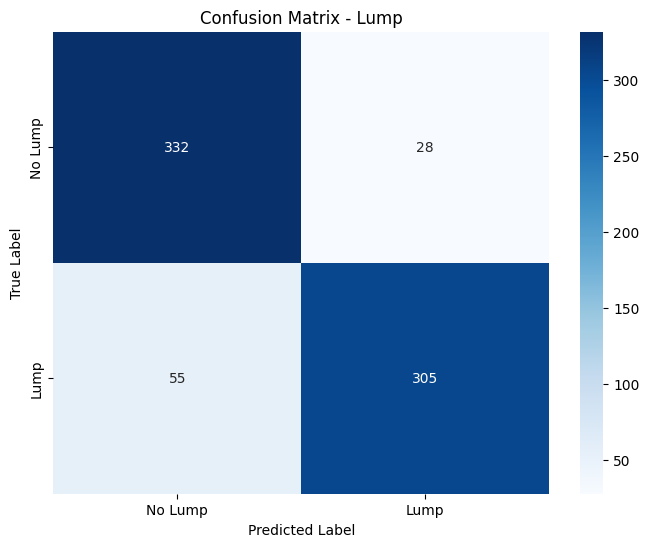


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.86      0.92      0.89       360
        Lump       0.92      0.85      0.88       360

    accuracy                           0.88       720
   macro avg       0.89      0.88      0.88       720
weighted avg       0.89      0.88      0.88       720


Confusion Matrix - Size:
[[ 84  12   4  20]
 [ 26  55  19  20]
 [  6  20  77  17]
 [  8   6  11 335]]


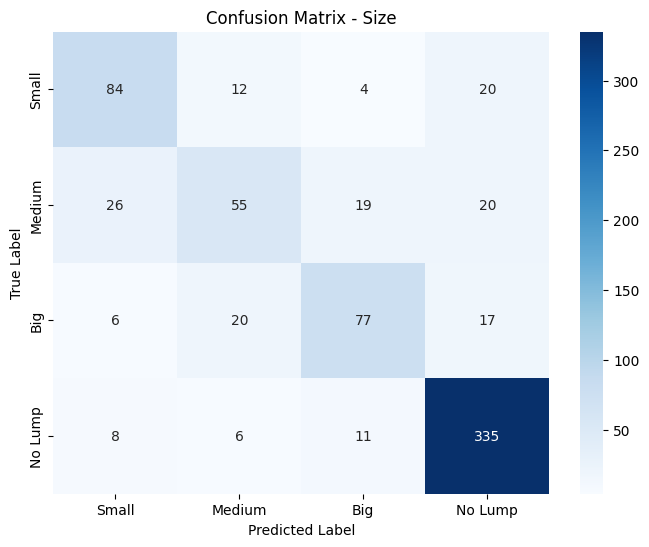


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.68      0.70      0.69       120
      Medium       0.59      0.46      0.52       120
         Big       0.69      0.64      0.67       120
     No Lump       0.85      0.93      0.89       360

    accuracy                           0.77       720
   macro avg       0.70      0.68      0.69       720
weighted avg       0.75      0.77      0.76       720


Confusion Matrix - Position:
[[ 53  33  15  19]
 [ 15  70  12  23]
 [ 22  36  40  22]
 [  6  12   5 337]]


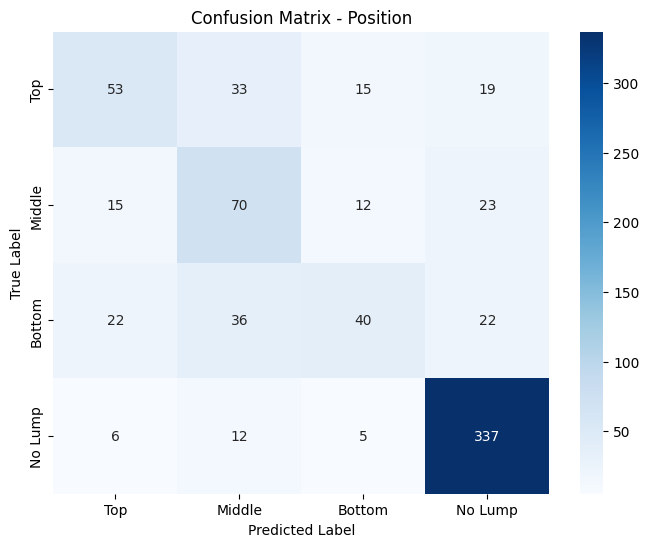


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.55      0.44      0.49       120
      Middle       0.46      0.58      0.52       120
      Bottom       0.56      0.33      0.42       120
     No Lump       0.84      0.94      0.89       360

    accuracy                           0.69       720
   macro avg       0.60      0.57      0.58       720
weighted avg       0.68      0.69      0.68       720


Testing on doctors' data without fine-tuning:


Test Accuracy - Lump: 0.4896, Size: 0.1840, Position: 0.1806

Confusion Matrix - Lump:
[[  8 136]
 [ 11 133]]


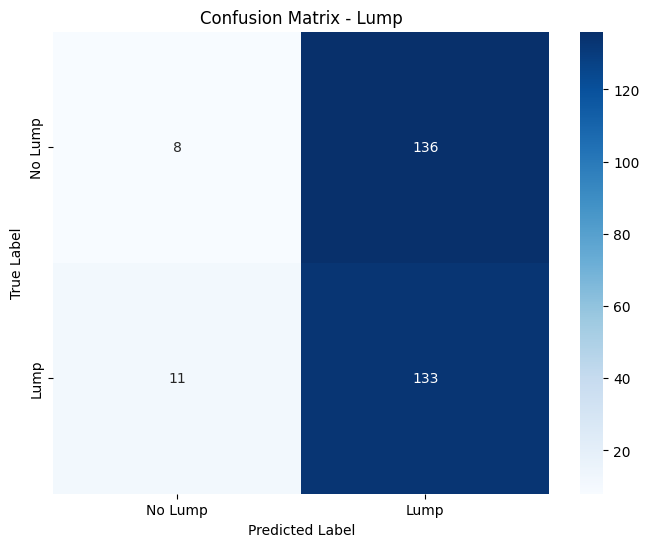


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.42      0.06      0.10       144
        Lump       0.49      0.92      0.64       144

    accuracy                           0.49       288
   macro avg       0.46      0.49      0.37       288
weighted avg       0.46      0.49      0.37       288


Confusion Matrix - Size:
[[  0   0  45   3]
 [  0   0  42   6]
 [  0   1  44   3]
 [  0   0 135   9]]


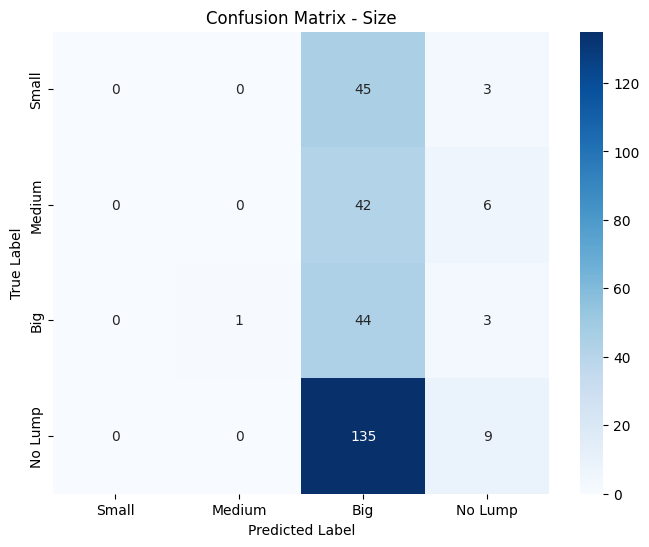


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.00      0.00      0.00        48
      Medium       0.00      0.00      0.00        48
         Big       0.17      0.92      0.28        48
     No Lump       0.43      0.06      0.11       144

    accuracy                           0.18       288
   macro avg       0.15      0.24      0.10       288
weighted avg       0.24      0.18      0.10       288


Confusion Matrix - Position:
[[ 1  0 44  3]
 [ 2  0 43  3]
 [ 3  0 43  2]
 [64  0 72  8]]


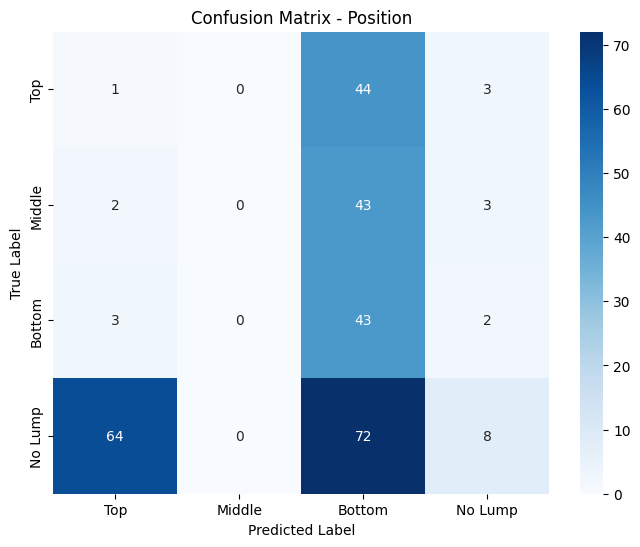


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.01      0.02      0.02        48
      Middle       0.00      0.00      0.00        48
      Bottom       0.21      0.90      0.34        48
     No Lump       0.50      0.06      0.10       144

    accuracy                           0.18       288
   macro avg       0.18      0.24      0.12       288
weighted avg       0.29      0.18      0.11       288


Fine-tuning with 1 additional trials from new dataset


Epoch 1, Training Loss: 1.4379, Validation Loss: 2.0312


Epoch 2, Training Loss: 1.4618, Validation Loss: 1.6415


Epoch 3, Training Loss: 1.4129, Validation Loss: 1.7328


Epoch 4, Training Loss: 1.4184, Validation Loss: 1.6797


Epoch 5, Training Loss: 1.3917, Validation Loss: 1.7400
Early stopping at epoch 5


Test Accuracy - Lump: 0.5451, Size: 0.5035, Position: 0.5208

Confusion Matrix - Lump:
[[139   5]
 [126  18]]


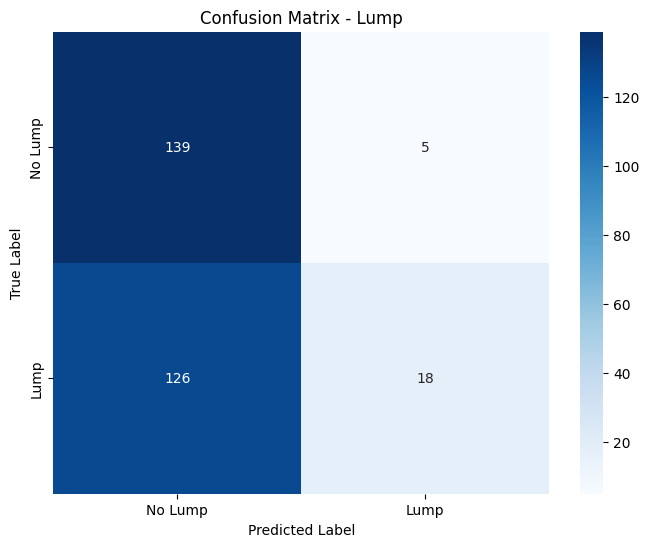


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.52      0.97      0.68       144
        Lump       0.78      0.12      0.22       144

    accuracy                           0.55       288
   macro avg       0.65      0.55      0.45       288
weighted avg       0.65      0.55      0.45       288


Confusion Matrix - Size:
[[  6   0   0  42]
 [  3   0   0  45]
 [  4   0   0  44]
 [  5   0   0 139]]


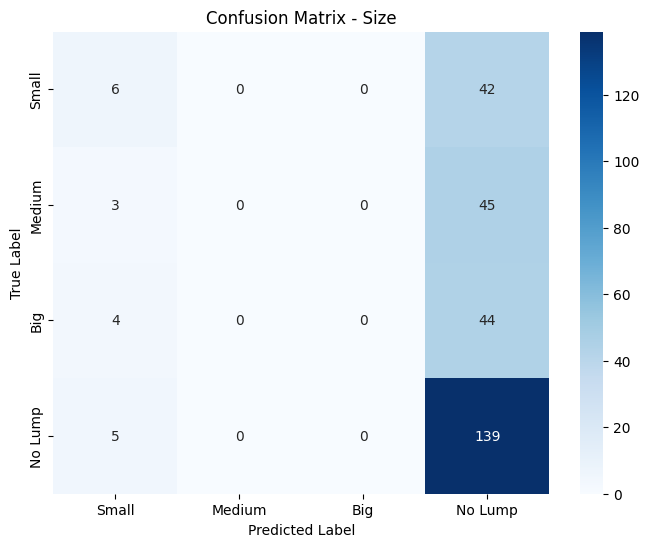


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.33      0.12      0.18        48
      Medium       0.00      0.00      0.00        48
         Big       0.00      0.00      0.00        48
     No Lump       0.51      0.97      0.67       144

    accuracy                           0.50       288
   macro avg       0.21      0.27      0.21       288
weighted avg       0.31      0.50      0.37       288


Confusion Matrix - Position:
[[  0   0   5  43]
 [  0   0   1  47]
 [  0   1   6  41]
 [  0   0   0 144]]


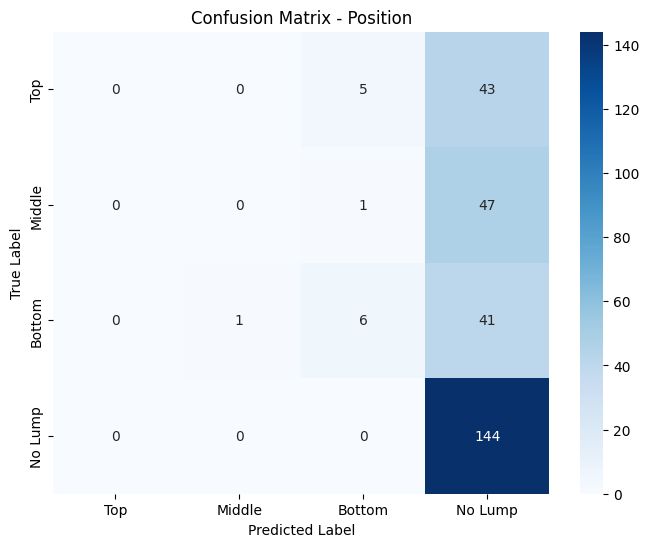


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.00      0.00      0.00        48
      Middle       0.00      0.00      0.00        48
      Bottom       0.50      0.12      0.20        48
     No Lump       0.52      1.00      0.69       144

    accuracy                           0.52       288
   macro avg       0.26      0.28      0.22       288
weighted avg       0.35      0.52      0.38       288


Fine-tuning with 2 additional trials from new dataset


Epoch 1, Training Loss: 1.4083, Validation Loss: 1.6703


Epoch 2, Training Loss: 1.3584, Validation Loss: 1.7144


Epoch 3, Training Loss: 1.3481, Validation Loss: 1.6462


Epoch 4, Training Loss: 1.3423, Validation Loss: 1.9083


Epoch 5, Training Loss: 1.3546, Validation Loss: 1.6462
Early stopping at epoch 5


Test Accuracy - Lump: 0.8056, Size: 0.5208, Position: 0.2222

Confusion Matrix - Lump:
[[ 96  48]
 [  8 136]]


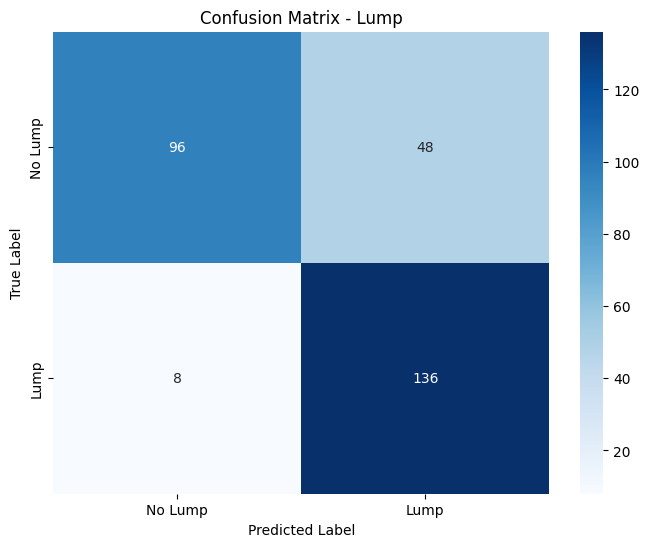


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.92      0.67      0.77       144
        Lump       0.74      0.94      0.83       144

    accuracy                           0.81       288
   macro avg       0.83      0.81      0.80       288
weighted avg       0.83      0.81      0.80       288


Confusion Matrix - Size:
[[ 13  25   5   5]
 [ 11  25   3   9]
 [  6  31   2   9]
 [  2  28   4 110]]


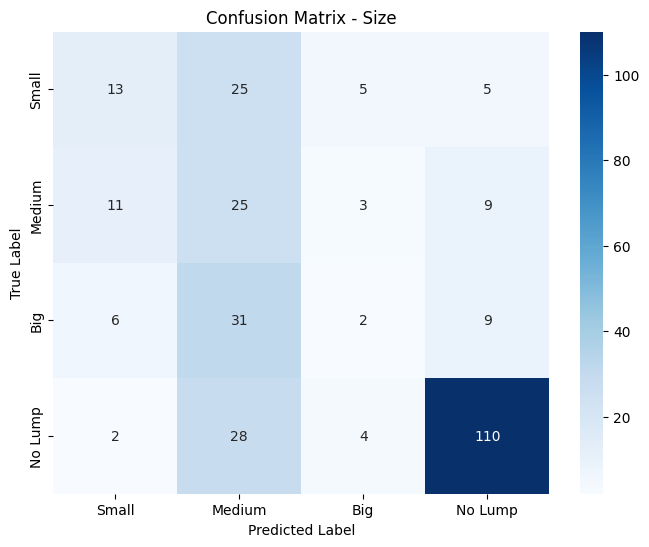


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.41      0.27      0.33        48
      Medium       0.23      0.52      0.32        48
         Big       0.14      0.04      0.06        48
     No Lump       0.83      0.76      0.79       144

    accuracy                           0.52       288
   macro avg       0.40      0.40      0.38       288
weighted avg       0.54      0.52      0.52       288


Confusion Matrix - Position:
[[15 23  5  5]
 [30 10  3  5]
 [33  9  4  2]
 [99 10  0 35]]


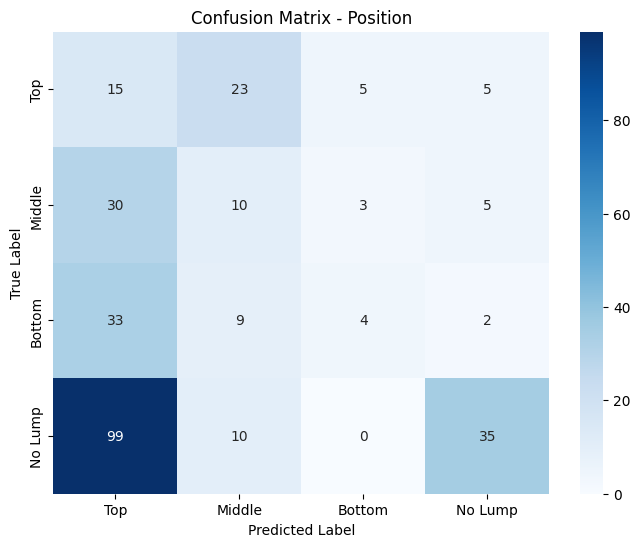


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.08      0.31      0.13        48
      Middle       0.19      0.21      0.20        48
      Bottom       0.33      0.08      0.13        48
     No Lump       0.74      0.24      0.37       144

    accuracy                           0.22       288
   macro avg       0.34      0.21      0.21       288
weighted avg       0.47      0.22      0.26       288


Fine-tuning with 3 additional trials from new dataset


Epoch 1, Training Loss: 1.3751, Validation Loss: 1.6182


Epoch 2, Training Loss: 1.3362, Validation Loss: 1.7241


Epoch 3, Training Loss: 1.3362, Validation Loss: 1.7078


Epoch 4, Training Loss: 1.3758, Validation Loss: 1.6823


Epoch 5, Training Loss: 1.2699, Validation Loss: 1.6067
Early stopping at epoch 5


Test Accuracy - Lump: 0.7326, Size: 0.4340, Position: 0.5278

Confusion Matrix - Lump:
[[135   9]
 [ 68  76]]


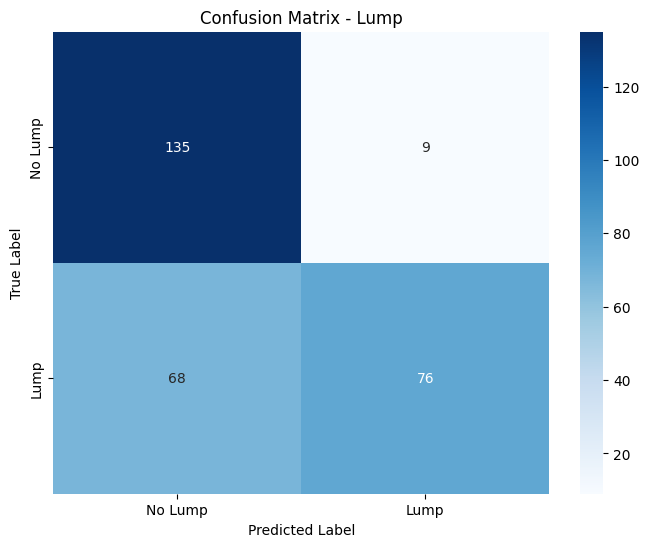


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.67      0.94      0.78       144
        Lump       0.89      0.53      0.66       144

    accuracy                           0.73       288
   macro avg       0.78      0.73      0.72       288
weighted avg       0.78      0.73      0.72       288


Confusion Matrix - Size:
[[  2   0  20  26]
 [  2   0  31  15]
 [  0   0  23  25]
 [  0   0  44 100]]


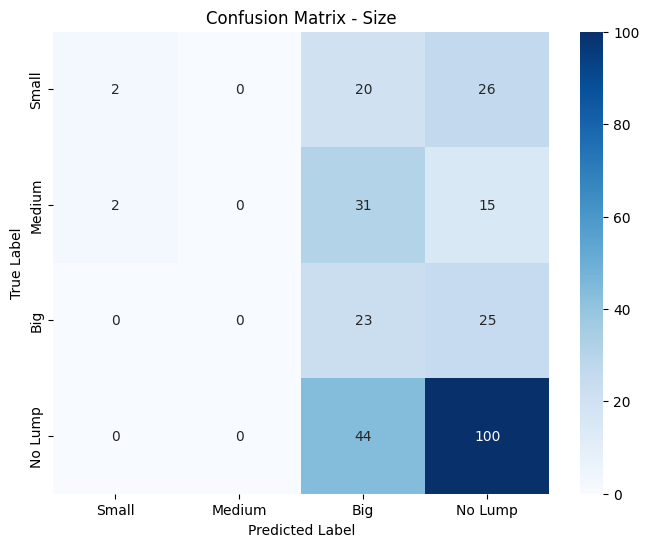


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.50      0.04      0.08        48
      Medium       0.00      0.00      0.00        48
         Big       0.19      0.48      0.28        48
     No Lump       0.60      0.69      0.65       144

    accuracy                           0.43       288
   macro avg       0.32      0.30      0.25       288
weighted avg       0.42      0.43      0.38       288


Confusion Matrix - Position:
[[ 11   6   7  24]
 [  9   0   2  37]
 [ 10   0   4  34]
 [  7   0   0 137]]


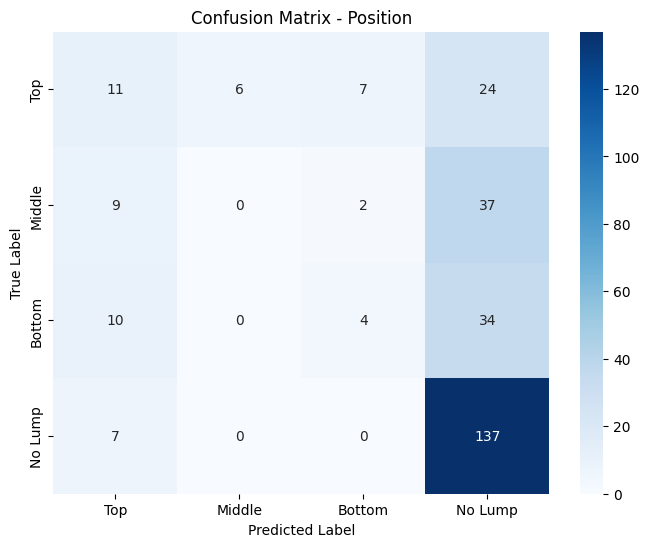


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.30      0.23      0.26        48
      Middle       0.00      0.00      0.00        48
      Bottom       0.31      0.08      0.13        48
     No Lump       0.59      0.95      0.73       144

    accuracy                           0.53       288
   macro avg       0.30      0.32      0.28       288
weighted avg       0.40      0.53      0.43       288


Fine-tuning with 4 additional trials from new dataset


Epoch 1, Training Loss: 1.2801, Validation Loss: 1.6575


Epoch 2, Training Loss: 1.2925, Validation Loss: 1.5933


Epoch 3, Training Loss: 1.2986, Validation Loss: 1.8596


Epoch 4, Training Loss: 1.2702, Validation Loss: 1.5732


Epoch 5, Training Loss: 1.2137, Validation Loss: 1.6551


Epoch 6, Training Loss: 1.2392, Validation Loss: 1.6233


Epoch 7, Training Loss: 1.2455, Validation Loss: 1.6857


Epoch 8, Training Loss: 1.2194, Validation Loss: 1.6344


Epoch 9, Training Loss: 1.1753, Validation Loss: 1.6896
Early stopping at epoch 9


Test Accuracy - Lump: 0.8542, Size: 0.5104, Position: 0.4444

Confusion Matrix - Lump:
[[117  27]
 [ 15 129]]


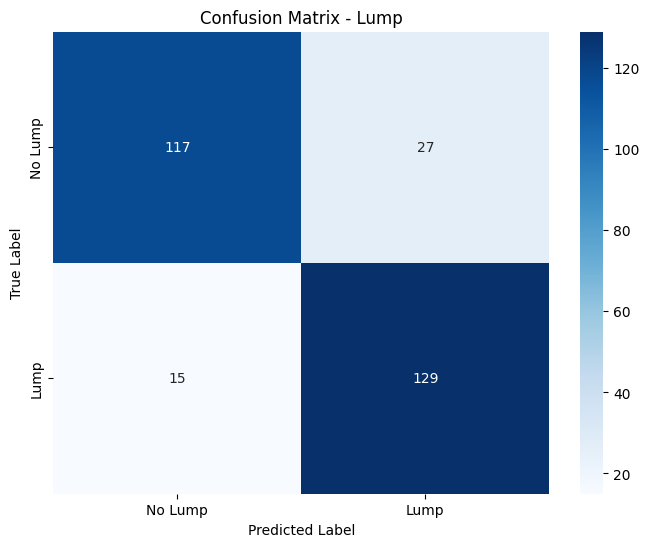


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.89      0.81      0.85       144
        Lump       0.83      0.90      0.86       144

    accuracy                           0.85       288
   macro avg       0.86      0.85      0.85       288
weighted avg       0.86      0.85      0.85       288


Confusion Matrix - Size:
[[20 25  2  1]
 [10 31  5  2]
 [11 16  1 20]
 [ 1  4 44 95]]


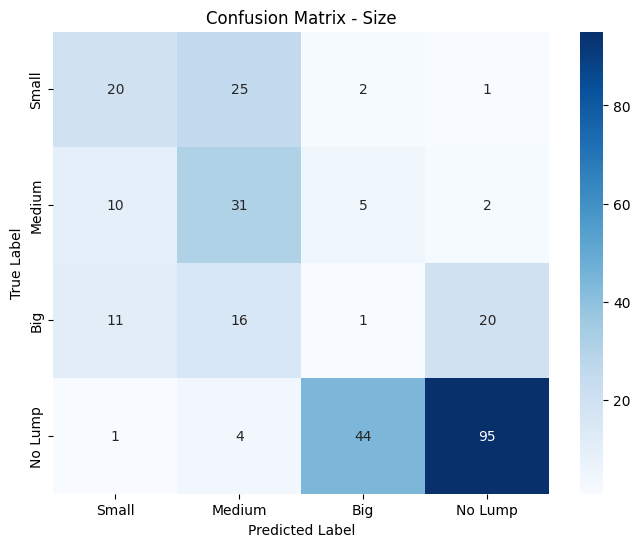


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.48      0.42      0.44        48
      Medium       0.41      0.65      0.50        48
         Big       0.02      0.02      0.02        48
     No Lump       0.81      0.66      0.73       144

    accuracy                           0.51       288
   macro avg       0.43      0.44      0.42       288
weighted avg       0.55      0.51      0.52       288


Confusion Matrix - Position:
[[  8  29   9   2]
 [ 19   6  12  11]
 [ 12  13  11  12]
 [ 39   1   1 103]]


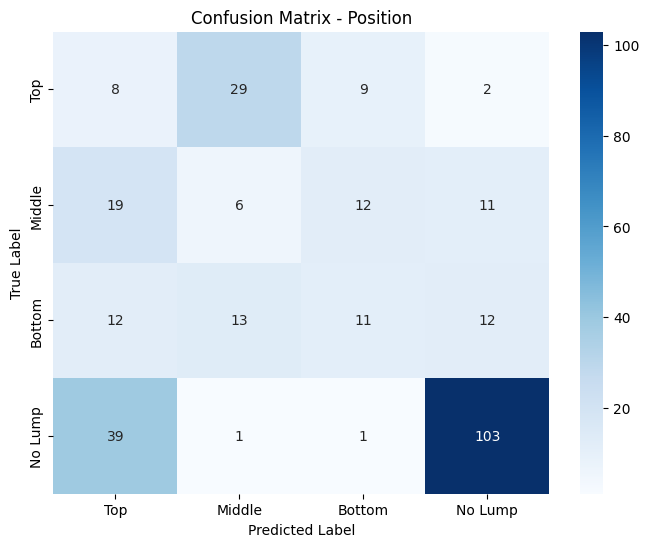


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.10      0.17      0.13        48
      Middle       0.12      0.12      0.12        48
      Bottom       0.33      0.23      0.27        48
     No Lump       0.80      0.72      0.76       144

    accuracy                           0.44       288
   macro avg       0.34      0.31      0.32       288
weighted avg       0.50      0.44      0.47       288


Fine-tuning with 5 additional trials from new dataset


Epoch 1, Training Loss: 1.1807, Validation Loss: 1.6288


Epoch 2, Training Loss: 1.2419, Validation Loss: 1.5973


Epoch 3, Training Loss: 1.1555, Validation Loss: 1.5861


Epoch 4, Training Loss: 1.1676, Validation Loss: 1.5708


Epoch 5, Training Loss: 1.1520, Validation Loss: 1.5142


Epoch 6, Training Loss: 1.1592, Validation Loss: 1.5404


Epoch 7, Training Loss: 1.1671, Validation Loss: 1.5283


Epoch 8, Training Loss: 1.1189, Validation Loss: 1.9770


Epoch 9, Training Loss: 1.1403, Validation Loss: 1.5819


Epoch 10, Training Loss: 1.1018, Validation Loss: 1.9309
Early stopping at epoch 10


Test Accuracy - Lump: 0.8889, Size: 0.6319, Position: 0.6389

Confusion Matrix - Lump:
[[129  15]
 [ 17 127]]


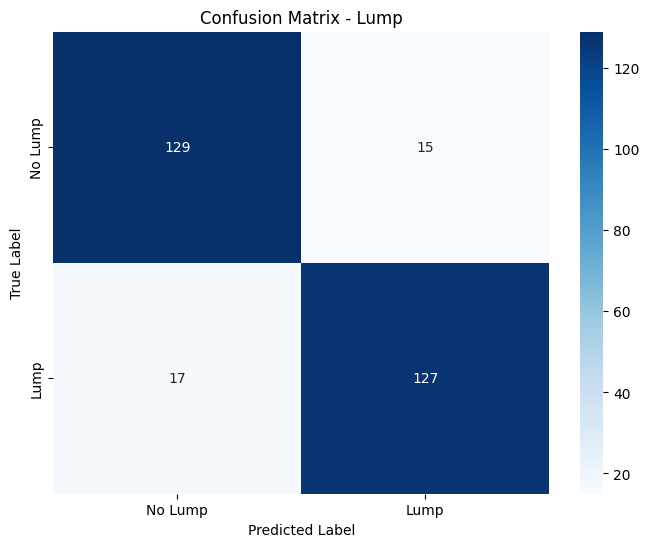


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.88      0.90      0.89       144
        Lump       0.89      0.88      0.89       144

    accuracy                           0.89       288
   macro avg       0.89      0.89      0.89       288
weighted avg       0.89      0.89      0.89       288


Confusion Matrix - Size:
[[ 16  11  20   1]
 [  7  15  22   4]
 [ 11   2  21  14]
 [  1   0  13 130]]


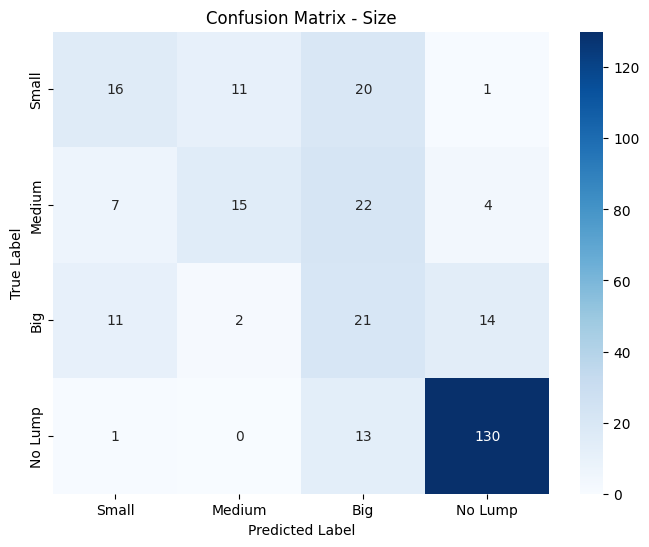


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.46      0.33      0.39        48
      Medium       0.54      0.31      0.39        48
         Big       0.28      0.44      0.34        48
     No Lump       0.87      0.90      0.89       144

    accuracy                           0.63       288
   macro avg       0.54      0.50      0.50       288
weighted avg       0.65      0.63      0.63       288


Confusion Matrix - Position:
[[  6  34   4   4]
 [  4  32   4   8]
 [  6  21  10  11]
 [  3   3   2 136]]


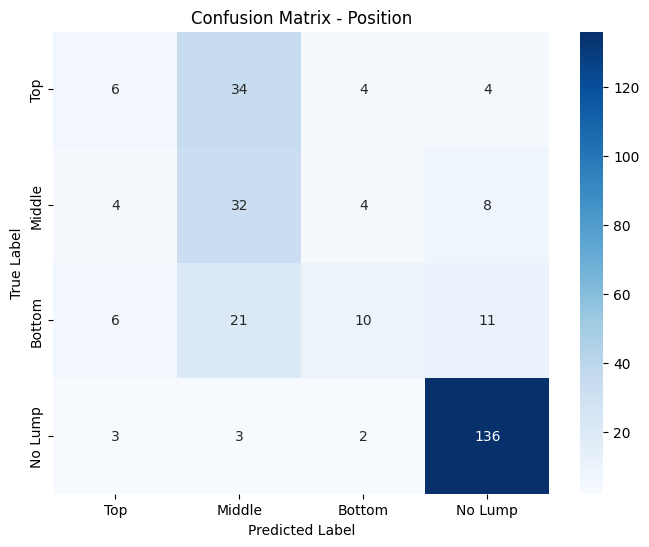


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.32      0.12      0.18        48
      Middle       0.36      0.67      0.46        48
      Bottom       0.50      0.21      0.29        48
     No Lump       0.86      0.94      0.90       144

    accuracy                           0.64       288
   macro avg       0.51      0.49      0.46       288
weighted avg       0.62      0.64      0.61       288



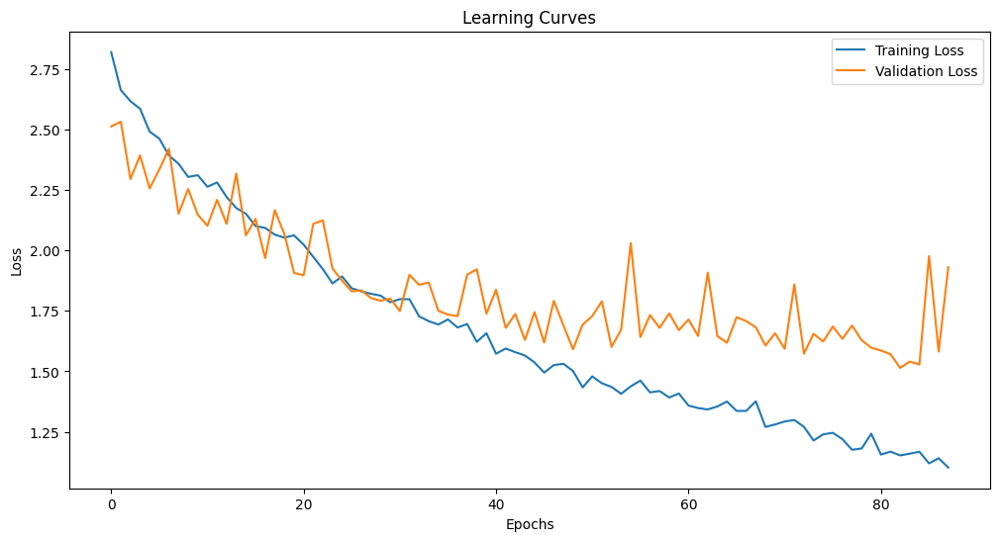

| Training Phase                         |   Lump Accuracy |   Size Accuracy |   Position Accuracy |
|:---------------------------------------|----------------:|----------------:|--------------------:|
| Initial Training                       |        0.884722 |        0.765278 |            0.694444 |
| Testing on doctors without fine-tuning |        0.489583 |        0.184028 |            0.180556 |
| Fine-tuning with 1 trials              |        0.545139 |        0.503472 |            0.520833 |
| Fine-tuning with 2 trials              |        0.805556 |        0.520833 |            0.222222 |
| Fine-tuning with 3 trials              |        0.732639 |        0.434028 |            0.527778 |
| Fine-tuning with 4 trials              |        0.854167 |        0.510417 |            0.444444 |
| Fine-tuning with 5 trials              |        0.888889 |        0.631944 |            0.638889 |

Running experiment with all sensors and 7 seconds
Using 6 GPUs
Initial Training and Evalua

Epoch 1, Training Loss: 2.7941, Validation Loss: 2.5917


Epoch 2, Training Loss: 2.6595, Validation Loss: 2.5395


Epoch 3, Training Loss: 2.5910, Validation Loss: 2.3320


Epoch 4, Training Loss: 2.5137, Validation Loss: 2.2911


Epoch 5, Training Loss: 2.4902, Validation Loss: 2.3090


Epoch 6, Training Loss: 2.4455, Validation Loss: 2.3387


Epoch 7, Training Loss: 2.4257, Validation Loss: 2.2739


Epoch 8, Training Loss: 2.3613, Validation Loss: 2.2491


Epoch 9, Training Loss: 2.3347, Validation Loss: 2.3047


Epoch 10, Training Loss: 2.2605, Validation Loss: 2.1111


Epoch 11, Training Loss: 2.2330, Validation Loss: 2.0572


Epoch 12, Training Loss: 2.2053, Validation Loss: 2.1148


Epoch 13, Training Loss: 2.1470, Validation Loss: 2.1860


Epoch 14, Training Loss: 2.1356, Validation Loss: 2.2241


Epoch 15, Training Loss: 2.0924, Validation Loss: 1.9749


Epoch 16, Training Loss: 2.0816, Validation Loss: 2.0050


Epoch 17, Training Loss: 1.9958, Validation Loss: 2.0440


Epoch 18, Training Loss: 2.0437, Validation Loss: 1.8770


Epoch 19, Training Loss: 1.9852, Validation Loss: 1.9158


Epoch 20, Training Loss: 1.9955, Validation Loss: 1.9216


Epoch 21, Training Loss: 1.9408, Validation Loss: 1.9669


Epoch 22, Training Loss: 1.9128, Validation Loss: 2.1525


Epoch 23, Training Loss: 1.9127, Validation Loss: 1.8766


Epoch 24, Training Loss: 1.8469, Validation Loss: 1.8242


Epoch 25, Training Loss: 1.8529, Validation Loss: 1.9363


Epoch 26, Training Loss: 1.8653, Validation Loss: 1.8426


Epoch 27, Training Loss: 1.8527, Validation Loss: 1.8424


Epoch 28, Training Loss: 1.7665, Validation Loss: 1.9567


Epoch 29, Training Loss: 1.8069, Validation Loss: 1.8702
Early stopping at epoch 29


Test Accuracy - Lump: 0.8764, Size: 0.7556, Position: 0.6514

Confusion Matrix - Lump:
[[322  38]
 [ 51 309]]


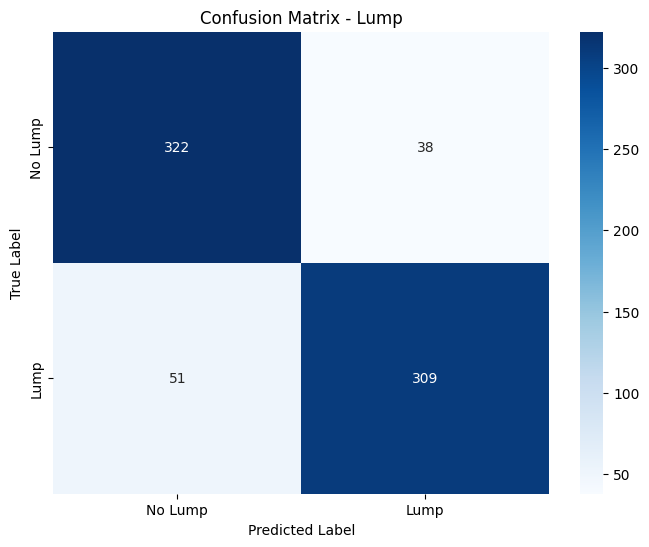


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.86      0.89      0.88       360
        Lump       0.89      0.86      0.87       360

    accuracy                           0.88       720
   macro avg       0.88      0.88      0.88       720
weighted avg       0.88      0.88      0.88       720


Confusion Matrix - Size:
[[ 81  13   7  19]
 [ 24  48  28  20]
 [  9   8  80  23]
 [  7   5  13 335]]


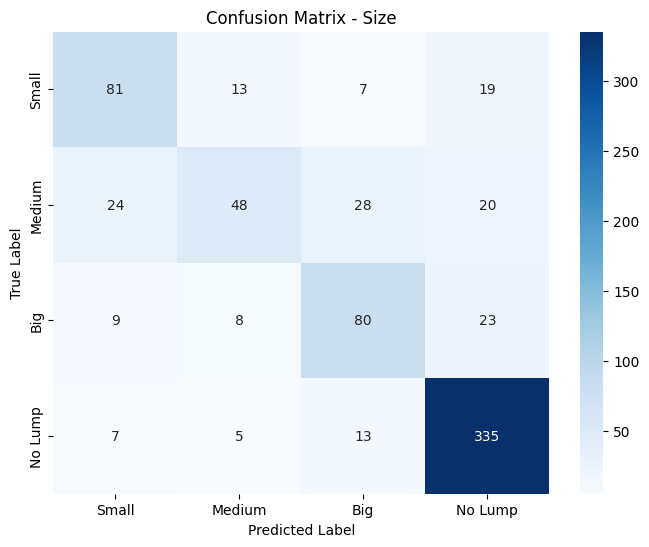


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.67      0.68      0.67       120
      Medium       0.65      0.40      0.49       120
         Big       0.62      0.67      0.65       120
     No Lump       0.84      0.93      0.89       360

    accuracy                           0.76       720
   macro avg       0.70      0.67      0.67       720
weighted avg       0.75      0.76      0.74       720


Confusion Matrix - Position:
[[ 38   9  40  33]
 [ 22  23  53  22]
 [ 15   9  73  23]
 [  3   2  20 335]]


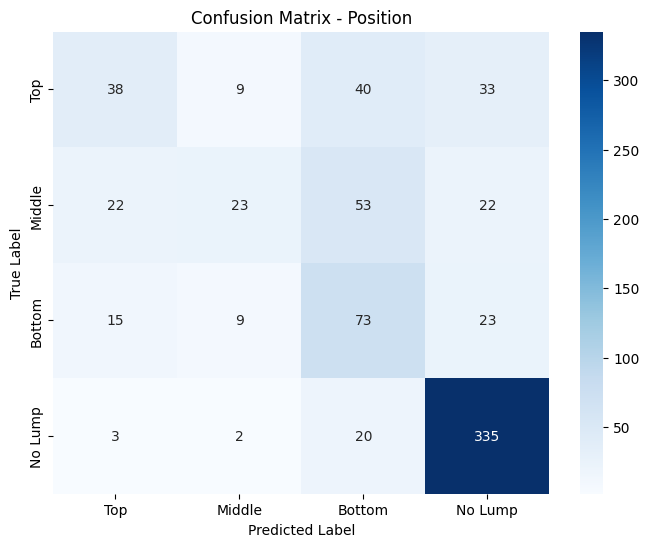


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.49      0.32      0.38       120
      Middle       0.53      0.19      0.28       120
      Bottom       0.39      0.61      0.48       120
     No Lump       0.81      0.93      0.87       360

    accuracy                           0.65       720
   macro avg       0.56      0.51      0.50       720
weighted avg       0.64      0.65      0.62       720


Testing on doctors' data without fine-tuning:


Test Accuracy - Lump: 0.4375, Size: 0.1944, Position: 0.1840

Confusion Matrix - Lump:
[[ 15 129]
 [ 33 111]]


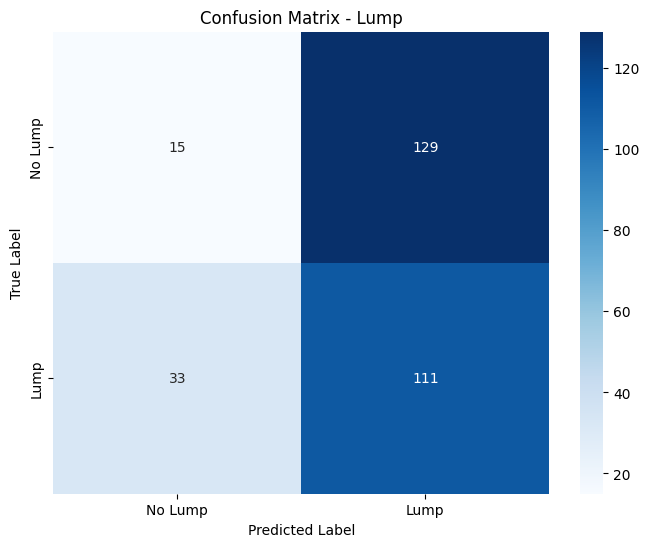


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.31      0.10      0.16       144
        Lump       0.46      0.77      0.58       144

    accuracy                           0.44       288
   macro avg       0.39      0.44      0.37       288
weighted avg       0.39      0.44      0.37       288


Confusion Matrix - Size:
[[  0   0  45   3]
 [  0   0  44   4]
 [  0   0  46   2]
 [  0   0 134  10]]


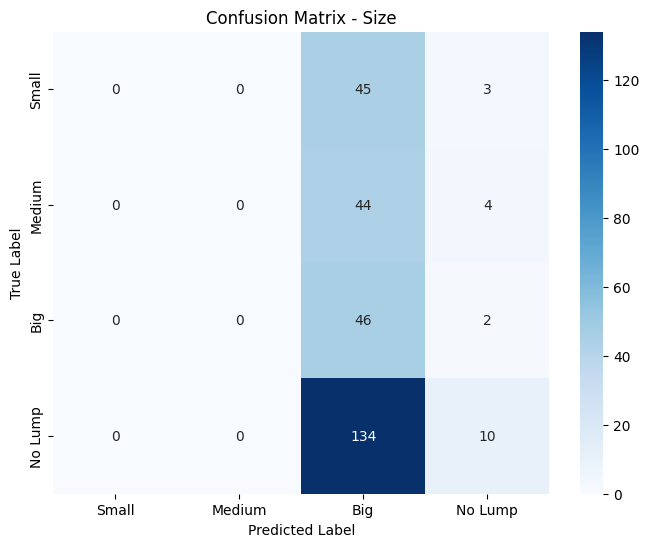


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.00      0.00      0.00        48
      Medium       0.00      0.00      0.00        48
         Big       0.17      0.96      0.29        48
     No Lump       0.53      0.07      0.12       144

    accuracy                           0.19       288
   macro avg       0.17      0.26      0.10       288
weighted avg       0.29      0.19      0.11       288


Confusion Matrix - Position:
[[  0   0  35  13]
 [  0   0  42   6]
 [  0   0  40   8]
 [  0   0 131  13]]


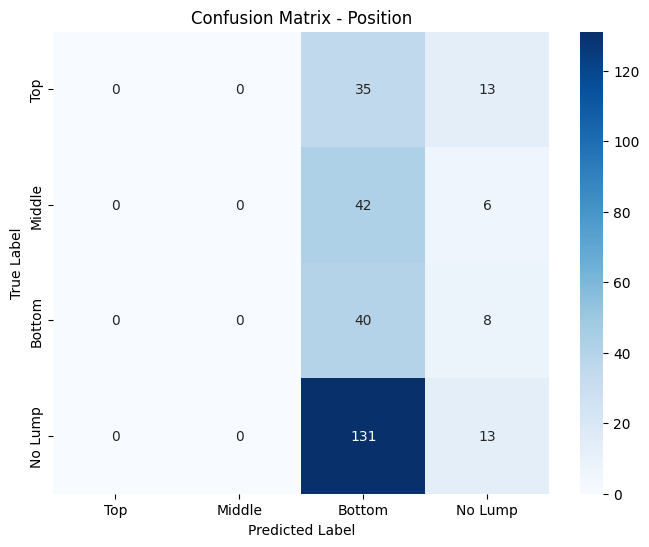


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.00      0.00      0.00        48
      Middle       0.00      0.00      0.00        48
      Bottom       0.16      0.83      0.27        48
     No Lump       0.33      0.09      0.14       144

    accuracy                           0.18       288
   macro avg       0.12      0.23      0.10       288
weighted avg       0.19      0.18      0.12       288


Fine-tuning with 1 additional trials from new dataset


Epoch 1, Training Loss: 1.8139, Validation Loss: 1.7723


Epoch 2, Training Loss: 1.7663, Validation Loss: 1.7618


Epoch 3, Training Loss: 1.7178, Validation Loss: 1.8807


Epoch 4, Training Loss: 1.7293, Validation Loss: 1.7338


Epoch 5, Training Loss: 1.6918, Validation Loss: 1.7281


Epoch 6, Training Loss: 1.6906, Validation Loss: 1.8007


Epoch 7, Training Loss: 1.6843, Validation Loss: 2.1652


Epoch 8, Training Loss: 1.6828, Validation Loss: 1.9471


Epoch 9, Training Loss: 1.6358, Validation Loss: 1.7394


Epoch 10, Training Loss: 1.6191, Validation Loss: 1.7389
Early stopping at epoch 10


Test Accuracy - Lump: 0.6701, Size: 0.2778, Position: 0.2812

Confusion Matrix - Lump:
[[ 55  89]
 [  6 138]]


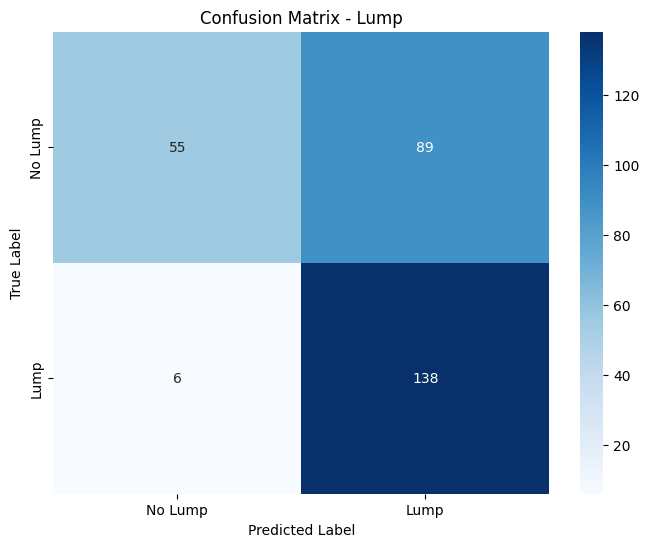


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.90      0.38      0.54       144
        Lump       0.61      0.96      0.74       144

    accuracy                           0.67       288
   macro avg       0.75      0.67      0.64       288
weighted avg       0.75      0.67      0.64       288


Confusion Matrix - Size:
[[ 21   0  26   1]
 [ 12   1  34   1]
 [ 19   0  25   4]
 [  7   0 104  33]]


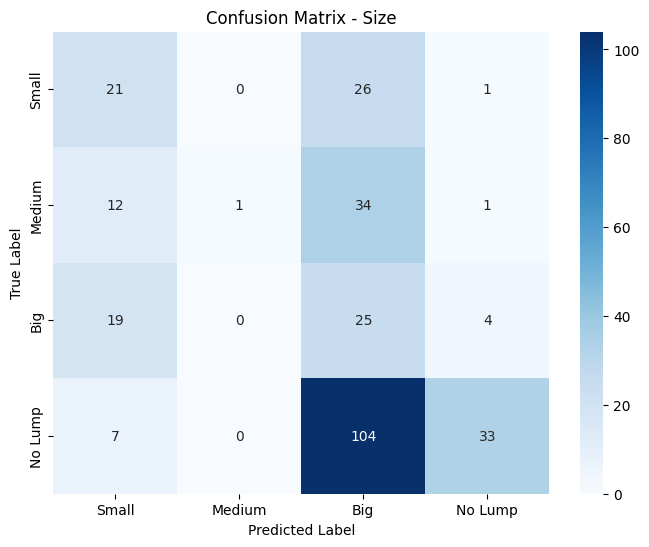


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.36      0.44      0.39        48
      Medium       1.00      0.02      0.04        48
         Big       0.13      0.52      0.21        48
     No Lump       0.85      0.23      0.36       144

    accuracy                           0.28       288
   macro avg       0.58      0.30      0.25       288
weighted avg       0.67      0.28      0.29       288


Confusion Matrix - Position:
[[11  6 29  2]
 [18  2 17 11]
 [19  2 14 13]
 [73  0 17 54]]


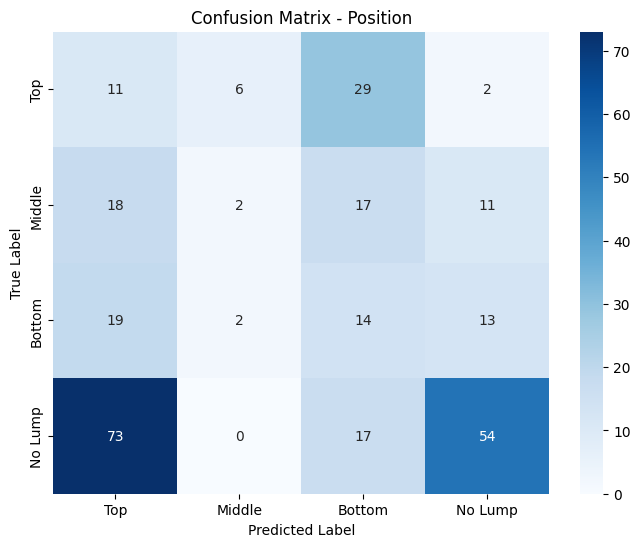


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.09      0.23      0.13        48
      Middle       0.20      0.04      0.07        48
      Bottom       0.18      0.29      0.22        48
     No Lump       0.68      0.38      0.48       144

    accuracy                           0.28       288
   macro avg       0.29      0.23      0.23       288
weighted avg       0.42      0.28      0.31       288


Fine-tuning with 2 additional trials from new dataset


Epoch 1, Training Loss: 1.6247, Validation Loss: 1.7967


Epoch 2, Training Loss: 1.6288, Validation Loss: 1.8972


Epoch 3, Training Loss: 1.6017, Validation Loss: 1.6948


Epoch 4, Training Loss: 1.5973, Validation Loss: 1.8200


Epoch 5, Training Loss: 1.5629, Validation Loss: 1.7918


Epoch 6, Training Loss: 1.5622, Validation Loss: 1.7990


Epoch 7, Training Loss: 1.5226, Validation Loss: 1.6929


Epoch 8, Training Loss: 1.5367, Validation Loss: 1.7573


Epoch 9, Training Loss: 1.5349, Validation Loss: 1.6998


Epoch 10, Training Loss: 1.5267, Validation Loss: 1.6302


Epoch 11, Training Loss: 1.4443, Validation Loss: 1.7026


Epoch 12, Training Loss: 1.4256, Validation Loss: 2.0732


Epoch 13, Training Loss: 1.4329, Validation Loss: 1.7200


Epoch 14, Training Loss: 1.4505, Validation Loss: 1.7414


Epoch 15, Training Loss: 1.4654, Validation Loss: 1.8077
Early stopping at epoch 15


Test Accuracy - Lump: 0.8056, Size: 0.5694, Position: 0.5729

Confusion Matrix - Lump:
[[132  12]
 [ 44 100]]


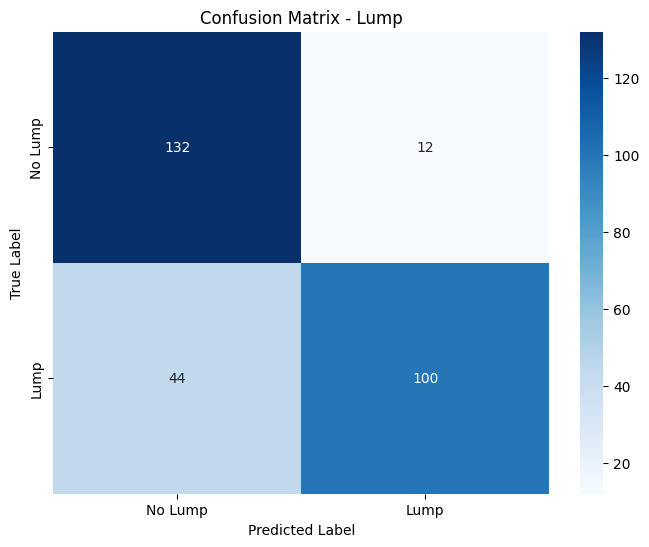


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.75      0.92      0.83       144
        Lump       0.89      0.69      0.78       144

    accuracy                           0.81       288
   macro avg       0.82      0.81      0.80       288
weighted avg       0.82      0.81      0.80       288


Confusion Matrix - Size:
[[  8   6  14  20]
 [  1  19  15  13]
 [  0   9  16  23]
 [  0   0  23 121]]


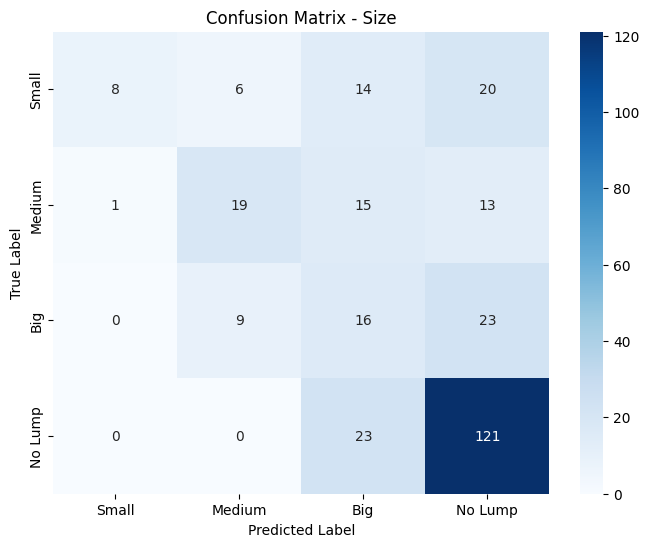


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.89      0.17      0.28        48
      Medium       0.56      0.40      0.46        48
         Big       0.24      0.33      0.28        48
     No Lump       0.68      0.84      0.75       144

    accuracy                           0.57       288
   macro avg       0.59      0.43      0.44       288
weighted avg       0.62      0.57      0.55       288


Confusion Matrix - Position:
[[  0  11  28   9]
 [  0  12  11  25]
 [  0  14  17  17]
 [  1   5   2 136]]


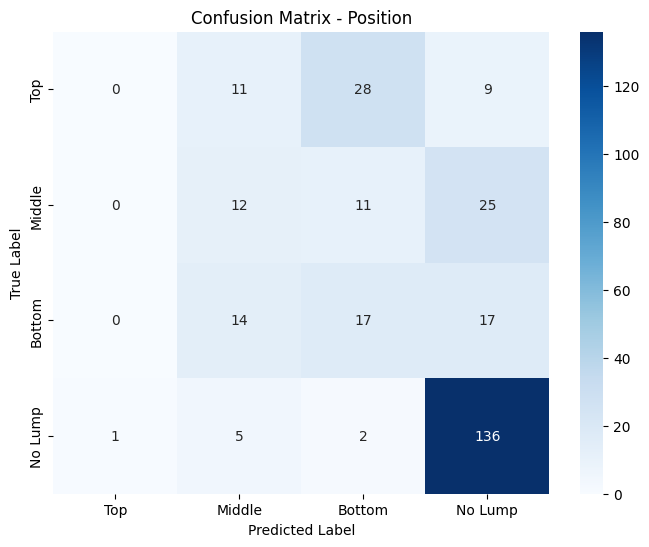


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.00      0.00      0.00        48
      Middle       0.29      0.25      0.27        48
      Bottom       0.29      0.35      0.32        48
     No Lump       0.73      0.94      0.82       144

    accuracy                           0.57       288
   macro avg       0.33      0.39      0.35       288
weighted avg       0.46      0.57      0.51       288


Fine-tuning with 3 additional trials from new dataset


Epoch 1, Training Loss: 1.4599, Validation Loss: 1.6592


Epoch 2, Training Loss: 1.3867, Validation Loss: 1.6357


Epoch 3, Training Loss: 1.3894, Validation Loss: 1.6620


Epoch 4, Training Loss: 1.3436, Validation Loss: 1.6882


Epoch 5, Training Loss: 1.3445, Validation Loss: 1.6791
Early stopping at epoch 5


Test Accuracy - Lump: 0.5556, Size: 0.2569, Position: 0.2465

Confusion Matrix - Lump:
[[ 16 128]
 [  0 144]]


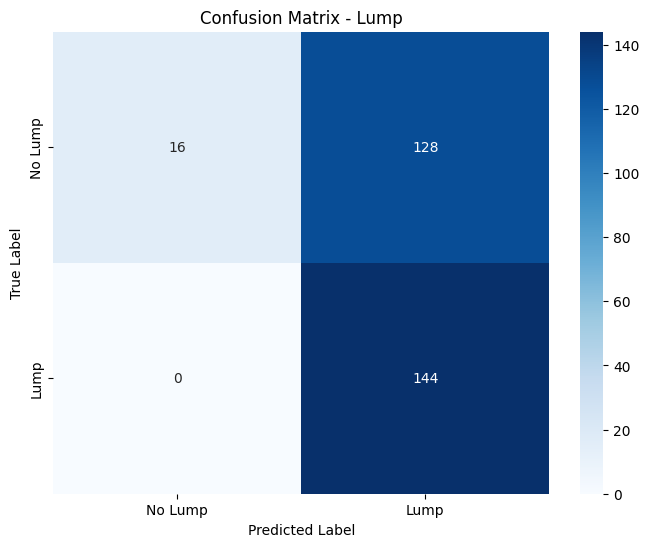


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       1.00      0.11      0.20       144
        Lump       0.53      1.00      0.69       144

    accuracy                           0.56       288
   macro avg       0.76      0.56      0.45       288
weighted avg       0.76      0.56      0.45       288


Confusion Matrix - Size:
[[  7   5  36   0]
 [  1   8  38   1]
 [  0   1  46   1]
 [  0   0 131  13]]


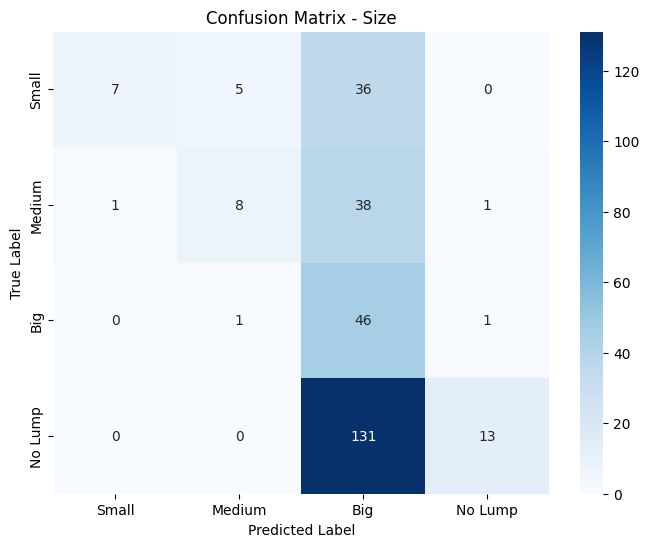


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.88      0.15      0.25        48
      Medium       0.57      0.17      0.26        48
         Big       0.18      0.96      0.31        48
     No Lump       0.87      0.09      0.16       144

    accuracy                           0.26       288
   macro avg       0.62      0.34      0.24       288
weighted avg       0.70      0.26      0.22       288


Confusion Matrix - Position:
[[  0   9  39   0]
 [  0   6  42   0]
 [  0   4  43   1]
 [  0   8 114  22]]


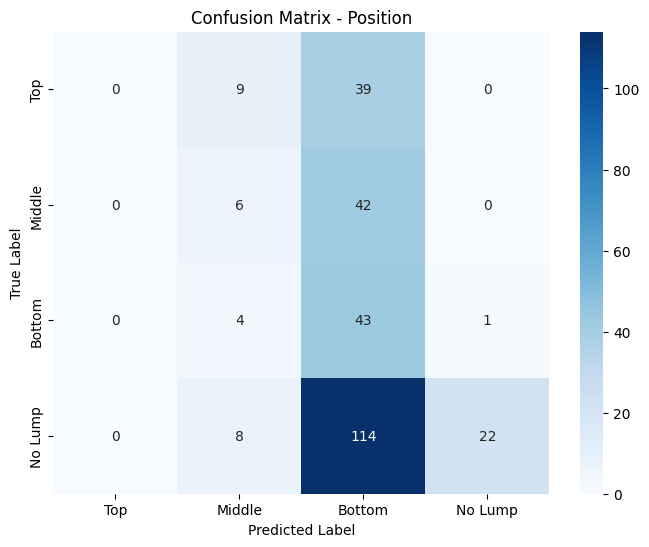


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.00      0.00      0.00        48
      Middle       0.22      0.12      0.16        48
      Bottom       0.18      0.90      0.30        48
     No Lump       0.96      0.15      0.26       144

    accuracy                           0.25       288
   macro avg       0.34      0.29      0.18       288
weighted avg       0.55      0.25      0.21       288


Fine-tuning with 4 additional trials from new dataset


Epoch 1, Training Loss: 1.3605, Validation Loss: 1.6729


Epoch 2, Training Loss: 1.3642, Validation Loss: 1.6161


Epoch 3, Training Loss: 1.3577, Validation Loss: 1.7293


Epoch 4, Training Loss: 1.3161, Validation Loss: 1.5596


Epoch 5, Training Loss: 1.3403, Validation Loss: 1.7271


Epoch 6, Training Loss: 1.2929, Validation Loss: 1.5837


Epoch 7, Training Loss: 1.3593, Validation Loss: 1.5535


Epoch 8, Training Loss: 1.2856, Validation Loss: 1.6290


Epoch 9, Training Loss: 1.3070, Validation Loss: 1.6408


Epoch 10, Training Loss: 1.2590, Validation Loss: 1.9688


Epoch 11, Training Loss: 1.2718, Validation Loss: 1.6158


Epoch 12, Training Loss: 1.2468, Validation Loss: 1.6390
Early stopping at epoch 12


Test Accuracy - Lump: 0.8854, Size: 0.6806, Position: 0.5938

Confusion Matrix - Lump:
[[133  11]
 [ 22 122]]


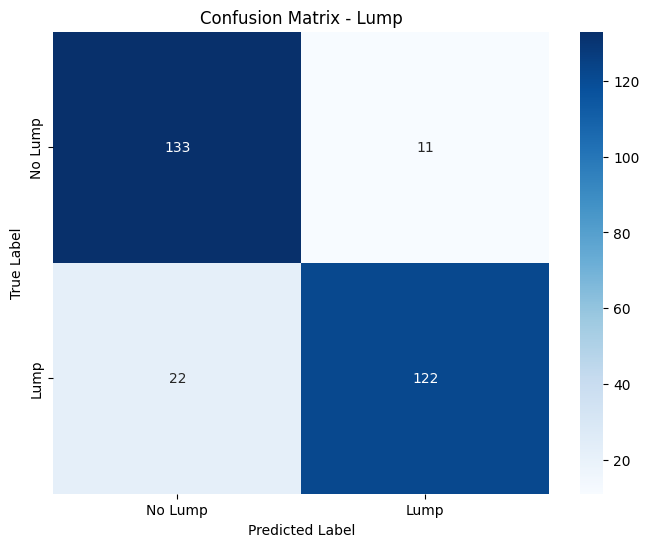


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.86      0.92      0.89       144
        Lump       0.92      0.85      0.88       144

    accuracy                           0.89       288
   macro avg       0.89      0.89      0.89       288
weighted avg       0.89      0.89      0.89       288


Confusion Matrix - Size:
[[ 32   1  11   4]
 [ 18   8  14   8]
 [  6   0  20  22]
 [  1   2   5 136]]


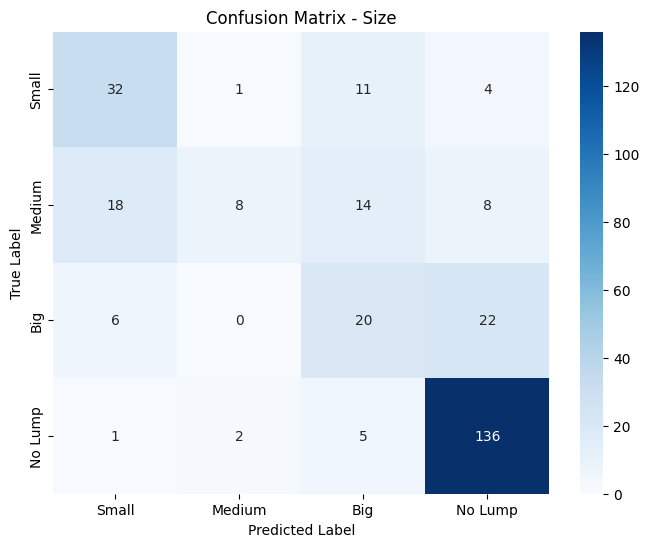


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.56      0.67      0.61        48
      Medium       0.73      0.17      0.27        48
         Big       0.40      0.42      0.41        48
     No Lump       0.80      0.94      0.87       144

    accuracy                           0.68       288
   macro avg       0.62      0.55      0.54       288
weighted avg       0.68      0.68      0.65       288


Confusion Matrix - Position:
[[  0  41   2   5]
 [  1  37   1   9]
 [  1  32   4  11]
 [  0  14   0 130]]


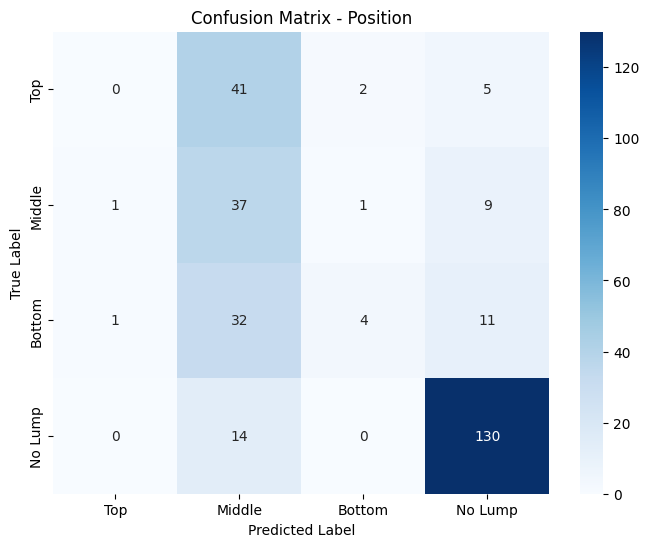


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.00      0.00      0.00        48
      Middle       0.30      0.77      0.43        48
      Bottom       0.57      0.08      0.15        48
     No Lump       0.84      0.90      0.87       144

    accuracy                           0.59       288
   macro avg       0.43      0.44      0.36       288
weighted avg       0.56      0.59      0.53       288


Fine-tuning with 5 additional trials from new dataset


Epoch 1, Training Loss: 1.2390, Validation Loss: 1.6841


Epoch 2, Training Loss: 1.2237, Validation Loss: 1.7032


Epoch 3, Training Loss: 1.2189, Validation Loss: 1.6072


Epoch 4, Training Loss: 1.2472, Validation Loss: 1.7233


Epoch 5, Training Loss: 1.2544, Validation Loss: 1.6145
Early stopping at epoch 5


Test Accuracy - Lump: 0.8021, Size: 0.5694, Position: 0.5729

Confusion Matrix - Lump:
[[ 94  50]
 [  7 137]]


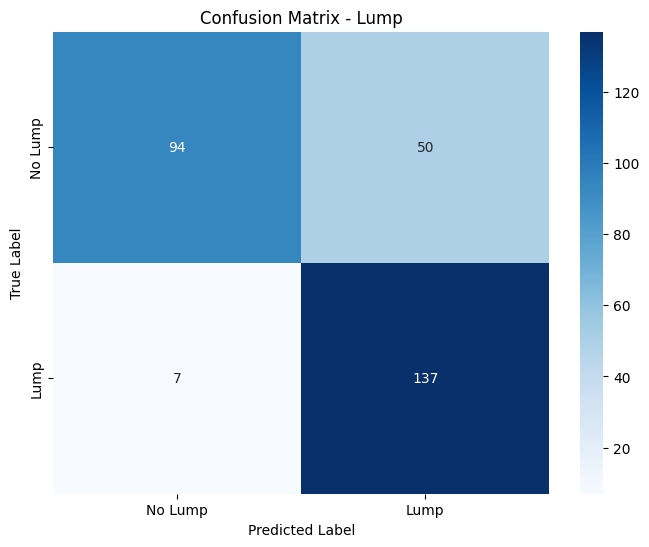


Classification Report - Lump:
              precision    recall  f1-score   support

     No Lump       0.93      0.65      0.77       144
        Lump       0.73      0.95      0.83       144

    accuracy                           0.80       288
   macro avg       0.83      0.80      0.80       288
weighted avg       0.83      0.80      0.80       288


Confusion Matrix - Size:
[[23 10 15  0]
 [ 7 27 12  2]
 [ 7  5 27  9]
 [ 0  8 49 87]]


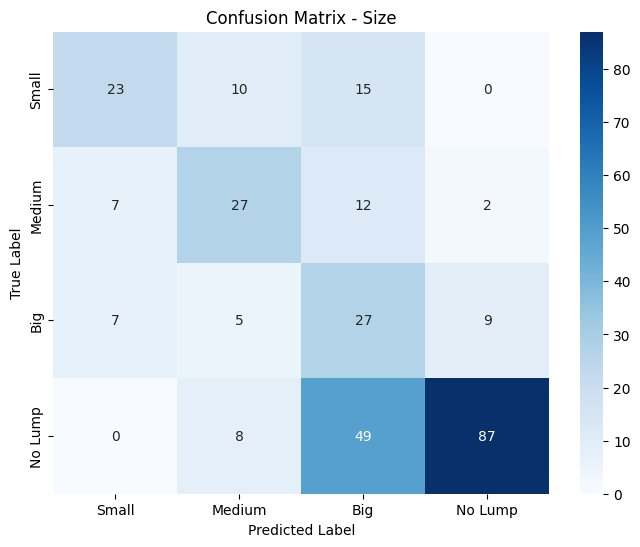


Classification Report - Size:
              precision    recall  f1-score   support

       Small       0.62      0.48      0.54        48
      Medium       0.54      0.56      0.55        48
         Big       0.26      0.56      0.36        48
     No Lump       0.89      0.60      0.72       144

    accuracy                           0.57       288
   macro avg       0.58      0.55      0.54       288
weighted avg       0.68      0.57      0.60       288


Confusion Matrix - Position:
[[  0  31  15   2]
 [  0  25  21   2]
 [  1  16  25   6]
 [  0  20   9 115]]


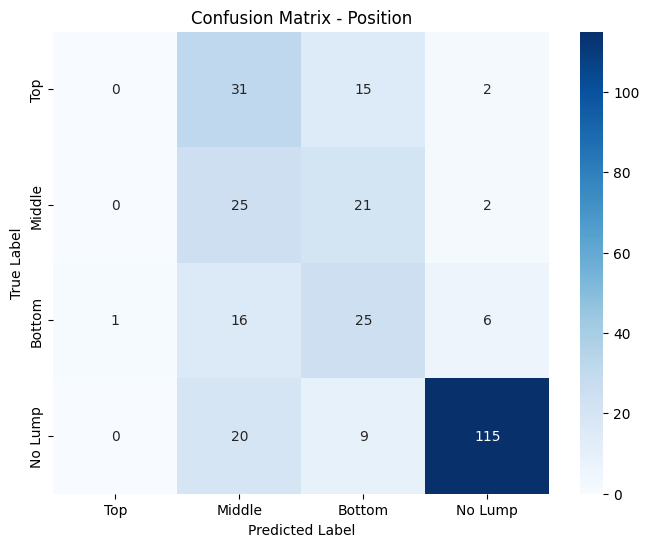


Classification Report - Position:
              precision    recall  f1-score   support

         Top       0.00      0.00      0.00        48
      Middle       0.27      0.52      0.36        48
      Bottom       0.36      0.52      0.42        48
     No Lump       0.92      0.80      0.86       144

    accuracy                           0.57       288
   macro avg       0.39      0.46      0.41       288
weighted avg       0.56      0.57      0.56       288



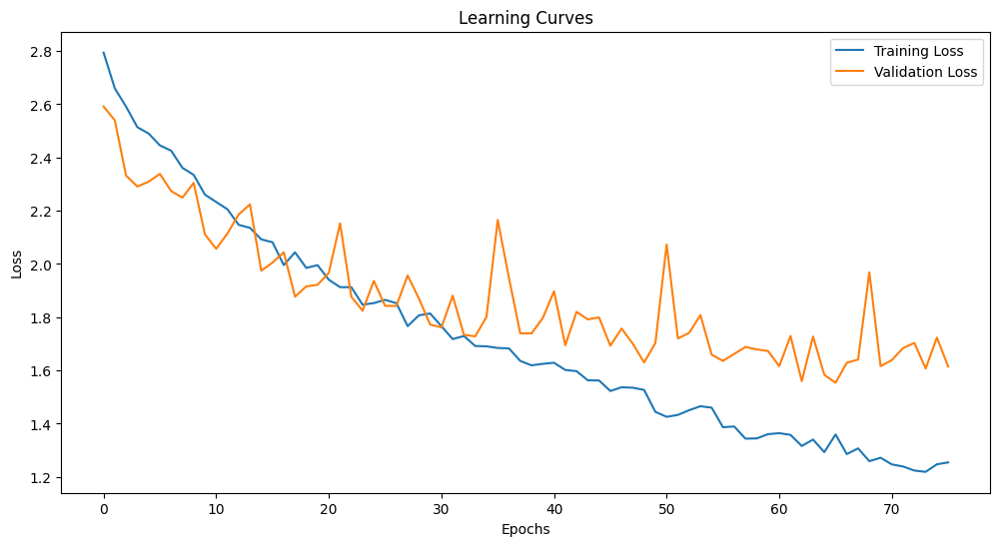

| Training Phase                         |   Lump Accuracy |   Size Accuracy |   Position Accuracy |
|:---------------------------------------|----------------:|----------------:|--------------------:|
| Initial Training                       |        0.876389 |        0.755556 |            0.651389 |
| Testing on doctors without fine-tuning |        0.4375   |        0.194444 |            0.184028 |
| Fine-tuning with 1 trials              |        0.670139 |        0.277778 |            0.28125  |
| Fine-tuning with 2 trials              |        0.805556 |        0.569444 |            0.572917 |
| Fine-tuning with 3 trials              |        0.555556 |        0.256944 |            0.246528 |
| Fine-tuning with 4 trials              |        0.885417 |        0.680556 |            0.59375  |
| Fine-tuning with 5 trials              |        0.802083 |        0.569444 |            0.572917 |


In [17]:
all_results = []
for sensor_config_name, sensor_indices in sensor_configs.items():
    for duration in durations:
        print(f"\nRunning experiment with {sensor_config_name} sensors and {duration} seconds")
        initial_accuracies, fine_tune_accuracies = train_multitask_model(sensor_indices, duration, train_df, valid_df, test_df, additional_df=doctors_df, few_shot_steps=5)
        all_results.append((f'{sensor_config_name}_{duration}s_initial', *initial_accuracies))
        all_results.append((f'{sensor_config_name}_{duration}s_fine_tuned', *fine_tune_accuracies))

In [18]:
summary = pd.DataFrame(all_results, columns=['Configuration', 'Lump Accuracy', 'Size Accuracy', 'Position Accuracy'])
print(summary.to_markdown(index=False))

| Configuration             |   Lump Accuracy |   Size Accuracy |   Position Accuracy |
|:--------------------------|----------------:|----------------:|--------------------:|
| tips_1s_initial           |        0.784722 |        0.586111 |            0.55     |
| tips_1s_fine_tuned        |        0.760417 |        0.552083 |            0.534722 |
| tips_2s_initial           |        0.751389 |        0.609722 |            0.555556 |
| tips_2s_fine_tuned        |        0.868056 |        0.600694 |            0.583333 |
| tips_3s_initial           |        0.802778 |        0.666667 |            0.593056 |
| tips_3s_fine_tuned        |        0.878472 |        0.635417 |            0.579861 |
| tips_4s_initial           |        0.820833 |        0.701389 |            0.629167 |
| tips_4s_fine_tuned        |        0.833333 |        0.635417 |            0.607639 |
| tips_5s_initial           |        0.752778 |        0.605556 |            0.558333 |
| tips_5s_fine_tuned        |   

In [28]:
summary = pd.DataFrame(all_results, columns=['Configuration', 'Lump Accuracy', 'Size Accuracy', 'Position Accuracy'])
print(summary.to_markdown(index=False))

| Configuration             |   Lump Accuracy |   Size Accuracy |   Position Accuracy |
|:--------------------------|----------------:|----------------:|--------------------:|
| tips_1s_initial           |        0.841667 |        0.701389 |            0.663889 |
| tips_1s_fine_tuned        |        0.892361 |        0.704861 |            0.65625  |
| tips_2s_initial           |        0.808333 |        0.681944 |            0.608333 |
| tips_2s_fine_tuned        |        0.892361 |        0.704861 |            0.6875   |
| tips_3s_initial           |        0.809722 |        0.684722 |            0.620833 |
| tips_3s_fine_tuned        |        0.90625  |        0.684028 |            0.694444 |
| tips_4s_initial           |        0.806944 |        0.708333 |            0.641667 |
| tips_4s_fine_tuned        |        0.864583 |        0.666667 |            0.659722 |
| tips_5s_initial           |        0.809722 |        0.6875   |            0.613889 |
| tips_5s_fine_tuned        |   